In [1]:
import tensorflow as tf
from tensorflow import keras
from keras import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Rescaling
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2024-06-17 20:36:21.147862: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-17 20:36:21.147989: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-17 20:36:21.415459: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
image_height, image_width = 256, 256
batch_size = 32

In [3]:
train_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/dogs-vs-cats/train',
    labels = 'inferred',
    label_mode = 'int',
    batch_size = 32,
    image_size = (image_height, image_width)  
)

validation_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/dogs-vs-cats/test',
    labels = 'inferred',
    label_mode = 'int',
    batch_size = 32,
    image_size = (image_height, image_width)
)

Found 20000 files belonging to 2 classes.


Found 5000 files belonging to 2 classes.


In [4]:
print(train_ds.class_names)

['cats', 'dogs']


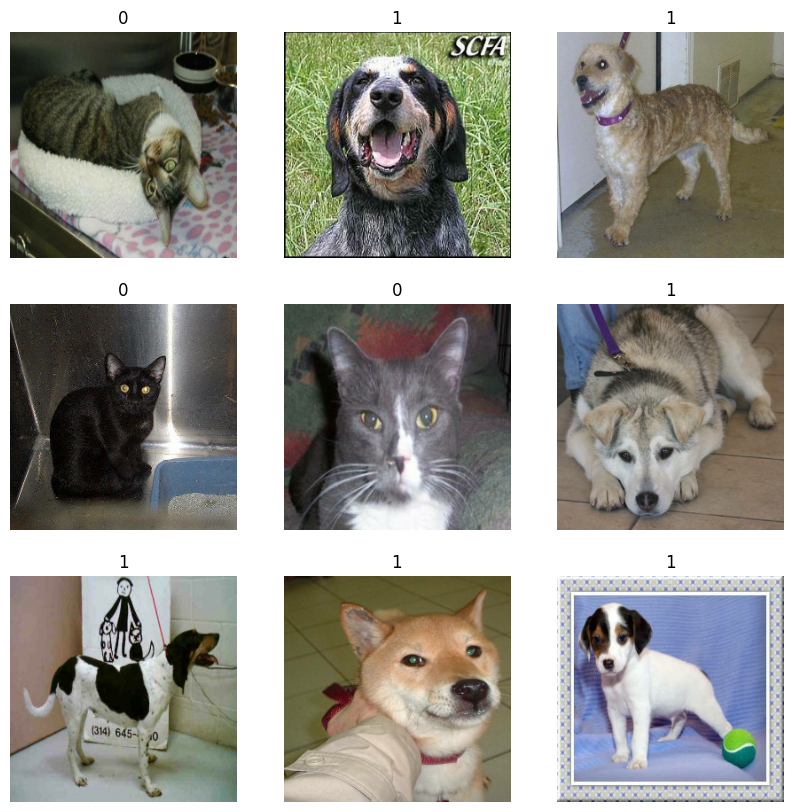

In [5]:
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image[i].numpy().astype('uint8'))
    plt.title(int(label[i]))
    plt.axis("off")

# Simple CNN without Data Augmentation

In [6]:
# create CNN model

model = Sequential()

model.add(Rescaling(1./255, input_shape=(image_height, image_width, 3)))

model.add(Conv2D(32, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), padding = 'valid', strides = 2))

model.add(Conv2D(64, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), padding = 'valid', strides = 2))

model.add(Conv2D(128, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), padding = 'valid', strides = 2))

model.add(Flatten())
model.add(Dense(128, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/preprocessing/tf_data_layer.py:18: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [7]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling (Rescaling)           │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,297 (56.64 MB)

 Trainable params: 14,847,297 (56.64 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [9]:
history = model.fit(train_ds, epochs = 10, validation_data = validation_ds)

Epoch 1/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:22:27 14s/step - accuracy: 0.5312 - loss: 0.6916

  2/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.5312 - loss: 1.3471   

  3/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.5278 - loss: 1.4204

I0000 00:00:1718656643.647517      79 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1718656643.666293      79 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


  4/625 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - accuracy: 0.5228 - loss: 1.4199

  5/625 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - accuracy: 0.5207 - loss: 1.3920

  6/625 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - accuracy: 0.5225 - loss: 1.3570

  7/625 ━━━━━━━━━━━━━━━━━━━━ 32s 52ms/step - accuracy: 0.5212 - loss: 1.3222

  8/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5185 - loss: 1.2895

  9/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5165 - loss: 1.2595

 10/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5145 - loss: 1.2323

 11/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5140 - loss: 1.2076

 12/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5137 - loss: 1.1850

 13/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5132 - loss: 1.1646

 14/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5129 - loss: 1.1459

 15/625 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step - accuracy: 0.5124 - loss: 1.1288

 16/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5120 - loss: 1.1131

 17/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5115 - loss: 1.0986

 18/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5113 - loss: 1.0851

 19/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5109 - loss: 1.0727

 20/625 ━━━━━━━━━━━━━━━━━━━━ 31s 51ms/step - accuracy: 0.5107 - loss: 1.0611

 21/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5102 - loss: 1.0502

 22/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5101 - loss: 1.0401

 23/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5099 - loss: 1.0306

 24/625 ━━━━━━━━━━━━━━━━━━━━ 30s 51ms/step - accuracy: 0.5096 - loss: 1.0217

 25/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.5094 - loss: 1.0133

 26/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.5091 - loss: 1.0054

 27/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.5087 - loss: 0.9979

 28/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.5083 - loss: 0.9908

 29/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.5081 - loss: 0.9841

 30/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.5081 - loss: 0.9777

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 52ms/step - accuracy: 0.5081 - loss: 0.9716

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.5081 - loss: 0.9658

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.5081 - loss: 0.9602

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.5081 - loss: 0.9550

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.5082 - loss: 0.9499

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.5082 - loss: 0.9450

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.5082 - loss: 0.9404

 38/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.5080 - loss: 0.9360

 39/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.5078 - loss: 0.9317

 40/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.5076 - loss: 0.9276

 41/625 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - accuracy: 0.5075 - loss: 0.9236

 42/625 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - accuracy: 0.5073 - loss: 0.9199

 43/625 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - accuracy: 0.5071 - loss: 0.9162

 44/625 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - accuracy: 0.5069 - loss: 0.9127

 45/625 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step - accuracy: 0.5067 - loss: 0.9093

 46/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5064 - loss: 0.9060

 47/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5062 - loss: 0.9029

 48/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5060 - loss: 0.8998

 49/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5058 - loss: 0.8969

 50/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5057 - loss: 0.8940

 51/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5055 - loss: 0.8912

 52/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5053 - loss: 0.8885

 53/625 ━━━━━━━━━━━━━━━━━━━━ 32s 57ms/step - accuracy: 0.5051 - loss: 0.8859

 54/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5049 - loss: 0.8834

 55/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5048 - loss: 0.8809

 56/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5048 - loss: 0.8785

 57/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8762

 58/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8739

 59/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8717

 60/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8696

 61/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8675

 62/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8654

 63/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5047 - loss: 0.8634

 64/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5048 - loss: 0.8615

 65/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5048 - loss: 0.8596

 66/625 ━━━━━━━━━━━━━━━━━━━━ 32s 58ms/step - accuracy: 0.5049 - loss: 0.8578

 67/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5049 - loss: 0.8559

 68/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5051 - loss: 0.8542

 69/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5052 - loss: 0.8524

 70/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5053 - loss: 0.8508

 71/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5054 - loss: 0.8491

 72/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5055 - loss: 0.8475

 73/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5055 - loss: 0.8459

 74/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5056 - loss: 0.8444

 75/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5058 - loss: 0.8429

 76/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5059 - loss: 0.8414

 77/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5060 - loss: 0.8399

 78/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5062 - loss: 0.8385

 79/625 ━━━━━━━━━━━━━━━━━━━━ 32s 59ms/step - accuracy: 0.5063 - loss: 0.8371

 80/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5064 - loss: 0.8357

 81/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5066 - loss: 0.8344

 82/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5067 - loss: 0.8331

 83/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5069 - loss: 0.8318

 84/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5070 - loss: 0.8305

 85/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5072 - loss: 0.8293

 86/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5074 - loss: 0.8281

 87/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5075 - loss: 0.8269

 88/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5077 - loss: 0.8257

 89/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5078 - loss: 0.8246

 90/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5080 - loss: 0.8234

 91/625 ━━━━━━━━━━━━━━━━━━━━ 32s 60ms/step - accuracy: 0.5082 - loss: 0.8223

 92/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5084 - loss: 0.8212

 93/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5085 - loss: 0.8202

 94/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5087 - loss: 0.8191

 95/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5089 - loss: 0.8181

 96/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5091 - loss: 0.8171

 97/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5092 - loss: 0.8161

 98/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5094 - loss: 0.8151

 99/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5096 - loss: 0.8141

100/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5098 - loss: 0.8132

101/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5100 - loss: 0.8122

102/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5102 - loss: 0.8113

103/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5104 - loss: 0.8104

104/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5106 - loss: 0.8095

105/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5108 - loss: 0.8087

106/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5110 - loss: 0.8078

107/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5112 - loss: 0.8070

108/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5114 - loss: 0.8061

109/625 ━━━━━━━━━━━━━━━━━━━━ 31s 60ms/step - accuracy: 0.5115 - loss: 0.8053

110/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5117 - loss: 0.8045

111/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5119 - loss: 0.8037

112/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5121 - loss: 0.8029

113/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5123 - loss: 0.8021

114/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5125 - loss: 0.8014

115/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5126 - loss: 0.8006

116/625 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step - accuracy: 0.5128 - loss: 0.7999

117/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5130 - loss: 0.7991

118/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5132 - loss: 0.7984

119/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5134 - loss: 0.7977

120/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5135 - loss: 0.7970

121/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5137 - loss: 0.7963

122/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5139 - loss: 0.7956

123/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5141 - loss: 0.7950

124/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5143 - loss: 0.7943

125/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5145 - loss: 0.7936

126/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5147 - loss: 0.7930

127/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5150 - loss: 0.7923

128/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5152 - loss: 0.7917

129/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5154 - loss: 0.7911

130/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5156 - loss: 0.7904

131/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5157 - loss: 0.7898

132/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5159 - loss: 0.7892

133/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5161 - loss: 0.7886

134/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5163 - loss: 0.7880

135/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5165 - loss: 0.7874

136/625 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step - accuracy: 0.5167 - loss: 0.7869

137/625 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step - accuracy: 0.5169 - loss: 0.7863

138/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5172 - loss: 0.7857

139/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5174 - loss: 0.7851

140/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5176 - loss: 0.7846

141/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5178 - loss: 0.7840

142/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5180 - loss: 0.7835

143/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5182 - loss: 0.7830

144/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5184 - loss: 0.7824

145/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5186 - loss: 0.7819

146/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5188 - loss: 0.7814

147/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5190 - loss: 0.7809

148/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5192 - loss: 0.7804

149/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5194 - loss: 0.7799

150/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5196 - loss: 0.7794

151/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5199 - loss: 0.7789

152/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5201 - loss: 0.7784

153/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5203 - loss: 0.7779

154/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5205 - loss: 0.7774

155/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5207 - loss: 0.7769

156/625 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step - accuracy: 0.5209 - loss: 0.7765

157/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5211 - loss: 0.7760

158/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5213 - loss: 0.7755

159/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5215 - loss: 0.7751

160/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5217 - loss: 0.7746

161/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5219 - loss: 0.7742

162/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5221 - loss: 0.7737

163/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5223 - loss: 0.7733

164/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5225 - loss: 0.7728

165/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5227 - loss: 0.7724

166/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5229 - loss: 0.7720

167/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5231 - loss: 0.7715

168/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5233 - loss: 0.7711

169/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5236 - loss: 0.7707

170/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5238 - loss: 0.7703

171/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5240 - loss: 0.7699

172/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5242 - loss: 0.7694

173/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5244 - loss: 0.7690

174/625 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step - accuracy: 0.5246 - loss: 0.7686

175/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5248 - loss: 0.7682

176/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5250 - loss: 0.7678

177/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5252 - loss: 0.7674

178/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5254 - loss: 0.7670

179/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5256 - loss: 0.7667

180/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5258 - loss: 0.7663

181/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5260 - loss: 0.7659

182/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5262 - loss: 0.7655

183/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5264 - loss: 0.7652

184/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5266 - loss: 0.7648

185/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5268 - loss: 0.7644

186/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5269 - loss: 0.7641

187/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5271 - loss: 0.7637

188/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5273 - loss: 0.7633

189/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5275 - loss: 0.7630

190/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5277 - loss: 0.7626

191/625 ━━━━━━━━━━━━━━━━━━━━ 27s 62ms/step - accuracy: 0.5279 - loss: 0.7623

192/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5281 - loss: 0.7620

193/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5283 - loss: 0.7616

194/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5284 - loss: 0.7613

195/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5286 - loss: 0.7609

196/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5288 - loss: 0.7606

197/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5290 - loss: 0.7603

198/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5292 - loss: 0.7599

199/625 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step - accuracy: 0.5294 - loss: 0.7596

200/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5295 - loss: 0.7593

201/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5297 - loss: 0.7590

202/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5299 - loss: 0.7587

203/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5301 - loss: 0.7584

204/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5302 - loss: 0.7581

205/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5304 - loss: 0.7577

206/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5306 - loss: 0.7574

207/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5307 - loss: 0.7571

208/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5309 - loss: 0.7568

209/625 ━━━━━━━━━━━━━━━━━━━━ 26s 63ms/step - accuracy: 0.5311 - loss: 0.7565

210/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5312 - loss: 0.7562

211/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5314 - loss: 0.7559

212/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5316 - loss: 0.7557

213/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5317 - loss: 0.7554

214/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5319 - loss: 0.7551

215/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5321 - loss: 0.7548

216/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5323 - loss: 0.7545

217/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5324 - loss: 0.7542

218/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5326 - loss: 0.7539

219/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5328 - loss: 0.7537

220/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5329 - loss: 0.7534

221/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5331 - loss: 0.7531

222/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5333 - loss: 0.7528

223/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5334 - loss: 0.7525

224/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5336 - loss: 0.7523

225/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5337 - loss: 0.7520

226/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5339 - loss: 0.7517

227/625 ━━━━━━━━━━━━━━━━━━━━ 25s 63ms/step - accuracy: 0.5341 - loss: 0.7515

228/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5342 - loss: 0.7512

229/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5344 - loss: 0.7509

230/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5345 - loss: 0.7507

231/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5347 - loss: 0.7504

232/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5349 - loss: 0.7501

233/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5350 - loss: 0.7499

234/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5352 - loss: 0.7496

235/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5353 - loss: 0.7494

236/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5355 - loss: 0.7491

237/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5356 - loss: 0.7489

238/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5358 - loss: 0.7486

239/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5360 - loss: 0.7484

240/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5361 - loss: 0.7481

241/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5363 - loss: 0.7479

242/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5364 - loss: 0.7476

243/625 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step - accuracy: 0.5366 - loss: 0.7474

244/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5367 - loss: 0.7471

245/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5369 - loss: 0.7469

246/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5370 - loss: 0.7466

247/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5372 - loss: 0.7464

248/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5374 - loss: 0.7462

249/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5375 - loss: 0.7459

250/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5377 - loss: 0.7457

251/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5378 - loss: 0.7455

252/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5380 - loss: 0.7452

253/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5381 - loss: 0.7450

254/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5383 - loss: 0.7448

255/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5384 - loss: 0.7445

256/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5386 - loss: 0.7443

257/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5387 - loss: 0.7441

258/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5389 - loss: 0.7439

259/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5390 - loss: 0.7437

260/625 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step - accuracy: 0.5392 - loss: 0.7434

261/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5393 - loss: 0.7432

262/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5395 - loss: 0.7430

263/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5396 - loss: 0.7428

264/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5397 - loss: 0.7426

265/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5399 - loss: 0.7424

266/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5400 - loss: 0.7421

267/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5402 - loss: 0.7419

268/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5403 - loss: 0.7417

269/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5405 - loss: 0.7415

270/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5406 - loss: 0.7413

271/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5407 - loss: 0.7411

272/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5409 - loss: 0.7409

273/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5410 - loss: 0.7407

274/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5412 - loss: 0.7405

275/625 ━━━━━━━━━━━━━━━━━━━━ 22s 63ms/step - accuracy: 0.5413 - loss: 0.7403

276/625 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - accuracy: 0.5414 - loss: 0.7401

277/625 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - accuracy: 0.5416 - loss: 0.7399

278/625 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - accuracy: 0.5417 - loss: 0.7397

279/625 ━━━━━━━━━━━━━━━━━━━━ 22s 64ms/step - accuracy: 0.5419 - loss: 0.7395

280/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5420 - loss: 0.7393

281/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5421 - loss: 0.7391

282/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5423 - loss: 0.7389

283/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5424 - loss: 0.7387

284/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5426 - loss: 0.7385

285/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5427 - loss: 0.7383

286/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5428 - loss: 0.7381

287/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5430 - loss: 0.7379

288/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5431 - loss: 0.7377

289/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5432 - loss: 0.7375

290/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5434 - loss: 0.7373

291/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5435 - loss: 0.7371

292/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5436 - loss: 0.7369

293/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5438 - loss: 0.7367

294/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5439 - loss: 0.7365

295/625 ━━━━━━━━━━━━━━━━━━━━ 21s 64ms/step - accuracy: 0.5441 - loss: 0.7364

296/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5442 - loss: 0.7362

297/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5443 - loss: 0.7360

298/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5445 - loss: 0.7358

299/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5446 - loss: 0.7356

300/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5447 - loss: 0.7354

301/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5449 - loss: 0.7352

302/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5450 - loss: 0.7351

303/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5451 - loss: 0.7349

304/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5453 - loss: 0.7347

305/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5454 - loss: 0.7345

306/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5455 - loss: 0.7343

307/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5456 - loss: 0.7342

308/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5458 - loss: 0.7340

309/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5459 - loss: 0.7338

310/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5460 - loss: 0.7336

311/625 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step - accuracy: 0.5461 - loss: 0.7335

312/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5463 - loss: 0.7333

313/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5464 - loss: 0.7331

314/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5465 - loss: 0.7330

315/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5466 - loss: 0.7328

316/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5468 - loss: 0.7326

317/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5469 - loss: 0.7325

318/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5470 - loss: 0.7323

319/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5471 - loss: 0.7321

320/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5473 - loss: 0.7320

321/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5474 - loss: 0.7318

322/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5475 - loss: 0.7316

323/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5476 - loss: 0.7315

324/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5477 - loss: 0.7313

325/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5479 - loss: 0.7312

326/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5480 - loss: 0.7310

327/625 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step - accuracy: 0.5481 - loss: 0.7308

328/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5482 - loss: 0.7307

329/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5483 - loss: 0.7305

330/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5484 - loss: 0.7304

331/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5485 - loss: 0.7302

332/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5487 - loss: 0.7301

333/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5488 - loss: 0.7299

334/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5489 - loss: 0.7297

335/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5490 - loss: 0.7296

336/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5491 - loss: 0.7294

337/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5492 - loss: 0.7293

338/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5493 - loss: 0.7291

339/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5494 - loss: 0.7290

340/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5495 - loss: 0.7288

341/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5497 - loss: 0.7287

342/625 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step - accuracy: 0.5498 - loss: 0.7285

343/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5499 - loss: 0.7284

344/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5500 - loss: 0.7282

345/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5501 - loss: 0.7281

346/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5502 - loss: 0.7279

347/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5503 - loss: 0.7278

348/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5504 - loss: 0.7276

349/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5505 - loss: 0.7275

350/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5506 - loss: 0.7273

351/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5507 - loss: 0.7272

352/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5508 - loss: 0.7271

353/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5509 - loss: 0.7269

354/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5510 - loss: 0.7268

355/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5512 - loss: 0.7266

356/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5513 - loss: 0.7265

357/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5514 - loss: 0.7263

358/625 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step - accuracy: 0.5515 - loss: 0.7262

359/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5516 - loss: 0.7261

360/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5517 - loss: 0.7259

361/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5518 - loss: 0.7258

362/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5519 - loss: 0.7256

363/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5520 - loss: 0.7255

364/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5521 - loss: 0.7254

365/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5522 - loss: 0.7252

366/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5523 - loss: 0.7251

367/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5524 - loss: 0.7250

368/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5526 - loss: 0.7248

369/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5527 - loss: 0.7247

370/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5528 - loss: 0.7246

371/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5529 - loss: 0.7244

372/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5530 - loss: 0.7243

373/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5531 - loss: 0.7242

374/625 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.5532 - loss: 0.7240

375/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5533 - loss: 0.7239

376/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5534 - loss: 0.7238

377/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5535 - loss: 0.7236

378/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5536 - loss: 0.7235

379/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5537 - loss: 0.7234

380/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5538 - loss: 0.7232

381/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5539 - loss: 0.7231

382/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5540 - loss: 0.7230

383/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5541 - loss: 0.7229

384/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5542 - loss: 0.7227

385/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5543 - loss: 0.7226

386/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5544 - loss: 0.7225

387/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5545 - loss: 0.7224

388/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5546 - loss: 0.7222

389/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5548 - loss: 0.7221

390/625 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step - accuracy: 0.5549 - loss: 0.7220

391/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5550 - loss: 0.7219

392/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5551 - loss: 0.7217

393/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5552 - loss: 0.7216

394/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5553 - loss: 0.7215

395/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5554 - loss: 0.7214

396/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5555 - loss: 0.7212

397/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5556 - loss: 0.7211

398/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5557 - loss: 0.7210

399/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5558 - loss: 0.7209

400/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5559 - loss: 0.7208

401/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5560 - loss: 0.7206

402/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5561 - loss: 0.7205

403/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5562 - loss: 0.7204

404/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5563 - loss: 0.7203

405/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5564 - loss: 0.7202

406/625 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step - accuracy: 0.5565 - loss: 0.7200

407/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5566 - loss: 0.7199

408/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5567 - loss: 0.7198

409/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5568 - loss: 0.7197

410/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5569 - loss: 0.7196

411/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5570 - loss: 0.7194

412/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5571 - loss: 0.7193

413/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5572 - loss: 0.7192

414/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5573 - loss: 0.7191

415/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5574 - loss: 0.7190

416/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5575 - loss: 0.7189

417/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5576 - loss: 0.7188

418/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5577 - loss: 0.7186

419/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5578 - loss: 0.7185

420/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5579 - loss: 0.7184

421/625 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.5580 - loss: 0.7183

422/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5581 - loss: 0.7182

423/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5582 - loss: 0.7181

424/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5583 - loss: 0.7180

425/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5584 - loss: 0.7179

426/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5585 - loss: 0.7177

427/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5586 - loss: 0.7176

428/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5587 - loss: 0.7175

429/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5588 - loss: 0.7174

430/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5589 - loss: 0.7173

431/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5590 - loss: 0.7172

432/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5591 - loss: 0.7171

433/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5592 - loss: 0.7170

434/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5593 - loss: 0.7169

435/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5594 - loss: 0.7168

436/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5595 - loss: 0.7167

437/625 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step - accuracy: 0.5596 - loss: 0.7165

438/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5597 - loss: 0.7164

439/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5598 - loss: 0.7163

440/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5599 - loss: 0.7162

441/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5600 - loss: 0.7161

442/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5601 - loss: 0.7160

443/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5602 - loss: 0.7159

444/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5603 - loss: 0.7158

445/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5604 - loss: 0.7157

446/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5604 - loss: 0.7156

447/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5605 - loss: 0.7155

448/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5606 - loss: 0.7154

449/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5607 - loss: 0.7153

450/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5608 - loss: 0.7152

451/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5609 - loss: 0.7151

452/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5610 - loss: 0.7150

453/625 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step - accuracy: 0.5611 - loss: 0.7149

454/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5612 - loss: 0.7148

455/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5613 - loss: 0.7147

456/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5614 - loss: 0.7146

457/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5615 - loss: 0.7145

458/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5616 - loss: 0.7144

459/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5617 - loss: 0.7143

460/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5618 - loss: 0.7142

461/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5619 - loss: 0.7141

462/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5620 - loss: 0.7140

463/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5621 - loss: 0.7139

464/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5622 - loss: 0.7138

465/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5623 - loss: 0.7137

466/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5624 - loss: 0.7136

467/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5625 - loss: 0.7135

468/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5626 - loss: 0.7134

469/625 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step - accuracy: 0.5627 - loss: 0.7133

470/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5628 - loss: 0.7132 

471/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5629 - loss: 0.7131

472/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5630 - loss: 0.7130

473/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5631 - loss: 0.7129

474/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5631 - loss: 0.7128

475/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5632 - loss: 0.7127

476/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5633 - loss: 0.7126

477/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5634 - loss: 0.7125

478/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5635 - loss: 0.7124

479/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5636 - loss: 0.7123

480/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5637 - loss: 0.7122

481/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5638 - loss: 0.7121

482/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5639 - loss: 0.7120

483/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5640 - loss: 0.7119

484/625 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step - accuracy: 0.5641 - loss: 0.7118

485/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5642 - loss: 0.7117

486/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5643 - loss: 0.7116

487/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5644 - loss: 0.7115

488/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5644 - loss: 0.7114

489/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5645 - loss: 0.7113

490/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5646 - loss: 0.7112

491/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5647 - loss: 0.7111

492/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5648 - loss: 0.7110

493/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5649 - loss: 0.7109

494/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5650 - loss: 0.7109

495/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5651 - loss: 0.7108

496/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5652 - loss: 0.7107

497/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5653 - loss: 0.7106

498/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5654 - loss: 0.7105

499/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5654 - loss: 0.7104

500/625 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step - accuracy: 0.5655 - loss: 0.7103

501/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5656 - loss: 0.7102

502/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5657 - loss: 0.7101

503/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5658 - loss: 0.7100

504/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5659 - loss: 0.7099

505/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5660 - loss: 0.7098

506/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5661 - loss: 0.7098

507/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5662 - loss: 0.7097

508/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5662 - loss: 0.7096

509/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5663 - loss: 0.7095

510/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5664 - loss: 0.7094

511/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5665 - loss: 0.7093

512/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5666 - loss: 0.7092

513/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5667 - loss: 0.7091

514/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5668 - loss: 0.7090

515/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5669 - loss: 0.7089

516/625 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step - accuracy: 0.5669 - loss: 0.7089

517/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5670 - loss: 0.7088

518/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5671 - loss: 0.7087

519/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5672 - loss: 0.7086

520/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5673 - loss: 0.7085

521/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5674 - loss: 0.7084

522/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5675 - loss: 0.7083

523/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5676 - loss: 0.7082

524/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5677 - loss: 0.7081

525/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5677 - loss: 0.7081

526/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5678 - loss: 0.7080

527/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5679 - loss: 0.7079

528/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5680 - loss: 0.7078

529/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5681 - loss: 0.7077

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5682 - loss: 0.7076

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step - accuracy: 0.5683 - loss: 0.7075

532/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5684 - loss: 0.7074

533/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5684 - loss: 0.7074

534/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5685 - loss: 0.7073

535/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5686 - loss: 0.7072

536/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5687 - loss: 0.7071

537/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5688 - loss: 0.7070

538/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5689 - loss: 0.7069

539/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5690 - loss: 0.7068

540/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5691 - loss: 0.7067

541/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5691 - loss: 0.7067

542/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5692 - loss: 0.7066

543/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5693 - loss: 0.7065

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5694 - loss: 0.7064

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5695 - loss: 0.7063

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5696 - loss: 0.7062

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step - accuracy: 0.5697 - loss: 0.7061

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5697 - loss: 0.7061

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5698 - loss: 0.7060

550/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5699 - loss: 0.7059

551/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5700 - loss: 0.7058

552/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5701 - loss: 0.7057

553/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5702 - loss: 0.7056

554/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5703 - loss: 0.7056

555/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5703 - loss: 0.7055

556/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5704 - loss: 0.7054

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5705 - loss: 0.7053

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5706 - loss: 0.7052

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5707 - loss: 0.7051

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5707 - loss: 0.7051

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5708 - loss: 0.7050

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step - accuracy: 0.5709 - loss: 0.7049

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5710 - loss: 0.7048

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5711 - loss: 0.7047

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5712 - loss: 0.7046

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5712 - loss: 0.7046

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5713 - loss: 0.7045

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5714 - loss: 0.7044

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5715 - loss: 0.7043

570/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5716 - loss: 0.7042

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5716 - loss: 0.7042

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5717 - loss: 0.7041

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5718 - loss: 0.7040

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5719 - loss: 0.7039

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5720 - loss: 0.7038

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5721 - loss: 0.7037

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5721 - loss: 0.7037

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step - accuracy: 0.5722 - loss: 0.7036

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5723 - loss: 0.7035

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5724 - loss: 0.7034

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5725 - loss: 0.7033

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5726 - loss: 0.7033

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5726 - loss: 0.7032

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5727 - loss: 0.7031

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5728 - loss: 0.7030

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5729 - loss: 0.7029

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5730 - loss: 0.7029

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5730 - loss: 0.7028

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5731 - loss: 0.7027

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5732 - loss: 0.7026

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5733 - loss: 0.7025

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5734 - loss: 0.7025

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step - accuracy: 0.5735 - loss: 0.7024

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5735 - loss: 0.7023

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5736 - loss: 0.7022

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5737 - loss: 0.7022

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5738 - loss: 0.7021

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5739 - loss: 0.7020

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5739 - loss: 0.7019

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5740 - loss: 0.7018

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5741 - loss: 0.7018

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5742 - loss: 0.7017

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5743 - loss: 0.7016

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5743 - loss: 0.7015

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5744 - loss: 0.7015

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5745 - loss: 0.7014

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5746 - loss: 0.7013

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5747 - loss: 0.7012

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step - accuracy: 0.5748 - loss: 0.7011

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5748 - loss: 0.7011

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5749 - loss: 0.7010

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5750 - loss: 0.7009

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5751 - loss: 0.7008

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5752 - loss: 0.7008

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5752 - loss: 0.7007

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5753 - loss: 0.7006

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5754 - loss: 0.7005

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5755 - loss: 0.7004

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5756 - loss: 0.7004

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5756 - loss: 0.7003

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5757 - loss: 0.7002

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5758 - loss: 0.7001

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5759 - loss: 0.7001

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5760 - loss: 0.7000

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.5760 - loss: 0.6999

W0000 00:00:1718656684.393524      78 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


625/625 ━━━━━━━━━━━━━━━━━━━━ 65s 81ms/step - accuracy: 0.5761 - loss: 0.6998 - val_accuracy: 0.7006 - val_loss: 0.5844


Epoch 2/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 3:21:34 19s/step - accuracy: 0.7188 - loss: 0.5258

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.7109 - loss: 0.5705   

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.7101 - loss: 0.5800

  4/625 ━━━━━━━━━━━━━━━━━━━━ 41s 67ms/step - accuracy: 0.7044 - loss: 0.5853

  5/625 ━━━━━━━━━━━━━━━━━━━━ 39s 63ms/step - accuracy: 0.7023 - loss: 0.5853

  6/625 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - accuracy: 0.6981 - loss: 0.5864

  7/625 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step - accuracy: 0.6972 - loss: 0.5863

  8/625 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - accuracy: 0.6989 - loss: 0.5845

  9/625 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step - accuracy: 0.7007 - loss: 0.5834

 10/625 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step - accuracy: 0.7004 - loss: 0.5833

 11/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.6992 - loss: 0.5841

 12/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.6971 - loss: 0.5853

 13/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.6960 - loss: 0.5863

 14/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.6959 - loss: 0.5864

 15/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.6962 - loss: 0.5863

 16/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.6966 - loss: 0.5861

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.6971 - loss: 0.5857

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.6977 - loss: 0.5853

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.6981 - loss: 0.5845

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.6983 - loss: 0.5840

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.6985 - loss: 0.5835

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.6985 - loss: 0.5831

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.6985 - loss: 0.5829

 24/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.6985 - loss: 0.5827

 25/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6986 - loss: 0.5824

 26/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6983 - loss: 0.5822

 27/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6981 - loss: 0.5821

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6980 - loss: 0.5819

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6977 - loss: 0.5817

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6974 - loss: 0.5817

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6973 - loss: 0.5816

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6971 - loss: 0.5815

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6970 - loss: 0.5814

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6968 - loss: 0.5813

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6967 - loss: 0.5811

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6966 - loss: 0.5810

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6963 - loss: 0.5810

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.6961 - loss: 0.5810

 39/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6959 - loss: 0.5809

 40/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6957 - loss: 0.5809

 41/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6955 - loss: 0.5810

 42/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6954 - loss: 0.5810

 43/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6952 - loss: 0.5810

 44/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6951 - loss: 0.5810

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6950 - loss: 0.5810

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6948 - loss: 0.5810

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6947 - loss: 0.5810

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6946 - loss: 0.5810

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6945 - loss: 0.5810

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.6944 - loss: 0.5810

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.6943 - loss: 0.5810

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 52ms/step - accuracy: 0.6942 - loss: 0.5810

 53/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6941 - loss: 0.5810

 54/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6939 - loss: 0.5810

 55/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6938 - loss: 0.5810

 56/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6937 - loss: 0.5810

 57/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6936 - loss: 0.5810

 58/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6935 - loss: 0.5810

 59/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6935 - loss: 0.5810

 60/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6934 - loss: 0.5811

 61/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6933 - loss: 0.5812

 62/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6932 - loss: 0.5812

 63/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6931 - loss: 0.5813

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6930 - loss: 0.5813

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6930 - loss: 0.5813

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6929 - loss: 0.5813

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6928 - loss: 0.5814

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6927 - loss: 0.5815

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 52ms/step - accuracy: 0.6927 - loss: 0.5815

 70/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6926 - loss: 0.5816

 71/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6926 - loss: 0.5816

 72/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6925 - loss: 0.5817

 73/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6924 - loss: 0.5818

 74/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6924 - loss: 0.5818

 75/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6923 - loss: 0.5819

 76/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6923 - loss: 0.5819

 77/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6922 - loss: 0.5820

 78/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6922 - loss: 0.5820

 79/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6921 - loss: 0.5821

 80/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6920 - loss: 0.5822

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6920 - loss: 0.5822

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6919 - loss: 0.5823

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6919 - loss: 0.5823

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6918 - loss: 0.5824

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6917 - loss: 0.5824

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 52ms/step - accuracy: 0.6917 - loss: 0.5825

 87/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6917 - loss: 0.5825

 88/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5825

 89/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5826

 90/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5826

 91/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5826

 92/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5826

 93/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5827

 94/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5827

 95/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6916 - loss: 0.5827

 96/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6915 - loss: 0.5828

 97/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6915 - loss: 0.5828

 98/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6915 - loss: 0.5829

 99/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6914 - loss: 0.5829

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6914 - loss: 0.5829

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6914 - loss: 0.5830

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6913 - loss: 0.5830

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6913 - loss: 0.5830

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 52ms/step - accuracy: 0.6913 - loss: 0.5831

105/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6912 - loss: 0.5831

106/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6912 - loss: 0.5832

107/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6912 - loss: 0.5832

108/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6911 - loss: 0.5833

109/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6911 - loss: 0.5833

110/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6911 - loss: 0.5833

111/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5834

112/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5834

113/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5834

114/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5835

115/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5835

116/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5835

117/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5835

118/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5835

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5836

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5836

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5836

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5836

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 52ms/step - accuracy: 0.6910 - loss: 0.5836

124/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6910 - loss: 0.5837

125/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6910 - loss: 0.5837

126/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5837

127/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5838

128/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5838

129/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5839

130/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5839

131/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5839

132/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5839

133/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5840

134/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5840

135/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6911 - loss: 0.5840

136/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6912 - loss: 0.5840

137/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6912 - loss: 0.5841

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6912 - loss: 0.5841

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6912 - loss: 0.5841

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6912 - loss: 0.5841

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6912 - loss: 0.5841

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 52ms/step - accuracy: 0.6913 - loss: 0.5842

143/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6913 - loss: 0.5842

144/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6913 - loss: 0.5842

145/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6913 - loss: 0.5842

146/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6913 - loss: 0.5842

147/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6913 - loss: 0.5842

148/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6914 - loss: 0.5842

149/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6914 - loss: 0.5842

150/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6914 - loss: 0.5842

151/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6915 - loss: 0.5842

152/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6915 - loss: 0.5842

153/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6916 - loss: 0.5842

154/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6916 - loss: 0.5842

155/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6916 - loss: 0.5842

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6917 - loss: 0.5841

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6917 - loss: 0.5841

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6918 - loss: 0.5841

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6918 - loss: 0.5841

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6919 - loss: 0.5840

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 52ms/step - accuracy: 0.6919 - loss: 0.5840

162/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6920 - loss: 0.5840

163/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6920 - loss: 0.5839

164/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6921 - loss: 0.5839

165/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6921 - loss: 0.5839

166/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6922 - loss: 0.5838

167/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6922 - loss: 0.5838

168/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6923 - loss: 0.5838

169/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6924 - loss: 0.5837

170/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6924 - loss: 0.5837

171/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6924 - loss: 0.5836

172/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6925 - loss: 0.5836

173/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6925 - loss: 0.5836

174/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6926 - loss: 0.5835

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6926 - loss: 0.5835

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6927 - loss: 0.5834

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6928 - loss: 0.5834

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6928 - loss: 0.5834

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6929 - loss: 0.5833

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6929 - loss: 0.5833

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step - accuracy: 0.6930 - loss: 0.5832

182/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6930 - loss: 0.5832

183/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6931 - loss: 0.5831

184/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6931 - loss: 0.5831

185/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6932 - loss: 0.5830

186/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6933 - loss: 0.5830

187/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6933 - loss: 0.5829

188/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6934 - loss: 0.5829

189/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6934 - loss: 0.5828

190/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6935 - loss: 0.5828

191/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6935 - loss: 0.5827

192/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6935 - loss: 0.5827

193/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6936 - loss: 0.5826

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6936 - loss: 0.5826

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6937 - loss: 0.5825

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6937 - loss: 0.5825

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6938 - loss: 0.5825

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6938 - loss: 0.5824

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6939 - loss: 0.5824

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6939 - loss: 0.5823

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 52ms/step - accuracy: 0.6940 - loss: 0.5823

202/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6940 - loss: 0.5822

203/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6941 - loss: 0.5822

204/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6941 - loss: 0.5821

205/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6942 - loss: 0.5821

206/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6942 - loss: 0.5820

207/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6943 - loss: 0.5820

208/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6943 - loss: 0.5819

209/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6943 - loss: 0.5819

210/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6944 - loss: 0.5818

211/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6944 - loss: 0.5818

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6945 - loss: 0.5817

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6945 - loss: 0.5817

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6946 - loss: 0.5816

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6946 - loss: 0.5816

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6947 - loss: 0.5815

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6947 - loss: 0.5815

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6948 - loss: 0.5814

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6948 - loss: 0.5814

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 52ms/step - accuracy: 0.6949 - loss: 0.5813

221/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6949 - loss: 0.5813

222/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6950 - loss: 0.5812

223/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6950 - loss: 0.5811

224/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6951 - loss: 0.5811

225/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6951 - loss: 0.5810

226/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6952 - loss: 0.5810

227/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6952 - loss: 0.5809

228/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6952 - loss: 0.5809

229/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6953 - loss: 0.5808

230/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6953 - loss: 0.5808

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6954 - loss: 0.5807

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6954 - loss: 0.5806

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6955 - loss: 0.5806

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6956 - loss: 0.5805

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6956 - loss: 0.5805

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6957 - loss: 0.5804

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6957 - loss: 0.5803

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6958 - loss: 0.5803

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 52ms/step - accuracy: 0.6958 - loss: 0.5802

240/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6959 - loss: 0.5802

241/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6959 - loss: 0.5801

242/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6960 - loss: 0.5801

243/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6960 - loss: 0.5800

244/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6961 - loss: 0.5799

245/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6961 - loss: 0.5799

246/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6962 - loss: 0.5798

247/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6962 - loss: 0.5798

248/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6962 - loss: 0.5797

249/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6963 - loss: 0.5797

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6963 - loss: 0.5796

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6964 - loss: 0.5796

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6964 - loss: 0.5795

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6965 - loss: 0.5795

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6965 - loss: 0.5794

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6966 - loss: 0.5794

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6966 - loss: 0.5793

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6966 - loss: 0.5793

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - accuracy: 0.6967 - loss: 0.5792

259/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6967 - loss: 0.5792

260/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6968 - loss: 0.5791

261/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6968 - loss: 0.5790

262/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6969 - loss: 0.5790

263/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6969 - loss: 0.5789

264/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6970 - loss: 0.5789

265/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6970 - loss: 0.5788

266/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6971 - loss: 0.5788

267/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6971 - loss: 0.5787

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6972 - loss: 0.5787

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6972 - loss: 0.5786

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6973 - loss: 0.5786

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6973 - loss: 0.5785

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6974 - loss: 0.5785

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6974 - loss: 0.5784

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6975 - loss: 0.5784

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6975 - loss: 0.5783

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6975 - loss: 0.5783

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6976 - loss: 0.5782

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 52ms/step - accuracy: 0.6976 - loss: 0.5782

279/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6977 - loss: 0.5781

280/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6977 - loss: 0.5781

281/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6978 - loss: 0.5780

282/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6978 - loss: 0.5780

283/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6978 - loss: 0.5779

284/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6979 - loss: 0.5779

285/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6979 - loss: 0.5778

286/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6980 - loss: 0.5778

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6980 - loss: 0.5777

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6981 - loss: 0.5777

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6981 - loss: 0.5776

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6982 - loss: 0.5776

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6982 - loss: 0.5775

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6982 - loss: 0.5775

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6983 - loss: 0.5774

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6983 - loss: 0.5774

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6984 - loss: 0.5773

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6984 - loss: 0.5773

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 52ms/step - accuracy: 0.6985 - loss: 0.5772

298/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6985 - loss: 0.5772

299/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6985 - loss: 0.5771

300/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6986 - loss: 0.5771

301/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6986 - loss: 0.5770

302/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6987 - loss: 0.5770

303/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6987 - loss: 0.5769

304/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6987 - loss: 0.5769

305/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6988 - loss: 0.5769

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6988 - loss: 0.5768

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6989 - loss: 0.5768

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6989 - loss: 0.5767

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6989 - loss: 0.5767

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6990 - loss: 0.5766

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6990 - loss: 0.5766

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6991 - loss: 0.5765

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6991 - loss: 0.5765

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6991 - loss: 0.5765

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6992 - loss: 0.5764

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 52ms/step - accuracy: 0.6992 - loss: 0.5764

317/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6993 - loss: 0.5763

318/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6993 - loss: 0.5763

319/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6993 - loss: 0.5762

320/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6994 - loss: 0.5762

321/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6994 - loss: 0.5762

322/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6995 - loss: 0.5761

323/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6995 - loss: 0.5761

324/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6995 - loss: 0.5760

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6996 - loss: 0.5760

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6996 - loss: 0.5759

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6997 - loss: 0.5759

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6997 - loss: 0.5759

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6997 - loss: 0.5758

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6998 - loss: 0.5758

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6998 - loss: 0.5757

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6998 - loss: 0.5757

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6999 - loss: 0.5757

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6999 - loss: 0.5756

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 52ms/step - accuracy: 0.6999 - loss: 0.5756

336/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7000 - loss: 0.5755

337/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7000 - loss: 0.5755

338/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7001 - loss: 0.5754

339/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7001 - loss: 0.5754

340/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7001 - loss: 0.5754

341/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7002 - loss: 0.5753

342/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7002 - loss: 0.5753

343/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7002 - loss: 0.5752

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7003 - loss: 0.5752

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7003 - loss: 0.5752

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7004 - loss: 0.5751

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7004 - loss: 0.5751

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7004 - loss: 0.5750

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7005 - loss: 0.5750

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7005 - loss: 0.5750

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7005 - loss: 0.5749

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7006 - loss: 0.5749

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7006 - loss: 0.5749

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7006 - loss: 0.5748

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.7007 - loss: 0.5748

356/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7007 - loss: 0.5748

357/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7007 - loss: 0.5747

358/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7007 - loss: 0.5747

359/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7008 - loss: 0.5747

360/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7008 - loss: 0.5746

361/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7008 - loss: 0.5746

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7009 - loss: 0.5746

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7009 - loss: 0.5746

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7009 - loss: 0.5745

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7009 - loss: 0.5745

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7010 - loss: 0.5745

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7010 - loss: 0.5744

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7010 - loss: 0.5744

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7010 - loss: 0.5744

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7011 - loss: 0.5744

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7011 - loss: 0.5743

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7011 - loss: 0.5743

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7011 - loss: 0.5743

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - accuracy: 0.7012 - loss: 0.5743

375/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7012 - loss: 0.5742

376/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7012 - loss: 0.5742

377/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7012 - loss: 0.5742

378/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7012 - loss: 0.5742

379/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7013 - loss: 0.5741

380/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7013 - loss: 0.5741

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7013 - loss: 0.5741

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7013 - loss: 0.5741

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7014 - loss: 0.5740

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7014 - loss: 0.5740

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7014 - loss: 0.5740

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7014 - loss: 0.5740

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7014 - loss: 0.5739

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7015 - loss: 0.5739

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7015 - loss: 0.5739

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7015 - loss: 0.5739

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7015 - loss: 0.5738

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7016 - loss: 0.5738

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 52ms/step - accuracy: 0.7016 - loss: 0.5738

394/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7016 - loss: 0.5738

395/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7016 - loss: 0.5737

396/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7016 - loss: 0.5737

397/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7017 - loss: 0.5737

398/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7017 - loss: 0.5737

399/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7017 - loss: 0.5736

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7017 - loss: 0.5736

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7018 - loss: 0.5736

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7018 - loss: 0.5736

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7018 - loss: 0.5735

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7018 - loss: 0.5735

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7018 - loss: 0.5735

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7019 - loss: 0.5735

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7019 - loss: 0.5734

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7019 - loss: 0.5734

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7019 - loss: 0.5734

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7020 - loss: 0.5734

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7020 - loss: 0.5733

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7020 - loss: 0.5733

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 52ms/step - accuracy: 0.7020 - loss: 0.5733

414/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7020 - loss: 0.5733

415/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7021 - loss: 0.5732

416/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7021 - loss: 0.5732

417/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7021 - loss: 0.5732

418/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7021 - loss: 0.5731

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7022 - loss: 0.5731

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7022 - loss: 0.5731

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7022 - loss: 0.5731

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7022 - loss: 0.5730

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7022 - loss: 0.5730

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7023 - loss: 0.5730

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7023 - loss: 0.5729

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7023 - loss: 0.5729

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7023 - loss: 0.5729

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7024 - loss: 0.5729

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7024 - loss: 0.5728

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7024 - loss: 0.5728

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7024 - loss: 0.5728

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7024 - loss: 0.5727

433/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7025 - loss: 0.5727 

434/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7025 - loss: 0.5727

435/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7025 - loss: 0.5727

436/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7025 - loss: 0.5726

437/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7026 - loss: 0.5726

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7026 - loss: 0.5726

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7026 - loss: 0.5726

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7026 - loss: 0.5725

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7027 - loss: 0.5725

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7027 - loss: 0.5725

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7027 - loss: 0.5724

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7027 - loss: 0.5724

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7028 - loss: 0.5724

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7028 - loss: 0.5724

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7028 - loss: 0.5723

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7028 - loss: 0.5723

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7029 - loss: 0.5723

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7029 - loss: 0.5723

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.7029 - loss: 0.5722

452/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7029 - loss: 0.5722

453/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7030 - loss: 0.5722

454/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7030 - loss: 0.5721

455/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7030 - loss: 0.5721

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7030 - loss: 0.5721

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7031 - loss: 0.5721

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7031 - loss: 0.5720

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7031 - loss: 0.5720

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7031 - loss: 0.5720

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7032 - loss: 0.5719

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7032 - loss: 0.5719

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7032 - loss: 0.5719

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7032 - loss: 0.5719

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7033 - loss: 0.5718

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7033 - loss: 0.5718

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7033 - loss: 0.5718

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7034 - loss: 0.5717

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7034 - loss: 0.5717

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step - accuracy: 0.7034 - loss: 0.5717

471/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7034 - loss: 0.5716

472/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7035 - loss: 0.5716

473/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7035 - loss: 0.5716

474/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7035 - loss: 0.5716

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7035 - loss: 0.5715

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7036 - loss: 0.5715

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7036 - loss: 0.5715

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7036 - loss: 0.5714

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7037 - loss: 0.5714

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7037 - loss: 0.5714

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7037 - loss: 0.5713

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7037 - loss: 0.5713

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7038 - loss: 0.5713

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7038 - loss: 0.5712

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7038 - loss: 0.5712

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7039 - loss: 0.5712

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7039 - loss: 0.5711

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7039 - loss: 0.5711

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7039 - loss: 0.5711

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step - accuracy: 0.7040 - loss: 0.5710

491/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7040 - loss: 0.5710

492/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7040 - loss: 0.5710

493/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7040 - loss: 0.5710

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7041 - loss: 0.5709

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7041 - loss: 0.5709

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7041 - loss: 0.5709

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7042 - loss: 0.5708

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7042 - loss: 0.5708

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7042 - loss: 0.5708

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7042 - loss: 0.5707

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7043 - loss: 0.5707

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7043 - loss: 0.5707

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7043 - loss: 0.5706

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7043 - loss: 0.5706

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7044 - loss: 0.5706

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7044 - loss: 0.5705

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7044 - loss: 0.5705

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7045 - loss: 0.5705

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.7045 - loss: 0.5705

510/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7045 - loss: 0.5704

511/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7045 - loss: 0.5704

512/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7046 - loss: 0.5704

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7046 - loss: 0.5703

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7046 - loss: 0.5703

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7046 - loss: 0.5703

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7047 - loss: 0.5702

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7047 - loss: 0.5702

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7047 - loss: 0.5702

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7048 - loss: 0.5701

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7048 - loss: 0.5701

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7048 - loss: 0.5701

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7048 - loss: 0.5700

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7049 - loss: 0.5700

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7049 - loss: 0.5700

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7049 - loss: 0.5699

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7050 - loss: 0.5699

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7050 - loss: 0.5699

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 52ms/step - accuracy: 0.7050 - loss: 0.5698

529/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7050 - loss: 0.5698

530/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7051 - loss: 0.5698

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7051 - loss: 0.5697

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7051 - loss: 0.5697

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7052 - loss: 0.5697

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7052 - loss: 0.5696

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7052 - loss: 0.5696

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7052 - loss: 0.5696

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7053 - loss: 0.5695

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7053 - loss: 0.5695

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7053 - loss: 0.5695

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7054 - loss: 0.5694

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7054 - loss: 0.5694

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7054 - loss: 0.5694

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7054 - loss: 0.5693

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7055 - loss: 0.5693

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7055 - loss: 0.5693

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7055 - loss: 0.5692

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7056 - loss: 0.5692

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - accuracy: 0.7056 - loss: 0.5692

549/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7056 - loss: 0.5691

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7056 - loss: 0.5691

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7057 - loss: 0.5691

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7057 - loss: 0.5690

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7057 - loss: 0.5690

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7058 - loss: 0.5690

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7058 - loss: 0.5689

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7058 - loss: 0.5689

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7058 - loss: 0.5689

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7059 - loss: 0.5688

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7059 - loss: 0.5688

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7059 - loss: 0.5688

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7059 - loss: 0.5687

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7060 - loss: 0.5687

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7060 - loss: 0.5687

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7060 - loss: 0.5686

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7061 - loss: 0.5686

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7061 - loss: 0.5686

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step - accuracy: 0.7061 - loss: 0.5685

568/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7061 - loss: 0.5685

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7062 - loss: 0.5685

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7062 - loss: 0.5684

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7062 - loss: 0.5684

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7063 - loss: 0.5684

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7063 - loss: 0.5683

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7063 - loss: 0.5683

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7063 - loss: 0.5683

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7064 - loss: 0.5682

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7064 - loss: 0.5682

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7064 - loss: 0.5682

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7064 - loss: 0.5681

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7065 - loss: 0.5681

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7065 - loss: 0.5681

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7065 - loss: 0.5680

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7066 - loss: 0.5680

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7066 - loss: 0.5680

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7066 - loss: 0.5680

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step - accuracy: 0.7066 - loss: 0.5679

587/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7067 - loss: 0.5679

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7067 - loss: 0.5679

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7067 - loss: 0.5678

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7068 - loss: 0.5678

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7068 - loss: 0.5678

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7068 - loss: 0.5677

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7068 - loss: 0.5677

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7069 - loss: 0.5677

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7069 - loss: 0.5676

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7069 - loss: 0.5676

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7069 - loss: 0.5675

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7070 - loss: 0.5675

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7070 - loss: 0.5675

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7070 - loss: 0.5674

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7071 - loss: 0.5674

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7071 - loss: 0.5674

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7071 - loss: 0.5673

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7071 - loss: 0.5673

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step - accuracy: 0.7072 - loss: 0.5673

606/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7072 - loss: 0.5672

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7072 - loss: 0.5672

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7073 - loss: 0.5672

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7073 - loss: 0.5671

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7073 - loss: 0.5671

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7073 - loss: 0.5671

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7074 - loss: 0.5670

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7074 - loss: 0.5670

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7074 - loss: 0.5670

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7075 - loss: 0.5669

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7075 - loss: 0.5669

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7075 - loss: 0.5669

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7075 - loss: 0.5668

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7076 - loss: 0.5668

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7076 - loss: 0.5668

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7076 - loss: 0.5667

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7076 - loss: 0.5667

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7077 - loss: 0.5666

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7077 - loss: 0.5666

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - accuracy: 0.7077 - loss: 0.5666

625/625 ━━━━━━━━━━━━━━━━━━━━ 56s 59ms/step - accuracy: 0.7078 - loss: 0.5665 - val_accuracy: 0.7518 - val_loss: 0.5152


Epoch 3/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - accuracy: 0.7188 - loss: 0.4190

  2/625 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step - accuracy: 0.7188 - loss: 0.4634

  3/625 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - accuracy: 0.7326 - loss: 0.4709

  4/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.7448 - loss: 0.4651

  5/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.7496 - loss: 0.4620

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.7531 - loss: 0.4610

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.7552 - loss: 0.4628

  8/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7570 - loss: 0.4645

  9/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7586 - loss: 0.4650

 10/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7611 - loss: 0.4646

 11/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7632 - loss: 0.4644

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7652 - loss: 0.4635

 13/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7658 - loss: 0.4636

 14/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7666 - loss: 0.4634

 15/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7666 - loss: 0.4639

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7667 - loss: 0.4646

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7669 - loss: 0.4650

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7669 - loss: 0.4655

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7670 - loss: 0.4659

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7669 - loss: 0.4665

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7670 - loss: 0.4669

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.7671 - loss: 0.4674

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7670 - loss: 0.4678

 24/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7669 - loss: 0.4682

 25/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.7669 - loss: 0.4686

 26/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7669 - loss: 0.4689

 27/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7670 - loss: 0.4691

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7671 - loss: 0.4692

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7672 - loss: 0.4694

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7674 - loss: 0.4695

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7676 - loss: 0.4694

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7679 - loss: 0.4693

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7681 - loss: 0.4693

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7685 - loss: 0.4690

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7688 - loss: 0.4689

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7690 - loss: 0.4689

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7692 - loss: 0.4689

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7694 - loss: 0.4689

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7697 - loss: 0.4689

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7699 - loss: 0.4687

 41/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7701 - loss: 0.4686

 42/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7704 - loss: 0.4684

 43/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.7706 - loss: 0.4682

 44/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7707 - loss: 0.4681

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7709 - loss: 0.4679

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7712 - loss: 0.4677

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7713 - loss: 0.4675

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7715 - loss: 0.4674

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7716 - loss: 0.4673

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7718 - loss: 0.4672

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7719 - loss: 0.4671

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7721 - loss: 0.4670

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7722 - loss: 0.4669

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7723 - loss: 0.4668

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7724 - loss: 0.4667

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7725 - loss: 0.4667

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7726 - loss: 0.4668

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7726 - loss: 0.4668

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7727 - loss: 0.4668

 60/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7728 - loss: 0.4669

 61/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.7729 - loss: 0.4669

 62/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7729 - loss: 0.4669

 63/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7730 - loss: 0.4670

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7731 - loss: 0.4670

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7731 - loss: 0.4670

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7732 - loss: 0.4670

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7733 - loss: 0.4670

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7734 - loss: 0.4670

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7734 - loss: 0.4671

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4671

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4672

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4673

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4674

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4675

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4676

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4677

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4678

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.7735 - loss: 0.4679

 79/625 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.7735 - loss: 0.4680

 80/625 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.7735 - loss: 0.4681

 81/625 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.7735 - loss: 0.4682

 82/625 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.7735 - loss: 0.4683

 83/625 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.7734 - loss: 0.4684

 84/625 ━━━━━━━━━━━━━━━━━━━━ 29s 54ms/step - accuracy: 0.7734 - loss: 0.4684

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4685

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4687

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4688

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4688

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4689

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4690

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4691

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4692

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4693

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7734 - loss: 0.4693

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7733 - loss: 0.4694

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7733 - loss: 0.4695

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7733 - loss: 0.4696

 98/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7733 - loss: 0.4697

 99/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7732 - loss: 0.4698

100/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7732 - loss: 0.4698

101/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7732 - loss: 0.4699

102/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7731 - loss: 0.4700

103/625 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step - accuracy: 0.7731 - loss: 0.4701

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7731 - loss: 0.4701

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7730 - loss: 0.4702

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7730 - loss: 0.4703

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7730 - loss: 0.4704

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7730 - loss: 0.4704

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7730 - loss: 0.4705

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7730 - loss: 0.4705

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4706

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4706

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4706

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4707

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4707

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4708

117/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4708

118/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4709

119/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7729 - loss: 0.4709

120/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7728 - loss: 0.4710

121/625 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step - accuracy: 0.7728 - loss: 0.4710

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4711

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4711

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4711

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4712

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4712

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4713

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4713

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7728 - loss: 0.4714

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7727 - loss: 0.4714

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7727 - loss: 0.4715

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7727 - loss: 0.4716

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7727 - loss: 0.4716

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7726 - loss: 0.4717

135/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7726 - loss: 0.4718

136/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7726 - loss: 0.4719

137/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7725 - loss: 0.4720

138/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7725 - loss: 0.4720

139/625 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step - accuracy: 0.7725 - loss: 0.4721

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7725 - loss: 0.4722

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4722

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4723

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4723

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4724

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4725

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4725

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4726

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7723 - loss: 0.4726

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7723 - loss: 0.4727

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7723 - loss: 0.4727

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7723 - loss: 0.4727

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7723 - loss: 0.4728

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4728

154/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4728

155/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4728

156/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4728

157/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4728

158/625 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step - accuracy: 0.7724 - loss: 0.4729

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4729

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4729

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4729

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4729

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4730

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4730

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4730

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4730

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4731

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4731

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4731

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4731

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4731

172/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4732

173/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4732

174/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4732

175/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7724 - loss: 0.4732

176/625 ━━━━━━━━━━━━━━━━━━━━ 24s 54ms/step - accuracy: 0.7725 - loss: 0.4732

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.7725 - loss: 0.4732

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.7725 - loss: 0.4732

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.7725 - loss: 0.4732

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.7725 - loss: 0.4732

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 54ms/step - accuracy: 0.7725 - loss: 0.4732

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7725 - loss: 0.4732

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7726 - loss: 0.4732

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7726 - loss: 0.4731

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7726 - loss: 0.4731

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7726 - loss: 0.4731

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7727 - loss: 0.4731

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7727 - loss: 0.4731

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7727 - loss: 0.4730

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7727 - loss: 0.4730

191/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7728 - loss: 0.4730

192/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7728 - loss: 0.4730

193/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7728 - loss: 0.4729

194/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7728 - loss: 0.4729

195/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.7729 - loss: 0.4729

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7729 - loss: 0.4728

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7729 - loss: 0.4728

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7729 - loss: 0.4728

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7730 - loss: 0.4727

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7730 - loss: 0.4727

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7730 - loss: 0.4727

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7730 - loss: 0.4726

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7731 - loss: 0.4726

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7731 - loss: 0.4725

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7731 - loss: 0.4725

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7732 - loss: 0.4724

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7732 - loss: 0.4724

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7732 - loss: 0.4724

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7732 - loss: 0.4723

210/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7733 - loss: 0.4723

211/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7733 - loss: 0.4722

212/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7733 - loss: 0.4722

213/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.7733 - loss: 0.4721

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7734 - loss: 0.4721

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7734 - loss: 0.4720

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7734 - loss: 0.4720

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7735 - loss: 0.4719

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7735 - loss: 0.4719

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7735 - loss: 0.4718

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7735 - loss: 0.4718

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7736 - loss: 0.4717

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7736 - loss: 0.4717

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7736 - loss: 0.4716

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7737 - loss: 0.4716

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7737 - loss: 0.4715

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7737 - loss: 0.4715

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7738 - loss: 0.4714

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7738 - loss: 0.4713

229/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7738 - loss: 0.4713

230/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7739 - loss: 0.4712

231/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7739 - loss: 0.4712

232/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.7739 - loss: 0.4711

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7740 - loss: 0.4711

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7740 - loss: 0.4710

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7740 - loss: 0.4709

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7741 - loss: 0.4709

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7741 - loss: 0.4708

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7742 - loss: 0.4708

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7742 - loss: 0.4707

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7742 - loss: 0.4706

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7743 - loss: 0.4706

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7743 - loss: 0.4705

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7743 - loss: 0.4705

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7744 - loss: 0.4704

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7744 - loss: 0.4703

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7745 - loss: 0.4703

247/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7745 - loss: 0.4702

248/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7745 - loss: 0.4702

249/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7746 - loss: 0.4701

250/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.7746 - loss: 0.4700

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7747 - loss: 0.4700

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7747 - loss: 0.4699

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7747 - loss: 0.4699

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7748 - loss: 0.4698

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7748 - loss: 0.4697

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7748 - loss: 0.4697

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7749 - loss: 0.4696

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7749 - loss: 0.4696

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7749 - loss: 0.4695

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7750 - loss: 0.4694

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7750 - loss: 0.4694

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7750 - loss: 0.4693

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7751 - loss: 0.4693

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7751 - loss: 0.4692

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7751 - loss: 0.4692

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7752 - loss: 0.4691

267/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7752 - loss: 0.4690

268/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7752 - loss: 0.4690

269/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.7753 - loss: 0.4689

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7753 - loss: 0.4689

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7753 - loss: 0.4688

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7753 - loss: 0.4688

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7754 - loss: 0.4687

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7754 - loss: 0.4687

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7754 - loss: 0.4686

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7754 - loss: 0.4685

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7755 - loss: 0.4685

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7755 - loss: 0.4684

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7755 - loss: 0.4684

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7756 - loss: 0.4683

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7756 - loss: 0.4683

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7756 - loss: 0.4682

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7757 - loss: 0.4682

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7757 - loss: 0.4681

285/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7757 - loss: 0.4681

286/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7757 - loss: 0.4680

287/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7758 - loss: 0.4679

288/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.7758 - loss: 0.4679

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7758 - loss: 0.4678

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7759 - loss: 0.4678

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7759 - loss: 0.4677

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7759 - loss: 0.4677

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7759 - loss: 0.4676

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7760 - loss: 0.4675

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7760 - loss: 0.4675

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7760 - loss: 0.4674

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7761 - loss: 0.4674

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7761 - loss: 0.4673

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7761 - loss: 0.4672

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7762 - loss: 0.4672

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7762 - loss: 0.4671

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7762 - loss: 0.4671

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7763 - loss: 0.4670

304/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7763 - loss: 0.4669

305/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7763 - loss: 0.4669

306/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7764 - loss: 0.4668

307/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.7764 - loss: 0.4668

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.7764 - loss: 0.4667

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.7765 - loss: 0.4667

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.7765 - loss: 0.4666

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7766 - loss: 0.4665

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7766 - loss: 0.4665

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7766 - loss: 0.4664

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7767 - loss: 0.4664

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7767 - loss: 0.4663

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7767 - loss: 0.4663

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7767 - loss: 0.4662

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7768 - loss: 0.4662

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7768 - loss: 0.4661

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7768 - loss: 0.4660

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.7769 - loss: 0.4660

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7769 - loss: 0.4659

323/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7769 - loss: 0.4659

324/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7770 - loss: 0.4658

325/625 ━━━━━━━━━━━━━━━━━━━━ 16s 54ms/step - accuracy: 0.7770 - loss: 0.4658

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7770 - loss: 0.4657

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7771 - loss: 0.4657

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7771 - loss: 0.4656

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7771 - loss: 0.4656

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7772 - loss: 0.4655

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7772 - loss: 0.4655

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7772 - loss: 0.4654

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7773 - loss: 0.4653

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7773 - loss: 0.4653

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7773 - loss: 0.4652

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7774 - loss: 0.4652

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7774 - loss: 0.4651

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7774 - loss: 0.4651

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7775 - loss: 0.4650

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7775 - loss: 0.4650

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7775 - loss: 0.4649

342/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7775 - loss: 0.4649

343/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7776 - loss: 0.4648

344/625 ━━━━━━━━━━━━━━━━━━━━ 15s 54ms/step - accuracy: 0.7776 - loss: 0.4648

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7776 - loss: 0.4647

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7777 - loss: 0.4647

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7777 - loss: 0.4646

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7777 - loss: 0.4646

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7778 - loss: 0.4645

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7778 - loss: 0.4645

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7778 - loss: 0.4645

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7778 - loss: 0.4644

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7779 - loss: 0.4644

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7779 - loss: 0.4643

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7779 - loss: 0.4643

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7779 - loss: 0.4642

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7780 - loss: 0.4642

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7780 - loss: 0.4642

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7780 - loss: 0.4641

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7781 - loss: 0.4641

361/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7781 - loss: 0.4640

362/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7781 - loss: 0.4640

363/625 ━━━━━━━━━━━━━━━━━━━━ 14s 54ms/step - accuracy: 0.7781 - loss: 0.4640

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7781 - loss: 0.4639

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7782 - loss: 0.4639

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7782 - loss: 0.4638

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7782 - loss: 0.4638

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7782 - loss: 0.4638

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7783 - loss: 0.4637

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7783 - loss: 0.4637

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7783 - loss: 0.4637

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7783 - loss: 0.4636

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7784 - loss: 0.4636

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7784 - loss: 0.4636

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7784 - loss: 0.4635

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7784 - loss: 0.4635

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7785 - loss: 0.4635

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7785 - loss: 0.4634

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7785 - loss: 0.4634

380/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7785 - loss: 0.4633

381/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7785 - loss: 0.4633

382/625 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - accuracy: 0.7786 - loss: 0.4633

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7786 - loss: 0.4632

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7786 - loss: 0.4632

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7786 - loss: 0.4632

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7787 - loss: 0.4631

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7787 - loss: 0.4631

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7787 - loss: 0.4630

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7787 - loss: 0.4630

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7788 - loss: 0.4630

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7788 - loss: 0.4629

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7788 - loss: 0.4629

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7788 - loss: 0.4629

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7789 - loss: 0.4628

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7789 - loss: 0.4628

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7789 - loss: 0.4627

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7789 - loss: 0.4627

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7790 - loss: 0.4627

399/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7790 - loss: 0.4626

400/625 ━━━━━━━━━━━━━━━━━━━━ 12s 54ms/step - accuracy: 0.7790 - loss: 0.4626

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7790 - loss: 0.4625

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7790 - loss: 0.4625

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7791 - loss: 0.4625

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7791 - loss: 0.4624

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7791 - loss: 0.4624

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7791 - loss: 0.4623

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7792 - loss: 0.4623

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7792 - loss: 0.4623

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7792 - loss: 0.4622

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7792 - loss: 0.4622

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7793 - loss: 0.4621

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7793 - loss: 0.4621

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7793 - loss: 0.4621

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7794 - loss: 0.4620

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7794 - loss: 0.4620

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7794 - loss: 0.4619

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7794 - loss: 0.4619

418/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7795 - loss: 0.4619

419/625 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step - accuracy: 0.7795 - loss: 0.4618

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7795 - loss: 0.4618

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7795 - loss: 0.4617

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7796 - loss: 0.4617

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7796 - loss: 0.4617

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7796 - loss: 0.4616

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7796 - loss: 0.4616

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7797 - loss: 0.4615

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7797 - loss: 0.4615

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7797 - loss: 0.4615

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7797 - loss: 0.4614

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7798 - loss: 0.4614

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7798 - loss: 0.4613

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7798 - loss: 0.4613

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7798 - loss: 0.4613

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7799 - loss: 0.4612

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7799 - loss: 0.4612

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7799 - loss: 0.4611

437/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7799 - loss: 0.4611

438/625 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step - accuracy: 0.7800 - loss: 0.4611

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7800 - loss: 0.4610 

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7800 - loss: 0.4610

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7800 - loss: 0.4609

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7800 - loss: 0.4609

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7801 - loss: 0.4608

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7801 - loss: 0.4608

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7801 - loss: 0.4608

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7801 - loss: 0.4607

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7802 - loss: 0.4607

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7802 - loss: 0.4606

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7802 - loss: 0.4606

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7802 - loss: 0.4606

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7803 - loss: 0.4605

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7803 - loss: 0.4605

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7803 - loss: 0.4604

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7803 - loss: 0.4604

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7804 - loss: 0.4603

456/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7804 - loss: 0.4603

457/625 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step - accuracy: 0.7804 - loss: 0.4603

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7805 - loss: 0.4602

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7805 - loss: 0.4602

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7805 - loss: 0.4601

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7805 - loss: 0.4601

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7806 - loss: 0.4600

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7806 - loss: 0.4600

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7806 - loss: 0.4599

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7807 - loss: 0.4599

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7807 - loss: 0.4598

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7807 - loss: 0.4598

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7807 - loss: 0.4597

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7808 - loss: 0.4597

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7808 - loss: 0.4596

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7808 - loss: 0.4596

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7809 - loss: 0.4595

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7809 - loss: 0.4595

474/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7809 - loss: 0.4594

475/625 ━━━━━━━━━━━━━━━━━━━━ 8s 54ms/step - accuracy: 0.7810 - loss: 0.4594

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7810 - loss: 0.4593

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7810 - loss: 0.4593

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7810 - loss: 0.4592

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7811 - loss: 0.4592

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7811 - loss: 0.4591

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7811 - loss: 0.4591

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7812 - loss: 0.4590

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7812 - loss: 0.4590

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7812 - loss: 0.4589

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7813 - loss: 0.4589

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7813 - loss: 0.4588

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7813 - loss: 0.4588

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7814 - loss: 0.4587

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7814 - loss: 0.4587

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7814 - loss: 0.4586

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7814 - loss: 0.4586

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7815 - loss: 0.4585

493/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7815 - loss: 0.4585

494/625 ━━━━━━━━━━━━━━━━━━━━ 7s 54ms/step - accuracy: 0.7815 - loss: 0.4584

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7816 - loss: 0.4584

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7816 - loss: 0.4583

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7816 - loss: 0.4583

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7817 - loss: 0.4582

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7817 - loss: 0.4582

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7817 - loss: 0.4581

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7818 - loss: 0.4580

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7818 - loss: 0.4580

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7818 - loss: 0.4579

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7819 - loss: 0.4579

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7819 - loss: 0.4578

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7819 - loss: 0.4578

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7820 - loss: 0.4577

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7820 - loss: 0.4577

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7820 - loss: 0.4576

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7821 - loss: 0.4576

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7821 - loss: 0.4575

512/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7821 - loss: 0.4575

513/625 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.7821 - loss: 0.4574

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7822 - loss: 0.4574

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7822 - loss: 0.4573

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7822 - loss: 0.4573

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7823 - loss: 0.4572

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7823 - loss: 0.4572

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7823 - loss: 0.4571

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7824 - loss: 0.4571

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7824 - loss: 0.4570

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7824 - loss: 0.4570

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7825 - loss: 0.4569

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7825 - loss: 0.4568

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7825 - loss: 0.4568

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7826 - loss: 0.4567

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7826 - loss: 0.4567

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7826 - loss: 0.4566

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7827 - loss: 0.4566

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7827 - loss: 0.4565

531/625 ━━━━━━━━━━━━━━━━━━━━ 5s 54ms/step - accuracy: 0.7827 - loss: 0.4565

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7828 - loss: 0.4564

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7828 - loss: 0.4564

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7828 - loss: 0.4563

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7829 - loss: 0.4563

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7829 - loss: 0.4562

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7829 - loss: 0.4562

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7829 - loss: 0.4561

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7830 - loss: 0.4561

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7830 - loss: 0.4560

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7830 - loss: 0.4560

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7831 - loss: 0.4559

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7831 - loss: 0.4558

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7831 - loss: 0.4558

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7832 - loss: 0.4557

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7832 - loss: 0.4557

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7832 - loss: 0.4556

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7833 - loss: 0.4556

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7833 - loss: 0.4555

550/625 ━━━━━━━━━━━━━━━━━━━━ 4s 54ms/step - accuracy: 0.7833 - loss: 0.4555

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7834 - loss: 0.4554

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7834 - loss: 0.4554

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7834 - loss: 0.4553

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7835 - loss: 0.4553

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7835 - loss: 0.4552

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7835 - loss: 0.4552

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7836 - loss: 0.4551

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7836 - loss: 0.4551

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7836 - loss: 0.4550

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7837 - loss: 0.4550

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7837 - loss: 0.4549

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7837 - loss: 0.4548

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7837 - loss: 0.4548

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7838 - loss: 0.4547

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7838 - loss: 0.4547

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7838 - loss: 0.4546

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7839 - loss: 0.4546

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7839 - loss: 0.4545

569/625 ━━━━━━━━━━━━━━━━━━━━ 3s 54ms/step - accuracy: 0.7839 - loss: 0.4545

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7840 - loss: 0.4544

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7840 - loss: 0.4544

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7840 - loss: 0.4543

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7841 - loss: 0.4543

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7841 - loss: 0.4542

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7841 - loss: 0.4542

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7842 - loss: 0.4541

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7842 - loss: 0.4541

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7842 - loss: 0.4540

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7843 - loss: 0.4540

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7843 - loss: 0.4539

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7843 - loss: 0.4539

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7844 - loss: 0.4538

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7844 - loss: 0.4537

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7844 - loss: 0.4537

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7845 - loss: 0.4536

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7845 - loss: 0.4536

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 54ms/step - accuracy: 0.7845 - loss: 0.4535

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7846 - loss: 0.4535

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7846 - loss: 0.4534

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7846 - loss: 0.4534

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7847 - loss: 0.4533

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7847 - loss: 0.4533

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7847 - loss: 0.4532

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7848 - loss: 0.4532

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7848 - loss: 0.4531

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7848 - loss: 0.4531

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7849 - loss: 0.4530

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7849 - loss: 0.4529

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7849 - loss: 0.4529

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7850 - loss: 0.4528

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7850 - loss: 0.4528

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7850 - loss: 0.4527

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7851 - loss: 0.4527

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7851 - loss: 0.4526

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7851 - loss: 0.4526

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7852 - loss: 0.4525

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7852 - loss: 0.4525

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7852 - loss: 0.4524

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7853 - loss: 0.4524

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7853 - loss: 0.4523

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7853 - loss: 0.4523

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7854 - loss: 0.4522

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7854 - loss: 0.4521

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7854 - loss: 0.4521

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7855 - loss: 0.4520

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7855 - loss: 0.4520

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7855 - loss: 0.4519

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7856 - loss: 0.4519

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7856 - loss: 0.4518

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7856 - loss: 0.4518

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7857 - loss: 0.4517

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7857 - loss: 0.4517

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7857 - loss: 0.4516

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7858 - loss: 0.4516

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.7858 - loss: 0.4515

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - accuracy: 0.7858 - loss: 0.4515 - val_accuracy: 0.7674 - val_loss: 0.5265


Epoch 4/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 30:21 3s/step - accuracy: 0.9062 - loss: 0.2136

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8750 - loss: 0.2516

  3/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.8715 - loss: 0.2635

  4/625 ━━━━━━━━━━━━━━━━━━━━ 42s 69ms/step - accuracy: 0.8743 - loss: 0.2630

  5/625 ━━━━━━━━━━━━━━━━━━━━ 40s 65ms/step - accuracy: 0.8795 - loss: 0.2611

  6/625 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step - accuracy: 0.8839 - loss: 0.2615

  7/625 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step - accuracy: 0.8846 - loss: 0.2660

  8/625 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step - accuracy: 0.8844 - loss: 0.2723

  9/625 ━━━━━━━━━━━━━━━━━━━━ 36s 59ms/step - accuracy: 0.8837 - loss: 0.2772

 10/625 ━━━━━━━━━━━━━━━━━━━━ 35s 58ms/step - accuracy: 0.8838 - loss: 0.2805

 11/625 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step - accuracy: 0.8822 - loss: 0.2850

 12/625 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step - accuracy: 0.8816 - loss: 0.2881

 13/625 ━━━━━━━━━━━━━━━━━━━━ 34s 57ms/step - accuracy: 0.8809 - loss: 0.2907

 14/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.8797 - loss: 0.2938

 15/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.8785 - loss: 0.2968

 16/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.8775 - loss: 0.2995

 17/625 ━━━━━━━━━━━━━━━━━━━━ 33s 56ms/step - accuracy: 0.8767 - loss: 0.3018

 18/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.8758 - loss: 0.3038

 19/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.8750 - loss: 0.3058

 20/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.8743 - loss: 0.3073

 21/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.8735 - loss: 0.3086

 22/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.8730 - loss: 0.3098

 23/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.8725 - loss: 0.3107

 24/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8723 - loss: 0.3113

 25/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8722 - loss: 0.3117

 26/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8721 - loss: 0.3120

 27/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8719 - loss: 0.3123

 28/625 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8716 - loss: 0.3130

 29/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.8712 - loss: 0.3138

 30/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.8708 - loss: 0.3145

 31/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.8705 - loss: 0.3151

 32/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.8703 - loss: 0.3156

 33/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.8699 - loss: 0.3164

 34/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.8695 - loss: 0.3172

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8691 - loss: 0.3179

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8686 - loss: 0.3186

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8682 - loss: 0.3193

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8677 - loss: 0.3200

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8672 - loss: 0.3205

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8668 - loss: 0.3210

 41/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8664 - loss: 0.3215

 42/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8660 - loss: 0.3219

 43/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8656 - loss: 0.3223

 44/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8653 - loss: 0.3226

 45/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8650 - loss: 0.3230

 46/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8646 - loss: 0.3234

 47/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.8643 - loss: 0.3237

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8641 - loss: 0.3240

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8639 - loss: 0.3242

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8636 - loss: 0.3244

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8634 - loss: 0.3246

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8631 - loss: 0.3249

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8628 - loss: 0.3253

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8625 - loss: 0.3257

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8622 - loss: 0.3260

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8619 - loss: 0.3262

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8617 - loss: 0.3265

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8615 - loss: 0.3267

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.8612 - loss: 0.3269

 60/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.8610 - loss: 0.3271

 61/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.8608 - loss: 0.3273

 62/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.8606 - loss: 0.3275

 63/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.8604 - loss: 0.3277

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8602 - loss: 0.3279

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8600 - loss: 0.3280

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8598 - loss: 0.3282

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8596 - loss: 0.3283

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8595 - loss: 0.3284

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8593 - loss: 0.3285

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8591 - loss: 0.3287

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8590 - loss: 0.3288

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8588 - loss: 0.3290

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8587 - loss: 0.3291

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8585 - loss: 0.3293

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8583 - loss: 0.3294

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8582 - loss: 0.3295

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8580 - loss: 0.3296

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8579 - loss: 0.3298

 79/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8577 - loss: 0.3299

 80/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.8576 - loss: 0.3301

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8574 - loss: 0.3302

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8572 - loss: 0.3303

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8571 - loss: 0.3304

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8570 - loss: 0.3305

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8568 - loss: 0.3306

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8567 - loss: 0.3307

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8566 - loss: 0.3308

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8564 - loss: 0.3309

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8563 - loss: 0.3311

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8561 - loss: 0.3312

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8560 - loss: 0.3313

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8559 - loss: 0.3314

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8558 - loss: 0.3314

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8556 - loss: 0.3315

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8555 - loss: 0.3316

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8554 - loss: 0.3317

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8553 - loss: 0.3318

 98/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.8552 - loss: 0.3319

 99/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8551 - loss: 0.3320

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8550 - loss: 0.3321

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8549 - loss: 0.3322

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8548 - loss: 0.3322

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8547 - loss: 0.3323

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8546 - loss: 0.3324

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8545 - loss: 0.3324

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8544 - loss: 0.3325

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8543 - loss: 0.3326

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8542 - loss: 0.3327

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8541 - loss: 0.3328

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8540 - loss: 0.3329

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8539 - loss: 0.3330

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8538 - loss: 0.3331

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8537 - loss: 0.3331

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8536 - loss: 0.3332

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8535 - loss: 0.3333

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.8534 - loss: 0.3334

117/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8533 - loss: 0.3334

118/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8532 - loss: 0.3335

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8531 - loss: 0.3336

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8531 - loss: 0.3337

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8530 - loss: 0.3337

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8529 - loss: 0.3338

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8528 - loss: 0.3339

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8528 - loss: 0.3339

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8527 - loss: 0.3340

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8526 - loss: 0.3340

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8526 - loss: 0.3340

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8525 - loss: 0.3340

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8525 - loss: 0.3341

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8524 - loss: 0.3341

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8524 - loss: 0.3342

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8523 - loss: 0.3342

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8523 - loss: 0.3342

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.8522 - loss: 0.3342

135/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8522 - loss: 0.3342

136/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8522 - loss: 0.3342

137/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8521 - loss: 0.3342

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8521 - loss: 0.3342

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8521 - loss: 0.3342

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8521 - loss: 0.3341

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3341

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3341

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3341

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3341

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3340

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3340

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3340

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3339

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3339

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3338

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3338

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3337

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.8520 - loss: 0.3337

154/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3336

155/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3335

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3335

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3334

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3334

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3333

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3333

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3332

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3332

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3331

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8520 - loss: 0.3330

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3330

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3329

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3329

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3328

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3328

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3327

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.8521 - loss: 0.3326

172/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8521 - loss: 0.3326

173/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8521 - loss: 0.3325

174/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8522 - loss: 0.3324

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8522 - loss: 0.3323

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8522 - loss: 0.3323

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8522 - loss: 0.3322

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8522 - loss: 0.3321

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8523 - loss: 0.3320

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8523 - loss: 0.3319

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8523 - loss: 0.3318

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8523 - loss: 0.3318

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8524 - loss: 0.3317

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8524 - loss: 0.3316

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8524 - loss: 0.3315

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8524 - loss: 0.3314

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8525 - loss: 0.3313

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8525 - loss: 0.3312

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8525 - loss: 0.3311

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.8526 - loss: 0.3310

191/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8526 - loss: 0.3309

192/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8526 - loss: 0.3308

193/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8527 - loss: 0.3307

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8527 - loss: 0.3306

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8528 - loss: 0.3305

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8528 - loss: 0.3304

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8528 - loss: 0.3303

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8529 - loss: 0.3302

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8529 - loss: 0.3301

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8530 - loss: 0.3300

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8530 - loss: 0.3299

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8531 - loss: 0.3298

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8531 - loss: 0.3296

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8532 - loss: 0.3295

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8532 - loss: 0.3294

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8532 - loss: 0.3293

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8533 - loss: 0.3292

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8533 - loss: 0.3291

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.8534 - loss: 0.3289

210/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8534 - loss: 0.3288

211/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8535 - loss: 0.3287

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8535 - loss: 0.3286

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8536 - loss: 0.3285

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8536 - loss: 0.3284

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8537 - loss: 0.3282

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8538 - loss: 0.3281

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8538 - loss: 0.3280

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8539 - loss: 0.3279

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8539 - loss: 0.3278

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8540 - loss: 0.3276

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8540 - loss: 0.3275

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8541 - loss: 0.3274

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8541 - loss: 0.3273

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8542 - loss: 0.3271

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8543 - loss: 0.3270

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8543 - loss: 0.3269

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.8544 - loss: 0.3267

228/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8544 - loss: 0.3266

229/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8545 - loss: 0.3265

230/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8545 - loss: 0.3263

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8546 - loss: 0.3262

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8547 - loss: 0.3261

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8547 - loss: 0.3259

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8548 - loss: 0.3258

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8548 - loss: 0.3257

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8549 - loss: 0.3255

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8550 - loss: 0.3254

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8550 - loss: 0.3252

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8551 - loss: 0.3251

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8551 - loss: 0.3250

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8552 - loss: 0.3248

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8553 - loss: 0.3247

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8553 - loss: 0.3246

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8554 - loss: 0.3244

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8554 - loss: 0.3243

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.8555 - loss: 0.3242

247/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8556 - loss: 0.3240

248/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8556 - loss: 0.3239

249/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8557 - loss: 0.3238

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8557 - loss: 0.3236

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8558 - loss: 0.3235

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8559 - loss: 0.3234

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8559 - loss: 0.3232

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8560 - loss: 0.3231

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8560 - loss: 0.3230

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8561 - loss: 0.3228

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8562 - loss: 0.3227

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8562 - loss: 0.3226

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8563 - loss: 0.3224

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8563 - loss: 0.3223

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8564 - loss: 0.3222

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8565 - loss: 0.3220

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8565 - loss: 0.3219

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8566 - loss: 0.3218

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8566 - loss: 0.3216

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.8567 - loss: 0.3215

267/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8568 - loss: 0.3214

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8568 - loss: 0.3212

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8569 - loss: 0.3211

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8569 - loss: 0.3210

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8570 - loss: 0.3209

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8571 - loss: 0.3207

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8571 - loss: 0.3206

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8572 - loss: 0.3205

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8572 - loss: 0.3204

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8573 - loss: 0.3203

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8573 - loss: 0.3201

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8574 - loss: 0.3200

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8575 - loss: 0.3199

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8575 - loss: 0.3198

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8576 - loss: 0.3197

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8576 - loss: 0.3196

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8577 - loss: 0.3194

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.8577 - loss: 0.3193

285/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8578 - loss: 0.3192

286/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8579 - loss: 0.3191

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8579 - loss: 0.3190

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8580 - loss: 0.3189

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8580 - loss: 0.3188

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8581 - loss: 0.3186

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8581 - loss: 0.3185

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8582 - loss: 0.3184

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8582 - loss: 0.3183

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8583 - loss: 0.3182

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8584 - loss: 0.3181

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8584 - loss: 0.3180

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8585 - loss: 0.3179

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8585 - loss: 0.3177

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8586 - loss: 0.3176

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8586 - loss: 0.3175

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8587 - loss: 0.3174

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8587 - loss: 0.3173

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.8588 - loss: 0.3172

304/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8589 - loss: 0.3171

305/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8589 - loss: 0.3170

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8590 - loss: 0.3169

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8590 - loss: 0.3168

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8591 - loss: 0.3167

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8591 - loss: 0.3165

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8592 - loss: 0.3164

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8592 - loss: 0.3163

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8593 - loss: 0.3162

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8593 - loss: 0.3161

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8594 - loss: 0.3160

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8594 - loss: 0.3159

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8595 - loss: 0.3158

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8595 - loss: 0.3157

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8596 - loss: 0.3156

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8596 - loss: 0.3155

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8597 - loss: 0.3154

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8597 - loss: 0.3153

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.8598 - loss: 0.3152

323/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8598 - loss: 0.3151

324/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8599 - loss: 0.3150

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8599 - loss: 0.3150

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8600 - loss: 0.3149

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8600 - loss: 0.3148

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8601 - loss: 0.3147

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8601 - loss: 0.3146

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8602 - loss: 0.3145

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8602 - loss: 0.3144

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8603 - loss: 0.3143

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8603 - loss: 0.3142

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8604 - loss: 0.3141

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8604 - loss: 0.3140

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8605 - loss: 0.3139

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8605 - loss: 0.3138

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8606 - loss: 0.3137

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8606 - loss: 0.3136

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8607 - loss: 0.3135

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.8607 - loss: 0.3134

342/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8608 - loss: 0.3133

343/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8608 - loss: 0.3132

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8609 - loss: 0.3131

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8609 - loss: 0.3130

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8609 - loss: 0.3129

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8610 - loss: 0.3128

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8610 - loss: 0.3127

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8611 - loss: 0.3127

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8611 - loss: 0.3126

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8612 - loss: 0.3125

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8612 - loss: 0.3124

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8613 - loss: 0.3123

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8613 - loss: 0.3122

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8614 - loss: 0.3121

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8614 - loss: 0.3121

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8614 - loss: 0.3120

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8615 - loss: 0.3119

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8615 - loss: 0.3118

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.8616 - loss: 0.3117

361/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8616 - loss: 0.3117

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8617 - loss: 0.3116

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8617 - loss: 0.3115

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8617 - loss: 0.3114

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8618 - loss: 0.3113

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8618 - loss: 0.3113

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8619 - loss: 0.3112

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8619 - loss: 0.3111

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8619 - loss: 0.3110

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8620 - loss: 0.3110

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8620 - loss: 0.3109

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8621 - loss: 0.3108

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8621 - loss: 0.3107

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8621 - loss: 0.3107

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8622 - loss: 0.3106

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8622 - loss: 0.3105

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8622 - loss: 0.3105

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8623 - loss: 0.3104

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.8623 - loss: 0.3103

380/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8624 - loss: 0.3102

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8624 - loss: 0.3102

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8624 - loss: 0.3101

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8625 - loss: 0.3100

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8625 - loss: 0.3100

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8625 - loss: 0.3099

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8626 - loss: 0.3098

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8626 - loss: 0.3098

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8626 - loss: 0.3097

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8627 - loss: 0.3096

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8627 - loss: 0.3095

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8627 - loss: 0.3095

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8628 - loss: 0.3094

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8628 - loss: 0.3093

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8629 - loss: 0.3093

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8629 - loss: 0.3092

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8629 - loss: 0.3091

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8630 - loss: 0.3091

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.8630 - loss: 0.3090

399/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8630 - loss: 0.3089

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8631 - loss: 0.3088

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8631 - loss: 0.3088

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8631 - loss: 0.3087

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8632 - loss: 0.3086

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8632 - loss: 0.3086

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8632 - loss: 0.3085

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8633 - loss: 0.3084

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8633 - loss: 0.3084

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8634 - loss: 0.3083

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8634 - loss: 0.3082

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8634 - loss: 0.3082

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8635 - loss: 0.3081

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8635 - loss: 0.3080

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8635 - loss: 0.3080

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8636 - loss: 0.3079

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8636 - loss: 0.3078

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8636 - loss: 0.3078

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.8637 - loss: 0.3077

418/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8637 - loss: 0.3076

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8637 - loss: 0.3076

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8638 - loss: 0.3075

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8638 - loss: 0.3074

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8638 - loss: 0.3074

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8639 - loss: 0.3073

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8639 - loss: 0.3072

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8640 - loss: 0.3072

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8640 - loss: 0.3071

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8640 - loss: 0.3070

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8641 - loss: 0.3070

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8641 - loss: 0.3069

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8641 - loss: 0.3068

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8642 - loss: 0.3068

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8642 - loss: 0.3067

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8642 - loss: 0.3066

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8643 - loss: 0.3066

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8643 - loss: 0.3065

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.8643 - loss: 0.3064

437/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8644 - loss: 0.3064 

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8644 - loss: 0.3063

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8645 - loss: 0.3062

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8645 - loss: 0.3062

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8645 - loss: 0.3061

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8646 - loss: 0.3060

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8646 - loss: 0.3060

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8646 - loss: 0.3059

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8647 - loss: 0.3058

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8647 - loss: 0.3058

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8647 - loss: 0.3057

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8648 - loss: 0.3056

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8648 - loss: 0.3056

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8649 - loss: 0.3055

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8649 - loss: 0.3054

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8649 - loss: 0.3054

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8650 - loss: 0.3053

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8650 - loss: 0.3052

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.8650 - loss: 0.3052

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8651 - loss: 0.3051

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8651 - loss: 0.3050

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8652 - loss: 0.3050

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8652 - loss: 0.3049

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8652 - loss: 0.3048

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8653 - loss: 0.3047

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8653 - loss: 0.3047

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8653 - loss: 0.3046

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8654 - loss: 0.3045

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8654 - loss: 0.3045

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8655 - loss: 0.3044

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8655 - loss: 0.3043

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8655 - loss: 0.3042

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8656 - loss: 0.3042

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8656 - loss: 0.3041

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8656 - loss: 0.3040

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8657 - loss: 0.3040

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.8657 - loss: 0.3039

474/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8658 - loss: 0.3038

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8658 - loss: 0.3038

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8658 - loss: 0.3037

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8659 - loss: 0.3036

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8659 - loss: 0.3035

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8659 - loss: 0.3035

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8660 - loss: 0.3034

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8660 - loss: 0.3033

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8661 - loss: 0.3033

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8661 - loss: 0.3032

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8661 - loss: 0.3031

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8662 - loss: 0.3030

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8662 - loss: 0.3030

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8663 - loss: 0.3029

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8663 - loss: 0.3028

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8663 - loss: 0.3028

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8664 - loss: 0.3027

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8664 - loss: 0.3026

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.8665 - loss: 0.3025

493/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8665 - loss: 0.3025

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8665 - loss: 0.3024

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8666 - loss: 0.3023

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8666 - loss: 0.3022

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8666 - loss: 0.3022

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8667 - loss: 0.3021

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8667 - loss: 0.3020

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8668 - loss: 0.3019

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8668 - loss: 0.3019

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8668 - loss: 0.3018

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8669 - loss: 0.3017

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8669 - loss: 0.3016

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8670 - loss: 0.3016

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8670 - loss: 0.3015

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8670 - loss: 0.3014

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8671 - loss: 0.3013

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8671 - loss: 0.3013

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8672 - loss: 0.3012

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.8672 - loss: 0.3011

512/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8672 - loss: 0.3010

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8673 - loss: 0.3010

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8673 - loss: 0.3009

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8674 - loss: 0.3008

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8674 - loss: 0.3007

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8674 - loss: 0.3007

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8675 - loss: 0.3006

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8675 - loss: 0.3005

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8676 - loss: 0.3004

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8676 - loss: 0.3004

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8676 - loss: 0.3003

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8677 - loss: 0.3002

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8677 - loss: 0.3001

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8678 - loss: 0.3001

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8678 - loss: 0.3000

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8678 - loss: 0.2999

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8679 - loss: 0.2998

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8679 - loss: 0.2997

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.8680 - loss: 0.2997

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8680 - loss: 0.2996

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8680 - loss: 0.2995

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8681 - loss: 0.2994

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8681 - loss: 0.2994

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8682 - loss: 0.2993

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8682 - loss: 0.2992

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8683 - loss: 0.2991

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8683 - loss: 0.2990

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8683 - loss: 0.2990

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8684 - loss: 0.2989

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8684 - loss: 0.2988

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8685 - loss: 0.2987

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8685 - loss: 0.2986

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8685 - loss: 0.2986

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8686 - loss: 0.2985

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8686 - loss: 0.2984

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8687 - loss: 0.2983

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8687 - loss: 0.2983

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.8687 - loss: 0.2982

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8688 - loss: 0.2981

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8688 - loss: 0.2980

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8689 - loss: 0.2979

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8689 - loss: 0.2979

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8690 - loss: 0.2978

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8690 - loss: 0.2977

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8690 - loss: 0.2976

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8691 - loss: 0.2976

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8691 - loss: 0.2975

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8692 - loss: 0.2974

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8692 - loss: 0.2973

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8692 - loss: 0.2972

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8693 - loss: 0.2972

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8693 - loss: 0.2971

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8694 - loss: 0.2970

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8694 - loss: 0.2969

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8694 - loss: 0.2969

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8695 - loss: 0.2968

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.8695 - loss: 0.2967

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8695 - loss: 0.2966

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8696 - loss: 0.2966

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8696 - loss: 0.2965

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8697 - loss: 0.2964

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8697 - loss: 0.2963

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8697 - loss: 0.2963

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8698 - loss: 0.2962

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8698 - loss: 0.2961

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8699 - loss: 0.2960

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8699 - loss: 0.2960

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8699 - loss: 0.2959

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8700 - loss: 0.2958

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8700 - loss: 0.2957

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8701 - loss: 0.2957

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8701 - loss: 0.2956

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8701 - loss: 0.2955

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8702 - loss: 0.2954

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8702 - loss: 0.2954

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.8703 - loss: 0.2953

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8703 - loss: 0.2952

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8703 - loss: 0.2951

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8704 - loss: 0.2951

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8704 - loss: 0.2950

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8704 - loss: 0.2949

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8705 - loss: 0.2948

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8705 - loss: 0.2948

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8706 - loss: 0.2947

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8706 - loss: 0.2946

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8706 - loss: 0.2945

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8707 - loss: 0.2944

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8707 - loss: 0.2944

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8708 - loss: 0.2943

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8708 - loss: 0.2942

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8708 - loss: 0.2941

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8709 - loss: 0.2941

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8709 - loss: 0.2940

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8710 - loss: 0.2939

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.8710 - loss: 0.2938

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8710 - loss: 0.2938

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8711 - loss: 0.2937

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8711 - loss: 0.2936

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8711 - loss: 0.2935

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8712 - loss: 0.2934

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8712 - loss: 0.2934

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8713 - loss: 0.2933

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8713 - loss: 0.2932

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8713 - loss: 0.2931

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8714 - loss: 0.2931

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8714 - loss: 0.2930

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8715 - loss: 0.2929

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8715 - loss: 0.2928

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8715 - loss: 0.2928

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8716 - loss: 0.2927

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8716 - loss: 0.2926

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8717 - loss: 0.2925

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8717 - loss: 0.2925

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.8717 - loss: 0.2924

625/625 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step - accuracy: 0.8718 - loss: 0.2923 - val_accuracy: 0.7586 - val_loss: 0.7696


Epoch 5/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 52s 84ms/step - accuracy: 1.0000 - loss: 0.0668

  2/625 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - accuracy: 0.9922 - loss: 0.0813

  3/625 ━━━━━━━━━━━━━━━━━━━━ 35s 57ms/step - accuracy: 0.9774 - loss: 0.1025

  4/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.9596 - loss: 0.1296

  5/625 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - accuracy: 0.9502 - loss: 0.1419

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.9446 - loss: 0.1483

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9391 - loss: 0.1567

  8/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9340 - loss: 0.1655

  9/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9306 - loss: 0.1729

 10/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9278 - loss: 0.1791

 11/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9259 - loss: 0.1847

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9242 - loss: 0.1893

 13/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9230 - loss: 0.1928

 14/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9223 - loss: 0.1952

 15/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9215 - loss: 0.1972

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9209 - loss: 0.1989

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9207 - loss: 0.1999

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9205 - loss: 0.2007

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9204 - loss: 0.2012

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9203 - loss: 0.2016

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9201 - loss: 0.2019

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9199 - loss: 0.2025

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9197 - loss: 0.2029

 24/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9194 - loss: 0.2033

 25/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9193 - loss: 0.2037

 26/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9192 - loss: 0.2039

 27/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9191 - loss: 0.2041

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9190 - loss: 0.2044

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9188 - loss: 0.2047

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9185 - loss: 0.2050

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9184 - loss: 0.2052

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9182 - loss: 0.2055

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9179 - loss: 0.2058

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9177 - loss: 0.2060

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9176 - loss: 0.2061

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9175 - loss: 0.2061

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9174 - loss: 0.2060

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9174 - loss: 0.2059

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9173 - loss: 0.2058

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9174 - loss: 0.2057

 41/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9174 - loss: 0.2055

 42/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9175 - loss: 0.2052

 43/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9177 - loss: 0.2049

 44/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9178 - loss: 0.2045

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9179 - loss: 0.2042

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9181 - loss: 0.2039

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9182 - loss: 0.2036

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9184 - loss: 0.2032

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9185 - loss: 0.2029

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9187 - loss: 0.2027

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9188 - loss: 0.2024

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9190 - loss: 0.2021

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9191 - loss: 0.2017

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9193 - loss: 0.2014

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9194 - loss: 0.2011

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9196 - loss: 0.2008

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9197 - loss: 0.2005

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9198 - loss: 0.2002

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9200 - loss: 0.1998

 60/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9201 - loss: 0.1995

 61/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9202 - loss: 0.1992

 62/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9203 - loss: 0.1989

 63/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9204 - loss: 0.1987

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9205 - loss: 0.1984

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9206 - loss: 0.1982

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9207 - loss: 0.1980

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9208 - loss: 0.1978

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9208 - loss: 0.1976

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9209 - loss: 0.1974

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9210 - loss: 0.1972

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9210 - loss: 0.1970

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9211 - loss: 0.1968

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9212 - loss: 0.1966

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9212 - loss: 0.1964

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9213 - loss: 0.1962

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9214 - loss: 0.1960

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9214 - loss: 0.1959

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9215 - loss: 0.1957

 79/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9216 - loss: 0.1954

 80/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9217 - loss: 0.1953

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9217 - loss: 0.1951

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9218 - loss: 0.1949

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9219 - loss: 0.1947

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9219 - loss: 0.1946

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9219 - loss: 0.1945

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9220 - loss: 0.1944

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9220 - loss: 0.1943

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9221 - loss: 0.1941

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9221 - loss: 0.1940

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9222 - loss: 0.1939

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9222 - loss: 0.1938

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9223 - loss: 0.1937

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9223 - loss: 0.1936

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9224 - loss: 0.1935

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9224 - loss: 0.1934

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9225 - loss: 0.1932

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9225 - loss: 0.1931

 98/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9226 - loss: 0.1930

 99/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9226 - loss: 0.1929

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9227 - loss: 0.1928

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9227 - loss: 0.1927

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9228 - loss: 0.1926

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9228 - loss: 0.1924

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9229 - loss: 0.1923

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9229 - loss: 0.1922

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9230 - loss: 0.1921

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9230 - loss: 0.1920

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9231 - loss: 0.1919

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9231 - loss: 0.1917

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9232 - loss: 0.1916

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9232 - loss: 0.1915

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9233 - loss: 0.1914

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9233 - loss: 0.1913

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9234 - loss: 0.1911

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9234 - loss: 0.1910

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9235 - loss: 0.1909

117/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9236 - loss: 0.1908

118/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9236 - loss: 0.1907

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9237 - loss: 0.1906

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9237 - loss: 0.1904

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9238 - loss: 0.1903

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9238 - loss: 0.1902

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9239 - loss: 0.1901

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9240 - loss: 0.1900

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9240 - loss: 0.1899

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9241 - loss: 0.1898

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9241 - loss: 0.1897

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9241 - loss: 0.1896

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9242 - loss: 0.1895

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9242 - loss: 0.1894

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9243 - loss: 0.1893

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9243 - loss: 0.1892

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9244 - loss: 0.1891

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9244 - loss: 0.1890

135/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9245 - loss: 0.1889

136/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9245 - loss: 0.1888

137/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9245 - loss: 0.1888

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9246 - loss: 0.1887

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9246 - loss: 0.1886

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9247 - loss: 0.1886

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9247 - loss: 0.1885

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9247 - loss: 0.1884

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9248 - loss: 0.1883

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9248 - loss: 0.1882

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9249 - loss: 0.1882

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9249 - loss: 0.1881

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9249 - loss: 0.1880

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9250 - loss: 0.1879

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9250 - loss: 0.1878

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9251 - loss: 0.1877

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9251 - loss: 0.1877

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9252 - loss: 0.1876

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9252 - loss: 0.1875

154/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9253 - loss: 0.1874

155/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9253 - loss: 0.1873

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9254 - loss: 0.1872

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9254 - loss: 0.1872

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9254 - loss: 0.1871

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9255 - loss: 0.1870

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9255 - loss: 0.1870

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9256 - loss: 0.1869

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9256 - loss: 0.1868

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9257 - loss: 0.1868

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9257 - loss: 0.1867

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9257 - loss: 0.1866

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9258 - loss: 0.1866

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9258 - loss: 0.1865

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9259 - loss: 0.1865

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9259 - loss: 0.1864

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9259 - loss: 0.1863

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9260 - loss: 0.1863

172/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9260 - loss: 0.1862

173/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9261 - loss: 0.1862

174/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9261 - loss: 0.1861

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9262 - loss: 0.1860

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9262 - loss: 0.1860

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9262 - loss: 0.1859

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9263 - loss: 0.1859

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9263 - loss: 0.1858

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9264 - loss: 0.1857

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9264 - loss: 0.1857

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9265 - loss: 0.1856

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9265 - loss: 0.1855

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9265 - loss: 0.1855

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9266 - loss: 0.1854

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9266 - loss: 0.1853

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9267 - loss: 0.1853

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9267 - loss: 0.1852

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9267 - loss: 0.1852

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9268 - loss: 0.1851

191/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9268 - loss: 0.1850

192/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9269 - loss: 0.1849

193/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9269 - loss: 0.1849

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9269 - loss: 0.1848

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9270 - loss: 0.1847

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9270 - loss: 0.1847

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9271 - loss: 0.1846

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9271 - loss: 0.1845

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9271 - loss: 0.1845

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9272 - loss: 0.1844

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9272 - loss: 0.1843

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9273 - loss: 0.1842

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9273 - loss: 0.1842

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9274 - loss: 0.1841

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9274 - loss: 0.1840

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9275 - loss: 0.1839

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9275 - loss: 0.1838

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9276 - loss: 0.1837

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9276 - loss: 0.1837

210/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9276 - loss: 0.1836

211/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9277 - loss: 0.1835

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9277 - loss: 0.1834

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9278 - loss: 0.1833

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9278 - loss: 0.1832

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9279 - loss: 0.1831

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9279 - loss: 0.1831

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9280 - loss: 0.1830

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9280 - loss: 0.1829

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9281 - loss: 0.1828

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9281 - loss: 0.1827

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9281 - loss: 0.1826

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9282 - loss: 0.1826

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9282 - loss: 0.1825

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9283 - loss: 0.1824

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9283 - loss: 0.1823

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9284 - loss: 0.1822

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9284 - loss: 0.1821

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9285 - loss: 0.1821

229/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9285 - loss: 0.1820

230/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9285 - loss: 0.1819

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9286 - loss: 0.1818

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9286 - loss: 0.1817

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9287 - loss: 0.1816

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9287 - loss: 0.1815

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9288 - loss: 0.1814

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9288 - loss: 0.1813

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9289 - loss: 0.1812

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9289 - loss: 0.1811

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9290 - loss: 0.1810

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9290 - loss: 0.1810

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9291 - loss: 0.1809

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9291 - loss: 0.1808

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9292 - loss: 0.1807

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9292 - loss: 0.1806

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9292 - loss: 0.1805

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9293 - loss: 0.1804

247/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9293 - loss: 0.1803

248/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9294 - loss: 0.1802

249/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9294 - loss: 0.1801

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9295 - loss: 0.1800

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9295 - loss: 0.1799

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9296 - loss: 0.1798

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9296 - loss: 0.1797

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9297 - loss: 0.1796

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9297 - loss: 0.1795

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9298 - loss: 0.1794

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9298 - loss: 0.1793

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9298 - loss: 0.1792

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9299 - loss: 0.1791

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9299 - loss: 0.1791

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9300 - loss: 0.1790

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9300 - loss: 0.1789

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9301 - loss: 0.1788

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9301 - loss: 0.1787

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9302 - loss: 0.1786

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9302 - loss: 0.1785

267/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9302 - loss: 0.1784

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9303 - loss: 0.1783

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9303 - loss: 0.1782

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9304 - loss: 0.1781

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9304 - loss: 0.1780

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9305 - loss: 0.1779

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9305 - loss: 0.1778

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9306 - loss: 0.1777

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9306 - loss: 0.1776

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9306 - loss: 0.1775

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9307 - loss: 0.1774

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9307 - loss: 0.1773

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9308 - loss: 0.1772

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9308 - loss: 0.1771

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9309 - loss: 0.1771

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9309 - loss: 0.1770

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9309 - loss: 0.1769

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9310 - loss: 0.1768

285/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9310 - loss: 0.1767

286/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9311 - loss: 0.1766

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9311 - loss: 0.1765

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9311 - loss: 0.1764

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9312 - loss: 0.1763

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9312 - loss: 0.1762

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9313 - loss: 0.1761

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9313 - loss: 0.1761

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9314 - loss: 0.1760

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9314 - loss: 0.1759

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9314 - loss: 0.1758

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9315 - loss: 0.1757

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9315 - loss: 0.1756

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9316 - loss: 0.1755

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9316 - loss: 0.1754

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9316 - loss: 0.1753

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9317 - loss: 0.1753

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9317 - loss: 0.1752

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9318 - loss: 0.1751

304/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9318 - loss: 0.1750

305/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9318 - loss: 0.1749

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9319 - loss: 0.1748

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9319 - loss: 0.1747

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9319 - loss: 0.1746

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9320 - loss: 0.1745

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9320 - loss: 0.1745

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9321 - loss: 0.1744

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9321 - loss: 0.1743

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9321 - loss: 0.1742

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9322 - loss: 0.1741

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9322 - loss: 0.1740

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9323 - loss: 0.1739

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9323 - loss: 0.1738

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9323 - loss: 0.1738

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9324 - loss: 0.1737

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9324 - loss: 0.1736

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9324 - loss: 0.1735

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9325 - loss: 0.1734

323/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9325 - loss: 0.1733

324/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9325 - loss: 0.1732

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9326 - loss: 0.1732

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9326 - loss: 0.1731

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9327 - loss: 0.1730

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9327 - loss: 0.1729

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9327 - loss: 0.1728

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9328 - loss: 0.1728

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9328 - loss: 0.1727

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9328 - loss: 0.1726

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9329 - loss: 0.1725

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9329 - loss: 0.1724

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9329 - loss: 0.1724

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9330 - loss: 0.1723

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9330 - loss: 0.1722

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9330 - loss: 0.1721

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9331 - loss: 0.1720

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9331 - loss: 0.1720

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9331 - loss: 0.1719

342/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9332 - loss: 0.1718

343/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9332 - loss: 0.1717

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9332 - loss: 0.1717

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9333 - loss: 0.1716

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9333 - loss: 0.1715

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9333 - loss: 0.1714

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9334 - loss: 0.1714

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9334 - loss: 0.1713

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9334 - loss: 0.1712

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9334 - loss: 0.1712

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9335 - loss: 0.1711

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9335 - loss: 0.1710

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9335 - loss: 0.1709

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9336 - loss: 0.1709

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9336 - loss: 0.1708

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9336 - loss: 0.1707

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9336 - loss: 0.1707

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9337 - loss: 0.1706

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9337 - loss: 0.1705

361/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9337 - loss: 0.1705

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9338 - loss: 0.1704

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9338 - loss: 0.1703

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9338 - loss: 0.1703

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9338 - loss: 0.1702

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9339 - loss: 0.1701

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9339 - loss: 0.1701

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9339 - loss: 0.1700

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9339 - loss: 0.1699

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9340 - loss: 0.1699

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9340 - loss: 0.1698

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9340 - loss: 0.1697

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9340 - loss: 0.1697

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9341 - loss: 0.1696

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9341 - loss: 0.1695

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9341 - loss: 0.1695

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9342 - loss: 0.1694

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9342 - loss: 0.1694

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9342 - loss: 0.1693

380/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9342 - loss: 0.1692

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9343 - loss: 0.1692

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9343 - loss: 0.1691

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9343 - loss: 0.1690

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9343 - loss: 0.1690

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9344 - loss: 0.1689

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9344 - loss: 0.1689

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9344 - loss: 0.1688

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9344 - loss: 0.1687

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9345 - loss: 0.1687

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9345 - loss: 0.1686

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9345 - loss: 0.1686

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9345 - loss: 0.1685

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9346 - loss: 0.1684

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9346 - loss: 0.1684

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9346 - loss: 0.1683

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9346 - loss: 0.1682

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9347 - loss: 0.1682

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9347 - loss: 0.1681

399/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9347 - loss: 0.1681

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9347 - loss: 0.1680

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9348 - loss: 0.1679

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9348 - loss: 0.1679

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9348 - loss: 0.1678

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9348 - loss: 0.1678

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9349 - loss: 0.1677

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9349 - loss: 0.1676

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9349 - loss: 0.1676

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9349 - loss: 0.1675

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9350 - loss: 0.1675

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9350 - loss: 0.1674

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9350 - loss: 0.1674

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9350 - loss: 0.1673

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9351 - loss: 0.1672

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9351 - loss: 0.1672

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9351 - loss: 0.1671

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9351 - loss: 0.1671

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9352 - loss: 0.1670

418/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9352 - loss: 0.1670

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9352 - loss: 0.1669

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9352 - loss: 0.1669

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9353 - loss: 0.1668

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9353 - loss: 0.1667

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9353 - loss: 0.1667

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9353 - loss: 0.1666

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9354 - loss: 0.1666

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9354 - loss: 0.1665

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9354 - loss: 0.1665

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9354 - loss: 0.1664

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9355 - loss: 0.1663

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9355 - loss: 0.1663

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9355 - loss: 0.1662

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9355 - loss: 0.1662

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9356 - loss: 0.1661

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9356 - loss: 0.1661

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9356 - loss: 0.1660

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9356 - loss: 0.1659

437/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9357 - loss: 0.1659

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9357 - loss: 0.1658 

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9357 - loss: 0.1658

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9357 - loss: 0.1657

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9358 - loss: 0.1657

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9358 - loss: 0.1656

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9358 - loss: 0.1656

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9358 - loss: 0.1655

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9359 - loss: 0.1654

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9359 - loss: 0.1654

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9359 - loss: 0.1653

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9359 - loss: 0.1653

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9360 - loss: 0.1652

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9360 - loss: 0.1652

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9360 - loss: 0.1651

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9360 - loss: 0.1650

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9361 - loss: 0.1650

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9361 - loss: 0.1649

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9361 - loss: 0.1649

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9361 - loss: 0.1648

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9362 - loss: 0.1648

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9362 - loss: 0.1647

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9362 - loss: 0.1647

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9362 - loss: 0.1646

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9363 - loss: 0.1646

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9363 - loss: 0.1645

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9363 - loss: 0.1644

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9363 - loss: 0.1644

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9364 - loss: 0.1643

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9364 - loss: 0.1643

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9364 - loss: 0.1642

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9364 - loss: 0.1642

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9365 - loss: 0.1641

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9365 - loss: 0.1641

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9365 - loss: 0.1640

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9365 - loss: 0.1640

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9366 - loss: 0.1639

474/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9366 - loss: 0.1638

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9366 - loss: 0.1638

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9366 - loss: 0.1637

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9367 - loss: 0.1637

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9367 - loss: 0.1636

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9367 - loss: 0.1636

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9367 - loss: 0.1635

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9368 - loss: 0.1635

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9368 - loss: 0.1634

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9368 - loss: 0.1633

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9368 - loss: 0.1633

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9369 - loss: 0.1632

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9369 - loss: 0.1632

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9369 - loss: 0.1631

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9369 - loss: 0.1631

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9369 - loss: 0.1630

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9370 - loss: 0.1630

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9370 - loss: 0.1629

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9370 - loss: 0.1629

493/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9370 - loss: 0.1628

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9371 - loss: 0.1628

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9371 - loss: 0.1627

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9371 - loss: 0.1626

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9371 - loss: 0.1626

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9372 - loss: 0.1625

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9372 - loss: 0.1625

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9372 - loss: 0.1624

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9372 - loss: 0.1624

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9372 - loss: 0.1623

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9373 - loss: 0.1623

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9373 - loss: 0.1622

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9373 - loss: 0.1622

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9373 - loss: 0.1621

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9374 - loss: 0.1621

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9374 - loss: 0.1620

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9374 - loss: 0.1619

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9374 - loss: 0.1619

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9375 - loss: 0.1618

512/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9375 - loss: 0.1618

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9375 - loss: 0.1617

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9375 - loss: 0.1617

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9375 - loss: 0.1616

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9376 - loss: 0.1616

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9376 - loss: 0.1615

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9376 - loss: 0.1615

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9376 - loss: 0.1614

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9377 - loss: 0.1614

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9377 - loss: 0.1613

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9377 - loss: 0.1613

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9377 - loss: 0.1612

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9377 - loss: 0.1612

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9378 - loss: 0.1611

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9378 - loss: 0.1610

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9378 - loss: 0.1610

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9378 - loss: 0.1609

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9379 - loss: 0.1609

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9379 - loss: 0.1608

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9379 - loss: 0.1608

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9379 - loss: 0.1607

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9380 - loss: 0.1607

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9380 - loss: 0.1606

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9380 - loss: 0.1606

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9380 - loss: 0.1605

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9380 - loss: 0.1605

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9381 - loss: 0.1604

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9381 - loss: 0.1604

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9381 - loss: 0.1603

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9381 - loss: 0.1603

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9381 - loss: 0.1602

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9382 - loss: 0.1602

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9382 - loss: 0.1601

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9382 - loss: 0.1601

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9382 - loss: 0.1600

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9383 - loss: 0.1600

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9383 - loss: 0.1599

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9383 - loss: 0.1599

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9383 - loss: 0.1598

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9383 - loss: 0.1598

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9384 - loss: 0.1597

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9384 - loss: 0.1597

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9384 - loss: 0.1596

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9384 - loss: 0.1596

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9385 - loss: 0.1595

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9385 - loss: 0.1595

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9385 - loss: 0.1594

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9385 - loss: 0.1594

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9385 - loss: 0.1593

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9386 - loss: 0.1593

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9386 - loss: 0.1592

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9386 - loss: 0.1592

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9386 - loss: 0.1591

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9386 - loss: 0.1591

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9387 - loss: 0.1590

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9387 - loss: 0.1590

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9387 - loss: 0.1590

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9387 - loss: 0.1589

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9388 - loss: 0.1589

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9388 - loss: 0.1588

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9388 - loss: 0.1588

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9388 - loss: 0.1587

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9388 - loss: 0.1587

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9389 - loss: 0.1586

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9389 - loss: 0.1586

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9389 - loss: 0.1585

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9389 - loss: 0.1585

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9389 - loss: 0.1584

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9390 - loss: 0.1584

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9390 - loss: 0.1583

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9390 - loss: 0.1583

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9390 - loss: 0.1582

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9391 - loss: 0.1582

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9391 - loss: 0.1581

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9391 - loss: 0.1581

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9391 - loss: 0.1580

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9391 - loss: 0.1580

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9392 - loss: 0.1579

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9392 - loss: 0.1579

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9392 - loss: 0.1578

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9392 - loss: 0.1578

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9392 - loss: 0.1577

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9393 - loss: 0.1577

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9393 - loss: 0.1576

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9393 - loss: 0.1576

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9393 - loss: 0.1575

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9394 - loss: 0.1575

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9394 - loss: 0.1574

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9394 - loss: 0.1574

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9394 - loss: 0.1573

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9394 - loss: 0.1573

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9395 - loss: 0.1572

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9395 - loss: 0.1572

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9395 - loss: 0.1571

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9395 - loss: 0.1571

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9395 - loss: 0.1570

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9396 - loss: 0.1570

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9396 - loss: 0.1569

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9396 - loss: 0.1569

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9396 - loss: 0.1568

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9397 - loss: 0.1568

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9397 - loss: 0.1567

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9397 - loss: 0.1567

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9397 - loss: 0.1566

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9397 - loss: 0.1566

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9398 - loss: 0.1565

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9398 - loss: 0.1565

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9398 - loss: 0.1564

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9398 - loss: 0.1564

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9398 - loss: 0.1563

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9399 - loss: 0.1563

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9399 - loss: 0.1562

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9399 - loss: 0.1562

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9399 - loss: 0.1561

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - accuracy: 0.9399 - loss: 0.1561 - val_accuracy: 0.7462 - val_loss: 1.1255


Epoch 6/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - accuracy: 0.9375 - loss: 0.1556

  2/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 0.9453 - loss: 0.1444

  3/625 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - accuracy: 0.9497 - loss: 0.1370

  4/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9525 - loss: 0.1346

  5/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9532 - loss: 0.1319

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9541 - loss: 0.1278

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step - accuracy: 0.9543 - loss: 0.1253

  8/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9546 - loss: 0.1235

  9/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9554 - loss: 0.1210

 10/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9564 - loss: 0.1180

 11/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9570 - loss: 0.1161

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9571 - loss: 0.1156

 13/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9575 - loss: 0.1146

 14/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9580 - loss: 0.1136

 15/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9585 - loss: 0.1124

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9589 - loss: 0.1115

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9592 - loss: 0.1108

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9594 - loss: 0.1101

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9597 - loss: 0.1095

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9600 - loss: 0.1088

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9603 - loss: 0.1081

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9606 - loss: 0.1076

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9609 - loss: 0.1070

 24/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9610 - loss: 0.1065

 25/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9612 - loss: 0.1060

 26/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9615 - loss: 0.1055

 27/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9617 - loss: 0.1048

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9619 - loss: 0.1044

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9621 - loss: 0.1039

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9623 - loss: 0.1034

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9624 - loss: 0.1029

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9625 - loss: 0.1025

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9626 - loss: 0.1022

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9627 - loss: 0.1019

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9628 - loss: 0.1016

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9629 - loss: 0.1013

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9630 - loss: 0.1010

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9631 - loss: 0.1007

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9631 - loss: 0.1005

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9631 - loss: 0.1003

 41/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9632 - loss: 0.1000

 42/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9633 - loss: 0.0998

 43/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9634 - loss: 0.0995

 44/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9635 - loss: 0.0993

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9636 - loss: 0.0990

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9637 - loss: 0.0986

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9638 - loss: 0.0984

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9639 - loss: 0.0981

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9639 - loss: 0.0980

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9639 - loss: 0.0978

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0978

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0977

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0977

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0976

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0976

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0975

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0975

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9640 - loss: 0.0975

 59/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9640 - loss: 0.0974

 60/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9640 - loss: 0.0974

 61/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9639 - loss: 0.0973

 62/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9639 - loss: 0.0973

 63/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9639 - loss: 0.0973

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9639 - loss: 0.0973

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0973

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0973

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0973

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0973

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0972

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0972

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0972

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9638 - loss: 0.0971

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9637 - loss: 0.0971

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9637 - loss: 0.0971

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9637 - loss: 0.0971

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9636 - loss: 0.0971

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9636 - loss: 0.0971

 78/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9636 - loss: 0.0971

 79/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9635 - loss: 0.0971

 80/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9635 - loss: 0.0971

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9635 - loss: 0.0971

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9634 - loss: 0.0971

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9634 - loss: 0.0971

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9634 - loss: 0.0971

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9634 - loss: 0.0971

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9633 - loss: 0.0971

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9633 - loss: 0.0971

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9632 - loss: 0.0971

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9632 - loss: 0.0971

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9632 - loss: 0.0971

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9631 - loss: 0.0971

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9631 - loss: 0.0972

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9631 - loss: 0.0972

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9630 - loss: 0.0972

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9630 - loss: 0.0973

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9629 - loss: 0.0973

 97/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9629 - loss: 0.0973

 98/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9629 - loss: 0.0974

 99/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9629 - loss: 0.0974

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9628 - loss: 0.0974

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9628 - loss: 0.0974

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9628 - loss: 0.0974

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9628 - loss: 0.0974

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9628 - loss: 0.0974

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9627 - loss: 0.0974

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9627 - loss: 0.0974

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9627 - loss: 0.0974

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9627 - loss: 0.0975

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9627 - loss: 0.0975

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9627 - loss: 0.0975

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9626 - loss: 0.0975

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9626 - loss: 0.0975

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9626 - loss: 0.0975

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9626 - loss: 0.0975

115/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9626 - loss: 0.0975

116/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9625 - loss: 0.0975

117/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9625 - loss: 0.0975

118/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9625 - loss: 0.0975

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9625 - loss: 0.0975

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9625 - loss: 0.0975

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9625 - loss: 0.0975

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9624 - loss: 0.0975

134/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

135/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

136/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

137/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0975

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0976

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0976

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0976

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0976

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0976

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9624 - loss: 0.0976

153/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0976

154/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0976

155/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0977

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9624 - loss: 0.0978

172/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

173/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

174/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9624 - loss: 0.0979

191/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

192/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

193/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9624 - loss: 0.0979

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0979

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0979

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0979

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0979

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9625 - loss: 0.0978

210/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9625 - loss: 0.0978

211/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0978

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0978

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0978

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9626 - loss: 0.0977

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0977

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0976

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0976

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0976

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0976

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0976

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9627 - loss: 0.0976

229/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9627 - loss: 0.0976

230/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9627 - loss: 0.0976

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9627 - loss: 0.0976

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9627 - loss: 0.0976

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0976

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0975

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9628 - loss: 0.0974

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9629 - loss: 0.0974

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9629 - loss: 0.0974

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9629 - loss: 0.0974

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9629 - loss: 0.0974

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9629 - loss: 0.0974

247/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9629 - loss: 0.0973

248/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9629 - loss: 0.0973

249/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9629 - loss: 0.0973

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0973

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0973

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0973

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0972

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0972

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0972

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0972

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9630 - loss: 0.0972

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0972

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0972

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0971

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0971

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0971

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0971

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9631 - loss: 0.0971

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9632 - loss: 0.0970

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9632 - loss: 0.0970

267/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9632 - loss: 0.0970

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9632 - loss: 0.0970

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9632 - loss: 0.0970

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9632 - loss: 0.0969

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9632 - loss: 0.0969

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9633 - loss: 0.0969

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9633 - loss: 0.0969

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9633 - loss: 0.0968

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9633 - loss: 0.0968

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9633 - loss: 0.0968

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9633 - loss: 0.0968

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0967

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0967

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0967

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0967

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0966

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0966

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9634 - loss: 0.0966

285/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9635 - loss: 0.0966

286/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9635 - loss: 0.0966

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9635 - loss: 0.0965

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9635 - loss: 0.0965

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9635 - loss: 0.0965

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9635 - loss: 0.0965

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9635 - loss: 0.0964

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0964

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0964

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0964

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0963

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0963

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0963

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9636 - loss: 0.0963

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9637 - loss: 0.0962

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9637 - loss: 0.0962

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9637 - loss: 0.0962

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9637 - loss: 0.0962

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9637 - loss: 0.0961

304/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9637 - loss: 0.0961

305/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9637 - loss: 0.0961

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0961

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0960

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0960

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0960

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0960

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0959

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9638 - loss: 0.0959

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0959

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0959

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0958

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0958

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0958

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0958

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0957

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9639 - loss: 0.0957

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9640 - loss: 0.0957

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9640 - loss: 0.0957

323/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9640 - loss: 0.0956

324/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9640 - loss: 0.0956

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9640 - loss: 0.0956

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9640 - loss: 0.0956

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9640 - loss: 0.0956

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0955

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0955

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0955

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0955

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0954

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0954

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0954

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9641 - loss: 0.0954

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0954

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0953

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0953

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0953

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0953

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0952

342/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9642 - loss: 0.0952

343/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9642 - loss: 0.0952

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0952

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0951

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0951

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0951

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0951

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0950

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0950

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9643 - loss: 0.0950

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0950

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0949

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0949

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0949

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0949

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0948

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0948

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9644 - loss: 0.0948

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9645 - loss: 0.0948

361/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9645 - loss: 0.0947

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9645 - loss: 0.0947

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9645 - loss: 0.0947

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9645 - loss: 0.0947

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9645 - loss: 0.0947

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9645 - loss: 0.0946

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9645 - loss: 0.0946

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0946

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0946

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0946

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0946

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0945

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0945

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0945

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0945

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0945

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0945

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9646 - loss: 0.0944

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9647 - loss: 0.0944

380/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9647 - loss: 0.0944

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0944

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0944

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0944

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0944

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0943

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0943

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0943

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0943

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9647 - loss: 0.0943

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0943

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0942

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0942

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0942

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0942

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0942

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0942

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0941

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9648 - loss: 0.0941

399/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9648 - loss: 0.0941

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0941

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0941

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0941

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0940

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0940

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0940

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0940

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0940

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0939

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9649 - loss: 0.0939

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0939

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0939

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0939

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0939

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0938

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0938

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0938

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9650 - loss: 0.0938

418/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9650 - loss: 0.0938

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9650 - loss: 0.0937

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0937

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0937

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0937

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0937

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0937

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0936

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0936

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0936

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0936

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0936

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9651 - loss: 0.0936

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9652 - loss: 0.0935

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9652 - loss: 0.0935

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9652 - loss: 0.0935

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9652 - loss: 0.0935

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9652 - loss: 0.0935

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9652 - loss: 0.0935

437/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9652 - loss: 0.0934 

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9652 - loss: 0.0934

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9652 - loss: 0.0934

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9652 - loss: 0.0934

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9652 - loss: 0.0934

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0934

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0933

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0933

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0933

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0933

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0933

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0932

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0932

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0932

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9653 - loss: 0.0932

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9654 - loss: 0.0932

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9654 - loss: 0.0932

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9654 - loss: 0.0931

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9654 - loss: 0.0931

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0931

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0931

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0931

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0931

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0930

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0930

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9654 - loss: 0.0930

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0930

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0930

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0930

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0929

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0929

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0929

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0929

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0929

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0929

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9655 - loss: 0.0928

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9656 - loss: 0.0928

474/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9656 - loss: 0.0928

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0928

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0928

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0928

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0927

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0927

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0927

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0927

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0927

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9656 - loss: 0.0927

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0926

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0926

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0926

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0926

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0926

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0926

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0925

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0925

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0925

493/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9657 - loss: 0.0925

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9657 - loss: 0.0925

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9657 - loss: 0.0925

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0924

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0924

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0924

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0924

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0924

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0924

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0923

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0923

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0923

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9658 - loss: 0.0923

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9659 - loss: 0.0923

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9659 - loss: 0.0923

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9659 - loss: 0.0922

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9659 - loss: 0.0922

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9659 - loss: 0.0922

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9659 - loss: 0.0922

512/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9659 - loss: 0.0922

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9659 - loss: 0.0921

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9659 - loss: 0.0921

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9659 - loss: 0.0921

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9659 - loss: 0.0921

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0921

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0921

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0920

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0920

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0920

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0920

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0920

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0919

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0919

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9660 - loss: 0.0919

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9661 - loss: 0.0919

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9661 - loss: 0.0919

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9661 - loss: 0.0919

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9661 - loss: 0.0918

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9661 - loss: 0.0918

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9661 - loss: 0.0918

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9661 - loss: 0.0918

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9661 - loss: 0.0918

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9661 - loss: 0.0917

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9661 - loss: 0.0917

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0917

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0917

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0917

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0916

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0916

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0916

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0916

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0916

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0915

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0915

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9662 - loss: 0.0915

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9663 - loss: 0.0915

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9663 - loss: 0.0915

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0915

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0914

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0914

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0914

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0914

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0914

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0913

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9663 - loss: 0.0913

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0913

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0913

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0913

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0913

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0912

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0912

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0912

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0912

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0912

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0912

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9664 - loss: 0.0911

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0911

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0911

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0911

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0911

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0910

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0910

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0910

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0910

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0910

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0910

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0909

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9665 - loss: 0.0909

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0909

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0909

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0909

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0909

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0908

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0908

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9666 - loss: 0.0908

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9666 - loss: 0.0908

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9666 - loss: 0.0908

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9666 - loss: 0.0908

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9666 - loss: 0.0908

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0907

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0907

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0907

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0907

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0907

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0907

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0906

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0906

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0906

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0906

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0906

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9667 - loss: 0.0906

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9668 - loss: 0.0905

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9668 - loss: 0.0905

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9668 - loss: 0.0905

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0905

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0905

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0904

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0904

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0904

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0904

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9668 - loss: 0.0904

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0904

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0903

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0903

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0903

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0903

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0903

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0903

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0902

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0902

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0902

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9669 - loss: 0.0902

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9670 - loss: 0.0902

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step - accuracy: 0.9670 - loss: 0.0902 - val_accuracy: 0.7470 - val_loss: 1.2322


Epoch 7/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 56s 91ms/step - accuracy: 0.9688 - loss: 0.1156

  2/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9688 - loss: 0.1071

  3/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9688 - loss: 0.1031

  4/625 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step - accuracy: 0.9688 - loss: 0.0999

  5/625 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step - accuracy: 0.9700 - loss: 0.0950

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9715 - loss: 0.0912

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9730 - loss: 0.0873

  8/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9740 - loss: 0.0847

  9/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9742 - loss: 0.0845

 10/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9742 - loss: 0.0841

 11/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9745 - loss: 0.0831

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9749 - loss: 0.0818

 13/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9754 - loss: 0.0805

 14/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9757 - loss: 0.0804

 15/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9759 - loss: 0.0802

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9762 - loss: 0.0798

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9765 - loss: 0.0795

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9768 - loss: 0.0792

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9770 - loss: 0.0789

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9773 - loss: 0.0785

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9776 - loss: 0.0780

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9778 - loss: 0.0775

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9779 - loss: 0.0771

 24/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9781 - loss: 0.0767

 25/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9782 - loss: 0.0763

 26/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9784 - loss: 0.0759

 27/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9785 - loss: 0.0756

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9786 - loss: 0.0752

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9787 - loss: 0.0750

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9787 - loss: 0.0748

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9787 - loss: 0.0746

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9787 - loss: 0.0744

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9787 - loss: 0.0743

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9788 - loss: 0.0741

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9788 - loss: 0.0739

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9788 - loss: 0.0737

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9789 - loss: 0.0734

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9789 - loss: 0.0732

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9790 - loss: 0.0729

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9791 - loss: 0.0727

 41/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9791 - loss: 0.0724

 42/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0722

 43/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0719

 44/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0717

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0714

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0713

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0712

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0711

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0710

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0710

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9793 - loss: 0.0709

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0708

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0707

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0707

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0706

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0705

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0704

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0703

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0702

 60/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9792 - loss: 0.0701

 61/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9791 - loss: 0.0700

 62/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9791 - loss: 0.0699

 63/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9791 - loss: 0.0697

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9791 - loss: 0.0696

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0695

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0694

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0693

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0692

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0690

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0689

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0688

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9792 - loss: 0.0687

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0686

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0685

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0684

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0683

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0682

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0681

 79/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9793 - loss: 0.0680

 80/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9794 - loss: 0.0679

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9794 - loss: 0.0678

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9794 - loss: 0.0676

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9794 - loss: 0.0675

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9795 - loss: 0.0674

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9795 - loss: 0.0673

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9795 - loss: 0.0671

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9795 - loss: 0.0671

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9796 - loss: 0.0670

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9796 - loss: 0.0670

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9796 - loss: 0.0670

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9796 - loss: 0.0669

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9796 - loss: 0.0669

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9797 - loss: 0.0668

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9797 - loss: 0.0668

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9797 - loss: 0.0667

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9797 - loss: 0.0667

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9797 - loss: 0.0667

 98/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9797 - loss: 0.0666

 99/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0666

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0665

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0665

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0664

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0664

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0664

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0664

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0663

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0663

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0663

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9798 - loss: 0.0662

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0662

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0662

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0661

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0661

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0661

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0660

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0660

117/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9799 - loss: 0.0659

118/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0659

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0658

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0658

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0657

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0657

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0656

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0656

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9800 - loss: 0.0655

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0655

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0654

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0654

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0654

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0653

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0653

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0653

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0653

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0652

135/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0652

136/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0652

137/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9801 - loss: 0.0652

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0651

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

154/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

155/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

156/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9801 - loss: 0.0652

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0652

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0652

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0652

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0652

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0652

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

172/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

173/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

174/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9801 - loss: 0.0651

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0651

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0652

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9801 - loss: 0.0652

191/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9800 - loss: 0.0652

192/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9800 - loss: 0.0652

193/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9800 - loss: 0.0652

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

210/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

211/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9800 - loss: 0.0652

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0652

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0653

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0653

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0653

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0653

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0653

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0654

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0654

229/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0654

230/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9800 - loss: 0.0654

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0654

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0655

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

247/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

248/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

249/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9800 - loss: 0.0656

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9800 - loss: 0.0656

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9801 - loss: 0.0656

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9801 - loss: 0.0656

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9801 - loss: 0.0656

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9801 - loss: 0.0656

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9801 - loss: 0.0656

267/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9801 - loss: 0.0656

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9801 - loss: 0.0656

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9802 - loss: 0.0656

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9802 - loss: 0.0656

285/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9802 - loss: 0.0656

286/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9802 - loss: 0.0656

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0655

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0655

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0655

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0655

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0655

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0655

304/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

305/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9802 - loss: 0.0656

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9802 - loss: 0.0656

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0656

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0656

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0656

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

323/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9803 - loss: 0.0655

324/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0655

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0654

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0654

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9803 - loss: 0.0654

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

342/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9804 - loss: 0.0654

343/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0654

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0654

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0654

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0653

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0652

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0652

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9804 - loss: 0.0652

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9805 - loss: 0.0652

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9805 - loss: 0.0652

361/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9805 - loss: 0.0652

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0652

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0652

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0652

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0652

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0652

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0651

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0650

380/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9805 - loss: 0.0650

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0650

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9805 - loss: 0.0649

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9806 - loss: 0.0649

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9806 - loss: 0.0649

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9806 - loss: 0.0649

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9806 - loss: 0.0649

399/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9806 - loss: 0.0649

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0649

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0649

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0649

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0649

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0649

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0648

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0647

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9806 - loss: 0.0647

418/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0647

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9806 - loss: 0.0646

437/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0646 

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0645

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0644

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0644

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0644

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9806 - loss: 0.0644

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9807 - loss: 0.0644

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9807 - loss: 0.0644

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9807 - loss: 0.0644

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9807 - loss: 0.0644

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9807 - loss: 0.0644

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0643

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

474/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9807 - loss: 0.0642

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0641

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

493/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9807 - loss: 0.0640

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9807 - loss: 0.0640

512/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9807 - loss: 0.0640

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0640

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0639

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0639

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9807 - loss: 0.0639

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9807 - loss: 0.0639

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0639

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9807 - loss: 0.0638

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0638

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9807 - loss: 0.0637

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0637

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0636

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0636

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0636

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0636

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0636

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9807 - loss: 0.0636

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step - accuracy: 0.9807 - loss: 0.0636 - val_accuracy: 0.7374 - val_loss: 1.3433


Epoch 8/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 55s 89ms/step - accuracy: 0.9688 - loss: 0.1079

  2/625 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step - accuracy: 0.9766 - loss: 0.0882

  3/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9774 - loss: 0.0855

  4/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9792 - loss: 0.0799

  5/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9808 - loss: 0.0746

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9814 - loss: 0.0708

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9809 - loss: 0.0701

  8/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9808 - loss: 0.0687

  9/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9810 - loss: 0.0670

 10/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9807 - loss: 0.0668

 11/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9804 - loss: 0.0664

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9803 - loss: 0.0658

 13/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9802 - loss: 0.0655

 14/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9800 - loss: 0.0651

 15/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9799 - loss: 0.0645

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9799 - loss: 0.0640

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9798 - loss: 0.0635

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9799 - loss: 0.0629

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9800 - loss: 0.0623

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9802 - loss: 0.0616

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9803 - loss: 0.0609

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9805 - loss: 0.0602

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9806 - loss: 0.0597

 24/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9807 - loss: 0.0592

 25/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9808 - loss: 0.0588

 26/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9809 - loss: 0.0583

 27/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9809 - loss: 0.0579

 28/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9810 - loss: 0.0574

 29/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9811 - loss: 0.0570

 30/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9811 - loss: 0.0567

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9811 - loss: 0.0563

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9811 - loss: 0.0560

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9811 - loss: 0.0557

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9811 - loss: 0.0554

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9812 - loss: 0.0552

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9812 - loss: 0.0549

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9812 - loss: 0.0546

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9812 - loss: 0.0543

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9813 - loss: 0.0539

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9813 - loss: 0.0536

 41/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9814 - loss: 0.0533

 42/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9815 - loss: 0.0530

 43/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9816 - loss: 0.0527

 44/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9816 - loss: 0.0524

 45/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9817 - loss: 0.0521

 46/625 ━━━━━━━━━━━━━━━━━━━━ 31s 54ms/step - accuracy: 0.9817 - loss: 0.0518

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9818 - loss: 0.0515

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9818 - loss: 0.0513

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9819 - loss: 0.0510

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9820 - loss: 0.0508

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9820 - loss: 0.0505

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9821 - loss: 0.0503

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9821 - loss: 0.0502

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9822 - loss: 0.0500

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9822 - loss: 0.0499

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 54ms/step - accuracy: 0.9823 - loss: 0.0497

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9823 - loss: 0.0495

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9824 - loss: 0.0494

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9824 - loss: 0.0492

 60/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9824 - loss: 0.0491

 61/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9825 - loss: 0.0490

 62/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9825 - loss: 0.0488

 63/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9826 - loss: 0.0487

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9826 - loss: 0.0486

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9826 - loss: 0.0485

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9827 - loss: 0.0484

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9827 - loss: 0.0483

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9827 - loss: 0.0482

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9828 - loss: 0.0481

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9828 - loss: 0.0480

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9828 - loss: 0.0479

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9829 - loss: 0.0478

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9829 - loss: 0.0478

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9829 - loss: 0.0477

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9829 - loss: 0.0477

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9829 - loss: 0.0476

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9830 - loss: 0.0476

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9830 - loss: 0.0476

 79/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9830 - loss: 0.0475

 80/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9830 - loss: 0.0475

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9830 - loss: 0.0475

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9830 - loss: 0.0474

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9830 - loss: 0.0474

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9830 - loss: 0.0474

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9831 - loss: 0.0473

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9831 - loss: 0.0473

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9831 - loss: 0.0473

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9831 - loss: 0.0472

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9831 - loss: 0.0472

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9832 - loss: 0.0471

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9832 - loss: 0.0471

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9832 - loss: 0.0470

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9832 - loss: 0.0470

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9832 - loss: 0.0470

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9833 - loss: 0.0469

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9833 - loss: 0.0469

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9833 - loss: 0.0469

 98/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9833 - loss: 0.0469

 99/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9833 - loss: 0.0468

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9833 - loss: 0.0468

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9834 - loss: 0.0468

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9834 - loss: 0.0468

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9834 - loss: 0.0468

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9834 - loss: 0.0467

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9834 - loss: 0.0467

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9834 - loss: 0.0467

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9835 - loss: 0.0467

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9835 - loss: 0.0466

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9835 - loss: 0.0466

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9835 - loss: 0.0466

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9835 - loss: 0.0465

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9836 - loss: 0.0465

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9836 - loss: 0.0465

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9836 - loss: 0.0464

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9836 - loss: 0.0464

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9836 - loss: 0.0464

117/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9836 - loss: 0.0463

118/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9837 - loss: 0.0463

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9837 - loss: 0.0463

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9837 - loss: 0.0462

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9837 - loss: 0.0462

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9838 - loss: 0.0461

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9838 - loss: 0.0461

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9838 - loss: 0.0461

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9838 - loss: 0.0460

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9838 - loss: 0.0460

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9839 - loss: 0.0460

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9839 - loss: 0.0459

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9839 - loss: 0.0459

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9839 - loss: 0.0459

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9839 - loss: 0.0459

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9840 - loss: 0.0458

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9840 - loss: 0.0458

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9840 - loss: 0.0458

135/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9840 - loss: 0.0458

136/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9840 - loss: 0.0457

137/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9840 - loss: 0.0457

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9841 - loss: 0.0457

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9841 - loss: 0.0456

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9841 - loss: 0.0456

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9841 - loss: 0.0456

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9841 - loss: 0.0456

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0455

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0455

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0455

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0454

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0454

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0454

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9842 - loss: 0.0454

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9843 - loss: 0.0454

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9843 - loss: 0.0453

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9843 - loss: 0.0453

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9843 - loss: 0.0453

154/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9843 - loss: 0.0453

155/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9843 - loss: 0.0453

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9843 - loss: 0.0452

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9843 - loss: 0.0452

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9843 - loss: 0.0452

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0452

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0452

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0452

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9844 - loss: 0.0451

172/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9844 - loss: 0.0451

173/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9844 - loss: 0.0451

174/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9844 - loss: 0.0451

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9844 - loss: 0.0451

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9845 - loss: 0.0451

191/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

192/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

193/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9845 - loss: 0.0451

210/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

211/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9845 - loss: 0.0451

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9846 - loss: 0.0451

229/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

230/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9846 - loss: 0.0451

247/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

248/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

249/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9846 - loss: 0.0451

266/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9846 - loss: 0.0451

267/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0451

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0450

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0449

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0449

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9847 - loss: 0.0449

285/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

286/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9847 - loss: 0.0449

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0449

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0449

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9848 - loss: 0.0448

304/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

305/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9848 - loss: 0.0448

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9849 - loss: 0.0448

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9849 - loss: 0.0448

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9849 - loss: 0.0447

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9849 - loss: 0.0447

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9849 - loss: 0.0447

323/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

324/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9849 - loss: 0.0447

342/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0447

343/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0446

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0446

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0446

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0446

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0446

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9849 - loss: 0.0446

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0446

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0445

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0445

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9850 - loss: 0.0445

361/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0445

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9850 - loss: 0.0444

380/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0444

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9851 - loss: 0.0443

398/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

399/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0443

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9851 - loss: 0.0442

417/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

418/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9851 - loss: 0.0442

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9852 - loss: 0.0441

436/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441 

437/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0441

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9852 - loss: 0.0440

455/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9852 - loss: 0.0440

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9853 - loss: 0.0440

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9853 - loss: 0.0439

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9853 - loss: 0.0439

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9853 - loss: 0.0439

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9853 - loss: 0.0439

474/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9853 - loss: 0.0439

493/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0439

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0439

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9853 - loss: 0.0438

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0438

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0438

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0438

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0438

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0438

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0438

512/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9854 - loss: 0.0438

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0438

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0437

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0437

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9854 - loss: 0.0437

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9855 - loss: 0.0437

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9855 - loss: 0.0437

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9855 - loss: 0.0437

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0437

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0436

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9856 - loss: 0.0436

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9856 - loss: 0.0436

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step - accuracy: 0.9856 - loss: 0.0436 - val_accuracy: 0.7254 - val_loss: 1.5370


Epoch 9/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 53s 86ms/step - accuracy: 1.0000 - loss: 0.0292

  2/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 1.0000 - loss: 0.0252

  3/625 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - accuracy: 1.0000 - loss: 0.0231

  4/625 ━━━━━━━━━━━━━━━━━━━━ 33s 55ms/step - accuracy: 1.0000 - loss: 0.0212

  5/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9987 - loss: 0.0219

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9981 - loss: 0.0222

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9977 - loss: 0.0222

  8/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9965 - loss: 0.0245

  9/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9958 - loss: 0.0260

 10/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9953 - loss: 0.0269

 11/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9949 - loss: 0.0277

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9947 - loss: 0.0281

 13/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9945 - loss: 0.0284

 14/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9945 - loss: 0.0284

 15/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9944 - loss: 0.0284

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9943 - loss: 0.0286

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9942 - loss: 0.0288

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9940 - loss: 0.0289

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9939 - loss: 0.0290

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9937 - loss: 0.0293

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9935 - loss: 0.0295

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9934 - loss: 0.0297

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9933 - loss: 0.0299

 24/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9932 - loss: 0.0300

 25/625 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step - accuracy: 0.9931 - loss: 0.0300

 26/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9929 - loss: 0.0302

 27/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9928 - loss: 0.0303

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9927 - loss: 0.0305

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9925 - loss: 0.0306

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9924 - loss: 0.0307

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9923 - loss: 0.0309

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9921 - loss: 0.0311

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9920 - loss: 0.0313

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9919 - loss: 0.0314

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9918 - loss: 0.0316

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9917 - loss: 0.0317

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9916 - loss: 0.0318

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9915 - loss: 0.0320

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9913 - loss: 0.0321

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9913 - loss: 0.0322

 41/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9911 - loss: 0.0323

 42/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9911 - loss: 0.0324

 43/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9909 - loss: 0.0326

 44/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9908 - loss: 0.0327

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9907 - loss: 0.0329

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9906 - loss: 0.0330

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9905 - loss: 0.0331

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9905 - loss: 0.0331

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9904 - loss: 0.0332

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9903 - loss: 0.0333

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9903 - loss: 0.0333

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9903 - loss: 0.0333

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9902 - loss: 0.0334

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9902 - loss: 0.0334

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9902 - loss: 0.0334

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9901 - loss: 0.0334

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9901 - loss: 0.0334

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9901 - loss: 0.0333

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9901 - loss: 0.0333

 60/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9900 - loss: 0.0333

 61/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9900 - loss: 0.0333

 62/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9900 - loss: 0.0333

 63/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9900 - loss: 0.0333

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9900 - loss: 0.0333

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9899 - loss: 0.0332

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9899 - loss: 0.0332

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9899 - loss: 0.0332

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9898 - loss: 0.0332

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9898 - loss: 0.0332

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9898 - loss: 0.0332

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9898 - loss: 0.0332

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9897 - loss: 0.0332

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9897 - loss: 0.0332

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9897 - loss: 0.0332

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9897 - loss: 0.0332

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9897 - loss: 0.0332

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9896 - loss: 0.0332

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9896 - loss: 0.0331

 79/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9896 - loss: 0.0331

 80/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9896 - loss: 0.0331

 81/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9896 - loss: 0.0330

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0330

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0330

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0330

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0329

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0329

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0329

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0328

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0328

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0328

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0328

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0327

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0327

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0327

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0326

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0326

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0326

 98/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0325

 99/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0325

100/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9896 - loss: 0.0325

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0325

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0324

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0324

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0324

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0324

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0323

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0323

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0323

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0323

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0322

117/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0321

118/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9896 - loss: 0.0321

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0321

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0321

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0321

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0320

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0320

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0320

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9896 - loss: 0.0320

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0319

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0319

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0319

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0319

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0318

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0318

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0318

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0318

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0317

135/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0317

136/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0317

137/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9897 - loss: 0.0316

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9897 - loss: 0.0316

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9897 - loss: 0.0316

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9897 - loss: 0.0315

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9897 - loss: 0.0315

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9897 - loss: 0.0315

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0315

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0315

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0314

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0314

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0314

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0314

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0314

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0314

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0313

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0313

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0313

154/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0313

155/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9898 - loss: 0.0313

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0313

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0312

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0312

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0312

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0312

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0312

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0311

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0311

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9898 - loss: 0.0311

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0311

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0311

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0310

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0310

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0310

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0310

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0310

172/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0309

173/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0309

174/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9899 - loss: 0.0309

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0309

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0309

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0309

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0308

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0307

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0307

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0307

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0307

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0307

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9899 - loss: 0.0307

191/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9900 - loss: 0.0306

192/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9900 - loss: 0.0306

193/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9900 - loss: 0.0306

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0306

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0306

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0306

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0306

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0305

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0304

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0304

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0304

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0304

210/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0304

211/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9900 - loss: 0.0304

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9900 - loss: 0.0304

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9900 - loss: 0.0304

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0304

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0304

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0303

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0302

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0302

229/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0302

230/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9901 - loss: 0.0302

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9901 - loss: 0.0302

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9901 - loss: 0.0302

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0302

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

247/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

248/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

249/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9902 - loss: 0.0301

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0301

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

267/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9903 - loss: 0.0300

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9903 - loss: 0.0300

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0300

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

285/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

286/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9904 - loss: 0.0299

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0299

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0299

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0299

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

304/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

305/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9905 - loss: 0.0298

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0298

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0298

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0297

323/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0296

324/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9906 - loss: 0.0296

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9906 - loss: 0.0296

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9906 - loss: 0.0296

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0296

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

342/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

343/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9907 - loss: 0.0295

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0295

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0294

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0294

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0294

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9907 - loss: 0.0294

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

361/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

362/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9908 - loss: 0.0294

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

380/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9908 - loss: 0.0294

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

399/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9908 - loss: 0.0294

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0294

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0294

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

418/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9908 - loss: 0.0293

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9908 - loss: 0.0293

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9909 - loss: 0.0293

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9909 - loss: 0.0293

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9909 - loss: 0.0293

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9909 - loss: 0.0293

437/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9909 - loss: 0.0293

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293 

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9909 - loss: 0.0293

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0293

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

474/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9909 - loss: 0.0292

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

493/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9909 - loss: 0.0292

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

512/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9909 - loss: 0.0292

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0292

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0291

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0291

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0291

531/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9909 - loss: 0.0291

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9909 - loss: 0.0291

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9909 - loss: 0.0291

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9910 - loss: 0.0291

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0291

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9910 - loss: 0.0290

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9910 - loss: 0.0290

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9910 - loss: 0.0290

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step - accuracy: 0.9910 - loss: 0.0290 - val_accuracy: 0.7276 - val_loss: 1.6413


Epoch 10/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 57s 93ms/step - accuracy: 0.9375 - loss: 0.0935

  2/625 ━━━━━━━━━━━━━━━━━━━━ 34s 56ms/step - accuracy: 0.9531 - loss: 0.0843

  3/625 ━━━━━━━━━━━━━━━━━━━━ 34s 55ms/step - accuracy: 0.9583 - loss: 0.0792

  4/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9629 - loss: 0.0729

  5/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9666 - loss: 0.0676

  6/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9695 - loss: 0.0630

  7/625 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step - accuracy: 0.9720 - loss: 0.0592

  8/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9740 - loss: 0.0559

  9/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9754 - loss: 0.0537

 10/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9766 - loss: 0.0516

 11/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9777 - loss: 0.0499

 12/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9787 - loss: 0.0484

 13/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9796 - loss: 0.0469

 14/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9804 - loss: 0.0457

 15/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9810 - loss: 0.0446

 16/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9815 - loss: 0.0439

 17/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9819 - loss: 0.0433

 18/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9821 - loss: 0.0429

 19/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9824 - loss: 0.0425

 20/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9826 - loss: 0.0421

 21/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9828 - loss: 0.0419

 22/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9829 - loss: 0.0417

 23/625 ━━━━━━━━━━━━━━━━━━━━ 32s 53ms/step - accuracy: 0.9830 - loss: 0.0415

 24/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9832 - loss: 0.0412

 25/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9834 - loss: 0.0409

 26/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9836 - loss: 0.0406

 27/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9837 - loss: 0.0403

 28/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9839 - loss: 0.0400

 29/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9841 - loss: 0.0397

 30/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9842 - loss: 0.0395

 31/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9844 - loss: 0.0392

 32/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9845 - loss: 0.0390

 33/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9846 - loss: 0.0387

 34/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9847 - loss: 0.0385

 35/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9849 - loss: 0.0382

 36/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9850 - loss: 0.0380

 37/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9851 - loss: 0.0377

 38/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9852 - loss: 0.0376

 39/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9853 - loss: 0.0375

 40/625 ━━━━━━━━━━━━━━━━━━━━ 31s 53ms/step - accuracy: 0.9854 - loss: 0.0374

 41/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9855 - loss: 0.0373

 42/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9856 - loss: 0.0372

 43/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9857 - loss: 0.0370

 44/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9858 - loss: 0.0369

 45/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9859 - loss: 0.0367

 46/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9859 - loss: 0.0366

 47/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9860 - loss: 0.0365

 48/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9861 - loss: 0.0364

 49/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9862 - loss: 0.0363

 50/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9862 - loss: 0.0362

 51/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9863 - loss: 0.0361

 52/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9864 - loss: 0.0360

 53/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9864 - loss: 0.0359

 54/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9865 - loss: 0.0357

 55/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9866 - loss: 0.0357

 56/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9866 - loss: 0.0356

 57/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9867 - loss: 0.0355

 58/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9867 - loss: 0.0354

 59/625 ━━━━━━━━━━━━━━━━━━━━ 30s 53ms/step - accuracy: 0.9868 - loss: 0.0353

 60/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9869 - loss: 0.0352

 61/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9869 - loss: 0.0351

 62/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9870 - loss: 0.0350

 63/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9870 - loss: 0.0349

 64/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9871 - loss: 0.0348

 65/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9872 - loss: 0.0347

 66/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9872 - loss: 0.0346

 67/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9873 - loss: 0.0345

 68/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9873 - loss: 0.0344

 69/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9873 - loss: 0.0343

 70/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9874 - loss: 0.0343

 71/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9874 - loss: 0.0343

 72/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9874 - loss: 0.0343

 73/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9875 - loss: 0.0342

 74/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9875 - loss: 0.0342

 75/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9875 - loss: 0.0342

 76/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9875 - loss: 0.0342

 77/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9876 - loss: 0.0341

 78/625 ━━━━━━━━━━━━━━━━━━━━ 29s 53ms/step - accuracy: 0.9876 - loss: 0.0341

 79/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9876 - loss: 0.0341

 80/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9877 - loss: 0.0341

 81/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9877 - loss: 0.0341

 82/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9877 - loss: 0.0340

 83/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9877 - loss: 0.0340

 84/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9878 - loss: 0.0340

 85/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9878 - loss: 0.0340

 86/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9878 - loss: 0.0339

 87/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9878 - loss: 0.0339

 88/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9879 - loss: 0.0339

 89/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9879 - loss: 0.0339

 90/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9879 - loss: 0.0338

 91/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9880 - loss: 0.0338

 92/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9880 - loss: 0.0338

 93/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9880 - loss: 0.0338

 94/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9880 - loss: 0.0337

 95/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9881 - loss: 0.0337

 96/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9881 - loss: 0.0337

 97/625 ━━━━━━━━━━━━━━━━━━━━ 28s 53ms/step - accuracy: 0.9881 - loss: 0.0336

 98/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9881 - loss: 0.0336

 99/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9882 - loss: 0.0336

100/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9882 - loss: 0.0335

101/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9882 - loss: 0.0335

102/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9882 - loss: 0.0335

103/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9882 - loss: 0.0335

104/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9883 - loss: 0.0335

105/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9883 - loss: 0.0334

106/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9883 - loss: 0.0334

107/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9883 - loss: 0.0334

108/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9883 - loss: 0.0333

109/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9884 - loss: 0.0333

110/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9884 - loss: 0.0333

111/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9884 - loss: 0.0332

112/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9884 - loss: 0.0332

113/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9884 - loss: 0.0332

114/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9884 - loss: 0.0331

115/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9885 - loss: 0.0331

116/625 ━━━━━━━━━━━━━━━━━━━━ 27s 53ms/step - accuracy: 0.9885 - loss: 0.0331

117/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0331

118/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0330

119/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0330

120/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0330

121/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0329

122/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0329

123/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9885 - loss: 0.0329

124/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0329

125/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0328

126/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0328

127/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0328

128/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0328

129/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0327

130/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0327

131/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0327

132/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0327

133/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9886 - loss: 0.0326

134/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9887 - loss: 0.0326

135/625 ━━━━━━━━━━━━━━━━━━━━ 26s 53ms/step - accuracy: 0.9887 - loss: 0.0326

136/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0325

137/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0325

138/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0325

139/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0325

140/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0325

141/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0324

142/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0324

143/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0324

144/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0324

145/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9887 - loss: 0.0323

146/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0323

147/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0323

148/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0322

149/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0322

150/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0322

151/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0321

152/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0321

153/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0321

154/625 ━━━━━━━━━━━━━━━━━━━━ 25s 53ms/step - accuracy: 0.9888 - loss: 0.0321

155/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9888 - loss: 0.0320

156/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0320

157/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0320

158/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0319

159/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0319

160/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0319

161/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0319

162/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0318

163/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0318

164/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0318

165/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0318

166/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9889 - loss: 0.0317

167/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0317

168/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0317

169/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0317

170/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0316

171/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0316

172/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0316

173/625 ━━━━━━━━━━━━━━━━━━━━ 24s 53ms/step - accuracy: 0.9890 - loss: 0.0315

174/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9890 - loss: 0.0315

175/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9890 - loss: 0.0315

176/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9890 - loss: 0.0315

177/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0314

178/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0314

179/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0314

180/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0313

181/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0313

182/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0313

183/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0312

184/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0312

185/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9891 - loss: 0.0312

186/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9892 - loss: 0.0311

187/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9892 - loss: 0.0311

188/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9892 - loss: 0.0311

189/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9892 - loss: 0.0311

190/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9892 - loss: 0.0310

191/625 ━━━━━━━━━━━━━━━━━━━━ 23s 53ms/step - accuracy: 0.9892 - loss: 0.0310

192/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9892 - loss: 0.0310

193/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9892 - loss: 0.0309

194/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0309

195/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0309

196/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0308

197/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0308

198/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0308

199/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0307

200/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0307

201/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9893 - loss: 0.0307

202/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0306

203/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0306

204/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0306

205/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0305

206/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0305

207/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0305

208/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0304

209/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9894 - loss: 0.0304

210/625 ━━━━━━━━━━━━━━━━━━━━ 22s 53ms/step - accuracy: 0.9895 - loss: 0.0303

211/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9895 - loss: 0.0303

212/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9895 - loss: 0.0303

213/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9895 - loss: 0.0302

214/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9895 - loss: 0.0302

215/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9895 - loss: 0.0302

216/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9895 - loss: 0.0301

217/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0301

218/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0301

219/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0300

220/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0300

221/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0300

222/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0299

223/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0299

224/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9896 - loss: 0.0299

225/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9897 - loss: 0.0298

226/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9897 - loss: 0.0298

227/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9897 - loss: 0.0298

228/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9897 - loss: 0.0297

229/625 ━━━━━━━━━━━━━━━━━━━━ 21s 53ms/step - accuracy: 0.9897 - loss: 0.0297

230/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9897 - loss: 0.0297

231/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9897 - loss: 0.0296

232/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9897 - loss: 0.0296

233/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9897 - loss: 0.0296

234/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0295

235/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0295

236/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0295

237/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0294

238/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0294

239/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0294

240/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0293

241/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0293

242/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9898 - loss: 0.0293

243/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9899 - loss: 0.0292

244/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9899 - loss: 0.0292

245/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9899 - loss: 0.0292

246/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9899 - loss: 0.0291

247/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9899 - loss: 0.0291

248/625 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9899 - loss: 0.0291

249/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9899 - loss: 0.0290

250/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9899 - loss: 0.0290

251/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9899 - loss: 0.0290

252/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0289

253/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0289

254/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0289

255/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0288

256/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0288

257/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0288

258/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0287

259/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0287

260/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0287

261/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9900 - loss: 0.0286

262/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9901 - loss: 0.0286

263/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9901 - loss: 0.0286

264/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9901 - loss: 0.0286

265/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9901 - loss: 0.0285

266/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9901 - loss: 0.0285

267/625 ━━━━━━━━━━━━━━━━━━━━ 19s 53ms/step - accuracy: 0.9901 - loss: 0.0285

268/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9901 - loss: 0.0284

269/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9901 - loss: 0.0284

270/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9901 - loss: 0.0284

271/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9901 - loss: 0.0283

272/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0283

273/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0283

274/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0283

275/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0282

276/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0282

277/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0282

278/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0282

279/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0281

280/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0281

281/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0281

282/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9902 - loss: 0.0281

283/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9903 - loss: 0.0280

284/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9903 - loss: 0.0280

285/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9903 - loss: 0.0280

286/625 ━━━━━━━━━━━━━━━━━━━━ 18s 53ms/step - accuracy: 0.9903 - loss: 0.0280

287/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0279

288/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0279

289/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0279

290/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0279

291/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0278

292/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0278

293/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0278

294/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9903 - loss: 0.0278

295/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0277

296/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0277

297/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0277

298/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0277

299/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0276

300/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0276

301/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0276

302/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0276

303/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0276

304/625 ━━━━━━━━━━━━━━━━━━━━ 17s 53ms/step - accuracy: 0.9904 - loss: 0.0276

305/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9904 - loss: 0.0275

306/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9904 - loss: 0.0275

307/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9904 - loss: 0.0275

308/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9904 - loss: 0.0275

309/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9904 - loss: 0.0275

310/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0275

311/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0275

312/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0275

313/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0275

314/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0275

315/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

316/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

317/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

318/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

319/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

320/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

321/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

322/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

323/625 ━━━━━━━━━━━━━━━━━━━━ 16s 53ms/step - accuracy: 0.9905 - loss: 0.0274

324/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

325/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

326/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

327/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

328/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

329/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

330/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

331/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

332/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

333/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

334/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

335/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

336/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

337/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

338/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

339/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9905 - loss: 0.0274

340/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9906 - loss: 0.0274

341/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9906 - loss: 0.0274

342/625 ━━━━━━━━━━━━━━━━━━━━ 15s 53ms/step - accuracy: 0.9906 - loss: 0.0274

343/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0274

344/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0274

345/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0274

346/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0274

347/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0274

348/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

349/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

350/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

351/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

352/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

353/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

354/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

355/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

356/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

357/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

358/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

359/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

360/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

361/625 ━━━━━━━━━━━━━━━━━━━━ 14s 53ms/step - accuracy: 0.9906 - loss: 0.0273

362/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0273

363/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

364/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

365/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

366/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

367/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

368/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

369/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

370/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

371/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

372/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

373/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

374/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

375/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

376/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

377/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

378/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

379/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

380/625 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - accuracy: 0.9906 - loss: 0.0274

381/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0274

382/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

383/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

384/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

385/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

386/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

387/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

388/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

389/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

390/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

391/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

392/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

393/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

394/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

395/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

396/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

397/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

398/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

399/625 ━━━━━━━━━━━━━━━━━━━━ 12s 53ms/step - accuracy: 0.9906 - loss: 0.0275

400/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

401/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

402/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

403/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

404/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

405/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

406/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

407/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

408/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

409/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

410/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

411/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

412/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

413/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

414/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0276

415/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0277

416/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0277

417/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0277

418/625 ━━━━━━━━━━━━━━━━━━━━ 11s 53ms/step - accuracy: 0.9906 - loss: 0.0277

419/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

420/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

421/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

422/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

423/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

424/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

425/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

426/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

427/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

428/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

429/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0277

430/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

431/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

432/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

433/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

434/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

435/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

436/625 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step - accuracy: 0.9906 - loss: 0.0278

437/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278 

438/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

439/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

440/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

441/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

442/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

443/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

444/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

445/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

446/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0278

447/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

448/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

449/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

450/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

451/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

452/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

453/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

454/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

455/625 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step - accuracy: 0.9906 - loss: 0.0279

456/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

457/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

458/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

459/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

460/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

461/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

462/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

463/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

464/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

465/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

466/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

467/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

468/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

469/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

470/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

471/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0279

472/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0280

473/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0280

474/625 ━━━━━━━━━━━━━━━━━━━━ 8s 53ms/step - accuracy: 0.9906 - loss: 0.0280

475/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

476/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

477/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

478/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

479/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

480/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

481/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

482/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

483/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

484/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

485/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

486/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

487/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

488/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

489/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

490/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

491/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

492/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

493/625 ━━━━━━━━━━━━━━━━━━━━ 7s 53ms/step - accuracy: 0.9906 - loss: 0.0280

494/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

495/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

496/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

497/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

498/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

499/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

500/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

501/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

502/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

503/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

504/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

505/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

506/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

507/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

508/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9906 - loss: 0.0280

509/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9907 - loss: 0.0280

510/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9907 - loss: 0.0280

511/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9907 - loss: 0.0280

512/625 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9907 - loss: 0.0280

513/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

514/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

515/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

516/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

517/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

518/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

519/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

520/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

521/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

522/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

523/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

524/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

525/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

526/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

527/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

528/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

529/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

530/625 ━━━━━━━━━━━━━━━━━━━━ 5s 53ms/step - accuracy: 0.9907 - loss: 0.0280

531/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

532/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

533/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

534/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

535/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

536/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

537/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

538/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

539/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

540/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

541/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

542/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

543/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

544/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

545/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

546/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

547/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

548/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

549/625 ━━━━━━━━━━━━━━━━━━━━ 4s 53ms/step - accuracy: 0.9907 - loss: 0.0280

550/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

551/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

552/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

553/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

554/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

555/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

556/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

557/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

558/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

559/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

560/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

561/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

562/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

563/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

564/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

565/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

566/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

567/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

568/625 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step - accuracy: 0.9907 - loss: 0.0280

569/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

570/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

571/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

572/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

573/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

574/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

575/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

576/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

577/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

578/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

579/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

580/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

581/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

582/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

583/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

584/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step - accuracy: 0.9907 - loss: 0.0280

588/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

589/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

590/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

591/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

592/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

593/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

594/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

595/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

596/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

597/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.9907 - loss: 0.0280

607/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

608/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

609/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

610/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

611/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - accuracy: 0.9907 - loss: 0.0280

625/625 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step - accuracy: 0.9907 - loss: 0.0280 - val_accuracy: 0.7256 - val_loss: 1.7569


In [10]:
import os
os.makedirs("models/Simple_CNN")
os.chdir('/kaggle/working/models')

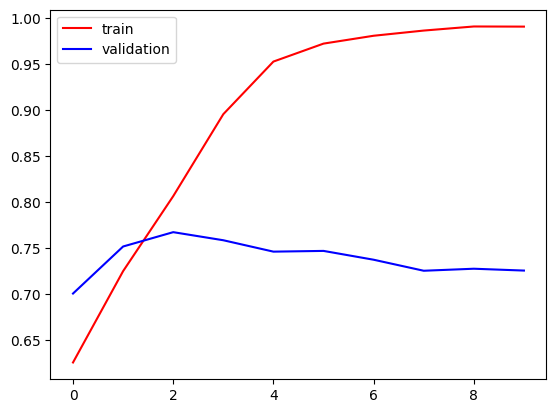

In [11]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], color = 'red', label = 'train')
plt.plot(history.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/Simple_CNN/accuracy")
plt.show()

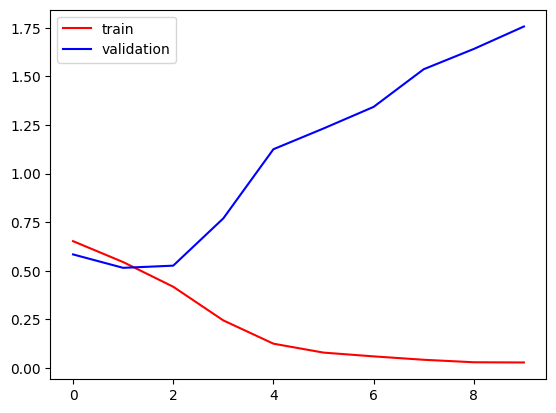

In [12]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], color = 'red', label = 'train')
plt.plot(history.history['val_loss'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/Simple_CNN/loss")
plt.show()

In [13]:
model.save('Simple_CNN/model.h5')

# Simple CNN with Data Augmentation
### Augmentation on image data added as layer

In [14]:
from keras.layers import Rescaling, Resizing, RandomFlip, RandomRotation, RandomZoom, RandomTranslation, RandomContrast, Input

In [15]:
# # !!!!!!!!!!!!!!! This is the menthod of generator which is depriciated
# train_datagen = ImageDataGenerator(
#     rescale = 1./255,
#     rotation_range=40,
#     shear_range=0.2,
#     zoom_range=0.2,
#     horizontal_flip=True,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     fill_mode='nearest'
# )

# test_datagen = ImageDataGenerator(rescale = 1./255)

# train_ds = train_datagen.flow_from_directory(
#     '/kaggle/input/dogs-vs-cats/train',
#     target_size=(image_width, image_height),
#     batch_size=32,
#     class_mode='binary')

# validation_ds = test_datagen.flow_from_directory(
#     '/kaggle/input/dogs-vs-cats/test',
#     target_size=(image_width, image_height),
#     batch_size=32,
#     class_mode='binary')

# Model = Sequential()
# Model HERE

# epochs = 10
# steps_per_epoch = len(train_ds)
# for epoch in range(epochs):
#     print(f"Epoch {epoch+1}/{epochs}")
    
#     # Reset the generator at the beginning of each epoch
#     train_ds.reset()

#     # Fit the model using the generator
#     model.fit(train_ds, steps_per_epoch=20000//32, epochs=1)

In [16]:
train_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/dogs-vs-cats/train',
    labels = 'inferred',
    label_mode = 'int',
    batch_size = 32,
#     image_size = (image_height, image_width)  
)

validation_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/dogs-vs-cats/test',
    labels = 'inferred',
    label_mode = 'int',
    batch_size = 32,
#     image_size = (image_height, image_width)
)

Found 20000 files belonging to 2 classes.


Found 5000 files belonging to 2 classes.


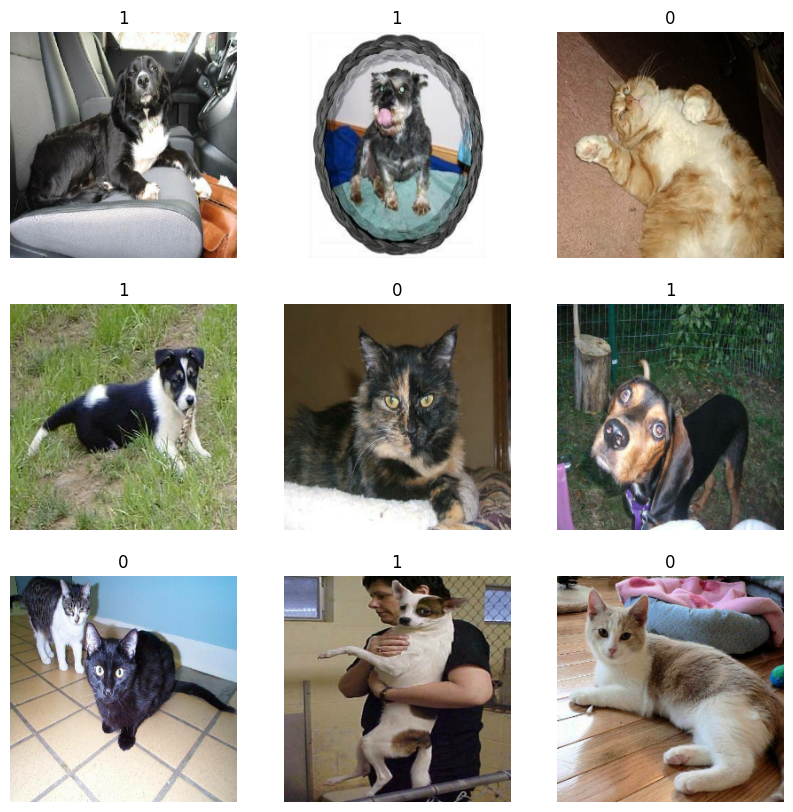

In [17]:
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image[i].numpy().astype('uint8'))
    plt.title(int(label[i]))
    plt.axis("off")

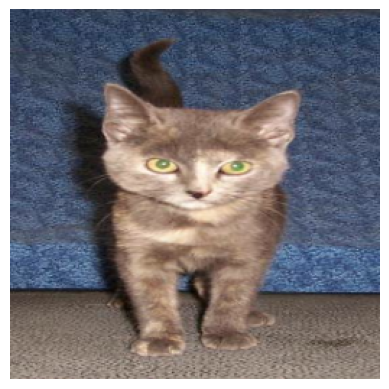

In [18]:
# Fetch a single batch of data
image_batch, label_batch = next(iter(train_ds))

# Select the first image and its label from the batch
image = image_batch[0]
label = label_batch[0]

# Display the image
plt.imshow(image.numpy().astype('uint8'))
plt.axis('off')  # Optional: Turn off the axis
plt.show()

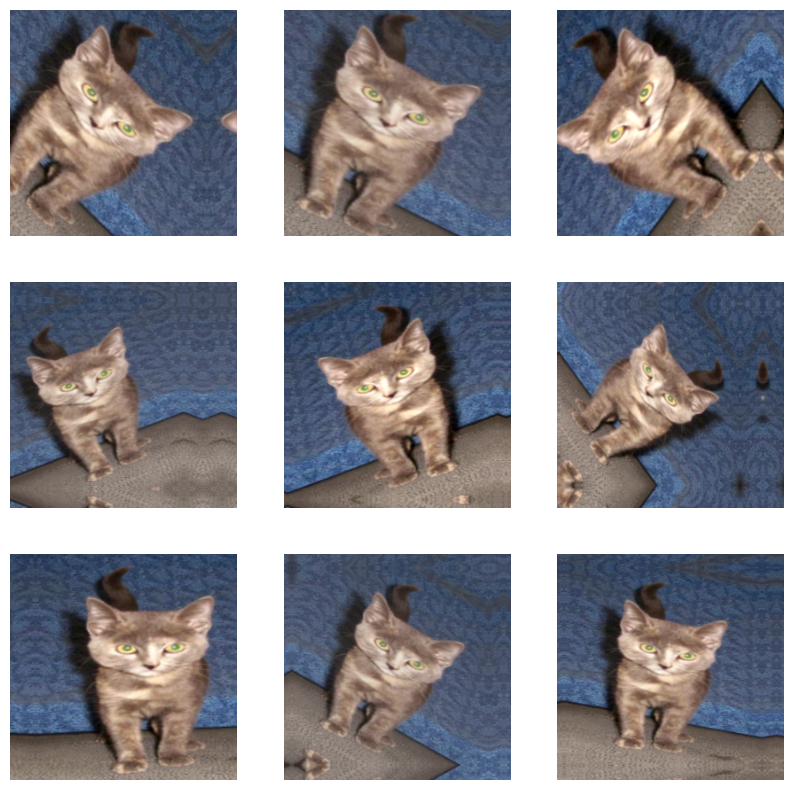

In [19]:
out_height, out_width = 128, 256

data_augmentation = tf.keras.Sequential([
    RandomFlip("horizontal"),
    RandomRotation(0.2),
    RandomZoom(0.3),
    RandomTranslation(0, 0.2),
    RandomContrast(0.2),
])


plt.figure(figsize=(10, 10))
for i in range(9):
  augmented_image = data_augmentation(image)
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(augmented_image.numpy().astype('uint8'))
  plt.axis("off")

In [20]:
# create CNN model

model = Sequential()

# Resizing and Rescalling
model.add(Input(shape=(image_height, image_width, 3)))
model.add(Resizing(image_width, image_height))    
model.add(Rescaling(1./255))

# Data Augmentation Layer
# model.add(data_augmentation)
model.add(RandomFlip("horizontal"))
model.add(RandomRotation(0.2))
model.add(RandomZoom(0.3))
model.add(RandomTranslation(height_factor=0, width_factor=0.2))
model.add(RandomContrast(0.2))

model.add(Conv2D(32, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), padding = 'valid', strides = 2))

model.add(Conv2D(64, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), padding = 'valid', strides = 2))

model.add(Conv2D(128, kernel_size = (3,3), padding = 'valid', activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2), padding = 'valid', strides = 2))
# model.add(GlobalMaxPool2D())
model.add(Flatten())
model.add(Dense(128, activation = 'relu'))
model.add(Dense(64, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))

In [21]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resizing (Resizing)             │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_1               │ (None, 256, 256, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_1 (RandomZoom)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_1            │ (None, 256, 256, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_1               │ (None, 256, 256, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,847,297 (56.64 MB)

 Trainable params: 14,847,297 (56.64 MB)

 Non-trainable params: 0 (0.00 B)

In [22]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [23]:
epochs=10
history_1 = model.fit(
  train_ds,
  validation_data=validation_ds,
  epochs=epochs
)

Epoch 1/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:13:27 7s/step - accuracy: 0.5312 - loss: 0.6899

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.5078 - loss: 1.3891  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.4913 - loss: 1.8322

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4876 - loss: 1.9601

  5/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.4851 - loss: 1.9710

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4824 - loss: 1.9426

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4785 - loss: 1.9007

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4763 - loss: 1.8544

  9/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4743 - loss: 1.8080

 10/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4741 - loss: 1.7635

 11/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.4733 - loss: 1.7216

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4730 - loss: 1.6824

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4728 - loss: 1.6460

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4728 - loss: 1.6121

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4728 - loss: 1.5806

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4723 - loss: 1.5513

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4717 - loss: 1.5240

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4712 - loss: 1.4986

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4711 - loss: 1.4747

 20/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4712 - loss: 1.4524

 21/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.4711 - loss: 1.4314

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4711 - loss: 1.4117

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4716 - loss: 1.3931

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4719 - loss: 1.3756

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4724 - loss: 1.3590

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4729 - loss: 1.3432

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4733 - loss: 1.3284

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4735 - loss: 1.3142

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.4740 - loss: 1.3008

 30/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.4745 - loss: 1.2880

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.4752 - loss: 1.2757

 32/625 ━━━━━━━━━━━━━━━━━━━━ 44s 75ms/step - accuracy: 0.4759 - loss: 1.2640

 33/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.4766 - loss: 1.2529

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4772 - loss: 1.2422

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4778 - loss: 1.2320

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4784 - loss: 1.2221

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4789 - loss: 1.2127

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4794 - loss: 1.2037

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4799 - loss: 1.1950

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4803 - loss: 1.1866

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4806 - loss: 1.1785

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4808 - loss: 1.1708

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4811 - loss: 1.1633

 44/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4815 - loss: 1.1561

 45/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4818 - loss: 1.1491

 46/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4821 - loss: 1.1423

 47/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.4825 - loss: 1.1358

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4829 - loss: 1.1295

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4833 - loss: 1.1234

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4837 - loss: 1.1174

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4840 - loss: 1.1117

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4843 - loss: 1.1061

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4845 - loss: 1.1007

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4846 - loss: 1.0954

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4848 - loss: 1.0903

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4850 - loss: 1.0854

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4853 - loss: 1.0805

 58/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.4855 - loss: 1.0759

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4858 - loss: 1.0713

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4861 - loss: 1.0668

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4864 - loss: 1.0625

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4867 - loss: 1.0583

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4870 - loss: 1.0542

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4873 - loss: 1.0502

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4876 - loss: 1.0463

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4879 - loss: 1.0424

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4882 - loss: 1.0387

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4885 - loss: 1.0351

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4888 - loss: 1.0315

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4891 - loss: 1.0280

 71/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4894 - loss: 1.0247

 72/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.4897 - loss: 1.0213

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4900 - loss: 1.0181

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4903 - loss: 1.0149

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4906 - loss: 1.0118

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4909 - loss: 1.0088

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4912 - loss: 1.0058

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4915 - loss: 1.0029

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4918 - loss: 1.0000

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4920 - loss: 0.9973

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4923 - loss: 0.9945

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4925 - loss: 0.9918

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4927 - loss: 0.9892

 84/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4930 - loss: 0.9866

 85/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.4932 - loss: 0.9841

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4935 - loss: 0.9816

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4938 - loss: 0.9792

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4940 - loss: 0.9768

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4942 - loss: 0.9744

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4945 - loss: 0.9721

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4947 - loss: 0.9699

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4949 - loss: 0.9677

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4951 - loss: 0.9655

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4953 - loss: 0.9633

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4955 - loss: 0.9612

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4957 - loss: 0.9592

 97/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4958 - loss: 0.9571

 98/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.4960 - loss: 0.9551

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4961 - loss: 0.9532

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4963 - loss: 0.9512

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4964 - loss: 0.9494

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4965 - loss: 0.9475

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4966 - loss: 0.9456

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4967 - loss: 0.9438

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4968 - loss: 0.9421

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4969 - loss: 0.9403

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4970 - loss: 0.9386

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4971 - loss: 0.9369

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4972 - loss: 0.9352

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4973 - loss: 0.9336

111/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4974 - loss: 0.9319

112/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4975 - loss: 0.9304

113/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.4975 - loss: 0.9288

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4976 - loss: 0.9272

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4977 - loss: 0.9257

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4978 - loss: 0.9242

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4979 - loss: 0.9227

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4979 - loss: 0.9212

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4980 - loss: 0.9198

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4981 - loss: 0.9184

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4981 - loss: 0.9170

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4982 - loss: 0.9156

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4983 - loss: 0.9142

124/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4984 - loss: 0.9129

125/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4984 - loss: 0.9116

126/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.4985 - loss: 0.9102

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4986 - loss: 0.9089

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4987 - loss: 0.9077

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4987 - loss: 0.9064

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4988 - loss: 0.9052

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4989 - loss: 0.9039

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4990 - loss: 0.9027

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4990 - loss: 0.9015

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4991 - loss: 0.9003

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4992 - loss: 0.8992

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4992 - loss: 0.8980

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4993 - loss: 0.8969

138/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4993 - loss: 0.8958

139/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4994 - loss: 0.8947

140/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.4995 - loss: 0.8936

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4995 - loss: 0.8925

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4996 - loss: 0.8914

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4996 - loss: 0.8903

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4997 - loss: 0.8893

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4998 - loss: 0.8883

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4998 - loss: 0.8872

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.4999 - loss: 0.8862

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5000 - loss: 0.8852

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5000 - loss: 0.8842

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5001 - loss: 0.8832

151/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5002 - loss: 0.8823

152/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5002 - loss: 0.8813

153/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5003 - loss: 0.8804

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5004 - loss: 0.8794

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5004 - loss: 0.8785

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5005 - loss: 0.8776

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5006 - loss: 0.8767

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5006 - loss: 0.8758

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5007 - loss: 0.8749

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5007 - loss: 0.8740

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5008 - loss: 0.8732

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5008 - loss: 0.8723

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5009 - loss: 0.8715

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5009 - loss: 0.8706

165/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5010 - loss: 0.8698

166/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5011 - loss: 0.8690

167/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5011 - loss: 0.8682

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5012 - loss: 0.8674

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5012 - loss: 0.8666

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5013 - loss: 0.8658

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5013 - loss: 0.8650

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5014 - loss: 0.8642

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5014 - loss: 0.8634

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5015 - loss: 0.8627

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5016 - loss: 0.8619

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5016 - loss: 0.8612

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5017 - loss: 0.8604

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5018 - loss: 0.8597

179/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5018 - loss: 0.8590

180/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5019 - loss: 0.8583

181/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5020 - loss: 0.8575

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5020 - loss: 0.8568

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5021 - loss: 0.8561

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5022 - loss: 0.8554

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5022 - loss: 0.8548

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5023 - loss: 0.8541

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5024 - loss: 0.8534

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5024 - loss: 0.8527

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5025 - loss: 0.8521

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5026 - loss: 0.8514

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5027 - loss: 0.8508

192/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5027 - loss: 0.8501

193/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5028 - loss: 0.8495

194/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5029 - loss: 0.8488

195/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5030 - loss: 0.8482

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5031 - loss: 0.8476

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5031 - loss: 0.8470

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5032 - loss: 0.8463

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5033 - loss: 0.8457

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5034 - loss: 0.8451

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5035 - loss: 0.8445

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5036 - loss: 0.8439

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5036 - loss: 0.8434

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5037 - loss: 0.8428

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5038 - loss: 0.8422

206/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5039 - loss: 0.8416

207/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5040 - loss: 0.8410

208/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5040 - loss: 0.8405

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5041 - loss: 0.8399

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5042 - loss: 0.8394

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5043 - loss: 0.8388

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 0.8383

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5044 - loss: 0.8377

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5045 - loss: 0.8372

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5046 - loss: 0.8367

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5047 - loss: 0.8361

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5048 - loss: 0.8356

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5048 - loss: 0.8351

219/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5049 - loss: 0.8346

220/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5050 - loss: 0.8341

221/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5050 - loss: 0.8335

222/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5051 - loss: 0.8330

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5052 - loss: 0.8325

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5053 - loss: 0.8320

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5053 - loss: 0.8315

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5054 - loss: 0.8310

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5055 - loss: 0.8306

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5056 - loss: 0.8301

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5056 - loss: 0.8296

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5057 - loss: 0.8291

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5058 - loss: 0.8286

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5059 - loss: 0.8282

233/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5059 - loss: 0.8277

234/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5060 - loss: 0.8272

235/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5061 - loss: 0.8268

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5061 - loss: 0.8263

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5062 - loss: 0.8259

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5063 - loss: 0.8254

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5063 - loss: 0.8250

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5064 - loss: 0.8245

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5065 - loss: 0.8241

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5065 - loss: 0.8237

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5066 - loss: 0.8232

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5067 - loss: 0.8228

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5067 - loss: 0.8224

246/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5068 - loss: 0.8219

247/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5069 - loss: 0.8215

248/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5070 - loss: 0.8211

249/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5070 - loss: 0.8207

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5071 - loss: 0.8203

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5072 - loss: 0.8199

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5072 - loss: 0.8195

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5073 - loss: 0.8190

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5074 - loss: 0.8186

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5074 - loss: 0.8182

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5075 - loss: 0.8178

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5076 - loss: 0.8175

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5076 - loss: 0.8171

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5077 - loss: 0.8167

260/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5078 - loss: 0.8163

261/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5078 - loss: 0.8159

262/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5079 - loss: 0.8155

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5080 - loss: 0.8151

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5080 - loss: 0.8148

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5081 - loss: 0.8144

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5082 - loss: 0.8140

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5082 - loss: 0.8136

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5083 - loss: 0.8133

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5083 - loss: 0.8129

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5084 - loss: 0.8125

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5085 - loss: 0.8122

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5085 - loss: 0.8118

273/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5086 - loss: 0.8115

274/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5086 - loss: 0.8111

275/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5087 - loss: 0.8108

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5088 - loss: 0.8104

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5088 - loss: 0.8101

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5089 - loss: 0.8097

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5089 - loss: 0.8094

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5090 - loss: 0.8091

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5090 - loss: 0.8087

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5091 - loss: 0.8084

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5091 - loss: 0.8081

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5092 - loss: 0.8077

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5092 - loss: 0.8074

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5093 - loss: 0.8071

287/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5093 - loss: 0.8067

288/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5094 - loss: 0.8064

289/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5094 - loss: 0.8061

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5095 - loss: 0.8058

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5095 - loss: 0.8055

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5096 - loss: 0.8052

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5096 - loss: 0.8048

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5097 - loss: 0.8045

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5097 - loss: 0.8042

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5098 - loss: 0.8039

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5098 - loss: 0.8036

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5099 - loss: 0.8033

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5099 - loss: 0.8030

300/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5100 - loss: 0.8027

301/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5100 - loss: 0.8024

302/625 ━━━━━━━━━━━━━━━━━━━━ 24s 75ms/step - accuracy: 0.5101 - loss: 0.8021

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5101 - loss: 0.8018

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5102 - loss: 0.8015

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5102 - loss: 0.8012

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5103 - loss: 0.8009

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5103 - loss: 0.8007

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5104 - loss: 0.8004

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5104 - loss: 0.8001

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5105 - loss: 0.7998

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5105 - loss: 0.7995

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5105 - loss: 0.7992

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5106 - loss: 0.7990

314/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5106 - loss: 0.7987

315/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5107 - loss: 0.7984

316/625 ━━━━━━━━━━━━━━━━━━━━ 23s 75ms/step - accuracy: 0.5107 - loss: 0.7981

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5107 - loss: 0.7979

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5108 - loss: 0.7976

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5108 - loss: 0.7973

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5109 - loss: 0.7971

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5109 - loss: 0.7968

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5110 - loss: 0.7965

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5110 - loss: 0.7963

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5110 - loss: 0.7960

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5111 - loss: 0.7957

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5111 - loss: 0.7955

327/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5112 - loss: 0.7952

328/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5112 - loss: 0.7950

329/625 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.5113 - loss: 0.7947

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5113 - loss: 0.7945

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5113 - loss: 0.7942

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5114 - loss: 0.7940

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5114 - loss: 0.7937

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5115 - loss: 0.7935

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5115 - loss: 0.7932

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5116 - loss: 0.7930

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5116 - loss: 0.7927

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5117 - loss: 0.7925

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5117 - loss: 0.7922

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5117 - loss: 0.7920

341/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5118 - loss: 0.7917

342/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5118 - loss: 0.7915

343/625 ━━━━━━━━━━━━━━━━━━━━ 21s 75ms/step - accuracy: 0.5119 - loss: 0.7913

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5119 - loss: 0.7910

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5120 - loss: 0.7908

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5120 - loss: 0.7906

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5121 - loss: 0.7903

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5121 - loss: 0.7901

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5122 - loss: 0.7899

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5122 - loss: 0.7896

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5123 - loss: 0.7894

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5123 - loss: 0.7892

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5124 - loss: 0.7890

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5124 - loss: 0.7887

355/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5124 - loss: 0.7885

356/625 ━━━━━━━━━━━━━━━━━━━━ 20s 75ms/step - accuracy: 0.5125 - loss: 0.7883

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5125 - loss: 0.7881

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5126 - loss: 0.7878

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5126 - loss: 0.7876

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5127 - loss: 0.7874

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5127 - loss: 0.7872

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5128 - loss: 0.7870

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5128 - loss: 0.7868

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5129 - loss: 0.7865

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5129 - loss: 0.7863

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5129 - loss: 0.7861

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5130 - loss: 0.7859

368/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5130 - loss: 0.7857

369/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5131 - loss: 0.7855

370/625 ━━━━━━━━━━━━━━━━━━━━ 19s 75ms/step - accuracy: 0.5131 - loss: 0.7853

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5132 - loss: 0.7851

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5132 - loss: 0.7849

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5133 - loss: 0.7846

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5133 - loss: 0.7844

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5134 - loss: 0.7842

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5134 - loss: 0.7840

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5134 - loss: 0.7838

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5135 - loss: 0.7836

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5135 - loss: 0.7834

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5136 - loss: 0.7832

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5136 - loss: 0.7830

382/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5137 - loss: 0.7828

383/625 ━━━━━━━━━━━━━━━━━━━━ 18s 75ms/step - accuracy: 0.5137 - loss: 0.7826

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5137 - loss: 0.7824

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5138 - loss: 0.7822

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5138 - loss: 0.7821

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5139 - loss: 0.7819

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5139 - loss: 0.7817

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5139 - loss: 0.7815

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5140 - loss: 0.7813

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5140 - loss: 0.7811

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5141 - loss: 0.7809

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5141 - loss: 0.7807

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5142 - loss: 0.7805

395/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5142 - loss: 0.7803

396/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5142 - loss: 0.7802

397/625 ━━━━━━━━━━━━━━━━━━━━ 17s 75ms/step - accuracy: 0.5143 - loss: 0.7800

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5143 - loss: 0.7798

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5144 - loss: 0.7796

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5144 - loss: 0.7794

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5145 - loss: 0.7792

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5145 - loss: 0.7791

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5145 - loss: 0.7789

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5146 - loss: 0.7787

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5146 - loss: 0.7785

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5147 - loss: 0.7783

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5147 - loss: 0.7782

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5148 - loss: 0.7780

409/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5148 - loss: 0.7778

410/625 ━━━━━━━━━━━━━━━━━━━━ 16s 75ms/step - accuracy: 0.5149 - loss: 0.7776

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5149 - loss: 0.7775

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5149 - loss: 0.7773

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5150 - loss: 0.7771

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5150 - loss: 0.7769

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5151 - loss: 0.7768

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5151 - loss: 0.7766

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5152 - loss: 0.7764

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5152 - loss: 0.7763

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5153 - loss: 0.7761

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5153 - loss: 0.7759

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5153 - loss: 0.7758

422/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5154 - loss: 0.7756

423/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5154 - loss: 0.7754

424/625 ━━━━━━━━━━━━━━━━━━━━ 15s 75ms/step - accuracy: 0.5155 - loss: 0.7753

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5155 - loss: 0.7751

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5156 - loss: 0.7749

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5156 - loss: 0.7748

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5157 - loss: 0.7746

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5157 - loss: 0.7744

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5158 - loss: 0.7743

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5158 - loss: 0.7741

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5158 - loss: 0.7740

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5159 - loss: 0.7738

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5159 - loss: 0.7736

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5160 - loss: 0.7735

436/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5160 - loss: 0.7733

437/625 ━━━━━━━━━━━━━━━━━━━━ 14s 75ms/step - accuracy: 0.5161 - loss: 0.7732

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5161 - loss: 0.7730

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5162 - loss: 0.7729

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5162 - loss: 0.7727

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5163 - loss: 0.7725

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5163 - loss: 0.7724

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5164 - loss: 0.7722

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5164 - loss: 0.7721

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5164 - loss: 0.7719

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5165 - loss: 0.7718

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5165 - loss: 0.7716

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5166 - loss: 0.7715

449/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5166 - loss: 0.7713

450/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5167 - loss: 0.7712

451/625 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.5167 - loss: 0.7710

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5168 - loss: 0.7709

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5168 - loss: 0.7707

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5169 - loss: 0.7706

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5169 - loss: 0.7704

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5170 - loss: 0.7703

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5170 - loss: 0.7701

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5171 - loss: 0.7700

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5171 - loss: 0.7698

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5172 - loss: 0.7697

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5172 - loss: 0.7695

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5173 - loss: 0.7694

463/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5173 - loss: 0.7693

464/625 ━━━━━━━━━━━━━━━━━━━━ 12s 75ms/step - accuracy: 0.5174 - loss: 0.7691

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5174 - loss: 0.7690

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5174 - loss: 0.7688

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5175 - loss: 0.7687

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5175 - loss: 0.7685

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5176 - loss: 0.7684

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5176 - loss: 0.7683

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5177 - loss: 0.7681

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5177 - loss: 0.7680

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5178 - loss: 0.7678

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5178 - loss: 0.7677

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5179 - loss: 0.7676

476/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5179 - loss: 0.7674

477/625 ━━━━━━━━━━━━━━━━━━━━ 11s 75ms/step - accuracy: 0.5179 - loss: 0.7673

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5180 - loss: 0.7672

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5180 - loss: 0.7670

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5181 - loss: 0.7669

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5181 - loss: 0.7668

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5182 - loss: 0.7666

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5182 - loss: 0.7665

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5183 - loss: 0.7664

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5183 - loss: 0.7662

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5183 - loss: 0.7661

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5184 - loss: 0.7660

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5184 - loss: 0.7658

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5185 - loss: 0.7657

490/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5185 - loss: 0.7656

491/625 ━━━━━━━━━━━━━━━━━━━━ 10s 75ms/step - accuracy: 0.5186 - loss: 0.7654

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5186 - loss: 0.7653 

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5187 - loss: 0.7652

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5187 - loss: 0.7651

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5187 - loss: 0.7649

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5188 - loss: 0.7648

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5188 - loss: 0.7647

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5189 - loss: 0.7645

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5189 - loss: 0.7644

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5190 - loss: 0.7643

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5190 - loss: 0.7642

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5190 - loss: 0.7640

503/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5191 - loss: 0.7639

504/625 ━━━━━━━━━━━━━━━━━━━━ 9s 75ms/step - accuracy: 0.5191 - loss: 0.7638

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5192 - loss: 0.7637

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5192 - loss: 0.7635

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5192 - loss: 0.7634

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5193 - loss: 0.7633

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5193 - loss: 0.7632

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5194 - loss: 0.7631

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5194 - loss: 0.7629

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5195 - loss: 0.7628

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5195 - loss: 0.7627

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5195 - loss: 0.7626

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5196 - loss: 0.7624

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5196 - loss: 0.7623

517/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5197 - loss: 0.7622

518/625 ━━━━━━━━━━━━━━━━━━━━ 8s 75ms/step - accuracy: 0.5197 - loss: 0.7621

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5198 - loss: 0.7620

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5198 - loss: 0.7619

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5198 - loss: 0.7617

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5199 - loss: 0.7616

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5199 - loss: 0.7615

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5200 - loss: 0.7614

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5200 - loss: 0.7613

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5201 - loss: 0.7611

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5201 - loss: 0.7610

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5201 - loss: 0.7609

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5202 - loss: 0.7608

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5202 - loss: 0.7607

531/625 ━━━━━━━━━━━━━━━━━━━━ 7s 75ms/step - accuracy: 0.5203 - loss: 0.7606

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5203 - loss: 0.7605

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5204 - loss: 0.7603

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5204 - loss: 0.7602

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5204 - loss: 0.7601

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5205 - loss: 0.7600

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5205 - loss: 0.7599

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5206 - loss: 0.7598

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5206 - loss: 0.7597

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5207 - loss: 0.7596

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5207 - loss: 0.7594

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5207 - loss: 0.7593

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5208 - loss: 0.7592

544/625 ━━━━━━━━━━━━━━━━━━━━ 6s 75ms/step - accuracy: 0.5208 - loss: 0.7591

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5209 - loss: 0.7590

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5209 - loss: 0.7589

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5210 - loss: 0.7588

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5210 - loss: 0.7587

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5210 - loss: 0.7586

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5211 - loss: 0.7585

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5211 - loss: 0.7583

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5212 - loss: 0.7582

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5212 - loss: 0.7581

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5213 - loss: 0.7580

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5213 - loss: 0.7579

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5214 - loss: 0.7578

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5214 - loss: 0.7577

558/625 ━━━━━━━━━━━━━━━━━━━━ 5s 75ms/step - accuracy: 0.5214 - loss: 0.7576

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5215 - loss: 0.7575

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5215 - loss: 0.7574

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5216 - loss: 0.7573

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5216 - loss: 0.7572

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5217 - loss: 0.7571

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5217 - loss: 0.7570

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5217 - loss: 0.7569

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5218 - loss: 0.7568

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5218 - loss: 0.7567

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5219 - loss: 0.7566

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5219 - loss: 0.7565

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5220 - loss: 0.7563

571/625 ━━━━━━━━━━━━━━━━━━━━ 4s 75ms/step - accuracy: 0.5220 - loss: 0.7562

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5220 - loss: 0.7561

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5221 - loss: 0.7560

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5221 - loss: 0.7559

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5222 - loss: 0.7558

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5222 - loss: 0.7557

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5223 - loss: 0.7556

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5223 - loss: 0.7555

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5223 - loss: 0.7554

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5224 - loss: 0.7553

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5224 - loss: 0.7552

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5225 - loss: 0.7551

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5225 - loss: 0.7550

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 75ms/step - accuracy: 0.5226 - loss: 0.7549

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5226 - loss: 0.7548

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5226 - loss: 0.7548

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5227 - loss: 0.7547

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5227 - loss: 0.7546

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5228 - loss: 0.7545

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5228 - loss: 0.7544

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5229 - loss: 0.7543

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5229 - loss: 0.7542

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5229 - loss: 0.7541

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5230 - loss: 0.7540

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5230 - loss: 0.7539

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5231 - loss: 0.7538

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5231 - loss: 0.7537

598/625 ━━━━━━━━━━━━━━━━━━━━ 2s 75ms/step - accuracy: 0.5232 - loss: 0.7536

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5232 - loss: 0.7535

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5232 - loss: 0.7534

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5233 - loss: 0.7533

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5233 - loss: 0.7532

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5234 - loss: 0.7531

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5234 - loss: 0.7530

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5235 - loss: 0.7529

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5235 - loss: 0.7529

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5235 - loss: 0.7528

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5236 - loss: 0.7527

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5236 - loss: 0.7526

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5237 - loss: 0.7525

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 75ms/step - accuracy: 0.5237 - loss: 0.7524

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5237 - loss: 0.7523

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5238 - loss: 0.7522

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5238 - loss: 0.7521

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5239 - loss: 0.7520

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5239 - loss: 0.7519

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5240 - loss: 0.7518

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5240 - loss: 0.7518

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5240 - loss: 0.7517

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5241 - loss: 0.7516

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5241 - loss: 0.7515

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5242 - loss: 0.7514

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5242 - loss: 0.7513

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5242 - loss: 0.7512

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5243 - loss: 0.7511

625/625 ━━━━━━━━━━━━━━━━━━━━ 59s 83ms/step - accuracy: 0.5243 - loss: 0.7510 - val_accuracy: 0.5448 - val_loss: 0.6918


Epoch 2/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 113ms/step - accuracy: 0.5312 - loss: 0.6871

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 77ms/step - accuracy: 0.5000 - loss: 0.6952  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.5035 - loss: 0.6943

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 76ms/step - accuracy: 0.5046 - loss: 0.6922

  5/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.5124 - loss: 0.6897

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.5190 - loss: 0.6881

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.5246 - loss: 0.6880

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.5288 - loss: 0.6884

  9/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.5314 - loss: 0.6891

 10/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.5345 - loss: 0.6893

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5368 - loss: 0.6894

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5392 - loss: 0.6891

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5415 - loss: 0.6889

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5443 - loss: 0.6884

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5462 - loss: 0.6881

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5476 - loss: 0.6878

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5488 - loss: 0.6875

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.5498 - loss: 0.6872

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.5510 - loss: 0.6869

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5519 - loss: 0.6867

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5529 - loss: 0.6863

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5537 - loss: 0.6861

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5546 - loss: 0.6858

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5556 - loss: 0.6855

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5564 - loss: 0.6852

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5571 - loss: 0.6849

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5578 - loss: 0.6846

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5580 - loss: 0.6845

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5582 - loss: 0.6843

 30/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5584 - loss: 0.6842

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5586 - loss: 0.6841

 32/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.5589 - loss: 0.6839

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5593 - loss: 0.6838

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5595 - loss: 0.6837

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5596 - loss: 0.6836

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5597 - loss: 0.6835

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5598 - loss: 0.6835

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5598 - loss: 0.6835

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5598 - loss: 0.6835

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5597 - loss: 0.6834

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5597 - loss: 0.6834

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5597 - loss: 0.6834

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5598 - loss: 0.6834

 44/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5599 - loss: 0.6833

 45/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.5600 - loss: 0.6832

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5602 - loss: 0.6832

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5604 - loss: 0.6831

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5606 - loss: 0.6831

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5608 - loss: 0.6830

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5610 - loss: 0.6830

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5613 - loss: 0.6829

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5615 - loss: 0.6828

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5617 - loss: 0.6827

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5620 - loss: 0.6826

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5622 - loss: 0.6825

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5624 - loss: 0.6825

 57/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.5627 - loss: 0.6824

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5629 - loss: 0.6823

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5631 - loss: 0.6822

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5634 - loss: 0.6821

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5636 - loss: 0.6821

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5637 - loss: 0.6820

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5639 - loss: 0.6819

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5640 - loss: 0.6819

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5642 - loss: 0.6818

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5643 - loss: 0.6818

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5644 - loss: 0.6817

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5645 - loss: 0.6817

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5647 - loss: 0.6816

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.5648 - loss: 0.6815

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5649 - loss: 0.6815

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5650 - loss: 0.6814

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5651 - loss: 0.6814

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5652 - loss: 0.6814

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5653 - loss: 0.6813

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5654 - loss: 0.6813

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5655 - loss: 0.6812

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5657 - loss: 0.6811

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5658 - loss: 0.6811

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5660 - loss: 0.6810

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5661 - loss: 0.6809

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5663 - loss: 0.6809

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.5664 - loss: 0.6808

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5666 - loss: 0.6807

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5667 - loss: 0.6807

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5669 - loss: 0.6806

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5671 - loss: 0.6805

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5672 - loss: 0.6804

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5673 - loss: 0.6804

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5675 - loss: 0.6803

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5676 - loss: 0.6802

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5678 - loss: 0.6802

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5679 - loss: 0.6801

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5680 - loss: 0.6800

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5682 - loss: 0.6800

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.5683 - loss: 0.6799

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5685 - loss: 0.6798

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5687 - loss: 0.6798

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5688 - loss: 0.6797

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5690 - loss: 0.6796

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5691 - loss: 0.6796

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5692 - loss: 0.6795

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5694 - loss: 0.6795

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5695 - loss: 0.6794

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5696 - loss: 0.6793

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5697 - loss: 0.6793

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5698 - loss: 0.6793

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5699 - loss: 0.6792

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5700 - loss: 0.6792

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.5701 - loss: 0.6791

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5702 - loss: 0.6791

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5703 - loss: 0.6790

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5704 - loss: 0.6789

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5705 - loss: 0.6789

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5706 - loss: 0.6789

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5707 - loss: 0.6788

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5708 - loss: 0.6788

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5709 - loss: 0.6788

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5710 - loss: 0.6787

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5711 - loss: 0.6787

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5712 - loss: 0.6787

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5713 - loss: 0.6786

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.5714 - loss: 0.6786

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5714 - loss: 0.6786

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5715 - loss: 0.6785

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5716 - loss: 0.6785

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5717 - loss: 0.6785

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5717 - loss: 0.6785

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5718 - loss: 0.6784

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5719 - loss: 0.6784

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5719 - loss: 0.6784

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5720 - loss: 0.6784

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5721 - loss: 0.6783

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5722 - loss: 0.6783

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5722 - loss: 0.6783

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.5723 - loss: 0.6783

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5724 - loss: 0.6782

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5725 - loss: 0.6782

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5726 - loss: 0.6782

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5727 - loss: 0.6781

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5728 - loss: 0.6781

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5729 - loss: 0.6781

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5730 - loss: 0.6780

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5731 - loss: 0.6780

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5732 - loss: 0.6780

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5733 - loss: 0.6779

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5733 - loss: 0.6779

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5734 - loss: 0.6779

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5735 - loss: 0.6778

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.5736 - loss: 0.6778

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5737 - loss: 0.6778

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5738 - loss: 0.6778

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5738 - loss: 0.6777

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5739 - loss: 0.6777

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5740 - loss: 0.6777

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5741 - loss: 0.6776

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5742 - loss: 0.6776

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5743 - loss: 0.6775

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5744 - loss: 0.6775

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5744 - loss: 0.6775

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5745 - loss: 0.6774

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5746 - loss: 0.6774

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.5747 - loss: 0.6774

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5748 - loss: 0.6773

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5749 - loss: 0.6773

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5749 - loss: 0.6773

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5750 - loss: 0.6772

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5751 - loss: 0.6772

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5751 - loss: 0.6772

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5752 - loss: 0.6772

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5753 - loss: 0.6771

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5753 - loss: 0.6771

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5754 - loss: 0.6771

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5754 - loss: 0.6771

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5755 - loss: 0.6770

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.5755 - loss: 0.6770

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5756 - loss: 0.6770

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5756 - loss: 0.6770

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5757 - loss: 0.6769

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5757 - loss: 0.6769

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5758 - loss: 0.6769

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5758 - loss: 0.6769

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5759 - loss: 0.6768

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5759 - loss: 0.6768

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5760 - loss: 0.6768

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5760 - loss: 0.6768

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5761 - loss: 0.6767

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5761 - loss: 0.6767

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5762 - loss: 0.6767

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.5762 - loss: 0.6767

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5763 - loss: 0.6766

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5763 - loss: 0.6766

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5763 - loss: 0.6766

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5764 - loss: 0.6766

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5764 - loss: 0.6765

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5765 - loss: 0.6765

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5765 - loss: 0.6765

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5765 - loss: 0.6765

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5766 - loss: 0.6765

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5766 - loss: 0.6764

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5766 - loss: 0.6764

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5767 - loss: 0.6764

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.5767 - loss: 0.6764

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5767 - loss: 0.6764

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5768 - loss: 0.6763

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5768 - loss: 0.6763

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5768 - loss: 0.6763

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5769 - loss: 0.6763

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5769 - loss: 0.6763

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5769 - loss: 0.6762

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5770 - loss: 0.6762

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5770 - loss: 0.6762

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5770 - loss: 0.6762

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5770 - loss: 0.6762

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5771 - loss: 0.6761

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5771 - loss: 0.6761

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.5771 - loss: 0.6761

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5772 - loss: 0.6761

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5772 - loss: 0.6761

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5772 - loss: 0.6760

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5772 - loss: 0.6760

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5773 - loss: 0.6760

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5773 - loss: 0.6760

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5773 - loss: 0.6760

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5774 - loss: 0.6759

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5774 - loss: 0.6759

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5774 - loss: 0.6759

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5774 - loss: 0.6759

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5775 - loss: 0.6758

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.5775 - loss: 0.6758

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5775 - loss: 0.6758

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5776 - loss: 0.6758

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5776 - loss: 0.6758

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5776 - loss: 0.6757

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5776 - loss: 0.6757

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5777 - loss: 0.6757

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5777 - loss: 0.6757

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5777 - loss: 0.6756

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5778 - loss: 0.6756

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5778 - loss: 0.6756

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5778 - loss: 0.6756

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5779 - loss: 0.6756

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5779 - loss: 0.6755

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.5779 - loss: 0.6755

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5780 - loss: 0.6755

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5780 - loss: 0.6755

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5780 - loss: 0.6754

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5781 - loss: 0.6754

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5781 - loss: 0.6754

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5781 - loss: 0.6754

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5782 - loss: 0.6753

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5782 - loss: 0.6753

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5782 - loss: 0.6753

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5783 - loss: 0.6753

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5783 - loss: 0.6752

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5784 - loss: 0.6752

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.5784 - loss: 0.6752

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5784 - loss: 0.6752

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5785 - loss: 0.6752

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5785 - loss: 0.6751

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5785 - loss: 0.6751

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5786 - loss: 0.6751

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5786 - loss: 0.6751

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5787 - loss: 0.6750

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5787 - loss: 0.6750

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5787 - loss: 0.6750

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5788 - loss: 0.6750

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5788 - loss: 0.6750

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5788 - loss: 0.6750

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5789 - loss: 0.6749

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.5789 - loss: 0.6749

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5790 - loss: 0.6749

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5790 - loss: 0.6749

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5790 - loss: 0.6749

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5791 - loss: 0.6748

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5791 - loss: 0.6748

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5792 - loss: 0.6748

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5792 - loss: 0.6748

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5792 - loss: 0.6748

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5793 - loss: 0.6747

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5793 - loss: 0.6747

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5794 - loss: 0.6747

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5794 - loss: 0.6747

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5795 - loss: 0.6747

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.5795 - loss: 0.6746

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5796 - loss: 0.6746

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5796 - loss: 0.6746

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5797 - loss: 0.6746

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5797 - loss: 0.6745

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5798 - loss: 0.6745

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5798 - loss: 0.6745

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5799 - loss: 0.6745

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5799 - loss: 0.6744

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5800 - loss: 0.6744

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5800 - loss: 0.6744

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5801 - loss: 0.6744

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5801 - loss: 0.6743

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.5802 - loss: 0.6743

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5802 - loss: 0.6743

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5803 - loss: 0.6743

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5803 - loss: 0.6742

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5804 - loss: 0.6742

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5804 - loss: 0.6742

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5805 - loss: 0.6742

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5805 - loss: 0.6742

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5806 - loss: 0.6741

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5806 - loss: 0.6741

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5807 - loss: 0.6741

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5807 - loss: 0.6741

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5808 - loss: 0.6740

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5808 - loss: 0.6740

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.5809 - loss: 0.6740

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5810 - loss: 0.6740

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5810 - loss: 0.6739

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5811 - loss: 0.6739

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5811 - loss: 0.6739

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5811 - loss: 0.6739

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5812 - loss: 0.6739

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5812 - loss: 0.6738

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5813 - loss: 0.6738

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5813 - loss: 0.6738

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5814 - loss: 0.6738

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5814 - loss: 0.6737

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5815 - loss: 0.6737

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.5815 - loss: 0.6737

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5816 - loss: 0.6737

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5816 - loss: 0.6736

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5817 - loss: 0.6736

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5817 - loss: 0.6736

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5818 - loss: 0.6736

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5818 - loss: 0.6736

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5819 - loss: 0.6735

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5819 - loss: 0.6735

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5820 - loss: 0.6735

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5820 - loss: 0.6735

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5821 - loss: 0.6734

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5821 - loss: 0.6734

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5822 - loss: 0.6734

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.5822 - loss: 0.6734

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5822 - loss: 0.6734

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5823 - loss: 0.6733

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5823 - loss: 0.6733

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5824 - loss: 0.6733

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5824 - loss: 0.6733

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5825 - loss: 0.6732

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5825 - loss: 0.6732

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5826 - loss: 0.6732

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5826 - loss: 0.6732

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5827 - loss: 0.6731

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5827 - loss: 0.6731

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5828 - loss: 0.6731

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.5828 - loss: 0.6731

353/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5829 - loss: 0.6730

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5829 - loss: 0.6730

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5830 - loss: 0.6730

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5830 - loss: 0.6730

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5831 - loss: 0.6729

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5831 - loss: 0.6729

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5831 - loss: 0.6729

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5832 - loss: 0.6729

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5832 - loss: 0.6728

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5833 - loss: 0.6728

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5833 - loss: 0.6728

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5834 - loss: 0.6728

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5834 - loss: 0.6728

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.5835 - loss: 0.6727

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5835 - loss: 0.6727

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5836 - loss: 0.6727

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5836 - loss: 0.6727

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5837 - loss: 0.6726

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5837 - loss: 0.6726

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5838 - loss: 0.6726

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5838 - loss: 0.6726

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5839 - loss: 0.6725

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5839 - loss: 0.6725

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5839 - loss: 0.6725

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5840 - loss: 0.6725

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5840 - loss: 0.6725

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5841 - loss: 0.6724

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.5841 - loss: 0.6724

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5842 - loss: 0.6724

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5842 - loss: 0.6724

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5842 - loss: 0.6723

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5843 - loss: 0.6723

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5843 - loss: 0.6723

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5844 - loss: 0.6723

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5844 - loss: 0.6723

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5845 - loss: 0.6722

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5845 - loss: 0.6722

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5845 - loss: 0.6722

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5846 - loss: 0.6722

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5846 - loss: 0.6721

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.5847 - loss: 0.6721

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5847 - loss: 0.6721

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5848 - loss: 0.6721

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5848 - loss: 0.6721

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5848 - loss: 0.6720

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5849 - loss: 0.6720

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5849 - loss: 0.6720

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5850 - loss: 0.6720

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5850 - loss: 0.6720

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5850 - loss: 0.6719

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5851 - loss: 0.6719

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5851 - loss: 0.6719

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5852 - loss: 0.6719

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5852 - loss: 0.6719

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.5853 - loss: 0.6718

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5853 - loss: 0.6718

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5853 - loss: 0.6718

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5854 - loss: 0.6718

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5854 - loss: 0.6718

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5855 - loss: 0.6717

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5855 - loss: 0.6717

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5855 - loss: 0.6717

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5856 - loss: 0.6717

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5856 - loss: 0.6717

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5857 - loss: 0.6716

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.5857 - loss: 0.6716

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5857 - loss: 0.6716

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.5858 - loss: 0.6716

421/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5858 - loss: 0.6716

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 73ms/step - accuracy: 0.5859 - loss: 0.6715

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5859 - loss: 0.6715

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5860 - loss: 0.6715

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5860 - loss: 0.6715

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5860 - loss: 0.6715

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5861 - loss: 0.6714

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5861 - loss: 0.6714

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5862 - loss: 0.6714

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5862 - loss: 0.6714

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5862 - loss: 0.6714

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5863 - loss: 0.6713

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5863 - loss: 0.6713

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.5864 - loss: 0.6713

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5864 - loss: 0.6713

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5864 - loss: 0.6713

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5865 - loss: 0.6712

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5865 - loss: 0.6712

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5866 - loss: 0.6712

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5866 - loss: 0.6712

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5867 - loss: 0.6712

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5867 - loss: 0.6711

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5867 - loss: 0.6711

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5868 - loss: 0.6711

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5868 - loss: 0.6711

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5869 - loss: 0.6711

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5869 - loss: 0.6711

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.5869 - loss: 0.6710

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5870 - loss: 0.6710

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5870 - loss: 0.6710

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5871 - loss: 0.6710

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5871 - loss: 0.6710

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5871 - loss: 0.6709

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5872 - loss: 0.6709

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5872 - loss: 0.6709

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5873 - loss: 0.6709

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5873 - loss: 0.6709

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5873 - loss: 0.6708

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5874 - loss: 0.6708

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5874 - loss: 0.6708

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.5875 - loss: 0.6708

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5875 - loss: 0.6708

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5875 - loss: 0.6707

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5876 - loss: 0.6707

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5876 - loss: 0.6707

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5877 - loss: 0.6707

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5877 - loss: 0.6707

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5878 - loss: 0.6706

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5878 - loss: 0.6706

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5878 - loss: 0.6706

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5879 - loss: 0.6706

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5879 - loss: 0.6706

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5879 - loss: 0.6705

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5880 - loss: 0.6705

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.5880 - loss: 0.6705

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5881 - loss: 0.6705

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5881 - loss: 0.6705

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5881 - loss: 0.6704

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5882 - loss: 0.6704

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5882 - loss: 0.6704

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5883 - loss: 0.6704

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5883 - loss: 0.6704

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5883 - loss: 0.6703

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5884 - loss: 0.6703

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5884 - loss: 0.6703

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5884 - loss: 0.6703

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5885 - loss: 0.6703

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.5885 - loss: 0.6702

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5886 - loss: 0.6702 

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5886 - loss: 0.6702

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5886 - loss: 0.6702

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5887 - loss: 0.6701

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5887 - loss: 0.6701

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5888 - loss: 0.6701

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5888 - loss: 0.6701

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5888 - loss: 0.6701

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5889 - loss: 0.6700

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5889 - loss: 0.6700

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5890 - loss: 0.6700

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5890 - loss: 0.6700

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5890 - loss: 0.6700

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.5891 - loss: 0.6700

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5891 - loss: 0.6699

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5892 - loss: 0.6699

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5892 - loss: 0.6699

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5892 - loss: 0.6699

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5893 - loss: 0.6699

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5893 - loss: 0.6698

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5894 - loss: 0.6698

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5894 - loss: 0.6698

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5894 - loss: 0.6698

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5895 - loss: 0.6698

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5895 - loss: 0.6697

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5896 - loss: 0.6697

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5896 - loss: 0.6697

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.5896 - loss: 0.6697

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5897 - loss: 0.6697

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5897 - loss: 0.6696

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5898 - loss: 0.6696

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5898 - loss: 0.6696

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5898 - loss: 0.6696

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5899 - loss: 0.6696

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5899 - loss: 0.6695

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5900 - loss: 0.6695

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5900 - loss: 0.6695

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5900 - loss: 0.6695

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5901 - loss: 0.6694

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5901 - loss: 0.6694

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.5902 - loss: 0.6694

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5902 - loss: 0.6694

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5902 - loss: 0.6694

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5903 - loss: 0.6693

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5903 - loss: 0.6693

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5904 - loss: 0.6693

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5904 - loss: 0.6693

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5904 - loss: 0.6693

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5905 - loss: 0.6692

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5905 - loss: 0.6692

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5905 - loss: 0.6692

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5906 - loss: 0.6692

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5906 - loss: 0.6692

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5906 - loss: 0.6691

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.5907 - loss: 0.6691

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5907 - loss: 0.6691

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5908 - loss: 0.6691

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5908 - loss: 0.6691

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5908 - loss: 0.6691

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5909 - loss: 0.6690

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5909 - loss: 0.6690

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5909 - loss: 0.6690

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5910 - loss: 0.6690

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5910 - loss: 0.6690

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5910 - loss: 0.6689

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5911 - loss: 0.6689

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5911 - loss: 0.6689

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.5911 - loss: 0.6689

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5912 - loss: 0.6689

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5912 - loss: 0.6688

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5912 - loss: 0.6688

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5913 - loss: 0.6688

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5913 - loss: 0.6688

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5913 - loss: 0.6688

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5914 - loss: 0.6688

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5914 - loss: 0.6687

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5915 - loss: 0.6687

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5915 - loss: 0.6687

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5915 - loss: 0.6687

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5916 - loss: 0.6687

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5916 - loss: 0.6686

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.5916 - loss: 0.6686

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5917 - loss: 0.6686

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5917 - loss: 0.6686

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5917 - loss: 0.6686

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5918 - loss: 0.6686

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5918 - loss: 0.6685

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5918 - loss: 0.6685

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5918 - loss: 0.6685

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5919 - loss: 0.6685

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5919 - loss: 0.6685

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5919 - loss: 0.6684

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5920 - loss: 0.6684

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5920 - loss: 0.6684

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5920 - loss: 0.6684

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.5921 - loss: 0.6684

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5921 - loss: 0.6684

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5921 - loss: 0.6683

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5922 - loss: 0.6683

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5922 - loss: 0.6683

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5922 - loss: 0.6683

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5923 - loss: 0.6683

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5923 - loss: 0.6683

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5923 - loss: 0.6682

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5924 - loss: 0.6682

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5924 - loss: 0.6682

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5924 - loss: 0.6682

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5925 - loss: 0.6682

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.5925 - loss: 0.6681

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5925 - loss: 0.6681

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5926 - loss: 0.6681

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5926 - loss: 0.6681

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5926 - loss: 0.6681

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5927 - loss: 0.6681

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5927 - loss: 0.6680

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5928 - loss: 0.6680

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5928 - loss: 0.6680

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5928 - loss: 0.6680

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5929 - loss: 0.6680

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5929 - loss: 0.6679

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5929 - loss: 0.6679

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5930 - loss: 0.6679

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.5930 - loss: 0.6679

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5930 - loss: 0.6679

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5930 - loss: 0.6679

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5931 - loss: 0.6678

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5931 - loss: 0.6678

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5931 - loss: 0.6678

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5932 - loss: 0.6678

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5932 - loss: 0.6678

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5932 - loss: 0.6678

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5933 - loss: 0.6677

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5933 - loss: 0.6677

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5933 - loss: 0.6677

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5934 - loss: 0.6677

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5934 - loss: 0.6677

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.5934 - loss: 0.6676

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.5935 - loss: 0.6676 - val_accuracy: 0.6544 - val_loss: 0.6384


Epoch 3/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 114ms/step - accuracy: 0.6562 - loss: 0.6946

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6484 - loss: 0.7065  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6476 - loss: 0.7021

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6478 - loss: 0.6959

  5/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6432 - loss: 0.6922

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6411 - loss: 0.6884

  7/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6426 - loss: 0.6836

  8/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6433 - loss: 0.6798

  9/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6432 - loss: 0.6771

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6420 - loss: 0.6757

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6415 - loss: 0.6740

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6412 - loss: 0.6724

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6407 - loss: 0.6714

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6407 - loss: 0.6703

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 75ms/step - accuracy: 0.6399 - loss: 0.6697

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6395 - loss: 0.6689

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6391 - loss: 0.6683

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6386 - loss: 0.6678

 19/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6382 - loss: 0.6672

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6375 - loss: 0.6668

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6368 - loss: 0.6665

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6361 - loss: 0.6662

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6353 - loss: 0.6660

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6345 - loss: 0.6658

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6336 - loss: 0.6658

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6330 - loss: 0.6656

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6325 - loss: 0.6653

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6319 - loss: 0.6651

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6313 - loss: 0.6650

 30/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6308 - loss: 0.6648

 31/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6303 - loss: 0.6646

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6299 - loss: 0.6644

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6295 - loss: 0.6642

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6291 - loss: 0.6640

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6288 - loss: 0.6638

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6286 - loss: 0.6635

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6284 - loss: 0.6633

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6282 - loss: 0.6631

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6279 - loss: 0.6629

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6276 - loss: 0.6628

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6273 - loss: 0.6626

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6272 - loss: 0.6624

 43/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6269 - loss: 0.6622

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6267 - loss: 0.6621

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6265 - loss: 0.6619

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6263 - loss: 0.6617

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6262 - loss: 0.6615

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6261 - loss: 0.6613

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6261 - loss: 0.6611

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6260 - loss: 0.6608

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6259 - loss: 0.6606

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6259 - loss: 0.6605

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6258 - loss: 0.6603

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6258 - loss: 0.6601

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6257 - loss: 0.6599

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6257 - loss: 0.6598

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6256 - loss: 0.6596

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6256 - loss: 0.6594

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6256 - loss: 0.6592

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6255 - loss: 0.6591

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6255 - loss: 0.6589

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6254 - loss: 0.6588

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6254 - loss: 0.6586

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6253 - loss: 0.6585

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6253 - loss: 0.6583

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6252 - loss: 0.6582

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6251 - loss: 0.6581

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6251 - loss: 0.6580

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6250 - loss: 0.6579

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6250 - loss: 0.6577

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6250 - loss: 0.6576

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6250 - loss: 0.6575

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6250 - loss: 0.6573

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6251 - loss: 0.6572

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6251 - loss: 0.6571

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6252 - loss: 0.6569

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6252 - loss: 0.6567

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6253 - loss: 0.6566

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6253 - loss: 0.6564

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6253 - loss: 0.6563

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6254 - loss: 0.6562

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6254 - loss: 0.6560

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6255 - loss: 0.6559

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6255 - loss: 0.6557

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6256 - loss: 0.6556

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6257 - loss: 0.6554

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6258 - loss: 0.6553

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6258 - loss: 0.6551

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6259 - loss: 0.6550

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6260 - loss: 0.6548

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6261 - loss: 0.6547

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6262 - loss: 0.6545

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6263 - loss: 0.6544

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6264 - loss: 0.6542

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6264 - loss: 0.6541

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6265 - loss: 0.6539

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6266 - loss: 0.6538

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6267 - loss: 0.6536

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6268 - loss: 0.6535

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6269 - loss: 0.6534

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6270 - loss: 0.6532

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6271 - loss: 0.6531

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6272 - loss: 0.6529

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6273 - loss: 0.6528

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6273 - loss: 0.6527

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6274 - loss: 0.6526

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6275 - loss: 0.6525

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6275 - loss: 0.6523

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6276 - loss: 0.6522

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6277 - loss: 0.6521

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6277 - loss: 0.6520

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6278 - loss: 0.6519

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6278 - loss: 0.6518

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6279 - loss: 0.6517

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6279 - loss: 0.6516

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6280 - loss: 0.6515

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6280 - loss: 0.6514

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6280 - loss: 0.6514

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6281 - loss: 0.6513

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6281 - loss: 0.6512

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6282 - loss: 0.6511

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6282 - loss: 0.6510

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6282 - loss: 0.6510

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6509

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6508

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6508

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6507

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6506

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6506

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6505

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6505

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6504

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6504

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6503

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6503

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6503

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6283 - loss: 0.6502

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6502

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6501

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6501

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6500

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6500

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6499

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6499

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6498

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6282 - loss: 0.6498

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6498

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6497

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6497

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6496

151/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6283 - loss: 0.6496

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6284 - loss: 0.6495

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6284 - loss: 0.6494

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6284 - loss: 0.6494

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6284 - loss: 0.6493

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6285 - loss: 0.6493

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6285 - loss: 0.6493

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6285 - loss: 0.6492

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6285 - loss: 0.6492

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6286 - loss: 0.6491

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6286 - loss: 0.6491

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6286 - loss: 0.6491

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6286 - loss: 0.6490

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6286 - loss: 0.6490

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6287 - loss: 0.6490

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6287 - loss: 0.6489

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6287 - loss: 0.6489

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6287 - loss: 0.6489

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6287 - loss: 0.6489

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6287 - loss: 0.6488

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6288 - loss: 0.6488

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6288 - loss: 0.6488

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6288 - loss: 0.6487

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6288 - loss: 0.6487

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6288 - loss: 0.6487

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6289 - loss: 0.6487

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6289 - loss: 0.6486

178/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6289 - loss: 0.6486

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6289 - loss: 0.6486

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6289 - loss: 0.6486

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6289 - loss: 0.6485

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6290 - loss: 0.6485

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6290 - loss: 0.6485

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6290 - loss: 0.6484

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6290 - loss: 0.6484

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6290 - loss: 0.6484

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6291 - loss: 0.6484

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6291 - loss: 0.6483

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6291 - loss: 0.6483

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6291 - loss: 0.6483

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6292 - loss: 0.6482

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6292 - loss: 0.6482

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6292 - loss: 0.6482

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6292 - loss: 0.6481

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6293 - loss: 0.6481

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6293 - loss: 0.6481

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6293 - loss: 0.6480

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6293 - loss: 0.6480

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6294 - loss: 0.6480

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6294 - loss: 0.6479

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6294 - loss: 0.6479

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6294 - loss: 0.6479

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6295 - loss: 0.6479

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6295 - loss: 0.6478

205/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6295 - loss: 0.6478

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6295 - loss: 0.6478

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6295 - loss: 0.6477

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6296 - loss: 0.6477

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6296 - loss: 0.6477

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6296 - loss: 0.6477

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6296 - loss: 0.6476

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6297 - loss: 0.6476

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6297 - loss: 0.6476

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6297 - loss: 0.6476

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6297 - loss: 0.6475

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6298 - loss: 0.6475

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6298 - loss: 0.6475

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6298 - loss: 0.6475

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6298 - loss: 0.6474

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6298 - loss: 0.6474

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6299 - loss: 0.6474

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6299 - loss: 0.6474

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6299 - loss: 0.6473

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6299 - loss: 0.6473

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6300 - loss: 0.6473

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6300 - loss: 0.6472

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6300 - loss: 0.6472

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6301 - loss: 0.6472

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6301 - loss: 0.6472

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6301 - loss: 0.6471

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6302 - loss: 0.6471

232/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6302 - loss: 0.6471

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6303 - loss: 0.6470

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6303 - loss: 0.6470

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6303 - loss: 0.6470

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6304 - loss: 0.6469

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6304 - loss: 0.6469

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6304 - loss: 0.6469

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6304 - loss: 0.6469

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6305 - loss: 0.6468

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6305 - loss: 0.6468

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6305 - loss: 0.6468

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6306 - loss: 0.6468

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6306 - loss: 0.6467

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6306 - loss: 0.6467

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6306 - loss: 0.6467

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6307 - loss: 0.6467

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6307 - loss: 0.6466

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6307 - loss: 0.6466

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6307 - loss: 0.6466

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6308 - loss: 0.6466

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6308 - loss: 0.6465

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6308 - loss: 0.6465

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6309 - loss: 0.6465

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6309 - loss: 0.6465

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6309 - loss: 0.6464

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6309 - loss: 0.6464

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6310 - loss: 0.6464

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6310 - loss: 0.6464

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6310 - loss: 0.6464

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6311 - loss: 0.6463

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6311 - loss: 0.6463

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6311 - loss: 0.6463

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6311 - loss: 0.6463

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6312 - loss: 0.6462

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6312 - loss: 0.6462

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6312 - loss: 0.6462

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6312 - loss: 0.6462

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6313 - loss: 0.6462

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6313 - loss: 0.6461

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6313 - loss: 0.6461

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6314 - loss: 0.6461

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6314 - loss: 0.6461

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6314 - loss: 0.6460

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6315 - loss: 0.6460

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6315 - loss: 0.6460

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6315 - loss: 0.6460

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6315 - loss: 0.6459

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6316 - loss: 0.6459

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6316 - loss: 0.6459

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6316 - loss: 0.6459

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6317 - loss: 0.6458

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6317 - loss: 0.6458

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6318 - loss: 0.6458

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6318 - loss: 0.6458

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6318 - loss: 0.6457

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6319 - loss: 0.6457

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6319 - loss: 0.6457

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6319 - loss: 0.6457

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6320 - loss: 0.6456

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6320 - loss: 0.6456

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6321 - loss: 0.6456

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6321 - loss: 0.6455

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6321 - loss: 0.6455

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6322 - loss: 0.6455

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6322 - loss: 0.6455

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6323 - loss: 0.6454

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6323 - loss: 0.6454

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6323 - loss: 0.6454

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6324 - loss: 0.6453

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6324 - loss: 0.6453

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6325 - loss: 0.6453

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6325 - loss: 0.6453

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6325 - loss: 0.6452

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6326 - loss: 0.6452

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6326 - loss: 0.6452

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6326 - loss: 0.6451

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6327 - loss: 0.6451

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6327 - loss: 0.6451

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6328 - loss: 0.6451

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6328 - loss: 0.6450

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6328 - loss: 0.6450

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6329 - loss: 0.6450

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6329 - loss: 0.6450

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6329 - loss: 0.6449

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6330 - loss: 0.6449

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6330 - loss: 0.6449

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6331 - loss: 0.6448

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6331 - loss: 0.6448

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6331 - loss: 0.6448

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6332 - loss: 0.6448

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6332 - loss: 0.6447

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6333 - loss: 0.6447

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6333 - loss: 0.6447

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6333 - loss: 0.6446

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6334 - loss: 0.6446

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6334 - loss: 0.6446

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6335 - loss: 0.6446

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6335 - loss: 0.6445

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6335 - loss: 0.6445

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6336 - loss: 0.6445

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6336 - loss: 0.6444

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6336 - loss: 0.6444

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6337 - loss: 0.6444

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6337 - loss: 0.6444

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6338 - loss: 0.6443

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6338 - loss: 0.6443

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6338 - loss: 0.6443

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6339 - loss: 0.6443

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6339 - loss: 0.6442

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6339 - loss: 0.6442

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6340 - loss: 0.6442

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6340 - loss: 0.6441

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6341 - loss: 0.6441

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6341 - loss: 0.6441

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6341 - loss: 0.6441

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6342 - loss: 0.6440

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6342 - loss: 0.6440

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6342 - loss: 0.6440

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6343 - loss: 0.6440

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6343 - loss: 0.6439

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6343 - loss: 0.6439

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6344 - loss: 0.6439

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6344 - loss: 0.6439

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6344 - loss: 0.6439

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6345 - loss: 0.6438

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6345 - loss: 0.6438

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6345 - loss: 0.6438

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6345 - loss: 0.6438

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6346 - loss: 0.6437

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6346 - loss: 0.6437

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6346 - loss: 0.6437

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6347 - loss: 0.6437

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6347 - loss: 0.6436

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6347 - loss: 0.6436

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6348 - loss: 0.6436

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6348 - loss: 0.6436

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6348 - loss: 0.6435

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6349 - loss: 0.6435

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6349 - loss: 0.6435

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6349 - loss: 0.6435

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6349 - loss: 0.6434

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6350 - loss: 0.6434

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6350 - loss: 0.6434

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6350 - loss: 0.6434

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6351 - loss: 0.6434

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6351 - loss: 0.6433

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6351 - loss: 0.6433

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6352 - loss: 0.6433

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6352 - loss: 0.6433

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6352 - loss: 0.6432

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6352 - loss: 0.6432

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6353 - loss: 0.6432

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6353 - loss: 0.6432

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6353 - loss: 0.6431

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6353 - loss: 0.6431

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6354 - loss: 0.6431

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6354 - loss: 0.6431

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6354 - loss: 0.6430

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6355 - loss: 0.6430

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6355 - loss: 0.6430

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6355 - loss: 0.6430

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6355 - loss: 0.6430

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6356 - loss: 0.6429

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6356 - loss: 0.6429

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6356 - loss: 0.6429

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6356 - loss: 0.6429

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6357 - loss: 0.6428

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6357 - loss: 0.6428

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6357 - loss: 0.6428

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6358 - loss: 0.6428

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6358 - loss: 0.6428

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6358 - loss: 0.6427

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6358 - loss: 0.6427

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6359 - loss: 0.6427

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6359 - loss: 0.6427

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6359 - loss: 0.6426

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6359 - loss: 0.6426

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6360 - loss: 0.6426

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6360 - loss: 0.6426

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6360 - loss: 0.6426

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6360 - loss: 0.6425

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6361 - loss: 0.6425

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6361 - loss: 0.6425

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6361 - loss: 0.6425

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6361 - loss: 0.6424

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6362 - loss: 0.6424

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6362 - loss: 0.6424

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6362 - loss: 0.6424

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6362 - loss: 0.6424

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6363 - loss: 0.6424

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6363 - loss: 0.6423

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6363 - loss: 0.6423

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6363 - loss: 0.6423

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6364 - loss: 0.6423

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6364 - loss: 0.6423

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6364 - loss: 0.6422

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6364 - loss: 0.6422

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6364 - loss: 0.6422

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6365 - loss: 0.6422

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6365 - loss: 0.6422

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6365 - loss: 0.6421

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6365 - loss: 0.6421

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6365 - loss: 0.6421

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6366 - loss: 0.6421

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6366 - loss: 0.6421

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6366 - loss: 0.6421

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6366 - loss: 0.6420

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6366 - loss: 0.6420

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6367 - loss: 0.6420

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6367 - loss: 0.6420

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6367 - loss: 0.6420

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6367 - loss: 0.6419

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6367 - loss: 0.6419

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6368 - loss: 0.6419

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6368 - loss: 0.6419

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6368 - loss: 0.6419

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6368 - loss: 0.6418

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6369 - loss: 0.6418

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6369 - loss: 0.6418

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6369 - loss: 0.6418

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6369 - loss: 0.6418

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6369 - loss: 0.6417

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6370 - loss: 0.6417

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6370 - loss: 0.6417

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6370 - loss: 0.6417

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6370 - loss: 0.6417

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6370 - loss: 0.6416

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6371 - loss: 0.6416

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6371 - loss: 0.6416

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6371 - loss: 0.6416

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6371 - loss: 0.6416

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6372 - loss: 0.6415

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6372 - loss: 0.6415

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6372 - loss: 0.6415

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6372 - loss: 0.6415

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6372 - loss: 0.6415

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6373 - loss: 0.6414

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6373 - loss: 0.6414

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6373 - loss: 0.6414

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6373 - loss: 0.6414

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6373 - loss: 0.6414

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6373 - loss: 0.6414

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6374 - loss: 0.6413

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6374 - loss: 0.6413

476/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6374 - loss: 0.6413

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6374 - loss: 0.6413

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6374 - loss: 0.6413

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6375 - loss: 0.6413

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6375 - loss: 0.6412

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6375 - loss: 0.6412

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6375 - loss: 0.6412

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6375 - loss: 0.6412

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6376 - loss: 0.6412

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6376 - loss: 0.6411

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6376 - loss: 0.6411

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6376 - loss: 0.6411

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6376 - loss: 0.6411

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6377 - loss: 0.6411

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6377 - loss: 0.6411 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6377 - loss: 0.6410

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6377 - loss: 0.6410

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6378 - loss: 0.6410

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6378 - loss: 0.6410

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6378 - loss: 0.6410

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6378 - loss: 0.6410

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6378 - loss: 0.6409

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6379 - loss: 0.6409

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6379 - loss: 0.6409

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6379 - loss: 0.6409

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6379 - loss: 0.6409

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6380 - loss: 0.6409

503/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6380 - loss: 0.6408

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6380 - loss: 0.6408

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6380 - loss: 0.6408

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6380 - loss: 0.6408

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6381 - loss: 0.6408

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6381 - loss: 0.6407

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6381 - loss: 0.6407

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6381 - loss: 0.6407

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6382 - loss: 0.6407

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6382 - loss: 0.6407

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6382 - loss: 0.6407

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6382 - loss: 0.6407

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6382 - loss: 0.6406

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6383 - loss: 0.6406

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6383 - loss: 0.6406

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6383 - loss: 0.6406

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6383 - loss: 0.6406

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6384 - loss: 0.6406

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6384 - loss: 0.6405

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6384 - loss: 0.6405

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6384 - loss: 0.6405

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6384 - loss: 0.6405

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6385 - loss: 0.6405

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6385 - loss: 0.6405

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6385 - loss: 0.6404

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6385 - loss: 0.6404

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6385 - loss: 0.6404

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6386 - loss: 0.6404

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6386 - loss: 0.6404

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6386 - loss: 0.6404

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6386 - loss: 0.6404

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6386 - loss: 0.6403

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6387 - loss: 0.6403

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6387 - loss: 0.6403

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6387 - loss: 0.6403

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6387 - loss: 0.6403

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6387 - loss: 0.6403

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6388 - loss: 0.6402

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6388 - loss: 0.6402

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6388 - loss: 0.6402

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6388 - loss: 0.6402

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6388 - loss: 0.6402

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6389 - loss: 0.6402

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6389 - loss: 0.6402

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6389 - loss: 0.6401

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6389 - loss: 0.6401

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6389 - loss: 0.6401

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6389 - loss: 0.6401

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6390 - loss: 0.6401

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6390 - loss: 0.6401

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6390 - loss: 0.6401

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6390 - loss: 0.6401

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6390 - loss: 0.6400

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6390 - loss: 0.6400

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6391 - loss: 0.6400

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6391 - loss: 0.6400

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6391 - loss: 0.6400

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6391 - loss: 0.6400

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6391 - loss: 0.6400

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6391 - loss: 0.6399

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6392 - loss: 0.6399

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6392 - loss: 0.6399

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6392 - loss: 0.6399

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6392 - loss: 0.6399

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6392 - loss: 0.6399

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6392 - loss: 0.6399

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6393 - loss: 0.6399

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6393 - loss: 0.6399

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6393 - loss: 0.6398

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6393 - loss: 0.6398

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6393 - loss: 0.6398

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6393 - loss: 0.6398

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6393 - loss: 0.6398

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6394 - loss: 0.6398

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6394 - loss: 0.6398

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6394 - loss: 0.6398

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6394 - loss: 0.6397

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6394 - loss: 0.6397

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6394 - loss: 0.6397

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6395 - loss: 0.6397

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6395 - loss: 0.6397

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6395 - loss: 0.6397

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6395 - loss: 0.6397

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6395 - loss: 0.6397

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6395 - loss: 0.6396

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6396 - loss: 0.6396

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6396 - loss: 0.6396

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6396 - loss: 0.6396

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6396 - loss: 0.6396

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6396 - loss: 0.6396

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6396 - loss: 0.6396

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6397 - loss: 0.6396

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6397 - loss: 0.6395

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6397 - loss: 0.6395

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6397 - loss: 0.6395

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6397 - loss: 0.6395

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6397 - loss: 0.6395

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6395

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6395

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6395

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6395

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6394

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6394

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6398 - loss: 0.6394

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6399 - loss: 0.6394

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6399 - loss: 0.6394

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6399 - loss: 0.6394

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6399 - loss: 0.6394

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6399 - loss: 0.6394

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6399 - loss: 0.6394

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6399 - loss: 0.6393

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6400 - loss: 0.6393

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6400 - loss: 0.6393

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6400 - loss: 0.6393

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6400 - loss: 0.6393

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6400 - loss: 0.6393

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6400 - loss: 0.6393

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6401 - loss: 0.6393

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6401 - loss: 0.6393

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6401 - loss: 0.6393

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6401 - loss: 0.6392

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6401 - loss: 0.6392

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6401 - loss: 0.6392

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.6401 - loss: 0.6392 - val_accuracy: 0.6860 - val_loss: 0.5957


Epoch 4/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 112ms/step - accuracy: 0.8125 - loss: 0.5690

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.7578 - loss: 0.6079  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.7240 - loss: 0.6277

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7070 - loss: 0.6343

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6994 - loss: 0.6381

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6957 - loss: 0.6389

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6926 - loss: 0.6391

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6895 - loss: 0.6394

  9/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6866 - loss: 0.6403

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6845 - loss: 0.6408

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6822 - loss: 0.6408

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6811 - loss: 0.6404

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6807 - loss: 0.6397

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6802 - loss: 0.6390

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6797 - loss: 0.6382

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6787 - loss: 0.6378

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6775 - loss: 0.6377

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6765 - loss: 0.6375

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6757 - loss: 0.6375

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6750 - loss: 0.6377

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6744 - loss: 0.6378

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6739 - loss: 0.6378

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6735 - loss: 0.6379

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6730 - loss: 0.6379

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6725 - loss: 0.6378

 26/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6722 - loss: 0.6377

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6718 - loss: 0.6376

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6715 - loss: 0.6374

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6711 - loss: 0.6373

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6707 - loss: 0.6374

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6703 - loss: 0.6373

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6701 - loss: 0.6371

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6701 - loss: 0.6368

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6700 - loss: 0.6365

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6699 - loss: 0.6362

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6700 - loss: 0.6358

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6700 - loss: 0.6355

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6702 - loss: 0.6351

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6704 - loss: 0.6347

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6704 - loss: 0.6345

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6705 - loss: 0.6342

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6707 - loss: 0.6339

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6708 - loss: 0.6336

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6334

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6331

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6329

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6326

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6324

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6321

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6319

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6709 - loss: 0.6316

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6710 - loss: 0.6313

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6710 - loss: 0.6311

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6711 - loss: 0.6308

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6712 - loss: 0.6305

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6713 - loss: 0.6302

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6713 - loss: 0.6300

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6298

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6297

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6296

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6295

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6293

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6292

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6291

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6714 - loss: 0.6290

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6715 - loss: 0.6288

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6715 - loss: 0.6287

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6716 - loss: 0.6286

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6717 - loss: 0.6285

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6717 - loss: 0.6283

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6717 - loss: 0.6282

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6718 - loss: 0.6281

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6718 - loss: 0.6280

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6719 - loss: 0.6279

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6720 - loss: 0.6277

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6720 - loss: 0.6276

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6721 - loss: 0.6275

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6722 - loss: 0.6273

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6723 - loss: 0.6272

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6723 - loss: 0.6270

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6723 - loss: 0.6269

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6724 - loss: 0.6268

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6724 - loss: 0.6267

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6725 - loss: 0.6266

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6725 - loss: 0.6264

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6726 - loss: 0.6263

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6726 - loss: 0.6262

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6726 - loss: 0.6261

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6726 - loss: 0.6260

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6727 - loss: 0.6258

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6727 - loss: 0.6257

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6727 - loss: 0.6256

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6728 - loss: 0.6255

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6728 - loss: 0.6254

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6728 - loss: 0.6253

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6728 - loss: 0.6252

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6728 - loss: 0.6251

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6728 - loss: 0.6250

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6728 - loss: 0.6250

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6249

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6248

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6247

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6246

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6245

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6245

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6244

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6243

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6242

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6241

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6240

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6240

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6239

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6238

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6238

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6727 - loss: 0.6237

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6726 - loss: 0.6237

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6726 - loss: 0.6237

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6725 - loss: 0.6236

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6725 - loss: 0.6236

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6725 - loss: 0.6235

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6725 - loss: 0.6235

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6724 - loss: 0.6234

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6724 - loss: 0.6234

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6724 - loss: 0.6234

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6723 - loss: 0.6233

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6723 - loss: 0.6233

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6723 - loss: 0.6233

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6722 - loss: 0.6232

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6722 - loss: 0.6232

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6722 - loss: 0.6232

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6721 - loss: 0.6231

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6721 - loss: 0.6231

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6721 - loss: 0.6231

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6720 - loss: 0.6230

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6720 - loss: 0.6230

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6720 - loss: 0.6230

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6719 - loss: 0.6230

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6719 - loss: 0.6229

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6718 - loss: 0.6229

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6718 - loss: 0.6229

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6717 - loss: 0.6229

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6716 - loss: 0.6229

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6716 - loss: 0.6229

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6715 - loss: 0.6229

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6715 - loss: 0.6228

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6714 - loss: 0.6228

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6714 - loss: 0.6228

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6713 - loss: 0.6228

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6713 - loss: 0.6228

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6712 - loss: 0.6228

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6712 - loss: 0.6228

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6711 - loss: 0.6227

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6711 - loss: 0.6227

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6710 - loss: 0.6227

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6710 - loss: 0.6227

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6710 - loss: 0.6227

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6709 - loss: 0.6227

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6709 - loss: 0.6226

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6708 - loss: 0.6226

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6708 - loss: 0.6226

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6707 - loss: 0.6226

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6707 - loss: 0.6226

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6706 - loss: 0.6226

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6706 - loss: 0.6225

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6706 - loss: 0.6225

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6705 - loss: 0.6225

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6704 - loss: 0.6225

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6704 - loss: 0.6225

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6704 - loss: 0.6225

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6703 - loss: 0.6225

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6703 - loss: 0.6224

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6702 - loss: 0.6224

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6702 - loss: 0.6224

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6701 - loss: 0.6224

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6701 - loss: 0.6224

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6701 - loss: 0.6224

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6700 - loss: 0.6223

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6700 - loss: 0.6223

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6700 - loss: 0.6223

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6699 - loss: 0.6223

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6699 - loss: 0.6222

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6698 - loss: 0.6222

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6698 - loss: 0.6222

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6698 - loss: 0.6222

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6697 - loss: 0.6222

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6697 - loss: 0.6222

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6697 - loss: 0.6222

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6696 - loss: 0.6221

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6696 - loss: 0.6221

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6695 - loss: 0.6221

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6695 - loss: 0.6221

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6695 - loss: 0.6221

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6694 - loss: 0.6221

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6694 - loss: 0.6221

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6693 - loss: 0.6221

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6693 - loss: 0.6221

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6693 - loss: 0.6221

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6692 - loss: 0.6221

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6692 - loss: 0.6221

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6692 - loss: 0.6220

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6691 - loss: 0.6220

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6691 - loss: 0.6220

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6691 - loss: 0.6220

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6690 - loss: 0.6220

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6690 - loss: 0.6220

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6690 - loss: 0.6220

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6689 - loss: 0.6220

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6689 - loss: 0.6220

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6688 - loss: 0.6220

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6688 - loss: 0.6220

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6687 - loss: 0.6220

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6687 - loss: 0.6220

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6687 - loss: 0.6220

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6686 - loss: 0.6220

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6686 - loss: 0.6220

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6686 - loss: 0.6220

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6685 - loss: 0.6220

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6685 - loss: 0.6220

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6685 - loss: 0.6220

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6684 - loss: 0.6219

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6684 - loss: 0.6219

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6683 - loss: 0.6219

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6683 - loss: 0.6219

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6683 - loss: 0.6219

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6683 - loss: 0.6219

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6682 - loss: 0.6219

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6682 - loss: 0.6219

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6682 - loss: 0.6219

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6682 - loss: 0.6219

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6681 - loss: 0.6219

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6681 - loss: 0.6219

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6681 - loss: 0.6218

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6681 - loss: 0.6218

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6681 - loss: 0.6218

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6680 - loss: 0.6218

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6680 - loss: 0.6218

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6680 - loss: 0.6218

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6680 - loss: 0.6218

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6680 - loss: 0.6218

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6679 - loss: 0.6218

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6679 - loss: 0.6218

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6679 - loss: 0.6217

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6679 - loss: 0.6217

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6679 - loss: 0.6217

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6678 - loss: 0.6217

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6678 - loss: 0.6217

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6678 - loss: 0.6217

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6678 - loss: 0.6217

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6677 - loss: 0.6217

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6677 - loss: 0.6217

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6677 - loss: 0.6217

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6677 - loss: 0.6217

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6676 - loss: 0.6217

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6676 - loss: 0.6217

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6676 - loss: 0.6217

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6676 - loss: 0.6217

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6675 - loss: 0.6217

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6675 - loss: 0.6216

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6675 - loss: 0.6216

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6675 - loss: 0.6216

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6675 - loss: 0.6216

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6674 - loss: 0.6216

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6674 - loss: 0.6216

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6674 - loss: 0.6216

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6674 - loss: 0.6216

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6673 - loss: 0.6216

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6673 - loss: 0.6216

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6673 - loss: 0.6216

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6673 - loss: 0.6216

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6673 - loss: 0.6216

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6672 - loss: 0.6216

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6672 - loss: 0.6216

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6672 - loss: 0.6216

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6672 - loss: 0.6215

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6671 - loss: 0.6215

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6671 - loss: 0.6215

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6671 - loss: 0.6215

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6671 - loss: 0.6215

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6670 - loss: 0.6215

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6670 - loss: 0.6215

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6670 - loss: 0.6215

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6670 - loss: 0.6215

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6669 - loss: 0.6215

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6669 - loss: 0.6215

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6669 - loss: 0.6215

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6669 - loss: 0.6215

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6669 - loss: 0.6215

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6668 - loss: 0.6215

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6668 - loss: 0.6215

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6668 - loss: 0.6215

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6668 - loss: 0.6215

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6668 - loss: 0.6215

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6668 - loss: 0.6215

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6667 - loss: 0.6215

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6667 - loss: 0.6215

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6667 - loss: 0.6215

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6667 - loss: 0.6215

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6667 - loss: 0.6215

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6667 - loss: 0.6215

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6667 - loss: 0.6214

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6667 - loss: 0.6214

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6667 - loss: 0.6214

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6666 - loss: 0.6214

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6666 - loss: 0.6214

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6666 - loss: 0.6214

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6666 - loss: 0.6214

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6666 - loss: 0.6213

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6666 - loss: 0.6213

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6665 - loss: 0.6213

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6665 - loss: 0.6213

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6665 - loss: 0.6213

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6665 - loss: 0.6213

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6665 - loss: 0.6213

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6213

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6212

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6664 - loss: 0.6212

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6664 - loss: 0.6212

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6664 - loss: 0.6212

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6663 - loss: 0.6212

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6662 - loss: 0.6212

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6662 - loss: 0.6212

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6661 - loss: 0.6211

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6660 - loss: 0.6211

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6660 - loss: 0.6211

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6660 - loss: 0.6211

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6659 - loss: 0.6211

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6659 - loss: 0.6211

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6659 - loss: 0.6211

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6211

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6211

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6211

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6211

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6211

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6210

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6659 - loss: 0.6210

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6658 - loss: 0.6210

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6658 - loss: 0.6210

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6658 - loss: 0.6210

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6658 - loss: 0.6210

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6657 - loss: 0.6210

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6656 - loss: 0.6210

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6656 - loss: 0.6210

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6655 - loss: 0.6210

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6655 - loss: 0.6210

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6655 - loss: 0.6210

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6655 - loss: 0.6210

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6654 - loss: 0.6210

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6654 - loss: 0.6210

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6654 - loss: 0.6210

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6654 - loss: 0.6210

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6654 - loss: 0.6210

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6654 - loss: 0.6210

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6654 - loss: 0.6209

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6654 - loss: 0.6209

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6654 - loss: 0.6209

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6654 - loss: 0.6209

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6654 - loss: 0.6209

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6653 - loss: 0.6209

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6653 - loss: 0.6209

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6653 - loss: 0.6209

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6653 - loss: 0.6209

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6653 - loss: 0.6209

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6652 - loss: 0.6209

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6652 - loss: 0.6209

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6652 - loss: 0.6209

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6652 - loss: 0.6209

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6209

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6209

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6209

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6209

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6209

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6209

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6208

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6208

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6208

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6208

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6651 - loss: 0.6208

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6651 - loss: 0.6208

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6650 - loss: 0.6208

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6650 - loss: 0.6208

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6650 - loss: 0.6208

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6650 - loss: 0.6208

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6650 - loss: 0.6208

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6208

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6208

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6650 - loss: 0.6207

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6207

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6207

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6207

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6207

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6207

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6207

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6206

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6206

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6206

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6650 - loss: 0.6206

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6649 - loss: 0.6206

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6649 - loss: 0.6206

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 73ms/step - accuracy: 0.6649 - loss: 0.6206

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6206

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6205

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 73ms/step - accuracy: 0.6649 - loss: 0.6205

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 73ms/step - accuracy: 0.6649 - loss: 0.6205

557/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 73ms/step - accuracy: 0.6649 - loss: 0.6204

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6204

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6204

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6204

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 73ms/step - accuracy: 0.6649 - loss: 0.6203

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6203

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6203

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6203

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6203

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6203

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.6649 - loss: 0.6202

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6202

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6201

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6201

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6201

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6201

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6201

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 73ms/step - accuracy: 0.6649 - loss: 0.6201

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6201

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6200

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6200

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6200

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.6649 - loss: 0.6200

625/625 ━━━━━━━━━━━━━━━━━━━━ 50s 81ms/step - accuracy: 0.6649 - loss: 0.6200 - val_accuracy: 0.6974 - val_loss: 0.5761


Epoch 5/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 108ms/step - accuracy: 0.5625 - loss: 0.6693

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 75ms/step - accuracy: 0.5859 - loss: 0.6671  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6059 - loss: 0.6545

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6165 - loss: 0.6484

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6182 - loss: 0.6469

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6211 - loss: 0.6452

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6268 - loss: 0.6408

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6309 - loss: 0.6373

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6341 - loss: 0.6348

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6370 - loss: 0.6327

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6400 - loss: 0.6305

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6420 - loss: 0.6295

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6435 - loss: 0.6287

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6457 - loss: 0.6273

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6478 - loss: 0.6257

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6496 - loss: 0.6244

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6512 - loss: 0.6231

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6527 - loss: 0.6218

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6540 - loss: 0.6208

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6553 - loss: 0.6195

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6563 - loss: 0.6185

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6573 - loss: 0.6176

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6582 - loss: 0.6166

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6590 - loss: 0.6158

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6596 - loss: 0.6152

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6604 - loss: 0.6146

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6611 - loss: 0.6142

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6616 - loss: 0.6139

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6621 - loss: 0.6136

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6626 - loss: 0.6133

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6629 - loss: 0.6131

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6632 - loss: 0.6129

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6635 - loss: 0.6128

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6638 - loss: 0.6126

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6641 - loss: 0.6123

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6645 - loss: 0.6121

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6648 - loss: 0.6118

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6652 - loss: 0.6116

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6655 - loss: 0.6115

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6658 - loss: 0.6114

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6661 - loss: 0.6114

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6663 - loss: 0.6114

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6664 - loss: 0.6114

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6664 - loss: 0.6115

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6666 - loss: 0.6114

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6667 - loss: 0.6114

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6669 - loss: 0.6114

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6670 - loss: 0.6113

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6672 - loss: 0.6113

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6674 - loss: 0.6112

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6675 - loss: 0.6111

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6677 - loss: 0.6110

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6679 - loss: 0.6110

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6680 - loss: 0.6109

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6682 - loss: 0.6108

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6684 - loss: 0.6107

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6686 - loss: 0.6106

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6688 - loss: 0.6105

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6689 - loss: 0.6105

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6691 - loss: 0.6104

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6692 - loss: 0.6104

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6694 - loss: 0.6103

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6695 - loss: 0.6102

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6697 - loss: 0.6101

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6699 - loss: 0.6101

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6700 - loss: 0.6100

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6701 - loss: 0.6100

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6702 - loss: 0.6099

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6703 - loss: 0.6099

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6704 - loss: 0.6100

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6705 - loss: 0.6100

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6705 - loss: 0.6100

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6706 - loss: 0.6100

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6706 - loss: 0.6101

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6707 - loss: 0.6101

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6707 - loss: 0.6102

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6708 - loss: 0.6102

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6708 - loss: 0.6103

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6709 - loss: 0.6103

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6710 - loss: 0.6103

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6711 - loss: 0.6103

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6712 - loss: 0.6103

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6713 - loss: 0.6102

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6714 - loss: 0.6102

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6715 - loss: 0.6102

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6716 - loss: 0.6102

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6717 - loss: 0.6101

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6718 - loss: 0.6101

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6719 - loss: 0.6100

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6720 - loss: 0.6100

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6721 - loss: 0.6099

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6722 - loss: 0.6099

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6724 - loss: 0.6098

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6725 - loss: 0.6098

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6726 - loss: 0.6097

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6727 - loss: 0.6096

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6728 - loss: 0.6096

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6729 - loss: 0.6095

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6730 - loss: 0.6095

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6731 - loss: 0.6094

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6732 - loss: 0.6094

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6733 - loss: 0.6093

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6734 - loss: 0.6093

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6735 - loss: 0.6092

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6736 - loss: 0.6092

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6736 - loss: 0.6092

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6737 - loss: 0.6091

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6738 - loss: 0.6091

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6739 - loss: 0.6090

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6740 - loss: 0.6090

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6741 - loss: 0.6089

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6742 - loss: 0.6089

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6743 - loss: 0.6088

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6743 - loss: 0.6088

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6744 - loss: 0.6088

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6745 - loss: 0.6087

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6746 - loss: 0.6087

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6747 - loss: 0.6086

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6748 - loss: 0.6086

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6749 - loss: 0.6085

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6750 - loss: 0.6085

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6751 - loss: 0.6084

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6752 - loss: 0.6084

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6752 - loss: 0.6083

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6753 - loss: 0.6083

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6754 - loss: 0.6082

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6755 - loss: 0.6082

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6756 - loss: 0.6081

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6757 - loss: 0.6081

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6757 - loss: 0.6080

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6758 - loss: 0.6079

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6759 - loss: 0.6079

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6760 - loss: 0.6078

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6760 - loss: 0.6078

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6761 - loss: 0.6077

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6762 - loss: 0.6077

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6763 - loss: 0.6076

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6763 - loss: 0.6076

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6764 - loss: 0.6075

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6765 - loss: 0.6074

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6765 - loss: 0.6074

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6766 - loss: 0.6073

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6767 - loss: 0.6073

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6767 - loss: 0.6072

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6768 - loss: 0.6071

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6768 - loss: 0.6071

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6769 - loss: 0.6070

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6769 - loss: 0.6070

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6770 - loss: 0.6069

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6770 - loss: 0.6069

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6770 - loss: 0.6068

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6771 - loss: 0.6068

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6771 - loss: 0.6068

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6771 - loss: 0.6067

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6771 - loss: 0.6067

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6771 - loss: 0.6067

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6772 - loss: 0.6066

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6772 - loss: 0.6066

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6772 - loss: 0.6066

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6772 - loss: 0.6065

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6773 - loss: 0.6065

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6773 - loss: 0.6065

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6773 - loss: 0.6064

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6773 - loss: 0.6064

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6774 - loss: 0.6064

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6774 - loss: 0.6063

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6774 - loss: 0.6063

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6774 - loss: 0.6063

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6774 - loss: 0.6063

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6775 - loss: 0.6062

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6775 - loss: 0.6062

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6775 - loss: 0.6062

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6775 - loss: 0.6062

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6775 - loss: 0.6061

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6776 - loss: 0.6061

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6776 - loss: 0.6061

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6776 - loss: 0.6060

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6776 - loss: 0.6060

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6777 - loss: 0.6060

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6777 - loss: 0.6060

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6777 - loss: 0.6059

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6777 - loss: 0.6059

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6777 - loss: 0.6059

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6778 - loss: 0.6058

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6778 - loss: 0.6058

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6778 - loss: 0.6058

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6778 - loss: 0.6058

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6778 - loss: 0.6057

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6778 - loss: 0.6057

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6778 - loss: 0.6057

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6778 - loss: 0.6057

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6057

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6057

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6056

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6056

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6056

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6056

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6056

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6056

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6055

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6055

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6055

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6779 - loss: 0.6055

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6779 - loss: 0.6055

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6055

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6055

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6054

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6054

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6054

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6054

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6054

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6053

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6053

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6780 - loss: 0.6053

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6781 - loss: 0.6053

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6781 - loss: 0.6053

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6781 - loss: 0.6052

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6781 - loss: 0.6052

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6781 - loss: 0.6052

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6781 - loss: 0.6052

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6052

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6052

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6051

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6051

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6051

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6051

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6782 - loss: 0.6051

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6783 - loss: 0.6050

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6783 - loss: 0.6050

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6783 - loss: 0.6050

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6783 - loss: 0.6050

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6783 - loss: 0.6050

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6783 - loss: 0.6050

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6784 - loss: 0.6049

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6784 - loss: 0.6049

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6784 - loss: 0.6049

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6784 - loss: 0.6049

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6784 - loss: 0.6049

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6784 - loss: 0.6048

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6785 - loss: 0.6048

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6785 - loss: 0.6048

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6785 - loss: 0.6048

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6785 - loss: 0.6048

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6785 - loss: 0.6048

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6786 - loss: 0.6047

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6786 - loss: 0.6047

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6786 - loss: 0.6047

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6786 - loss: 0.6047

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6786 - loss: 0.6047

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6787 - loss: 0.6046

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6787 - loss: 0.6046

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6787 - loss: 0.6046

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6787 - loss: 0.6046

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6787 - loss: 0.6046

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6788 - loss: 0.6045

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6788 - loss: 0.6045

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6788 - loss: 0.6045

258/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6788 - loss: 0.6045

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6789 - loss: 0.6045

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6789 - loss: 0.6044

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6789 - loss: 0.6044

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6789 - loss: 0.6044

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6789 - loss: 0.6044

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6790 - loss: 0.6044

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6790 - loss: 0.6043

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6790 - loss: 0.6043

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6790 - loss: 0.6043

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6790 - loss: 0.6043

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6791 - loss: 0.6043

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6791 - loss: 0.6043

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6791 - loss: 0.6042

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6791 - loss: 0.6042

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6792 - loss: 0.6042

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6792 - loss: 0.6042

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6792 - loss: 0.6041

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6792 - loss: 0.6041

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6793 - loss: 0.6041

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6793 - loss: 0.6041

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6793 - loss: 0.6040

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6794 - loss: 0.6040

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6794 - loss: 0.6040

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6794 - loss: 0.6040

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6794 - loss: 0.6039

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6795 - loss: 0.6039

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6795 - loss: 0.6039

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6795 - loss: 0.6039

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6796 - loss: 0.6038

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6796 - loss: 0.6038

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6796 - loss: 0.6038

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6796 - loss: 0.6037

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6797 - loss: 0.6037

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6797 - loss: 0.6037

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6797 - loss: 0.6037

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6798 - loss: 0.6036

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6798 - loss: 0.6036

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6798 - loss: 0.6036

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6798 - loss: 0.6036

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6799 - loss: 0.6035

299/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6799 - loss: 0.6035

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6799 - loss: 0.6035

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6800 - loss: 0.6035

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6800 - loss: 0.6034

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6800 - loss: 0.6034

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6800 - loss: 0.6034

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6801 - loss: 0.6033

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6801 - loss: 0.6033

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6801 - loss: 0.6033

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6801 - loss: 0.6033

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6802 - loss: 0.6032

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6802 - loss: 0.6032

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6802 - loss: 0.6032

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6802 - loss: 0.6032

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6802 - loss: 0.6032

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6803 - loss: 0.6031

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6803 - loss: 0.6031

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6803 - loss: 0.6031

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6803 - loss: 0.6031

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6804 - loss: 0.6030

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6804 - loss: 0.6030

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6804 - loss: 0.6030

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6804 - loss: 0.6030

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6805 - loss: 0.6029

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6805 - loss: 0.6029

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6805 - loss: 0.6029

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6805 - loss: 0.6029

326/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6805 - loss: 0.6028

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6806 - loss: 0.6028

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6806 - loss: 0.6028

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6806 - loss: 0.6028

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6806 - loss: 0.6027

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6807 - loss: 0.6027

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6807 - loss: 0.6027

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6807 - loss: 0.6027

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6807 - loss: 0.6026

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6807 - loss: 0.6026

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6808 - loss: 0.6026

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6808 - loss: 0.6026

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6808 - loss: 0.6026

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6808 - loss: 0.6025

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6808 - loss: 0.6025

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6808 - loss: 0.6025

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6025

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6025

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6024

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6024

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6024

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6024

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6809 - loss: 0.6024

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6810 - loss: 0.6023

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6810 - loss: 0.6023

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6810 - loss: 0.6023

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6810 - loss: 0.6023

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6810 - loss: 0.6023

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6810 - loss: 0.6022

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6022

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6022

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6022

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6022

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6021

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6021

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6811 - loss: 0.6021

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6812 - loss: 0.6021

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6812 - loss: 0.6021

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6812 - loss: 0.6021

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6812 - loss: 0.6020

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6812 - loss: 0.6020

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6812 - loss: 0.6020

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6812 - loss: 0.6020

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6020

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6020

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6020

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6019

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6019

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6019

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6019

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6019

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6813 - loss: 0.6019

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6814 - loss: 0.6018

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6814 - loss: 0.6018

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6814 - loss: 0.6018

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6814 - loss: 0.6018

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6814 - loss: 0.6018

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6814 - loss: 0.6018

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6814 - loss: 0.6017

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6814 - loss: 0.6017

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6017

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6017

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6017

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6017

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6016

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6016

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6016

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6815 - loss: 0.6016

394/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6815 - loss: 0.6016

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6016

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6015

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6015

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6015

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6015

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6015

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6015

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6014

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6014

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6014

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6816 - loss: 0.6014

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6817 - loss: 0.6014

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6817 - loss: 0.6014

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6014

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6817 - loss: 0.6013

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6818 - loss: 0.6012

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6818 - loss: 0.6012

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6818 - loss: 0.6012

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6818 - loss: 0.6012

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6818 - loss: 0.6012

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6012

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6012

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6011

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6011

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6011

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6011

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6818 - loss: 0.6011

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6819 - loss: 0.6011

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6819 - loss: 0.6011

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6819 - loss: 0.6010

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6819 - loss: 0.6010

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6819 - loss: 0.6010

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6819 - loss: 0.6010

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6819 - loss: 0.6010

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6819 - loss: 0.6010

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6819 - loss: 0.6010

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6819 - loss: 0.6009

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6819 - loss: 0.6009

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6819 - loss: 0.6009

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6009

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6009

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6009

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6009

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6009

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6008

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6008

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6820 - loss: 0.6008

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6008

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6008

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6008

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6008

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6008

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6007

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6007

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6007

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6820 - loss: 0.6007

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6821 - loss: 0.6007

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6821 - loss: 0.6007

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6821 - loss: 0.6007

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6821 - loss: 0.6007

462/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6007

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6007

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6006

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6821 - loss: 0.6005

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6821 - loss: 0.6005

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6822 - loss: 0.6005

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6822 - loss: 0.6005

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6822 - loss: 0.6004

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6822 - loss: 0.6004

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6822 - loss: 0.6004

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6822 - loss: 0.6004

489/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6004 

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6004

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6004

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6004

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6004

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6004

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6003

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6003

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6003

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6003

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6822 - loss: 0.6003

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6823 - loss: 0.6003

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6823 - loss: 0.6003

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6823 - loss: 0.6003

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6003

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6002

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6823 - loss: 0.6001

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6824 - loss: 0.6001

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6824 - loss: 0.6001

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6824 - loss: 0.6001

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6001

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6001

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6001

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6001

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6001

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6000

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6000

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6000

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6000

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6000

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6824 - loss: 0.6000

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6825 - loss: 0.6000

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6825 - loss: 0.6000

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.6000

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6825 - loss: 0.5999

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6826 - loss: 0.5998

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6826 - loss: 0.5998

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6826 - loss: 0.5998

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6826 - loss: 0.5998

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6826 - loss: 0.5998

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5998

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5998

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5998

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5997

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5997

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5997

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6826 - loss: 0.5997

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5997

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5997

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5997

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5997

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5997

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5996

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6827 - loss: 0.5996

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6827 - loss: 0.5996

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6828 - loss: 0.5996

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6828 - loss: 0.5995

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6828 - loss: 0.5995

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6828 - loss: 0.5995

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6828 - loss: 0.5995

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6828 - loss: 0.5995

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5995

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5995

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5995

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5995

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5994

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5994

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5994

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6828 - loss: 0.5994

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6829 - loss: 0.5994

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6829 - loss: 0.5994

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6829 - loss: 0.5994

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6829 - loss: 0.5994

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6829 - loss: 0.5994

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6829 - loss: 0.5993

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6829 - loss: 0.5993

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6830 - loss: 0.5993

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6830 - loss: 0.5993

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6830 - loss: 0.5992

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6830 - loss: 0.5992

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6830 - loss: 0.5992

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6830 - loss: 0.5992

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5992

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5992

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5992

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5992

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5992

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5991

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5991

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5991

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6830 - loss: 0.5991

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6831 - loss: 0.5991

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6831 - loss: 0.5991

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6831 - loss: 0.5991

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6831 - loss: 0.5991

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6831 - loss: 0.5991

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5991

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5991

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5991

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6831 - loss: 0.5990

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.6831 - loss: 0.5990 - val_accuracy: 0.6944 - val_loss: 0.5700


Epoch 6/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 109ms/step - accuracy: 0.7188 - loss: 0.5499

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6875 - loss: 0.5880  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6771 - loss: 0.5935

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6660 - loss: 0.5953

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6666 - loss: 0.5924

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6674 - loss: 0.5889

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6658 - loss: 0.5896

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6627 - loss: 0.5925

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6601 - loss: 0.5944

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.6584 - loss: 0.5958

 11/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6567 - loss: 0.5969

 12/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6564 - loss: 0.5973

 13/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6562 - loss: 0.5976

 14/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6562 - loss: 0.5979

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6571 - loss: 0.5979

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6580 - loss: 0.5980

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6586 - loss: 0.5982

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6589 - loss: 0.5985

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6588 - loss: 0.5987

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.6584 - loss: 0.5993

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6582 - loss: 0.5997

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6579 - loss: 0.6003

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6576 - loss: 0.6010

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6576 - loss: 0.6015

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6577 - loss: 0.6018

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6576 - loss: 0.6022

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6575 - loss: 0.6025

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6577 - loss: 0.6027

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6579 - loss: 0.6027

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6581 - loss: 0.6029

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6583 - loss: 0.6031

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6585 - loss: 0.6033

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6587 - loss: 0.6034

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6589 - loss: 0.6035

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6593 - loss: 0.6034

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6598 - loss: 0.6032

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6603 - loss: 0.6030

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.6609 - loss: 0.6027

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6614 - loss: 0.6024

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6619 - loss: 0.6022

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6624 - loss: 0.6019

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6628 - loss: 0.6016

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6633 - loss: 0.6013

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6638 - loss: 0.6010

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6642 - loss: 0.6007

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6645 - loss: 0.6005

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6649 - loss: 0.6003

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6652 - loss: 0.6002

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6655 - loss: 0.6000

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6656 - loss: 0.5999

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6659 - loss: 0.5997

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6662 - loss: 0.5995

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6666 - loss: 0.5993

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6668 - loss: 0.5991

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6671 - loss: 0.5989

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6674 - loss: 0.5986

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6677 - loss: 0.5985

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6679 - loss: 0.5983

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6682 - loss: 0.5982

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6684 - loss: 0.5981

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6686 - loss: 0.5980

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6688 - loss: 0.5979

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6690 - loss: 0.5978

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6691 - loss: 0.5977

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6693 - loss: 0.5976

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6694 - loss: 0.5975

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6696 - loss: 0.5975

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6697 - loss: 0.5974

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6698 - loss: 0.5973

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6700 - loss: 0.5973

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6701 - loss: 0.5972

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6703 - loss: 0.5971

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6704 - loss: 0.5971

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6706 - loss: 0.5970

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6708 - loss: 0.5969

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6709 - loss: 0.5969

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6711 - loss: 0.5968

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6712 - loss: 0.5968

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6714 - loss: 0.5967

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6716 - loss: 0.5966

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6718 - loss: 0.5965

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6720 - loss: 0.5964

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6722 - loss: 0.5963

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6724 - loss: 0.5962

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6725 - loss: 0.5962

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6727 - loss: 0.5961

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6729 - loss: 0.5960

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6731 - loss: 0.5959

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6733 - loss: 0.5958

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6735 - loss: 0.5957

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6736 - loss: 0.5956

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6738 - loss: 0.5955

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6740 - loss: 0.5954

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6742 - loss: 0.5953

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6743 - loss: 0.5952

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6745 - loss: 0.5951

 97/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6746 - loss: 0.5950

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6748 - loss: 0.5950

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6749 - loss: 0.5949

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6751 - loss: 0.5948

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6752 - loss: 0.5947

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6754 - loss: 0.5946

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6756 - loss: 0.5945

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6757 - loss: 0.5944

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6759 - loss: 0.5943

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6760 - loss: 0.5943

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6762 - loss: 0.5942

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6763 - loss: 0.5941

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6765 - loss: 0.5940

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6766 - loss: 0.5939

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6768 - loss: 0.5939

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6769 - loss: 0.5938

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6770 - loss: 0.5937

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6772 - loss: 0.5936

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6773 - loss: 0.5935

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6774 - loss: 0.5935

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6776 - loss: 0.5934

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6777 - loss: 0.5933

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6779 - loss: 0.5932

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6780 - loss: 0.5931

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6781 - loss: 0.5930

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6783 - loss: 0.5930

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6784 - loss: 0.5929

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6785 - loss: 0.5928

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6787 - loss: 0.5928

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6788 - loss: 0.5927

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6789 - loss: 0.5927

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6790 - loss: 0.5926

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6791 - loss: 0.5925

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6792 - loss: 0.5925

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6793 - loss: 0.5924

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6795 - loss: 0.5923

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6795 - loss: 0.5923

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6797 - loss: 0.5922

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6798 - loss: 0.5922

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6799 - loss: 0.5921

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6800 - loss: 0.5920

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6801 - loss: 0.5920

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6802 - loss: 0.5919

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6803 - loss: 0.5919

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6803 - loss: 0.5918

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6804 - loss: 0.5918

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6805 - loss: 0.5917

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6806 - loss: 0.5917

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6807 - loss: 0.5916

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6808 - loss: 0.5915

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6809 - loss: 0.5915

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6809 - loss: 0.5914

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6810 - loss: 0.5914

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6811 - loss: 0.5913

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6812 - loss: 0.5913

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6812 - loss: 0.5912

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6813 - loss: 0.5912

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6814 - loss: 0.5911

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6815 - loss: 0.5911

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6815 - loss: 0.5910

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6816 - loss: 0.5910

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6817 - loss: 0.5909

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6817 - loss: 0.5909

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6818 - loss: 0.5908

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6819 - loss: 0.5908

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6819 - loss: 0.5907

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6820 - loss: 0.5907

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.6821 - loss: 0.5906

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6821 - loss: 0.5906

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6822 - loss: 0.5905

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6822 - loss: 0.5905

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6823 - loss: 0.5905

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6823 - loss: 0.5904

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6824 - loss: 0.5904

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6825 - loss: 0.5903

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6825 - loss: 0.5903

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6826 - loss: 0.5902

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6826 - loss: 0.5902

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6827 - loss: 0.5901

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6827 - loss: 0.5901

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.6828 - loss: 0.5900

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6829 - loss: 0.5900

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6829 - loss: 0.5899

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6830 - loss: 0.5899

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6830 - loss: 0.5899

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6831 - loss: 0.5898

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6831 - loss: 0.5898

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6832 - loss: 0.5897

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6832 - loss: 0.5897

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6833 - loss: 0.5896

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6833 - loss: 0.5896

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6834 - loss: 0.5896

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6834 - loss: 0.5895

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6835 - loss: 0.5895

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.6836 - loss: 0.5894

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6836 - loss: 0.5894

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6837 - loss: 0.5894

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6837 - loss: 0.5893

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6838 - loss: 0.5893

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6838 - loss: 0.5892

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6839 - loss: 0.5892

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6839 - loss: 0.5892

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6840 - loss: 0.5891

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6840 - loss: 0.5891

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6841 - loss: 0.5890

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6841 - loss: 0.5890

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6842 - loss: 0.5890

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.6842 - loss: 0.5889

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6843 - loss: 0.5889

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6843 - loss: 0.5889

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6844 - loss: 0.5888

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6844 - loss: 0.5888

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6845 - loss: 0.5888

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6845 - loss: 0.5887

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6846 - loss: 0.5887

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6847 - loss: 0.5886

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6847 - loss: 0.5886

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6848 - loss: 0.5886

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6848 - loss: 0.5885

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6849 - loss: 0.5885

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6849 - loss: 0.5885

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.6850 - loss: 0.5884

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6850 - loss: 0.5884

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6851 - loss: 0.5884

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6851 - loss: 0.5883

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6852 - loss: 0.5883

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6852 - loss: 0.5883

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6853 - loss: 0.5882

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6853 - loss: 0.5882

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6854 - loss: 0.5881

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6854 - loss: 0.5881

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6855 - loss: 0.5880

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6855 - loss: 0.5880

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6856 - loss: 0.5880

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.6856 - loss: 0.5879

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6857 - loss: 0.5879

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6857 - loss: 0.5878

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6858 - loss: 0.5878

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6858 - loss: 0.5878

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6859 - loss: 0.5877

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6859 - loss: 0.5877

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6860 - loss: 0.5876

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6860 - loss: 0.5876

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6861 - loss: 0.5876

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6861 - loss: 0.5875

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6862 - loss: 0.5875

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6862 - loss: 0.5874

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6863 - loss: 0.5874

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.6863 - loss: 0.5874

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6863 - loss: 0.5873

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6864 - loss: 0.5873

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6864 - loss: 0.5872

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6865 - loss: 0.5872

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6865 - loss: 0.5872

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6866 - loss: 0.5871

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6866 - loss: 0.5871

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6867 - loss: 0.5871

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6867 - loss: 0.5870

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6868 - loss: 0.5870

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6868 - loss: 0.5869

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6869 - loss: 0.5869

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6869 - loss: 0.5869

259/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.6870 - loss: 0.5868

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6870 - loss: 0.5868

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6871 - loss: 0.5867

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6871 - loss: 0.5867

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6872 - loss: 0.5867

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6872 - loss: 0.5866

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6873 - loss: 0.5866

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6873 - loss: 0.5866

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6874 - loss: 0.5865

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6874 - loss: 0.5865

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6875 - loss: 0.5865

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6875 - loss: 0.5864

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6876 - loss: 0.5864

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.6876 - loss: 0.5864

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6877 - loss: 0.5863

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6877 - loss: 0.5863

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6877 - loss: 0.5862

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6878 - loss: 0.5862

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6878 - loss: 0.5862

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6879 - loss: 0.5861

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6880 - loss: 0.5861

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6880 - loss: 0.5860

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6881 - loss: 0.5860

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6881 - loss: 0.5859

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6882 - loss: 0.5859

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6882 - loss: 0.5858

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6883 - loss: 0.5858

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.6883 - loss: 0.5858

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6884 - loss: 0.5857

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6884 - loss: 0.5857

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6885 - loss: 0.5856

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6885 - loss: 0.5856

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6886 - loss: 0.5855

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6886 - loss: 0.5855

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6887 - loss: 0.5854

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6887 - loss: 0.5854

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6888 - loss: 0.5853

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6888 - loss: 0.5853

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6889 - loss: 0.5853

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6889 - loss: 0.5852

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.6890 - loss: 0.5852

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6890 - loss: 0.5851

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6891 - loss: 0.5851

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6891 - loss: 0.5850

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6892 - loss: 0.5850

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6892 - loss: 0.5850

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6893 - loss: 0.5849

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6893 - loss: 0.5849

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6894 - loss: 0.5848

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6894 - loss: 0.5848

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6895 - loss: 0.5847

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6895 - loss: 0.5847

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6896 - loss: 0.5847

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6896 - loss: 0.5846

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.6897 - loss: 0.5846

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6897 - loss: 0.5845

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6897 - loss: 0.5845

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6898 - loss: 0.5845

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6898 - loss: 0.5844

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6899 - loss: 0.5844

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6899 - loss: 0.5844

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6900 - loss: 0.5843

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6900 - loss: 0.5843

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6901 - loss: 0.5842

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6901 - loss: 0.5842

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6901 - loss: 0.5842

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6902 - loss: 0.5841

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.6902 - loss: 0.5841

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6903 - loss: 0.5840

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6903 - loss: 0.5840

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6904 - loss: 0.5840

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6904 - loss: 0.5839

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6904 - loss: 0.5839

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6905 - loss: 0.5838

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6905 - loss: 0.5838

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6906 - loss: 0.5838

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6906 - loss: 0.5837

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6906 - loss: 0.5837

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6907 - loss: 0.5837

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6907 - loss: 0.5836

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6907 - loss: 0.5836

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.6908 - loss: 0.5836

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6908 - loss: 0.5835

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6909 - loss: 0.5835

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6909 - loss: 0.5834

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6909 - loss: 0.5834

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6910 - loss: 0.5834

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6910 - loss: 0.5833

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6910 - loss: 0.5833

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6911 - loss: 0.5833

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6911 - loss: 0.5832

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6911 - loss: 0.5832

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6912 - loss: 0.5832

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6912 - loss: 0.5831

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.6913 - loss: 0.5831

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6913 - loss: 0.5831

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6913 - loss: 0.5830

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6913 - loss: 0.5830

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6914 - loss: 0.5830

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6914 - loss: 0.5830

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6914 - loss: 0.5829

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6915 - loss: 0.5829

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6915 - loss: 0.5829

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6915 - loss: 0.5828

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6915 - loss: 0.5828

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6916 - loss: 0.5828

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6916 - loss: 0.5828

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6916 - loss: 0.5827

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.6916 - loss: 0.5827

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6917 - loss: 0.5827

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6917 - loss: 0.5827

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6917 - loss: 0.5826

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6917 - loss: 0.5826

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6918 - loss: 0.5826

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6918 - loss: 0.5826

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6918 - loss: 0.5825

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6918 - loss: 0.5825

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6919 - loss: 0.5825

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6919 - loss: 0.5825

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6919 - loss: 0.5824

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6919 - loss: 0.5824

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6920 - loss: 0.5824

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.6920 - loss: 0.5824

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6920 - loss: 0.5823

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6920 - loss: 0.5823

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6921 - loss: 0.5823

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6921 - loss: 0.5823

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6921 - loss: 0.5822

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6921 - loss: 0.5822

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6921 - loss: 0.5822

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6922 - loss: 0.5822

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6922 - loss: 0.5821

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6922 - loss: 0.5821

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6922 - loss: 0.5821

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6923 - loss: 0.5821

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.6923 - loss: 0.5820

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6923 - loss: 0.5820

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6923 - loss: 0.5820

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6924 - loss: 0.5820

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6924 - loss: 0.5820

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6924 - loss: 0.5819

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6924 - loss: 0.5819

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6924 - loss: 0.5819

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6925 - loss: 0.5819

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6925 - loss: 0.5818

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6925 - loss: 0.5818

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6925 - loss: 0.5818

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6925 - loss: 0.5818

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6926 - loss: 0.5818

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.6926 - loss: 0.5817

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6926 - loss: 0.5817

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6926 - loss: 0.5817

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6926 - loss: 0.5817

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6927 - loss: 0.5816

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6927 - loss: 0.5816

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6927 - loss: 0.5816

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6927 - loss: 0.5816

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6927 - loss: 0.5816

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6928 - loss: 0.5815

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6928 - loss: 0.5815

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6928 - loss: 0.5815

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6928 - loss: 0.5815

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.6928 - loss: 0.5815

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6929 - loss: 0.5814

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6929 - loss: 0.5814

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6929 - loss: 0.5814

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6929 - loss: 0.5814

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6929 - loss: 0.5813

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6929 - loss: 0.5813

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6930 - loss: 0.5813

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6930 - loss: 0.5813

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6930 - loss: 0.5813

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6930 - loss: 0.5812

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6930 - loss: 0.5812

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6931 - loss: 0.5812

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6931 - loss: 0.5812

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.6931 - loss: 0.5812

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6931 - loss: 0.5811

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6931 - loss: 0.5811

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6932 - loss: 0.5811

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6932 - loss: 0.5811

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6932 - loss: 0.5810

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6932 - loss: 0.5810

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6932 - loss: 0.5810

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6933 - loss: 0.5810

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6933 - loss: 0.5810

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6933 - loss: 0.5809

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6933 - loss: 0.5809

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6933 - loss: 0.5809

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.6934 - loss: 0.5809

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6934 - loss: 0.5809

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6934 - loss: 0.5808

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6934 - loss: 0.5808

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6934 - loss: 0.5808

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6935 - loss: 0.5808

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6935 - loss: 0.5808

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6935 - loss: 0.5807

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6935 - loss: 0.5807

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6935 - loss: 0.5807

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6936 - loss: 0.5807

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6936 - loss: 0.5806

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6936 - loss: 0.5806

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6936 - loss: 0.5806

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.6936 - loss: 0.5806

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6936 - loss: 0.5806

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6937 - loss: 0.5805

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6937 - loss: 0.5805

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6937 - loss: 0.5805

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6937 - loss: 0.5805

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6937 - loss: 0.5805

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6937 - loss: 0.5804

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6938 - loss: 0.5804

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6938 - loss: 0.5804

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6938 - loss: 0.5804

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6938 - loss: 0.5804

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6938 - loss: 0.5803

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.6938 - loss: 0.5803

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6939 - loss: 0.5803

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6939 - loss: 0.5803

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6939 - loss: 0.5803

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6939 - loss: 0.5802

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6939 - loss: 0.5802

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6940 - loss: 0.5802

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6940 - loss: 0.5802

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6940 - loss: 0.5802

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6940 - loss: 0.5801

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6940 - loss: 0.5801

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6941 - loss: 0.5801

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6941 - loss: 0.5801

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6941 - loss: 0.5801

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.6941 - loss: 0.5800

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6941 - loss: 0.5800 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6942 - loss: 0.5800

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6942 - loss: 0.5800

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6942 - loss: 0.5799

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6942 - loss: 0.5799

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6942 - loss: 0.5799

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6942 - loss: 0.5799

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6943 - loss: 0.5799

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6943 - loss: 0.5798

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6943 - loss: 0.5798

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6943 - loss: 0.5798

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6943 - loss: 0.5798

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.6944 - loss: 0.5798

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6944 - loss: 0.5797

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6944 - loss: 0.5797

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6944 - loss: 0.5797

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6944 - loss: 0.5797

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6944 - loss: 0.5797

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6945 - loss: 0.5796

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6945 - loss: 0.5796

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6945 - loss: 0.5796

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6945 - loss: 0.5796

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6945 - loss: 0.5796

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6945 - loss: 0.5795

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6946 - loss: 0.5795

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6946 - loss: 0.5795

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.6946 - loss: 0.5795

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6946 - loss: 0.5795

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6946 - loss: 0.5794

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6947 - loss: 0.5794

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6947 - loss: 0.5794

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6947 - loss: 0.5794

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6947 - loss: 0.5794

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6947 - loss: 0.5793

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6947 - loss: 0.5793

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6948 - loss: 0.5793

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6948 - loss: 0.5793

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6948 - loss: 0.5792

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6948 - loss: 0.5792

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6948 - loss: 0.5792

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.6949 - loss: 0.5792

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6949 - loss: 0.5792

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6949 - loss: 0.5791

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6949 - loss: 0.5791

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6949 - loss: 0.5791

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6950 - loss: 0.5791

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6950 - loss: 0.5791

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6950 - loss: 0.5790

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6950 - loss: 0.5790

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6950 - loss: 0.5790

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6950 - loss: 0.5790

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6951 - loss: 0.5789

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6951 - loss: 0.5789

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.6951 - loss: 0.5789

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6951 - loss: 0.5789

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6951 - loss: 0.5789

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6952 - loss: 0.5788

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6952 - loss: 0.5788

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6952 - loss: 0.5788

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6952 - loss: 0.5788

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6952 - loss: 0.5788

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6952 - loss: 0.5787

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6953 - loss: 0.5787

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6953 - loss: 0.5787

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6953 - loss: 0.5787

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6953 - loss: 0.5787

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6953 - loss: 0.5787

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.6953 - loss: 0.5786

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6953 - loss: 0.5786

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6954 - loss: 0.5786

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6954 - loss: 0.5786

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6954 - loss: 0.5786

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6954 - loss: 0.5785

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6954 - loss: 0.5785

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6954 - loss: 0.5785

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6955 - loss: 0.5785

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6955 - loss: 0.5785

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6955 - loss: 0.5785

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6955 - loss: 0.5784

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6955 - loss: 0.5784

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.6955 - loss: 0.5784

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6955 - loss: 0.5784

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5784

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5783

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5783

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5783

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5783

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5783

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6956 - loss: 0.5783

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6957 - loss: 0.5782

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6957 - loss: 0.5782

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6957 - loss: 0.5782

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6957 - loss: 0.5782

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6957 - loss: 0.5782

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.6957 - loss: 0.5782

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6957 - loss: 0.5781

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6958 - loss: 0.5781

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6958 - loss: 0.5781

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6958 - loss: 0.5781

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6958 - loss: 0.5781

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6958 - loss: 0.5780

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6958 - loss: 0.5780

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6959 - loss: 0.5780

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6959 - loss: 0.5780

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6959 - loss: 0.5780

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6959 - loss: 0.5780

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6959 - loss: 0.5779

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.6959 - loss: 0.5779

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6959 - loss: 0.5779

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6959 - loss: 0.5779

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5779

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5779

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5778

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5778

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5778

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5778

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6960 - loss: 0.5778

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6961 - loss: 0.5778

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6961 - loss: 0.5778

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6961 - loss: 0.5777

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6961 - loss: 0.5777

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.6961 - loss: 0.5777

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6961 - loss: 0.5777

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6961 - loss: 0.5777

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6961 - loss: 0.5777

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5776

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6962 - loss: 0.5775

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6963 - loss: 0.5775

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6963 - loss: 0.5775

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.6963 - loss: 0.5775

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.6963 - loss: 0.5775 - val_accuracy: 0.7500 - val_loss: 0.5092


Epoch 7/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 112ms/step - accuracy: 0.5625 - loss: 0.6802

  2/625 ━━━━━━━━━━━━━━━━━━━━ 48s 78ms/step - accuracy: 0.6172 - loss: 0.6312  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.6441 - loss: 0.6138

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6647 - loss: 0.6002

  5/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.6705 - loss: 0.5940

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.6716 - loss: 0.5941

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6732 - loss: 0.5935

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6736 - loss: 0.5934

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6732 - loss: 0.5935

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6731 - loss: 0.5939

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6726 - loss: 0.5941

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6721 - loss: 0.5940

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6712 - loss: 0.5942

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6705 - loss: 0.5944

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6692 - loss: 0.5953

 16/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6686 - loss: 0.5959

 17/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6680 - loss: 0.5963

 18/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.6675 - loss: 0.5968

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6675 - loss: 0.5968

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6676 - loss: 0.5966

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6678 - loss: 0.5961

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6682 - loss: 0.5958

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6685 - loss: 0.5953

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6688 - loss: 0.5950

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6692 - loss: 0.5950

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6696 - loss: 0.5951

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6699 - loss: 0.5953

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.6702 - loss: 0.5954

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6707 - loss: 0.5954

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6712 - loss: 0.5953

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6716 - loss: 0.5952

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6721 - loss: 0.5951

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6727 - loss: 0.5949

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6733 - loss: 0.5946

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6738 - loss: 0.5944

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6743 - loss: 0.5941

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6749 - loss: 0.5938

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6753 - loss: 0.5936

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6758 - loss: 0.5933

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6763 - loss: 0.5931

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.6768 - loss: 0.5928

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6772 - loss: 0.5926

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6777 - loss: 0.5923

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6782 - loss: 0.5920

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6787 - loss: 0.5917

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6790 - loss: 0.5915

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6794 - loss: 0.5912

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6798 - loss: 0.5910

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6801 - loss: 0.5907

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6805 - loss: 0.5904

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6809 - loss: 0.5901

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6813 - loss: 0.5898

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6817 - loss: 0.5895

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6821 - loss: 0.5891

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.6825 - loss: 0.5888

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6829 - loss: 0.5885

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6833 - loss: 0.5882

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6837 - loss: 0.5879

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6840 - loss: 0.5876

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6844 - loss: 0.5873

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6848 - loss: 0.5870

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6851 - loss: 0.5867

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6854 - loss: 0.5864

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6856 - loss: 0.5862

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6859 - loss: 0.5859

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6862 - loss: 0.5857

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.6865 - loss: 0.5854

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6867 - loss: 0.5851

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6870 - loss: 0.5849

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6873 - loss: 0.5846

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6876 - loss: 0.5843

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6879 - loss: 0.5840

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6881 - loss: 0.5837

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6884 - loss: 0.5834

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6887 - loss: 0.5831

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6890 - loss: 0.5829

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6892 - loss: 0.5826

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6895 - loss: 0.5823

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6898 - loss: 0.5820

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6901 - loss: 0.5817

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.6904 - loss: 0.5814

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6906 - loss: 0.5811

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6909 - loss: 0.5809

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6912 - loss: 0.5806

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6914 - loss: 0.5803

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6917 - loss: 0.5800

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6919 - loss: 0.5798

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6921 - loss: 0.5795

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6924 - loss: 0.5792

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6926 - loss: 0.5789

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6928 - loss: 0.5787

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6931 - loss: 0.5784

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6933 - loss: 0.5781

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.6935 - loss: 0.5778

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6938 - loss: 0.5776

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6940 - loss: 0.5773

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6942 - loss: 0.5771

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6944 - loss: 0.5768

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6946 - loss: 0.5766

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6948 - loss: 0.5763

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6950 - loss: 0.5761

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6952 - loss: 0.5759

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6954 - loss: 0.5757

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6956 - loss: 0.5755

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6957 - loss: 0.5753

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6959 - loss: 0.5751

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6960 - loss: 0.5749

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.6962 - loss: 0.5748

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6963 - loss: 0.5746

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6965 - loss: 0.5745

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6966 - loss: 0.5743

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6968 - loss: 0.5742

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6969 - loss: 0.5740

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6970 - loss: 0.5739

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6972 - loss: 0.5737

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6973 - loss: 0.5736

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6974 - loss: 0.5734

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6975 - loss: 0.5733

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6976 - loss: 0.5732

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6978 - loss: 0.5730

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6979 - loss: 0.5729

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.6980 - loss: 0.5728

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6981 - loss: 0.5727

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6982 - loss: 0.5725

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6983 - loss: 0.5724

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6984 - loss: 0.5723

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6985 - loss: 0.5722

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6986 - loss: 0.5721

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6986 - loss: 0.5720

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6987 - loss: 0.5719

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6988 - loss: 0.5718

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6989 - loss: 0.5717

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6989 - loss: 0.5716

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6990 - loss: 0.5716

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.6991 - loss: 0.5715

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6992 - loss: 0.5714

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6993 - loss: 0.5713

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6993 - loss: 0.5712

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6994 - loss: 0.5711

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6995 - loss: 0.5710

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6996 - loss: 0.5709

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6997 - loss: 0.5708

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6998 - loss: 0.5707

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.6999 - loss: 0.5707

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7000 - loss: 0.5706

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7001 - loss: 0.5705

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7001 - loss: 0.5704

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7002 - loss: 0.5703

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7003 - loss: 0.5703

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7004 - loss: 0.5702

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7005 - loss: 0.5701

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7005 - loss: 0.5701

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7006 - loss: 0.5700

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7007 - loss: 0.5699

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7008 - loss: 0.5698

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7009 - loss: 0.5698

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7010 - loss: 0.5697

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7010 - loss: 0.5696

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7011 - loss: 0.5696

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7012 - loss: 0.5695

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7013 - loss: 0.5694

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7013 - loss: 0.5694

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7014 - loss: 0.5693

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7015 - loss: 0.5692

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7016 - loss: 0.5692

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7016 - loss: 0.5691

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7017 - loss: 0.5690

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7018 - loss: 0.5690

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7019 - loss: 0.5689

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7019 - loss: 0.5688

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7020 - loss: 0.5688

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7021 - loss: 0.5687

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7021 - loss: 0.5686

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7022 - loss: 0.5686

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7023 - loss: 0.5685

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7023 - loss: 0.5685

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7024 - loss: 0.5684

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7024 - loss: 0.5684

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7025 - loss: 0.5683

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7025 - loss: 0.5682

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7026 - loss: 0.5682

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7026 - loss: 0.5682

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7027 - loss: 0.5681

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7027 - loss: 0.5681

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7028 - loss: 0.5680

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7028 - loss: 0.5680

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7029 - loss: 0.5679

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7029 - loss: 0.5679

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7030 - loss: 0.5678

190/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7030 - loss: 0.5678

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7030 - loss: 0.5678

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7031 - loss: 0.5677

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7031 - loss: 0.5677

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7032 - loss: 0.5677

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7032 - loss: 0.5676

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7033 - loss: 0.5676

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7033 - loss: 0.5676

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7033 - loss: 0.5675

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7034 - loss: 0.5675

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7034 - loss: 0.5675

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7034 - loss: 0.5674

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7035 - loss: 0.5674

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7035 - loss: 0.5674

204/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7035 - loss: 0.5673

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7035 - loss: 0.5673

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7036 - loss: 0.5673

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7036 - loss: 0.5673

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7036 - loss: 0.5672

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7036 - loss: 0.5672

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7037 - loss: 0.5672

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7037 - loss: 0.5672

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7037 - loss: 0.5671

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7037 - loss: 0.5671

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7037 - loss: 0.5671

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7038 - loss: 0.5671

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7038 - loss: 0.5671

217/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7038 - loss: 0.5671

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7038 - loss: 0.5671

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7038 - loss: 0.5670

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7038 - loss: 0.5670

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7038 - loss: 0.5670

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7038 - loss: 0.5670

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5670

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5670

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5670

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5670

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5669

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5669

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5669

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7039 - loss: 0.5669

231/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7039 - loss: 0.5669

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5669

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5668

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5668

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7040 - loss: 0.5668

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7041 - loss: 0.5668

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7041 - loss: 0.5668

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7041 - loss: 0.5668

245/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5668

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5668

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5668

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5668

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5668

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5667

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5667

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5667

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5667

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7041 - loss: 0.5667

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7042 - loss: 0.5667

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7042 - loss: 0.5667

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7042 - loss: 0.5667

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7042 - loss: 0.5667

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7042 - loss: 0.5667

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7042 - loss: 0.5667

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7042 - loss: 0.5667

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7042 - loss: 0.5667

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7043 - loss: 0.5667

272/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7043 - loss: 0.5667

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7044 - loss: 0.5667

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7045 - loss: 0.5667

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7045 - loss: 0.5666

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7046 - loss: 0.5666

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7046 - loss: 0.5666

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7046 - loss: 0.5666

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7046 - loss: 0.5666

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7046 - loss: 0.5666

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7046 - loss: 0.5666

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7046 - loss: 0.5665

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7046 - loss: 0.5665

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7046 - loss: 0.5665

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7046 - loss: 0.5665

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5665

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5665

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5665

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5665

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5665

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5665

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7047 - loss: 0.5664

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7048 - loss: 0.5664

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7048 - loss: 0.5664

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5664

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5664

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5664

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5664

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5664

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5663

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7048 - loss: 0.5663

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7049 - loss: 0.5663

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7049 - loss: 0.5662

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7049 - loss: 0.5662

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7049 - loss: 0.5662

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5662

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5661

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5661

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7050 - loss: 0.5661

340/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5661

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5661

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5661

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5661

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5661

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5660

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5660

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7051 - loss: 0.5660

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7052 - loss: 0.5660

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7052 - loss: 0.5660

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7052 - loss: 0.5660

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7052 - loss: 0.5660

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7052 - loss: 0.5660

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7052 - loss: 0.5659

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7052 - loss: 0.5659

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5659

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5659

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5659

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5659

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5659

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5658

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5658

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7053 - loss: 0.5658

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7054 - loss: 0.5658

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7054 - loss: 0.5658

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7054 - loss: 0.5658

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7054 - loss: 0.5658

367/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7054 - loss: 0.5658

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7054 - loss: 0.5658

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7054 - loss: 0.5657

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7054 - loss: 0.5657

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5657

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5657

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5657

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5657

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5657

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5657

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7055 - loss: 0.5656

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7056 - loss: 0.5656

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7056 - loss: 0.5656

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7056 - loss: 0.5656

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7056 - loss: 0.5656

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7056 - loss: 0.5656

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7056 - loss: 0.5656

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7056 - loss: 0.5655

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7056 - loss: 0.5655

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7057 - loss: 0.5655

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7057 - loss: 0.5655

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7057 - loss: 0.5655

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7057 - loss: 0.5655

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7057 - loss: 0.5654

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7057 - loss: 0.5654

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7058 - loss: 0.5654

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7058 - loss: 0.5654

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7058 - loss: 0.5654

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7058 - loss: 0.5654

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7058 - loss: 0.5653

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7058 - loss: 0.5653

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7058 - loss: 0.5653

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5653

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5653

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5652

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5652

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5652

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5652

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7059 - loss: 0.5652

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7060 - loss: 0.5651

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7060 - loss: 0.5651

408/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7060 - loss: 0.5651

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7060 - loss: 0.5651

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7060 - loss: 0.5651

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7060 - loss: 0.5651

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7060 - loss: 0.5650

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5650

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5650

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5650

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5650

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5649

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5649

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7061 - loss: 0.5649

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7062 - loss: 0.5649

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7062 - loss: 0.5649

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7062 - loss: 0.5648

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7062 - loss: 0.5648

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7062 - loss: 0.5648

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7062 - loss: 0.5648

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5648

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5647

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5647

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5647

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5647

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5646

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5646

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7063 - loss: 0.5646

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7064 - loss: 0.5646

435/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5646

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5646

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5645

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5645

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5645

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5645

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7064 - loss: 0.5645

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5644

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5644

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5644

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5644

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5644

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5643

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7065 - loss: 0.5643

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5643

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5643

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5643

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5642

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5642

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5642

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7066 - loss: 0.5642

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5642

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5642

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5641

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5641

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5641

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5641

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7067 - loss: 0.5641

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5640

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5640

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5640

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5640

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5640

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5640

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5639

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7068 - loss: 0.5639

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7069 - loss: 0.5639

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7069 - loss: 0.5639

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7069 - loss: 0.5639

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7069 - loss: 0.5638

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7069 - loss: 0.5638

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7069 - loss: 0.5638

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5638

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5638

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5638

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5637

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5637

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5637

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7070 - loss: 0.5637

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7071 - loss: 0.5637

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7071 - loss: 0.5636

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7071 - loss: 0.5636

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7071 - loss: 0.5636

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7071 - loss: 0.5636

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7071 - loss: 0.5636

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7071 - loss: 0.5636 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7071 - loss: 0.5635

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5635

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5635

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5635

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5635

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5635

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5634

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7072 - loss: 0.5634

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7073 - loss: 0.5634

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7073 - loss: 0.5634

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7073 - loss: 0.5634

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7073 - loss: 0.5634

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7073 - loss: 0.5633

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7073 - loss: 0.5633

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7073 - loss: 0.5633

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5633

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5633

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5633

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5633

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5632

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5632

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5632

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7074 - loss: 0.5632

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7075 - loss: 0.5632

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7075 - loss: 0.5632

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7075 - loss: 0.5631

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7075 - loss: 0.5631

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7075 - loss: 0.5631

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7075 - loss: 0.5631

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7075 - loss: 0.5631

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7075 - loss: 0.5631

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5630

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7076 - loss: 0.5629

530/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5629

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5629

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5629

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5629

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5629

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5628

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7077 - loss: 0.5628

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5628

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5628

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5628

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5628

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5628

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5627

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7078 - loss: 0.5627

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7078 - loss: 0.5627

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5627

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5627

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5627

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5627

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5626

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5626

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7079 - loss: 0.5626

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7080 - loss: 0.5626

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7080 - loss: 0.5626

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7080 - loss: 0.5626

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7080 - loss: 0.5625

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7080 - loss: 0.5625

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7080 - loss: 0.5625

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7080 - loss: 0.5625

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7080 - loss: 0.5625

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5625

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5625

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5624

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5624

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5624

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5624

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5624

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7081 - loss: 0.5624

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7082 - loss: 0.5624

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7082 - loss: 0.5623

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7082 - loss: 0.5623

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7082 - loss: 0.5623

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7082 - loss: 0.5623

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7082 - loss: 0.5623

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7082 - loss: 0.5623

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7082 - loss: 0.5623

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5622

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7083 - loss: 0.5621

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7084 - loss: 0.5621

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5621

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5621

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5621

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5621

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5621

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5620

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5620

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7084 - loss: 0.5620

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7085 - loss: 0.5620

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7085 - loss: 0.5620

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7085 - loss: 0.5620

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7085 - loss: 0.5620

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7085 - loss: 0.5620

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7085 - loss: 0.5620

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7085 - loss: 0.5619

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7085 - loss: 0.5619

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7085 - loss: 0.5619

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5619

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5619

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5619

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5619

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5619

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5618

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5618

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5618

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5618

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7086 - loss: 0.5618

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5618

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5618

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5618

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5618

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5617

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5617

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5617

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5617

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5617

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7087 - loss: 0.5617

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7088 - loss: 0.5617

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7088 - loss: 0.5617

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7088 - loss: 0.5617

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7088 - loss: 0.5616

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.7088 - loss: 0.5616 - val_accuracy: 0.7644 - val_loss: 0.4995


Epoch 8/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 119ms/step - accuracy: 0.7500 - loss: 0.4181

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.7656 - loss: 0.4336  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7778 - loss: 0.4446

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.7689 - loss: 0.4636

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7664 - loss: 0.4710

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7610 - loss: 0.4792

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.7594 - loss: 0.4822

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7588 - loss: 0.4845

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7582 - loss: 0.4863

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.7564 - loss: 0.4892

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 73ms/step - accuracy: 0.7551 - loss: 0.4915

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7533 - loss: 0.4934

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7527 - loss: 0.4941

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7525 - loss: 0.4942

 15/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7521 - loss: 0.4945

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7515 - loss: 0.4953

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7507 - loss: 0.4962

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7498 - loss: 0.4976

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7489 - loss: 0.4990

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7484 - loss: 0.4997

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7478 - loss: 0.5010

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7471 - loss: 0.5022

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7464 - loss: 0.5037

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7458 - loss: 0.5050

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7452 - loss: 0.5062

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7445 - loss: 0.5073

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7439 - loss: 0.5083

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7434 - loss: 0.5092

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7428 - loss: 0.5100

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7423 - loss: 0.5108

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7419 - loss: 0.5114

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7414 - loss: 0.5122

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7411 - loss: 0.5127

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7409 - loss: 0.5131

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.7408 - loss: 0.5134

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.7407 - loss: 0.5137

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.7406 - loss: 0.5139

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.7405 - loss: 0.5141

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 73ms/step - accuracy: 0.7404 - loss: 0.5144

 40/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7402 - loss: 0.5147

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7401 - loss: 0.5150

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7399 - loss: 0.5153

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7398 - loss: 0.5156

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7397 - loss: 0.5159

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7396 - loss: 0.5161

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7395 - loss: 0.5164

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7394 - loss: 0.5166

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7394 - loss: 0.5167

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7394 - loss: 0.5169

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7393 - loss: 0.5171

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7393 - loss: 0.5173

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7392 - loss: 0.5175

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7392 - loss: 0.5177

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7392 - loss: 0.5179

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5181

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5183

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5184

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5185

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5186

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5187

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5188

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5188

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7391 - loss: 0.5189

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7390 - loss: 0.5190

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7390 - loss: 0.5190

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 73ms/step - accuracy: 0.7390 - loss: 0.5191

 67/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7390 - loss: 0.5192

 68/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7390 - loss: 0.5193

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7389 - loss: 0.5194

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7389 - loss: 0.5195

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7388 - loss: 0.5196

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7388 - loss: 0.5197

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 73ms/step - accuracy: 0.7388 - loss: 0.5198

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7388 - loss: 0.5198

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7387 - loss: 0.5199

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7387 - loss: 0.5199

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7386 - loss: 0.5200

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7386 - loss: 0.5200

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7385 - loss: 0.5201

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7385 - loss: 0.5201

 81/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7384 - loss: 0.5201

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7384 - loss: 0.5202

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7384 - loss: 0.5202

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7383 - loss: 0.5202

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7383 - loss: 0.5203

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7383 - loss: 0.5203

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7383 - loss: 0.5203

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7383 - loss: 0.5203

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7383 - loss: 0.5203

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7382 - loss: 0.5203

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7382 - loss: 0.5204

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7382 - loss: 0.5204

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7381 - loss: 0.5204

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7381 - loss: 0.5205

 95/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7380 - loss: 0.5205

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7380 - loss: 0.5206

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7379 - loss: 0.5206

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7379 - loss: 0.5206

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7379 - loss: 0.5206

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7378 - loss: 0.5207

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7378 - loss: 0.5207

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7377 - loss: 0.5207

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7377 - loss: 0.5208

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7376 - loss: 0.5208

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7376 - loss: 0.5208

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7375 - loss: 0.5209

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7375 - loss: 0.5209

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7374 - loss: 0.5209

109/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7374 - loss: 0.5210

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7373 - loss: 0.5210

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7373 - loss: 0.5211

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7372 - loss: 0.5211

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7372 - loss: 0.5211

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7371 - loss: 0.5212

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7370 - loss: 0.5212

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7370 - loss: 0.5213

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7369 - loss: 0.5213

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7369 - loss: 0.5214

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7368 - loss: 0.5214

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7368 - loss: 0.5215

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7367 - loss: 0.5215

122/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7367 - loss: 0.5215

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7366 - loss: 0.5216

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7366 - loss: 0.5216

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7365 - loss: 0.5217

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7365 - loss: 0.5217

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7365 - loss: 0.5218

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7364 - loss: 0.5218

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7364 - loss: 0.5219

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7363 - loss: 0.5219

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7363 - loss: 0.5220

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7362 - loss: 0.5221

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7362 - loss: 0.5221

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7361 - loss: 0.5222

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7361 - loss: 0.5223

136/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7360 - loss: 0.5223

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7360 - loss: 0.5224

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7359 - loss: 0.5225

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7359 - loss: 0.5226

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7358 - loss: 0.5227

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7358 - loss: 0.5227

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7357 - loss: 0.5228

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7357 - loss: 0.5229

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7356 - loss: 0.5230

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7356 - loss: 0.5231

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7355 - loss: 0.5232

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7355 - loss: 0.5233

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7354 - loss: 0.5234

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7353 - loss: 0.5234

150/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7353 - loss: 0.5235

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7352 - loss: 0.5236

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7352 - loss: 0.5237

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7351 - loss: 0.5238

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7351 - loss: 0.5238

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7350 - loss: 0.5239

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7350 - loss: 0.5240

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7349 - loss: 0.5241

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7349 - loss: 0.5241

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7348 - loss: 0.5242

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7348 - loss: 0.5243

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7347 - loss: 0.5243

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7347 - loss: 0.5244

163/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7347 - loss: 0.5245

164/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7346 - loss: 0.5245

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7346 - loss: 0.5246

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7346 - loss: 0.5246

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7345 - loss: 0.5247

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7345 - loss: 0.5247

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7345 - loss: 0.5248

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7344 - loss: 0.5248

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7344 - loss: 0.5249

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7344 - loss: 0.5249

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7344 - loss: 0.5250

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7343 - loss: 0.5250

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7343 - loss: 0.5250

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7343 - loss: 0.5251

177/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7343 - loss: 0.5251

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7342 - loss: 0.5252

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7342 - loss: 0.5252

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7342 - loss: 0.5252

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7342 - loss: 0.5253

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7341 - loss: 0.5253

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7341 - loss: 0.5254

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7341 - loss: 0.5254

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7341 - loss: 0.5254

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7341 - loss: 0.5255

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7340 - loss: 0.5255

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7340 - loss: 0.5256

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7340 - loss: 0.5256

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7340 - loss: 0.5256

191/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7339 - loss: 0.5257

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7339 - loss: 0.5257

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7339 - loss: 0.5257

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7339 - loss: 0.5258

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5258

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5258

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5259

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5259

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5259

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5260

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7338 - loss: 0.5260

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7337 - loss: 0.5260

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7337 - loss: 0.5260

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7337 - loss: 0.5261

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7337 - loss: 0.5261

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7337 - loss: 0.5261

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7337 - loss: 0.5262

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5262

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5262

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5263

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5263

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5263

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5263

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5264

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7336 - loss: 0.5264

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7335 - loss: 0.5264

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7335 - loss: 0.5264

218/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5264

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5264

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5265

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5265

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5265

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5265

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7335 - loss: 0.5266

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5266

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5266

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5267

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5267

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5267

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5267

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7334 - loss: 0.5268

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5268

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5268

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5268

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5269

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5269

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5269

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5269

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5270

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7333 - loss: 0.5270

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7332 - loss: 0.5270

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7332 - loss: 0.5270

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7332 - loss: 0.5270

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7332 - loss: 0.5271

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7332 - loss: 0.5271

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7332 - loss: 0.5271

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7332 - loss: 0.5271

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7332 - loss: 0.5272

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7332 - loss: 0.5272

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7332 - loss: 0.5272

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7332 - loss: 0.5272

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7331 - loss: 0.5273

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7331 - loss: 0.5273

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7331 - loss: 0.5273

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7331 - loss: 0.5274

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7331 - loss: 0.5274

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7331 - loss: 0.5274

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7330 - loss: 0.5274

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7330 - loss: 0.5275

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7330 - loss: 0.5275

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7330 - loss: 0.5275

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7330 - loss: 0.5275

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7330 - loss: 0.5276

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5276

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5276

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5276

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5277

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5277

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5277

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5277

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5277

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7329 - loss: 0.5277

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5278

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5278

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5278

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5278

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5278

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5278

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7328 - loss: 0.5279

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5279

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5280

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5280

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5280

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5280

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7328 - loss: 0.5280

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7328 - loss: 0.5280

313/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7328 - loss: 0.5280

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7328 - loss: 0.5280

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7328 - loss: 0.5280

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7328 - loss: 0.5280

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7328 - loss: 0.5280

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7328 - loss: 0.5280

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7329 - loss: 0.5280

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7329 - loss: 0.5280

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7329 - loss: 0.5280

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7329 - loss: 0.5280

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7329 - loss: 0.5280

381/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7329 - loss: 0.5280

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7329 - loss: 0.5280

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7329 - loss: 0.5280

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7330 - loss: 0.5280

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5280

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5281

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5281

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5281

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7330 - loss: 0.5281

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7330 - loss: 0.5281

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7330 - loss: 0.5281

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7330 - loss: 0.5281

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7330 - loss: 0.5281

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7330 - loss: 0.5281

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7330 - loss: 0.5281

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7330 - loss: 0.5281

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7329 - loss: 0.5281

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7329 - loss: 0.5281

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5281

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7329 - loss: 0.5282

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7329 - loss: 0.5282

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7329 - loss: 0.5282

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7330 - loss: 0.5282

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7330 - loss: 0.5282

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7330 - loss: 0.5282

503/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7330 - loss: 0.5282

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5282

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5282

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5282

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5282

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5281

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5281

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5281

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7330 - loss: 0.5281

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7331 - loss: 0.5281

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7331 - loss: 0.5281

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7331 - loss: 0.5281

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7331 - loss: 0.5281

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7331 - loss: 0.5281

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7331 - loss: 0.5281

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7331 - loss: 0.5281

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7331 - loss: 0.5281

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7332 - loss: 0.5281

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7332 - loss: 0.5281

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7332 - loss: 0.5281

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7332 - loss: 0.5281

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7332 - loss: 0.5281

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5281

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5281

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7332 - loss: 0.5280

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7333 - loss: 0.5280

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7333 - loss: 0.5280

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.7333 - loss: 0.5280 - val_accuracy: 0.7674 - val_loss: 0.5039


Epoch 9/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - accuracy: 0.8125 - loss: 0.4619

  2/625 ━━━━━━━━━━━━━━━━━━━━ 47s 76ms/step - accuracy: 0.7891 - loss: 0.4780  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.7726 - loss: 0.4893

  4/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.7669 - loss: 0.4928

  5/625 ━━━━━━━━━━━━━━━━━━━━ 46s 75ms/step - accuracy: 0.7673 - loss: 0.4946

  6/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.7679 - loss: 0.4942

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7666 - loss: 0.4954

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7640 - loss: 0.4968

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7625 - loss: 0.4990

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7609 - loss: 0.5008

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7586 - loss: 0.5033

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7573 - loss: 0.5047

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7558 - loss: 0.5060

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7546 - loss: 0.5069

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7533 - loss: 0.5078

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7524 - loss: 0.5084

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7519 - loss: 0.5085

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7513 - loss: 0.5088

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7507 - loss: 0.5092

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7501 - loss: 0.5097

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7494 - loss: 0.5102

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7488 - loss: 0.5107

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7482 - loss: 0.5113

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7478 - loss: 0.5116

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 73ms/step - accuracy: 0.7477 - loss: 0.5117

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7475 - loss: 0.5118

 27/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7475 - loss: 0.5118

 28/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7474 - loss: 0.5120

 29/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7473 - loss: 0.5121

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7472 - loss: 0.5123

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7471 - loss: 0.5123

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7470 - loss: 0.5124

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7471 - loss: 0.5124

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7472 - loss: 0.5124

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7473 - loss: 0.5125

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7473 - loss: 0.5126

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7472 - loss: 0.5128

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7471 - loss: 0.5129

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7472 - loss: 0.5130

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7472 - loss: 0.5130

 41/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7472 - loss: 0.5131

 42/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7473 - loss: 0.5131

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7473 - loss: 0.5132

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7474 - loss: 0.5133

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7474 - loss: 0.5133

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7474 - loss: 0.5133

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7475 - loss: 0.5133

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7476 - loss: 0.5132

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7476 - loss: 0.5132

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7477 - loss: 0.5131

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7478 - loss: 0.5130

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7479 - loss: 0.5129

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 73ms/step - accuracy: 0.7479 - loss: 0.5130

 54/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7478 - loss: 0.5130

 55/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7478 - loss: 0.5130

 56/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7478 - loss: 0.5130

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7477 - loss: 0.5130

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7477 - loss: 0.5130

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7477 - loss: 0.5130

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7476 - loss: 0.5131

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7476 - loss: 0.5131

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7475 - loss: 0.5132

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7475 - loss: 0.5132

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7474 - loss: 0.5133

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7473 - loss: 0.5134

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7472 - loss: 0.5135

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7471 - loss: 0.5136

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7470 - loss: 0.5136

 69/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7469 - loss: 0.5137

 70/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7468 - loss: 0.5138

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7468 - loss: 0.5138

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7467 - loss: 0.5138

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7466 - loss: 0.5138

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7466 - loss: 0.5139

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7465 - loss: 0.5139

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7464 - loss: 0.5140

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7463 - loss: 0.5141

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7461 - loss: 0.5142

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7460 - loss: 0.5143

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7459 - loss: 0.5144

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7458 - loss: 0.5145

 82/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7457 - loss: 0.5146

 83/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7456 - loss: 0.5147

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7456 - loss: 0.5148

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7455 - loss: 0.5148

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7454 - loss: 0.5149

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7453 - loss: 0.5150

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7452 - loss: 0.5151

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7452 - loss: 0.5151

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7451 - loss: 0.5152

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7450 - loss: 0.5153

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7450 - loss: 0.5153

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7449 - loss: 0.5154

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7449 - loss: 0.5154

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7448 - loss: 0.5155

 96/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7448 - loss: 0.5155

 97/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7447 - loss: 0.5155

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7447 - loss: 0.5156

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7446 - loss: 0.5156

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7446 - loss: 0.5156

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7446 - loss: 0.5157

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7445 - loss: 0.5157

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7445 - loss: 0.5157

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7445 - loss: 0.5157

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7444 - loss: 0.5157

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7444 - loss: 0.5158

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7444 - loss: 0.5158

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7443 - loss: 0.5158

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7443 - loss: 0.5158

110/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7442 - loss: 0.5159

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7442 - loss: 0.5159

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7441 - loss: 0.5159

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7441 - loss: 0.5160

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7440 - loss: 0.5160

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7440 - loss: 0.5160

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7440 - loss: 0.5161

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7439 - loss: 0.5161

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7439 - loss: 0.5161

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7438 - loss: 0.5162

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7438 - loss: 0.5162

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7437 - loss: 0.5162

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7437 - loss: 0.5163

123/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7437 - loss: 0.5163

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7436 - loss: 0.5163

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7436 - loss: 0.5163

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7436 - loss: 0.5164

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7435 - loss: 0.5164

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7435 - loss: 0.5164

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7435 - loss: 0.5164

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7434 - loss: 0.5165

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7434 - loss: 0.5165

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7434 - loss: 0.5165

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7433 - loss: 0.5165

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7433 - loss: 0.5166

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7433 - loss: 0.5166

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7432 - loss: 0.5167

137/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7432 - loss: 0.5167

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7431 - loss: 0.5167

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7431 - loss: 0.5168

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7430 - loss: 0.5168

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7430 - loss: 0.5169

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7429 - loss: 0.5169

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7429 - loss: 0.5170

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7428 - loss: 0.5170

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7428 - loss: 0.5171

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7427 - loss: 0.5171

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7427 - loss: 0.5172

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7426 - loss: 0.5172

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7426 - loss: 0.5173

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7426 - loss: 0.5173

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7425 - loss: 0.5174

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7425 - loss: 0.5174

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7424 - loss: 0.5175

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7424 - loss: 0.5175

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7424 - loss: 0.5176

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7423 - loss: 0.5176

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7423 - loss: 0.5176

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7422 - loss: 0.5177

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7422 - loss: 0.5177

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7422 - loss: 0.5177

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7421 - loss: 0.5178

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7421 - loss: 0.5178

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7421 - loss: 0.5178

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7421 - loss: 0.5179

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7420 - loss: 0.5179

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7420 - loss: 0.5179

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7420 - loss: 0.5180

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7420 - loss: 0.5180

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7419 - loss: 0.5180

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7419 - loss: 0.5180

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7419 - loss: 0.5180

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7419 - loss: 0.5181

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7419 - loss: 0.5181

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7418 - loss: 0.5181

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7418 - loss: 0.5181

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7418 - loss: 0.5182

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7418 - loss: 0.5182

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7418 - loss: 0.5182

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7417 - loss: 0.5182

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7417 - loss: 0.5182

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7417 - loss: 0.5182

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7417 - loss: 0.5183

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7417 - loss: 0.5183

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7417 - loss: 0.5183

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7416 - loss: 0.5183

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7416 - loss: 0.5183

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7416 - loss: 0.5183

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7416 - loss: 0.5184

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7416 - loss: 0.5184

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7416 - loss: 0.5184

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7415 - loss: 0.5184

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7415 - loss: 0.5184

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7415 - loss: 0.5185

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7415 - loss: 0.5185

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7415 - loss: 0.5185

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7415 - loss: 0.5185

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7414 - loss: 0.5185

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7414 - loss: 0.5186

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7414 - loss: 0.5186

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7414 - loss: 0.5186

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7414 - loss: 0.5186

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7414 - loss: 0.5187

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7413 - loss: 0.5187

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7413 - loss: 0.5187

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7413 - loss: 0.5188

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7413 - loss: 0.5188

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7412 - loss: 0.5189

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7412 - loss: 0.5189

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7412 - loss: 0.5189

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7412 - loss: 0.5190

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7411 - loss: 0.5190

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7411 - loss: 0.5190

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7411 - loss: 0.5191

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7411 - loss: 0.5191

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7410 - loss: 0.5191

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7410 - loss: 0.5191

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7410 - loss: 0.5192

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7410 - loss: 0.5192

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7409 - loss: 0.5192

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7409 - loss: 0.5193

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7409 - loss: 0.5193

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7409 - loss: 0.5193

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7409 - loss: 0.5193

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5194

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5194

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5194

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5194

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5194

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5194

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7408 - loss: 0.5195

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7407 - loss: 0.5195

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7407 - loss: 0.5195

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7407 - loss: 0.5195

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7407 - loss: 0.5195

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7407 - loss: 0.5196

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7407 - loss: 0.5196

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7406 - loss: 0.5196

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7406 - loss: 0.5196

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7406 - loss: 0.5196

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7406 - loss: 0.5197

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7406 - loss: 0.5197

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7405 - loss: 0.5197

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7405 - loss: 0.5197

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7405 - loss: 0.5198

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7405 - loss: 0.5198

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7404 - loss: 0.5198

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7404 - loss: 0.5198

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7404 - loss: 0.5199

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7404 - loss: 0.5199

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7404 - loss: 0.5199

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7403 - loss: 0.5199

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7403 - loss: 0.5200

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7403 - loss: 0.5200

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7403 - loss: 0.5200

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7402 - loss: 0.5201

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7402 - loss: 0.5201

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7402 - loss: 0.5201

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7402 - loss: 0.5201

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7401 - loss: 0.5202

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7401 - loss: 0.5202

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7401 - loss: 0.5202

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7401 - loss: 0.5202

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7401 - loss: 0.5203

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7400 - loss: 0.5203

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7400 - loss: 0.5203

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7400 - loss: 0.5203

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7400 - loss: 0.5203

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7400 - loss: 0.5204

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7399 - loss: 0.5204

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7399 - loss: 0.5204

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7399 - loss: 0.5204

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7399 - loss: 0.5204

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7399 - loss: 0.5204

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7399 - loss: 0.5205

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7399 - loss: 0.5205

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5205

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5205

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5205

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5205

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5205

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5206

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5206

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5206

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7398 - loss: 0.5206

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7397 - loss: 0.5206

286/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7397 - loss: 0.5206

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5206

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5206

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5206

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5206

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5207

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5207

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5207

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7397 - loss: 0.5207

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7396 - loss: 0.5207

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7396 - loss: 0.5207

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7396 - loss: 0.5207

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7396 - loss: 0.5207

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7396 - loss: 0.5207

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7396 - loss: 0.5207

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7396 - loss: 0.5207

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7396 - loss: 0.5208

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7396 - loss: 0.5208

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7395 - loss: 0.5208

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7395 - loss: 0.5208

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7395 - loss: 0.5208

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7395 - loss: 0.5208

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7395 - loss: 0.5208

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7394 - loss: 0.5207

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7394 - loss: 0.5207

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5207

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

354/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7394 - loss: 0.5206

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7394 - loss: 0.5206

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7394 - loss: 0.5206

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7394 - loss: 0.5206

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7394 - loss: 0.5206

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7394 - loss: 0.5206

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7394 - loss: 0.5206

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7394 - loss: 0.5206

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5206

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7393 - loss: 0.5205

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7393 - loss: 0.5205

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7393 - loss: 0.5205

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7393 - loss: 0.5205

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5205

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7393 - loss: 0.5204

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7393 - loss: 0.5204

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7393 - loss: 0.5204

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7394 - loss: 0.5204

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7394 - loss: 0.5204

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7394 - loss: 0.5204

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7394 - loss: 0.5204

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7394 - loss: 0.5204 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

503/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7395 - loss: 0.5204

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7395 - loss: 0.5204

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7395 - loss: 0.5204

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7396 - loss: 0.5204

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7396 - loss: 0.5204

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7397 - loss: 0.5204

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7397 - loss: 0.5204

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7397 - loss: 0.5204

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7397 - loss: 0.5204

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7397 - loss: 0.5204

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7397 - loss: 0.5204

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7398 - loss: 0.5204

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7398 - loss: 0.5204

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7398 - loss: 0.5203

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7398 - loss: 0.5203

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7398 - loss: 0.5203

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7398 - loss: 0.5203

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7399 - loss: 0.5203

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7399 - loss: 0.5203

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7400 - loss: 0.5203

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7400 - loss: 0.5203

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7400 - loss: 0.5203

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7400 - loss: 0.5203

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7400 - loss: 0.5203

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7400 - loss: 0.5203

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7400 - loss: 0.5203

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7401 - loss: 0.5203

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7401 - loss: 0.5203

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 82ms/step - accuracy: 0.7401 - loss: 0.5203 - val_accuracy: 0.7644 - val_loss: 0.4833


Epoch 10/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 116ms/step - accuracy: 0.8438 - loss: 0.4224

  2/625 ━━━━━━━━━━━━━━━━━━━━ 46s 74ms/step - accuracy: 0.8125 - loss: 0.4514  

  3/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7986 - loss: 0.4596

  4/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7982 - loss: 0.4549

  5/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7985 - loss: 0.4551

  6/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7965 - loss: 0.4573

  7/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7924 - loss: 0.4626

  8/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7905 - loss: 0.4652

  9/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7880 - loss: 0.4671

 10/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7851 - loss: 0.4689

 11/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7827 - loss: 0.4701

 12/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7802 - loss: 0.4717

 13/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7782 - loss: 0.4731

 14/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7764 - loss: 0.4748

 15/625 ━━━━━━━━━━━━━━━━━━━━ 45s 74ms/step - accuracy: 0.7750 - loss: 0.4763

 16/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7742 - loss: 0.4772

 17/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7730 - loss: 0.4784

 18/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7723 - loss: 0.4789

 19/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7718 - loss: 0.4791

 20/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7715 - loss: 0.4791

 21/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7709 - loss: 0.4799

 22/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7704 - loss: 0.4806

 23/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7701 - loss: 0.4812

 24/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7696 - loss: 0.4818

 25/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7690 - loss: 0.4823

 26/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7685 - loss: 0.4829

 27/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7682 - loss: 0.4834

 28/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7679 - loss: 0.4838

 29/625 ━━━━━━━━━━━━━━━━━━━━ 44s 74ms/step - accuracy: 0.7676 - loss: 0.4842

 30/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7674 - loss: 0.4846

 31/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7672 - loss: 0.4850

 32/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7670 - loss: 0.4853

 33/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7668 - loss: 0.4858

 34/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7665 - loss: 0.4863

 35/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7662 - loss: 0.4868

 36/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7660 - loss: 0.4871

 37/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7658 - loss: 0.4875

 38/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7655 - loss: 0.4879

 39/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7652 - loss: 0.4882

 40/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7650 - loss: 0.4885

 41/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7648 - loss: 0.4888

 42/625 ━━━━━━━━━━━━━━━━━━━━ 43s 74ms/step - accuracy: 0.7646 - loss: 0.4890

 43/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7644 - loss: 0.4893

 44/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7641 - loss: 0.4896

 45/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7638 - loss: 0.4899

 46/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7635 - loss: 0.4901

 47/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7633 - loss: 0.4904

 48/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7631 - loss: 0.4906

 49/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7628 - loss: 0.4908

 50/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7625 - loss: 0.4910

 51/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7623 - loss: 0.4911

 52/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7621 - loss: 0.4912

 53/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7620 - loss: 0.4913

 54/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7618 - loss: 0.4915

 55/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7616 - loss: 0.4916

 56/625 ━━━━━━━━━━━━━━━━━━━━ 42s 74ms/step - accuracy: 0.7615 - loss: 0.4917

 57/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7612 - loss: 0.4919

 58/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7610 - loss: 0.4921

 59/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7608 - loss: 0.4923

 60/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7605 - loss: 0.4925

 61/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7603 - loss: 0.4928

 62/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7601 - loss: 0.4930

 63/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7599 - loss: 0.4932

 64/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7597 - loss: 0.4934

 65/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7596 - loss: 0.4936

 66/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7594 - loss: 0.4938

 67/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7593 - loss: 0.4939

 68/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7591 - loss: 0.4941

 69/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7590 - loss: 0.4943

 70/625 ━━━━━━━━━━━━━━━━━━━━ 41s 74ms/step - accuracy: 0.7588 - loss: 0.4945

 71/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7586 - loss: 0.4947

 72/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7585 - loss: 0.4948

 73/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7583 - loss: 0.4950

 74/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7581 - loss: 0.4952

 75/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7579 - loss: 0.4954

 76/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7577 - loss: 0.4955

 77/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7576 - loss: 0.4957

 78/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7574 - loss: 0.4958

 79/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7573 - loss: 0.4960

 80/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7571 - loss: 0.4961

 81/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7570 - loss: 0.4962

 82/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7568 - loss: 0.4963

 83/625 ━━━━━━━━━━━━━━━━━━━━ 40s 74ms/step - accuracy: 0.7567 - loss: 0.4965

 84/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7566 - loss: 0.4966

 85/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7565 - loss: 0.4966

 86/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7564 - loss: 0.4967

 87/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7563 - loss: 0.4968

 88/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7562 - loss: 0.4969

 89/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7561 - loss: 0.4970

 90/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7560 - loss: 0.4971

 91/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7559 - loss: 0.4972

 92/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7559 - loss: 0.4973

 93/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7558 - loss: 0.4974

 94/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7557 - loss: 0.4975

 95/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7556 - loss: 0.4976

 96/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7555 - loss: 0.4977

 97/625 ━━━━━━━━━━━━━━━━━━━━ 39s 74ms/step - accuracy: 0.7554 - loss: 0.4977

 98/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7553 - loss: 0.4978

 99/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7553 - loss: 0.4979

100/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7552 - loss: 0.4980

101/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7551 - loss: 0.4981

102/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7550 - loss: 0.4981

103/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7550 - loss: 0.4982

104/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7550 - loss: 0.4982

105/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7549 - loss: 0.4983

106/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7548 - loss: 0.4983

107/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7548 - loss: 0.4984

108/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7547 - loss: 0.4985

109/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7546 - loss: 0.4985

110/625 ━━━━━━━━━━━━━━━━━━━━ 38s 74ms/step - accuracy: 0.7546 - loss: 0.4986

111/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7545 - loss: 0.4987

112/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7544 - loss: 0.4988

113/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7544 - loss: 0.4989

114/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7543 - loss: 0.4989

115/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7543 - loss: 0.4990

116/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7542 - loss: 0.4991

117/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7542 - loss: 0.4991

118/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7542 - loss: 0.4992

119/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7541 - loss: 0.4993

120/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7541 - loss: 0.4994

121/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7540 - loss: 0.4994

122/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7540 - loss: 0.4995

123/625 ━━━━━━━━━━━━━━━━━━━━ 37s 74ms/step - accuracy: 0.7539 - loss: 0.4996

124/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7539 - loss: 0.4996

125/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7538 - loss: 0.4997

126/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7538 - loss: 0.4998

127/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7537 - loss: 0.4998

128/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7537 - loss: 0.4999

129/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7536 - loss: 0.5000

130/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7536 - loss: 0.5000

131/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7535 - loss: 0.5001

132/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7535 - loss: 0.5002

133/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7534 - loss: 0.5002

134/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7534 - loss: 0.5003

135/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7533 - loss: 0.5004

136/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7533 - loss: 0.5004

137/625 ━━━━━━━━━━━━━━━━━━━━ 36s 74ms/step - accuracy: 0.7532 - loss: 0.5005

138/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7532 - loss: 0.5005

139/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7531 - loss: 0.5006

140/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7531 - loss: 0.5007

141/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7530 - loss: 0.5007

142/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7529 - loss: 0.5008

143/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7529 - loss: 0.5009

144/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7528 - loss: 0.5010

145/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7527 - loss: 0.5010

146/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7526 - loss: 0.5011

147/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7526 - loss: 0.5012

148/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7525 - loss: 0.5013

149/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7524 - loss: 0.5013

150/625 ━━━━━━━━━━━━━━━━━━━━ 35s 74ms/step - accuracy: 0.7523 - loss: 0.5014

151/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7523 - loss: 0.5015

152/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7522 - loss: 0.5016

153/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7522 - loss: 0.5016

154/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7521 - loss: 0.5017

155/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7521 - loss: 0.5017

156/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7520 - loss: 0.5018

157/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7519 - loss: 0.5019

158/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7519 - loss: 0.5019

159/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7518 - loss: 0.5020

160/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7518 - loss: 0.5020

161/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7517 - loss: 0.5021

162/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7517 - loss: 0.5022

163/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7516 - loss: 0.5022

164/625 ━━━━━━━━━━━━━━━━━━━━ 34s 74ms/step - accuracy: 0.7516 - loss: 0.5023

165/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7516 - loss: 0.5023

166/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7515 - loss: 0.5024

167/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7515 - loss: 0.5024

168/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7514 - loss: 0.5025

169/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7514 - loss: 0.5025

170/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7513 - loss: 0.5026

171/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7513 - loss: 0.5026

172/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7512 - loss: 0.5027

173/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7512 - loss: 0.5028

174/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7511 - loss: 0.5028

175/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7511 - loss: 0.5029

176/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7510 - loss: 0.5029

177/625 ━━━━━━━━━━━━━━━━━━━━ 33s 74ms/step - accuracy: 0.7510 - loss: 0.5030

178/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7509 - loss: 0.5031

179/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7509 - loss: 0.5031

180/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7509 - loss: 0.5032

181/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7508 - loss: 0.5032

182/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7508 - loss: 0.5033

183/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7507 - loss: 0.5033

184/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7507 - loss: 0.5034

185/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7506 - loss: 0.5034

186/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7506 - loss: 0.5035

187/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7506 - loss: 0.5035

188/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7505 - loss: 0.5036

189/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7505 - loss: 0.5036

190/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7504 - loss: 0.5037

191/625 ━━━━━━━━━━━━━━━━━━━━ 32s 74ms/step - accuracy: 0.7504 - loss: 0.5037

192/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7503 - loss: 0.5038

193/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7503 - loss: 0.5039

194/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7502 - loss: 0.5039

195/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7502 - loss: 0.5040

196/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7501 - loss: 0.5040

197/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7501 - loss: 0.5041

198/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7500 - loss: 0.5041

199/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7500 - loss: 0.5042

200/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7499 - loss: 0.5042

201/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7499 - loss: 0.5043

202/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7498 - loss: 0.5044

203/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7498 - loss: 0.5044

204/625 ━━━━━━━━━━━━━━━━━━━━ 31s 74ms/step - accuracy: 0.7497 - loss: 0.5045

205/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7496 - loss: 0.5045

206/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7496 - loss: 0.5046

207/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7495 - loss: 0.5046

208/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7495 - loss: 0.5047

209/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7495 - loss: 0.5047

210/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7494 - loss: 0.5048

211/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7494 - loss: 0.5049

212/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7493 - loss: 0.5049

213/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7493 - loss: 0.5050

214/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7492 - loss: 0.5050

215/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7492 - loss: 0.5051

216/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7491 - loss: 0.5051

217/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7491 - loss: 0.5052

218/625 ━━━━━━━━━━━━━━━━━━━━ 30s 74ms/step - accuracy: 0.7490 - loss: 0.5052

219/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7490 - loss: 0.5053

220/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7490 - loss: 0.5053

221/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7489 - loss: 0.5054

222/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7489 - loss: 0.5054

223/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7488 - loss: 0.5055

224/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7488 - loss: 0.5055

225/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7488 - loss: 0.5056

226/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7487 - loss: 0.5056

227/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7487 - loss: 0.5056

228/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7486 - loss: 0.5057

229/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7486 - loss: 0.5057

230/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7486 - loss: 0.5058

231/625 ━━━━━━━━━━━━━━━━━━━━ 29s 74ms/step - accuracy: 0.7485 - loss: 0.5058

232/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7485 - loss: 0.5059

233/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7485 - loss: 0.5059

234/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7484 - loss: 0.5059

235/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7484 - loss: 0.5060

236/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7484 - loss: 0.5060

237/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7483 - loss: 0.5061

238/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7483 - loss: 0.5061

239/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7482 - loss: 0.5062

240/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7482 - loss: 0.5062

241/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7482 - loss: 0.5062

242/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7481 - loss: 0.5063

243/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7481 - loss: 0.5063

244/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7481 - loss: 0.5063

245/625 ━━━━━━━━━━━━━━━━━━━━ 28s 74ms/step - accuracy: 0.7480 - loss: 0.5064

246/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7480 - loss: 0.5064

247/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7480 - loss: 0.5064

248/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7480 - loss: 0.5065

249/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7479 - loss: 0.5065

250/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7479 - loss: 0.5066

251/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7479 - loss: 0.5066

252/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7479 - loss: 0.5066

253/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7478 - loss: 0.5067

254/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7478 - loss: 0.5067

255/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7478 - loss: 0.5067

256/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7477 - loss: 0.5068

257/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7477 - loss: 0.5068

258/625 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.7477 - loss: 0.5068

259/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7477 - loss: 0.5069

260/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7477 - loss: 0.5069

261/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7476 - loss: 0.5069

262/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7476 - loss: 0.5069

263/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7476 - loss: 0.5070

264/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7476 - loss: 0.5070

265/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7476 - loss: 0.5070

266/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7475 - loss: 0.5070

267/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7475 - loss: 0.5071

268/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7475 - loss: 0.5071

269/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7475 - loss: 0.5071

270/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7475 - loss: 0.5071

271/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7474 - loss: 0.5071

272/625 ━━━━━━━━━━━━━━━━━━━━ 26s 74ms/step - accuracy: 0.7474 - loss: 0.5072

273/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7474 - loss: 0.5072

274/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7474 - loss: 0.5072

275/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7474 - loss: 0.5072

276/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7474 - loss: 0.5073

277/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7473 - loss: 0.5073

278/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7473 - loss: 0.5073

279/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7473 - loss: 0.5073

280/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7473 - loss: 0.5074

281/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7473 - loss: 0.5074

282/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7472 - loss: 0.5074

283/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7472 - loss: 0.5074

284/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7472 - loss: 0.5074

285/625 ━━━━━━━━━━━━━━━━━━━━ 25s 74ms/step - accuracy: 0.7472 - loss: 0.5075

286/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7472 - loss: 0.5075

287/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7472 - loss: 0.5075

288/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7471 - loss: 0.5075

289/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7471 - loss: 0.5075

290/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7471 - loss: 0.5076

291/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7471 - loss: 0.5076

292/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7471 - loss: 0.5076

293/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7471 - loss: 0.5076

294/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7470 - loss: 0.5076

295/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7470 - loss: 0.5076

296/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7470 - loss: 0.5076

297/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7470 - loss: 0.5077

298/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7470 - loss: 0.5077

299/625 ━━━━━━━━━━━━━━━━━━━━ 24s 74ms/step - accuracy: 0.7470 - loss: 0.5077

300/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7470 - loss: 0.5077

301/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7470 - loss: 0.5077

302/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5077

303/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5077

304/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5078

305/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5078

306/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5078

307/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5078

308/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5078

309/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7469 - loss: 0.5078

310/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7468 - loss: 0.5078

311/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7468 - loss: 0.5078

312/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7468 - loss: 0.5079

313/625 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 0.7468 - loss: 0.5079

314/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7468 - loss: 0.5079

315/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7468 - loss: 0.5079

316/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7468 - loss: 0.5079

317/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7468 - loss: 0.5079

318/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7468 - loss: 0.5079

319/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5079

320/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

321/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

322/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

323/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

324/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

325/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

326/625 ━━━━━━━━━━━━━━━━━━━━ 22s 74ms/step - accuracy: 0.7467 - loss: 0.5080

327/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7467 - loss: 0.5080

328/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

329/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

330/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

331/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

332/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

333/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

334/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

335/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5081

336/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5082

337/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5082

338/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7466 - loss: 0.5082

339/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7465 - loss: 0.5082

340/625 ━━━━━━━━━━━━━━━━━━━━ 21s 74ms/step - accuracy: 0.7465 - loss: 0.5082

341/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5082

342/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5082

343/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5082

344/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5082

345/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5082

346/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

347/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

348/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

349/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

350/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

351/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

352/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

353/625 ━━━━━━━━━━━━━━━━━━━━ 20s 74ms/step - accuracy: 0.7465 - loss: 0.5083

354/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7465 - loss: 0.5083

355/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7465 - loss: 0.5083

356/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7465 - loss: 0.5083

357/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7465 - loss: 0.5083

358/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7465 - loss: 0.5084

359/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7465 - loss: 0.5084

360/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

361/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

362/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

363/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

364/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

365/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

366/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

367/625 ━━━━━━━━━━━━━━━━━━━━ 19s 74ms/step - accuracy: 0.7464 - loss: 0.5084

368/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5084

369/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5084

370/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5084

371/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5084

372/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5084

373/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

374/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

375/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

376/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

377/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

378/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

379/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

380/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

381/625 ━━━━━━━━━━━━━━━━━━━━ 18s 74ms/step - accuracy: 0.7464 - loss: 0.5085

382/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

383/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

384/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

385/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

386/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

387/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

388/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

389/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

390/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

391/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

392/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

393/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

394/625 ━━━━━━━━━━━━━━━━━━━━ 17s 74ms/step - accuracy: 0.7464 - loss: 0.5085

395/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5085

396/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

397/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

398/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

399/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

400/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

401/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

402/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

403/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

404/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

405/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

406/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

407/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

408/625 ━━━━━━━━━━━━━━━━━━━━ 16s 74ms/step - accuracy: 0.7464 - loss: 0.5086

409/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

410/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

411/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

412/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

413/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

414/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

415/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

416/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

417/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

418/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

419/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

420/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5086

421/625 ━━━━━━━━━━━━━━━━━━━━ 15s 74ms/step - accuracy: 0.7464 - loss: 0.5087

422/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

423/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

424/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

425/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

426/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

427/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

428/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

429/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

430/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

431/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

432/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

433/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

434/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

435/625 ━━━━━━━━━━━━━━━━━━━━ 14s 74ms/step - accuracy: 0.7464 - loss: 0.5087

436/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7463 - loss: 0.5087

437/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7463 - loss: 0.5087

438/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7463 - loss: 0.5087

439/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7463 - loss: 0.5087

440/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

441/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

442/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

443/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

444/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

445/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

446/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

447/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5087

448/625 ━━━━━━━━━━━━━━━━━━━━ 13s 74ms/step - accuracy: 0.7464 - loss: 0.5088

449/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

450/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

451/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

452/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

453/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

454/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

455/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

456/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

457/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

458/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

459/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

460/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

461/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

462/625 ━━━━━━━━━━━━━━━━━━━━ 12s 74ms/step - accuracy: 0.7464 - loss: 0.5088

463/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

464/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

465/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

466/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

467/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

468/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

469/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

470/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

471/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

472/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

473/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

474/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

475/625 ━━━━━━━━━━━━━━━━━━━━ 11s 74ms/step - accuracy: 0.7464 - loss: 0.5088

476/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

477/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

478/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

479/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

480/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

481/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

482/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

483/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

484/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

485/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

486/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

487/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

488/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

489/625 ━━━━━━━━━━━━━━━━━━━━ 10s 74ms/step - accuracy: 0.7464 - loss: 0.5088

490/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088 

491/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

492/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

493/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

494/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

495/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

496/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

497/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

498/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

499/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

500/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7464 - loss: 0.5088

501/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7465 - loss: 0.5088

502/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7465 - loss: 0.5088

503/625 ━━━━━━━━━━━━━━━━━━━━ 9s 74ms/step - accuracy: 0.7465 - loss: 0.5088

504/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

505/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

506/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

507/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

508/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

509/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

510/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

511/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

512/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

513/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

514/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

515/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

516/625 ━━━━━━━━━━━━━━━━━━━━ 8s 74ms/step - accuracy: 0.7465 - loss: 0.5088

517/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

518/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

519/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

520/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

521/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

522/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

523/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

524/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

525/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5088

526/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5087

527/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5087

528/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5087

529/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5087

530/625 ━━━━━━━━━━━━━━━━━━━━ 7s 74ms/step - accuracy: 0.7465 - loss: 0.5087

531/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7465 - loss: 0.5087

532/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

533/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

534/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

535/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

536/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

537/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

538/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

539/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

540/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

541/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

542/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

543/625 ━━━━━━━━━━━━━━━━━━━━ 6s 74ms/step - accuracy: 0.7466 - loss: 0.5087

544/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

545/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

546/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

547/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

548/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

549/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

550/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

551/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

552/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

553/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

554/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

555/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

556/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

557/625 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - accuracy: 0.7466 - loss: 0.5087

558/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

559/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

560/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

561/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

562/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

563/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

564/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

565/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

566/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

567/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

568/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

569/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

570/625 ━━━━━━━━━━━━━━━━━━━━ 4s 74ms/step - accuracy: 0.7466 - loss: 0.5087

571/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

572/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

573/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

574/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

575/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

576/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

577/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

578/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7466 - loss: 0.5087

579/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7467 - loss: 0.5087

580/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7467 - loss: 0.5087

581/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7467 - loss: 0.5087

582/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7467 - loss: 0.5087

583/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7467 - loss: 0.5087

584/625 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - accuracy: 0.7467 - loss: 0.5087

585/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

586/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

587/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

588/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

589/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

590/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

591/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

592/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

593/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

594/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

595/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

596/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

597/625 ━━━━━━━━━━━━━━━━━━━━ 2s 74ms/step - accuracy: 0.7467 - loss: 0.5087

598/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

599/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

600/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

601/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

602/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

603/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

604/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

605/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

606/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

607/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

608/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

609/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

610/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

611/625 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.7467 - loss: 0.5087

612/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

613/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

614/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

615/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

616/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

617/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

618/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

619/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

620/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.7467 - loss: 0.5087

625/625 ━━━━━━━━━━━━━━━━━━━━ 51s 81ms/step - accuracy: 0.7467 - loss: 0.5087 - val_accuracy: 0.7904 - val_loss: 0.4513


In [24]:
os.makedirs("Simple_CNN_Data_Augmentation")

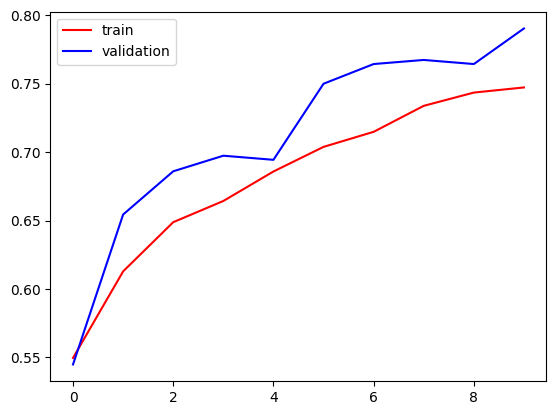

In [25]:
import matplotlib.pyplot as plt

plt.plot(history_1.history['accuracy'], color = 'red', label = 'train')
plt.plot(history_1.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/Simple_CNN_Data_Augmentation/accuracy")
plt.show()

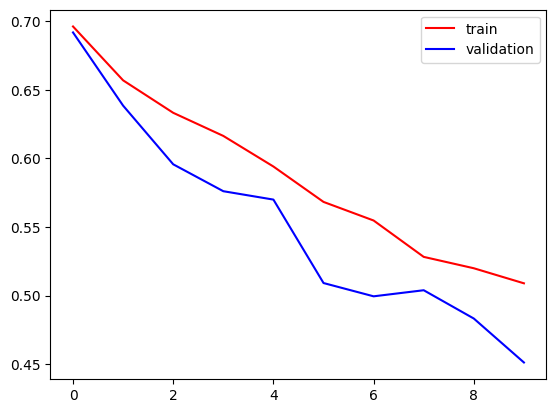

In [26]:
import matplotlib.pyplot as plt

plt.plot(history_1.history['loss'], color = 'red', label = 'train')
plt.plot(history_1.history['val_loss'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/Simple_CNN_Data_Augmentation/loss")
plt.show()

In [27]:
model.save('Simple_CNN_Data_Augmentation/model.keras')

# Applying Transfer Learning with Data Augmentation
 ### *By Training on State-of-Art VGG 16*

### Approach 1) Feature Extraction

In [28]:
from keras.applications.vgg16 import VGG16

In [29]:
conv_base = VGG16(
    weights = 'imagenet',
    include_top = False, # Not importing FC layers
    input_shape = (256, 256, 3)
)

       0/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

 4202496/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

 6938624/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

15704064/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

26214400/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

33947648/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

38666240/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

46120960/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

51994624/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [30]:
conv_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [31]:
model = Sequential()

# Rescaling layer
model.add(Rescaling(1./255, input_shape=(image_height, image_width, 3)))

# Data Augmentation Layer
# model.add(data_augmentation)
model.add(RandomFlip("horizontal"))
model.add(RandomRotation(0.2))
model.add(RandomZoom(0.3))
model.add(RandomTranslation(height_factor=0, width_factor=0.2))
model.add(RandomContrast(0.2))

# VGG 16
model.add(conv_base)

# Fully Connected
model.add(Flatten())
model.add(Dense(256, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))

In [32]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_2               │ (None, 256, 256, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_2 (RandomZoom)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_2            │ (None, 256, 256, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_2               │ (None, 256, 256, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 8, 8, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,103,809 (88.13 MB)

 Trainable params: 23,103,809 (88.13 MB)

 Non-trainable params: 0 (0.00 B)

In [33]:
conv_base.trainable = False # avoid training the conv base for feature extraction

In [34]:
model.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip_2 (RandomFlip)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation_2               │ (None, 256, 256, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_2 (RandomZoom)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_2            │ (None, 256, 256, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_2               │ (None, 256, 256, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ vgg16 (Functional)              │ (None, 8, 8, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 256)            │     8,388,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,103,809 (88.13 MB)

 Trainable params: 8,389,121 (32.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [35]:
train_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/dogs-vs-cats/train',
    labels = 'inferred',
    label_mode = 'int',
    batch_size = 32,
    image_size = (image_height, image_width)  
)

validation_ds = keras.utils.image_dataset_from_directory(
    directory = '/kaggle/input/dogs-vs-cats/test',
    labels = 'inferred',
    label_mode = 'int',
    batch_size = 32,
    image_size = (image_height, image_width)
)

Found 20000 files belonging to 2 classes.


Found 5000 files belonging to 2 classes.


In [36]:
model.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [37]:
epochs=10
history_2 = model.fit(
  train_ds,
  validation_data=validation_ds,
  epochs=epochs
)

Epoch 1/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:52:55 17s/step - accuracy: 0.4062 - loss: 0.7153

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - accuracy: 0.4375 - loss: 2.9684 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 205ms/step - accuracy: 0.4583 - loss: 3.2132

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 205ms/step - accuracy: 0.4648 - loss: 3.2742

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 205ms/step - accuracy: 0.4719 - loss: 3.2288

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 208ms/step - accuracy: 0.4826 - loss: 3.1348

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 207ms/step - accuracy: 0.4921 - loss: 3.0308

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 207ms/step - accuracy: 0.5014 - loss: 2.9259

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 207ms/step - accuracy: 0.5105 - loss: 2.8251

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 208ms/step - accuracy: 0.5198 - loss: 2.7300

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 208ms/step - accuracy: 0.5286 - loss: 2.6411

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 207ms/step - accuracy: 0.5375 - loss: 2.5573

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 207ms/step - accuracy: 0.5462 - loss: 2.4789

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 208ms/step - accuracy: 0.5538 - loss: 2.4076

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 208ms/step - accuracy: 0.5613 - loss: 2.3408

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 208ms/step - accuracy: 0.5680 - loss: 2.2794

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 208ms/step - accuracy: 0.5745 - loss: 2.2218

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 208ms/step - accuracy: 0.5809 - loss: 2.1675

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 208ms/step - accuracy: 0.5870 - loss: 2.1173

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 208ms/step - accuracy: 0.5924 - loss: 2.0707

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 208ms/step - accuracy: 0.5973 - loss: 2.0274

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 208ms/step - accuracy: 0.6020 - loss: 1.9866

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 208ms/step - accuracy: 0.6064 - loss: 1.9480

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 208ms/step - accuracy: 0.6105 - loss: 1.9119

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 208ms/step - accuracy: 0.6145 - loss: 1.8776

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 208ms/step - accuracy: 0.6184 - loss: 1.8450

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 208ms/step - accuracy: 0.6220 - loss: 1.8144

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 208ms/step - accuracy: 0.6255 - loss: 1.7849

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 209ms/step - accuracy: 0.6290 - loss: 1.7570

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 209ms/step - accuracy: 0.6323 - loss: 1.7304

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 209ms/step - accuracy: 0.6355 - loss: 1.7051

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - accuracy: 0.6384 - loss: 1.6810

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - accuracy: 0.6411 - loss: 1.6587

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - accuracy: 0.6438 - loss: 1.6370

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - accuracy: 0.6463 - loss: 1.6166

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - accuracy: 0.6486 - loss: 1.5972

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 209ms/step - accuracy: 0.6507 - loss: 1.5790

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 209ms/step - accuracy: 0.6528 - loss: 1.5615

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 209ms/step - accuracy: 0.6548 - loss: 1.5447

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 209ms/step - accuracy: 0.6566 - loss: 1.5287

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - accuracy: 0.6585 - loss: 1.5133

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - accuracy: 0.6601 - loss: 1.4989

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 210ms/step - accuracy: 0.6618 - loss: 1.4849

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - accuracy: 0.6633 - loss: 1.4714

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - accuracy: 0.6649 - loss: 1.4582

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - accuracy: 0.6663 - loss: 1.4454

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - accuracy: 0.6678 - loss: 1.4332

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - accuracy: 0.6692 - loss: 1.4212

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 210ms/step - accuracy: 0.6705 - loss: 1.4095

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - accuracy: 0.6718 - loss: 1.3983

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - accuracy: 0.6731 - loss: 1.3874

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - accuracy: 0.6743 - loss: 1.3769

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 210ms/step - accuracy: 0.6755 - loss: 1.3666

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 211ms/step - accuracy: 0.6767 - loss: 1.3566

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - accuracy: 0.6778 - loss: 1.3470

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 210ms/step - accuracy: 0.6789 - loss: 1.3375

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - accuracy: 0.6801 - loss: 1.3283

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - accuracy: 0.6812 - loss: 1.3193

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - accuracy: 0.6823 - loss: 1.3105

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 211ms/step - accuracy: 0.6833 - loss: 1.3018

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - accuracy: 0.6844 - loss: 1.2934

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - accuracy: 0.6854 - loss: 1.2851

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - accuracy: 0.6864 - loss: 1.2771

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - accuracy: 0.6874 - loss: 1.2692

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 211ms/step - accuracy: 0.6884 - loss: 1.2614

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - accuracy: 0.6894 - loss: 1.2538

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - accuracy: 0.6904 - loss: 1.2463

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - accuracy: 0.6914 - loss: 1.2391

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - accuracy: 0.6923 - loss: 1.2319

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 211ms/step - accuracy: 0.6932 - loss: 1.2249

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - accuracy: 0.6942 - loss: 1.2181

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - accuracy: 0.6950 - loss: 1.2113

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - accuracy: 0.6959 - loss: 1.2047

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - accuracy: 0.6967 - loss: 1.1982

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 211ms/step - accuracy: 0.6976 - loss: 1.1919

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - accuracy: 0.6984 - loss: 1.1856

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - accuracy: 0.6992 - loss: 1.1794

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - accuracy: 0.7000 - loss: 1.1734

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - accuracy: 0.7009 - loss: 1.1674

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 211ms/step - accuracy: 0.7016 - loss: 1.1616

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - accuracy: 0.7024 - loss: 1.1559

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - accuracy: 0.7031 - loss: 1.1503

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - accuracy: 0.7039 - loss: 1.1448

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - accuracy: 0.7046 - loss: 1.1394

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 211ms/step - accuracy: 0.7053 - loss: 1.1341

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - accuracy: 0.7060 - loss: 1.1290

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - accuracy: 0.7067 - loss: 1.1238

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - accuracy: 0.7073 - loss: 1.1188

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - accuracy: 0.7080 - loss: 1.1138

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 211ms/step - accuracy: 0.7087 - loss: 1.1089

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - accuracy: 0.7094 - loss: 1.1041

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - accuracy: 0.7100 - loss: 1.0993

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - accuracy: 0.7107 - loss: 1.0946

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 211ms/step - accuracy: 0.7113 - loss: 1.0900

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - accuracy: 0.7120 - loss: 1.0854

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - accuracy: 0.7126 - loss: 1.0809

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - accuracy: 0.7132 - loss: 1.0765

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - accuracy: 0.7138 - loss: 1.0722

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 211ms/step - accuracy: 0.7145 - loss: 1.0679

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - accuracy: 0.7150 - loss: 1.0637

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - accuracy: 0.7156 - loss: 1.0597

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - accuracy: 0.7162 - loss: 1.0557

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - accuracy: 0.7167 - loss: 1.0517

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 211ms/step - accuracy: 0.7173 - loss: 1.0480

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - accuracy: 0.7178 - loss: 1.0443

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - accuracy: 0.7184 - loss: 1.0407

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - accuracy: 0.7189 - loss: 1.0372

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 211ms/step - accuracy: 0.7194 - loss: 1.0337

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - accuracy: 0.7199 - loss: 1.0302

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - accuracy: 0.7203 - loss: 1.0269

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - accuracy: 0.7208 - loss: 1.0237

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - accuracy: 0.7213 - loss: 1.0205

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 211ms/step - accuracy: 0.7217 - loss: 1.0174

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - accuracy: 0.7221 - loss: 1.0144

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - accuracy: 0.7226 - loss: 1.0114

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - accuracy: 0.7230 - loss: 1.0085

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 211ms/step - accuracy: 0.7234 - loss: 1.0056

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - accuracy: 0.7238 - loss: 1.0027

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - accuracy: 0.7242 - loss: 0.9999

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - accuracy: 0.7246 - loss: 0.9971

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - accuracy: 0.7250 - loss: 0.9944

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 211ms/step - accuracy: 0.7254 - loss: 0.9918

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - accuracy: 0.7258 - loss: 0.9892

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - accuracy: 0.7261 - loss: 0.9866

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - accuracy: 0.7265 - loss: 0.9840

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 211ms/step - accuracy: 0.7269 - loss: 0.9815

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - accuracy: 0.7272 - loss: 0.9791

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - accuracy: 0.7276 - loss: 0.9766

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - accuracy: 0.7280 - loss: 0.9742

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - accuracy: 0.7283 - loss: 0.9717

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 211ms/step - accuracy: 0.7287 - loss: 0.9694

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - accuracy: 0.7290 - loss: 0.9670

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - accuracy: 0.7294 - loss: 0.9647

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - accuracy: 0.7297 - loss: 0.9624

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 211ms/step - accuracy: 0.7301 - loss: 0.9601

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 211ms/step - accuracy: 0.7304 - loss: 0.9578

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - accuracy: 0.7308 - loss: 0.9556

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - accuracy: 0.7311 - loss: 0.9534

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - accuracy: 0.7314 - loss: 0.9512

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 210ms/step - accuracy: 0.7318 - loss: 0.9490

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - accuracy: 0.7321 - loss: 0.9468

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - accuracy: 0.7324 - loss: 0.9447

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - accuracy: 0.7327 - loss: 0.9426

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 210ms/step - accuracy: 0.7331 - loss: 0.9405

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - accuracy: 0.7334 - loss: 0.9385

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - accuracy: 0.7337 - loss: 0.9365

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - accuracy: 0.7340 - loss: 0.9345

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 210ms/step - accuracy: 0.7343 - loss: 0.9325

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - accuracy: 0.7346 - loss: 0.9306

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - accuracy: 0.7349 - loss: 0.9287

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - accuracy: 0.7351 - loss: 0.9269

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - accuracy: 0.7354 - loss: 0.9251

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 210ms/step - accuracy: 0.7356 - loss: 0.9233

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - accuracy: 0.7359 - loss: 0.9215

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - accuracy: 0.7361 - loss: 0.9197

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - accuracy: 0.7364 - loss: 0.9180

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 210ms/step - accuracy: 0.7367 - loss: 0.9162

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - accuracy: 0.7369 - loss: 0.9145

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - accuracy: 0.7372 - loss: 0.9128

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - accuracy: 0.7374 - loss: 0.9111

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - accuracy: 0.7377 - loss: 0.9095

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 210ms/step - accuracy: 0.7379 - loss: 0.9078

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - accuracy: 0.7382 - loss: 0.9062

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 210ms/step - accuracy: 0.7384 - loss: 0.9046

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 209ms/step - accuracy: 0.7386 - loss: 0.9030

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 209ms/step - accuracy: 0.7389 - loss: 0.9014

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 209ms/step - accuracy: 0.7391 - loss: 0.8999

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 209ms/step - accuracy: 0.7393 - loss: 0.8983

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 209ms/step - accuracy: 0.7396 - loss: 0.8968

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 209ms/step - accuracy: 0.7398 - loss: 0.8953

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 209ms/step - accuracy: 0.7400 - loss: 0.8938

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 209ms/step - accuracy: 0.7402 - loss: 0.8924

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 209ms/step - accuracy: 0.7404 - loss: 0.8909

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 209ms/step - accuracy: 0.7407 - loss: 0.8895

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 209ms/step - accuracy: 0.7409 - loss: 0.8881

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 209ms/step - accuracy: 0.7411 - loss: 0.8866

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 209ms/step - accuracy: 0.7413 - loss: 0.8852

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 209ms/step - accuracy: 0.7415 - loss: 0.8838

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 209ms/step - accuracy: 0.7417 - loss: 0.8824

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 209ms/step - accuracy: 0.7419 - loss: 0.8810

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 209ms/step - accuracy: 0.7421 - loss: 0.8796

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 209ms/step - accuracy: 0.7423 - loss: 0.8783

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 209ms/step - accuracy: 0.7426 - loss: 0.8769

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 209ms/step - accuracy: 0.7428 - loss: 0.8755

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 209ms/step - accuracy: 0.7430 - loss: 0.8742

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 209ms/step - accuracy: 0.7432 - loss: 0.8729

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 209ms/step - accuracy: 0.7434 - loss: 0.8716

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 209ms/step - accuracy: 0.7436 - loss: 0.8703

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 209ms/step - accuracy: 0.7438 - loss: 0.8690

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 209ms/step - accuracy: 0.7440 - loss: 0.8677

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 209ms/step - accuracy: 0.7442 - loss: 0.8664

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 209ms/step - accuracy: 0.7444 - loss: 0.8652

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 209ms/step - accuracy: 0.7446 - loss: 0.8639

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 209ms/step - accuracy: 0.7448 - loss: 0.8627

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.7450 - loss: 0.8615

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.7452 - loss: 0.8603

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.7453 - loss: 0.8591

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.7455 - loss: 0.8579

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.7457 - loss: 0.8567

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.7459 - loss: 0.8555

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.7461 - loss: 0.8543

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.7463 - loss: 0.8531

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.7465 - loss: 0.8520

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.7467 - loss: 0.8508

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.7468 - loss: 0.8497

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.7470 - loss: 0.8485

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.7472 - loss: 0.8474

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.7474 - loss: 0.8463

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.7476 - loss: 0.8452

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.7478 - loss: 0.8441

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.7479 - loss: 0.8430

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.7481 - loss: 0.8419

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.7483 - loss: 0.8408

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.7484 - loss: 0.8398

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.7486 - loss: 0.8387

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.7488 - loss: 0.8377

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.7490 - loss: 0.8366

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.7491 - loss: 0.8356

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.7493 - loss: 0.8345

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.7495 - loss: 0.8335

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.7496 - loss: 0.8325

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.7498 - loss: 0.8314

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.7500 - loss: 0.8304

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.7501 - loss: 0.8294

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.7503 - loss: 0.8284

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.7505 - loss: 0.8273

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.7506 - loss: 0.8263

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.7508 - loss: 0.8253

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.7510 - loss: 0.8243

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.7511 - loss: 0.8233

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.7513 - loss: 0.8224

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.7515 - loss: 0.8214

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.7516 - loss: 0.8204

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 207ms/step - accuracy: 0.7518 - loss: 0.8194

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 207ms/step - accuracy: 0.7519 - loss: 0.8185

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 207ms/step - accuracy: 0.7521 - loss: 0.8175

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 207ms/step - accuracy: 0.7523 - loss: 0.8165

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 207ms/step - accuracy: 0.7524 - loss: 0.8156

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 207ms/step - accuracy: 0.7526 - loss: 0.8146

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 207ms/step - accuracy: 0.7528 - loss: 0.8137

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 207ms/step - accuracy: 0.7529 - loss: 0.8127

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 207ms/step - accuracy: 0.7531 - loss: 0.8118

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 207ms/step - accuracy: 0.7532 - loss: 0.8109

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 207ms/step - accuracy: 0.7534 - loss: 0.8099

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 207ms/step - accuracy: 0.7536 - loss: 0.8090

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 207ms/step - accuracy: 0.7537 - loss: 0.8081

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 207ms/step - accuracy: 0.7539 - loss: 0.8072

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 207ms/step - accuracy: 0.7540 - loss: 0.8063

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 207ms/step - accuracy: 0.7542 - loss: 0.8054

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 207ms/step - accuracy: 0.7543 - loss: 0.8045

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 207ms/step - accuracy: 0.7545 - loss: 0.8036

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 207ms/step - accuracy: 0.7547 - loss: 0.8027

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 207ms/step - accuracy: 0.7548 - loss: 0.8018

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.7550 - loss: 0.8009

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.7551 - loss: 0.8000

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.7553 - loss: 0.7991

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.7554 - loss: 0.7982

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.7556 - loss: 0.7974

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.7557 - loss: 0.7965

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.7559 - loss: 0.7956

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.7560 - loss: 0.7948

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.7562 - loss: 0.7939

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.7563 - loss: 0.7930

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.7565 - loss: 0.7922

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.7566 - loss: 0.7913

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.7568 - loss: 0.7905

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.7569 - loss: 0.7896

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.7571 - loss: 0.7888

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.7572 - loss: 0.7879

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.7574 - loss: 0.7871

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.7576 - loss: 0.7863

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.7577 - loss: 0.7854

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.7579 - loss: 0.7846

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.7580 - loss: 0.7838

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.7582 - loss: 0.7830

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.7583 - loss: 0.7822

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.7584 - loss: 0.7814

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.7586 - loss: 0.7806

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.7587 - loss: 0.7798

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.7589 - loss: 0.7790

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.7590 - loss: 0.7782

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.7591 - loss: 0.7775

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.7593 - loss: 0.7767

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.7594 - loss: 0.7759

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.7596 - loss: 0.7751

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.7597 - loss: 0.7744

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.7599 - loss: 0.7736

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.7600 - loss: 0.7729

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.7601 - loss: 0.7721

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.7603 - loss: 0.7714

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.7604 - loss: 0.7706

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.7605 - loss: 0.7699

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.7607 - loss: 0.7691

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.7608 - loss: 0.7684

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.7609 - loss: 0.7676

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.7611 - loss: 0.7669

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 206ms/step - accuracy: 0.7612 - loss: 0.7662

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 206ms/step - accuracy: 0.7613 - loss: 0.7654

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 206ms/step - accuracy: 0.7615 - loss: 0.7647

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 206ms/step - accuracy: 0.7616 - loss: 0.7640

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 206ms/step - accuracy: 0.7617 - loss: 0.7633

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 206ms/step - accuracy: 0.7619 - loss: 0.7625

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 206ms/step - accuracy: 0.7620 - loss: 0.7618

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 206ms/step - accuracy: 0.7621 - loss: 0.7611

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 206ms/step - accuracy: 0.7623 - loss: 0.7604

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 206ms/step - accuracy: 0.7624 - loss: 0.7597

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 206ms/step - accuracy: 0.7625 - loss: 0.7590

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 206ms/step - accuracy: 0.7627 - loss: 0.7583

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 206ms/step - accuracy: 0.7628 - loss: 0.7576

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 206ms/step - accuracy: 0.7629 - loss: 0.7569

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 206ms/step - accuracy: 0.7630 - loss: 0.7562

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 206ms/step - accuracy: 0.7632 - loss: 0.7555

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 206ms/step - accuracy: 0.7633 - loss: 0.7549

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 206ms/step - accuracy: 0.7634 - loss: 0.7542

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 206ms/step - accuracy: 0.7635 - loss: 0.7535

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 206ms/step - accuracy: 0.7636 - loss: 0.7529

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 206ms/step - accuracy: 0.7638 - loss: 0.7522

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 206ms/step - accuracy: 0.7639 - loss: 0.7516

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 206ms/step - accuracy: 0.7640 - loss: 0.7509

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 206ms/step - accuracy: 0.7641 - loss: 0.7503

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 206ms/step - accuracy: 0.7642 - loss: 0.7496

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 206ms/step - accuracy: 0.7643 - loss: 0.7490

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 206ms/step - accuracy: 0.7645 - loss: 0.7484

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 206ms/step - accuracy: 0.7646 - loss: 0.7477

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 206ms/step - accuracy: 0.7647 - loss: 0.7471

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 206ms/step - accuracy: 0.7648 - loss: 0.7465

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 206ms/step - accuracy: 0.7649 - loss: 0.7459

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 206ms/step - accuracy: 0.7650 - loss: 0.7452

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 206ms/step - accuracy: 0.7651 - loss: 0.7446

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.7652 - loss: 0.7440

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.7654 - loss: 0.7434

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.7655 - loss: 0.7428

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.7656 - loss: 0.7422

334/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.7657 - loss: 0.7416 

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.7658 - loss: 0.7410

336/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.7659 - loss: 0.7404

337/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.7660 - loss: 0.7398

338/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.7661 - loss: 0.7392

339/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.7662 - loss: 0.7386

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.7663 - loss: 0.7380

341/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.7665 - loss: 0.7374

342/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.7666 - loss: 0.7368

343/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.7667 - loss: 0.7362

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.7668 - loss: 0.7356

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.7669 - loss: 0.7350

346/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.7670 - loss: 0.7345

347/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.7671 - loss: 0.7339

348/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.7672 - loss: 0.7333

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.7673 - loss: 0.7328

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.7674 - loss: 0.7322

351/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.7675 - loss: 0.7316

352/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.7676 - loss: 0.7311

353/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.7677 - loss: 0.7305

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.7678 - loss: 0.7300

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.7679 - loss: 0.7294

356/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.7680 - loss: 0.7289

357/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.7681 - loss: 0.7283

358/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.7682 - loss: 0.7278

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.7683 - loss: 0.7273

360/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.7684 - loss: 0.7267

361/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.7684 - loss: 0.7262

362/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.7685 - loss: 0.7257

363/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.7686 - loss: 0.7251

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.7687 - loss: 0.7246

365/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.7688 - loss: 0.7241

366/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.7689 - loss: 0.7235

367/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.7690 - loss: 0.7230

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.7691 - loss: 0.7225

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.7692 - loss: 0.7220

370/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.7693 - loss: 0.7214

371/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.7694 - loss: 0.7209

372/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.7695 - loss: 0.7204

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.7695 - loss: 0.7199

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.7696 - loss: 0.7194

375/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.7697 - loss: 0.7189

376/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.7698 - loss: 0.7184

377/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.7699 - loss: 0.7178

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.7700 - loss: 0.7173

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.7701 - loss: 0.7168

380/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.7702 - loss: 0.7163

381/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.7702 - loss: 0.7158

382/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.7703 - loss: 0.7153

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.7704 - loss: 0.7148

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.7705 - loss: 0.7143

385/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.7706 - loss: 0.7138

386/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.7707 - loss: 0.7133

387/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.7708 - loss: 0.7129

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.7708 - loss: 0.7124

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.7709 - loss: 0.7119

390/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.7710 - loss: 0.7114

391/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.7711 - loss: 0.7109

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.7712 - loss: 0.7104

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.7713 - loss: 0.7100

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.7713 - loss: 0.7095

395/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.7714 - loss: 0.7090

396/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.7715 - loss: 0.7085

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.7716 - loss: 0.7081

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.7717 - loss: 0.7076

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.7717 - loss: 0.7071

400/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.7718 - loss: 0.7066

401/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.7719 - loss: 0.7062

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.7720 - loss: 0.7057

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.7721 - loss: 0.7052

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.7721 - loss: 0.7048

405/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.7722 - loss: 0.7043

406/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.7723 - loss: 0.7039

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.7724 - loss: 0.7034

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.7725 - loss: 0.7029

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.7725 - loss: 0.7025

410/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.7726 - loss: 0.7020

411/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.7727 - loss: 0.7016

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.7728 - loss: 0.7011

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.7728 - loss: 0.7007

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.7729 - loss: 0.7002

415/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.7730 - loss: 0.6998

416/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.7731 - loss: 0.6993

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.7732 - loss: 0.6989

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.7732 - loss: 0.6985

419/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.7733 - loss: 0.6980

420/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.7734 - loss: 0.6976

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.7735 - loss: 0.6971

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.7735 - loss: 0.6967

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.7736 - loss: 0.6963

424/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.7737 - loss: 0.6958

425/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.7738 - loss: 0.6954

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.7738 - loss: 0.6950

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.7739 - loss: 0.6945

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.7740 - loss: 0.6941

429/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.7741 - loss: 0.6937

430/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.7741 - loss: 0.6932

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 205ms/step - accuracy: 0.7742 - loss: 0.6928

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 205ms/step - accuracy: 0.7743 - loss: 0.6924

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 205ms/step - accuracy: 0.7744 - loss: 0.6920

434/625 ━━━━━━━━━━━━━━━━━━━━ 39s 205ms/step - accuracy: 0.7744 - loss: 0.6916

435/625 ━━━━━━━━━━━━━━━━━━━━ 39s 205ms/step - accuracy: 0.7745 - loss: 0.6911

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 205ms/step - accuracy: 0.7746 - loss: 0.6907

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 205ms/step - accuracy: 0.7746 - loss: 0.6903

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 205ms/step - accuracy: 0.7747 - loss: 0.6899

439/625 ━━━━━━━━━━━━━━━━━━━━ 38s 205ms/step - accuracy: 0.7748 - loss: 0.6895

440/625 ━━━━━━━━━━━━━━━━━━━━ 38s 205ms/step - accuracy: 0.7749 - loss: 0.6891

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 205ms/step - accuracy: 0.7749 - loss: 0.6886

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 205ms/step - accuracy: 0.7750 - loss: 0.6882

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 205ms/step - accuracy: 0.7751 - loss: 0.6878

444/625 ━━━━━━━━━━━━━━━━━━━━ 37s 205ms/step - accuracy: 0.7751 - loss: 0.6874

445/625 ━━━━━━━━━━━━━━━━━━━━ 36s 205ms/step - accuracy: 0.7752 - loss: 0.6870

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 205ms/step - accuracy: 0.7753 - loss: 0.6866

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 205ms/step - accuracy: 0.7754 - loss: 0.6862

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 205ms/step - accuracy: 0.7754 - loss: 0.6858

449/625 ━━━━━━━━━━━━━━━━━━━━ 36s 205ms/step - accuracy: 0.7755 - loss: 0.6854

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 205ms/step - accuracy: 0.7756 - loss: 0.6850

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 205ms/step - accuracy: 0.7756 - loss: 0.6846

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 205ms/step - accuracy: 0.7757 - loss: 0.6842

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 205ms/step - accuracy: 0.7758 - loss: 0.6838

454/625 ━━━━━━━━━━━━━━━━━━━━ 35s 205ms/step - accuracy: 0.7759 - loss: 0.6834

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 205ms/step - accuracy: 0.7759 - loss: 0.6830

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 205ms/step - accuracy: 0.7760 - loss: 0.6826

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 205ms/step - accuracy: 0.7761 - loss: 0.6822

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 205ms/step - accuracy: 0.7761 - loss: 0.6818

459/625 ━━━━━━━━━━━━━━━━━━━━ 34s 205ms/step - accuracy: 0.7762 - loss: 0.6814

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.7763 - loss: 0.6810

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.7763 - loss: 0.6806

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.7764 - loss: 0.6802

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.7765 - loss: 0.6798

464/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.7765 - loss: 0.6794

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.7766 - loss: 0.6790

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.7767 - loss: 0.6786

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.7768 - loss: 0.6783

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.7768 - loss: 0.6779

469/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.7769 - loss: 0.6775

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7770 - loss: 0.6771

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7770 - loss: 0.6767

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7771 - loss: 0.6763

473/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7772 - loss: 0.6760

474/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.7772 - loss: 0.6756

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.7773 - loss: 0.6752

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.7774 - loss: 0.6748

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.7774 - loss: 0.6744

478/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.7775 - loss: 0.6741

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.7776 - loss: 0.6737

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.7776 - loss: 0.6733

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.7777 - loss: 0.6729

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.7778 - loss: 0.6726

483/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.7778 - loss: 0.6722

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.7779 - loss: 0.6718

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.7780 - loss: 0.6715

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.7780 - loss: 0.6711

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.7781 - loss: 0.6707

488/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.7782 - loss: 0.6704

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.7782 - loss: 0.6700

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.7783 - loss: 0.6696

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.7784 - loss: 0.6693

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.7784 - loss: 0.6689

493/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.7785 - loss: 0.6685

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.7786 - loss: 0.6682

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.7786 - loss: 0.6678

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.7787 - loss: 0.6674

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.7788 - loss: 0.6671

498/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.7788 - loss: 0.6667

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.7789 - loss: 0.6664

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.7790 - loss: 0.6660

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.7790 - loss: 0.6656

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.7791 - loss: 0.6653

503/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.7792 - loss: 0.6649

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.7792 - loss: 0.6646

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.7793 - loss: 0.6642

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.7794 - loss: 0.6639

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.7794 - loss: 0.6635

508/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.7795 - loss: 0.6632

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.7796 - loss: 0.6628

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.7796 - loss: 0.6625

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.7797 - loss: 0.6621

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.7797 - loss: 0.6618

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.7798 - loss: 0.6614

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.7799 - loss: 0.6611

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.7799 - loss: 0.6607

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.7800 - loss: 0.6604

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.7801 - loss: 0.6600

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.7801 - loss: 0.6597

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.7802 - loss: 0.6593

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.7803 - loss: 0.6590

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.7803 - loss: 0.6586

522/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.7804 - loss: 0.6583

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.7805 - loss: 0.6579

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.7805 - loss: 0.6576

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.7806 - loss: 0.6573

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.7806 - loss: 0.6569

527/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.7807 - loss: 0.6566

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.7808 - loss: 0.6562

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.7808 - loss: 0.6559

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.7809 - loss: 0.6556

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.7810 - loss: 0.6552

532/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.7810 - loss: 0.6549

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.7811 - loss: 0.6545

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.7812 - loss: 0.6542

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.7812 - loss: 0.6539

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.7813 - loss: 0.6535

537/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.7814 - loss: 0.6532

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.7814 - loss: 0.6529

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.7815 - loss: 0.6525

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.7815 - loss: 0.6522

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.7816 - loss: 0.6519

542/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.7817 - loss: 0.6515

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.7817 - loss: 0.6512

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.7818 - loss: 0.6509

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.7819 - loss: 0.6505

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.7819 - loss: 0.6502

547/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.7820 - loss: 0.6499

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.7821 - loss: 0.6495

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.7821 - loss: 0.6492

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.7822 - loss: 0.6489

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.7822 - loss: 0.6486

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.7823 - loss: 0.6482

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.7824 - loss: 0.6479

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.7824 - loss: 0.6476

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.7825 - loss: 0.6473

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.7826 - loss: 0.6470

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.7826 - loss: 0.6466

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.7827 - loss: 0.6463

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.7828 - loss: 0.6460

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.7828 - loss: 0.6457

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.7829 - loss: 0.6454

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.7829 - loss: 0.6450

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.7830 - loss: 0.6447

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.7831 - loss: 0.6444

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.7831 - loss: 0.6441

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.7832 - loss: 0.6438

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.7832 - loss: 0.6435

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.7833 - loss: 0.6431

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.7834 - loss: 0.6428

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.7834 - loss: 0.6425

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.7835 - loss: 0.6422

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.7836 - loss: 0.6419

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.7836 - loss: 0.6416

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.7837 - loss: 0.6413

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.7837 - loss: 0.6410

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.7838 - loss: 0.6407

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.7839 - loss: 0.6404 

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.7839 - loss: 0.6401

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.7840 - loss: 0.6398

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.7840 - loss: 0.6395

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.7841 - loss: 0.6392

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.7841 - loss: 0.6389

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.7842 - loss: 0.6386

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.7843 - loss: 0.6383

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.7843 - loss: 0.6380

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.7844 - loss: 0.6377

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.7844 - loss: 0.6374

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.7845 - loss: 0.6371

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.7846 - loss: 0.6368

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.7846 - loss: 0.6365

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.7847 - loss: 0.6362

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.7847 - loss: 0.6359

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.7848 - loss: 0.6356

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.7849 - loss: 0.6353

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.7849 - loss: 0.6350

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.7850 - loss: 0.6347

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.7850 - loss: 0.6344

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.7851 - loss: 0.6341

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.7851 - loss: 0.6338

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.7852 - loss: 0.6336

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.7853 - loss: 0.6333

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.7853 - loss: 0.6330

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.7854 - loss: 0.6327

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.7854 - loss: 0.6324

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.7855 - loss: 0.6321

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.7855 - loss: 0.6318

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.7856 - loss: 0.6316

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.7856 - loss: 0.6313

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.7857 - loss: 0.6310

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.7858 - loss: 0.6307

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.7858 - loss: 0.6304

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.7859 - loss: 0.6301

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.7859 - loss: 0.6299

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.7860 - loss: 0.6296

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.7860 - loss: 0.6293

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.7861 - loss: 0.6290

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.7861 - loss: 0.6287

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.7862 - loss: 0.6285

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.7863 - loss: 0.6282

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.7863 - loss: 0.6279

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7864 - loss: 0.6276

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7864 - loss: 0.6274

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7865 - loss: 0.6271

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7865 - loss: 0.6268

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.7866 - loss: 0.6265

625/625 ━━━━━━━━━━━━━━━━━━━━ 180s 261ms/step - accuracy: 0.7866 - loss: 0.6263 - val_accuracy: 0.9150 - val_loss: 0.2037


Epoch 2/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:30 241ms/step - accuracy: 0.9062 - loss: 0.2649

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.8984 - loss: 0.2927

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.8733 - loss: 0.3419

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.8639 - loss: 0.3597

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 206ms/step - accuracy: 0.8574 - loss: 0.3639

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 205ms/step - accuracy: 0.8534 - loss: 0.3638

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8501 - loss: 0.3618

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8488 - loss: 0.3597

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8479 - loss: 0.3589

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8475 - loss: 0.3572

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8474 - loss: 0.3552

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8469 - loss: 0.3538

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8470 - loss: 0.3518

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8466 - loss: 0.3507

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8463 - loss: 0.3503

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8461 - loss: 0.3499

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8459 - loss: 0.3496

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8452 - loss: 0.3501

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8449 - loss: 0.3499

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8447 - loss: 0.3498

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8444 - loss: 0.3500

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8439 - loss: 0.3508

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - accuracy: 0.8434 - loss: 0.3514

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8429 - loss: 0.3519

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 203ms/step - accuracy: 0.8424 - loss: 0.3527

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 203ms/step - accuracy: 0.8418 - loss: 0.3537

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 203ms/step - accuracy: 0.8413 - loss: 0.3545

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 203ms/step - accuracy: 0.8409 - loss: 0.3552

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 203ms/step - accuracy: 0.8405 - loss: 0.3560

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - accuracy: 0.8399 - loss: 0.3573

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - accuracy: 0.8392 - loss: 0.3587

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - accuracy: 0.8386 - loss: 0.3601

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - accuracy: 0.8380 - loss: 0.3614

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 203ms/step - accuracy: 0.8375 - loss: 0.3627

 35/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - accuracy: 0.8370 - loss: 0.3639

 36/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - accuracy: 0.8365 - loss: 0.3649

 37/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - accuracy: 0.8361 - loss: 0.3658

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - accuracy: 0.8357 - loss: 0.3668

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 203ms/step - accuracy: 0.8353 - loss: 0.3677

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 203ms/step - accuracy: 0.8350 - loss: 0.3687

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 203ms/step - accuracy: 0.8346 - loss: 0.3696

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 203ms/step - accuracy: 0.8343 - loss: 0.3705

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 203ms/step - accuracy: 0.8340 - loss: 0.3713

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 203ms/step - accuracy: 0.8337 - loss: 0.3721

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 203ms/step - accuracy: 0.8334 - loss: 0.3730

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 203ms/step - accuracy: 0.8331 - loss: 0.3739

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 203ms/step - accuracy: 0.8329 - loss: 0.3747

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 203ms/step - accuracy: 0.8326 - loss: 0.3755

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 203ms/step - accuracy: 0.8324 - loss: 0.3764

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 203ms/step - accuracy: 0.8322 - loss: 0.3772

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 203ms/step - accuracy: 0.8320 - loss: 0.3779

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 203ms/step - accuracy: 0.8318 - loss: 0.3786

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 203ms/step - accuracy: 0.8317 - loss: 0.3793

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8315 - loss: 0.3799

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8314 - loss: 0.3804

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8312 - loss: 0.3811

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8311 - loss: 0.3816

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8310 - loss: 0.3822

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8309 - loss: 0.3827

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8308 - loss: 0.3831

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8308 - loss: 0.3835

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8307 - loss: 0.3838

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8307 - loss: 0.3840

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8307 - loss: 0.3842

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8307 - loss: 0.3844

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8306 - loss: 0.3846

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8306 - loss: 0.3848

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8306 - loss: 0.3849

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8305 - loss: 0.3851

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8305 - loss: 0.3853

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8305 - loss: 0.3854

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8305 - loss: 0.3855

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8305 - loss: 0.3857

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8305 - loss: 0.3858

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8305 - loss: 0.3859

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8304 - loss: 0.3860

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8304 - loss: 0.3861

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8304 - loss: 0.3862

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8303 - loss: 0.3864

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8303 - loss: 0.3865

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8302 - loss: 0.3866

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8302 - loss: 0.3867

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8302 - loss: 0.3868

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8301 - loss: 0.3870

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8301 - loss: 0.3871

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8300 - loss: 0.3873

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8299 - loss: 0.3874

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8299 - loss: 0.3876

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8299 - loss: 0.3877

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8298 - loss: 0.3877

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8298 - loss: 0.3878

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8298 - loss: 0.3878

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8298 - loss: 0.3879

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8298 - loss: 0.3879

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8298 - loss: 0.3879

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8299 - loss: 0.3880

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8299 - loss: 0.3880

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8299 - loss: 0.3880

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8299 - loss: 0.3880

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8299 - loss: 0.3879

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8300 - loss: 0.3879

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8300 - loss: 0.3879

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8300 - loss: 0.3878

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8300 - loss: 0.3878

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8301 - loss: 0.3877

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8301 - loss: 0.3877

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8302 - loss: 0.3876

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8302 - loss: 0.3876

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8302 - loss: 0.3875

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8303 - loss: 0.3875

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8303 - loss: 0.3874

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8304 - loss: 0.3873

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8304 - loss: 0.3873

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8305 - loss: 0.3872

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8305 - loss: 0.3871

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8306 - loss: 0.3870

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8306 - loss: 0.3869

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8307 - loss: 0.3868

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8308 - loss: 0.3866

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8308 - loss: 0.3865

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8309 - loss: 0.3864

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8309 - loss: 0.3863

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8310 - loss: 0.3862

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8311 - loss: 0.3861

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8311 - loss: 0.3860

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8312 - loss: 0.3859

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8312 - loss: 0.3857

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8313 - loss: 0.3856

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8314 - loss: 0.3855

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8314 - loss: 0.3854

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8315 - loss: 0.3853

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8315 - loss: 0.3853

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8316 - loss: 0.3852

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8316 - loss: 0.3851

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8317 - loss: 0.3850

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8317 - loss: 0.3849

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8318 - loss: 0.3848

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8318 - loss: 0.3847

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8319 - loss: 0.3847

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8319 - loss: 0.3846

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8319 - loss: 0.3845

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8320 - loss: 0.3844

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8320 - loss: 0.3844

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8321 - loss: 0.3843

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8321 - loss: 0.3842

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8322 - loss: 0.3841

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8322 - loss: 0.3840

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8323 - loss: 0.3840

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8323 - loss: 0.3839

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8324 - loss: 0.3838

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8324 - loss: 0.3837

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8325 - loss: 0.3836

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8325 - loss: 0.3835

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8326 - loss: 0.3834

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8326 - loss: 0.3833

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8327 - loss: 0.3832

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8327 - loss: 0.3831

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8328 - loss: 0.3830

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8329 - loss: 0.3829

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8329 - loss: 0.3829

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8330 - loss: 0.3828

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8330 - loss: 0.3827

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8331 - loss: 0.3826

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8331 - loss: 0.3825

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8332 - loss: 0.3824

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8332 - loss: 0.3823

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8333 - loss: 0.3822

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8333 - loss: 0.3821

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8334 - loss: 0.3820

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8334 - loss: 0.3819

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8335 - loss: 0.3818

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8336 - loss: 0.3817

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8336 - loss: 0.3816

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8337 - loss: 0.3814

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8337 - loss: 0.3813

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8338 - loss: 0.3812

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8338 - loss: 0.3811

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8339 - loss: 0.3810

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8340 - loss: 0.3809

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8340 - loss: 0.3807

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8341 - loss: 0.3806

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8342 - loss: 0.3805

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8342 - loss: 0.3804

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8343 - loss: 0.3802

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8344 - loss: 0.3801

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8345 - loss: 0.3800

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8345 - loss: 0.3799

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8346 - loss: 0.3797

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8347 - loss: 0.3796

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8347 - loss: 0.3795

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8348 - loss: 0.3794

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8348 - loss: 0.3792

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8349 - loss: 0.3791

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8350 - loss: 0.3790

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8350 - loss: 0.3789

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8351 - loss: 0.3787

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8351 - loss: 0.3786

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8352 - loss: 0.3785

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8352 - loss: 0.3784

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8353 - loss: 0.3783

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8353 - loss: 0.3782

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8354 - loss: 0.3781

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8354 - loss: 0.3780

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8355 - loss: 0.3779

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8355 - loss: 0.3778

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8356 - loss: 0.3777

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8357 - loss: 0.3776

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8357 - loss: 0.3775

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8358 - loss: 0.3774

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8358 - loss: 0.3773

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8359 - loss: 0.3772

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8359 - loss: 0.3772

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8359 - loss: 0.3771

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8360 - loss: 0.3770

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8360 - loss: 0.3769

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8361 - loss: 0.3768

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8361 - loss: 0.3767

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8362 - loss: 0.3766

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8362 - loss: 0.3766

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8362 - loss: 0.3765

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8363 - loss: 0.3764

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8363 - loss: 0.3763

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8364 - loss: 0.3762

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8364 - loss: 0.3761

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8364 - loss: 0.3760

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8365 - loss: 0.3759

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8365 - loss: 0.3758

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8366 - loss: 0.3758

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8366 - loss: 0.3757

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8367 - loss: 0.3756

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8367 - loss: 0.3755

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8368 - loss: 0.3754

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8368 - loss: 0.3753

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8369 - loss: 0.3752

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8369 - loss: 0.3751

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8369 - loss: 0.3750

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8370 - loss: 0.3749

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8370 - loss: 0.3748

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8371 - loss: 0.3748

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8371 - loss: 0.3747

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8372 - loss: 0.3746

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8372 - loss: 0.3745

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8373 - loss: 0.3744

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8373 - loss: 0.3743

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8373 - loss: 0.3742

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8374 - loss: 0.3741

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8374 - loss: 0.3740

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8375 - loss: 0.3739

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8375 - loss: 0.3739

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8375 - loss: 0.3738

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8376 - loss: 0.3737

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8376 - loss: 0.3736

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8376 - loss: 0.3736

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8377 - loss: 0.3735

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8377 - loss: 0.3734

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8377 - loss: 0.3733

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8378 - loss: 0.3733

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8378 - loss: 0.3732

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8378 - loss: 0.3731

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8379 - loss: 0.3731

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8379 - loss: 0.3730

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8379 - loss: 0.3729

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8380 - loss: 0.3728

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8380 - loss: 0.3728

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8380 - loss: 0.3727

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8381 - loss: 0.3726

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8381 - loss: 0.3725

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8381 - loss: 0.3725

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8381 - loss: 0.3724

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8382 - loss: 0.3723

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8382 - loss: 0.3723

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8382 - loss: 0.3722

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8383 - loss: 0.3721

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8383 - loss: 0.3721

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8383 - loss: 0.3720

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8384 - loss: 0.3719

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8384 - loss: 0.3719

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8384 - loss: 0.3718

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8384 - loss: 0.3717

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8385 - loss: 0.3717

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8385 - loss: 0.3716

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8385 - loss: 0.3715

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8386 - loss: 0.3715

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8386 - loss: 0.3714

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8386 - loss: 0.3713

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8387 - loss: 0.3712

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8387 - loss: 0.3712

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8387 - loss: 0.3711

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8387 - loss: 0.3710

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8388 - loss: 0.3710

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8388 - loss: 0.3709

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8388 - loss: 0.3708

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8389 - loss: 0.3707

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8389 - loss: 0.3707

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8389 - loss: 0.3706

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8390 - loss: 0.3705

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8390 - loss: 0.3705

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8390 - loss: 0.3704

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8391 - loss: 0.3703

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8391 - loss: 0.3702

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8391 - loss: 0.3702

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8391 - loss: 0.3701

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8392 - loss: 0.3700

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8392 - loss: 0.3700

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8392 - loss: 0.3699

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8393 - loss: 0.3698

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8393 - loss: 0.3697

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8393 - loss: 0.3697

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8394 - loss: 0.3696

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8394 - loss: 0.3695

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8394 - loss: 0.3694

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8395 - loss: 0.3694

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8395 - loss: 0.3693

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8395 - loss: 0.3692

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8396 - loss: 0.3691

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8396 - loss: 0.3691

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8396 - loss: 0.3690

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8396 - loss: 0.3689

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8397 - loss: 0.3689

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8397 - loss: 0.3688

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8397 - loss: 0.3687

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8398 - loss: 0.3686

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8398 - loss: 0.3686

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8398 - loss: 0.3685

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8398 - loss: 0.3684

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8399 - loss: 0.3684

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8399 - loss: 0.3683

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8399 - loss: 0.3682

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8400 - loss: 0.3682

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8400 - loss: 0.3681

331/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8400 - loss: 0.3680 

332/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8401 - loss: 0.3680

333/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8401 - loss: 0.3679

334/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8401 - loss: 0.3678

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8401 - loss: 0.3678

336/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8402 - loss: 0.3677

337/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8402 - loss: 0.3676

338/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8402 - loss: 0.3676

339/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8403 - loss: 0.3675

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8403 - loss: 0.3674

341/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8403 - loss: 0.3674

342/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8403 - loss: 0.3673

343/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8404 - loss: 0.3672

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8404 - loss: 0.3672

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8404 - loss: 0.3671

346/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8405 - loss: 0.3670

347/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8405 - loss: 0.3670

348/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8405 - loss: 0.3669

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8405 - loss: 0.3668

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8406 - loss: 0.3668

351/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8406 - loss: 0.3667

352/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8406 - loss: 0.3666

353/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8407 - loss: 0.3666

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8407 - loss: 0.3665

355/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8407 - loss: 0.3664

356/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8407 - loss: 0.3664

357/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8408 - loss: 0.3663

358/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8408 - loss: 0.3663

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8408 - loss: 0.3662

360/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8408 - loss: 0.3661

361/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8409 - loss: 0.3661

362/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8409 - loss: 0.3660

363/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8409 - loss: 0.3659

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8409 - loss: 0.3659

365/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8410 - loss: 0.3658

366/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8410 - loss: 0.3658

367/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8410 - loss: 0.3657

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8410 - loss: 0.3656

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8411 - loss: 0.3656

370/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8411 - loss: 0.3655

371/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8411 - loss: 0.3654

372/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8411 - loss: 0.3654

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8412 - loss: 0.3653

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8412 - loss: 0.3652

375/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8412 - loss: 0.3652

376/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8413 - loss: 0.3651

377/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8413 - loss: 0.3651

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8413 - loss: 0.3650

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8413 - loss: 0.3649

380/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8414 - loss: 0.3649

381/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8414 - loss: 0.3648

382/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8414 - loss: 0.3648

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8414 - loss: 0.3647

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8415 - loss: 0.3646

385/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8415 - loss: 0.3646

386/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8415 - loss: 0.3645

387/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8415 - loss: 0.3644

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8416 - loss: 0.3644

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8416 - loss: 0.3643

390/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8416 - loss: 0.3643

391/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8416 - loss: 0.3642

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8417 - loss: 0.3641

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8417 - loss: 0.3641

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8417 - loss: 0.3640

395/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8418 - loss: 0.3640

396/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8418 - loss: 0.3639

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8418 - loss: 0.3638

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8418 - loss: 0.3638

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8419 - loss: 0.3637

400/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8419 - loss: 0.3636

401/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8419 - loss: 0.3636

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8419 - loss: 0.3635

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8420 - loss: 0.3635

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8420 - loss: 0.3634

405/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8420 - loss: 0.3633

406/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8420 - loss: 0.3633

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8421 - loss: 0.3632

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8421 - loss: 0.3632

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8421 - loss: 0.3631

410/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8422 - loss: 0.3630

411/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8422 - loss: 0.3630

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8422 - loss: 0.3629

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8422 - loss: 0.3629

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8423 - loss: 0.3628

415/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8423 - loss: 0.3627

416/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8423 - loss: 0.3627

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8423 - loss: 0.3626

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8424 - loss: 0.3626

419/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8424 - loss: 0.3625

420/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8424 - loss: 0.3624

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8424 - loss: 0.3624

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8425 - loss: 0.3623

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8425 - loss: 0.3623

424/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8425 - loss: 0.3622

425/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8425 - loss: 0.3622

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8426 - loss: 0.3621

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8426 - loss: 0.3621

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8426 - loss: 0.3620

429/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8426 - loss: 0.3619

430/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8427 - loss: 0.3619

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8427 - loss: 0.3618

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8427 - loss: 0.3618

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8427 - loss: 0.3617

434/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8427 - loss: 0.3617

435/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8428 - loss: 0.3616

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8428 - loss: 0.3616

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8428 - loss: 0.3615

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8428 - loss: 0.3615

439/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8428 - loss: 0.3614

440/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8429 - loss: 0.3614

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8429 - loss: 0.3613

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8429 - loss: 0.3613

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8429 - loss: 0.3612

444/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8429 - loss: 0.3612

445/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8430 - loss: 0.3612

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8430 - loss: 0.3611

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8430 - loss: 0.3611

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8430 - loss: 0.3610

449/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8430 - loss: 0.3610

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8430 - loss: 0.3609

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8431 - loss: 0.3609

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8431 - loss: 0.3608

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8431 - loss: 0.3608

454/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8431 - loss: 0.3607

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8431 - loss: 0.3607

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8432 - loss: 0.3607

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8432 - loss: 0.3606

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8432 - loss: 0.3606

459/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8432 - loss: 0.3605

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8432 - loss: 0.3605

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8432 - loss: 0.3604

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8433 - loss: 0.3604

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8433 - loss: 0.3603

464/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8433 - loss: 0.3603

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8433 - loss: 0.3603

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8433 - loss: 0.3602

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8433 - loss: 0.3602

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8434 - loss: 0.3601

469/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8434 - loss: 0.3601

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8434 - loss: 0.3600

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8434 - loss: 0.3600

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8434 - loss: 0.3599

473/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8434 - loss: 0.3599

474/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8435 - loss: 0.3599

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8435 - loss: 0.3598

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8435 - loss: 0.3598

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8435 - loss: 0.3597

478/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8435 - loss: 0.3597

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8435 - loss: 0.3596

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8436 - loss: 0.3596

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8436 - loss: 0.3596

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8436 - loss: 0.3595

483/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8436 - loss: 0.3595

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8436 - loss: 0.3594

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8436 - loss: 0.3594

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8437 - loss: 0.3593

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8437 - loss: 0.3593

488/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8437 - loss: 0.3593

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8437 - loss: 0.3592

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8437 - loss: 0.3592

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8437 - loss: 0.3591

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8438 - loss: 0.3591

493/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8438 - loss: 0.3591

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8438 - loss: 0.3590

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8438 - loss: 0.3590

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8438 - loss: 0.3589

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8438 - loss: 0.3589

498/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8438 - loss: 0.3588

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8439 - loss: 0.3588

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8439 - loss: 0.3588

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8439 - loss: 0.3587

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8439 - loss: 0.3587

503/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8439 - loss: 0.3586

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8439 - loss: 0.3586

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8439 - loss: 0.3586

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8440 - loss: 0.3585

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8440 - loss: 0.3585

508/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8440 - loss: 0.3584

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8440 - loss: 0.3584

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8440 - loss: 0.3584

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8440 - loss: 0.3583

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8440 - loss: 0.3583

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8441 - loss: 0.3582

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8441 - loss: 0.3582

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8441 - loss: 0.3581

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8441 - loss: 0.3581

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8441 - loss: 0.3581

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8441 - loss: 0.3580

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8442 - loss: 0.3580

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8442 - loss: 0.3579

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8442 - loss: 0.3579

522/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8442 - loss: 0.3578

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8442 - loss: 0.3578

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8442 - loss: 0.3577

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8442 - loss: 0.3577

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8443 - loss: 0.3577

527/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8443 - loss: 0.3576

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8443 - loss: 0.3576

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8443 - loss: 0.3575

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8443 - loss: 0.3575

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8443 - loss: 0.3574

532/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8444 - loss: 0.3574

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8444 - loss: 0.3574

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8444 - loss: 0.3573

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8444 - loss: 0.3573

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8444 - loss: 0.3572

537/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8444 - loss: 0.3572

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8445 - loss: 0.3571

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8445 - loss: 0.3571

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8445 - loss: 0.3570

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8445 - loss: 0.3570

542/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8445 - loss: 0.3570

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8445 - loss: 0.3569

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8445 - loss: 0.3569

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8446 - loss: 0.3568

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8446 - loss: 0.3568

547/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8446 - loss: 0.3567

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8446 - loss: 0.3567

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8446 - loss: 0.3567

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8446 - loss: 0.3566

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8447 - loss: 0.3566

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8447 - loss: 0.3565

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8447 - loss: 0.3565

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8447 - loss: 0.3564

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8447 - loss: 0.3564

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8447 - loss: 0.3564

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8448 - loss: 0.3563

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8448 - loss: 0.3563

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8448 - loss: 0.3562

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8448 - loss: 0.3562

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8448 - loss: 0.3562

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8448 - loss: 0.3561

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8448 - loss: 0.3561

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8449 - loss: 0.3560

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8449 - loss: 0.3560

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8449 - loss: 0.3560

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8449 - loss: 0.3559

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8449 - loss: 0.3559

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8449 - loss: 0.3558

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8450 - loss: 0.3558

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8450 - loss: 0.3557

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8450 - loss: 0.3557

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8450 - loss: 0.3557

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8450 - loss: 0.3556

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8450 - loss: 0.3556

576/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8450 - loss: 0.3555 

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8451 - loss: 0.3555

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8451 - loss: 0.3555

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8451 - loss: 0.3554

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8451 - loss: 0.3554

581/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8451 - loss: 0.3553

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8451 - loss: 0.3553

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8451 - loss: 0.3553

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8452 - loss: 0.3552

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8452 - loss: 0.3552

586/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8452 - loss: 0.3551

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8452 - loss: 0.3551

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8452 - loss: 0.3551

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8452 - loss: 0.3550

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8452 - loss: 0.3550

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8453 - loss: 0.3549

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8453 - loss: 0.3549

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8453 - loss: 0.3549

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8453 - loss: 0.3548

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8453 - loss: 0.3548

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8453 - loss: 0.3547

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8454 - loss: 0.3547

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8454 - loss: 0.3546

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8454 - loss: 0.3546

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8454 - loss: 0.3546

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8454 - loss: 0.3545

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8454 - loss: 0.3545

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8454 - loss: 0.3544

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8455 - loss: 0.3544

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8455 - loss: 0.3544

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8455 - loss: 0.3543

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8455 - loss: 0.3543

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8455 - loss: 0.3542

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8455 - loss: 0.3542

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8456 - loss: 0.3542

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8456 - loss: 0.3541

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8456 - loss: 0.3541

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8456 - loss: 0.3540

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8456 - loss: 0.3540

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8456 - loss: 0.3540

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8456 - loss: 0.3539

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8457 - loss: 0.3539

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8457 - loss: 0.3538

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8457 - loss: 0.3538

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8457 - loss: 0.3538

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8457 - loss: 0.3537

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8457 - loss: 0.3537

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8458 - loss: 0.3536

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8458 - loss: 0.3536

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8458 - loss: 0.3536

625/625 ━━━━━━━━━━━━━━━━━━━━ 158s 252ms/step - accuracy: 0.8458 - loss: 0.3535 - val_accuracy: 0.9348 - val_loss: 0.1623


Epoch 3/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:26 235ms/step - accuracy: 1.0000 - loss: 0.1883

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.9453 - loss: 0.2582

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.9323 - loss: 0.2686

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.9160 - loss: 0.2797

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.9041 - loss: 0.2909

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8966 - loss: 0.2970

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 204ms/step - accuracy: 0.8929 - loss: 0.2982

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8911 - loss: 0.2969

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8878 - loss: 0.2980

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8853 - loss: 0.2983

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8833 - loss: 0.2985

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8820 - loss: 0.2982

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8798 - loss: 0.3009

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8778 - loss: 0.3043

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8763 - loss: 0.3070

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8751 - loss: 0.3091

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8742 - loss: 0.3104

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8734 - loss: 0.3117

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8727 - loss: 0.3127

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8720 - loss: 0.3137

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8715 - loss: 0.3143

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8711 - loss: 0.3146

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8709 - loss: 0.3148

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8709 - loss: 0.3147

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.8710 - loss: 0.3142

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.8713 - loss: 0.3135

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.8715 - loss: 0.3128

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.8719 - loss: 0.3118

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.8723 - loss: 0.3109

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.8726 - loss: 0.3100

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.8728 - loss: 0.3091

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.8731 - loss: 0.3083

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.8733 - loss: 0.3076

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.8735 - loss: 0.3069

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - accuracy: 0.8736 - loss: 0.3063

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - accuracy: 0.8738 - loss: 0.3057

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - accuracy: 0.8739 - loss: 0.3052

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - accuracy: 0.8740 - loss: 0.3048

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 205ms/step - accuracy: 0.8742 - loss: 0.3043

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 205ms/step - accuracy: 0.8745 - loss: 0.3037

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 205ms/step - accuracy: 0.8746 - loss: 0.3032

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 205ms/step - accuracy: 0.8747 - loss: 0.3027

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 205ms/step - accuracy: 0.8748 - loss: 0.3024

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - accuracy: 0.8749 - loss: 0.3021

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - accuracy: 0.8750 - loss: 0.3018

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - accuracy: 0.8750 - loss: 0.3014

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - accuracy: 0.8752 - loss: 0.3010

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 205ms/step - accuracy: 0.8753 - loss: 0.3006

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - accuracy: 0.8754 - loss: 0.3002

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - accuracy: 0.8755 - loss: 0.3000

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - accuracy: 0.8756 - loss: 0.2998

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - accuracy: 0.8756 - loss: 0.2996

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 205ms/step - accuracy: 0.8756 - loss: 0.2994

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 205ms/step - accuracy: 0.8757 - loss: 0.2993

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 205ms/step - accuracy: 0.8757 - loss: 0.2991

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 205ms/step - accuracy: 0.8757 - loss: 0.2991

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 205ms/step - accuracy: 0.8757 - loss: 0.2990

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 205ms/step - accuracy: 0.8757 - loss: 0.2990

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - accuracy: 0.8757 - loss: 0.2990

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - accuracy: 0.8757 - loss: 0.2990

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - accuracy: 0.8757 - loss: 0.2990

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - accuracy: 0.8756 - loss: 0.2990

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 205ms/step - accuracy: 0.8756 - loss: 0.2990

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - accuracy: 0.8756 - loss: 0.2990

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - accuracy: 0.8756 - loss: 0.2991

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - accuracy: 0.8755 - loss: 0.2991

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 205ms/step - accuracy: 0.8755 - loss: 0.2991

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - accuracy: 0.8755 - loss: 0.2991

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - accuracy: 0.8755 - loss: 0.2991

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - accuracy: 0.8755 - loss: 0.2990

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - accuracy: 0.8755 - loss: 0.2990

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 205ms/step - accuracy: 0.8755 - loss: 0.2991

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - accuracy: 0.8754 - loss: 0.2991

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - accuracy: 0.8754 - loss: 0.2992

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - accuracy: 0.8754 - loss: 0.2992

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - accuracy: 0.8753 - loss: 0.2992

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 205ms/step - accuracy: 0.8753 - loss: 0.2992

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8753 - loss: 0.2992

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8752 - loss: 0.2992

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8752 - loss: 0.2992

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8752 - loss: 0.2992

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8751 - loss: 0.2993

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8751 - loss: 0.2993

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8750 - loss: 0.2993

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8750 - loss: 0.2993

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8749 - loss: 0.2993

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8749 - loss: 0.2993

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 205ms/step - accuracy: 0.8749 - loss: 0.2993

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8748 - loss: 0.2994

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8748 - loss: 0.2994

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8747 - loss: 0.2994

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8747 - loss: 0.2995

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8746 - loss: 0.2995

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8746 - loss: 0.2996

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8745 - loss: 0.2997

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8744 - loss: 0.2998

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8744 - loss: 0.2998

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8743 - loss: 0.2999

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8742 - loss: 0.3000

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8741 - loss: 0.3001

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8740 - loss: 0.3002

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8739 - loss: 0.3003

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8738 - loss: 0.3005

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8737 - loss: 0.3006

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8736 - loss: 0.3007

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8735 - loss: 0.3008

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8734 - loss: 0.3009

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8733 - loss: 0.3010

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8732 - loss: 0.3011

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8732 - loss: 0.3013

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8731 - loss: 0.3014

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8730 - loss: 0.3015

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8729 - loss: 0.3017

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8728 - loss: 0.3018

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8727 - loss: 0.3020

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8726 - loss: 0.3021

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8726 - loss: 0.3022

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8725 - loss: 0.3024

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8724 - loss: 0.3025

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8723 - loss: 0.3026

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8723 - loss: 0.3027

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8722 - loss: 0.3028

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8722 - loss: 0.3029

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8721 - loss: 0.3030

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8720 - loss: 0.3031

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8720 - loss: 0.3032

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8719 - loss: 0.3033

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8719 - loss: 0.3034

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8718 - loss: 0.3034

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8717 - loss: 0.3035

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8717 - loss: 0.3036

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8716 - loss: 0.3037

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8716 - loss: 0.3038

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8715 - loss: 0.3039

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8714 - loss: 0.3040

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8714 - loss: 0.3041

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8713 - loss: 0.3042

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8712 - loss: 0.3043

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8712 - loss: 0.3044

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8711 - loss: 0.3045

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8710 - loss: 0.3046

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8710 - loss: 0.3047

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8709 - loss: 0.3048

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8709 - loss: 0.3049

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8708 - loss: 0.3050

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8708 - loss: 0.3051

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8707 - loss: 0.3052

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8707 - loss: 0.3053

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8706 - loss: 0.3053

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8706 - loss: 0.3054

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8705 - loss: 0.3055

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8705 - loss: 0.3056

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8704 - loss: 0.3057

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8704 - loss: 0.3058

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8703 - loss: 0.3058

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8703 - loss: 0.3059

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8702 - loss: 0.3060

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8702 - loss: 0.3061

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8701 - loss: 0.3061

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8701 - loss: 0.3062

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8700 - loss: 0.3063

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8700 - loss: 0.3064

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8699 - loss: 0.3065

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8699 - loss: 0.3066

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8698 - loss: 0.3066

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8698 - loss: 0.3067

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8697 - loss: 0.3068

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8697 - loss: 0.3069

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8696 - loss: 0.3069

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8696 - loss: 0.3070

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8695 - loss: 0.3071

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8695 - loss: 0.3072

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8694 - loss: 0.3072

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8694 - loss: 0.3073

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8693 - loss: 0.3074

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8693 - loss: 0.3074

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8693 - loss: 0.3075

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8692 - loss: 0.3075

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8692 - loss: 0.3076

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8691 - loss: 0.3077

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8691 - loss: 0.3077

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8690 - loss: 0.3078

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8690 - loss: 0.3078

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8690 - loss: 0.3079

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8689 - loss: 0.3080

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8689 - loss: 0.3080

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8688 - loss: 0.3081

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8688 - loss: 0.3081

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8687 - loss: 0.3082

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8687 - loss: 0.3083

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8686 - loss: 0.3084

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8686 - loss: 0.3084

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8685 - loss: 0.3085

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8685 - loss: 0.3086

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8685 - loss: 0.3086

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8684 - loss: 0.3087

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8684 - loss: 0.3088

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8683 - loss: 0.3088

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8683 - loss: 0.3089

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8682 - loss: 0.3090

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8682 - loss: 0.3090

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8682 - loss: 0.3091

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8681 - loss: 0.3092

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8681 - loss: 0.3092

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8680 - loss: 0.3093

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8680 - loss: 0.3093

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8680 - loss: 0.3094

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8679 - loss: 0.3095

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8679 - loss: 0.3095

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8678 - loss: 0.3096

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8678 - loss: 0.3097

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8678 - loss: 0.3097

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8677 - loss: 0.3098

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8677 - loss: 0.3099

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8676 - loss: 0.3099

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8676 - loss: 0.3100

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8675 - loss: 0.3101

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8675 - loss: 0.3101

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8675 - loss: 0.3102

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8674 - loss: 0.3103

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8674 - loss: 0.3103

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8673 - loss: 0.3104

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8673 - loss: 0.3104

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8672 - loss: 0.3105

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8672 - loss: 0.3106

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8672 - loss: 0.3106

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8671 - loss: 0.3107

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8671 - loss: 0.3107

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8671 - loss: 0.3108

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8670 - loss: 0.3108

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8670 - loss: 0.3108

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8670 - loss: 0.3109

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8669 - loss: 0.3109

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8669 - loss: 0.3110

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8669 - loss: 0.3110

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8668 - loss: 0.3110

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8668 - loss: 0.3111

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8668 - loss: 0.3111

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8668 - loss: 0.3111

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8667 - loss: 0.3112

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8667 - loss: 0.3112

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8667 - loss: 0.3113

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8667 - loss: 0.3113

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8666 - loss: 0.3113

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8666 - loss: 0.3114

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8666 - loss: 0.3114

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8665 - loss: 0.3114

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8665 - loss: 0.3115

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8665 - loss: 0.3115

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8665 - loss: 0.3115

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8665 - loss: 0.3116

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8664 - loss: 0.3116

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8664 - loss: 0.3116

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8664 - loss: 0.3116

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8664 - loss: 0.3117

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8663 - loss: 0.3117

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8663 - loss: 0.3117

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8663 - loss: 0.3118

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8663 - loss: 0.3118

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8663 - loss: 0.3118

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8663 - loss: 0.3118

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8662 - loss: 0.3118

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8662 - loss: 0.3119

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8662 - loss: 0.3119

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8662 - loss: 0.3119

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8662 - loss: 0.3119

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8662 - loss: 0.3120

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8661 - loss: 0.3120

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8661 - loss: 0.3120

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8661 - loss: 0.3120

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8661 - loss: 0.3120

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8661 - loss: 0.3120

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8661 - loss: 0.3120

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8661 - loss: 0.3120

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8661 - loss: 0.3121

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8660 - loss: 0.3121

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8660 - loss: 0.3121

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8660 - loss: 0.3121

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8660 - loss: 0.3121

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8660 - loss: 0.3121

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8660 - loss: 0.3121

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8660 - loss: 0.3121

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8660 - loss: 0.3122

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8659 - loss: 0.3122

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8659 - loss: 0.3122

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8659 - loss: 0.3122

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8659 - loss: 0.3122

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8659 - loss: 0.3122

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8659 - loss: 0.3122

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8659 - loss: 0.3122

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8659 - loss: 0.3122

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8659 - loss: 0.3122

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8659 - loss: 0.3122

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8658 - loss: 0.3122

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8658 - loss: 0.3122

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8658 - loss: 0.3123

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8658 - loss: 0.3123

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8658 - loss: 0.3123

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8658 - loss: 0.3123

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8658 - loss: 0.3123

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8658 - loss: 0.3123

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8658 - loss: 0.3123

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8658 - loss: 0.3123

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8657 - loss: 0.3123

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8657 - loss: 0.3123

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8657 - loss: 0.3123

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8657 - loss: 0.3124

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8657 - loss: 0.3124

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8657 - loss: 0.3124

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8657 - loss: 0.3124

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8657 - loss: 0.3124

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8657 - loss: 0.3124

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8657 - loss: 0.3124

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8657 - loss: 0.3124

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8657 - loss: 0.3124

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8657 - loss: 0.3124

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8657 - loss: 0.3124

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8657 - loss: 0.3124

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8657 - loss: 0.3124

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8657 - loss: 0.3124

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8657 - loss: 0.3124

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8657 - loss: 0.3124

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8656 - loss: 0.3124

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8656 - loss: 0.3124

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8656 - loss: 0.3124

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8656 - loss: 0.3124

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8656 - loss: 0.3124

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8656 - loss: 0.3124

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8656 - loss: 0.3124

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8656 - loss: 0.3124

331/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8656 - loss: 0.3124 

332/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8656 - loss: 0.3124

333/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8656 - loss: 0.3124

334/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8656 - loss: 0.3124

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8656 - loss: 0.3125

336/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8656 - loss: 0.3125

337/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8656 - loss: 0.3125

338/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8656 - loss: 0.3125

339/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8656 - loss: 0.3125

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8656 - loss: 0.3125

341/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8656 - loss: 0.3125

342/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8656 - loss: 0.3125

343/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8656 - loss: 0.3125

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8656 - loss: 0.3125

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8656 - loss: 0.3125

346/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8655 - loss: 0.3125

347/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8655 - loss: 0.3125

348/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8655 - loss: 0.3125

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8655 - loss: 0.3125

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8655 - loss: 0.3125

351/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8655 - loss: 0.3125

352/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8655 - loss: 0.3125

353/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8655 - loss: 0.3125

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8655 - loss: 0.3125

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8655 - loss: 0.3125

356/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8655 - loss: 0.3125

357/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8655 - loss: 0.3125

358/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8655 - loss: 0.3125

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8655 - loss: 0.3125

360/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8655 - loss: 0.3125

361/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8655 - loss: 0.3125

362/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8655 - loss: 0.3125

363/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8655 - loss: 0.3125

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8654 - loss: 0.3125

365/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8654 - loss: 0.3125

366/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8654 - loss: 0.3125

367/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8654 - loss: 0.3125

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8654 - loss: 0.3125

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8654 - loss: 0.3126

370/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8654 - loss: 0.3126

371/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8654 - loss: 0.3126

372/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8654 - loss: 0.3126

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8654 - loss: 0.3126

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8654 - loss: 0.3126

375/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8654 - loss: 0.3126

376/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8654 - loss: 0.3126

377/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8654 - loss: 0.3126

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8654 - loss: 0.3126

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8653 - loss: 0.3126

380/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8653 - loss: 0.3126

381/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8653 - loss: 0.3126

382/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8653 - loss: 0.3126

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8653 - loss: 0.3126

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8653 - loss: 0.3126

385/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8653 - loss: 0.3126

386/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8653 - loss: 0.3126

387/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8653 - loss: 0.3126

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8653 - loss: 0.3126

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8653 - loss: 0.3126

390/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8653 - loss: 0.3126

391/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8653 - loss: 0.3126

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8653 - loss: 0.3126

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8653 - loss: 0.3126

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8653 - loss: 0.3126

395/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8652 - loss: 0.3126

396/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8652 - loss: 0.3126

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8652 - loss: 0.3126

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8652 - loss: 0.3126

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8652 - loss: 0.3126

400/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8652 - loss: 0.3126

401/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8652 - loss: 0.3126

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8652 - loss: 0.3126

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8652 - loss: 0.3126

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8652 - loss: 0.3126

405/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8652 - loss: 0.3126

406/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8652 - loss: 0.3126

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8652 - loss: 0.3126

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8652 - loss: 0.3126

409/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8652 - loss: 0.3126

410/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8652 - loss: 0.3126

411/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8652 - loss: 0.3126

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8652 - loss: 0.3126

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8652 - loss: 0.3126

414/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8652 - loss: 0.3126

415/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8652 - loss: 0.3126

416/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8652 - loss: 0.3126

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8652 - loss: 0.3126

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8652 - loss: 0.3125

419/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8652 - loss: 0.3125

420/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8652 - loss: 0.3125

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8652 - loss: 0.3125

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8652 - loss: 0.3125

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8652 - loss: 0.3125

424/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8652 - loss: 0.3125

425/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8652 - loss: 0.3125

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8651 - loss: 0.3125

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8651 - loss: 0.3125

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8651 - loss: 0.3125

429/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8651 - loss: 0.3125

430/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8651 - loss: 0.3125

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8651 - loss: 0.3125

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8651 - loss: 0.3125

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8651 - loss: 0.3124

434/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8651 - loss: 0.3124

435/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8651 - loss: 0.3124

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8651 - loss: 0.3124

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8651 - loss: 0.3124

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8651 - loss: 0.3124

439/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8651 - loss: 0.3124

440/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8651 - loss: 0.3124

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8651 - loss: 0.3124

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8651 - loss: 0.3124

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8651 - loss: 0.3124

444/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8651 - loss: 0.3124

445/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8651 - loss: 0.3124

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8651 - loss: 0.3124

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8651 - loss: 0.3124

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8651 - loss: 0.3124

449/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8651 - loss: 0.3124

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8651 - loss: 0.3124

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8651 - loss: 0.3124

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8651 - loss: 0.3124

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8651 - loss: 0.3124

454/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8650 - loss: 0.3124

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8650 - loss: 0.3124

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8650 - loss: 0.3124

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8650 - loss: 0.3124

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8650 - loss: 0.3124

459/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8650 - loss: 0.3124

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8650 - loss: 0.3124

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8650 - loss: 0.3124

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8650 - loss: 0.3124

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8650 - loss: 0.3123

464/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8650 - loss: 0.3123

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8650 - loss: 0.3123

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8650 - loss: 0.3123

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8650 - loss: 0.3123

468/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8650 - loss: 0.3123

469/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8649 - loss: 0.3123

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8649 - loss: 0.3123

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8649 - loss: 0.3123

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8649 - loss: 0.3123

473/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8649 - loss: 0.3123

474/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8649 - loss: 0.3123

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8649 - loss: 0.3123

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8649 - loss: 0.3123

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8649 - loss: 0.3123

478/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8649 - loss: 0.3123

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8649 - loss: 0.3123

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8649 - loss: 0.3123

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8649 - loss: 0.3123

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8649 - loss: 0.3123

483/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8649 - loss: 0.3123

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8648 - loss: 0.3123

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8648 - loss: 0.3123

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8648 - loss: 0.3123

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8648 - loss: 0.3123

488/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8648 - loss: 0.3123

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8648 - loss: 0.3123

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8648 - loss: 0.3123

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8648 - loss: 0.3123

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8648 - loss: 0.3123

493/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8648 - loss: 0.3122

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8648 - loss: 0.3122

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8648 - loss: 0.3122

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8648 - loss: 0.3122

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8648 - loss: 0.3122

498/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8648 - loss: 0.3122

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8648 - loss: 0.3122

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8648 - loss: 0.3122

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8648 - loss: 0.3122

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8648 - loss: 0.3122

503/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8648 - loss: 0.3122

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8647 - loss: 0.3122

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8647 - loss: 0.3122

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8647 - loss: 0.3122

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8647 - loss: 0.3122

508/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8647 - loss: 0.3122

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8647 - loss: 0.3121

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8647 - loss: 0.3121

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8647 - loss: 0.3121

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8647 - loss: 0.3121

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8647 - loss: 0.3121

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8647 - loss: 0.3121

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8647 - loss: 0.3121

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8647 - loss: 0.3121

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8647 - loss: 0.3121

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8647 - loss: 0.3121

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8647 - loss: 0.3121

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8647 - loss: 0.3120

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8647 - loss: 0.3120

522/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8647 - loss: 0.3120

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8647 - loss: 0.3120

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8647 - loss: 0.3120

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8647 - loss: 0.3120

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8647 - loss: 0.3120

527/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8647 - loss: 0.3120

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8647 - loss: 0.3120

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8647 - loss: 0.3120

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8647 - loss: 0.3119

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8647 - loss: 0.3119

532/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8647 - loss: 0.3119

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8647 - loss: 0.3119

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8647 - loss: 0.3119

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8647 - loss: 0.3119

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8647 - loss: 0.3119

537/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8647 - loss: 0.3119

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8647 - loss: 0.3119

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8647 - loss: 0.3119

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8647 - loss: 0.3119

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8647 - loss: 0.3118

542/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8646 - loss: 0.3118

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8646 - loss: 0.3118

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8646 - loss: 0.3118

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8646 - loss: 0.3118

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8646 - loss: 0.3118

547/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8646 - loss: 0.3118

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8646 - loss: 0.3118

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8646 - loss: 0.3118

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8646 - loss: 0.3118

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8646 - loss: 0.3118

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8646 - loss: 0.3118

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8646 - loss: 0.3117

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8646 - loss: 0.3117

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8646 - loss: 0.3117

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8646 - loss: 0.3117

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8646 - loss: 0.3117

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8646 - loss: 0.3117

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8646 - loss: 0.3117

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8646 - loss: 0.3117

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8646 - loss: 0.3117

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8646 - loss: 0.3117

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8646 - loss: 0.3117

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8646 - loss: 0.3117

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8646 - loss: 0.3116

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8646 - loss: 0.3116

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8646 - loss: 0.3116

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8646 - loss: 0.3116

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8646 - loss: 0.3116

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8646 - loss: 0.3116

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8646 - loss: 0.3116

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8646 - loss: 0.3116

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8646 - loss: 0.3116

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8646 - loss: 0.3116

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8646 - loss: 0.3116

576/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8646 - loss: 0.3116 

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8646 - loss: 0.3115

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8646 - loss: 0.3115

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8646 - loss: 0.3115

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8646 - loss: 0.3115

581/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8646 - loss: 0.3115

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8646 - loss: 0.3115

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8646 - loss: 0.3115

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8646 - loss: 0.3115

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8646 - loss: 0.3115

586/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8646 - loss: 0.3115

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8646 - loss: 0.3115

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8646 - loss: 0.3115

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8645 - loss: 0.3114

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8645 - loss: 0.3114

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8645 - loss: 0.3114

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8645 - loss: 0.3114

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8645 - loss: 0.3114

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8645 - loss: 0.3114

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8645 - loss: 0.3114

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8645 - loss: 0.3114

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8645 - loss: 0.3114

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8645 - loss: 0.3114

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8645 - loss: 0.3114

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8645 - loss: 0.3114

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8645 - loss: 0.3113

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8645 - loss: 0.3113

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8645 - loss: 0.3113

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8645 - loss: 0.3113

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8645 - loss: 0.3113

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8645 - loss: 0.3113

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8645 - loss: 0.3113

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8645 - loss: 0.3113

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8645 - loss: 0.3113

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8645 - loss: 0.3113

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8645 - loss: 0.3113

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8645 - loss: 0.3113

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8645 - loss: 0.3113

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8645 - loss: 0.3112

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8645 - loss: 0.3112

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8645 - loss: 0.3112

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8645 - loss: 0.3112

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8645 - loss: 0.3112

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8645 - loss: 0.3112

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8645 - loss: 0.3112

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8645 - loss: 0.3112

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8645 - loss: 0.3112

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8645 - loss: 0.3112

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8645 - loss: 0.3112

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8645 - loss: 0.3112

625/625 ━━━━━━━━━━━━━━━━━━━━ 158s 253ms/step - accuracy: 0.8645 - loss: 0.3112 - val_accuracy: 0.9346 - val_loss: 0.1630


Epoch 4/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:27 236ms/step - accuracy: 0.8125 - loss: 0.2816

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.8438 - loss: 0.2757

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.8542 - loss: 0.2710

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 202ms/step - accuracy: 0.8652 - loss: 0.2599

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 204ms/step - accuracy: 0.8684 - loss: 0.2582

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - accuracy: 0.8739 - loss: 0.2520

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - accuracy: 0.8791 - loss: 0.2464

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - accuracy: 0.8830 - loss: 0.2442

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - accuracy: 0.8864 - loss: 0.2417

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8893 - loss: 0.2397

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8914 - loss: 0.2379

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.8926 - loss: 0.2370

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8929 - loss: 0.2373

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8934 - loss: 0.2372

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8937 - loss: 0.2373

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8941 - loss: 0.2372

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 204ms/step - accuracy: 0.8945 - loss: 0.2372

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8946 - loss: 0.2377

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8944 - loss: 0.2387

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8942 - loss: 0.2398

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8940 - loss: 0.2409

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8939 - loss: 0.2419

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8936 - loss: 0.2430

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8933 - loss: 0.2440

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8929 - loss: 0.2452

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8922 - loss: 0.2465

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8917 - loss: 0.2476

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8913 - loss: 0.2485

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8910 - loss: 0.2492

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8907 - loss: 0.2499

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8905 - loss: 0.2504

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8904 - loss: 0.2509

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8902 - loss: 0.2514

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8900 - loss: 0.2519

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8898 - loss: 0.2523

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8896 - loss: 0.2527

 37/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8895 - loss: 0.2530

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8895 - loss: 0.2532

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8894 - loss: 0.2534

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8894 - loss: 0.2535

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8894 - loss: 0.2536

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8894 - loss: 0.2537

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8893 - loss: 0.2538

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8893 - loss: 0.2539

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8892 - loss: 0.2542

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8891 - loss: 0.2544

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8889 - loss: 0.2547

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8888 - loss: 0.2549

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8887 - loss: 0.2551

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8887 - loss: 0.2552

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8886 - loss: 0.2553

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8886 - loss: 0.2554

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8886 - loss: 0.2554

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8887 - loss: 0.2554

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8887 - loss: 0.2555

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8887 - loss: 0.2557

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8887 - loss: 0.2558

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8887 - loss: 0.2559

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8887 - loss: 0.2561

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8887 - loss: 0.2562

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8887 - loss: 0.2564

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8887 - loss: 0.2565

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8887 - loss: 0.2566

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8887 - loss: 0.2568

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8887 - loss: 0.2570

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8887 - loss: 0.2572

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8887 - loss: 0.2574

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8886 - loss: 0.2576

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8886 - loss: 0.2578

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8886 - loss: 0.2580

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8885 - loss: 0.2582

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8884 - loss: 0.2585

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8884 - loss: 0.2587

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8883 - loss: 0.2589

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8882 - loss: 0.2591

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8882 - loss: 0.2593

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8881 - loss: 0.2595

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8881 - loss: 0.2597

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8880 - loss: 0.2598

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8880 - loss: 0.2600

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8880 - loss: 0.2601

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8879 - loss: 0.2603

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8879 - loss: 0.2604

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8879 - loss: 0.2606

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8879 - loss: 0.2607

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8879 - loss: 0.2608

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8878 - loss: 0.2610

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8878 - loss: 0.2611

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8878 - loss: 0.2611

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8878 - loss: 0.2612

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8878 - loss: 0.2613

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8878 - loss: 0.2614

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8878 - loss: 0.2615

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8877 - loss: 0.2617

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8877 - loss: 0.2618

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8877 - loss: 0.2619

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8876 - loss: 0.2621

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8876 - loss: 0.2622

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8875 - loss: 0.2623

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8875 - loss: 0.2625

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8875 - loss: 0.2626

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8874 - loss: 0.2627

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8874 - loss: 0.2628

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8874 - loss: 0.2630

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8873 - loss: 0.2631

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8873 - loss: 0.2632

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8872 - loss: 0.2634

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8872 - loss: 0.2635

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8871 - loss: 0.2636

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8871 - loss: 0.2638

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8870 - loss: 0.2639

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8870 - loss: 0.2640

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8869 - loss: 0.2642

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8869 - loss: 0.2643

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8868 - loss: 0.2644

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8868 - loss: 0.2645

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8868 - loss: 0.2647

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 203ms/step - accuracy: 0.8867 - loss: 0.2648

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8867 - loss: 0.2649

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8866 - loss: 0.2650

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8866 - loss: 0.2651

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8866 - loss: 0.2653

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 203ms/step - accuracy: 0.8865 - loss: 0.2654

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8865 - loss: 0.2655

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8864 - loss: 0.2656

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8864 - loss: 0.2657

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8864 - loss: 0.2659

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 203ms/step - accuracy: 0.8863 - loss: 0.2660

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8863 - loss: 0.2661

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8862 - loss: 0.2662

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8862 - loss: 0.2663

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 203ms/step - accuracy: 0.8861 - loss: 0.2664

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8861 - loss: 0.2665

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8860 - loss: 0.2666

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8860 - loss: 0.2668

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8859 - loss: 0.2669

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 203ms/step - accuracy: 0.8859 - loss: 0.2670

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8858 - loss: 0.2671

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8858 - loss: 0.2672

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8857 - loss: 0.2673

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8857 - loss: 0.2674

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8856 - loss: 0.2675

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8856 - loss: 0.2676

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8855 - loss: 0.2677

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8854 - loss: 0.2678

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8854 - loss: 0.2680

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8853 - loss: 0.2681

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8852 - loss: 0.2682

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8852 - loss: 0.2683

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8851 - loss: 0.2684

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8850 - loss: 0.2686

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8849 - loss: 0.2687

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8849 - loss: 0.2688

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8848 - loss: 0.2690

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8847 - loss: 0.2691

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8846 - loss: 0.2692

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 203ms/step - accuracy: 0.8846 - loss: 0.2694

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8845 - loss: 0.2695

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8844 - loss: 0.2697

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8844 - loss: 0.2698

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8843 - loss: 0.2699

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8842 - loss: 0.2700

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8842 - loss: 0.2701

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8841 - loss: 0.2702

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8840 - loss: 0.2703

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8840 - loss: 0.2705

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 203ms/step - accuracy: 0.8839 - loss: 0.2706

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8839 - loss: 0.2707

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8838 - loss: 0.2708

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8837 - loss: 0.2709

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8837 - loss: 0.2710

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 203ms/step - accuracy: 0.8836 - loss: 0.2711

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8836 - loss: 0.2712

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8835 - loss: 0.2714

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8835 - loss: 0.2715

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8834 - loss: 0.2716

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 203ms/step - accuracy: 0.8833 - loss: 0.2717

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8833 - loss: 0.2718

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8832 - loss: 0.2719

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8832 - loss: 0.2720

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 203ms/step - accuracy: 0.8832 - loss: 0.2721

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8831 - loss: 0.2722

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8831 - loss: 0.2723

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8830 - loss: 0.2724

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8830 - loss: 0.2724

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 203ms/step - accuracy: 0.8830 - loss: 0.2725

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8829 - loss: 0.2726

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8829 - loss: 0.2727

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8829 - loss: 0.2728

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8828 - loss: 0.2729

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 203ms/step - accuracy: 0.8828 - loss: 0.2729

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8828 - loss: 0.2730

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8827 - loss: 0.2731

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8827 - loss: 0.2732

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8827 - loss: 0.2733

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 203ms/step - accuracy: 0.8826 - loss: 0.2733

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8826 - loss: 0.2734

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8826 - loss: 0.2735

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8826 - loss: 0.2736

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8825 - loss: 0.2737

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8825 - loss: 0.2737

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8825 - loss: 0.2738

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8824 - loss: 0.2739

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8824 - loss: 0.2740

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8823 - loss: 0.2741

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8823 - loss: 0.2742

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8823 - loss: 0.2742

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8822 - loss: 0.2743

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8822 - loss: 0.2744

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8821 - loss: 0.2745

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8821 - loss: 0.2746

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8820 - loss: 0.2747

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8820 - loss: 0.2748

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8820 - loss: 0.2749

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8819 - loss: 0.2750

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8819 - loss: 0.2751

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8818 - loss: 0.2751

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8818 - loss: 0.2752

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8817 - loss: 0.2753

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8817 - loss: 0.2754

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8817 - loss: 0.2755

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8816 - loss: 0.2756

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8816 - loss: 0.2756

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8815 - loss: 0.2757

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8815 - loss: 0.2758

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8814 - loss: 0.2759

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8814 - loss: 0.2759

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8814 - loss: 0.2760

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8813 - loss: 0.2761

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8813 - loss: 0.2762

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8812 - loss: 0.2762

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8812 - loss: 0.2763

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8812 - loss: 0.2764

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8811 - loss: 0.2764

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8811 - loss: 0.2765

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8810 - loss: 0.2766

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8810 - loss: 0.2767

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8809 - loss: 0.2767

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8809 - loss: 0.2768

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8808 - loss: 0.2769

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8808 - loss: 0.2769

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8808 - loss: 0.2770

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8807 - loss: 0.2771

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8807 - loss: 0.2771

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8806 - loss: 0.2772

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8806 - loss: 0.2772

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8805 - loss: 0.2773

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8805 - loss: 0.2774

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8805 - loss: 0.2774

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8804 - loss: 0.2775

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8804 - loss: 0.2775

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8804 - loss: 0.2776

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8803 - loss: 0.2776

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8803 - loss: 0.2777

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8802 - loss: 0.2777

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8802 - loss: 0.2778

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8802 - loss: 0.2778

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8801 - loss: 0.2779

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8801 - loss: 0.2779

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8800 - loss: 0.2780

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8800 - loss: 0.2780

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8800 - loss: 0.2781

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8799 - loss: 0.2781

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8799 - loss: 0.2782

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8799 - loss: 0.2782

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8798 - loss: 0.2783

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8798 - loss: 0.2783

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8798 - loss: 0.2783

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8797 - loss: 0.2784

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8797 - loss: 0.2784

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8797 - loss: 0.2785

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8797 - loss: 0.2785

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8796 - loss: 0.2785

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8796 - loss: 0.2786

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8796 - loss: 0.2786

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8796 - loss: 0.2786

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8795 - loss: 0.2787

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8795 - loss: 0.2787

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8795 - loss: 0.2787

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8795 - loss: 0.2787

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8794 - loss: 0.2788

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8794 - loss: 0.2788

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8794 - loss: 0.2788

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8794 - loss: 0.2789

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8793 - loss: 0.2789

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8793 - loss: 0.2789

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8793 - loss: 0.2789

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8793 - loss: 0.2790

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8793 - loss: 0.2790

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8792 - loss: 0.2790

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8792 - loss: 0.2790

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8792 - loss: 0.2791

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8792 - loss: 0.2791

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8792 - loss: 0.2791

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8791 - loss: 0.2792

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8791 - loss: 0.2792

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8791 - loss: 0.2792

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8791 - loss: 0.2793

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8790 - loss: 0.2793

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8790 - loss: 0.2793

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8790 - loss: 0.2794

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8790 - loss: 0.2794

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8789 - loss: 0.2794

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8789 - loss: 0.2795

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8789 - loss: 0.2795

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8789 - loss: 0.2795

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8788 - loss: 0.2796

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8788 - loss: 0.2796

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8788 - loss: 0.2796

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8788 - loss: 0.2797

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8787 - loss: 0.2797

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8787 - loss: 0.2797

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8787 - loss: 0.2798

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8787 - loss: 0.2798

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8786 - loss: 0.2798

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8786 - loss: 0.2798

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8786 - loss: 0.2799

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8786 - loss: 0.2799

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8786 - loss: 0.2799

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8785 - loss: 0.2800

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 203ms/step - accuracy: 0.8785 - loss: 0.2800

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8785 - loss: 0.2800

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8785 - loss: 0.2801

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8784 - loss: 0.2801

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8784 - loss: 0.2801

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8784 - loss: 0.2802

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8784 - loss: 0.2802

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8783 - loss: 0.2802

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8783 - loss: 0.2803

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8783 - loss: 0.2803

331/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8783 - loss: 0.2803 

332/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8782 - loss: 0.2804

333/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8782 - loss: 0.2804

334/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8782 - loss: 0.2804

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8782 - loss: 0.2805

336/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8781 - loss: 0.2805

337/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8781 - loss: 0.2806

338/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8781 - loss: 0.2806

339/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8781 - loss: 0.2806

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8780 - loss: 0.2806

341/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8780 - loss: 0.2807

342/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8780 - loss: 0.2807

343/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8780 - loss: 0.2807

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8779 - loss: 0.2808

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8779 - loss: 0.2808

346/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8779 - loss: 0.2808

347/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8779 - loss: 0.2808

348/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8779 - loss: 0.2809

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8778 - loss: 0.2809

350/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8778 - loss: 0.2809

351/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8778 - loss: 0.2809

352/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8778 - loss: 0.2810

353/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8778 - loss: 0.2810

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8777 - loss: 0.2810

355/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8777 - loss: 0.2811

356/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8777 - loss: 0.2811

357/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8777 - loss: 0.2811

358/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8777 - loss: 0.2811

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8776 - loss: 0.2812

360/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8776 - loss: 0.2812

361/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8776 - loss: 0.2812

362/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8776 - loss: 0.2812

363/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8775 - loss: 0.2813

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8775 - loss: 0.2813

365/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8775 - loss: 0.2813

366/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8775 - loss: 0.2814

367/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8775 - loss: 0.2814

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8774 - loss: 0.2814

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8774 - loss: 0.2814

370/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8774 - loss: 0.2815

371/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8774 - loss: 0.2815

372/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8774 - loss: 0.2815

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8773 - loss: 0.2815

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8773 - loss: 0.2816

375/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8773 - loss: 0.2816

376/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8773 - loss: 0.2816

377/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8773 - loss: 0.2817

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8772 - loss: 0.2817

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8772 - loss: 0.2817

380/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8772 - loss: 0.2817

381/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8772 - loss: 0.2818

382/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8771 - loss: 0.2818

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8771 - loss: 0.2818

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8771 - loss: 0.2818

385/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8771 - loss: 0.2819

386/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8771 - loss: 0.2819

387/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8770 - loss: 0.2819

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8770 - loss: 0.2819

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8770 - loss: 0.2820

390/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8770 - loss: 0.2820

391/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8770 - loss: 0.2820

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8770 - loss: 0.2820

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8769 - loss: 0.2821

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8769 - loss: 0.2821

395/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8769 - loss: 0.2821

396/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8769 - loss: 0.2821

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8769 - loss: 0.2821

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8768 - loss: 0.2822

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8768 - loss: 0.2822

400/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8768 - loss: 0.2822

401/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8768 - loss: 0.2822

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8768 - loss: 0.2822

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8768 - loss: 0.2823

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8767 - loss: 0.2823

405/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8767 - loss: 0.2823

406/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8767 - loss: 0.2823

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8767 - loss: 0.2824

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8767 - loss: 0.2824

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8767 - loss: 0.2824

410/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8766 - loss: 0.2824

411/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8766 - loss: 0.2824

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8766 - loss: 0.2824

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8766 - loss: 0.2825

414/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8766 - loss: 0.2825

415/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8766 - loss: 0.2825

416/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8765 - loss: 0.2825

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8765 - loss: 0.2825

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8765 - loss: 0.2826

419/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8765 - loss: 0.2826

420/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8765 - loss: 0.2826

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8765 - loss: 0.2826

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8764 - loss: 0.2826

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8764 - loss: 0.2827

424/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8764 - loss: 0.2827

425/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8764 - loss: 0.2827

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8764 - loss: 0.2827

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8764 - loss: 0.2827

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8764 - loss: 0.2827

429/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8763 - loss: 0.2828

430/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8763 - loss: 0.2828

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8763 - loss: 0.2828

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8763 - loss: 0.2828

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8763 - loss: 0.2828

434/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8763 - loss: 0.2828

435/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8762 - loss: 0.2829

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8762 - loss: 0.2829

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8762 - loss: 0.2829

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8762 - loss: 0.2829

439/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8762 - loss: 0.2829

440/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8762 - loss: 0.2829

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8762 - loss: 0.2830

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8761 - loss: 0.2830

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8761 - loss: 0.2830

444/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8761 - loss: 0.2830

445/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8761 - loss: 0.2830

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8761 - loss: 0.2830

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8761 - loss: 0.2831

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8761 - loss: 0.2831

449/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8760 - loss: 0.2831

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8760 - loss: 0.2831

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8760 - loss: 0.2831

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8760 - loss: 0.2831

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8760 - loss: 0.2832

454/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8760 - loss: 0.2832

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8760 - loss: 0.2832

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8759 - loss: 0.2832

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8759 - loss: 0.2832

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8759 - loss: 0.2832

459/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8759 - loss: 0.2833

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8759 - loss: 0.2833

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8759 - loss: 0.2833

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8758 - loss: 0.2833

463/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8758 - loss: 0.2833

464/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8758 - loss: 0.2833

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8758 - loss: 0.2834

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8758 - loss: 0.2834

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8758 - loss: 0.2834

468/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8758 - loss: 0.2834

469/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8757 - loss: 0.2834

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8757 - loss: 0.2834

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8757 - loss: 0.2835

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8757 - loss: 0.2835

473/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8757 - loss: 0.2835

474/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8757 - loss: 0.2835

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8757 - loss: 0.2835

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8756 - loss: 0.2835

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8756 - loss: 0.2836

478/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8756 - loss: 0.2836

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8756 - loss: 0.2836

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8756 - loss: 0.2836

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8756 - loss: 0.2836

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8755 - loss: 0.2837

483/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8755 - loss: 0.2837

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8755 - loss: 0.2837

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8755 - loss: 0.2837

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8755 - loss: 0.2837

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8755 - loss: 0.2837

488/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8755 - loss: 0.2838

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8754 - loss: 0.2838

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8754 - loss: 0.2838

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8754 - loss: 0.2838

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8754 - loss: 0.2838

493/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8754 - loss: 0.2838

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8754 - loss: 0.2839

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8754 - loss: 0.2839

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8753 - loss: 0.2839

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8753 - loss: 0.2839

498/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8753 - loss: 0.2839

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8753 - loss: 0.2839

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8753 - loss: 0.2840

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8753 - loss: 0.2840

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8753 - loss: 0.2840

503/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8753 - loss: 0.2840

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8752 - loss: 0.2840

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8752 - loss: 0.2840

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8752 - loss: 0.2840

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8752 - loss: 0.2841

508/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8752 - loss: 0.2841

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8752 - loss: 0.2841

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8752 - loss: 0.2841

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8752 - loss: 0.2841

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8752 - loss: 0.2841

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8751 - loss: 0.2841

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8751 - loss: 0.2841

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8751 - loss: 0.2841

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8751 - loss: 0.2842

517/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8751 - loss: 0.2842

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8751 - loss: 0.2842

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8751 - loss: 0.2842

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8751 - loss: 0.2842

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8751 - loss: 0.2842

522/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8751 - loss: 0.2842

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8750 - loss: 0.2842

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8750 - loss: 0.2842

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8750 - loss: 0.2843

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8750 - loss: 0.2843

527/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8750 - loss: 0.2843

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8750 - loss: 0.2843

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8750 - loss: 0.2843

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8750 - loss: 0.2843

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8750 - loss: 0.2843

532/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8750 - loss: 0.2843

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8750 - loss: 0.2843

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8749 - loss: 0.2843

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8749 - loss: 0.2843

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8749 - loss: 0.2844

537/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8749 - loss: 0.2844

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8749 - loss: 0.2844

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8749 - loss: 0.2844

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8749 - loss: 0.2844

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8749 - loss: 0.2844

542/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8749 - loss: 0.2844

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8749 - loss: 0.2844

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8749 - loss: 0.2844

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8749 - loss: 0.2844

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8748 - loss: 0.2844

547/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8748 - loss: 0.2844

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8748 - loss: 0.2844

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8748 - loss: 0.2845

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8748 - loss: 0.2845

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8748 - loss: 0.2845

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8748 - loss: 0.2845

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8748 - loss: 0.2845

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8748 - loss: 0.2845

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8748 - loss: 0.2845

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8748 - loss: 0.2845

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8748 - loss: 0.2845

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8748 - loss: 0.2845

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8748 - loss: 0.2845

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8747 - loss: 0.2845

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8747 - loss: 0.2845

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8747 - loss: 0.2845

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8747 - loss: 0.2845

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8747 - loss: 0.2845

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8747 - loss: 0.2845

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8747 - loss: 0.2845

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8747 - loss: 0.2846

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8747 - loss: 0.2846

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8747 - loss: 0.2846

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8747 - loss: 0.2846

571/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8747 - loss: 0.2846

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8747 - loss: 0.2846

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8747 - loss: 0.2846

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8747 - loss: 0.2846

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8747 - loss: 0.2846

576/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8747 - loss: 0.2846 

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8746 - loss: 0.2846

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8746 - loss: 0.2846

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8746 - loss: 0.2846

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8746 - loss: 0.2846

581/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8746 - loss: 0.2846

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8746 - loss: 0.2846

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8746 - loss: 0.2846

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8746 - loss: 0.2846

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8746 - loss: 0.2846

586/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8746 - loss: 0.2846

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8746 - loss: 0.2846

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8746 - loss: 0.2846

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8746 - loss: 0.2846

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8746 - loss: 0.2846

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8746 - loss: 0.2846

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8746 - loss: 0.2846

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8746 - loss: 0.2846

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8745 - loss: 0.2847

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8745 - loss: 0.2847

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8745 - loss: 0.2847

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8745 - loss: 0.2847

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8745 - loss: 0.2847

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8745 - loss: 0.2847

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8745 - loss: 0.2847

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8745 - loss: 0.2847

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8745 - loss: 0.2847

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8745 - loss: 0.2847

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8745 - loss: 0.2847

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8745 - loss: 0.2847

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8745 - loss: 0.2847

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8745 - loss: 0.2847

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8745 - loss: 0.2847

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8745 - loss: 0.2847

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8745 - loss: 0.2847

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8745 - loss: 0.2847

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8744 - loss: 0.2847

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8744 - loss: 0.2847

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8744 - loss: 0.2847

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8744 - loss: 0.2847

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8744 - loss: 0.2847

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8744 - loss: 0.2847

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8744 - loss: 0.2847

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8744 - loss: 0.2847

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8744 - loss: 0.2847

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8744 - loss: 0.2847

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8744 - loss: 0.2847

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8744 - loss: 0.2847

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8744 - loss: 0.2847

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8744 - loss: 0.2847

625/625 ━━━━━━━━━━━━━━━━━━━━ 158s 252ms/step - accuracy: 0.8744 - loss: 0.2847 - val_accuracy: 0.9344 - val_loss: 0.1619


Epoch 5/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:29 239ms/step - accuracy: 0.9375 - loss: 0.2114

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - accuracy: 0.9297 - loss: 0.2442

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 200ms/step - accuracy: 0.9288 - loss: 0.2420

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 200ms/step - accuracy: 0.9271 - loss: 0.2413

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 206ms/step - accuracy: 0.9242 - loss: 0.2408

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 205ms/step - accuracy: 0.9203 - loss: 0.2436

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.9196 - loss: 0.2423

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 204ms/step - accuracy: 0.9199 - loss: 0.2400

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.9199 - loss: 0.2384

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 206ms/step - accuracy: 0.9185 - loss: 0.2386

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 206ms/step - accuracy: 0.9166 - loss: 0.2402

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 206ms/step - accuracy: 0.9151 - loss: 0.2411

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.9141 - loss: 0.2411

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.9130 - loss: 0.2413

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.9122 - loss: 0.2416

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 206ms/step - accuracy: 0.9111 - loss: 0.2424

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 206ms/step - accuracy: 0.9098 - loss: 0.2435

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.9085 - loss: 0.2448

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.9076 - loss: 0.2458

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.9069 - loss: 0.2465

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.9062 - loss: 0.2471

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.9058 - loss: 0.2473

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.9055 - loss: 0.2473

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.9053 - loss: 0.2473

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.9051 - loss: 0.2474

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.9050 - loss: 0.2472

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.9050 - loss: 0.2470

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 205ms/step - accuracy: 0.9050 - loss: 0.2468

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.9047 - loss: 0.2468

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.9046 - loss: 0.2469

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.9044 - loss: 0.2469

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 205ms/step - accuracy: 0.9043 - loss: 0.2469

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.9042 - loss: 0.2468

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.9041 - loss: 0.2469

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.9040 - loss: 0.2469

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.9039 - loss: 0.2468

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.9039 - loss: 0.2467

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.9038 - loss: 0.2466

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.9038 - loss: 0.2466

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.9036 - loss: 0.2466

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.9035 - loss: 0.2467

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.9033 - loss: 0.2468

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.9032 - loss: 0.2469

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.9030 - loss: 0.2471

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.9029 - loss: 0.2473

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.9027 - loss: 0.2475

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.9026 - loss: 0.2478

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.9024 - loss: 0.2481

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.9021 - loss: 0.2486

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.9018 - loss: 0.2492

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.9016 - loss: 0.2498

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.9013 - loss: 0.2503

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.9011 - loss: 0.2507

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.9009 - loss: 0.2512

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.9007 - loss: 0.2516

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.9005 - loss: 0.2520

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.9003 - loss: 0.2524

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.9001 - loss: 0.2528

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8999 - loss: 0.2532

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8997 - loss: 0.2535

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8995 - loss: 0.2539

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8994 - loss: 0.2542

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8992 - loss: 0.2545

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8990 - loss: 0.2549

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8989 - loss: 0.2552

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8987 - loss: 0.2556

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8985 - loss: 0.2559

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8983 - loss: 0.2563

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8981 - loss: 0.2566

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8979 - loss: 0.2569

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8977 - loss: 0.2572

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8975 - loss: 0.2575

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8973 - loss: 0.2578

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8972 - loss: 0.2581

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8970 - loss: 0.2584

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8968 - loss: 0.2586

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8967 - loss: 0.2589

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8965 - loss: 0.2592

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8963 - loss: 0.2595

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8962 - loss: 0.2597

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8960 - loss: 0.2599

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8958 - loss: 0.2602

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8957 - loss: 0.2604

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8956 - loss: 0.2605

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8955 - loss: 0.2607

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8954 - loss: 0.2608

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8953 - loss: 0.2610

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8952 - loss: 0.2611

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8950 - loss: 0.2613

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8950 - loss: 0.2614

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8949 - loss: 0.2616

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8948 - loss: 0.2617

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8947 - loss: 0.2618

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8946 - loss: 0.2619

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8945 - loss: 0.2620

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8944 - loss: 0.2621

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8943 - loss: 0.2622

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8942 - loss: 0.2623

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8942 - loss: 0.2624

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8941 - loss: 0.2625

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8940 - loss: 0.2626

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8939 - loss: 0.2628

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8938 - loss: 0.2629

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8937 - loss: 0.2630

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8936 - loss: 0.2631

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8934 - loss: 0.2633

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8933 - loss: 0.2634

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8932 - loss: 0.2635

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8931 - loss: 0.2637

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8930 - loss: 0.2638

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8929 - loss: 0.2639

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8928 - loss: 0.2641

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8927 - loss: 0.2642

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8926 - loss: 0.2643

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8925 - loss: 0.2644

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8924 - loss: 0.2646

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8923 - loss: 0.2647

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8921 - loss: 0.2648

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8920 - loss: 0.2649

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8919 - loss: 0.2650

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8918 - loss: 0.2652

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8917 - loss: 0.2653

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8916 - loss: 0.2654

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8915 - loss: 0.2655

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8914 - loss: 0.2656

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8913 - loss: 0.2657

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8912 - loss: 0.2658

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8911 - loss: 0.2659

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8910 - loss: 0.2660

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8910 - loss: 0.2661

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8909 - loss: 0.2662

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8908 - loss: 0.2663

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8907 - loss: 0.2664

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8906 - loss: 0.2665

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8905 - loss: 0.2666

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8905 - loss: 0.2667

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8904 - loss: 0.2668

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8903 - loss: 0.2669

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8902 - loss: 0.2670

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8901 - loss: 0.2671

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8900 - loss: 0.2671

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8900 - loss: 0.2672

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8899 - loss: 0.2673

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8898 - loss: 0.2674

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8897 - loss: 0.2675

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8896 - loss: 0.2676

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8896 - loss: 0.2677

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8895 - loss: 0.2678

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 204ms/step - accuracy: 0.8894 - loss: 0.2678

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8893 - loss: 0.2679

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8892 - loss: 0.2680

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8891 - loss: 0.2681

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8891 - loss: 0.2682

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8890 - loss: 0.2683

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8889 - loss: 0.2684

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8888 - loss: 0.2685

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8888 - loss: 0.2686

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8887 - loss: 0.2687

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8886 - loss: 0.2688

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8885 - loss: 0.2689

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8885 - loss: 0.2690

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8884 - loss: 0.2691

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8883 - loss: 0.2692

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8882 - loss: 0.2693

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8882 - loss: 0.2694

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8881 - loss: 0.2694

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8880 - loss: 0.2695

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8880 - loss: 0.2696

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8879 - loss: 0.2697

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8878 - loss: 0.2698

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8878 - loss: 0.2698

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8877 - loss: 0.2699

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8876 - loss: 0.2700

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8876 - loss: 0.2701

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8875 - loss: 0.2702

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8874 - loss: 0.2702

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8874 - loss: 0.2703

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8873 - loss: 0.2704

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8872 - loss: 0.2705

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8872 - loss: 0.2706

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8871 - loss: 0.2706

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8871 - loss: 0.2707

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8870 - loss: 0.2708

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8869 - loss: 0.2709

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8869 - loss: 0.2710

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8868 - loss: 0.2710

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8867 - loss: 0.2711

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8867 - loss: 0.2712

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8866 - loss: 0.2713

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8866 - loss: 0.2714

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8865 - loss: 0.2714

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8864 - loss: 0.2715

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8864 - loss: 0.2716

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8863 - loss: 0.2717

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8863 - loss: 0.2718

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8862 - loss: 0.2718

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8862 - loss: 0.2719

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8861 - loss: 0.2720

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8861 - loss: 0.2721

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8860 - loss: 0.2721

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8860 - loss: 0.2722

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8859 - loss: 0.2723

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8858 - loss: 0.2724

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8858 - loss: 0.2724

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8857 - loss: 0.2725

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8857 - loss: 0.2726

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8856 - loss: 0.2726

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8856 - loss: 0.2727

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8856 - loss: 0.2728

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8855 - loss: 0.2728

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8855 - loss: 0.2729

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8854 - loss: 0.2729

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 204ms/step - accuracy: 0.8854 - loss: 0.2730

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8853 - loss: 0.2731

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8853 - loss: 0.2731

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8852 - loss: 0.2732

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8852 - loss: 0.2732

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 204ms/step - accuracy: 0.8852 - loss: 0.2733

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8851 - loss: 0.2734

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8851 - loss: 0.2734

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8850 - loss: 0.2735

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 204ms/step - accuracy: 0.8850 - loss: 0.2735

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8849 - loss: 0.2736

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8849 - loss: 0.2737

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8849 - loss: 0.2737

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8848 - loss: 0.2738

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 204ms/step - accuracy: 0.8848 - loss: 0.2738

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8848 - loss: 0.2739

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8847 - loss: 0.2739

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8847 - loss: 0.2740

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8846 - loss: 0.2740

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 204ms/step - accuracy: 0.8846 - loss: 0.2741

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8846 - loss: 0.2741

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8845 - loss: 0.2742

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8845 - loss: 0.2742

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8845 - loss: 0.2743

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 204ms/step - accuracy: 0.8844 - loss: 0.2743

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8844 - loss: 0.2744

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8844 - loss: 0.2744

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8843 - loss: 0.2745

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8843 - loss: 0.2745

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 204ms/step - accuracy: 0.8843 - loss: 0.2746

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8842 - loss: 0.2746

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8842 - loss: 0.2746

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8842 - loss: 0.2747

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8841 - loss: 0.2747

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 204ms/step - accuracy: 0.8841 - loss: 0.2748

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8841 - loss: 0.2748

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8841 - loss: 0.2748

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8840 - loss: 0.2749

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8840 - loss: 0.2749

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 204ms/step - accuracy: 0.8840 - loss: 0.2749

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8840 - loss: 0.2750

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8839 - loss: 0.2750

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8839 - loss: 0.2750

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8839 - loss: 0.2751

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 204ms/step - accuracy: 0.8838 - loss: 0.2751

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8838 - loss: 0.2751

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8838 - loss: 0.2752

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8838 - loss: 0.2752

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8837 - loss: 0.2752

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 204ms/step - accuracy: 0.8837 - loss: 0.2753

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8837 - loss: 0.2753

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8837 - loss: 0.2753

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8837 - loss: 0.2754

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8836 - loss: 0.2754

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 204ms/step - accuracy: 0.8836 - loss: 0.2754

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8836 - loss: 0.2754

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8836 - loss: 0.2755

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8836 - loss: 0.2755

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8835 - loss: 0.2755

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 204ms/step - accuracy: 0.8835 - loss: 0.2755

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8835 - loss: 0.2756

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8835 - loss: 0.2756

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8835 - loss: 0.2756

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8835 - loss: 0.2756

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 204ms/step - accuracy: 0.8834 - loss: 0.2757

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8834 - loss: 0.2757

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8834 - loss: 0.2757

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8834 - loss: 0.2757

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8834 - loss: 0.2757

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 204ms/step - accuracy: 0.8834 - loss: 0.2758

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8833 - loss: 0.2758

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8833 - loss: 0.2758

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8833 - loss: 0.2758

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 204ms/step - accuracy: 0.8833 - loss: 0.2758

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8833 - loss: 0.2758

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8833 - loss: 0.2759

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8833 - loss: 0.2759

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8832 - loss: 0.2759

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 204ms/step - accuracy: 0.8832 - loss: 0.2759

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8832 - loss: 0.2759

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8832 - loss: 0.2759

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8832 - loss: 0.2760

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8832 - loss: 0.2760

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 204ms/step - accuracy: 0.8832 - loss: 0.2760

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8831 - loss: 0.2760

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8831 - loss: 0.2760

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8831 - loss: 0.2760

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8831 - loss: 0.2760

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 204ms/step - accuracy: 0.8831 - loss: 0.2761

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8831 - loss: 0.2761

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8831 - loss: 0.2761

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8830 - loss: 0.2761

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8830 - loss: 0.2761

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 204ms/step - accuracy: 0.8830 - loss: 0.2761

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8830 - loss: 0.2762

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8830 - loss: 0.2762

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8830 - loss: 0.2762

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8829 - loss: 0.2762

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 204ms/step - accuracy: 0.8829 - loss: 0.2762

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8829 - loss: 0.2763

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8829 - loss: 0.2763

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8829 - loss: 0.2763

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8829 - loss: 0.2763

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 204ms/step - accuracy: 0.8829 - loss: 0.2763

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8828 - loss: 0.2763

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8828 - loss: 0.2764

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8828 - loss: 0.2764

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8828 - loss: 0.2764

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 204ms/step - accuracy: 0.8828 - loss: 0.2764

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8828 - loss: 0.2764

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8828 - loss: 0.2764

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8827 - loss: 0.2765

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8827 - loss: 0.2765

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 204ms/step - accuracy: 0.8827 - loss: 0.2765

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8827 - loss: 0.2765

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8827 - loss: 0.2765

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8827 - loss: 0.2765

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8827 - loss: 0.2765

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 204ms/step - accuracy: 0.8827 - loss: 0.2765

332/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8826 - loss: 0.2766 

333/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8826 - loss: 0.2766

334/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8826 - loss: 0.2766

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 204ms/step - accuracy: 0.8826 - loss: 0.2766

336/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8826 - loss: 0.2766

337/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8826 - loss: 0.2766

338/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8826 - loss: 0.2766

339/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8826 - loss: 0.2766

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 204ms/step - accuracy: 0.8826 - loss: 0.2767

341/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8825 - loss: 0.2767

342/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8825 - loss: 0.2767

343/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8825 - loss: 0.2767

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8825 - loss: 0.2767

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 204ms/step - accuracy: 0.8825 - loss: 0.2767

346/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8825 - loss: 0.2767

347/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8825 - loss: 0.2767

348/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8825 - loss: 0.2768

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8825 - loss: 0.2768

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 204ms/step - accuracy: 0.8825 - loss: 0.2768

351/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8824 - loss: 0.2768

352/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8824 - loss: 0.2768

353/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8824 - loss: 0.2768

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8824 - loss: 0.2768

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - accuracy: 0.8824 - loss: 0.2768

356/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8824 - loss: 0.2769

357/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8824 - loss: 0.2769

358/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8824 - loss: 0.2769

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8823 - loss: 0.2769

360/625 ━━━━━━━━━━━━━━━━━━━━ 54s 204ms/step - accuracy: 0.8823 - loss: 0.2769

361/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8823 - loss: 0.2769

362/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8823 - loss: 0.2769

363/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8823 - loss: 0.2770

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8823 - loss: 0.2770

365/625 ━━━━━━━━━━━━━━━━━━━━ 53s 204ms/step - accuracy: 0.8823 - loss: 0.2770

366/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8823 - loss: 0.2770

367/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8823 - loss: 0.2770

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8822 - loss: 0.2770

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8822 - loss: 0.2770

370/625 ━━━━━━━━━━━━━━━━━━━━ 52s 204ms/step - accuracy: 0.8822 - loss: 0.2770

371/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8822 - loss: 0.2771

372/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8822 - loss: 0.2771

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8822 - loss: 0.2771

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8822 - loss: 0.2771

375/625 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8822 - loss: 0.2771

376/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8821 - loss: 0.2771

377/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8821 - loss: 0.2771

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8821 - loss: 0.2772

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8821 - loss: 0.2772

380/625 ━━━━━━━━━━━━━━━━━━━━ 50s 204ms/step - accuracy: 0.8821 - loss: 0.2772

381/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8821 - loss: 0.2772

382/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8821 - loss: 0.2772

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8820 - loss: 0.2772

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 204ms/step - accuracy: 0.8820 - loss: 0.2773

385/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8820 - loss: 0.2773

386/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8820 - loss: 0.2773

387/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8820 - loss: 0.2773

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8820 - loss: 0.2773

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 204ms/step - accuracy: 0.8820 - loss: 0.2773

390/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8819 - loss: 0.2774

391/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8819 - loss: 0.2774

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8819 - loss: 0.2774

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8819 - loss: 0.2774

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 204ms/step - accuracy: 0.8819 - loss: 0.2774

395/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8819 - loss: 0.2774

396/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8819 - loss: 0.2774

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8818 - loss: 0.2775

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8818 - loss: 0.2775

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 204ms/step - accuracy: 0.8818 - loss: 0.2775

400/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8818 - loss: 0.2775

401/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8818 - loss: 0.2775

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8818 - loss: 0.2775

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8818 - loss: 0.2775

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 204ms/step - accuracy: 0.8818 - loss: 0.2775

405/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8817 - loss: 0.2776

406/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8817 - loss: 0.2776

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8817 - loss: 0.2776

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8817 - loss: 0.2776

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 204ms/step - accuracy: 0.8817 - loss: 0.2776

410/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8817 - loss: 0.2776

411/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8817 - loss: 0.2776

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8817 - loss: 0.2776

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8816 - loss: 0.2777

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 204ms/step - accuracy: 0.8816 - loss: 0.2777

415/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8816 - loss: 0.2777

416/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8816 - loss: 0.2777

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8816 - loss: 0.2777

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8816 - loss: 0.2777

419/625 ━━━━━━━━━━━━━━━━━━━━ 42s 204ms/step - accuracy: 0.8816 - loss: 0.2777

420/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8816 - loss: 0.2777

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8815 - loss: 0.2778

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8815 - loss: 0.2778

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8815 - loss: 0.2778

424/625 ━━━━━━━━━━━━━━━━━━━━ 41s 204ms/step - accuracy: 0.8815 - loss: 0.2778

425/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8815 - loss: 0.2778

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8815 - loss: 0.2778

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8815 - loss: 0.2778

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8815 - loss: 0.2778

429/625 ━━━━━━━━━━━━━━━━━━━━ 40s 204ms/step - accuracy: 0.8814 - loss: 0.2778

430/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8814 - loss: 0.2779

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8814 - loss: 0.2779

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8814 - loss: 0.2779

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 204ms/step - accuracy: 0.8814 - loss: 0.2779

434/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8814 - loss: 0.2779

435/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8814 - loss: 0.2779

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8814 - loss: 0.2779

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8813 - loss: 0.2780

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 204ms/step - accuracy: 0.8813 - loss: 0.2780

439/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8813 - loss: 0.2780

440/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8813 - loss: 0.2780

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8813 - loss: 0.2780

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8813 - loss: 0.2780

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 204ms/step - accuracy: 0.8813 - loss: 0.2780

444/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8813 - loss: 0.2780

445/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8812 - loss: 0.2781

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8812 - loss: 0.2781

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8812 - loss: 0.2781

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 204ms/step - accuracy: 0.8812 - loss: 0.2781

449/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8812 - loss: 0.2781

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8812 - loss: 0.2781

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8812 - loss: 0.2781

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8812 - loss: 0.2781

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 204ms/step - accuracy: 0.8811 - loss: 0.2782

454/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8811 - loss: 0.2782

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8811 - loss: 0.2782

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8811 - loss: 0.2782

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8811 - loss: 0.2782

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 204ms/step - accuracy: 0.8811 - loss: 0.2782

459/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8811 - loss: 0.2782

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8811 - loss: 0.2782

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8811 - loss: 0.2782

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8810 - loss: 0.2783

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 204ms/step - accuracy: 0.8810 - loss: 0.2783

464/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8810 - loss: 0.2783

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8810 - loss: 0.2783

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8810 - loss: 0.2783

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8810 - loss: 0.2783

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 204ms/step - accuracy: 0.8810 - loss: 0.2783

469/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8810 - loss: 0.2783

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8810 - loss: 0.2783

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8810 - loss: 0.2783

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8809 - loss: 0.2783

473/625 ━━━━━━━━━━━━━━━━━━━━ 31s 204ms/step - accuracy: 0.8809 - loss: 0.2784

474/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8809 - loss: 0.2784

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8809 - loss: 0.2784

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8809 - loss: 0.2784

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 204ms/step - accuracy: 0.8809 - loss: 0.2784

478/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8809 - loss: 0.2784

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8809 - loss: 0.2784

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8809 - loss: 0.2784

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8809 - loss: 0.2784

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 204ms/step - accuracy: 0.8808 - loss: 0.2785

483/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8808 - loss: 0.2785

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8808 - loss: 0.2785

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8808 - loss: 0.2785

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8808 - loss: 0.2785

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8808 - loss: 0.2785

488/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8808 - loss: 0.2785

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8808 - loss: 0.2785

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8808 - loss: 0.2785

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8808 - loss: 0.2785

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8808 - loss: 0.2786

493/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8807 - loss: 0.2786

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8807 - loss: 0.2786

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8807 - loss: 0.2786

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8807 - loss: 0.2786

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8807 - loss: 0.2786

498/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8807 - loss: 0.2786

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8807 - loss: 0.2786

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8807 - loss: 0.2786

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8807 - loss: 0.2786

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8807 - loss: 0.2786

503/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8807 - loss: 0.2787

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8806 - loss: 0.2787

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8806 - loss: 0.2787

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8806 - loss: 0.2787

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8806 - loss: 0.2787

508/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8806 - loss: 0.2787

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8806 - loss: 0.2787

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8806 - loss: 0.2787

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8806 - loss: 0.2787

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8806 - loss: 0.2787

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8806 - loss: 0.2787

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8806 - loss: 0.2788

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8805 - loss: 0.2788

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8805 - loss: 0.2788

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8805 - loss: 0.2788

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8805 - loss: 0.2788

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8805 - loss: 0.2788

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8805 - loss: 0.2788

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8805 - loss: 0.2788

522/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8805 - loss: 0.2788

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8805 - loss: 0.2788

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8805 - loss: 0.2788

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8805 - loss: 0.2788

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8805 - loss: 0.2788

527/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8804 - loss: 0.2788

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8804 - loss: 0.2789

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8804 - loss: 0.2789

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8804 - loss: 0.2789

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8804 - loss: 0.2789

532/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8804 - loss: 0.2789

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8804 - loss: 0.2789

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8804 - loss: 0.2789

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8804 - loss: 0.2789

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8804 - loss: 0.2789

537/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8804 - loss: 0.2789

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8804 - loss: 0.2789

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8804 - loss: 0.2789

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8804 - loss: 0.2789

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8804 - loss: 0.2789

542/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8803 - loss: 0.2789

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8803 - loss: 0.2789

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8803 - loss: 0.2790

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8803 - loss: 0.2790

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8803 - loss: 0.2790

547/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8803 - loss: 0.2790

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8803 - loss: 0.2790

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8803 - loss: 0.2790

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8803 - loss: 0.2790

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8803 - loss: 0.2790

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8803 - loss: 0.2790

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8803 - loss: 0.2790

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8803 - loss: 0.2790

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8803 - loss: 0.2790

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8802 - loss: 0.2790

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8802 - loss: 0.2790

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8802 - loss: 0.2790

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8802 - loss: 0.2790

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8802 - loss: 0.2791

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8802 - loss: 0.2791

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8802 - loss: 0.2791

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8802 - loss: 0.2791

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8802 - loss: 0.2791

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8802 - loss: 0.2791

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8802 - loss: 0.2791

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8802 - loss: 0.2791

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8802 - loss: 0.2791

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8802 - loss: 0.2791

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8802 - loss: 0.2791

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8801 - loss: 0.2791

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8801 - loss: 0.2791

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8801 - loss: 0.2791

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8801 - loss: 0.2791

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8801 - loss: 0.2791

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8801 - loss: 0.2791

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8801 - loss: 0.2792 

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8801 - loss: 0.2792

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8801 - loss: 0.2792

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8801 - loss: 0.2792

581/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8801 - loss: 0.2792

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8801 - loss: 0.2792

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8801 - loss: 0.2792

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8801 - loss: 0.2792

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8801 - loss: 0.2792

586/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8801 - loss: 0.2792

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8800 - loss: 0.2792

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8800 - loss: 0.2792

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8800 - loss: 0.2792

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8800 - loss: 0.2792

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8800 - loss: 0.2792

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8800 - loss: 0.2792

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8800 - loss: 0.2792

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8800 - loss: 0.2792

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8800 - loss: 0.2792

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8800 - loss: 0.2792

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8800 - loss: 0.2792

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8800 - loss: 0.2792

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8800 - loss: 0.2793

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8800 - loss: 0.2793

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8800 - loss: 0.2793

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8800 - loss: 0.2793

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8800 - loss: 0.2793

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8800 - loss: 0.2793

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8800 - loss: 0.2793

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8800 - loss: 0.2793

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8799 - loss: 0.2793

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8799 - loss: 0.2793

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8799 - loss: 0.2793

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8799 - loss: 0.2793

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8799 - loss: 0.2793

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8799 - loss: 0.2793

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8799 - loss: 0.2793

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8799 - loss: 0.2793

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8799 - loss: 0.2793

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8799 - loss: 0.2793

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8799 - loss: 0.2794

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8799 - loss: 0.2794

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8799 - loss: 0.2794

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8799 - loss: 0.2794

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8799 - loss: 0.2794

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8799 - loss: 0.2794

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8799 - loss: 0.2794

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8799 - loss: 0.2794

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8798 - loss: 0.2794

625/625 ━━━━━━━━━━━━━━━━━━━━ 158s 253ms/step - accuracy: 0.8798 - loss: 0.2794 - val_accuracy: 0.9348 - val_loss: 0.1576


Epoch 6/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 7:40:06 44s/step - accuracy: 0.9688 - loss: 0.1399

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 203ms/step - accuracy: 0.9688 - loss: 0.1582 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 206ms/step - accuracy: 0.9549 - loss: 0.1728

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 203ms/step - accuracy: 0.9447 - loss: 0.1960

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - accuracy: 0.9382 - loss: 0.2082

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 204ms/step - accuracy: 0.9329 - loss: 0.2196

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.9304 - loss: 0.2257

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 204ms/step - accuracy: 0.9278 - loss: 0.2310

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 203ms/step - accuracy: 0.9254 - loss: 0.2355

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - accuracy: 0.9216 - loss: 0.2426

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - accuracy: 0.9184 - loss: 0.2483

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - accuracy: 0.9153 - loss: 0.2537

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 203ms/step - accuracy: 0.9129 - loss: 0.2578

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 202ms/step - accuracy: 0.9110 - loss: 0.2608

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 202ms/step - accuracy: 0.9093 - loss: 0.2633

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - accuracy: 0.9078 - loss: 0.2654

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - accuracy: 0.9061 - loss: 0.2673

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - accuracy: 0.9048 - loss: 0.2689

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 202ms/step - accuracy: 0.9038 - loss: 0.2701

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - accuracy: 0.9029 - loss: 0.2712

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - accuracy: 0.9020 - loss: 0.2720

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - accuracy: 0.9014 - loss: 0.2725

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 201ms/step - accuracy: 0.9008 - loss: 0.2731

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - accuracy: 0.9002 - loss: 0.2736

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 202ms/step - accuracy: 0.8996 - loss: 0.2741

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - accuracy: 0.8991 - loss: 0.2745

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - accuracy: 0.8986 - loss: 0.2749

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - accuracy: 0.8980 - loss: 0.2753

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - accuracy: 0.8976 - loss: 0.2756

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 202ms/step - accuracy: 0.8971 - loss: 0.2759

 31/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - accuracy: 0.8966 - loss: 0.2762

 32/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - accuracy: 0.8962 - loss: 0.2764

 33/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - accuracy: 0.8958 - loss: 0.2767

 34/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - accuracy: 0.8954 - loss: 0.2770

 35/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 202ms/step - accuracy: 0.8950 - loss: 0.2772

 36/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - accuracy: 0.8947 - loss: 0.2773

 37/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - accuracy: 0.8945 - loss: 0.2774

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - accuracy: 0.8942 - loss: 0.2774

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - accuracy: 0.8941 - loss: 0.2773

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - accuracy: 0.8939 - loss: 0.2773

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 202ms/step - accuracy: 0.8937 - loss: 0.2772

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - accuracy: 0.8935 - loss: 0.2772

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - accuracy: 0.8934 - loss: 0.2771

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - accuracy: 0.8932 - loss: 0.2770

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - accuracy: 0.8931 - loss: 0.2770

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 202ms/step - accuracy: 0.8929 - loss: 0.2770

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 202ms/step - accuracy: 0.8927 - loss: 0.2770

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 202ms/step - accuracy: 0.8925 - loss: 0.2770

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 202ms/step - accuracy: 0.8923 - loss: 0.2770

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 202ms/step - accuracy: 0.8921 - loss: 0.2771

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 202ms/step - accuracy: 0.8919 - loss: 0.2771

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 202ms/step - accuracy: 0.8917 - loss: 0.2771

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 202ms/step - accuracy: 0.8915 - loss: 0.2771

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8914 - loss: 0.2771

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8912 - loss: 0.2770

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8911 - loss: 0.2770

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 203ms/step - accuracy: 0.8910 - loss: 0.2769

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8908 - loss: 0.2768

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8907 - loss: 0.2768

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8906 - loss: 0.2767

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8905 - loss: 0.2767

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 203ms/step - accuracy: 0.8904 - loss: 0.2766

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8903 - loss: 0.2765

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8903 - loss: 0.2765

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8902 - loss: 0.2764

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8901 - loss: 0.2763

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8900 - loss: 0.2762

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 203ms/step - accuracy: 0.8900 - loss: 0.2761

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8899 - loss: 0.2761

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8899 - loss: 0.2760

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8898 - loss: 0.2759

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8897 - loss: 0.2759

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 203ms/step - accuracy: 0.8897 - loss: 0.2758

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8896 - loss: 0.2758

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8895 - loss: 0.2757

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8894 - loss: 0.2757

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8893 - loss: 0.2758

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8892 - loss: 0.2759

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 203ms/step - accuracy: 0.8891 - loss: 0.2759

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8890 - loss: 0.2759

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8889 - loss: 0.2759

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8887 - loss: 0.2760

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8886 - loss: 0.2760

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8885 - loss: 0.2760

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8884 - loss: 0.2761

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8882 - loss: 0.2762

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8881 - loss: 0.2762

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8880 - loss: 0.2763

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8879 - loss: 0.2763

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8877 - loss: 0.2764

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8876 - loss: 0.2764

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8875 - loss: 0.2765

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8874 - loss: 0.2765

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8873 - loss: 0.2766

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8872 - loss: 0.2766

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8871 - loss: 0.2767

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8869 - loss: 0.2768

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 205ms/step - accuracy: 0.8868 - loss: 0.2769

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 205ms/step - accuracy: 0.8867 - loss: 0.2770

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 205ms/step - accuracy: 0.8865 - loss: 0.2771

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 205ms/step - accuracy: 0.8864 - loss: 0.2772

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 205ms/step - accuracy: 0.8862 - loss: 0.2773

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 205ms/step - accuracy: 0.8861 - loss: 0.2775

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 205ms/step - accuracy: 0.8859 - loss: 0.2776

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 205ms/step - accuracy: 0.8858 - loss: 0.2777

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 205ms/step - accuracy: 0.8857 - loss: 0.2778

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 205ms/step - accuracy: 0.8855 - loss: 0.2779

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 205ms/step - accuracy: 0.8854 - loss: 0.2780

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 205ms/step - accuracy: 0.8853 - loss: 0.2781

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 205ms/step - accuracy: 0.8851 - loss: 0.2782

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 205ms/step - accuracy: 0.8850 - loss: 0.2783

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 205ms/step - accuracy: 0.8849 - loss: 0.2783

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 205ms/step - accuracy: 0.8848 - loss: 0.2784

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8847 - loss: 0.2785

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8845 - loss: 0.2787

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - accuracy: 0.8844 - loss: 0.2788

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - accuracy: 0.8843 - loss: 0.2789

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - accuracy: 0.8841 - loss: 0.2790

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 206ms/step - accuracy: 0.8840 - loss: 0.2791

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - accuracy: 0.8839 - loss: 0.2792

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - accuracy: 0.8838 - loss: 0.2793

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - accuracy: 0.8837 - loss: 0.2794

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - accuracy: 0.8835 - loss: 0.2795

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - accuracy: 0.8834 - loss: 0.2796

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 206ms/step - accuracy: 0.8833 - loss: 0.2796

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - accuracy: 0.8832 - loss: 0.2797

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - accuracy: 0.8831 - loss: 0.2798

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - accuracy: 0.8830 - loss: 0.2799

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - accuracy: 0.8829 - loss: 0.2800

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - accuracy: 0.8828 - loss: 0.2801

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 206ms/step - accuracy: 0.8827 - loss: 0.2802

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 207ms/step - accuracy: 0.8826 - loss: 0.2803

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 207ms/step - accuracy: 0.8825 - loss: 0.2803

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 207ms/step - accuracy: 0.8824 - loss: 0.2804

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 207ms/step - accuracy: 0.8823 - loss: 0.2805

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 207ms/step - accuracy: 0.8822 - loss: 0.2806

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 207ms/step - accuracy: 0.8822 - loss: 0.2807

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 207ms/step - accuracy: 0.8821 - loss: 0.2807

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 207ms/step - accuracy: 0.8820 - loss: 0.2808

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 207ms/step - accuracy: 0.8819 - loss: 0.2809

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 207ms/step - accuracy: 0.8818 - loss: 0.2810

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 207ms/step - accuracy: 0.8817 - loss: 0.2811

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 207ms/step - accuracy: 0.8816 - loss: 0.2812

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 207ms/step - accuracy: 0.8816 - loss: 0.2812

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 207ms/step - accuracy: 0.8815 - loss: 0.2813

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 207ms/step - accuracy: 0.8814 - loss: 0.2814

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 207ms/step - accuracy: 0.8813 - loss: 0.2815

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8812 - loss: 0.2816

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 208ms/step - accuracy: 0.8812 - loss: 0.2816

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 208ms/step - accuracy: 0.8811 - loss: 0.2817

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 208ms/step - accuracy: 0.8810 - loss: 0.2818

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 208ms/step - accuracy: 0.8810 - loss: 0.2818

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 208ms/step - accuracy: 0.8809 - loss: 0.2819

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 208ms/step - accuracy: 0.8808 - loss: 0.2820

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 208ms/step - accuracy: 0.8808 - loss: 0.2820

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 208ms/step - accuracy: 0.8807 - loss: 0.2821

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 208ms/step - accuracy: 0.8806 - loss: 0.2822

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 208ms/step - accuracy: 0.8806 - loss: 0.2822

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 208ms/step - accuracy: 0.8805 - loss: 0.2823

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 208ms/step - accuracy: 0.8804 - loss: 0.2823

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 208ms/step - accuracy: 0.8804 - loss: 0.2824

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 208ms/step - accuracy: 0.8803 - loss: 0.2825

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 208ms/step - accuracy: 0.8803 - loss: 0.2825

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8802 - loss: 0.2826

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8802 - loss: 0.2826

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8801 - loss: 0.2827

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8800 - loss: 0.2827

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8800 - loss: 0.2828

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8799 - loss: 0.2828

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8799 - loss: 0.2829

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8798 - loss: 0.2829

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8798 - loss: 0.2830

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8797 - loss: 0.2830

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8797 - loss: 0.2831

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8796 - loss: 0.2831

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8796 - loss: 0.2831

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8795 - loss: 0.2832

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8795 - loss: 0.2832

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8795 - loss: 0.2832

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8794 - loss: 0.2833

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8794 - loss: 0.2833

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8793 - loss: 0.2833

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8793 - loss: 0.2834

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8793 - loss: 0.2834

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8792 - loss: 0.2834

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8792 - loss: 0.2834

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 209ms/step - accuracy: 0.8791 - loss: 0.2835

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 209ms/step - accuracy: 0.8791 - loss: 0.2835

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8791 - loss: 0.2835

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8790 - loss: 0.2835

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8790 - loss: 0.2836

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8790 - loss: 0.2836

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 209ms/step - accuracy: 0.8790 - loss: 0.2836

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 209ms/step - accuracy: 0.8789 - loss: 0.2836

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 209ms/step - accuracy: 0.8789 - loss: 0.2837

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 209ms/step - accuracy: 0.8789 - loss: 0.2837

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 209ms/step - accuracy: 0.8789 - loss: 0.2837

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 209ms/step - accuracy: 0.8788 - loss: 0.2837

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2837

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2837

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 209ms/step - accuracy: 0.8788 - loss: 0.2838

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 209ms/step - accuracy: 0.8788 - loss: 0.2838

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8787 - loss: 0.2838

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8787 - loss: 0.2838

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 209ms/step - accuracy: 0.8787 - loss: 0.2838

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8787 - loss: 0.2838

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8787 - loss: 0.2838

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8787 - loss: 0.2838

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8786 - loss: 0.2838

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8786 - loss: 0.2838

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8786 - loss: 0.2839

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8786 - loss: 0.2839

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8786 - loss: 0.2839

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8786 - loss: 0.2839

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8785 - loss: 0.2839

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8785 - loss: 0.2839

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8785 - loss: 0.2839

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8785 - loss: 0.2839

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8785 - loss: 0.2839

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8785 - loss: 0.2839

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8785 - loss: 0.2839

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8785 - loss: 0.2839

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8785 - loss: 0.2839

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8784 - loss: 0.2839

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8784 - loss: 0.2839

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8784 - loss: 0.2839

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8784 - loss: 0.2839

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8784 - loss: 0.2839

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8784 - loss: 0.2839

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8784 - loss: 0.2839

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8784 - loss: 0.2839

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8784 - loss: 0.2839

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8784 - loss: 0.2838

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8784 - loss: 0.2838

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8784 - loss: 0.2838

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8784 - loss: 0.2838

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8784 - loss: 0.2838

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8784 - loss: 0.2838

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8784 - loss: 0.2838

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8783 - loss: 0.2838

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8783 - loss: 0.2838

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8783 - loss: 0.2838

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8783 - loss: 0.2838

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8783 - loss: 0.2838

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8783 - loss: 0.2838

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8783 - loss: 0.2838

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8783 - loss: 0.2838

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8783 - loss: 0.2838

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8783 - loss: 0.2838

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8783 - loss: 0.2837

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8783 - loss: 0.2837

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8783 - loss: 0.2837

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8783 - loss: 0.2837

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8783 - loss: 0.2837

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8783 - loss: 0.2837

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8783 - loss: 0.2837

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8783 - loss: 0.2837

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8782 - loss: 0.2837

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8782 - loss: 0.2837

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8782 - loss: 0.2837

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8782 - loss: 0.2837

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8782 - loss: 0.2837

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8782 - loss: 0.2837

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8782 - loss: 0.2837

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8782 - loss: 0.2837

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8781 - loss: 0.2838

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8781 - loss: 0.2838

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8781 - loss: 0.2838

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8781 - loss: 0.2838

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8781 - loss: 0.2838

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8781 - loss: 0.2838

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8781 - loss: 0.2838

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8781 - loss: 0.2838

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8780 - loss: 0.2838

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8780 - loss: 0.2838

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8780 - loss: 0.2838

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8780 - loss: 0.2839

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8780 - loss: 0.2839

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8780 - loss: 0.2839

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8780 - loss: 0.2839

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8779 - loss: 0.2839

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8779 - loss: 0.2839

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8779 - loss: 0.2839

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8779 - loss: 0.2839

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8779 - loss: 0.2839

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8779 - loss: 0.2839

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8779 - loss: 0.2839

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8779 - loss: 0.2839

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8778 - loss: 0.2839

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8778 - loss: 0.2839

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8778 - loss: 0.2839

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8778 - loss: 0.2839

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8778 - loss: 0.2839

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8778 - loss: 0.2839

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8778 - loss: 0.2839

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8777 - loss: 0.2839

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8777 - loss: 0.2840

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8777 - loss: 0.2840

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8777 - loss: 0.2840

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8777 - loss: 0.2840

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8777 - loss: 0.2840

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8777 - loss: 0.2840

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8777 - loss: 0.2840

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8776 - loss: 0.2840

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8776 - loss: 0.2840

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8776 - loss: 0.2840

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8776 - loss: 0.2840

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8776 - loss: 0.2840

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8776 - loss: 0.2840

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8776 - loss: 0.2840

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8776 - loss: 0.2840

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8776 - loss: 0.2840

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8776 - loss: 0.2840

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8775 - loss: 0.2840

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8775 - loss: 0.2840

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8775 - loss: 0.2840

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8775 - loss: 0.2840

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8775 - loss: 0.2840

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8775 - loss: 0.2840

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8775 - loss: 0.2840

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8775 - loss: 0.2840

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8775 - loss: 0.2840

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8775 - loss: 0.2840

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8775 - loss: 0.2840

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8774 - loss: 0.2840

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8774 - loss: 0.2840

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8774 - loss: 0.2840

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8774 - loss: 0.2840

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8774 - loss: 0.2840

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8774 - loss: 0.2840

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8774 - loss: 0.2840

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8774 - loss: 0.2840

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8774 - loss: 0.2840

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8774 - loss: 0.2840

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8774 - loss: 0.2840 

336/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8773 - loss: 0.2840

337/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8773 - loss: 0.2840

338/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8773 - loss: 0.2840

339/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8773 - loss: 0.2840

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8773 - loss: 0.2840

341/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8773 - loss: 0.2840

342/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8773 - loss: 0.2840

343/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8773 - loss: 0.2840

344/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8773 - loss: 0.2840

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8773 - loss: 0.2840

346/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8773 - loss: 0.2840

347/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8773 - loss: 0.2840

348/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8773 - loss: 0.2840

349/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8773 - loss: 0.2840

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 207ms/step - accuracy: 0.8773 - loss: 0.2840

351/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8773 - loss: 0.2840

352/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8773 - loss: 0.2840

353/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8772 - loss: 0.2840

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8772 - loss: 0.2840

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8772 - loss: 0.2840

356/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8772 - loss: 0.2840

357/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8772 - loss: 0.2840

358/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8772 - loss: 0.2840

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8772 - loss: 0.2840

360/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8772 - loss: 0.2840

361/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8772 - loss: 0.2840

362/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8772 - loss: 0.2840

363/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8772 - loss: 0.2840

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8772 - loss: 0.2840

365/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8772 - loss: 0.2840

366/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8772 - loss: 0.2840

367/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8772 - loss: 0.2840

368/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8771 - loss: 0.2840

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8771 - loss: 0.2840

370/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8771 - loss: 0.2840

371/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8771 - loss: 0.2840

372/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8771 - loss: 0.2840

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8771 - loss: 0.2840

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8771 - loss: 0.2840

375/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8771 - loss: 0.2840

376/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8771 - loss: 0.2840

377/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8771 - loss: 0.2840

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8771 - loss: 0.2840

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8771 - loss: 0.2840

380/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8771 - loss: 0.2840

381/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8771 - loss: 0.2840

382/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8771 - loss: 0.2840

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8770 - loss: 0.2840

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8770 - loss: 0.2840

385/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8770 - loss: 0.2839

386/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8770 - loss: 0.2839

387/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8770 - loss: 0.2839

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8770 - loss: 0.2839

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8770 - loss: 0.2839

390/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8770 - loss: 0.2839

391/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8770 - loss: 0.2839

392/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8770 - loss: 0.2839

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8770 - loss: 0.2839

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8770 - loss: 0.2839

395/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8770 - loss: 0.2839

396/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8770 - loss: 0.2839

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8770 - loss: 0.2839

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8770 - loss: 0.2839

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8770 - loss: 0.2839

400/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8770 - loss: 0.2839

401/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8770 - loss: 0.2839

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8770 - loss: 0.2839

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8770 - loss: 0.2839

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8770 - loss: 0.2839

405/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8770 - loss: 0.2839

406/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8770 - loss: 0.2838

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8770 - loss: 0.2838

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8769 - loss: 0.2838

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8769 - loss: 0.2838

410/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8769 - loss: 0.2838

411/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8769 - loss: 0.2838

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8769 - loss: 0.2838

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8769 - loss: 0.2838

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8769 - loss: 0.2838

415/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8769 - loss: 0.2838

416/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8769 - loss: 0.2838

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8769 - loss: 0.2838

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8769 - loss: 0.2839

419/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8769 - loss: 0.2839

420/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8769 - loss: 0.2839

421/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8769 - loss: 0.2839

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8769 - loss: 0.2839

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8769 - loss: 0.2839

424/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8769 - loss: 0.2839

425/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8769 - loss: 0.2839

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8768 - loss: 0.2839

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8768 - loss: 0.2839

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8768 - loss: 0.2839

429/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8768 - loss: 0.2839

430/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8768 - loss: 0.2839

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8768 - loss: 0.2839

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8768 - loss: 0.2839

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8768 - loss: 0.2839

434/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8768 - loss: 0.2839

435/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8768 - loss: 0.2840

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8768 - loss: 0.2840

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8768 - loss: 0.2840

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8768 - loss: 0.2840

439/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8767 - loss: 0.2840

440/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8767 - loss: 0.2840

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8767 - loss: 0.2840

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8767 - loss: 0.2840

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8767 - loss: 0.2840

444/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8767 - loss: 0.2840

445/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8767 - loss: 0.2840

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8767 - loss: 0.2840

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8767 - loss: 0.2840

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8767 - loss: 0.2840

449/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8767 - loss: 0.2840

450/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8767 - loss: 0.2840

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8767 - loss: 0.2841

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8766 - loss: 0.2841

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8766 - loss: 0.2841

454/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8766 - loss: 0.2841

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8766 - loss: 0.2841

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8766 - loss: 0.2841

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8766 - loss: 0.2841

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8766 - loss: 0.2841

459/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8766 - loss: 0.2841

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8766 - loss: 0.2841

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8766 - loss: 0.2841

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8766 - loss: 0.2841

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8766 - loss: 0.2841

464/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8766 - loss: 0.2841

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8766 - loss: 0.2841

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8766 - loss: 0.2841

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8765 - loss: 0.2841

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8765 - loss: 0.2841

469/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8765 - loss: 0.2841

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8765 - loss: 0.2841

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8765 - loss: 0.2841

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8765 - loss: 0.2841

473/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8765 - loss: 0.2842

474/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8765 - loss: 0.2842

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8765 - loss: 0.2842

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8765 - loss: 0.2842

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8765 - loss: 0.2842

478/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8765 - loss: 0.2842

479/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8765 - loss: 0.2842

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8765 - loss: 0.2842

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8765 - loss: 0.2842

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8765 - loss: 0.2842

483/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8765 - loss: 0.2842

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8765 - loss: 0.2842

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8764 - loss: 0.2842

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8764 - loss: 0.2842

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8764 - loss: 0.2842

488/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8764 - loss: 0.2842

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8764 - loss: 0.2842

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8764 - loss: 0.2842

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8764 - loss: 0.2842

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8764 - loss: 0.2842

493/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8764 - loss: 0.2842

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8764 - loss: 0.2842

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8764 - loss: 0.2842

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8764 - loss: 0.2842

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8764 - loss: 0.2842

498/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8764 - loss: 0.2842

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8764 - loss: 0.2842

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8764 - loss: 0.2842

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8764 - loss: 0.2842

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8764 - loss: 0.2842

503/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8764 - loss: 0.2842

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8764 - loss: 0.2842

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8764 - loss: 0.2842

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8764 - loss: 0.2842

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8764 - loss: 0.2842

508/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8763 - loss: 0.2842

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8763 - loss: 0.2842

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8763 - loss: 0.2842

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8763 - loss: 0.2842

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8763 - loss: 0.2842

513/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8763 - loss: 0.2842

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8763 - loss: 0.2842

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8763 - loss: 0.2842

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8763 - loss: 0.2842

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8763 - loss: 0.2842

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8763 - loss: 0.2842

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8763 - loss: 0.2842

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8763 - loss: 0.2842

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8763 - loss: 0.2841

522/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8763 - loss: 0.2841

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8763 - loss: 0.2841

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8763 - loss: 0.2841

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8763 - loss: 0.2841

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8763 - loss: 0.2841

527/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8763 - loss: 0.2841

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8763 - loss: 0.2841

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8763 - loss: 0.2841

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8763 - loss: 0.2841

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8763 - loss: 0.2841

532/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8763 - loss: 0.2841

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8763 - loss: 0.2841

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8763 - loss: 0.2841

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8763 - loss: 0.2841

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8763 - loss: 0.2841

537/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8763 - loss: 0.2841

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8763 - loss: 0.2841

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8763 - loss: 0.2841

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8763 - loss: 0.2841

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8763 - loss: 0.2841

542/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8763 - loss: 0.2841

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8763 - loss: 0.2841

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8763 - loss: 0.2841

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8762 - loss: 0.2841

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8762 - loss: 0.2841

547/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8762 - loss: 0.2841

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8762 - loss: 0.2841

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8762 - loss: 0.2840

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8762 - loss: 0.2840

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8762 - loss: 0.2840

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8762 - loss: 0.2840

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8762 - loss: 0.2840

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8762 - loss: 0.2840

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8762 - loss: 0.2840

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8762 - loss: 0.2840

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8762 - loss: 0.2840

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8762 - loss: 0.2840

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8762 - loss: 0.2840

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8762 - loss: 0.2840

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8762 - loss: 0.2840

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8762 - loss: 0.2840

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8762 - loss: 0.2840

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8762 - loss: 0.2840

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8762 - loss: 0.2840

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8762 - loss: 0.2839

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8762 - loss: 0.2839

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8762 - loss: 0.2839

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8762 - loss: 0.2839

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8762 - loss: 0.2839

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8762 - loss: 0.2839

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8762 - loss: 0.2839

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8762 - loss: 0.2839

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8762 - loss: 0.2839

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8762 - loss: 0.2839

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8762 - loss: 0.2839

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8762 - loss: 0.2839 

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8762 - loss: 0.2839

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8762 - loss: 0.2839

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8762 - loss: 0.2839

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8762 - loss: 0.2839

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8762 - loss: 0.2838

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8762 - loss: 0.2838

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8762 - loss: 0.2838

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8762 - loss: 0.2838

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8762 - loss: 0.2838

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8762 - loss: 0.2838

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8762 - loss: 0.2838

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8762 - loss: 0.2838

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8762 - loss: 0.2838

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8762 - loss: 0.2838

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8762 - loss: 0.2838

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8762 - loss: 0.2838

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8762 - loss: 0.2838

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8762 - loss: 0.2838

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8762 - loss: 0.2837

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8762 - loss: 0.2837

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8762 - loss: 0.2837

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8762 - loss: 0.2837

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8762 - loss: 0.2837

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8762 - loss: 0.2837

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8762 - loss: 0.2837

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8762 - loss: 0.2837

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8762 - loss: 0.2837

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8762 - loss: 0.2837

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8762 - loss: 0.2837

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8762 - loss: 0.2837

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8762 - loss: 0.2837

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8762 - loss: 0.2837

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8762 - loss: 0.2837

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8762 - loss: 0.2836

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8762 - loss: 0.2836

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8762 - loss: 0.2836

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8762 - loss: 0.2836

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8762 - loss: 0.2836

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8762 - loss: 0.2836

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8762 - loss: 0.2836

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8762 - loss: 0.2836

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8762 - loss: 0.2836

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8762 - loss: 0.2836

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8762 - loss: 0.2836

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8762 - loss: 0.2836

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8762 - loss: 0.2836

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8762 - loss: 0.2836

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8762 - loss: 0.2836

625/625 ━━━━━━━━━━━━━━━━━━━━ 203s 254ms/step - accuracy: 0.8762 - loss: 0.2835 - val_accuracy: 0.9302 - val_loss: 0.1616


Epoch 7/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:24 231ms/step - accuracy: 0.9062 - loss: 0.2354

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - accuracy: 0.8984 - loss: 0.2407

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - accuracy: 0.8906 - loss: 0.2422

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 201ms/step - accuracy: 0.8848 - loss: 0.2501

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 207ms/step - accuracy: 0.8803 - loss: 0.2567

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 206ms/step - accuracy: 0.8786 - loss: 0.2639

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8781 - loss: 0.2680

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8786 - loss: 0.2700

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8798 - loss: 0.2704

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 205ms/step - accuracy: 0.8809 - loss: 0.2702

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 206ms/step - accuracy: 0.8821 - loss: 0.2691

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8831 - loss: 0.2684

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8845 - loss: 0.2667

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8852 - loss: 0.2661

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 205ms/step - accuracy: 0.8859 - loss: 0.2653

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8866 - loss: 0.2644

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8868 - loss: 0.2638

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8871 - loss: 0.2631

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 205ms/step - accuracy: 0.8873 - loss: 0.2628

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8873 - loss: 0.2627

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 205ms/step - accuracy: 0.8872 - loss: 0.2626

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8873 - loss: 0.2623

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 204ms/step - accuracy: 0.8873 - loss: 0.2622

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8872 - loss: 0.2623

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8873 - loss: 0.2621

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8873 - loss: 0.2620

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 204ms/step - accuracy: 0.8874 - loss: 0.2618

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8875 - loss: 0.2616

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8876 - loss: 0.2613

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8878 - loss: 0.2609

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8880 - loss: 0.2605

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 204ms/step - accuracy: 0.8881 - loss: 0.2601

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8881 - loss: 0.2598

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8881 - loss: 0.2597

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8880 - loss: 0.2595

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8881 - loss: 0.2593

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 204ms/step - accuracy: 0.8881 - loss: 0.2591

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8881 - loss: 0.2590

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8881 - loss: 0.2589

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8881 - loss: 0.2587

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 204ms/step - accuracy: 0.8881 - loss: 0.2585

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8881 - loss: 0.2584

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8880 - loss: 0.2584

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8879 - loss: 0.2583

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8879 - loss: 0.2582

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 204ms/step - accuracy: 0.8878 - loss: 0.2581

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8878 - loss: 0.2579

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8879 - loss: 0.2577

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8879 - loss: 0.2575

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8879 - loss: 0.2573

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 204ms/step - accuracy: 0.8879 - loss: 0.2572

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8879 - loss: 0.2571

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8878 - loss: 0.2570

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8878 - loss: 0.2570

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8877 - loss: 0.2570

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 204ms/step - accuracy: 0.8876 - loss: 0.2571

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8875 - loss: 0.2572

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8874 - loss: 0.2572

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8873 - loss: 0.2573

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8872 - loss: 0.2574

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 204ms/step - accuracy: 0.8872 - loss: 0.2575

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8871 - loss: 0.2577

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8870 - loss: 0.2578

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8870 - loss: 0.2578

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 204ms/step - accuracy: 0.8870 - loss: 0.2579

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8870 - loss: 0.2579

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8870 - loss: 0.2579

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8869 - loss: 0.2580

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8869 - loss: 0.2581

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 204ms/step - accuracy: 0.8869 - loss: 0.2581

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8868 - loss: 0.2582

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8868 - loss: 0.2583

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8867 - loss: 0.2584

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8867 - loss: 0.2584

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 204ms/step - accuracy: 0.8866 - loss: 0.2585

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8866 - loss: 0.2586

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8865 - loss: 0.2588

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8864 - loss: 0.2589

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8864 - loss: 0.2590

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 204ms/step - accuracy: 0.8863 - loss: 0.2591

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8862 - loss: 0.2592

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8862 - loss: 0.2593

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8861 - loss: 0.2595

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8860 - loss: 0.2596

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 204ms/step - accuracy: 0.8860 - loss: 0.2597

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8859 - loss: 0.2598

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8858 - loss: 0.2599

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8858 - loss: 0.2600

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8857 - loss: 0.2601

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 204ms/step - accuracy: 0.8856 - loss: 0.2603

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8856 - loss: 0.2604

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8855 - loss: 0.2605

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8854 - loss: 0.2606

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8854 - loss: 0.2607

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 204ms/step - accuracy: 0.8853 - loss: 0.2608

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8852 - loss: 0.2609

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8852 - loss: 0.2610

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8851 - loss: 0.2611

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8851 - loss: 0.2611

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8850 - loss: 0.2612

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8850 - loss: 0.2613

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8849 - loss: 0.2614

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8849 - loss: 0.2615

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8849 - loss: 0.2616

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8848 - loss: 0.2616

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8848 - loss: 0.2617

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8848 - loss: 0.2617

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8847 - loss: 0.2618

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8847 - loss: 0.2618

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8847 - loss: 0.2619

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8846 - loss: 0.2620

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8846 - loss: 0.2621

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8845 - loss: 0.2621

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8845 - loss: 0.2622

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8845 - loss: 0.2622

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8844 - loss: 0.2623

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8844 - loss: 0.2623

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8844 - loss: 0.2624

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8843 - loss: 0.2624

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8843 - loss: 0.2625

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8843 - loss: 0.2625

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8843 - loss: 0.2626

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8842 - loss: 0.2626

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8842 - loss: 0.2626

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8842 - loss: 0.2627

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8842 - loss: 0.2627

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8841 - loss: 0.2628

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 204ms/step - accuracy: 0.8841 - loss: 0.2628

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8841 - loss: 0.2628

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8840 - loss: 0.2629

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8840 - loss: 0.2629

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8840 - loss: 0.2629

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 204ms/step - accuracy: 0.8840 - loss: 0.2630

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8840 - loss: 0.2630

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8839 - loss: 0.2631

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8839 - loss: 0.2631

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8839 - loss: 0.2631

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 204ms/step - accuracy: 0.8838 - loss: 0.2632

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8838 - loss: 0.2632

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8838 - loss: 0.2633

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8837 - loss: 0.2633

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 204ms/step - accuracy: 0.8837 - loss: 0.2634

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 203ms/step - accuracy: 0.8837 - loss: 0.2635

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8836 - loss: 0.2635

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8836 - loss: 0.2636

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8835 - loss: 0.2637

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8835 - loss: 0.2637

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 203ms/step - accuracy: 0.8835 - loss: 0.2638

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8834 - loss: 0.2639

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 203ms/step - accuracy: 0.8834 - loss: 0.2639

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8833 - loss: 0.2640

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8833 - loss: 0.2641

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 204ms/step - accuracy: 0.8832 - loss: 0.2642

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8832 - loss: 0.2643

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8831 - loss: 0.2643

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8831 - loss: 0.2644

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8830 - loss: 0.2645

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 204ms/step - accuracy: 0.8830 - loss: 0.2646

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8830 - loss: 0.2647

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 203ms/step - accuracy: 0.8829 - loss: 0.2647

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8829 - loss: 0.2648

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8828 - loss: 0.2649

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 204ms/step - accuracy: 0.8828 - loss: 0.2649

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8828 - loss: 0.2650

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8827 - loss: 0.2651

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8827 - loss: 0.2651

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8827 - loss: 0.2652

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 204ms/step - accuracy: 0.8826 - loss: 0.2652

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8826 - loss: 0.2653

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8826 - loss: 0.2653

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8826 - loss: 0.2654

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8825 - loss: 0.2654

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 204ms/step - accuracy: 0.8825 - loss: 0.2655

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8825 - loss: 0.2655

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8825 - loss: 0.2656

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8824 - loss: 0.2657

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 204ms/step - accuracy: 0.8824 - loss: 0.2657

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8824 - loss: 0.2658

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8823 - loss: 0.2658

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8823 - loss: 0.2659

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8823 - loss: 0.2660

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 204ms/step - accuracy: 0.8822 - loss: 0.2660

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8822 - loss: 0.2661

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8822 - loss: 0.2661

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8821 - loss: 0.2662

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8821 - loss: 0.2662

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 204ms/step - accuracy: 0.8821 - loss: 0.2663

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8820 - loss: 0.2663

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8820 - loss: 0.2664

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8820 - loss: 0.2665

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8820 - loss: 0.2665

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 204ms/step - accuracy: 0.8819 - loss: 0.2666

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8819 - loss: 0.2666

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8819 - loss: 0.2666

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8819 - loss: 0.2667

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8818 - loss: 0.2667

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 204ms/step - accuracy: 0.8818 - loss: 0.2668

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8818 - loss: 0.2668

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8818 - loss: 0.2669

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8817 - loss: 0.2669

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 204ms/step - accuracy: 0.8817 - loss: 0.2669

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 203ms/step - accuracy: 0.8817 - loss: 0.2670

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 204ms/step - accuracy: 0.8817 - loss: 0.2670

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8817 - loss: 0.2670

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8817 - loss: 0.2671

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8816 - loss: 0.2671

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 203ms/step - accuracy: 0.8816 - loss: 0.2671

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8816 - loss: 0.2672

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8816 - loss: 0.2672

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8816 - loss: 0.2672

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8816 - loss: 0.2673

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 203ms/step - accuracy: 0.8816 - loss: 0.2673

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8815 - loss: 0.2673

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8815 - loss: 0.2673

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8815 - loss: 0.2674

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8815 - loss: 0.2674

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 203ms/step - accuracy: 0.8815 - loss: 0.2674

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8815 - loss: 0.2674

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8815 - loss: 0.2675

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8815 - loss: 0.2675

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 203ms/step - accuracy: 0.8814 - loss: 0.2675

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8814 - loss: 0.2676

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8814 - loss: 0.2676

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8814 - loss: 0.2676

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8814 - loss: 0.2676

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 203ms/step - accuracy: 0.8814 - loss: 0.2677

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8814 - loss: 0.2677

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8814 - loss: 0.2677

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8814 - loss: 0.2677

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8814 - loss: 0.2678

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 203ms/step - accuracy: 0.8813 - loss: 0.2678

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8813 - loss: 0.2678

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8813 - loss: 0.2679

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8813 - loss: 0.2679

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8813 - loss: 0.2679

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 203ms/step - accuracy: 0.8813 - loss: 0.2680

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8813 - loss: 0.2680

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8813 - loss: 0.2680

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8813 - loss: 0.2681

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8812 - loss: 0.2681

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 203ms/step - accuracy: 0.8812 - loss: 0.2681

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8812 - loss: 0.2681

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8812 - loss: 0.2682

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8812 - loss: 0.2682

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8812 - loss: 0.2682

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 203ms/step - accuracy: 0.8812 - loss: 0.2682

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8812 - loss: 0.2683

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8812 - loss: 0.2683

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8812 - loss: 0.2683

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8812 - loss: 0.2683

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 203ms/step - accuracy: 0.8812 - loss: 0.2683

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8812 - loss: 0.2684

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8811 - loss: 0.2684

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8811 - loss: 0.2684

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8811 - loss: 0.2684

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 203ms/step - accuracy: 0.8811 - loss: 0.2684

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8811 - loss: 0.2684

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8811 - loss: 0.2684

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8811 - loss: 0.2685

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8811 - loss: 0.2685

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 203ms/step - accuracy: 0.8811 - loss: 0.2685

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8811 - loss: 0.2685

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8811 - loss: 0.2685

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8811 - loss: 0.2685

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8811 - loss: 0.2685

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 203ms/step - accuracy: 0.8811 - loss: 0.2686

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8811 - loss: 0.2686

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8811 - loss: 0.2686

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8811 - loss: 0.2686

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 203ms/step - accuracy: 0.8811 - loss: 0.2686

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8811 - loss: 0.2686

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8810 - loss: 0.2686

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8810 - loss: 0.2686

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8810 - loss: 0.2686

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 203ms/step - accuracy: 0.8810 - loss: 0.2687

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8810 - loss: 0.2687

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8810 - loss: 0.2687

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8810 - loss: 0.2687

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8810 - loss: 0.2687

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 203ms/step - accuracy: 0.8810 - loss: 0.2687

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8810 - loss: 0.2687

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8810 - loss: 0.2687

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8810 - loss: 0.2688

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8810 - loss: 0.2688

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 203ms/step - accuracy: 0.8810 - loss: 0.2688

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8809 - loss: 0.2688

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8809 - loss: 0.2688

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8809 - loss: 0.2688

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8809 - loss: 0.2689

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 203ms/step - accuracy: 0.8809 - loss: 0.2689

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8809 - loss: 0.2689

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8809 - loss: 0.2689

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8809 - loss: 0.2689

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8809 - loss: 0.2690

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 203ms/step - accuracy: 0.8808 - loss: 0.2690

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8808 - loss: 0.2690

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8808 - loss: 0.2690

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8808 - loss: 0.2691

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8808 - loss: 0.2691

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 203ms/step - accuracy: 0.8808 - loss: 0.2691

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8808 - loss: 0.2691

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8807 - loss: 0.2692

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8807 - loss: 0.2692

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8807 - loss: 0.2692

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 203ms/step - accuracy: 0.8807 - loss: 0.2692

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8807 - loss: 0.2693

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8807 - loss: 0.2693

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8807 - loss: 0.2693

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8806 - loss: 0.2693

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 203ms/step - accuracy: 0.8806 - loss: 0.2694

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8806 - loss: 0.2694

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8806 - loss: 0.2694

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8806 - loss: 0.2694

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8806 - loss: 0.2695

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 203ms/step - accuracy: 0.8806 - loss: 0.2695

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8806 - loss: 0.2695

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8805 - loss: 0.2695

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8805 - loss: 0.2696

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8805 - loss: 0.2696

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 203ms/step - accuracy: 0.8805 - loss: 0.2696

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 203ms/step - accuracy: 0.8805 - loss: 0.2696

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 203ms/step - accuracy: 0.8805 - loss: 0.2697

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 203ms/step - accuracy: 0.8805 - loss: 0.2697

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 203ms/step - accuracy: 0.8805 - loss: 0.2697

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 203ms/step - accuracy: 0.8804 - loss: 0.2697

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 203ms/step - accuracy: 0.8804 - loss: 0.2697

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 203ms/step - accuracy: 0.8804 - loss: 0.2698

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 203ms/step - accuracy: 0.8804 - loss: 0.2698

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 203ms/step - accuracy: 0.8804 - loss: 0.2698

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 203ms/step - accuracy: 0.8804 - loss: 0.2698

331/625 ━━━━━━━━━━━━━━━━━━━━ 59s 203ms/step - accuracy: 0.8804 - loss: 0.2699 

332/625 ━━━━━━━━━━━━━━━━━━━━ 59s 203ms/step - accuracy: 0.8804 - loss: 0.2699

333/625 ━━━━━━━━━━━━━━━━━━━━ 59s 203ms/step - accuracy: 0.8804 - loss: 0.2699

334/625 ━━━━━━━━━━━━━━━━━━━━ 59s 203ms/step - accuracy: 0.8804 - loss: 0.2699

335/625 ━━━━━━━━━━━━━━━━━━━━ 58s 203ms/step - accuracy: 0.8804 - loss: 0.2699

336/625 ━━━━━━━━━━━━━━━━━━━━ 58s 203ms/step - accuracy: 0.8803 - loss: 0.2700

337/625 ━━━━━━━━━━━━━━━━━━━━ 58s 203ms/step - accuracy: 0.8803 - loss: 0.2700

338/625 ━━━━━━━━━━━━━━━━━━━━ 58s 203ms/step - accuracy: 0.8803 - loss: 0.2700

339/625 ━━━━━━━━━━━━━━━━━━━━ 58s 203ms/step - accuracy: 0.8803 - loss: 0.2700

340/625 ━━━━━━━━━━━━━━━━━━━━ 57s 203ms/step - accuracy: 0.8803 - loss: 0.2700

341/625 ━━━━━━━━━━━━━━━━━━━━ 57s 203ms/step - accuracy: 0.8803 - loss: 0.2701

342/625 ━━━━━━━━━━━━━━━━━━━━ 57s 203ms/step - accuracy: 0.8803 - loss: 0.2701

343/625 ━━━━━━━━━━━━━━━━━━━━ 57s 203ms/step - accuracy: 0.8803 - loss: 0.2701

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 203ms/step - accuracy: 0.8803 - loss: 0.2701

345/625 ━━━━━━━━━━━━━━━━━━━━ 56s 203ms/step - accuracy: 0.8803 - loss: 0.2702

346/625 ━━━━━━━━━━━━━━━━━━━━ 56s 203ms/step - accuracy: 0.8803 - loss: 0.2702

347/625 ━━━━━━━━━━━━━━━━━━━━ 56s 203ms/step - accuracy: 0.8802 - loss: 0.2702

348/625 ━━━━━━━━━━━━━━━━━━━━ 56s 203ms/step - accuracy: 0.8802 - loss: 0.2702

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 203ms/step - accuracy: 0.8802 - loss: 0.2702

350/625 ━━━━━━━━━━━━━━━━━━━━ 55s 203ms/step - accuracy: 0.8802 - loss: 0.2703

351/625 ━━━━━━━━━━━━━━━━━━━━ 55s 203ms/step - accuracy: 0.8802 - loss: 0.2703

352/625 ━━━━━━━━━━━━━━━━━━━━ 55s 203ms/step - accuracy: 0.8802 - loss: 0.2703

353/625 ━━━━━━━━━━━━━━━━━━━━ 55s 203ms/step - accuracy: 0.8802 - loss: 0.2703

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 203ms/step - accuracy: 0.8802 - loss: 0.2704

355/625 ━━━━━━━━━━━━━━━━━━━━ 54s 203ms/step - accuracy: 0.8802 - loss: 0.2704

356/625 ━━━━━━━━━━━━━━━━━━━━ 54s 203ms/step - accuracy: 0.8802 - loss: 0.2704

357/625 ━━━━━━━━━━━━━━━━━━━━ 54s 203ms/step - accuracy: 0.8802 - loss: 0.2704

358/625 ━━━━━━━━━━━━━━━━━━━━ 54s 203ms/step - accuracy: 0.8802 - loss: 0.2705

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 203ms/step - accuracy: 0.8801 - loss: 0.2705

360/625 ━━━━━━━━━━━━━━━━━━━━ 53s 203ms/step - accuracy: 0.8801 - loss: 0.2705

361/625 ━━━━━━━━━━━━━━━━━━━━ 53s 203ms/step - accuracy: 0.8801 - loss: 0.2705

362/625 ━━━━━━━━━━━━━━━━━━━━ 53s 203ms/step - accuracy: 0.8801 - loss: 0.2706

363/625 ━━━━━━━━━━━━━━━━━━━━ 53s 203ms/step - accuracy: 0.8801 - loss: 0.2706

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 203ms/step - accuracy: 0.8801 - loss: 0.2706

365/625 ━━━━━━━━━━━━━━━━━━━━ 52s 203ms/step - accuracy: 0.8801 - loss: 0.2706

366/625 ━━━━━━━━━━━━━━━━━━━━ 52s 203ms/step - accuracy: 0.8801 - loss: 0.2706

367/625 ━━━━━━━━━━━━━━━━━━━━ 52s 203ms/step - accuracy: 0.8801 - loss: 0.2707

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 203ms/step - accuracy: 0.8801 - loss: 0.2707

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 203ms/step - accuracy: 0.8801 - loss: 0.2707

370/625 ━━━━━━━━━━━━━━━━━━━━ 51s 203ms/step - accuracy: 0.8801 - loss: 0.2707

371/625 ━━━━━━━━━━━━━━━━━━━━ 51s 203ms/step - accuracy: 0.8801 - loss: 0.2707

372/625 ━━━━━━━━━━━━━━━━━━━━ 51s 203ms/step - accuracy: 0.8801 - loss: 0.2708

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 203ms/step - accuracy: 0.8801 - loss: 0.2708

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 203ms/step - accuracy: 0.8800 - loss: 0.2708

375/625 ━━━━━━━━━━━━━━━━━━━━ 50s 203ms/step - accuracy: 0.8800 - loss: 0.2708

376/625 ━━━━━━━━━━━━━━━━━━━━ 50s 203ms/step - accuracy: 0.8800 - loss: 0.2708

377/625 ━━━━━━━━━━━━━━━━━━━━ 50s 203ms/step - accuracy: 0.8800 - loss: 0.2709

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 203ms/step - accuracy: 0.8800 - loss: 0.2709

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 203ms/step - accuracy: 0.8800 - loss: 0.2709

380/625 ━━━━━━━━━━━━━━━━━━━━ 49s 203ms/step - accuracy: 0.8800 - loss: 0.2709

381/625 ━━━━━━━━━━━━━━━━━━━━ 49s 203ms/step - accuracy: 0.8800 - loss: 0.2709

382/625 ━━━━━━━━━━━━━━━━━━━━ 49s 203ms/step - accuracy: 0.8800 - loss: 0.2710

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 203ms/step - accuracy: 0.8800 - loss: 0.2710

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 203ms/step - accuracy: 0.8800 - loss: 0.2710

385/625 ━━━━━━━━━━━━━━━━━━━━ 48s 203ms/step - accuracy: 0.8800 - loss: 0.2710

386/625 ━━━━━━━━━━━━━━━━━━━━ 48s 203ms/step - accuracy: 0.8800 - loss: 0.2710

387/625 ━━━━━━━━━━━━━━━━━━━━ 48s 203ms/step - accuracy: 0.8800 - loss: 0.2711

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 203ms/step - accuracy: 0.8800 - loss: 0.2711

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 203ms/step - accuracy: 0.8800 - loss: 0.2711

390/625 ━━━━━━━━━━━━━━━━━━━━ 47s 203ms/step - accuracy: 0.8799 - loss: 0.2711

391/625 ━━━━━━━━━━━━━━━━━━━━ 47s 203ms/step - accuracy: 0.8799 - loss: 0.2711

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 203ms/step - accuracy: 0.8799 - loss: 0.2712

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 203ms/step - accuracy: 0.8799 - loss: 0.2712

394/625 ━━━━━━━━━━━━━━━━━━━━ 46s 203ms/step - accuracy: 0.8799 - loss: 0.2712

395/625 ━━━━━━━━━━━━━━━━━━━━ 46s 203ms/step - accuracy: 0.8799 - loss: 0.2712

396/625 ━━━━━━━━━━━━━━━━━━━━ 46s 203ms/step - accuracy: 0.8799 - loss: 0.2713

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 203ms/step - accuracy: 0.8799 - loss: 0.2713

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 203ms/step - accuracy: 0.8799 - loss: 0.2713

399/625 ━━━━━━━━━━━━━━━━━━━━ 45s 203ms/step - accuracy: 0.8799 - loss: 0.2713

400/625 ━━━━━━━━━━━━━━━━━━━━ 45s 203ms/step - accuracy: 0.8799 - loss: 0.2713

401/625 ━━━━━━━━━━━━━━━━━━━━ 45s 203ms/step - accuracy: 0.8799 - loss: 0.2713

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 203ms/step - accuracy: 0.8799 - loss: 0.2714

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 203ms/step - accuracy: 0.8799 - loss: 0.2714

404/625 ━━━━━━━━━━━━━━━━━━━━ 44s 203ms/step - accuracy: 0.8799 - loss: 0.2714

405/625 ━━━━━━━━━━━━━━━━━━━━ 44s 203ms/step - accuracy: 0.8799 - loss: 0.2714

406/625 ━━━━━━━━━━━━━━━━━━━━ 44s 203ms/step - accuracy: 0.8798 - loss: 0.2714

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 203ms/step - accuracy: 0.8798 - loss: 0.2714

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 203ms/step - accuracy: 0.8798 - loss: 0.2715

409/625 ━━━━━━━━━━━━━━━━━━━━ 43s 203ms/step - accuracy: 0.8798 - loss: 0.2715

410/625 ━━━━━━━━━━━━━━━━━━━━ 43s 203ms/step - accuracy: 0.8798 - loss: 0.2715

411/625 ━━━━━━━━━━━━━━━━━━━━ 43s 203ms/step - accuracy: 0.8798 - loss: 0.2715

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 203ms/step - accuracy: 0.8798 - loss: 0.2715

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 203ms/step - accuracy: 0.8798 - loss: 0.2715

414/625 ━━━━━━━━━━━━━━━━━━━━ 42s 203ms/step - accuracy: 0.8798 - loss: 0.2716

415/625 ━━━━━━━━━━━━━━━━━━━━ 42s 203ms/step - accuracy: 0.8798 - loss: 0.2716

416/625 ━━━━━━━━━━━━━━━━━━━━ 42s 203ms/step - accuracy: 0.8798 - loss: 0.2716

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 203ms/step - accuracy: 0.8798 - loss: 0.2716

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 203ms/step - accuracy: 0.8798 - loss: 0.2716

419/625 ━━━━━━━━━━━━━━━━━━━━ 41s 203ms/step - accuracy: 0.8798 - loss: 0.2717

420/625 ━━━━━━━━━━━━━━━━━━━━ 41s 203ms/step - accuracy: 0.8798 - loss: 0.2717

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 203ms/step - accuracy: 0.8798 - loss: 0.2717

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 203ms/step - accuracy: 0.8798 - loss: 0.2717

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 203ms/step - accuracy: 0.8798 - loss: 0.2717

424/625 ━━━━━━━━━━━━━━━━━━━━ 40s 203ms/step - accuracy: 0.8798 - loss: 0.2717

425/625 ━━━━━━━━━━━━━━━━━━━━ 40s 203ms/step - accuracy: 0.8798 - loss: 0.2718

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 203ms/step - accuracy: 0.8798 - loss: 0.2718

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 203ms/step - accuracy: 0.8798 - loss: 0.2718

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 203ms/step - accuracy: 0.8797 - loss: 0.2718

429/625 ━━━━━━━━━━━━━━━━━━━━ 39s 203ms/step - accuracy: 0.8797 - loss: 0.2718

430/625 ━━━━━━━━━━━━━━━━━━━━ 39s 203ms/step - accuracy: 0.8797 - loss: 0.2718

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 203ms/step - accuracy: 0.8797 - loss: 0.2718

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 203ms/step - accuracy: 0.8797 - loss: 0.2719

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 203ms/step - accuracy: 0.8797 - loss: 0.2719

434/625 ━━━━━━━━━━━━━━━━━━━━ 38s 203ms/step - accuracy: 0.8797 - loss: 0.2719

435/625 ━━━━━━━━━━━━━━━━━━━━ 38s 203ms/step - accuracy: 0.8797 - loss: 0.2719

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 203ms/step - accuracy: 0.8797 - loss: 0.2719

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 203ms/step - accuracy: 0.8797 - loss: 0.2719

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 203ms/step - accuracy: 0.8797 - loss: 0.2719

439/625 ━━━━━━━━━━━━━━━━━━━━ 37s 203ms/step - accuracy: 0.8797 - loss: 0.2720

440/625 ━━━━━━━━━━━━━━━━━━━━ 37s 203ms/step - accuracy: 0.8797 - loss: 0.2720

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 203ms/step - accuracy: 0.8797 - loss: 0.2720

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 203ms/step - accuracy: 0.8797 - loss: 0.2720

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 203ms/step - accuracy: 0.8797 - loss: 0.2720

444/625 ━━━━━━━━━━━━━━━━━━━━ 36s 203ms/step - accuracy: 0.8797 - loss: 0.2721

445/625 ━━━━━━━━━━━━━━━━━━━━ 36s 203ms/step - accuracy: 0.8797 - loss: 0.2721

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 203ms/step - accuracy: 0.8797 - loss: 0.2721

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 203ms/step - accuracy: 0.8797 - loss: 0.2721

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 203ms/step - accuracy: 0.8797 - loss: 0.2721

449/625 ━━━━━━━━━━━━━━━━━━━━ 35s 203ms/step - accuracy: 0.8797 - loss: 0.2721

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 203ms/step - accuracy: 0.8796 - loss: 0.2721

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 203ms/step - accuracy: 0.8796 - loss: 0.2722

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 203ms/step - accuracy: 0.8796 - loss: 0.2722

453/625 ━━━━━━━━━━━━━━━━━━━━ 34s 203ms/step - accuracy: 0.8796 - loss: 0.2722

454/625 ━━━━━━━━━━━━━━━━━━━━ 34s 203ms/step - accuracy: 0.8796 - loss: 0.2722

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 203ms/step - accuracy: 0.8796 - loss: 0.2722

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 203ms/step - accuracy: 0.8796 - loss: 0.2722

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 203ms/step - accuracy: 0.8796 - loss: 0.2722

458/625 ━━━━━━━━━━━━━━━━━━━━ 33s 203ms/step - accuracy: 0.8796 - loss: 0.2723

459/625 ━━━━━━━━━━━━━━━━━━━━ 33s 203ms/step - accuracy: 0.8796 - loss: 0.2723

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 203ms/step - accuracy: 0.8796 - loss: 0.2723

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 203ms/step - accuracy: 0.8796 - loss: 0.2723

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 203ms/step - accuracy: 0.8796 - loss: 0.2723

463/625 ━━━━━━━━━━━━━━━━━━━━ 32s 203ms/step - accuracy: 0.8796 - loss: 0.2723

464/625 ━━━━━━━━━━━━━━━━━━━━ 32s 203ms/step - accuracy: 0.8796 - loss: 0.2723

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 203ms/step - accuracy: 0.8796 - loss: 0.2724

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 203ms/step - accuracy: 0.8796 - loss: 0.2724

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 203ms/step - accuracy: 0.8796 - loss: 0.2724

468/625 ━━━━━━━━━━━━━━━━━━━━ 31s 203ms/step - accuracy: 0.8796 - loss: 0.2724

469/625 ━━━━━━━━━━━━━━━━━━━━ 31s 203ms/step - accuracy: 0.8796 - loss: 0.2724

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 203ms/step - accuracy: 0.8796 - loss: 0.2724

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 203ms/step - accuracy: 0.8795 - loss: 0.2724

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 203ms/step - accuracy: 0.8795 - loss: 0.2724

473/625 ━━━━━━━━━━━━━━━━━━━━ 30s 203ms/step - accuracy: 0.8795 - loss: 0.2725

474/625 ━━━━━━━━━━━━━━━━━━━━ 30s 203ms/step - accuracy: 0.8795 - loss: 0.2725

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 203ms/step - accuracy: 0.8795 - loss: 0.2725

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 203ms/step - accuracy: 0.8795 - loss: 0.2725

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 203ms/step - accuracy: 0.8795 - loss: 0.2725

478/625 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8795 - loss: 0.2725

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8795 - loss: 0.2725

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8795 - loss: 0.2725

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8795 - loss: 0.2725

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 203ms/step - accuracy: 0.8795 - loss: 0.2726

483/625 ━━━━━━━━━━━━━━━━━━━━ 28s 203ms/step - accuracy: 0.8795 - loss: 0.2726

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8795 - loss: 0.2726

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8795 - loss: 0.2726

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8795 - loss: 0.2726

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 204ms/step - accuracy: 0.8795 - loss: 0.2726

488/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8795 - loss: 0.2726

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8795 - loss: 0.2726

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8795 - loss: 0.2726

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8795 - loss: 0.2726

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 204ms/step - accuracy: 0.8795 - loss: 0.2726

493/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8795 - loss: 0.2727

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8795 - loss: 0.2727

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8795 - loss: 0.2727

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8795 - loss: 0.2727

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.8795 - loss: 0.2727

498/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8795 - loss: 0.2727

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8795 - loss: 0.2727

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8795 - loss: 0.2727

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8795 - loss: 0.2727

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 204ms/step - accuracy: 0.8795 - loss: 0.2727

503/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8795 - loss: 0.2728

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8795 - loss: 0.2728

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8795 - loss: 0.2728

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8795 - loss: 0.2728

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 204ms/step - accuracy: 0.8794 - loss: 0.2728

508/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8794 - loss: 0.2728

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8794 - loss: 0.2728

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8794 - loss: 0.2728

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 204ms/step - accuracy: 0.8794 - loss: 0.2728

512/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8794 - loss: 0.2728

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8794 - loss: 0.2728

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8794 - loss: 0.2728

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8794 - loss: 0.2729

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 204ms/step - accuracy: 0.8794 - loss: 0.2729

517/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8794 - loss: 0.2729

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8794 - loss: 0.2729

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8794 - loss: 0.2729

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8794 - loss: 0.2729

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 204ms/step - accuracy: 0.8794 - loss: 0.2729

522/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8794 - loss: 0.2729

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8794 - loss: 0.2729

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8794 - loss: 0.2729

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8794 - loss: 0.2729

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 204ms/step - accuracy: 0.8794 - loss: 0.2729

527/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8794 - loss: 0.2729

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8794 - loss: 0.2729

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8794 - loss: 0.2730

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8794 - loss: 0.2730

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 204ms/step - accuracy: 0.8794 - loss: 0.2730

532/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8794 - loss: 0.2730

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8794 - loss: 0.2730

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8794 - loss: 0.2730

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8794 - loss: 0.2730

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 204ms/step - accuracy: 0.8794 - loss: 0.2730

537/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8794 - loss: 0.2730

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8794 - loss: 0.2730

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8794 - loss: 0.2730

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8794 - loss: 0.2730

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 204ms/step - accuracy: 0.8794 - loss: 0.2730

542/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8794 - loss: 0.2730

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8794 - loss: 0.2730

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8794 - loss: 0.2730

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8794 - loss: 0.2730

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 204ms/step - accuracy: 0.8794 - loss: 0.2730

547/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8794 - loss: 0.2730

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8794 - loss: 0.2730

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8794 - loss: 0.2730

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8794 - loss: 0.2731

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 204ms/step - accuracy: 0.8794 - loss: 0.2731

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8794 - loss: 0.2731

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8794 - loss: 0.2731

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8794 - loss: 0.2731

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8794 - loss: 0.2731

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 204ms/step - accuracy: 0.8794 - loss: 0.2731

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8794 - loss: 0.2731

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8794 - loss: 0.2731

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8794 - loss: 0.2731

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8794 - loss: 0.2731

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 204ms/step - accuracy: 0.8794 - loss: 0.2731

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8794 - loss: 0.2731

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8794 - loss: 0.2731

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8794 - loss: 0.2731

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8794 - loss: 0.2731

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 204ms/step - accuracy: 0.8794 - loss: 0.2731

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8794 - loss: 0.2731

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8794 - loss: 0.2731

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8794 - loss: 0.2731

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 204ms/step - accuracy: 0.8794 - loss: 0.2731

571/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8794 - loss: 0.2731

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8794 - loss: 0.2731

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8794 - loss: 0.2731

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8794 - loss: 0.2731

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 204ms/step - accuracy: 0.8794 - loss: 0.2731

576/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8794 - loss: 0.2731 

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8794 - loss: 0.2731

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8794 - loss: 0.2731

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8794 - loss: 0.2731

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 204ms/step - accuracy: 0.8794 - loss: 0.2731

581/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8794 - loss: 0.2731

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8794 - loss: 0.2731

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8794 - loss: 0.2731

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8794 - loss: 0.2731

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 204ms/step - accuracy: 0.8794 - loss: 0.2731

586/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8794 - loss: 0.2731

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8794 - loss: 0.2731

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8794 - loss: 0.2731

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8794 - loss: 0.2731

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 204ms/step - accuracy: 0.8794 - loss: 0.2731

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8794 - loss: 0.2731

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8794 - loss: 0.2731

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8794 - loss: 0.2731

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8794 - loss: 0.2731

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 204ms/step - accuracy: 0.8794 - loss: 0.2731

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8794 - loss: 0.2731

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8794 - loss: 0.2731

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8794 - loss: 0.2731

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8794 - loss: 0.2731

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.8794 - loss: 0.2731

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8794 - loss: 0.2731

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8795 - loss: 0.2731

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8795 - loss: 0.2731

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8795 - loss: 0.2731

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 204ms/step - accuracy: 0.8795 - loss: 0.2731

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8795 - loss: 0.2731

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8795 - loss: 0.2731

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8795 - loss: 0.2732

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8795 - loss: 0.2732

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 204ms/step - accuracy: 0.8795 - loss: 0.2732

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8795 - loss: 0.2732

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8795 - loss: 0.2732

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8795 - loss: 0.2732

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8795 - loss: 0.2732

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 204ms/step - accuracy: 0.8795 - loss: 0.2732

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8795 - loss: 0.2732

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8795 - loss: 0.2732

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8795 - loss: 0.2732

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8795 - loss: 0.2732

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 204ms/step - accuracy: 0.8795 - loss: 0.2732

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8795 - loss: 0.2732

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8795 - loss: 0.2732

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8795 - loss: 0.2732

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8795 - loss: 0.2732

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.8795 - loss: 0.2732

625/625 ━━━━━━━━━━━━━━━━━━━━ 158s 252ms/step - accuracy: 0.8795 - loss: 0.2732 - val_accuracy: 0.9374 - val_loss: 0.1526


Epoch 8/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 7:43:07 45s/step - accuracy: 0.9062 - loss: 0.2002

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 194ms/step - accuracy: 0.8906 - loss: 0.2231 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - accuracy: 0.8819 - loss: 0.2239

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - accuracy: 0.8822 - loss: 0.2196

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 196ms/step - accuracy: 0.8832 - loss: 0.2194

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - accuracy: 0.8827 - loss: 0.2219

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.8829 - loss: 0.2227

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.8839 - loss: 0.2229

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.8829 - loss: 0.2252

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 198ms/step - accuracy: 0.8821 - loss: 0.2281

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.8812 - loss: 0.2315

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.8800 - loss: 0.2360

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8782 - loss: 0.2412

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8763 - loss: 0.2460

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8750 - loss: 0.2497

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8740 - loss: 0.2525

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 200ms/step - accuracy: 0.8731 - loss: 0.2549

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 200ms/step - accuracy: 0.8722 - loss: 0.2569

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 200ms/step - accuracy: 0.8713 - loss: 0.2592

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8704 - loss: 0.2614

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 200ms/step - accuracy: 0.8699 - loss: 0.2630

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 200ms/step - accuracy: 0.8695 - loss: 0.2643

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 200ms/step - accuracy: 0.8691 - loss: 0.2654

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 200ms/step - accuracy: 0.8686 - loss: 0.2663

 25/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8684 - loss: 0.2670

 26/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8681 - loss: 0.2676

 27/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8679 - loss: 0.2683

 28/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8677 - loss: 0.2688

 29/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8677 - loss: 0.2691

 30/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8677 - loss: 0.2692

 31/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8678 - loss: 0.2694

 32/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8679 - loss: 0.2694

 33/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8679 - loss: 0.2694

 34/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8680 - loss: 0.2695

 35/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8681 - loss: 0.2696

 36/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8682 - loss: 0.2696

 37/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8683 - loss: 0.2695

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8685 - loss: 0.2694

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8686 - loss: 0.2694

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - accuracy: 0.8687 - loss: 0.2693

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - accuracy: 0.8688 - loss: 0.2693

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8689 - loss: 0.2693

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8690 - loss: 0.2694

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8691 - loss: 0.2696

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8692 - loss: 0.2698

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8692 - loss: 0.2700

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8694 - loss: 0.2700

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8695 - loss: 0.2701

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8696 - loss: 0.2701

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8698 - loss: 0.2701

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8700 - loss: 0.2701

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8702 - loss: 0.2700

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8704 - loss: 0.2699

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8706 - loss: 0.2698

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8707 - loss: 0.2697

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - accuracy: 0.8709 - loss: 0.2698

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - accuracy: 0.8710 - loss: 0.2697

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - accuracy: 0.8711 - loss: 0.2697

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - accuracy: 0.8713 - loss: 0.2697

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8715 - loss: 0.2697

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8716 - loss: 0.2697

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8718 - loss: 0.2697

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8719 - loss: 0.2697

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8721 - loss: 0.2697

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8722 - loss: 0.2698

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8724 - loss: 0.2698

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8725 - loss: 0.2698

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8726 - loss: 0.2699

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8728 - loss: 0.2699

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8729 - loss: 0.2699

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8730 - loss: 0.2699

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8731 - loss: 0.2700

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8733 - loss: 0.2700

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8734 - loss: 0.2700

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8735 - loss: 0.2700

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8736 - loss: 0.2700

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8737 - loss: 0.2701

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8738 - loss: 0.2701

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8739 - loss: 0.2701

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8740 - loss: 0.2701

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8741 - loss: 0.2701

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - accuracy: 0.8742 - loss: 0.2701

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8743 - loss: 0.2701

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8744 - loss: 0.2701

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8745 - loss: 0.2701

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8746 - loss: 0.2701

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8747 - loss: 0.2700

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8749 - loss: 0.2700

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8750 - loss: 0.2699

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8751 - loss: 0.2699

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8752 - loss: 0.2698

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8753 - loss: 0.2698

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8754 - loss: 0.2698

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8755 - loss: 0.2698

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8756 - loss: 0.2698

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8757 - loss: 0.2698

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8758 - loss: 0.2697

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8759 - loss: 0.2697

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8760 - loss: 0.2697

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8761 - loss: 0.2696

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8761 - loss: 0.2696

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8762 - loss: 0.2696

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8763 - loss: 0.2696

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8763 - loss: 0.2695

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8764 - loss: 0.2695

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8765 - loss: 0.2695

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8765 - loss: 0.2695

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8766 - loss: 0.2695

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8766 - loss: 0.2695

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8766 - loss: 0.2695

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8766 - loss: 0.2696

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8766 - loss: 0.2696

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8767 - loss: 0.2696

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8767 - loss: 0.2696

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8767 - loss: 0.2696

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8768 - loss: 0.2696

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8768 - loss: 0.2696

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8768 - loss: 0.2696

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8769 - loss: 0.2696

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8769 - loss: 0.2696

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8769 - loss: 0.2696

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8770 - loss: 0.2696

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8770 - loss: 0.2696

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8771 - loss: 0.2696

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8771 - loss: 0.2695

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8772 - loss: 0.2695

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8772 - loss: 0.2695

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8772 - loss: 0.2695

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8773 - loss: 0.2695

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8773 - loss: 0.2694

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8774 - loss: 0.2694

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8774 - loss: 0.2694

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8774 - loss: 0.2694

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8775 - loss: 0.2694

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8775 - loss: 0.2694

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8776 - loss: 0.2693

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8776 - loss: 0.2693

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8777 - loss: 0.2693

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8777 - loss: 0.2693

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8777 - loss: 0.2692

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8778 - loss: 0.2692

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8778 - loss: 0.2692

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8778 - loss: 0.2692

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8779 - loss: 0.2692

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8779 - loss: 0.2692

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8779 - loss: 0.2692

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8780 - loss: 0.2691

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8780 - loss: 0.2691

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8780 - loss: 0.2691

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8781 - loss: 0.2691

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8781 - loss: 0.2691

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8781 - loss: 0.2691

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8782 - loss: 0.2691

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8782 - loss: 0.2691

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8782 - loss: 0.2691

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8782 - loss: 0.2691

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8783 - loss: 0.2691

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8783 - loss: 0.2691

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8783 - loss: 0.2691

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8784 - loss: 0.2691

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8784 - loss: 0.2691

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8784 - loss: 0.2691

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8785 - loss: 0.2691

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8785 - loss: 0.2690

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8785 - loss: 0.2690

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8786 - loss: 0.2690

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8786 - loss: 0.2690

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8786 - loss: 0.2690

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8787 - loss: 0.2689

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8787 - loss: 0.2689

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8787 - loss: 0.2689

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8788 - loss: 0.2689

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8788 - loss: 0.2689

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8788 - loss: 0.2689

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8788 - loss: 0.2689

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8789 - loss: 0.2689

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8789 - loss: 0.2688

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8789 - loss: 0.2688

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8790 - loss: 0.2688

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8790 - loss: 0.2688

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8790 - loss: 0.2688

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8790 - loss: 0.2688

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8791 - loss: 0.2688

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8791 - loss: 0.2688

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8791 - loss: 0.2687

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8791 - loss: 0.2687

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8791 - loss: 0.2687

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8792 - loss: 0.2687

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8792 - loss: 0.2687

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8792 - loss: 0.2687

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8792 - loss: 0.2687

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8793 - loss: 0.2687

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8793 - loss: 0.2686

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8793 - loss: 0.2686

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8793 - loss: 0.2686

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8793 - loss: 0.2686

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8794 - loss: 0.2686

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8794 - loss: 0.2686

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8794 - loss: 0.2686

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8794 - loss: 0.2685

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8795 - loss: 0.2685

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8795 - loss: 0.2685

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8795 - loss: 0.2685

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8795 - loss: 0.2685

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8795 - loss: 0.2685

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8796 - loss: 0.2684

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8796 - loss: 0.2684

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8796 - loss: 0.2684

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8796 - loss: 0.2684

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8797 - loss: 0.2684

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8797 - loss: 0.2684

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8797 - loss: 0.2683

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8797 - loss: 0.2683

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8798 - loss: 0.2683

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8798 - loss: 0.2683

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8798 - loss: 0.2683

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8798 - loss: 0.2683

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8798 - loss: 0.2683

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8799 - loss: 0.2682

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8799 - loss: 0.2682

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8799 - loss: 0.2682

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8799 - loss: 0.2682

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8800 - loss: 0.2682

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8800 - loss: 0.2682

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8800 - loss: 0.2682

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8800 - loss: 0.2681

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8801 - loss: 0.2681

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8801 - loss: 0.2681

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8801 - loss: 0.2681

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8801 - loss: 0.2681

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8802 - loss: 0.2681

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8802 - loss: 0.2680

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8802 - loss: 0.2680

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8802 - loss: 0.2680

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8802 - loss: 0.2680

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8803 - loss: 0.2680

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8803 - loss: 0.2680

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8803 - loss: 0.2680

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8803 - loss: 0.2680

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8803 - loss: 0.2680

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8803 - loss: 0.2680

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8804 - loss: 0.2680

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8804 - loss: 0.2680

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8804 - loss: 0.2680

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8804 - loss: 0.2680

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8804 - loss: 0.2680

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8804 - loss: 0.2680

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8805 - loss: 0.2680

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8805 - loss: 0.2680

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8805 - loss: 0.2680

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8805 - loss: 0.2680

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8805 - loss: 0.2680

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8805 - loss: 0.2680

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8806 - loss: 0.2680

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.8806 - loss: 0.2680

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.8806 - loss: 0.2680

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.8806 - loss: 0.2680

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.8806 - loss: 0.2680

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8806 - loss: 0.2680

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8806 - loss: 0.2679

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8807 - loss: 0.2679

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8807 - loss: 0.2679

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8807 - loss: 0.2679

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8807 - loss: 0.2679

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8807 - loss: 0.2679

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8807 - loss: 0.2679

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8807 - loss: 0.2679

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8807 - loss: 0.2679

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8808 - loss: 0.2679

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8808 - loss: 0.2679

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8808 - loss: 0.2679

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8808 - loss: 0.2679

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8808 - loss: 0.2679

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8808 - loss: 0.2679

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8808 - loss: 0.2679

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8809 - loss: 0.2679

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8809 - loss: 0.2679

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8809 - loss: 0.2679

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8809 - loss: 0.2679

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8809 - loss: 0.2679

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8809 - loss: 0.2678

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8809 - loss: 0.2678

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8809 - loss: 0.2678

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8810 - loss: 0.2678

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8810 - loss: 0.2678

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8810 - loss: 0.2678

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8810 - loss: 0.2678

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8810 - loss: 0.2678

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8810 - loss: 0.2678

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8810 - loss: 0.2678

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8811 - loss: 0.2678

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8811 - loss: 0.2678

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8811 - loss: 0.2678

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8811 - loss: 0.2678

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8811 - loss: 0.2678

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8811 - loss: 0.2678

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8811 - loss: 0.2678

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8811 - loss: 0.2678

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8811 - loss: 0.2678

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8812 - loss: 0.2678

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8812 - loss: 0.2678

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8812 - loss: 0.2678

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8812 - loss: 0.2678

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8812 - loss: 0.2678

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8812 - loss: 0.2678

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8812 - loss: 0.2678

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8812 - loss: 0.2678

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8812 - loss: 0.2678

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8812 - loss: 0.2678

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8812 - loss: 0.2678

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8812 - loss: 0.2678

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8812 - loss: 0.2678

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8812 - loss: 0.2678

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8812 - loss: 0.2678

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8813 - loss: 0.2678

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8813 - loss: 0.2678

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8813 - loss: 0.2678

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8813 - loss: 0.2678

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8813 - loss: 0.2678

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8813 - loss: 0.2678

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8813 - loss: 0.2678

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8813 - loss: 0.2678

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8813 - loss: 0.2678

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8813 - loss: 0.2678

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8813 - loss: 0.2678

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8813 - loss: 0.2679

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8813 - loss: 0.2679

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8813 - loss: 0.2679

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8813 - loss: 0.2679

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8813 - loss: 0.2679

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.8813 - loss: 0.2679

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.8813 - loss: 0.2679

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.8813 - loss: 0.2679

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 206ms/step - accuracy: 0.8813 - loss: 0.2679

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.8813 - loss: 0.2679 

336/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.8813 - loss: 0.2679

337/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.8813 - loss: 0.2679

338/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.8813 - loss: 0.2679

339/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.8813 - loss: 0.2679

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8814 - loss: 0.2679

341/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8814 - loss: 0.2679

342/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8814 - loss: 0.2679

343/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8814 - loss: 0.2680

344/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8814 - loss: 0.2680

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8814 - loss: 0.2680

346/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8814 - loss: 0.2680

347/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8814 - loss: 0.2680

348/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8814 - loss: 0.2680

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8814 - loss: 0.2680

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8814 - loss: 0.2680

351/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8814 - loss: 0.2680

352/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8814 - loss: 0.2680

353/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8814 - loss: 0.2680

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8814 - loss: 0.2680

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8814 - loss: 0.2680

356/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8814 - loss: 0.2680

357/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8814 - loss: 0.2680

358/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8814 - loss: 0.2680

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8814 - loss: 0.2680

360/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8814 - loss: 0.2680

361/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8814 - loss: 0.2681

362/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8814 - loss: 0.2681

363/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8814 - loss: 0.2681

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8815 - loss: 0.2681

365/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8815 - loss: 0.2681

366/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8815 - loss: 0.2681

367/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8815 - loss: 0.2681

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8815 - loss: 0.2681

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8815 - loss: 0.2681

370/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8815 - loss: 0.2681

371/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8815 - loss: 0.2681

372/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8815 - loss: 0.2681

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8815 - loss: 0.2681

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8815 - loss: 0.2681

375/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8815 - loss: 0.2681

376/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8815 - loss: 0.2681

377/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8815 - loss: 0.2682

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8815 - loss: 0.2682

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8815 - loss: 0.2682

380/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8815 - loss: 0.2682

381/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8815 - loss: 0.2682

382/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8815 - loss: 0.2682

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8816 - loss: 0.2682

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8816 - loss: 0.2682

385/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8816 - loss: 0.2682

386/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8816 - loss: 0.2682

387/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8816 - loss: 0.2682

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8816 - loss: 0.2682

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8816 - loss: 0.2682

390/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8816 - loss: 0.2682

391/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8816 - loss: 0.2682

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8816 - loss: 0.2682

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8816 - loss: 0.2682

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8816 - loss: 0.2682

395/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8816 - loss: 0.2682

396/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8816 - loss: 0.2682

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8816 - loss: 0.2682

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8816 - loss: 0.2682

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8816 - loss: 0.2682

400/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8817 - loss: 0.2682

401/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8817 - loss: 0.2682

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8817 - loss: 0.2682

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8817 - loss: 0.2682

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8817 - loss: 0.2682

405/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8817 - loss: 0.2682

406/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8817 - loss: 0.2682

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8817 - loss: 0.2682

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8817 - loss: 0.2683

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8817 - loss: 0.2683

410/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8817 - loss: 0.2683

411/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8817 - loss: 0.2683

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8817 - loss: 0.2683

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8817 - loss: 0.2683

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8817 - loss: 0.2683

415/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8817 - loss: 0.2683

416/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8817 - loss: 0.2683

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8817 - loss: 0.2683

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8817 - loss: 0.2683

419/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8817 - loss: 0.2683

420/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8817 - loss: 0.2683

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8817 - loss: 0.2683

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8817 - loss: 0.2683

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8818 - loss: 0.2683

424/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8818 - loss: 0.2683

425/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8818 - loss: 0.2683

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8818 - loss: 0.2683

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8818 - loss: 0.2683

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8818 - loss: 0.2683

429/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8818 - loss: 0.2683

430/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8818 - loss: 0.2683

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8818 - loss: 0.2683

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8818 - loss: 0.2683

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8818 - loss: 0.2683

434/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8818 - loss: 0.2684

435/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8818 - loss: 0.2684

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8818 - loss: 0.2684

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8818 - loss: 0.2684

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8818 - loss: 0.2684

439/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8818 - loss: 0.2684

440/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8818 - loss: 0.2684

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8818 - loss: 0.2684

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8818 - loss: 0.2684

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8818 - loss: 0.2684

444/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8818 - loss: 0.2684

445/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8818 - loss: 0.2684

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8818 - loss: 0.2684

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8818 - loss: 0.2684

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8818 - loss: 0.2684

449/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8818 - loss: 0.2684

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8818 - loss: 0.2684

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8818 - loss: 0.2685

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8818 - loss: 0.2685

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8818 - loss: 0.2685

454/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8818 - loss: 0.2685

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8818 - loss: 0.2685

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8818 - loss: 0.2685

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8818 - loss: 0.2685

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8818 - loss: 0.2685

459/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8818 - loss: 0.2685

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8818 - loss: 0.2685

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8818 - loss: 0.2685

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8818 - loss: 0.2685

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8818 - loss: 0.2685

464/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8818 - loss: 0.2685

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8818 - loss: 0.2685

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8818 - loss: 0.2686

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8818 - loss: 0.2686

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8818 - loss: 0.2686

469/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8818 - loss: 0.2686

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8818 - loss: 0.2686

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8818 - loss: 0.2686

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8818 - loss: 0.2686

473/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8818 - loss: 0.2686

474/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8818 - loss: 0.2686

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8818 - loss: 0.2686

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8818 - loss: 0.2686

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8818 - loss: 0.2686

478/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8818 - loss: 0.2686

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8818 - loss: 0.2687

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8818 - loss: 0.2687

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8818 - loss: 0.2687

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8818 - loss: 0.2687

483/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8818 - loss: 0.2687

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8818 - loss: 0.2687

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8818 - loss: 0.2687

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8818 - loss: 0.2687

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8818 - loss: 0.2687

488/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8818 - loss: 0.2687

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8818 - loss: 0.2687

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8818 - loss: 0.2687

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8818 - loss: 0.2688

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8818 - loss: 0.2688

493/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8818 - loss: 0.2688

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8818 - loss: 0.2688

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8818 - loss: 0.2688

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8818 - loss: 0.2688

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8818 - loss: 0.2688

498/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8818 - loss: 0.2688

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8818 - loss: 0.2688

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8818 - loss: 0.2688

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8818 - loss: 0.2688

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8818 - loss: 0.2688

503/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8818 - loss: 0.2688

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8818 - loss: 0.2688

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8818 - loss: 0.2688

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8818 - loss: 0.2689

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8818 - loss: 0.2689

508/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8818 - loss: 0.2689

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8818 - loss: 0.2689

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8818 - loss: 0.2689

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8818 - loss: 0.2689

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8818 - loss: 0.2689

513/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8818 - loss: 0.2689

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8818 - loss: 0.2689

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8818 - loss: 0.2689

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8818 - loss: 0.2689

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8818 - loss: 0.2689

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8818 - loss: 0.2689

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8818 - loss: 0.2689

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8818 - loss: 0.2689

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8818 - loss: 0.2689

522/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8818 - loss: 0.2689

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8818 - loss: 0.2689

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8818 - loss: 0.2689

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8818 - loss: 0.2689

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8818 - loss: 0.2689

527/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8818 - loss: 0.2689

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8818 - loss: 0.2689

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8818 - loss: 0.2689

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8818 - loss: 0.2689

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8818 - loss: 0.2689

532/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8818 - loss: 0.2690

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8818 - loss: 0.2690

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8818 - loss: 0.2690

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8818 - loss: 0.2690

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8818 - loss: 0.2690

537/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8818 - loss: 0.2690

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8818 - loss: 0.2690

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8818 - loss: 0.2690

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8818 - loss: 0.2690

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8818 - loss: 0.2690

542/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8818 - loss: 0.2690

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8818 - loss: 0.2690

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8818 - loss: 0.2690

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8818 - loss: 0.2690

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8818 - loss: 0.2690

547/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8818 - loss: 0.2690

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8818 - loss: 0.2690

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8818 - loss: 0.2690

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8818 - loss: 0.2690

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8818 - loss: 0.2690

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8818 - loss: 0.2690

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8818 - loss: 0.2690

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8818 - loss: 0.2690

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8818 - loss: 0.2690

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8818 - loss: 0.2690

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8818 - loss: 0.2690

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8818 - loss: 0.2690

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8818 - loss: 0.2690

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8818 - loss: 0.2690

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8818 - loss: 0.2690

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8818 - loss: 0.2690

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8818 - loss: 0.2690

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8818 - loss: 0.2690

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8818 - loss: 0.2690

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8818 - loss: 0.2690

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8818 - loss: 0.2690

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8818 - loss: 0.2690

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8818 - loss: 0.2690

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8818 - loss: 0.2690

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8818 - loss: 0.2690

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8818 - loss: 0.2690

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8818 - loss: 0.2690

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8818 - loss: 0.2690

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8818 - loss: 0.2690

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8818 - loss: 0.2690

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8818 - loss: 0.2690 

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8818 - loss: 0.2690

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8818 - loss: 0.2690

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8818 - loss: 0.2690

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8819 - loss: 0.2690

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8819 - loss: 0.2690

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8819 - loss: 0.2690

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8819 - loss: 0.2690

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8819 - loss: 0.2690

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8819 - loss: 0.2690

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8819 - loss: 0.2690

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8819 - loss: 0.2690

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8819 - loss: 0.2690

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8819 - loss: 0.2690

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8819 - loss: 0.2690

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8819 - loss: 0.2690

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8819 - loss: 0.2690

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8819 - loss: 0.2690

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8819 - loss: 0.2690

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8819 - loss: 0.2690

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8819 - loss: 0.2690

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8819 - loss: 0.2690

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8819 - loss: 0.2690

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8819 - loss: 0.2690

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8819 - loss: 0.2690

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8819 - loss: 0.2690

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8819 - loss: 0.2690

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8819 - loss: 0.2690

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8819 - loss: 0.2690

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8819 - loss: 0.2690

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8819 - loss: 0.2690

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8819 - loss: 0.2690

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8819 - loss: 0.2690

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8819 - loss: 0.2690

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8819 - loss: 0.2690

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8819 - loss: 0.2690

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8819 - loss: 0.2690

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8819 - loss: 0.2690

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8819 - loss: 0.2690

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8819 - loss: 0.2690

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8819 - loss: 0.2690

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8819 - loss: 0.2690

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8819 - loss: 0.2690

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8819 - loss: 0.2691

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8819 - loss: 0.2691

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8819 - loss: 0.2691

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8819 - loss: 0.2691

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8819 - loss: 0.2691

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8819 - loss: 0.2691

625/625 ━━━━━━━━━━━━━━━━━━━━ 203s 254ms/step - accuracy: 0.8819 - loss: 0.2691 - val_accuracy: 0.9394 - val_loss: 0.1468


Epoch 9/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 7:29:29 43s/step - accuracy: 0.8750 - loss: 0.3071

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 194ms/step - accuracy: 0.8750 - loss: 0.2937 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - accuracy: 0.8785 - loss: 0.2850

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 195ms/step - accuracy: 0.8776 - loss: 0.2806

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 195ms/step - accuracy: 0.8771 - loss: 0.2796

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 197ms/step - accuracy: 0.8776 - loss: 0.2765

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - accuracy: 0.8772 - loss: 0.2788

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - accuracy: 0.8770 - loss: 0.2795

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - accuracy: 0.8767 - loss: 0.2798

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 197ms/step - accuracy: 0.8766 - loss: 0.2798

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 198ms/step - accuracy: 0.8756 - loss: 0.2815

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 198ms/step - accuracy: 0.8747 - loss: 0.2826

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8742 - loss: 0.2839

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8739 - loss: 0.2847

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8740 - loss: 0.2847

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8737 - loss: 0.2858

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8733 - loss: 0.2871

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8733 - loss: 0.2877

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8733 - loss: 0.2881

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8734 - loss: 0.2881

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8737 - loss: 0.2877

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8739 - loss: 0.2875

 23/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8739 - loss: 0.2874

 24/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8740 - loss: 0.2871

 25/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8743 - loss: 0.2866

 26/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8744 - loss: 0.2863

 27/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8747 - loss: 0.2858

 28/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8749 - loss: 0.2853

 29/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 199ms/step - accuracy: 0.8752 - loss: 0.2848

 30/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 199ms/step - accuracy: 0.8754 - loss: 0.2843

 31/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8756 - loss: 0.2839

 32/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8757 - loss: 0.2836

 33/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8759 - loss: 0.2831

 34/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8761 - loss: 0.2826

 35/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8764 - loss: 0.2818

 36/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8767 - loss: 0.2811

 37/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8770 - loss: 0.2804

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8773 - loss: 0.2797

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8777 - loss: 0.2789

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8780 - loss: 0.2782

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - accuracy: 0.8784 - loss: 0.2775

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - accuracy: 0.8786 - loss: 0.2768

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - accuracy: 0.8789 - loss: 0.2761

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - accuracy: 0.8792 - loss: 0.2755

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - accuracy: 0.8795 - loss: 0.2749

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 200ms/step - accuracy: 0.8797 - loss: 0.2743

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8800 - loss: 0.2738

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8801 - loss: 0.2734

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8802 - loss: 0.2730

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8804 - loss: 0.2727

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8806 - loss: 0.2723

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8807 - loss: 0.2720

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8808 - loss: 0.2717

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8810 - loss: 0.2714

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8811 - loss: 0.2711

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8812 - loss: 0.2709

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8813 - loss: 0.2707

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8814 - loss: 0.2705

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 201ms/step - accuracy: 0.8815 - loss: 0.2703

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 201ms/step - accuracy: 0.8815 - loss: 0.2701

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 201ms/step - accuracy: 0.8816 - loss: 0.2699

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 201ms/step - accuracy: 0.8817 - loss: 0.2697

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 201ms/step - accuracy: 0.8818 - loss: 0.2695

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - accuracy: 0.8819 - loss: 0.2693

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - accuracy: 0.8820 - loss: 0.2691

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - accuracy: 0.8821 - loss: 0.2690

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - accuracy: 0.8821 - loss: 0.2689

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 201ms/step - accuracy: 0.8822 - loss: 0.2687

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 201ms/step - accuracy: 0.8822 - loss: 0.2686

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8823 - loss: 0.2685

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8823 - loss: 0.2684

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8823 - loss: 0.2683

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8824 - loss: 0.2682

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8824 - loss: 0.2681

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8825 - loss: 0.2681

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8825 - loss: 0.2680

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8826 - loss: 0.2679

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8826 - loss: 0.2679

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8827 - loss: 0.2678

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8827 - loss: 0.2678

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - accuracy: 0.8827 - loss: 0.2678

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - accuracy: 0.8828 - loss: 0.2678

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - accuracy: 0.8828 - loss: 0.2678

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - accuracy: 0.8828 - loss: 0.2677

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 202ms/step - accuracy: 0.8829 - loss: 0.2677

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - accuracy: 0.8829 - loss: 0.2677

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - accuracy: 0.8829 - loss: 0.2677

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - accuracy: 0.8830 - loss: 0.2677

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - accuracy: 0.8830 - loss: 0.2677

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - accuracy: 0.8830 - loss: 0.2677

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 202ms/step - accuracy: 0.8830 - loss: 0.2676

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8830 - loss: 0.2676

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8831 - loss: 0.2676

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8831 - loss: 0.2676

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8831 - loss: 0.2676

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8831 - loss: 0.2676

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8832 - loss: 0.2676

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8832 - loss: 0.2675

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8833 - loss: 0.2675

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8833 - loss: 0.2674

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8833 - loss: 0.2674

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8834 - loss: 0.2674

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 203ms/step - accuracy: 0.8834 - loss: 0.2674

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8834 - loss: 0.2673

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8834 - loss: 0.2673

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8835 - loss: 0.2673

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 203ms/step - accuracy: 0.8835 - loss: 0.2673

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8835 - loss: 0.2672

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 203ms/step - accuracy: 0.8835 - loss: 0.2672

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8836 - loss: 0.2672

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8836 - loss: 0.2672

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8836 - loss: 0.2672

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8836 - loss: 0.2672

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8836 - loss: 0.2672

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 204ms/step - accuracy: 0.8836 - loss: 0.2672

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8836 - loss: 0.2672

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8836 - loss: 0.2672

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8836 - loss: 0.2672

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8836 - loss: 0.2673

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 204ms/step - accuracy: 0.8837 - loss: 0.2673

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8837 - loss: 0.2673

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8837 - loss: 0.2673

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8837 - loss: 0.2673

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 204ms/step - accuracy: 0.8837 - loss: 0.2673

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8838 - loss: 0.2673

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8838 - loss: 0.2672

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8838 - loss: 0.2672

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8838 - loss: 0.2672

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8839 - loss: 0.2672

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8839 - loss: 0.2672

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8839 - loss: 0.2672

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 205ms/step - accuracy: 0.8840 - loss: 0.2671

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8840 - loss: 0.2671

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8840 - loss: 0.2671

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8841 - loss: 0.2671

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8841 - loss: 0.2671

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8841 - loss: 0.2670

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 205ms/step - accuracy: 0.8841 - loss: 0.2670

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 205ms/step - accuracy: 0.8842 - loss: 0.2670

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 205ms/step - accuracy: 0.8842 - loss: 0.2670

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8842 - loss: 0.2670

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8843 - loss: 0.2670

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8843 - loss: 0.2670

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8843 - loss: 0.2670

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8843 - loss: 0.2670

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8843 - loss: 0.2670

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8844 - loss: 0.2671

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8844 - loss: 0.2671

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 206ms/step - accuracy: 0.8844 - loss: 0.2671

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8844 - loss: 0.2671

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8844 - loss: 0.2672

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8844 - loss: 0.2672

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8844 - loss: 0.2673

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8844 - loss: 0.2673

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 206ms/step - accuracy: 0.8844 - loss: 0.2674

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8844 - loss: 0.2674

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8844 - loss: 0.2674

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8844 - loss: 0.2675

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8844 - loss: 0.2675

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8844 - loss: 0.2676

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8844 - loss: 0.2676

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8844 - loss: 0.2677

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8844 - loss: 0.2677

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8844 - loss: 0.2677

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8844 - loss: 0.2678

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8844 - loss: 0.2678

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8844 - loss: 0.2678

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8844 - loss: 0.2679

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8844 - loss: 0.2679

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8844 - loss: 0.2679

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 207ms/step - accuracy: 0.8844 - loss: 0.2680

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8844 - loss: 0.2680

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8844 - loss: 0.2680

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8844 - loss: 0.2680

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8844 - loss: 0.2681

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 207ms/step - accuracy: 0.8844 - loss: 0.2681

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8844 - loss: 0.2681

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8844 - loss: 0.2681

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8844 - loss: 0.2682

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 207ms/step - accuracy: 0.8844 - loss: 0.2682

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8844 - loss: 0.2682

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8844 - loss: 0.2683

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8844 - loss: 0.2683

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8844 - loss: 0.2683

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8844 - loss: 0.2684

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8844 - loss: 0.2684

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8844 - loss: 0.2684

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8844 - loss: 0.2685

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8844 - loss: 0.2685

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8844 - loss: 0.2685

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8844 - loss: 0.2685

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8844 - loss: 0.2685

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8844 - loss: 0.2685

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8844 - loss: 0.2686

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8844 - loss: 0.2686

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8844 - loss: 0.2686

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8844 - loss: 0.2686

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8844 - loss: 0.2686

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8845 - loss: 0.2687

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8845 - loss: 0.2687

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8845 - loss: 0.2687

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8845 - loss: 0.2687

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8845 - loss: 0.2688

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8845 - loss: 0.2688

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8845 - loss: 0.2688

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8845 - loss: 0.2688

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8845 - loss: 0.2689

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8845 - loss: 0.2689

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8845 - loss: 0.2689

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8845 - loss: 0.2689

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8845 - loss: 0.2690

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8845 - loss: 0.2690

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8845 - loss: 0.2690

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8845 - loss: 0.2690

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8845 - loss: 0.2691

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8845 - loss: 0.2691

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8845 - loss: 0.2691

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8845 - loss: 0.2691

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8845 - loss: 0.2691

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8845 - loss: 0.2692

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8845 - loss: 0.2692

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8845 - loss: 0.2692

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8845 - loss: 0.2692

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8845 - loss: 0.2692

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8845 - loss: 0.2693

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8845 - loss: 0.2693

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8845 - loss: 0.2693

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8845 - loss: 0.2693

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8845 - loss: 0.2693

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8845 - loss: 0.2693

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8845 - loss: 0.2693

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8846 - loss: 0.2694

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8846 - loss: 0.2694

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8846 - loss: 0.2694

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8846 - loss: 0.2694

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8846 - loss: 0.2694

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8846 - loss: 0.2694

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8846 - loss: 0.2694

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8846 - loss: 0.2694

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8846 - loss: 0.2695

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8846 - loss: 0.2695

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8846 - loss: 0.2695

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8846 - loss: 0.2695

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8846 - loss: 0.2695

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8846 - loss: 0.2695

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8846 - loss: 0.2695

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8847 - loss: 0.2695

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8847 - loss: 0.2695

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8847 - loss: 0.2695

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8847 - loss: 0.2696

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8847 - loss: 0.2696

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8847 - loss: 0.2696

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8847 - loss: 0.2696

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8847 - loss: 0.2696

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8847 - loss: 0.2696

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8847 - loss: 0.2696

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8847 - loss: 0.2696

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 207ms/step - accuracy: 0.8847 - loss: 0.2696

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8847 - loss: 0.2696

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8847 - loss: 0.2696

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8847 - loss: 0.2696

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8847 - loss: 0.2696

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 207ms/step - accuracy: 0.8848 - loss: 0.2696

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8848 - loss: 0.2696

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8848 - loss: 0.2696

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8848 - loss: 0.2696

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8848 - loss: 0.2696

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 207ms/step - accuracy: 0.8848 - loss: 0.2696

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8848 - loss: 0.2696

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8848 - loss: 0.2696

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8848 - loss: 0.2696

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 207ms/step - accuracy: 0.8848 - loss: 0.2697

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8848 - loss: 0.2697

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8848 - loss: 0.2697

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8848 - loss: 0.2697

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8848 - loss: 0.2697

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 207ms/step - accuracy: 0.8848 - loss: 0.2697

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8848 - loss: 0.2697

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8848 - loss: 0.2697

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8848 - loss: 0.2697

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8848 - loss: 0.2697

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 207ms/step - accuracy: 0.8848 - loss: 0.2697

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8848 - loss: 0.2697

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8848 - loss: 0.2698

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8848 - loss: 0.2698

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8848 - loss: 0.2698

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8848 - loss: 0.2698

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8848 - loss: 0.2698

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8848 - loss: 0.2698

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8848 - loss: 0.2698

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8848 - loss: 0.2698

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8848 - loss: 0.2698

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8848 - loss: 0.2698

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8848 - loss: 0.2698

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8848 - loss: 0.2698

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8848 - loss: 0.2698

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8848 - loss: 0.2698

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8848 - loss: 0.2698

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8848 - loss: 0.2698

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8848 - loss: 0.2698

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8848 - loss: 0.2698

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8848 - loss: 0.2698

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8848 - loss: 0.2698

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8848 - loss: 0.2698

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8848 - loss: 0.2698

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8848 - loss: 0.2698

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8848 - loss: 0.2698

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8848 - loss: 0.2699

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8848 - loss: 0.2699

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8848 - loss: 0.2699

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8848 - loss: 0.2699

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8848 - loss: 0.2699

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8848 - loss: 0.2699

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8848 - loss: 0.2699

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8848 - loss: 0.2699

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8848 - loss: 0.2699

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8848 - loss: 0.2699

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8848 - loss: 0.2699

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8848 - loss: 0.2699

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8848 - loss: 0.2699

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8848 - loss: 0.2699

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8848 - loss: 0.2699

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8848 - loss: 0.2699

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8848 - loss: 0.2699

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8848 - loss: 0.2699

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8848 - loss: 0.2700

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8848 - loss: 0.2700

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8848 - loss: 0.2700

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8848 - loss: 0.2700

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8848 - loss: 0.2700

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8848 - loss: 0.2700

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8848 - loss: 0.2700

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8848 - loss: 0.2700

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8847 - loss: 0.2700

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8847 - loss: 0.2700 

336/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8847 - loss: 0.2700

337/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8847 - loss: 0.2700

338/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8847 - loss: 0.2700

339/625 ━━━━━━━━━━━━━━━━━━━━ 59s 206ms/step - accuracy: 0.8847 - loss: 0.2700

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8847 - loss: 0.2700

341/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8847 - loss: 0.2700

342/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8847 - loss: 0.2700

343/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8847 - loss: 0.2701

344/625 ━━━━━━━━━━━━━━━━━━━━ 58s 206ms/step - accuracy: 0.8847 - loss: 0.2701

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8847 - loss: 0.2701

346/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8847 - loss: 0.2701

347/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8847 - loss: 0.2701

348/625 ━━━━━━━━━━━━━━━━━━━━ 57s 206ms/step - accuracy: 0.8847 - loss: 0.2701

349/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8847 - loss: 0.2701

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8847 - loss: 0.2701

351/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8847 - loss: 0.2701

352/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8847 - loss: 0.2701

353/625 ━━━━━━━━━━━━━━━━━━━━ 56s 206ms/step - accuracy: 0.8847 - loss: 0.2701

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8847 - loss: 0.2701

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8847 - loss: 0.2701

356/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8847 - loss: 0.2701

357/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8847 - loss: 0.2701

358/625 ━━━━━━━━━━━━━━━━━━━━ 55s 206ms/step - accuracy: 0.8847 - loss: 0.2701

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8847 - loss: 0.2701

360/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8847 - loss: 0.2701

361/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8847 - loss: 0.2701

362/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8847 - loss: 0.2701

363/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8847 - loss: 0.2701

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8847 - loss: 0.2701

365/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8846 - loss: 0.2701

366/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8846 - loss: 0.2701

367/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8846 - loss: 0.2702

368/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8846 - loss: 0.2702

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8846 - loss: 0.2702

370/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8846 - loss: 0.2702

371/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8846 - loss: 0.2702

372/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8846 - loss: 0.2702

373/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8846 - loss: 0.2702

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8846 - loss: 0.2702

375/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8846 - loss: 0.2702

376/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8846 - loss: 0.2702

377/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8846 - loss: 0.2702

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8846 - loss: 0.2702

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8846 - loss: 0.2702

380/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8845 - loss: 0.2703

381/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8845 - loss: 0.2703

382/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8845 - loss: 0.2703

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8845 - loss: 0.2703

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8845 - loss: 0.2703

385/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8845 - loss: 0.2703

386/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8845 - loss: 0.2703

387/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8845 - loss: 0.2703

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8845 - loss: 0.2703

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8845 - loss: 0.2703

390/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8845 - loss: 0.2703

391/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8845 - loss: 0.2703

392/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8845 - loss: 0.2703

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8845 - loss: 0.2703

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8845 - loss: 0.2703

395/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8844 - loss: 0.2703

396/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8844 - loss: 0.2703

397/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8844 - loss: 0.2703

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8844 - loss: 0.2704

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8844 - loss: 0.2704

400/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8844 - loss: 0.2704

401/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8844 - loss: 0.2704

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8844 - loss: 0.2704

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8844 - loss: 0.2704

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8844 - loss: 0.2704

405/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8844 - loss: 0.2704

406/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8844 - loss: 0.2704

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8844 - loss: 0.2704

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8844 - loss: 0.2704

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8844 - loss: 0.2704

410/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8844 - loss: 0.2704

411/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8843 - loss: 0.2704

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8843 - loss: 0.2704

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8843 - loss: 0.2704

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8843 - loss: 0.2704

415/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8843 - loss: 0.2704

416/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8843 - loss: 0.2704

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8843 - loss: 0.2704

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8843 - loss: 0.2704

419/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8843 - loss: 0.2704

420/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8843 - loss: 0.2704

421/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8843 - loss: 0.2705

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8843 - loss: 0.2705

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8843 - loss: 0.2705

424/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8843 - loss: 0.2705

425/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8843 - loss: 0.2705

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8842 - loss: 0.2705

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8842 - loss: 0.2705

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8842 - loss: 0.2705

429/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8842 - loss: 0.2705

430/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8842 - loss: 0.2705

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8842 - loss: 0.2705

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8842 - loss: 0.2705

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8842 - loss: 0.2705

434/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8842 - loss: 0.2705

435/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8842 - loss: 0.2705

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8842 - loss: 0.2705

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8842 - loss: 0.2705

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8842 - loss: 0.2706

439/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8842 - loss: 0.2706

440/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8841 - loss: 0.2706

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8841 - loss: 0.2706

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8841 - loss: 0.2706

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8841 - loss: 0.2706

444/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8841 - loss: 0.2706

445/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8841 - loss: 0.2706

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8841 - loss: 0.2706

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8841 - loss: 0.2706

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8841 - loss: 0.2706

449/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8841 - loss: 0.2706

450/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8841 - loss: 0.2706

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8841 - loss: 0.2706

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8840 - loss: 0.2706

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8840 - loss: 0.2707

454/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8840 - loss: 0.2707

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8840 - loss: 0.2707

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8840 - loss: 0.2707

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8840 - loss: 0.2707

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8840 - loss: 0.2707

459/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8840 - loss: 0.2707

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8840 - loss: 0.2707

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8840 - loss: 0.2707

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8840 - loss: 0.2707

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.8840 - loss: 0.2707

464/625 ━━━━━━━━━━━━━━━━━━━━ 33s 205ms/step - accuracy: 0.8839 - loss: 0.2707

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8839 - loss: 0.2707

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8839 - loss: 0.2708

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8839 - loss: 0.2708

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8839 - loss: 0.2708

469/625 ━━━━━━━━━━━━━━━━━━━━ 32s 205ms/step - accuracy: 0.8839 - loss: 0.2708

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8839 - loss: 0.2708

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8839 - loss: 0.2708

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8839 - loss: 0.2708

473/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8839 - loss: 0.2708

474/625 ━━━━━━━━━━━━━━━━━━━━ 31s 205ms/step - accuracy: 0.8839 - loss: 0.2708

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8839 - loss: 0.2708

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8839 - loss: 0.2708

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8838 - loss: 0.2708

478/625 ━━━━━━━━━━━━━━━━━━━━ 30s 205ms/step - accuracy: 0.8838 - loss: 0.2708

479/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8838 - loss: 0.2708

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8838 - loss: 0.2708

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8838 - loss: 0.2708

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8838 - loss: 0.2708

483/625 ━━━━━━━━━━━━━━━━━━━━ 29s 205ms/step - accuracy: 0.8838 - loss: 0.2708

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8838 - loss: 0.2708

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8838 - loss: 0.2708

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8838 - loss: 0.2708

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8838 - loss: 0.2708

488/625 ━━━━━━━━━━━━━━━━━━━━ 28s 205ms/step - accuracy: 0.8838 - loss: 0.2708

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8838 - loss: 0.2709

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8838 - loss: 0.2709

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8838 - loss: 0.2709

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8838 - loss: 0.2709

493/625 ━━━━━━━━━━━━━━━━━━━━ 27s 205ms/step - accuracy: 0.8837 - loss: 0.2709

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8837 - loss: 0.2709

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8837 - loss: 0.2709

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8837 - loss: 0.2709

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8837 - loss: 0.2709

498/625 ━━━━━━━━━━━━━━━━━━━━ 26s 205ms/step - accuracy: 0.8837 - loss: 0.2709

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8837 - loss: 0.2709

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8837 - loss: 0.2709

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8837 - loss: 0.2709

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8837 - loss: 0.2709

503/625 ━━━━━━━━━━━━━━━━━━━━ 25s 205ms/step - accuracy: 0.8837 - loss: 0.2709

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8837 - loss: 0.2709

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8837 - loss: 0.2709

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8837 - loss: 0.2709

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8837 - loss: 0.2709

508/625 ━━━━━━━━━━━━━━━━━━━━ 24s 205ms/step - accuracy: 0.8837 - loss: 0.2709

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8837 - loss: 0.2709

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8836 - loss: 0.2709

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8836 - loss: 0.2709

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8836 - loss: 0.2709

513/625 ━━━━━━━━━━━━━━━━━━━━ 23s 205ms/step - accuracy: 0.8836 - loss: 0.2709

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8836 - loss: 0.2709

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8836 - loss: 0.2709

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8836 - loss: 0.2709

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 205ms/step - accuracy: 0.8836 - loss: 0.2709

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8836 - loss: 0.2709

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8836 - loss: 0.2710

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8836 - loss: 0.2710

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8836 - loss: 0.2710

522/625 ━━━━━━━━━━━━━━━━━━━━ 21s 205ms/step - accuracy: 0.8836 - loss: 0.2710

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8836 - loss: 0.2710

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8836 - loss: 0.2710

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8836 - loss: 0.2710

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8836 - loss: 0.2710

527/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8835 - loss: 0.2710

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8835 - loss: 0.2710

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8835 - loss: 0.2710

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8835 - loss: 0.2710

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8835 - loss: 0.2710

532/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8835 - loss: 0.2710

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8835 - loss: 0.2710

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8835 - loss: 0.2710

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8835 - loss: 0.2710

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8835 - loss: 0.2710

537/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8835 - loss: 0.2710

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8835 - loss: 0.2710

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8835 - loss: 0.2710

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8835 - loss: 0.2710

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8835 - loss: 0.2710

542/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8835 - loss: 0.2710

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8835 - loss: 0.2710

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8835 - loss: 0.2710

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8835 - loss: 0.2710

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8835 - loss: 0.2710

547/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8835 - loss: 0.2710

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8835 - loss: 0.2710

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8835 - loss: 0.2710

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8835 - loss: 0.2710

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8834 - loss: 0.2710

552/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8834 - loss: 0.2710

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8834 - loss: 0.2710

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8834 - loss: 0.2710

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8834 - loss: 0.2710

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8834 - loss: 0.2710

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8834 - loss: 0.2710

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8834 - loss: 0.2709

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8834 - loss: 0.2709

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8834 - loss: 0.2709

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8834 - loss: 0.2709

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8834 - loss: 0.2709

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8834 - loss: 0.2709

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8834 - loss: 0.2709

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8834 - loss: 0.2709

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8834 - loss: 0.2709

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8834 - loss: 0.2709

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8834 - loss: 0.2709

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8834 - loss: 0.2709

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8834 - loss: 0.2709

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8834 - loss: 0.2709

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8834 - loss: 0.2709

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8834 - loss: 0.2709

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8834 - loss: 0.2709

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8834 - loss: 0.2709

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8834 - loss: 0.2709

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8834 - loss: 0.2709 

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8834 - loss: 0.2709

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8834 - loss: 0.2709

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8834 - loss: 0.2709

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8834 - loss: 0.2709

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8834 - loss: 0.2709

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8834 - loss: 0.2709

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8834 - loss: 0.2709

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8833 - loss: 0.2709

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8833 - loss: 0.2709

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8833 - loss: 0.2709

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8833 - loss: 0.2709

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8833 - loss: 0.2709

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8833 - loss: 0.2709

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8833 - loss: 0.2709

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8833 - loss: 0.2709

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8833 - loss: 0.2709

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8833 - loss: 0.2709

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8833 - loss: 0.2709

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8833 - loss: 0.2709

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8833 - loss: 0.2709

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8833 - loss: 0.2709

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8833 - loss: 0.2709

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8833 - loss: 0.2708

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8833 - loss: 0.2708

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8833 - loss: 0.2708

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8833 - loss: 0.2708

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8833 - loss: 0.2708

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 205ms/step - accuracy: 0.8833 - loss: 0.2708

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8833 - loss: 0.2708

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8833 - loss: 0.2708

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8833 - loss: 0.2708

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8833 - loss: 0.2708

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 205ms/step - accuracy: 0.8833 - loss: 0.2708

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8833 - loss: 0.2708

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8833 - loss: 0.2708

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8833 - loss: 0.2708

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8833 - loss: 0.2708

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 205ms/step - accuracy: 0.8833 - loss: 0.2708

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8833 - loss: 0.2708

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8833 - loss: 0.2708

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8833 - loss: 0.2708

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8833 - loss: 0.2708

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 205ms/step - accuracy: 0.8833 - loss: 0.2708

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8833 - loss: 0.2708

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8833 - loss: 0.2708

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8833 - loss: 0.2708

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8833 - loss: 0.2708

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 205ms/step - accuracy: 0.8833 - loss: 0.2708

625/625 ━━━━━━━━━━━━━━━━━━━━ 202s 254ms/step - accuracy: 0.8832 - loss: 0.2708 - val_accuracy: 0.9372 - val_loss: 0.1508


Epoch 10/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 7:30:37 43s/step - accuracy: 0.8750 - loss: 0.2212

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 204ms/step - accuracy: 0.8984 - loss: 0.1935 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 199ms/step - accuracy: 0.9115 - loss: 0.1830

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 198ms/step - accuracy: 0.9102 - loss: 0.1897

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 198ms/step - accuracy: 0.9069 - loss: 0.1988

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.9050 - loss: 0.2050

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 199ms/step - accuracy: 0.9033 - loss: 0.2104

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.9032 - loss: 0.2122

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.9035 - loss: 0.2134

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.9035 - loss: 0.2147

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.9037 - loss: 0.2154

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 199ms/step - accuracy: 0.9033 - loss: 0.2174

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.9022 - loss: 0.2195

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.9006 - loss: 0.2225

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8992 - loss: 0.2248

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8978 - loss: 0.2270

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 199ms/step - accuracy: 0.8967 - loss: 0.2289

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8956 - loss: 0.2308

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8945 - loss: 0.2327

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8934 - loss: 0.2343

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8926 - loss: 0.2354

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 199ms/step - accuracy: 0.8920 - loss: 0.2364

 23/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8913 - loss: 0.2373

 24/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8905 - loss: 0.2383

 25/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8897 - loss: 0.2395

 26/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8889 - loss: 0.2410

 27/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 199ms/step - accuracy: 0.8883 - loss: 0.2423

 28/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 200ms/step - accuracy: 0.8878 - loss: 0.2432

 29/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8873 - loss: 0.2441

 30/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8867 - loss: 0.2451

 31/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8862 - loss: 0.2459

 32/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8857 - loss: 0.2466

 33/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8853 - loss: 0.2473

 34/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8851 - loss: 0.2478

 35/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 200ms/step - accuracy: 0.8848 - loss: 0.2483

 36/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8845 - loss: 0.2490

 37/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8842 - loss: 0.2495

 38/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - accuracy: 0.8840 - loss: 0.2500

 39/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8839 - loss: 0.2504

 40/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 200ms/step - accuracy: 0.8837 - loss: 0.2508

 41/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - accuracy: 0.8835 - loss: 0.2512

 42/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 201ms/step - accuracy: 0.8834 - loss: 0.2516

 43/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8832 - loss: 0.2520

 44/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8831 - loss: 0.2523

 45/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8830 - loss: 0.2526

 46/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8828 - loss: 0.2530

 47/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8827 - loss: 0.2534

 48/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 201ms/step - accuracy: 0.8825 - loss: 0.2538

 49/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8824 - loss: 0.2541

 50/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8823 - loss: 0.2544

 51/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8822 - loss: 0.2546

 52/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8821 - loss: 0.2548

 53/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 201ms/step - accuracy: 0.8821 - loss: 0.2550

 54/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8820 - loss: 0.2552

 55/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8819 - loss: 0.2554

 56/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8819 - loss: 0.2556

 57/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 201ms/step - accuracy: 0.8818 - loss: 0.2559

 58/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - accuracy: 0.8817 - loss: 0.2560

 59/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 202ms/step - accuracy: 0.8817 - loss: 0.2562

 60/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8816 - loss: 0.2563

 61/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8816 - loss: 0.2564

 62/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8816 - loss: 0.2565

 63/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8816 - loss: 0.2566

 64/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8816 - loss: 0.2566

 65/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 202ms/step - accuracy: 0.8816 - loss: 0.2567

 66/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8816 - loss: 0.2567

 67/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8816 - loss: 0.2567

 68/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8816 - loss: 0.2568

 69/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8816 - loss: 0.2568

 70/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 202ms/step - accuracy: 0.8816 - loss: 0.2569

 71/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8815 - loss: 0.2570

 72/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8815 - loss: 0.2572

 73/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8815 - loss: 0.2573

 74/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8815 - loss: 0.2574

 75/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8814 - loss: 0.2575

 76/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 202ms/step - accuracy: 0.8814 - loss: 0.2577

 77/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8814 - loss: 0.2578

 78/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8814 - loss: 0.2579

 79/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 202ms/step - accuracy: 0.8814 - loss: 0.2580

 80/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8814 - loss: 0.2582

 81/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8813 - loss: 0.2583

 82/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 203ms/step - accuracy: 0.8813 - loss: 0.2584

 83/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8812 - loss: 0.2585

 84/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8812 - loss: 0.2587

 85/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8811 - loss: 0.2588

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8811 - loss: 0.2590

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 203ms/step - accuracy: 0.8810 - loss: 0.2592

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8810 - loss: 0.2593

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8809 - loss: 0.2595

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8809 - loss: 0.2597

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8808 - loss: 0.2598

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8808 - loss: 0.2600

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 203ms/step - accuracy: 0.8807 - loss: 0.2602

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8807 - loss: 0.2603

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8806 - loss: 0.2605

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8805 - loss: 0.2607

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8805 - loss: 0.2608

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 203ms/step - accuracy: 0.8805 - loss: 0.2610

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 204ms/step - accuracy: 0.8804 - loss: 0.2611

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8804 - loss: 0.2612

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8804 - loss: 0.2613

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8803 - loss: 0.2615

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8803 - loss: 0.2616

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8802 - loss: 0.2617

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 204ms/step - accuracy: 0.8802 - loss: 0.2618

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8802 - loss: 0.2620

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8801 - loss: 0.2621

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8801 - loss: 0.2622

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8801 - loss: 0.2623

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 204ms/step - accuracy: 0.8800 - loss: 0.2624

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 205ms/step - accuracy: 0.8800 - loss: 0.2625

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8799 - loss: 0.2626

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8799 - loss: 0.2627

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8799 - loss: 0.2628

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8798 - loss: 0.2629

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8798 - loss: 0.2630

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 205ms/step - accuracy: 0.8798 - loss: 0.2631

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8797 - loss: 0.2632

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8797 - loss: 0.2632

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8797 - loss: 0.2633

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8797 - loss: 0.2634

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8796 - loss: 0.2634

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 205ms/step - accuracy: 0.8796 - loss: 0.2635

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8796 - loss: 0.2636

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8796 - loss: 0.2636

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8795 - loss: 0.2637

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8795 - loss: 0.2638

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 205ms/step - accuracy: 0.8795 - loss: 0.2638

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - accuracy: 0.8795 - loss: 0.2639

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - accuracy: 0.8794 - loss: 0.2640

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - accuracy: 0.8794 - loss: 0.2640

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - accuracy: 0.8794 - loss: 0.2641

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - accuracy: 0.8794 - loss: 0.2642

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 206ms/step - accuracy: 0.8794 - loss: 0.2643

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8793 - loss: 0.2643

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8793 - loss: 0.2644

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8793 - loss: 0.2645

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8793 - loss: 0.2646

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8792 - loss: 0.2646

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 206ms/step - accuracy: 0.8792 - loss: 0.2647

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8792 - loss: 0.2647

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8792 - loss: 0.2648

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8792 - loss: 0.2648

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 206ms/step - accuracy: 0.8792 - loss: 0.2649

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 207ms/step - accuracy: 0.8791 - loss: 0.2649

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8791 - loss: 0.2650

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8791 - loss: 0.2650

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8791 - loss: 0.2651

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8791 - loss: 0.2651

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8791 - loss: 0.2652

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 207ms/step - accuracy: 0.8791 - loss: 0.2652

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8791 - loss: 0.2653

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8791 - loss: 0.2653

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8790 - loss: 0.2654

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8790 - loss: 0.2654

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 207ms/step - accuracy: 0.8790 - loss: 0.2655

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8790 - loss: 0.2655

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8790 - loss: 0.2656

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8790 - loss: 0.2657

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8790 - loss: 0.2657

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8790 - loss: 0.2658

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 207ms/step - accuracy: 0.8789 - loss: 0.2658

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8789 - loss: 0.2659

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 207ms/step - accuracy: 0.8789 - loss: 0.2659

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8789 - loss: 0.2660

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8789 - loss: 0.2660

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 208ms/step - accuracy: 0.8789 - loss: 0.2661

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8789 - loss: 0.2661

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8789 - loss: 0.2661

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8789 - loss: 0.2662

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8789 - loss: 0.2662

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 208ms/step - accuracy: 0.8789 - loss: 0.2662

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8789 - loss: 0.2663

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8789 - loss: 0.2663

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8789 - loss: 0.2664

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8789 - loss: 0.2664

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 208ms/step - accuracy: 0.8789 - loss: 0.2664

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8789 - loss: 0.2665

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8789 - loss: 0.2665

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8788 - loss: 0.2666

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8788 - loss: 0.2666

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8788 - loss: 0.2666

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 208ms/step - accuracy: 0.8788 - loss: 0.2667

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8788 - loss: 0.2667

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8788 - loss: 0.2667

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8788 - loss: 0.2668

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8788 - loss: 0.2668

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 208ms/step - accuracy: 0.8788 - loss: 0.2668

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8788 - loss: 0.2669

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8788 - loss: 0.2669

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8788 - loss: 0.2669

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 208ms/step - accuracy: 0.8788 - loss: 0.2669

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8788 - loss: 0.2670

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8788 - loss: 0.2670

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8788 - loss: 0.2670

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8788 - loss: 0.2671

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 208ms/step - accuracy: 0.8788 - loss: 0.2671

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2671

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2672

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2672

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2672

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 208ms/step - accuracy: 0.8788 - loss: 0.2673

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8788 - loss: 0.2673

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8788 - loss: 0.2673

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8788 - loss: 0.2674

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8788 - loss: 0.2674

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 208ms/step - accuracy: 0.8788 - loss: 0.2674

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8788 - loss: 0.2674

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8788 - loss: 0.2675

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8787 - loss: 0.2675

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8787 - loss: 0.2675

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 208ms/step - accuracy: 0.8787 - loss: 0.2675

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8787 - loss: 0.2676

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8787 - loss: 0.2676

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8787 - loss: 0.2676

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 208ms/step - accuracy: 0.8787 - loss: 0.2676

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8787 - loss: 0.2677

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8787 - loss: 0.2677

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8787 - loss: 0.2677

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8787 - loss: 0.2677

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 208ms/step - accuracy: 0.8787 - loss: 0.2678

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8787 - loss: 0.2678

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8787 - loss: 0.2678

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8787 - loss: 0.2678

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8787 - loss: 0.2678

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 208ms/step - accuracy: 0.8787 - loss: 0.2679

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8787 - loss: 0.2679

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8787 - loss: 0.2679

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8787 - loss: 0.2679

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8787 - loss: 0.2679

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 208ms/step - accuracy: 0.8787 - loss: 0.2679

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8787 - loss: 0.2680

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8787 - loss: 0.2680

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8787 - loss: 0.2680

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 208ms/step - accuracy: 0.8787 - loss: 0.2680

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8787 - loss: 0.2680

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8787 - loss: 0.2681

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8787 - loss: 0.2681

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8788 - loss: 0.2681

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 208ms/step - accuracy: 0.8788 - loss: 0.2681

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8788 - loss: 0.2681

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8788 - loss: 0.2681

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8788 - loss: 0.2681

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8788 - loss: 0.2682

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 208ms/step - accuracy: 0.8788 - loss: 0.2682

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8788 - loss: 0.2682

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8788 - loss: 0.2682

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8788 - loss: 0.2682

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8788 - loss: 0.2682

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 208ms/step - accuracy: 0.8789 - loss: 0.2682

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8789 - loss: 0.2682

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8789 - loss: 0.2682

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8789 - loss: 0.2682

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 208ms/step - accuracy: 0.8789 - loss: 0.2683

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8789 - loss: 0.2683

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8789 - loss: 0.2683

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8789 - loss: 0.2683

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8789 - loss: 0.2683

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 208ms/step - accuracy: 0.8790 - loss: 0.2683

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8790 - loss: 0.2683

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8790 - loss: 0.2683

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8790 - loss: 0.2683

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8790 - loss: 0.2683

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 208ms/step - accuracy: 0.8790 - loss: 0.2683

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8790 - loss: 0.2683

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8790 - loss: 0.2683

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8791 - loss: 0.2683

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 208ms/step - accuracy: 0.8791 - loss: 0.2684

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8791 - loss: 0.2684

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8791 - loss: 0.2684

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8791 - loss: 0.2684

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8791 - loss: 0.2684

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 208ms/step - accuracy: 0.8791 - loss: 0.2684

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8791 - loss: 0.2684

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8792 - loss: 0.2684

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8792 - loss: 0.2684

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8792 - loss: 0.2684

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 208ms/step - accuracy: 0.8792 - loss: 0.2684

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 208ms/step - accuracy: 0.8792 - loss: 0.2684

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 208ms/step - accuracy: 0.8792 - loss: 0.2684

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 208ms/step - accuracy: 0.8792 - loss: 0.2683

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 208ms/step - accuracy: 0.8793 - loss: 0.2683

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 208ms/step - accuracy: 0.8793 - loss: 0.2683

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 208ms/step - accuracy: 0.8793 - loss: 0.2683

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8793 - loss: 0.2683

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8793 - loss: 0.2683

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 207ms/step - accuracy: 0.8793 - loss: 0.2683

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8793 - loss: 0.2683

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8794 - loss: 0.2683

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8794 - loss: 0.2683

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8794 - loss: 0.2683

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 207ms/step - accuracy: 0.8794 - loss: 0.2683

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8794 - loss: 0.2682

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8795 - loss: 0.2682

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8795 - loss: 0.2682

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 207ms/step - accuracy: 0.8795 - loss: 0.2682

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8795 - loss: 0.2682

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8795 - loss: 0.2682

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8795 - loss: 0.2682

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8795 - loss: 0.2682

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 207ms/step - accuracy: 0.8796 - loss: 0.2682

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8796 - loss: 0.2682

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8796 - loss: 0.2681

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8796 - loss: 0.2681

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8796 - loss: 0.2681

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 207ms/step - accuracy: 0.8796 - loss: 0.2681

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8797 - loss: 0.2681

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8797 - loss: 0.2681

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8797 - loss: 0.2681

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8797 - loss: 0.2681

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 207ms/step - accuracy: 0.8797 - loss: 0.2680

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8797 - loss: 0.2680

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8798 - loss: 0.2680

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8798 - loss: 0.2680

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 207ms/step - accuracy: 0.8798 - loss: 0.2680

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8798 - loss: 0.2680

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8798 - loss: 0.2680

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8798 - loss: 0.2680

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8798 - loss: 0.2680

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 207ms/step - accuracy: 0.8798 - loss: 0.2680

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8799 - loss: 0.2680

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8799 - loss: 0.2680

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8799 - loss: 0.2680

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8799 - loss: 0.2679

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 207ms/step - accuracy: 0.8799 - loss: 0.2679

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8799 - loss: 0.2679

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8799 - loss: 0.2679

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8799 - loss: 0.2679

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8799 - loss: 0.2679

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 207ms/step - accuracy: 0.8799 - loss: 0.2679

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8800 - loss: 0.2679

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8800 - loss: 0.2679

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8800 - loss: 0.2679

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 207ms/step - accuracy: 0.8800 - loss: 0.2679

335/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8800 - loss: 0.2679 

336/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8800 - loss: 0.2679

337/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8800 - loss: 0.2679

338/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8800 - loss: 0.2679

339/625 ━━━━━━━━━━━━━━━━━━━━ 59s 207ms/step - accuracy: 0.8800 - loss: 0.2679

340/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8801 - loss: 0.2679

341/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8801 - loss: 0.2679

342/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8801 - loss: 0.2679

343/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8801 - loss: 0.2679

344/625 ━━━━━━━━━━━━━━━━━━━━ 58s 207ms/step - accuracy: 0.8801 - loss: 0.2678

345/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8801 - loss: 0.2678

346/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8801 - loss: 0.2678

347/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8801 - loss: 0.2678

348/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8801 - loss: 0.2678

349/625 ━━━━━━━━━━━━━━━━━━━━ 57s 207ms/step - accuracy: 0.8802 - loss: 0.2678

350/625 ━━━━━━━━━━━━━━━━━━━━ 56s 207ms/step - accuracy: 0.8802 - loss: 0.2678

351/625 ━━━━━━━━━━━━━━━━━━━━ 56s 207ms/step - accuracy: 0.8802 - loss: 0.2678

352/625 ━━━━━━━━━━━━━━━━━━━━ 56s 207ms/step - accuracy: 0.8802 - loss: 0.2678

353/625 ━━━━━━━━━━━━━━━━━━━━ 56s 207ms/step - accuracy: 0.8802 - loss: 0.2678

354/625 ━━━━━━━━━━━━━━━━━━━━ 55s 207ms/step - accuracy: 0.8802 - loss: 0.2678

355/625 ━━━━━━━━━━━━━━━━━━━━ 55s 207ms/step - accuracy: 0.8802 - loss: 0.2678

356/625 ━━━━━━━━━━━━━━━━━━━━ 55s 207ms/step - accuracy: 0.8802 - loss: 0.2678

357/625 ━━━━━━━━━━━━━━━━━━━━ 55s 207ms/step - accuracy: 0.8803 - loss: 0.2678

358/625 ━━━━━━━━━━━━━━━━━━━━ 55s 207ms/step - accuracy: 0.8803 - loss: 0.2677

359/625 ━━━━━━━━━━━━━━━━━━━━ 54s 207ms/step - accuracy: 0.8803 - loss: 0.2677

360/625 ━━━━━━━━━━━━━━━━━━━━ 54s 207ms/step - accuracy: 0.8803 - loss: 0.2677

361/625 ━━━━━━━━━━━━━━━━━━━━ 54s 207ms/step - accuracy: 0.8803 - loss: 0.2677

362/625 ━━━━━━━━━━━━━━━━━━━━ 54s 207ms/step - accuracy: 0.8803 - loss: 0.2677

363/625 ━━━━━━━━━━━━━━━━━━━━ 54s 206ms/step - accuracy: 0.8803 - loss: 0.2677

364/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8803 - loss: 0.2677

365/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8804 - loss: 0.2677

366/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8804 - loss: 0.2677

367/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8804 - loss: 0.2677

368/625 ━━━━━━━━━━━━━━━━━━━━ 53s 206ms/step - accuracy: 0.8804 - loss: 0.2677

369/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8804 - loss: 0.2677

370/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8804 - loss: 0.2677

371/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8804 - loss: 0.2677

372/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8804 - loss: 0.2677

373/625 ━━━━━━━━━━━━━━━━━━━━ 52s 206ms/step - accuracy: 0.8804 - loss: 0.2677

374/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8804 - loss: 0.2677

375/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8805 - loss: 0.2677

376/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8805 - loss: 0.2677

377/625 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8805 - loss: 0.2677

378/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8805 - loss: 0.2677

379/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8805 - loss: 0.2677

380/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8805 - loss: 0.2677

381/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8805 - loss: 0.2677

382/625 ━━━━━━━━━━━━━━━━━━━━ 50s 206ms/step - accuracy: 0.8805 - loss: 0.2677

383/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8805 - loss: 0.2677

384/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8805 - loss: 0.2677

385/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8805 - loss: 0.2677

386/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8805 - loss: 0.2677

387/625 ━━━━━━━━━━━━━━━━━━━━ 49s 206ms/step - accuracy: 0.8805 - loss: 0.2677

388/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8805 - loss: 0.2677

389/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8805 - loss: 0.2677

390/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8805 - loss: 0.2677

391/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8805 - loss: 0.2677

392/625 ━━━━━━━━━━━━━━━━━━━━ 48s 206ms/step - accuracy: 0.8805 - loss: 0.2677

393/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8806 - loss: 0.2677

394/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8806 - loss: 0.2677

395/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8806 - loss: 0.2677

396/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8806 - loss: 0.2677

397/625 ━━━━━━━━━━━━━━━━━━━━ 47s 206ms/step - accuracy: 0.8806 - loss: 0.2677

398/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8806 - loss: 0.2677

399/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8806 - loss: 0.2677

400/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8806 - loss: 0.2677

401/625 ━━━━━━━━━━━━━━━━━━━━ 46s 206ms/step - accuracy: 0.8806 - loss: 0.2677

402/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8806 - loss: 0.2677

403/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8806 - loss: 0.2677

404/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8806 - loss: 0.2677

405/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8806 - loss: 0.2677

406/625 ━━━━━━━━━━━━━━━━━━━━ 45s 206ms/step - accuracy: 0.8806 - loss: 0.2677

407/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8806 - loss: 0.2677

408/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8806 - loss: 0.2677

409/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8806 - loss: 0.2677

410/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8806 - loss: 0.2677

411/625 ━━━━━━━━━━━━━━━━━━━━ 44s 206ms/step - accuracy: 0.8806 - loss: 0.2677

412/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8806 - loss: 0.2678

413/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8806 - loss: 0.2678

414/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8806 - loss: 0.2678

415/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8806 - loss: 0.2678

416/625 ━━━━━━━━━━━━━━━━━━━━ 43s 206ms/step - accuracy: 0.8806 - loss: 0.2678

417/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8806 - loss: 0.2678

418/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8807 - loss: 0.2678

419/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8807 - loss: 0.2678

420/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8807 - loss: 0.2678

421/625 ━━━━━━━━━━━━━━━━━━━━ 42s 206ms/step - accuracy: 0.8807 - loss: 0.2678

422/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8807 - loss: 0.2678

423/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8807 - loss: 0.2678

424/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8807 - loss: 0.2678

425/625 ━━━━━━━━━━━━━━━━━━━━ 41s 206ms/step - accuracy: 0.8807 - loss: 0.2678

426/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8807 - loss: 0.2678

427/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8807 - loss: 0.2678

428/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8807 - loss: 0.2678

429/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8807 - loss: 0.2678

430/625 ━━━━━━━━━━━━━━━━━━━━ 40s 206ms/step - accuracy: 0.8807 - loss: 0.2678

431/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8807 - loss: 0.2678

432/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8807 - loss: 0.2678

433/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8807 - loss: 0.2678

434/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8807 - loss: 0.2678

435/625 ━━━━━━━━━━━━━━━━━━━━ 39s 206ms/step - accuracy: 0.8807 - loss: 0.2678

436/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8807 - loss: 0.2678

437/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8807 - loss: 0.2678

438/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8807 - loss: 0.2678

439/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8807 - loss: 0.2678

440/625 ━━━━━━━━━━━━━━━━━━━━ 38s 206ms/step - accuracy: 0.8807 - loss: 0.2678

441/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8807 - loss: 0.2678

442/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8807 - loss: 0.2678

443/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8807 - loss: 0.2678

444/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8807 - loss: 0.2678

445/625 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.8807 - loss: 0.2678

446/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8808 - loss: 0.2679

447/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8808 - loss: 0.2679

448/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8808 - loss: 0.2679

449/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8808 - loss: 0.2679

450/625 ━━━━━━━━━━━━━━━━━━━━ 36s 206ms/step - accuracy: 0.8808 - loss: 0.2679

451/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8808 - loss: 0.2679

452/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8808 - loss: 0.2679

453/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8808 - loss: 0.2679

454/625 ━━━━━━━━━━━━━━━━━━━━ 35s 206ms/step - accuracy: 0.8808 - loss: 0.2679

455/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8808 - loss: 0.2679

456/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8808 - loss: 0.2679

457/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8808 - loss: 0.2679

458/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8808 - loss: 0.2679

459/625 ━━━━━━━━━━━━━━━━━━━━ 34s 206ms/step - accuracy: 0.8808 - loss: 0.2679

460/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8808 - loss: 0.2679

461/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8808 - loss: 0.2679

462/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8808 - loss: 0.2679

463/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8808 - loss: 0.2679

464/625 ━━━━━━━━━━━━━━━━━━━━ 33s 206ms/step - accuracy: 0.8808 - loss: 0.2679

465/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8808 - loss: 0.2679

466/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8808 - loss: 0.2679

467/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8808 - loss: 0.2679

468/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8808 - loss: 0.2679

469/625 ━━━━━━━━━━━━━━━━━━━━ 32s 206ms/step - accuracy: 0.8808 - loss: 0.2679

470/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8808 - loss: 0.2679

471/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8808 - loss: 0.2679

472/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8808 - loss: 0.2679

473/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8808 - loss: 0.2679

474/625 ━━━━━━━━━━━━━━━━━━━━ 31s 206ms/step - accuracy: 0.8808 - loss: 0.2679

475/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8808 - loss: 0.2679

476/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8808 - loss: 0.2679

477/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8808 - loss: 0.2680

478/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8808 - loss: 0.2680

479/625 ━━━━━━━━━━━━━━━━━━━━ 30s 206ms/step - accuracy: 0.8808 - loss: 0.2680

480/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8808 - loss: 0.2680

481/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8808 - loss: 0.2680

482/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8808 - loss: 0.2680

483/625 ━━━━━━━━━━━━━━━━━━━━ 29s 206ms/step - accuracy: 0.8808 - loss: 0.2680

484/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8808 - loss: 0.2680

485/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8808 - loss: 0.2680

486/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8808 - loss: 0.2680

487/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8808 - loss: 0.2680

488/625 ━━━━━━━━━━━━━━━━━━━━ 28s 206ms/step - accuracy: 0.8808 - loss: 0.2680

489/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8808 - loss: 0.2680

490/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8808 - loss: 0.2680

491/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8808 - loss: 0.2680

492/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8808 - loss: 0.2680

493/625 ━━━━━━━━━━━━━━━━━━━━ 27s 206ms/step - accuracy: 0.8808 - loss: 0.2680

494/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8808 - loss: 0.2680

495/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8808 - loss: 0.2680

496/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8808 - loss: 0.2680

497/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8808 - loss: 0.2680

498/625 ━━━━━━━━━━━━━━━━━━━━ 26s 206ms/step - accuracy: 0.8808 - loss: 0.2680

499/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8808 - loss: 0.2680

500/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8808 - loss: 0.2680

501/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8808 - loss: 0.2680

502/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8808 - loss: 0.2681

503/625 ━━━━━━━━━━━━━━━━━━━━ 25s 206ms/step - accuracy: 0.8808 - loss: 0.2681

504/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8808 - loss: 0.2681

505/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8808 - loss: 0.2681

506/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8808 - loss: 0.2681

507/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8808 - loss: 0.2681

508/625 ━━━━━━━━━━━━━━━━━━━━ 24s 206ms/step - accuracy: 0.8808 - loss: 0.2681

509/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8808 - loss: 0.2681

510/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8808 - loss: 0.2681

511/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8808 - loss: 0.2681

512/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8808 - loss: 0.2681

513/625 ━━━━━━━━━━━━━━━━━━━━ 23s 206ms/step - accuracy: 0.8808 - loss: 0.2681

514/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8808 - loss: 0.2681

515/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8808 - loss: 0.2681

516/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8808 - loss: 0.2681

517/625 ━━━━━━━━━━━━━━━━━━━━ 22s 206ms/step - accuracy: 0.8808 - loss: 0.2681

518/625 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.8808 - loss: 0.2681

519/625 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.8808 - loss: 0.2681

520/625 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.8808 - loss: 0.2681

521/625 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.8808 - loss: 0.2681

522/625 ━━━━━━━━━━━━━━━━━━━━ 21s 206ms/step - accuracy: 0.8808 - loss: 0.2681

523/625 ━━━━━━━━━━━━━━━━━━━━ 20s 206ms/step - accuracy: 0.8808 - loss: 0.2681

524/625 ━━━━━━━━━━━━━━━━━━━━ 20s 206ms/step - accuracy: 0.8808 - loss: 0.2681

525/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8808 - loss: 0.2681

526/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8808 - loss: 0.2681

527/625 ━━━━━━━━━━━━━━━━━━━━ 20s 205ms/step - accuracy: 0.8808 - loss: 0.2681

528/625 ━━━━━━━━━━━━━━━━━━━━ 19s 206ms/step - accuracy: 0.8808 - loss: 0.2681

529/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8808 - loss: 0.2681

530/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8808 - loss: 0.2681

531/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8808 - loss: 0.2681

532/625 ━━━━━━━━━━━━━━━━━━━━ 19s 205ms/step - accuracy: 0.8808 - loss: 0.2681

533/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8808 - loss: 0.2681

534/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8808 - loss: 0.2681

535/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8808 - loss: 0.2681

536/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8808 - loss: 0.2681

537/625 ━━━━━━━━━━━━━━━━━━━━ 18s 205ms/step - accuracy: 0.8808 - loss: 0.2681

538/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8808 - loss: 0.2681

539/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8808 - loss: 0.2681

540/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8808 - loss: 0.2681

541/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8808 - loss: 0.2681

542/625 ━━━━━━━━━━━━━━━━━━━━ 17s 205ms/step - accuracy: 0.8808 - loss: 0.2681

543/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8808 - loss: 0.2681

544/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8808 - loss: 0.2681

545/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8808 - loss: 0.2681

546/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8808 - loss: 0.2681

547/625 ━━━━━━━━━━━━━━━━━━━━ 16s 205ms/step - accuracy: 0.8808 - loss: 0.2681

548/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8808 - loss: 0.2681

549/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8808 - loss: 0.2681

550/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8808 - loss: 0.2681

551/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8809 - loss: 0.2681

552/625 ━━━━━━━━━━━━━━━━━━━━ 15s 205ms/step - accuracy: 0.8809 - loss: 0.2681

553/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8809 - loss: 0.2681

554/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8809 - loss: 0.2681

555/625 ━━━━━━━━━━━━━━━━━━━━ 14s 205ms/step - accuracy: 0.8809 - loss: 0.2681

556/625 ━━━━━━━━━━━━━━━━━━━━ 14s 206ms/step - accuracy: 0.8809 - loss: 0.2681

557/625 ━━━━━━━━━━━━━━━━━━━━ 13s 206ms/step - accuracy: 0.8809 - loss: 0.2681

558/625 ━━━━━━━━━━━━━━━━━━━━ 13s 206ms/step - accuracy: 0.8809 - loss: 0.2681

559/625 ━━━━━━━━━━━━━━━━━━━━ 13s 206ms/step - accuracy: 0.8809 - loss: 0.2681

560/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8809 - loss: 0.2681

561/625 ━━━━━━━━━━━━━━━━━━━━ 13s 205ms/step - accuracy: 0.8809 - loss: 0.2681

562/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8809 - loss: 0.2681

563/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8809 - loss: 0.2681

564/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8809 - loss: 0.2681

565/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8809 - loss: 0.2681

566/625 ━━━━━━━━━━━━━━━━━━━━ 12s 205ms/step - accuracy: 0.8809 - loss: 0.2681

567/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8809 - loss: 0.2681

568/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8809 - loss: 0.2681

569/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8809 - loss: 0.2681

570/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8809 - loss: 0.2681

571/625 ━━━━━━━━━━━━━━━━━━━━ 11s 205ms/step - accuracy: 0.8809 - loss: 0.2681

572/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8809 - loss: 0.2681

573/625 ━━━━━━━━━━━━━━━━━━━━ 10s 206ms/step - accuracy: 0.8809 - loss: 0.2681

574/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8809 - loss: 0.2681

575/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8809 - loss: 0.2681

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 205ms/step - accuracy: 0.8809 - loss: 0.2681

577/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8809 - loss: 0.2681 

578/625 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.8809 - loss: 0.2681

579/625 ━━━━━━━━━━━━━━━━━━━━ 9s 206ms/step - accuracy: 0.8809 - loss: 0.2681

580/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8809 - loss: 0.2681

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 205ms/step - accuracy: 0.8809 - loss: 0.2681

582/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8809 - loss: 0.2681

583/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8809 - loss: 0.2681

584/625 ━━━━━━━━━━━━━━━━━━━━ 8s 205ms/step - accuracy: 0.8809 - loss: 0.2681

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 206ms/step - accuracy: 0.8809 - loss: 0.2681

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 206ms/step - accuracy: 0.8809 - loss: 0.2681

587/625 ━━━━━━━━━━━━━━━━━━━━ 7s 206ms/step - accuracy: 0.8810 - loss: 0.2681

588/625 ━━━━━━━━━━━━━━━━━━━━ 7s 206ms/step - accuracy: 0.8810 - loss: 0.2681

589/625 ━━━━━━━━━━━━━━━━━━━━ 7s 206ms/step - accuracy: 0.8810 - loss: 0.2681

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 205ms/step - accuracy: 0.8810 - loss: 0.2681

591/625 ━━━━━━━━━━━━━━━━━━━━ 6s 205ms/step - accuracy: 0.8810 - loss: 0.2681

592/625 ━━━━━━━━━━━━━━━━━━━━ 6s 206ms/step - accuracy: 0.8810 - loss: 0.2681

593/625 ━━━━━━━━━━━━━━━━━━━━ 6s 206ms/step - accuracy: 0.8810 - loss: 0.2681

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 206ms/step - accuracy: 0.8810 - loss: 0.2681

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 206ms/step - accuracy: 0.8810 - loss: 0.2681

596/625 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.8810 - loss: 0.2681

597/625 ━━━━━━━━━━━━━━━━━━━━ 5s 205ms/step - accuracy: 0.8810 - loss: 0.2681

598/625 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.8810 - loss: 0.2681

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.8810 - loss: 0.2681

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - accuracy: 0.8810 - loss: 0.2681

601/625 ━━━━━━━━━━━━━━━━━━━━ 4s 206ms/step - accuracy: 0.8810 - loss: 0.2681

602/625 ━━━━━━━━━━━━━━━━━━━━ 4s 206ms/step - accuracy: 0.8810 - loss: 0.2681

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 206ms/step - accuracy: 0.8810 - loss: 0.2681

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 206ms/step - accuracy: 0.8810 - loss: 0.2681

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 206ms/step - accuracy: 0.8810 - loss: 0.2681

606/625 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.8810 - loss: 0.2681

607/625 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.8810 - loss: 0.2681

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.8810 - loss: 0.2681

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.8810 - loss: 0.2681

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 206ms/step - accuracy: 0.8810 - loss: 0.2681

611/625 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8810 - loss: 0.2681

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8810 - loss: 0.2681

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8810 - loss: 0.2681

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8810 - loss: 0.2680

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 206ms/step - accuracy: 0.8810 - loss: 0.2680

616/625 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - accuracy: 0.8810 - loss: 0.2680

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - accuracy: 0.8810 - loss: 0.2680

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - accuracy: 0.8810 - loss: 0.2681

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - accuracy: 0.8810 - loss: 0.2681

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 206ms/step - accuracy: 0.8810 - loss: 0.2680

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.8810 - loss: 0.2680

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.8810 - loss: 0.2681

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.8810 - loss: 0.2681

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.8810 - loss: 0.2681

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.8810 - loss: 0.2681

625/625 ━━━━━━━━━━━━━━━━━━━━ 202s 254ms/step - accuracy: 0.8810 - loss: 0.2681 - val_accuracy: 0.9046 - val_loss: 0.2092


In [38]:
os.makedirs("VGG16_feature_extraction_Data_Augmentation")

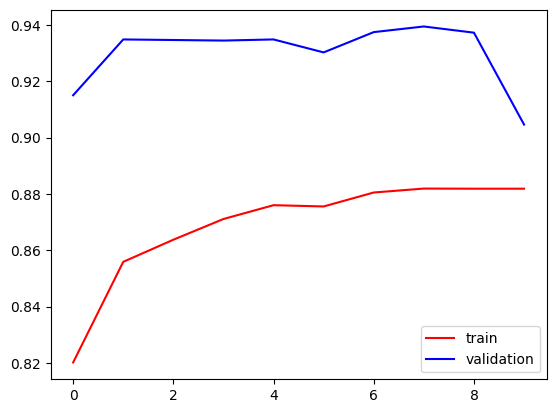

In [39]:
import matplotlib.pyplot as plt

plt.plot(history_2.history['accuracy'], color = 'red', label = 'train')
plt.plot(history_2.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/VGG16_feature_extraction_Data_Augmentation/accuracy")
plt.show()

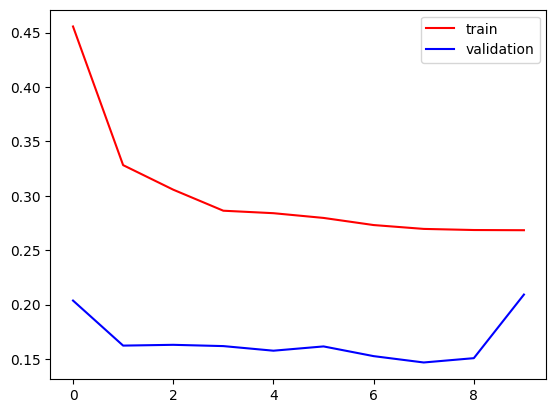

In [40]:
import matplotlib.pyplot as plt

plt.plot(history_2.history['loss'], color = 'red', label = 'train')
plt.plot(history_2.history['val_loss'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/VGG16_feature_extraction_Data_Augmentation/loss")
plt.show()

In [41]:
model.save("VGG16_feature_extraction_Data_Augmentation/model.keras")

### Approach 2) Fine Tunning

In [42]:
conv_base.trainable = True
 
set_trainable = False

for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False
        
for layer in conv_base.layers:
    print(layer.name, layer.trainable)

input_layer_3 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_pool True


In [43]:
model = Sequential()

# Rescaling layer
model.add(Rescaling(1./255, input_shape=(image_height, image_width, 3)))

# Data Augmentation Layer
# model.add(data_augmentation)
model.add(RandomFlip("horizontal"))
model.add(RandomRotation(0.2))
model.add(RandomZoom(0.3))
model.add(RandomTranslation(height_factor=0, width_factor=0.2))
model.add(RandomContrast(0.2))

# VGG 16
model.add(conv_base)

# Fully Connected
model.add(Flatten())
model.add(Dense(256, activation = 'relu'))
model.add(Dense(1, activation = 'sigmoid'))

In [44]:
model.compile(optimizer = keras.optimizers.RMSprop(learning_rate = 0.00001),
             loss = 'binary_crossentropy',
             metrics = ['accuracy'])

In [45]:
epochs=10
history_3 = model.fit(
  train_ds,
  validation_data=validation_ds,
  epochs=epochs
)

Epoch 1/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 34:41 3s/step - accuracy: 0.4375 - loss: 0.7791

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 220ms/step - accuracy: 0.4453 - loss: 0.7702

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 217ms/step - accuracy: 0.4497 - loss: 0.7623

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.4661 - loss: 0.7499

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.4729 - loss: 0.7437

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.4774 - loss: 0.7383

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.4813 - loss: 0.7350

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.4841 - loss: 0.7320

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.4878 - loss: 0.7293

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.4897 - loss: 0.7272

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.4919 - loss: 0.7251

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.4934 - loss: 0.7233

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.4954 - loss: 0.7216

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.4980 - loss: 0.7198

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.5013 - loss: 0.7178

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.5046 - loss: 0.7158

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.5080 - loss: 0.7138

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.5114 - loss: 0.7118

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.5146 - loss: 0.7099

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.5177 - loss: 0.7081

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.5212 - loss: 0.7061

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.5243 - loss: 0.7043

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.5274 - loss: 0.7026

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.5306 - loss: 0.7008

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.5337 - loss: 0.6990

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.5369 - loss: 0.6971

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.5399 - loss: 0.6953

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.5428 - loss: 0.6936

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.5457 - loss: 0.6919

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.5486 - loss: 0.6901

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.5514 - loss: 0.6884

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.5543 - loss: 0.6867

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.5570 - loss: 0.6851

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.5595 - loss: 0.6836

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.5620 - loss: 0.6820

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.5645 - loss: 0.6804

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 219ms/step - accuracy: 0.5668 - loss: 0.6788

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 219ms/step - accuracy: 0.5690 - loss: 0.6773

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 219ms/step - accuracy: 0.5712 - loss: 0.6759

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 219ms/step - accuracy: 0.5733 - loss: 0.6745

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.5754 - loss: 0.6730

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.5775 - loss: 0.6716

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.5795 - loss: 0.6701

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.5816 - loss: 0.6686

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.5836 - loss: 0.6671

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.5856 - loss: 0.6657

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.5874 - loss: 0.6643

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.5891 - loss: 0.6630

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.5909 - loss: 0.6616

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.5926 - loss: 0.6603

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.5944 - loss: 0.6589

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.5961 - loss: 0.6576

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.5977 - loss: 0.6563

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.5993 - loss: 0.6549

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.6008 - loss: 0.6537

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.6023 - loss: 0.6524

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.6038 - loss: 0.6512

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.6052 - loss: 0.6501

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.6066 - loss: 0.6489

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.6079 - loss: 0.6477

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.6093 - loss: 0.6466

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.6106 - loss: 0.6455

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.6119 - loss: 0.6443

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.6132 - loss: 0.6432

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.6145 - loss: 0.6421

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.6158 - loss: 0.6410

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.6170 - loss: 0.6399

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.6182 - loss: 0.6388

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.6194 - loss: 0.6378

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 221ms/step - accuracy: 0.6206 - loss: 0.6368

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 221ms/step - accuracy: 0.6218 - loss: 0.6358

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.6229 - loss: 0.6347

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.6241 - loss: 0.6337

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.6251 - loss: 0.6328

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.6262 - loss: 0.6318

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.6273 - loss: 0.6309

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.6283 - loss: 0.6300

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.6293 - loss: 0.6290

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.6303 - loss: 0.6281

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.6313 - loss: 0.6272

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.6323 - loss: 0.6263

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.6333 - loss: 0.6254

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.6342 - loss: 0.6245

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.6352 - loss: 0.6236

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.6361 - loss: 0.6227

 86/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 222ms/step - accuracy: 0.6370 - loss: 0.6218

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.6379 - loss: 0.6209

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.6388 - loss: 0.6200

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.6397 - loss: 0.6191

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.6406 - loss: 0.6182

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.6415 - loss: 0.6173

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.6424 - loss: 0.6164

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.6432 - loss: 0.6156

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.6441 - loss: 0.6147

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.6450 - loss: 0.6139

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.6458 - loss: 0.6130

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.6466 - loss: 0.6122

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.6474 - loss: 0.6114

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.6482 - loss: 0.6106

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.6490 - loss: 0.6098

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.6498 - loss: 0.6090

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.6505 - loss: 0.6082

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.6513 - loss: 0.6075

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.6520 - loss: 0.6067

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.6527 - loss: 0.6060

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.6534 - loss: 0.6053

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.6541 - loss: 0.6046

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.6549 - loss: 0.6038

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.6556 - loss: 0.6031

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.6563 - loss: 0.6024

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.6569 - loss: 0.6017

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.6576 - loss: 0.6009

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.6583 - loss: 0.6002

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.6589 - loss: 0.5995

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.6596 - loss: 0.5988

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.6602 - loss: 0.5982

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.6609 - loss: 0.5975

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.6615 - loss: 0.5968

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.6622 - loss: 0.5961

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.6628 - loss: 0.5954

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.6634 - loss: 0.5947

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.6641 - loss: 0.5941

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.6647 - loss: 0.5934

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.6653 - loss: 0.5927

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.6659 - loss: 0.5920

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.6665 - loss: 0.5913

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.6671 - loss: 0.5907

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.6677 - loss: 0.5900

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.6683 - loss: 0.5894

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.6689 - loss: 0.5887

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.6695 - loss: 0.5880

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.6700 - loss: 0.5874

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.6706 - loss: 0.5867

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.6712 - loss: 0.5861

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - accuracy: 0.6718 - loss: 0.5854

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - accuracy: 0.6723 - loss: 0.5848

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - accuracy: 0.6729 - loss: 0.5842

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.6734 - loss: 0.5835

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.6740 - loss: 0.5829

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.6745 - loss: 0.5823

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.6750 - loss: 0.5817

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.6756 - loss: 0.5811

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.6761 - loss: 0.5804

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.6766 - loss: 0.5798

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.6771 - loss: 0.5792

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.6776 - loss: 0.5786

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.6781 - loss: 0.5780

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.6786 - loss: 0.5774

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.6791 - loss: 0.5768

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.6796 - loss: 0.5762

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.6801 - loss: 0.5757

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.6806 - loss: 0.5751

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.6811 - loss: 0.5745

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.6816 - loss: 0.5739

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.6821 - loss: 0.5734

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.6825 - loss: 0.5728

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.6830 - loss: 0.5722

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.6835 - loss: 0.5716

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.6840 - loss: 0.5711

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.6844 - loss: 0.5705

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.6849 - loss: 0.5699

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.6853 - loss: 0.5693

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.6858 - loss: 0.5688

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.6863 - loss: 0.5682

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.6867 - loss: 0.5677

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.6872 - loss: 0.5671

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.6876 - loss: 0.5666

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.6881 - loss: 0.5660

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.6885 - loss: 0.5654

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.6890 - loss: 0.5649

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.6894 - loss: 0.5643

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.6899 - loss: 0.5638

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.6903 - loss: 0.5632

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.6907 - loss: 0.5626

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.6912 - loss: 0.5621

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.6916 - loss: 0.5615

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.6921 - loss: 0.5610

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.6925 - loss: 0.5604

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.6929 - loss: 0.5599

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.6934 - loss: 0.5594

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.6938 - loss: 0.5588

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.6942 - loss: 0.5583

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.6947 - loss: 0.5578

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.6951 - loss: 0.5573

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.6955 - loss: 0.5567

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.6959 - loss: 0.5562

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.6963 - loss: 0.5557

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.6967 - loss: 0.5552

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.6971 - loss: 0.5547

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.6975 - loss: 0.5542

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.6979 - loss: 0.5537

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.6983 - loss: 0.5532

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.6987 - loss: 0.5527

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.6991 - loss: 0.5522

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.6995 - loss: 0.5517

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.6999 - loss: 0.5512

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.7003 - loss: 0.5507

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.7007 - loss: 0.5502

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.7011 - loss: 0.5497

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.7014 - loss: 0.5493

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.7018 - loss: 0.5488

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.7022 - loss: 0.5483

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.7026 - loss: 0.5479

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.7029 - loss: 0.5474

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.7033 - loss: 0.5469

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.7037 - loss: 0.5465

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.7040 - loss: 0.5460

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.7044 - loss: 0.5456

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.7047 - loss: 0.5451

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.7051 - loss: 0.5447

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.7055 - loss: 0.5442

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.7058 - loss: 0.5437

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.7062 - loss: 0.5433

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.7065 - loss: 0.5429

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.7069 - loss: 0.5424

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.7072 - loss: 0.5420

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.7076 - loss: 0.5415

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.7079 - loss: 0.5411

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.7082 - loss: 0.5406

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.7086 - loss: 0.5402

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.7089 - loss: 0.5398

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.7093 - loss: 0.5393

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.7096 - loss: 0.5389

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.7099 - loss: 0.5385

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.7103 - loss: 0.5380

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.7106 - loss: 0.5376

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.7109 - loss: 0.5372

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.7113 - loss: 0.5367

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.7116 - loss: 0.5363

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.7119 - loss: 0.5359

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.7123 - loss: 0.5354

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.7126 - loss: 0.5350

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.7129 - loss: 0.5346

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.7132 - loss: 0.5342

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.7135 - loss: 0.5338

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.7139 - loss: 0.5334

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.7142 - loss: 0.5329

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.7145 - loss: 0.5325

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.7148 - loss: 0.5321

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.7151 - loss: 0.5317

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.7154 - loss: 0.5313

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.7157 - loss: 0.5309

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.7160 - loss: 0.5305

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.7163 - loss: 0.5301

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.7166 - loss: 0.5297

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.7169 - loss: 0.5293

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.7172 - loss: 0.5289

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.7175 - loss: 0.5285

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.7178 - loss: 0.5281

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.7181 - loss: 0.5277

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.7184 - loss: 0.5273

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.7187 - loss: 0.5269

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.7190 - loss: 0.5265

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.7193 - loss: 0.5261

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.7196 - loss: 0.5257

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.7199 - loss: 0.5253

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.7202 - loss: 0.5249

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.7205 - loss: 0.5245

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.7208 - loss: 0.5242

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.7211 - loss: 0.5238

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.7214 - loss: 0.5234

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.7216 - loss: 0.5230

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.7219 - loss: 0.5226

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.7222 - loss: 0.5223

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.7225 - loss: 0.5219

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.7228 - loss: 0.5215

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.7230 - loss: 0.5212

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.7233 - loss: 0.5208

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.7236 - loss: 0.5204

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.7239 - loss: 0.5200

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.7241 - loss: 0.5197

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.7244 - loss: 0.5193

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.7247 - loss: 0.5190

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.7249 - loss: 0.5186

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.7252 - loss: 0.5182

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.7255 - loss: 0.5179

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.7257 - loss: 0.5175

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.7260 - loss: 0.5172

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.7263 - loss: 0.5168

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.7265 - loss: 0.5164

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.7268 - loss: 0.5161

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.7271 - loss: 0.5157

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.7273 - loss: 0.5154

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.7276 - loss: 0.5150

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.7278 - loss: 0.5147

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.7281 - loss: 0.5143

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.7283 - loss: 0.5140

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.7286 - loss: 0.5136

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.7288 - loss: 0.5133

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.7291 - loss: 0.5130

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.7293 - loss: 0.5126

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.7296 - loss: 0.5123

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.7298 - loss: 0.5119

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.7301 - loss: 0.5116

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.7303 - loss: 0.5112

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.7306 - loss: 0.5109

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.7308 - loss: 0.5106

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.7311 - loss: 0.5102

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.7313 - loss: 0.5099

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.7316 - loss: 0.5096

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.7318 - loss: 0.5092

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.7320 - loss: 0.5089

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.7323 - loss: 0.5086

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.7325 - loss: 0.5082

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.7328 - loss: 0.5079

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.7330 - loss: 0.5076

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.7332 - loss: 0.5073

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.7334 - loss: 0.5069

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.7337 - loss: 0.5066

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.7339 - loss: 0.5063

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.7341 - loss: 0.5060

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.7344 - loss: 0.5057

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.7346 - loss: 0.5053

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.7348 - loss: 0.5050

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.7350 - loss: 0.5047

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.7353 - loss: 0.5044

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.7355 - loss: 0.5041

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.7357 - loss: 0.5038

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.7359 - loss: 0.5035

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.7362 - loss: 0.5031

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.7364 - loss: 0.5028

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.7366 - loss: 0.5025

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.7368 - loss: 0.5022

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.7370 - loss: 0.5019

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.7373 - loss: 0.5016

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.7375 - loss: 0.5013

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.7377 - loss: 0.5010

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.7379 - loss: 0.5007

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.7381 - loss: 0.5004

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.7383 - loss: 0.5001

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.7385 - loss: 0.4999

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.7387 - loss: 0.4996

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.7390 - loss: 0.4993

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.7392 - loss: 0.4990

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.7394 - loss: 0.4987

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.7396 - loss: 0.4984

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.7398 - loss: 0.4981

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.7400 - loss: 0.4978

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.7402 - loss: 0.4975

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.7404 - loss: 0.4972

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.7406 - loss: 0.4969

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.7408 - loss: 0.4966

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.7410 - loss: 0.4964

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.7412 - loss: 0.4961

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.7414 - loss: 0.4958

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.7416 - loss: 0.4955

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.7418 - loss: 0.4952

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.7421 - loss: 0.4949

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.7423 - loss: 0.4946

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.7425 - loss: 0.4944

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.7427 - loss: 0.4941

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.7429 - loss: 0.4938

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.7431 - loss: 0.4935

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.7433 - loss: 0.4932

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.7435 - loss: 0.4930

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.7437 - loss: 0.4927

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.7439 - loss: 0.4924

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.7441 - loss: 0.4921

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.7442 - loss: 0.4918

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.7444 - loss: 0.4916 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.7446 - loss: 0.4913

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.7448 - loss: 0.4910

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.7450 - loss: 0.4907

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.7452 - loss: 0.4905

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.7454 - loss: 0.4902

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.7456 - loss: 0.4899

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.7458 - loss: 0.4897

368/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.7460 - loss: 0.4894

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.7462 - loss: 0.4891

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.7463 - loss: 0.4889

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.7465 - loss: 0.4886

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.7467 - loss: 0.4883

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.7469 - loss: 0.4881

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.7471 - loss: 0.4878

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.7473 - loss: 0.4876

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.7475 - loss: 0.4873

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.7476 - loss: 0.4871

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.7478 - loss: 0.4868

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.7480 - loss: 0.4865

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.7482 - loss: 0.4863

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.7484 - loss: 0.4860

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.7485 - loss: 0.4858

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - accuracy: 0.7487 - loss: 0.4855

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - accuracy: 0.7489 - loss: 0.4853

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - accuracy: 0.7491 - loss: 0.4850

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.7492 - loss: 0.4848

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.7494 - loss: 0.4845

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.7496 - loss: 0.4843

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.7498 - loss: 0.4840

390/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.7500 - loss: 0.4838

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.7501 - loss: 0.4835

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.7503 - loss: 0.4833

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.7505 - loss: 0.4830

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.7507 - loss: 0.4828

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.7508 - loss: 0.4825

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.7510 - loss: 0.4823

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.7512 - loss: 0.4820

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.7514 - loss: 0.4818

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.7515 - loss: 0.4815

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.7517 - loss: 0.4813

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.7519 - loss: 0.4811

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.7520 - loss: 0.4808

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.7522 - loss: 0.4806

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.7524 - loss: 0.4803

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.7525 - loss: 0.4801

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.7527 - loss: 0.4799

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.7529 - loss: 0.4796

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.7530 - loss: 0.4794

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.7532 - loss: 0.4791

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.7534 - loss: 0.4789

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.7535 - loss: 0.4786

412/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.7537 - loss: 0.4784

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.7539 - loss: 0.4782

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.7540 - loss: 0.4779

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.7542 - loss: 0.4777

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.7544 - loss: 0.4775

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.7545 - loss: 0.4772

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.7547 - loss: 0.4770

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.7549 - loss: 0.4768

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.7550 - loss: 0.4765

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.7552 - loss: 0.4763

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.7553 - loss: 0.4761

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.7555 - loss: 0.4758

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.7556 - loss: 0.4756

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.7558 - loss: 0.4754

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.7560 - loss: 0.4751

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.7561 - loss: 0.4749

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.7563 - loss: 0.4747

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.7564 - loss: 0.4744

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.7566 - loss: 0.4742

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.7567 - loss: 0.4740

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.7569 - loss: 0.4738

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.7570 - loss: 0.4735

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.7572 - loss: 0.4733

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.7574 - loss: 0.4731

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.7575 - loss: 0.4729

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.7577 - loss: 0.4726

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.7578 - loss: 0.4724

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.7580 - loss: 0.4722

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.7581 - loss: 0.4720

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.7583 - loss: 0.4718

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.7584 - loss: 0.4715

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.7586 - loss: 0.4713

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.7587 - loss: 0.4711

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.7589 - loss: 0.4709

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.7590 - loss: 0.4707

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.7591 - loss: 0.4705

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.7593 - loss: 0.4702

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.7594 - loss: 0.4700

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.7596 - loss: 0.4698

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.7597 - loss: 0.4696

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.7599 - loss: 0.4694

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.7600 - loss: 0.4692

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.7602 - loss: 0.4690

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.7603 - loss: 0.4687

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.7605 - loss: 0.4685

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.7606 - loss: 0.4683

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.7607 - loss: 0.4681

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.7609 - loss: 0.4679

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.7610 - loss: 0.4677

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.7612 - loss: 0.4675

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.7613 - loss: 0.4673

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.7615 - loss: 0.4671

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.7616 - loss: 0.4669

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.7618 - loss: 0.4666

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.7619 - loss: 0.4664

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.7620 - loss: 0.4662

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.7622 - loss: 0.4660

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.7623 - loss: 0.4658

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.7625 - loss: 0.4656

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.7626 - loss: 0.4654

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.7627 - loss: 0.4652

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.7629 - loss: 0.4650

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.7630 - loss: 0.4648

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.7631 - loss: 0.4646

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.7633 - loss: 0.4644

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.7634 - loss: 0.4642

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.7636 - loss: 0.4640

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.7637 - loss: 0.4638

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.7638 - loss: 0.4636

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.7640 - loss: 0.4634

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.7641 - loss: 0.4632

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.7642 - loss: 0.4630

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.7644 - loss: 0.4628

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.7645 - loss: 0.4626

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.7646 - loss: 0.4624

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.7648 - loss: 0.4622

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.7649 - loss: 0.4620

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.7650 - loss: 0.4618

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.7652 - loss: 0.4616

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.7653 - loss: 0.4614

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.7654 - loss: 0.4612

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.7656 - loss: 0.4610

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.7657 - loss: 0.4608

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.7658 - loss: 0.4606

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.7660 - loss: 0.4604

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.7661 - loss: 0.4602

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.7662 - loss: 0.4600

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.7664 - loss: 0.4598

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.7665 - loss: 0.4596

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.7666 - loss: 0.4594

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.7668 - loss: 0.4592

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.7669 - loss: 0.4591

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.7670 - loss: 0.4589

505/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.7672 - loss: 0.4587

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.7673 - loss: 0.4585

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.7674 - loss: 0.4583

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.7675 - loss: 0.4581

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.7677 - loss: 0.4579

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.7678 - loss: 0.4577

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.7679 - loss: 0.4575

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.7681 - loss: 0.4573

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.7682 - loss: 0.4571

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.7683 - loss: 0.4569

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.7684 - loss: 0.4568

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.7686 - loss: 0.4566

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.7687 - loss: 0.4564

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.7688 - loss: 0.4562

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.7689 - loss: 0.4560

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.7691 - loss: 0.4558

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.7692 - loss: 0.4556

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.7693 - loss: 0.4554

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.7694 - loss: 0.4553

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.7696 - loss: 0.4551

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.7697 - loss: 0.4549

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.7698 - loss: 0.4547

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.7699 - loss: 0.4545

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.7701 - loss: 0.4543

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.7702 - loss: 0.4542

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.7703 - loss: 0.4540

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.7704 - loss: 0.4538

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.7705 - loss: 0.4536

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.7707 - loss: 0.4534

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.7708 - loss: 0.4532

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.7709 - loss: 0.4531

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.7710 - loss: 0.4529

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.7712 - loss: 0.4527

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.7713 - loss: 0.4525

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.7714 - loss: 0.4523

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.7715 - loss: 0.4521

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.7716 - loss: 0.4520

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.7718 - loss: 0.4518

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.7719 - loss: 0.4516

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.7720 - loss: 0.4514

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.7721 - loss: 0.4512

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.7722 - loss: 0.4511

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.7724 - loss: 0.4509

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.7725 - loss: 0.4507

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.7726 - loss: 0.4505

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.7727 - loss: 0.4504

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.7728 - loss: 0.4502

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.7729 - loss: 0.4500

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.7731 - loss: 0.4498

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.7732 - loss: 0.4496

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.7733 - loss: 0.4495

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.7734 - loss: 0.4493

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.7735 - loss: 0.4491

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.7736 - loss: 0.4489

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.7738 - loss: 0.4488

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.7739 - loss: 0.4486

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.7740 - loss: 0.4484

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.7741 - loss: 0.4482

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.7742 - loss: 0.4481

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.7743 - loss: 0.4479

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.7744 - loss: 0.4477

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.7746 - loss: 0.4475

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.7747 - loss: 0.4474

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.7748 - loss: 0.4472

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.7749 - loss: 0.4470

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.7750 - loss: 0.4468

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.7751 - loss: 0.4467

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.7752 - loss: 0.4465

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.7753 - loss: 0.4463

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.7755 - loss: 0.4462

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.7756 - loss: 0.4460

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.7757 - loss: 0.4458

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.7758 - loss: 0.4456

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.7759 - loss: 0.4455

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.7760 - loss: 0.4453

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.7761 - loss: 0.4451

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.7762 - loss: 0.4450 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.7764 - loss: 0.4448

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.7765 - loss: 0.4446

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.7766 - loss: 0.4445

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.7767 - loss: 0.4443

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.7768 - loss: 0.4441

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.7769 - loss: 0.4439

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.7770 - loss: 0.4438

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.7771 - loss: 0.4436

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.7772 - loss: 0.4434

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.7773 - loss: 0.4433

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.7775 - loss: 0.4431

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.7776 - loss: 0.4429

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.7777 - loss: 0.4428

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.7778 - loss: 0.4426

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.7779 - loss: 0.4424

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.7780 - loss: 0.4423

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.7781 - loss: 0.4421

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.7782 - loss: 0.4419

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.7783 - loss: 0.4418

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.7784 - loss: 0.4416

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.7785 - loss: 0.4415

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.7787 - loss: 0.4413

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.7788 - loss: 0.4411

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.7789 - loss: 0.4410

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.7790 - loss: 0.4408

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.7791 - loss: 0.4406

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.7792 - loss: 0.4405

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.7793 - loss: 0.4403

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.7794 - loss: 0.4401

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.7795 - loss: 0.4400

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.7796 - loss: 0.4398

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.7797 - loss: 0.4397

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.7798 - loss: 0.4395

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.7799 - loss: 0.4393

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.7800 - loss: 0.4392

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.7801 - loss: 0.4390

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.7802 - loss: 0.4388

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.7803 - loss: 0.4387

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.7804 - loss: 0.4385

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.7806 - loss: 0.4384

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.7807 - loss: 0.4382

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.7808 - loss: 0.4380

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.7809 - loss: 0.4379

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.7810 - loss: 0.4377

625/625 ━━━━━━━━━━━━━━━━━━━━ 174s 274ms/step - accuracy: 0.7811 - loss: 0.4376 - val_accuracy: 0.9416 - val_loss: 0.1444


Epoch 2/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:10:25 30s/step - accuracy: 0.7812 - loss: 0.3982

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.8125 - loss: 0.3625 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - accuracy: 0.8264 - loss: 0.3487

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - accuracy: 0.8405 - loss: 0.3316

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.8536 - loss: 0.3139

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.8615 - loss: 0.3022

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.8679 - loss: 0.2921

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.8742 - loss: 0.2819

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.8789 - loss: 0.2731

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.8829 - loss: 0.2672

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.8863 - loss: 0.2618

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.8893 - loss: 0.2570

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.8917 - loss: 0.2540

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.8934 - loss: 0.2523

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.8951 - loss: 0.2507

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.8965 - loss: 0.2495

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.8975 - loss: 0.2487

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.8983 - loss: 0.2479

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.8990 - loss: 0.2469

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.8997 - loss: 0.2460

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9003 - loss: 0.2450

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9009 - loss: 0.2438

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9015 - loss: 0.2426

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9020 - loss: 0.2416

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9023 - loss: 0.2410

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9027 - loss: 0.2404

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9030 - loss: 0.2398

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9034 - loss: 0.2392

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9037 - loss: 0.2385

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9040 - loss: 0.2379

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9043 - loss: 0.2373

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9045 - loss: 0.2367

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9047 - loss: 0.2362

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9049 - loss: 0.2355

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9051 - loss: 0.2349

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9052 - loss: 0.2344

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9054 - loss: 0.2339

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9055 - loss: 0.2334

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9056 - loss: 0.2330

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9058 - loss: 0.2324

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9060 - loss: 0.2319

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9061 - loss: 0.2315

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9063 - loss: 0.2311

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9064 - loss: 0.2307

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9065 - loss: 0.2303

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9067 - loss: 0.2300

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9068 - loss: 0.2296

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9069 - loss: 0.2294

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.9069 - loss: 0.2292

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.9069 - loss: 0.2290

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9070 - loss: 0.2288

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9071 - loss: 0.2286

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9071 - loss: 0.2284

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9072 - loss: 0.2282

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9072 - loss: 0.2281

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9073 - loss: 0.2280

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9073 - loss: 0.2279

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9074 - loss: 0.2279

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9074 - loss: 0.2278

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9075 - loss: 0.2277

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9075 - loss: 0.2276

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9076 - loss: 0.2275

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9077 - loss: 0.2273

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9077 - loss: 0.2272

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9078 - loss: 0.2270

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9079 - loss: 0.2269

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9080 - loss: 0.2268

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9081 - loss: 0.2266

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9082 - loss: 0.2265

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 221ms/step - accuracy: 0.9082 - loss: 0.2264

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9083 - loss: 0.2263

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9084 - loss: 0.2262

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9084 - loss: 0.2261

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9085 - loss: 0.2261

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9085 - loss: 0.2260

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9085 - loss: 0.2260

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9086 - loss: 0.2260

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9086 - loss: 0.2259

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9086 - loss: 0.2259

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9086 - loss: 0.2259

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9086 - loss: 0.2259

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9087 - loss: 0.2259

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9087 - loss: 0.2258

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9087 - loss: 0.2258

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9087 - loss: 0.2258

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9087 - loss: 0.2258

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9087 - loss: 0.2257

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9088 - loss: 0.2257

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9088 - loss: 0.2257

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9088 - loss: 0.2257

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9088 - loss: 0.2256

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9088 - loss: 0.2257

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9088 - loss: 0.2257

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9088 - loss: 0.2257

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9088 - loss: 0.2257

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9087 - loss: 0.2258

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9087 - loss: 0.2258

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9087 - loss: 0.2259

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9087 - loss: 0.2259

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9087 - loss: 0.2259

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9087 - loss: 0.2260

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9086 - loss: 0.2260

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9086 - loss: 0.2261

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9086 - loss: 0.2261

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9086 - loss: 0.2262

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9086 - loss: 0.2262

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9086 - loss: 0.2263

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9086 - loss: 0.2263

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9085 - loss: 0.2263

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9085 - loss: 0.2264

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9085 - loss: 0.2265

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9085 - loss: 0.2265

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9084 - loss: 0.2266

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9084 - loss: 0.2266

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9084 - loss: 0.2267

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9084 - loss: 0.2268

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9083 - loss: 0.2268

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9083 - loss: 0.2269

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9083 - loss: 0.2269

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9082 - loss: 0.2270

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9082 - loss: 0.2271

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9082 - loss: 0.2271

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9081 - loss: 0.2272

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9081 - loss: 0.2272

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9081 - loss: 0.2273

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9080 - loss: 0.2273

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9080 - loss: 0.2274

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9079 - loss: 0.2275

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9079 - loss: 0.2275

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - accuracy: 0.9078 - loss: 0.2276

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - accuracy: 0.9078 - loss: 0.2277

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9077 - loss: 0.2277

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9077 - loss: 0.2278

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9077 - loss: 0.2278

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9076 - loss: 0.2279

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9076 - loss: 0.2280

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9076 - loss: 0.2280

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9075 - loss: 0.2281

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9075 - loss: 0.2281

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - accuracy: 0.9075 - loss: 0.2282

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - accuracy: 0.9074 - loss: 0.2282

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9074 - loss: 0.2283

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9074 - loss: 0.2283

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9073 - loss: 0.2284

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9073 - loss: 0.2284

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9073 - loss: 0.2285

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9073 - loss: 0.2285

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9072 - loss: 0.2285

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9072 - loss: 0.2286

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9072 - loss: 0.2286

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9071 - loss: 0.2287

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9071 - loss: 0.2287

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9071 - loss: 0.2288

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9070 - loss: 0.2288

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9070 - loss: 0.2289

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9070 - loss: 0.2289

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9069 - loss: 0.2290

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9069 - loss: 0.2290

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9069 - loss: 0.2291

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9069 - loss: 0.2291

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9068 - loss: 0.2292

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9068 - loss: 0.2292

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9068 - loss: 0.2293

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9068 - loss: 0.2293

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9067 - loss: 0.2293

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9067 - loss: 0.2294

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9067 - loss: 0.2294

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9067 - loss: 0.2294

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9067 - loss: 0.2294

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9066 - loss: 0.2295

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9066 - loss: 0.2295

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9066 - loss: 0.2295

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9066 - loss: 0.2296

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9066 - loss: 0.2296

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9065 - loss: 0.2296

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9065 - loss: 0.2296

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9065 - loss: 0.2297

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9065 - loss: 0.2297

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9065 - loss: 0.2298

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9064 - loss: 0.2298

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9064 - loss: 0.2298

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9064 - loss: 0.2299

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9064 - loss: 0.2299

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9064 - loss: 0.2299

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9064 - loss: 0.2299

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9064 - loss: 0.2300

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9064 - loss: 0.2300

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9063 - loss: 0.2300

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9063 - loss: 0.2300

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9063 - loss: 0.2300

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9063 - loss: 0.2301

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9063 - loss: 0.2301

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9063 - loss: 0.2301

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9063 - loss: 0.2301

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9063 - loss: 0.2301

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9063 - loss: 0.2301

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9063 - loss: 0.2301

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9063 - loss: 0.2301

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9063 - loss: 0.2302

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9063 - loss: 0.2302

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9063 - loss: 0.2302

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9063 - loss: 0.2302

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9063 - loss: 0.2302

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9063 - loss: 0.2302

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9063 - loss: 0.2302

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9063 - loss: 0.2302

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9063 - loss: 0.2302

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9063 - loss: 0.2302

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9063 - loss: 0.2302

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9063 - loss: 0.2302

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9063 - loss: 0.2302

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9063 - loss: 0.2303

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9063 - loss: 0.2303

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9063 - loss: 0.2303

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9063 - loss: 0.2303

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9063 - loss: 0.2303

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9063 - loss: 0.2303

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9063 - loss: 0.2303

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9063 - loss: 0.2303

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9063 - loss: 0.2303

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9063 - loss: 0.2303

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9063 - loss: 0.2303

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9063 - loss: 0.2303

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9063 - loss: 0.2303

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9063 - loss: 0.2303

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9063 - loss: 0.2303

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9063 - loss: 0.2303

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9063 - loss: 0.2303

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9063 - loss: 0.2303

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9063 - loss: 0.2303

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9063 - loss: 0.2303

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9063 - loss: 0.2303

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9063 - loss: 0.2303

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9063 - loss: 0.2303

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9063 - loss: 0.2303

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9064 - loss: 0.2303

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9064 - loss: 0.2302

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9064 - loss: 0.2302

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9064 - loss: 0.2302

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9064 - loss: 0.2302

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9064 - loss: 0.2302

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9064 - loss: 0.2302

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9064 - loss: 0.2302

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9064 - loss: 0.2302

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9064 - loss: 0.2302

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9064 - loss: 0.2302

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9064 - loss: 0.2302

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9064 - loss: 0.2302

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9064 - loss: 0.2302

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9064 - loss: 0.2302

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9064 - loss: 0.2302

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9064 - loss: 0.2302

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9064 - loss: 0.2302

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9064 - loss: 0.2302

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 227ms/step - accuracy: 0.9064 - loss: 0.2301

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9064 - loss: 0.2301

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9064 - loss: 0.2301

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9064 - loss: 0.2301

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9064 - loss: 0.2301

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9064 - loss: 0.2301

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9064 - loss: 0.2301

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9064 - loss: 0.2301

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9064 - loss: 0.2301

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9064 - loss: 0.2301

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9064 - loss: 0.2301

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9064 - loss: 0.2301

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9064 - loss: 0.2301

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9064 - loss: 0.2300

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9064 - loss: 0.2300

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9064 - loss: 0.2300

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9064 - loss: 0.2300

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9064 - loss: 0.2300

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9064 - loss: 0.2300

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9064 - loss: 0.2300

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9064 - loss: 0.2300

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9064 - loss: 0.2300

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9064 - loss: 0.2300

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9064 - loss: 0.2300

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9064 - loss: 0.2300

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9064 - loss: 0.2300

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9064 - loss: 0.2300

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9064 - loss: 0.2300

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9064 - loss: 0.2300

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9064 - loss: 0.2300

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9064 - loss: 0.2299

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9064 - loss: 0.2299

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9064 - loss: 0.2299

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9065 - loss: 0.2299

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9065 - loss: 0.2299

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9065 - loss: 0.2299

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9065 - loss: 0.2299

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9065 - loss: 0.2299

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9065 - loss: 0.2299

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9065 - loss: 0.2298

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9065 - loss: 0.2298

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9065 - loss: 0.2298

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9065 - loss: 0.2298

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9065 - loss: 0.2298

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9065 - loss: 0.2298

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9065 - loss: 0.2298

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9065 - loss: 0.2298

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9065 - loss: 0.2298

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9065 - loss: 0.2298

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9065 - loss: 0.2298

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9065 - loss: 0.2298

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9065 - loss: 0.2297

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9065 - loss: 0.2297

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9065 - loss: 0.2297

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9065 - loss: 0.2297

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9065 - loss: 0.2297

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9065 - loss: 0.2297

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9065 - loss: 0.2297

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9065 - loss: 0.2297

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9065 - loss: 0.2297

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9065 - loss: 0.2297

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9065 - loss: 0.2296

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9065 - loss: 0.2296

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9065 - loss: 0.2296

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9065 - loss: 0.2296

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9065 - loss: 0.2296

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9065 - loss: 0.2296

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9065 - loss: 0.2296

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9065 - loss: 0.2296

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9065 - loss: 0.2295

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9065 - loss: 0.2295

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9065 - loss: 0.2295

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9065 - loss: 0.2295

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9065 - loss: 0.2295

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9065 - loss: 0.2295

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9065 - loss: 0.2295

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9065 - loss: 0.2295

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9065 - loss: 0.2294

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9065 - loss: 0.2294

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9065 - loss: 0.2294

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9065 - loss: 0.2294

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9065 - loss: 0.2294

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9065 - loss: 0.2294

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9065 - loss: 0.2294

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9065 - loss: 0.2294

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9065 - loss: 0.2294

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9065 - loss: 0.2293

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9065 - loss: 0.2293

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9065 - loss: 0.2293

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9065 - loss: 0.2293

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9065 - loss: 0.2293

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9065 - loss: 0.2293

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9065 - loss: 0.2293

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9065 - loss: 0.2293

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9065 - loss: 0.2293

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9065 - loss: 0.2292

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9065 - loss: 0.2292

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9065 - loss: 0.2292

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9065 - loss: 0.2292

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9066 - loss: 0.2292

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9066 - loss: 0.2292

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9066 - loss: 0.2292

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9066 - loss: 0.2292

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9066 - loss: 0.2292

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9066 - loss: 0.2291

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9066 - loss: 0.2291 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9066 - loss: 0.2291

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9066 - loss: 0.2291

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9066 - loss: 0.2291

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9066 - loss: 0.2291

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9066 - loss: 0.2291

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9066 - loss: 0.2291

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9066 - loss: 0.2291

368/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9066 - loss: 0.2291

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9066 - loss: 0.2290

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9066 - loss: 0.2290

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9066 - loss: 0.2290

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9066 - loss: 0.2290

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9066 - loss: 0.2290

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9066 - loss: 0.2290

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9066 - loss: 0.2290

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9066 - loss: 0.2290

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9066 - loss: 0.2290

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9066 - loss: 0.2290

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9066 - loss: 0.2290

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9066 - loss: 0.2290

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9066 - loss: 0.2289

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9066 - loss: 0.2289

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9066 - loss: 0.2289

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9066 - loss: 0.2289

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9066 - loss: 0.2289

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9066 - loss: 0.2289

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9066 - loss: 0.2289

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9066 - loss: 0.2289

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9066 - loss: 0.2289

390/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9067 - loss: 0.2288

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9067 - loss: 0.2288

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9067 - loss: 0.2288

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9067 - loss: 0.2288

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9067 - loss: 0.2288

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9067 - loss: 0.2288

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9067 - loss: 0.2288

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9067 - loss: 0.2287

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9067 - loss: 0.2287

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9067 - loss: 0.2287

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9067 - loss: 0.2287

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9067 - loss: 0.2287

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9067 - loss: 0.2287

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9067 - loss: 0.2286

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9067 - loss: 0.2286

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9067 - loss: 0.2286

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9067 - loss: 0.2286

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9067 - loss: 0.2286

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9067 - loss: 0.2286

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9068 - loss: 0.2286

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9068 - loss: 0.2285

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9068 - loss: 0.2285

412/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9068 - loss: 0.2285

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9068 - loss: 0.2285

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9068 - loss: 0.2285

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9068 - loss: 0.2285

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9068 - loss: 0.2284

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9068 - loss: 0.2284

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9068 - loss: 0.2284

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9068 - loss: 0.2284

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9068 - loss: 0.2284

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9068 - loss: 0.2283

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9068 - loss: 0.2283

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9068 - loss: 0.2283

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9068 - loss: 0.2283

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9068 - loss: 0.2283

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9068 - loss: 0.2283

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9069 - loss: 0.2282

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9069 - loss: 0.2282

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9069 - loss: 0.2282

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9069 - loss: 0.2282

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9069 - loss: 0.2282

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9069 - loss: 0.2282

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9069 - loss: 0.2282

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9069 - loss: 0.2281

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9069 - loss: 0.2281

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9069 - loss: 0.2281

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9069 - loss: 0.2281

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9069 - loss: 0.2281

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9069 - loss: 0.2281

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9069 - loss: 0.2281

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9069 - loss: 0.2280

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9069 - loss: 0.2280

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9069 - loss: 0.2280

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9069 - loss: 0.2280

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9069 - loss: 0.2280

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9069 - loss: 0.2280

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9069 - loss: 0.2280

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9069 - loss: 0.2279

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9070 - loss: 0.2279

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9070 - loss: 0.2279

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9070 - loss: 0.2279

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9070 - loss: 0.2279

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9070 - loss: 0.2279

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9070 - loss: 0.2278

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9070 - loss: 0.2278

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9070 - loss: 0.2278

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9070 - loss: 0.2278

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9070 - loss: 0.2278

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9070 - loss: 0.2278

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9070 - loss: 0.2277

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9070 - loss: 0.2277

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9070 - loss: 0.2277

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9070 - loss: 0.2277

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9070 - loss: 0.2277

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9070 - loss: 0.2277

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9070 - loss: 0.2277

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9070 - loss: 0.2276

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9070 - loss: 0.2276

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9070 - loss: 0.2276

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9070 - loss: 0.2276

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9071 - loss: 0.2276

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9071 - loss: 0.2276

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9071 - loss: 0.2275

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9071 - loss: 0.2275

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9071 - loss: 0.2275

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9071 - loss: 0.2275

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9071 - loss: 0.2275

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9071 - loss: 0.2275

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9071 - loss: 0.2275

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9071 - loss: 0.2274

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9071 - loss: 0.2274

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9071 - loss: 0.2274

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9071 - loss: 0.2274

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9071 - loss: 0.2274

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9071 - loss: 0.2274

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9071 - loss: 0.2274

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9071 - loss: 0.2273

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9071 - loss: 0.2273

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9071 - loss: 0.2273

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9071 - loss: 0.2273

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9071 - loss: 0.2273

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9071 - loss: 0.2273

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9071 - loss: 0.2273

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9071 - loss: 0.2272

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9071 - loss: 0.2272

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9071 - loss: 0.2272

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9072 - loss: 0.2272

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9072 - loss: 0.2272

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9072 - loss: 0.2272

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9072 - loss: 0.2272

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9072 - loss: 0.2271

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9072 - loss: 0.2271

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9072 - loss: 0.2271

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9072 - loss: 0.2271

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9072 - loss: 0.2271

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9072 - loss: 0.2271

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9072 - loss: 0.2271

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9072 - loss: 0.2270

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9072 - loss: 0.2270

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9072 - loss: 0.2270

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9072 - loss: 0.2270

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9072 - loss: 0.2270

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9072 - loss: 0.2270

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9072 - loss: 0.2270

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9072 - loss: 0.2270

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9072 - loss: 0.2269

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9072 - loss: 0.2269

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9072 - loss: 0.2269

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9072 - loss: 0.2269

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9072 - loss: 0.2269

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9072 - loss: 0.2269

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9072 - loss: 0.2269

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9072 - loss: 0.2269

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9072 - loss: 0.2268

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9072 - loss: 0.2268

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9072 - loss: 0.2268

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9072 - loss: 0.2268

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9073 - loss: 0.2268

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9073 - loss: 0.2268

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9073 - loss: 0.2268

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9073 - loss: 0.2267

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9073 - loss: 0.2267

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9073 - loss: 0.2267

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9073 - loss: 0.2267

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9073 - loss: 0.2267

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9073 - loss: 0.2267

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9073 - loss: 0.2267

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9073 - loss: 0.2266

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9073 - loss: 0.2266

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9073 - loss: 0.2266

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9073 - loss: 0.2266

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9073 - loss: 0.2266

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9073 - loss: 0.2266

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9073 - loss: 0.2266

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9073 - loss: 0.2265

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9073 - loss: 0.2265

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9073 - loss: 0.2265

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9073 - loss: 0.2265

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9073 - loss: 0.2265

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9073 - loss: 0.2265

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9073 - loss: 0.2264

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9073 - loss: 0.2264

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9073 - loss: 0.2264

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9073 - loss: 0.2264

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9074 - loss: 0.2264

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9074 - loss: 0.2264

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9074 - loss: 0.2263

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9074 - loss: 0.2263

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9074 - loss: 0.2263

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9074 - loss: 0.2263

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9074 - loss: 0.2263

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9074 - loss: 0.2263

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9074 - loss: 0.2263

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9074 - loss: 0.2262

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9074 - loss: 0.2262

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9074 - loss: 0.2262

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9074 - loss: 0.2262

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9074 - loss: 0.2262

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9074 - loss: 0.2262

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9074 - loss: 0.2261

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9074 - loss: 0.2261

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9074 - loss: 0.2261

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9074 - loss: 0.2261

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9074 - loss: 0.2261

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9074 - loss: 0.2261

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9074 - loss: 0.2261

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9074 - loss: 0.2260

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9074 - loss: 0.2260

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9074 - loss: 0.2260

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9074 - loss: 0.2260

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9075 - loss: 0.2260 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9075 - loss: 0.2260

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9075 - loss: 0.2259

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9075 - loss: 0.2259

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9075 - loss: 0.2259

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9075 - loss: 0.2259

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9075 - loss: 0.2259

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9075 - loss: 0.2259

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9075 - loss: 0.2258

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9075 - loss: 0.2258

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9075 - loss: 0.2258

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9075 - loss: 0.2258

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9075 - loss: 0.2258

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9075 - loss: 0.2258

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9075 - loss: 0.2258

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9075 - loss: 0.2257

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9075 - loss: 0.2257

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9075 - loss: 0.2257

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9075 - loss: 0.2257

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9075 - loss: 0.2257

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9075 - loss: 0.2257

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9075 - loss: 0.2256

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9075 - loss: 0.2256

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9075 - loss: 0.2256

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9075 - loss: 0.2256

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9075 - loss: 0.2256

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9075 - loss: 0.2256

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9075 - loss: 0.2255

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9076 - loss: 0.2255

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9076 - loss: 0.2255

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9076 - loss: 0.2255

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9076 - loss: 0.2255

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9076 - loss: 0.2255

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9076 - loss: 0.2254

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9076 - loss: 0.2254

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9076 - loss: 0.2254

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9076 - loss: 0.2254

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9076 - loss: 0.2254

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9076 - loss: 0.2254

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9076 - loss: 0.2253

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9076 - loss: 0.2253

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9076 - loss: 0.2253

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9076 - loss: 0.2253

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9076 - loss: 0.2253

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9076 - loss: 0.2253

625/625 ━━━━━━━━━━━━━━━━━━━━ 201s 274ms/step - accuracy: 0.9076 - loss: 0.2252 - val_accuracy: 0.9602 - val_loss: 0.1005


Epoch 3/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:22:56 31s/step - accuracy: 0.8750 - loss: 0.2744

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - accuracy: 0.8984 - loss: 0.2363 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 214ms/step - accuracy: 0.8976 - loss: 0.2388

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.8997 - loss: 0.2331

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9010 - loss: 0.2303

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.9045 - loss: 0.2253

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.9073 - loss: 0.2217

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.9091 - loss: 0.2200

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9111 - loss: 0.2183

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9128 - loss: 0.2166

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9140 - loss: 0.2154

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9140 - loss: 0.2151

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9140 - loss: 0.2147

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9139 - loss: 0.2150

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9138 - loss: 0.2151

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9138 - loss: 0.2150

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9140 - loss: 0.2146

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9143 - loss: 0.2140

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9146 - loss: 0.2132

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9151 - loss: 0.2125

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9155 - loss: 0.2117

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9160 - loss: 0.2109

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9164 - loss: 0.2102

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9166 - loss: 0.2101

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9168 - loss: 0.2100

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9170 - loss: 0.2100

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9172 - loss: 0.2098

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9176 - loss: 0.2096

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9179 - loss: 0.2091

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9183 - loss: 0.2088

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9186 - loss: 0.2086

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9189 - loss: 0.2083

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9193 - loss: 0.2080

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9196 - loss: 0.2077

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9199 - loss: 0.2074

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9202 - loss: 0.2071

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9206 - loss: 0.2068

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9208 - loss: 0.2065

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - accuracy: 0.9211 - loss: 0.2062

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - accuracy: 0.9214 - loss: 0.2060

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9216 - loss: 0.2056

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9219 - loss: 0.2054

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9221 - loss: 0.2051

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9223 - loss: 0.2049

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9224 - loss: 0.2047

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9226 - loss: 0.2045

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9227 - loss: 0.2043

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9229 - loss: 0.2041

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9230 - loss: 0.2038

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9231 - loss: 0.2036

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9232 - loss: 0.2034

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9233 - loss: 0.2032

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9234 - loss: 0.2030

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9235 - loss: 0.2028

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9235 - loss: 0.2027

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9236 - loss: 0.2025

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9236 - loss: 0.2024

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9237 - loss: 0.2022

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9237 - loss: 0.2021

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9238 - loss: 0.2019

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9238 - loss: 0.2017

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9239 - loss: 0.2015

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9239 - loss: 0.2013

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9240 - loss: 0.2011

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9240 - loss: 0.2010

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9240 - loss: 0.2008

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9240 - loss: 0.2007

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9241 - loss: 0.2006

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9241 - loss: 0.2005

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9241 - loss: 0.2004

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9241 - loss: 0.2003

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9242 - loss: 0.2002

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9242 - loss: 0.2001

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9242 - loss: 0.1999

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9243 - loss: 0.1998

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9243 - loss: 0.1997

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9243 - loss: 0.1996

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9243 - loss: 0.1995

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9243 - loss: 0.1995

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9243 - loss: 0.1994

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9243 - loss: 0.1994

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9243 - loss: 0.1994

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9242 - loss: 0.1993

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9242 - loss: 0.1994

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9241 - loss: 0.1994

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9241 - loss: 0.1994

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9240 - loss: 0.1995

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9240 - loss: 0.1995

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9239 - loss: 0.1995

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9239 - loss: 0.1995

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9238 - loss: 0.1995

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9238 - loss: 0.1995

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9237 - loss: 0.1995

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9237 - loss: 0.1995

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9236 - loss: 0.1995

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9236 - loss: 0.1995

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9236 - loss: 0.1995

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9235 - loss: 0.1996

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9235 - loss: 0.1996

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9234 - loss: 0.1996

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9234 - loss: 0.1996

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9234 - loss: 0.1996

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9233 - loss: 0.1996

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9233 - loss: 0.1996

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9233 - loss: 0.1996

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9232 - loss: 0.1996

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9232 - loss: 0.1996

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9232 - loss: 0.1996

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9231 - loss: 0.1996

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9231 - loss: 0.1996

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9230 - loss: 0.1996

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9230 - loss: 0.1996

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9230 - loss: 0.1996

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9229 - loss: 0.1997

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9229 - loss: 0.1997

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9229 - loss: 0.1997

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9229 - loss: 0.1996

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9228 - loss: 0.1996

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9228 - loss: 0.1996

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9228 - loss: 0.1996

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9228 - loss: 0.1996

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9228 - loss: 0.1996

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9228 - loss: 0.1995

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9228 - loss: 0.1995

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9227 - loss: 0.1995

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9227 - loss: 0.1994

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9227 - loss: 0.1994

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9227 - loss: 0.1994

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9227 - loss: 0.1994

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9227 - loss: 0.1993

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9227 - loss: 0.1993

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9227 - loss: 0.1992

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9227 - loss: 0.1992

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9227 - loss: 0.1991

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9227 - loss: 0.1991

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9227 - loss: 0.1991

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9226 - loss: 0.1990

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9226 - loss: 0.1990

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9226 - loss: 0.1990

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9226 - loss: 0.1990

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9226 - loss: 0.1990

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9226 - loss: 0.1989

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9225 - loss: 0.1989

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9225 - loss: 0.1989

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9225 - loss: 0.1989

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9225 - loss: 0.1989

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9225 - loss: 0.1988

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9224 - loss: 0.1988

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9224 - loss: 0.1988

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9224 - loss: 0.1988

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9224 - loss: 0.1987

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9224 - loss: 0.1987

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9223 - loss: 0.1987

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9223 - loss: 0.1987

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9223 - loss: 0.1987

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9223 - loss: 0.1986

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9223 - loss: 0.1986

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9222 - loss: 0.1986

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9222 - loss: 0.1986

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9222 - loss: 0.1986

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9222 - loss: 0.1986

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9222 - loss: 0.1986

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9221 - loss: 0.1986

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9221 - loss: 0.1986

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9221 - loss: 0.1986

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9221 - loss: 0.1986

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9221 - loss: 0.1986

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9221 - loss: 0.1985

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9220 - loss: 0.1985

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9220 - loss: 0.1985

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9220 - loss: 0.1985

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9220 - loss: 0.1985

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9220 - loss: 0.1985

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9220 - loss: 0.1984

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9220 - loss: 0.1984

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9220 - loss: 0.1984

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9220 - loss: 0.1984

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9219 - loss: 0.1984

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9219 - loss: 0.1984

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9219 - loss: 0.1984

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9219 - loss: 0.1984

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9219 - loss: 0.1983

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9219 - loss: 0.1983

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9219 - loss: 0.1983

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9218 - loss: 0.1983

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9218 - loss: 0.1983

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9218 - loss: 0.1983

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9218 - loss: 0.1983

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9218 - loss: 0.1983

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9218 - loss: 0.1982

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9218 - loss: 0.1982

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9218 - loss: 0.1982

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9217 - loss: 0.1982

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9217 - loss: 0.1982

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9217 - loss: 0.1982

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9217 - loss: 0.1982

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9217 - loss: 0.1982

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9217 - loss: 0.1982

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9217 - loss: 0.1983

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9216 - loss: 0.1983

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9216 - loss: 0.1983

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9216 - loss: 0.1982

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9216 - loss: 0.1982

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9216 - loss: 0.1982

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9216 - loss: 0.1982

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9216 - loss: 0.1982

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9216 - loss: 0.1982

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9216 - loss: 0.1982

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9216 - loss: 0.1982

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9216 - loss: 0.1982

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9216 - loss: 0.1982

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9216 - loss: 0.1982

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9216 - loss: 0.1982

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - accuracy: 0.9216 - loss: 0.1982

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - accuracy: 0.9216 - loss: 0.1981

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 229ms/step - accuracy: 0.9215 - loss: 0.1981

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9215 - loss: 0.1981

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9215 - loss: 0.1981

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9215 - loss: 0.1981

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9215 - loss: 0.1981

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9215 - loss: 0.1981

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9215 - loss: 0.1981

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9215 - loss: 0.1980

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9215 - loss: 0.1980

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9215 - loss: 0.1980

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9215 - loss: 0.1980

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9215 - loss: 0.1980

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9215 - loss: 0.1980

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9215 - loss: 0.1980

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9215 - loss: 0.1979

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9215 - loss: 0.1979

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9215 - loss: 0.1979

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9215 - loss: 0.1979

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9215 - loss: 0.1979

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9215 - loss: 0.1979

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9215 - loss: 0.1979

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9215 - loss: 0.1979

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9215 - loss: 0.1979

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9215 - loss: 0.1979

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9215 - loss: 0.1979

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9215 - loss: 0.1979

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9215 - loss: 0.1979

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9215 - loss: 0.1979

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9215 - loss: 0.1979

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9215 - loss: 0.1979

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9215 - loss: 0.1979

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9214 - loss: 0.1979

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9214 - loss: 0.1979

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9214 - loss: 0.1979

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9214 - loss: 0.1979

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9214 - loss: 0.1979

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9214 - loss: 0.1979

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9214 - loss: 0.1979

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9214 - loss: 0.1979

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9214 - loss: 0.1978

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9214 - loss: 0.1978

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9214 - loss: 0.1978

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9214 - loss: 0.1978

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9214 - loss: 0.1978

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9214 - loss: 0.1978

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9214 - loss: 0.1978

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9214 - loss: 0.1978

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9214 - loss: 0.1978

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9213 - loss: 0.1978

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9213 - loss: 0.1978

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9213 - loss: 0.1978

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9213 - loss: 0.1978

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9213 - loss: 0.1978

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9213 - loss: 0.1978

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9213 - loss: 0.1977

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9213 - loss: 0.1977

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9213 - loss: 0.1977

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9213 - loss: 0.1977

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9213 - loss: 0.1977

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9213 - loss: 0.1977

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9213 - loss: 0.1977

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9213 - loss: 0.1977

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9213 - loss: 0.1977

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9213 - loss: 0.1977

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9213 - loss: 0.1976

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9213 - loss: 0.1976

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9213 - loss: 0.1976

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9213 - loss: 0.1976

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9212 - loss: 0.1976

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9212 - loss: 0.1976

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9212 - loss: 0.1976

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9212 - loss: 0.1976

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9212 - loss: 0.1976

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9212 - loss: 0.1976

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9212 - loss: 0.1976

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9212 - loss: 0.1976

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9212 - loss: 0.1976

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9212 - loss: 0.1976

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9212 - loss: 0.1976

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9212 - loss: 0.1976

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9212 - loss: 0.1976

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9212 - loss: 0.1976

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9212 - loss: 0.1976

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9211 - loss: 0.1976

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9211 - loss: 0.1976

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9211 - loss: 0.1975

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9211 - loss: 0.1975

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9211 - loss: 0.1975

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9211 - loss: 0.1975

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9211 - loss: 0.1975

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9211 - loss: 0.1975

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9211 - loss: 0.1975

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9211 - loss: 0.1975

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9211 - loss: 0.1975

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9211 - loss: 0.1975

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9211 - loss: 0.1975

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9211 - loss: 0.1975

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9211 - loss: 0.1975

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9211 - loss: 0.1975

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9211 - loss: 0.1975

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9211 - loss: 0.1975

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9211 - loss: 0.1974

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9211 - loss: 0.1974

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9210 - loss: 0.1974

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9210 - loss: 0.1974

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9210 - loss: 0.1974

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9210 - loss: 0.1974

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9210 - loss: 0.1974

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9210 - loss: 0.1974

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - accuracy: 0.9210 - loss: 0.1974

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - accuracy: 0.9210 - loss: 0.1974

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - accuracy: 0.9210 - loss: 0.1974

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9210 - loss: 0.1974

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9210 - loss: 0.1974

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9210 - loss: 0.1974

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9210 - loss: 0.1974

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9210 - loss: 0.1974

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9210 - loss: 0.1974

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9210 - loss: 0.1974

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9210 - loss: 0.1974

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9210 - loss: 0.1974

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9210 - loss: 0.1974

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9210 - loss: 0.1973

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9210 - loss: 0.1973

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9210 - loss: 0.1973

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9210 - loss: 0.1973

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9209 - loss: 0.1973

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9209 - loss: 0.1973

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9209 - loss: 0.1973

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9209 - loss: 0.1973

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9209 - loss: 0.1973

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9209 - loss: 0.1973

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9209 - loss: 0.1973

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9209 - loss: 0.1973

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9209 - loss: 0.1972

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9209 - loss: 0.1972

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9209 - loss: 0.1972

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9209 - loss: 0.1972

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9209 - loss: 0.1972

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9209 - loss: 0.1972

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9209 - loss: 0.1972

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9209 - loss: 0.1972

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9209 - loss: 0.1972

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9209 - loss: 0.1972

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9209 - loss: 0.1972 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9209 - loss: 0.1972

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9209 - loss: 0.1972

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9209 - loss: 0.1972

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9209 - loss: 0.1971

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9209 - loss: 0.1971

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9209 - loss: 0.1971

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9209 - loss: 0.1971

368/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9209 - loss: 0.1971

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9209 - loss: 0.1971

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9209 - loss: 0.1971

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9209 - loss: 0.1971

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9209 - loss: 0.1971

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9208 - loss: 0.1971

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9208 - loss: 0.1971

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9208 - loss: 0.1971

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9208 - loss: 0.1971

377/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9208 - loss: 0.1971

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9208 - loss: 0.1971

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9208 - loss: 0.1971

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9208 - loss: 0.1971

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9208 - loss: 0.1971

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9208 - loss: 0.1970

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9208 - loss: 0.1970

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9208 - loss: 0.1970

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9208 - loss: 0.1970

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9208 - loss: 0.1970

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9208 - loss: 0.1970

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9208 - loss: 0.1970

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9208 - loss: 0.1970

390/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9208 - loss: 0.1970

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9208 - loss: 0.1970

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9208 - loss: 0.1970

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9208 - loss: 0.1970

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9208 - loss: 0.1970

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9208 - loss: 0.1970

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9208 - loss: 0.1969

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9208 - loss: 0.1969

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9208 - loss: 0.1969

399/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9208 - loss: 0.1969

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9208 - loss: 0.1969

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9208 - loss: 0.1969

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9208 - loss: 0.1969

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9208 - loss: 0.1969

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9208 - loss: 0.1969

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9207 - loss: 0.1969

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9207 - loss: 0.1969

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9207 - loss: 0.1969

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - accuracy: 0.9207 - loss: 0.1969

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - accuracy: 0.9207 - loss: 0.1969

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - accuracy: 0.9207 - loss: 0.1969

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - accuracy: 0.9207 - loss: 0.1968

412/625 ━━━━━━━━━━━━━━━━━━━━ 48s 226ms/step - accuracy: 0.9207 - loss: 0.1968

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - accuracy: 0.9207 - loss: 0.1968

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - accuracy: 0.9207 - loss: 0.1968

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - accuracy: 0.9207 - loss: 0.1968

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 226ms/step - accuracy: 0.9207 - loss: 0.1968

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - accuracy: 0.9207 - loss: 0.1968

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - accuracy: 0.9207 - loss: 0.1968

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - accuracy: 0.9207 - loss: 0.1968

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - accuracy: 0.9207 - loss: 0.1968

421/625 ━━━━━━━━━━━━━━━━━━━━ 46s 226ms/step - accuracy: 0.9207 - loss: 0.1968

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - accuracy: 0.9207 - loss: 0.1968

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - accuracy: 0.9207 - loss: 0.1968

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - accuracy: 0.9207 - loss: 0.1968

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 226ms/step - accuracy: 0.9207 - loss: 0.1968

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - accuracy: 0.9207 - loss: 0.1967

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - accuracy: 0.9207 - loss: 0.1967

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - accuracy: 0.9207 - loss: 0.1967

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 226ms/step - accuracy: 0.9207 - loss: 0.1967

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - accuracy: 0.9207 - loss: 0.1967

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 226ms/step - accuracy: 0.9207 - loss: 0.1967

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9207 - loss: 0.1967

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9207 - loss: 0.1967

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9207 - loss: 0.1967

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9207 - loss: 0.1967

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9207 - loss: 0.1967

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9207 - loss: 0.1967

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9207 - loss: 0.1966

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9207 - loss: 0.1966

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9207 - loss: 0.1966

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9207 - loss: 0.1966

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9207 - loss: 0.1966

443/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9207 - loss: 0.1966

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9207 - loss: 0.1966

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9207 - loss: 0.1966

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9207 - loss: 0.1966

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9207 - loss: 0.1966

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9207 - loss: 0.1966

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9207 - loss: 0.1966

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9207 - loss: 0.1965

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9207 - loss: 0.1965

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9207 - loss: 0.1965

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9207 - loss: 0.1965

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9207 - loss: 0.1965

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9207 - loss: 0.1965

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9206 - loss: 0.1965

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9206 - loss: 0.1965

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9206 - loss: 0.1965

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9206 - loss: 0.1965

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9206 - loss: 0.1965

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9206 - loss: 0.1965

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9206 - loss: 0.1964

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9206 - loss: 0.1964

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9206 - loss: 0.1964

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9206 - loss: 0.1964

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9206 - loss: 0.1964

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9206 - loss: 0.1964

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9206 - loss: 0.1964

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9206 - loss: 0.1964

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9206 - loss: 0.1964

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9206 - loss: 0.1964

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9206 - loss: 0.1963

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9206 - loss: 0.1963

474/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9206 - loss: 0.1963

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9206 - loss: 0.1963

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9206 - loss: 0.1963

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9206 - loss: 0.1963

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9206 - loss: 0.1963

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9206 - loss: 0.1963

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9206 - loss: 0.1963

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9206 - loss: 0.1963

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9206 - loss: 0.1962

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9206 - loss: 0.1962

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9206 - loss: 0.1962

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9206 - loss: 0.1962

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9206 - loss: 0.1962

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9206 - loss: 0.1962

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9206 - loss: 0.1962

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9206 - loss: 0.1962

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9206 - loss: 0.1962

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9206 - loss: 0.1961

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9206 - loss: 0.1961

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9206 - loss: 0.1961

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9206 - loss: 0.1961

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9206 - loss: 0.1961

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9206 - loss: 0.1961

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9206 - loss: 0.1961

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9206 - loss: 0.1961

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9206 - loss: 0.1961

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9206 - loss: 0.1960

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9206 - loss: 0.1960

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9206 - loss: 0.1960

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9206 - loss: 0.1960

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9206 - loss: 0.1960

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9206 - loss: 0.1960

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9206 - loss: 0.1960

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9206 - loss: 0.1960

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9206 - loss: 0.1960

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9206 - loss: 0.1959

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9206 - loss: 0.1959

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9206 - loss: 0.1959

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9206 - loss: 0.1959

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9206 - loss: 0.1959

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9206 - loss: 0.1959

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9206 - loss: 0.1959

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9206 - loss: 0.1959

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9206 - loss: 0.1958

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9206 - loss: 0.1958

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9206 - loss: 0.1958

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9206 - loss: 0.1958

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9206 - loss: 0.1958

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9206 - loss: 0.1958

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9206 - loss: 0.1958

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9206 - loss: 0.1958

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9206 - loss: 0.1957

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9206 - loss: 0.1957

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9206 - loss: 0.1957

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9206 - loss: 0.1957

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9206 - loss: 0.1957

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9206 - loss: 0.1957

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9206 - loss: 0.1957

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9206 - loss: 0.1957

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9206 - loss: 0.1956

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9206 - loss: 0.1956

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9206 - loss: 0.1956

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9206 - loss: 0.1956

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9207 - loss: 0.1956

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9207 - loss: 0.1956

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9207 - loss: 0.1956

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9207 - loss: 0.1956

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9207 - loss: 0.1955

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9207 - loss: 0.1955

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9207 - loss: 0.1955

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9207 - loss: 0.1955

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9207 - loss: 0.1955

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9207 - loss: 0.1955

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9207 - loss: 0.1955

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9207 - loss: 0.1954

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9207 - loss: 0.1954

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9207 - loss: 0.1954

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9207 - loss: 0.1954

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9207 - loss: 0.1954

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9207 - loss: 0.1954

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9207 - loss: 0.1954

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9207 - loss: 0.1953

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9207 - loss: 0.1953

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9207 - loss: 0.1953

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9207 - loss: 0.1953

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9207 - loss: 0.1953

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9207 - loss: 0.1953

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9207 - loss: 0.1952

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9207 - loss: 0.1952

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9207 - loss: 0.1952

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9207 - loss: 0.1952

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9207 - loss: 0.1952

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9207 - loss: 0.1952

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9207 - loss: 0.1952

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9207 - loss: 0.1951

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9207 - loss: 0.1951

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9207 - loss: 0.1951

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9207 - loss: 0.1951

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9207 - loss: 0.1951

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9207 - loss: 0.1951

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9207 - loss: 0.1951

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9207 - loss: 0.1950

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9207 - loss: 0.1950

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9208 - loss: 0.1950

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9208 - loss: 0.1950

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9208 - loss: 0.1950

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9208 - loss: 0.1950

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9208 - loss: 0.1949 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9208 - loss: 0.1949

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9208 - loss: 0.1949

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9208 - loss: 0.1949

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9208 - loss: 0.1949

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9208 - loss: 0.1949

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9208 - loss: 0.1949

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9208 - loss: 0.1948

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9208 - loss: 0.1948

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9208 - loss: 0.1948

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9208 - loss: 0.1948

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9208 - loss: 0.1948

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9208 - loss: 0.1948

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9208 - loss: 0.1948

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9208 - loss: 0.1947

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9208 - loss: 0.1947

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9208 - loss: 0.1947

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9208 - loss: 0.1947

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9208 - loss: 0.1947

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9208 - loss: 0.1947

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9208 - loss: 0.1946

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9208 - loss: 0.1946

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9208 - loss: 0.1946

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9208 - loss: 0.1946

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9208 - loss: 0.1946

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9208 - loss: 0.1946

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9208 - loss: 0.1946

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9208 - loss: 0.1946

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9208 - loss: 0.1945

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9208 - loss: 0.1945

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9208 - loss: 0.1945

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9208 - loss: 0.1945

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9208 - loss: 0.1945

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9208 - loss: 0.1945

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9208 - loss: 0.1945

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9208 - loss: 0.1944

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9208 - loss: 0.1944

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9208 - loss: 0.1944

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9208 - loss: 0.1944

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9208 - loss: 0.1944

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9208 - loss: 0.1944

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9208 - loss: 0.1944

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9208 - loss: 0.1943

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9209 - loss: 0.1943

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9209 - loss: 0.1943

625/625 ━━━━━━━━━━━━━━━━━━━━ 212s 291ms/step - accuracy: 0.9209 - loss: 0.1943 - val_accuracy: 0.9630 - val_loss: 0.0926


Epoch 4/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 3:32:50 20s/step - accuracy: 0.9062 - loss: 0.1837

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9219 - loss: 0.1540 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9306 - loss: 0.1383

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9323 - loss: 0.1396

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9321 - loss: 0.1471

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9286 - loss: 0.1566

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9280 - loss: 0.1605

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9287 - loss: 0.1613

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9285 - loss: 0.1630

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9272 - loss: 0.1662

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9266 - loss: 0.1679

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9256 - loss: 0.1703

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9243 - loss: 0.1724

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9233 - loss: 0.1741

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9226 - loss: 0.1755

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9223 - loss: 0.1761

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9222 - loss: 0.1762

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9223 - loss: 0.1761

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9225 - loss: 0.1760

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9227 - loss: 0.1759

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9228 - loss: 0.1760

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9229 - loss: 0.1760

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9231 - loss: 0.1757

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9233 - loss: 0.1754

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9235 - loss: 0.1751

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9237 - loss: 0.1749

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9238 - loss: 0.1747

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9239 - loss: 0.1744

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9240 - loss: 0.1743

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9241 - loss: 0.1741

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9242 - loss: 0.1739

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9243 - loss: 0.1736

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9243 - loss: 0.1736

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9243 - loss: 0.1736

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9243 - loss: 0.1736

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9244 - loss: 0.1736

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9244 - loss: 0.1735

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9245 - loss: 0.1734

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9245 - loss: 0.1733

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9246 - loss: 0.1732

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9246 - loss: 0.1732

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9247 - loss: 0.1731

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9247 - loss: 0.1731

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9248 - loss: 0.1730

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9249 - loss: 0.1728

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9250 - loss: 0.1727

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9251 - loss: 0.1726

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9252 - loss: 0.1725

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9253 - loss: 0.1723

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9254 - loss: 0.1722

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9254 - loss: 0.1720

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9255 - loss: 0.1719

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9256 - loss: 0.1718

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9257 - loss: 0.1717

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9257 - loss: 0.1717

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9258 - loss: 0.1716

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9259 - loss: 0.1716

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9259 - loss: 0.1716

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9260 - loss: 0.1715

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9261 - loss: 0.1714

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9262 - loss: 0.1714

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9262 - loss: 0.1713

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9263 - loss: 0.1712

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9264 - loss: 0.1711

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9265 - loss: 0.1710

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9266 - loss: 0.1709

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9267 - loss: 0.1708

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9268 - loss: 0.1707

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9269 - loss: 0.1706

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9270 - loss: 0.1704

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9270 - loss: 0.1703

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9271 - loss: 0.1702

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9272 - loss: 0.1701

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9272 - loss: 0.1700

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9273 - loss: 0.1700

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9274 - loss: 0.1699

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9274 - loss: 0.1699

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9275 - loss: 0.1699

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9275 - loss: 0.1698

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9275 - loss: 0.1698

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9276 - loss: 0.1699

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9276 - loss: 0.1699

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9276 - loss: 0.1699

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9277 - loss: 0.1699

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9277 - loss: 0.1699

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9277 - loss: 0.1699

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9278 - loss: 0.1699

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9278 - loss: 0.1698

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9278 - loss: 0.1698

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9279 - loss: 0.1698

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9279 - loss: 0.1698

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9279 - loss: 0.1698

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9279 - loss: 0.1698

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9279 - loss: 0.1698

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9280 - loss: 0.1699

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9280 - loss: 0.1699

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9280 - loss: 0.1699

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9280 - loss: 0.1698

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9280 - loss: 0.1698

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9281 - loss: 0.1698

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9281 - loss: 0.1698

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9281 - loss: 0.1698

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9282 - loss: 0.1698

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9282 - loss: 0.1698

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9282 - loss: 0.1698

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9282 - loss: 0.1698

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9283 - loss: 0.1698

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9283 - loss: 0.1697

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9283 - loss: 0.1697

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9284 - loss: 0.1697

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9284 - loss: 0.1697

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9284 - loss: 0.1697

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9285 - loss: 0.1697

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9285 - loss: 0.1697

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9285 - loss: 0.1697

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9285 - loss: 0.1697

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9286 - loss: 0.1697

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9286 - loss: 0.1697

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9286 - loss: 0.1697

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9286 - loss: 0.1697

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9286 - loss: 0.1697

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9287 - loss: 0.1697

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9287 - loss: 0.1697

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9287 - loss: 0.1697

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9287 - loss: 0.1698

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9287 - loss: 0.1698

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9288 - loss: 0.1698

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9288 - loss: 0.1698

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9288 - loss: 0.1698

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9288 - loss: 0.1699

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9288 - loss: 0.1699

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9288 - loss: 0.1699

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9288 - loss: 0.1700

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9288 - loss: 0.1700

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9288 - loss: 0.1700

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9288 - loss: 0.1701

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9288 - loss: 0.1701

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9289 - loss: 0.1701

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9289 - loss: 0.1701

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9289 - loss: 0.1702

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9289 - loss: 0.1702

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9289 - loss: 0.1702

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9289 - loss: 0.1702

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9289 - loss: 0.1702

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9289 - loss: 0.1702

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9289 - loss: 0.1703

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9290 - loss: 0.1703

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9290 - loss: 0.1703

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9290 - loss: 0.1703

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9290 - loss: 0.1703

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9290 - loss: 0.1703

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9290 - loss: 0.1704

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9290 - loss: 0.1704

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9291 - loss: 0.1704

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9291 - loss: 0.1704

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9291 - loss: 0.1704

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9291 - loss: 0.1704

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9291 - loss: 0.1704

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9291 - loss: 0.1704

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9291 - loss: 0.1705

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9291 - loss: 0.1705

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9292 - loss: 0.1705

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9292 - loss: 0.1705

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9292 - loss: 0.1705

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9292 - loss: 0.1705

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9292 - loss: 0.1705

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9292 - loss: 0.1705

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9292 - loss: 0.1705

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9293 - loss: 0.1705

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9293 - loss: 0.1705

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9293 - loss: 0.1705

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9293 - loss: 0.1705

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9293 - loss: 0.1705

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9293 - loss: 0.1705

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9294 - loss: 0.1705

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9294 - loss: 0.1705

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9294 - loss: 0.1706

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9294 - loss: 0.1706

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9294 - loss: 0.1706

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9295 - loss: 0.1706

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9295 - loss: 0.1706

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9295 - loss: 0.1706

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9295 - loss: 0.1706

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9295 - loss: 0.1706

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9296 - loss: 0.1705

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9296 - loss: 0.1705

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9296 - loss: 0.1705

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9296 - loss: 0.1705

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9297 - loss: 0.1705

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9297 - loss: 0.1705

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9297 - loss: 0.1705

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9297 - loss: 0.1705

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9298 - loss: 0.1705

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9298 - loss: 0.1704

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9298 - loss: 0.1704

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9298 - loss: 0.1704

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9298 - loss: 0.1704

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9299 - loss: 0.1704

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9299 - loss: 0.1704

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9299 - loss: 0.1704

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9299 - loss: 0.1704

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9299 - loss: 0.1704

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9300 - loss: 0.1704

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9300 - loss: 0.1704

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9300 - loss: 0.1704

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9300 - loss: 0.1704

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9300 - loss: 0.1704

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9300 - loss: 0.1704

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9301 - loss: 0.1704

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9301 - loss: 0.1704

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9301 - loss: 0.1704

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9301 - loss: 0.1704

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9301 - loss: 0.1704

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9301 - loss: 0.1704

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9301 - loss: 0.1704

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9302 - loss: 0.1704

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9302 - loss: 0.1704

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9302 - loss: 0.1704

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9302 - loss: 0.1704

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9302 - loss: 0.1704

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9302 - loss: 0.1704

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9302 - loss: 0.1704

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9303 - loss: 0.1703

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9303 - loss: 0.1703

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9303 - loss: 0.1703

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9303 - loss: 0.1703

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9303 - loss: 0.1703

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9303 - loss: 0.1703

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9303 - loss: 0.1703

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9303 - loss: 0.1703

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9304 - loss: 0.1703

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9304 - loss: 0.1703

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9304 - loss: 0.1703

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9304 - loss: 0.1703

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9304 - loss: 0.1703

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9304 - loss: 0.1703

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9304 - loss: 0.1703

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9304 - loss: 0.1703

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9305 - loss: 0.1703

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9305 - loss: 0.1703

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9305 - loss: 0.1703

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9305 - loss: 0.1703

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9305 - loss: 0.1703

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9305 - loss: 0.1703

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9305 - loss: 0.1703

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9305 - loss: 0.1703

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9305 - loss: 0.1703

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9306 - loss: 0.1703

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9306 - loss: 0.1703

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9306 - loss: 0.1703

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9306 - loss: 0.1703

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9306 - loss: 0.1703

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9306 - loss: 0.1703

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9306 - loss: 0.1702

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9306 - loss: 0.1702

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9307 - loss: 0.1702

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9307 - loss: 0.1702

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9307 - loss: 0.1702

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9307 - loss: 0.1702

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9307 - loss: 0.1702

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9307 - loss: 0.1702

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9307 - loss: 0.1702

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9307 - loss: 0.1702

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9307 - loss: 0.1702

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9308 - loss: 0.1702

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9308 - loss: 0.1702

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9308 - loss: 0.1702

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9308 - loss: 0.1702

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9308 - loss: 0.1702

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9308 - loss: 0.1702

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9308 - loss: 0.1702

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9308 - loss: 0.1701

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9308 - loss: 0.1701

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9308 - loss: 0.1701

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9308 - loss: 0.1701

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9308 - loss: 0.1701

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9309 - loss: 0.1701

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9309 - loss: 0.1701

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9309 - loss: 0.1701

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9309 - loss: 0.1701

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9309 - loss: 0.1701

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9309 - loss: 0.1701

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9309 - loss: 0.1701

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9309 - loss: 0.1701

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9309 - loss: 0.1701

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9309 - loss: 0.1701

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9309 - loss: 0.1701

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9309 - loss: 0.1701

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9309 - loss: 0.1701

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9309 - loss: 0.1701

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9309 - loss: 0.1701

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9309 - loss: 0.1701

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9310 - loss: 0.1701

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9310 - loss: 0.1701

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9310 - loss: 0.1701

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9310 - loss: 0.1701

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9310 - loss: 0.1701

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9310 - loss: 0.1701

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9310 - loss: 0.1701

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9310 - loss: 0.1701

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9310 - loss: 0.1701

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9310 - loss: 0.1701

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9310 - loss: 0.1701

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9310 - loss: 0.1701

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9310 - loss: 0.1701

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9310 - loss: 0.1701

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9310 - loss: 0.1701

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9310 - loss: 0.1701

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9310 - loss: 0.1701

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9310 - loss: 0.1701

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9310 - loss: 0.1701

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9310 - loss: 0.1701

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9311 - loss: 0.1701

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9311 - loss: 0.1701

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9311 - loss: 0.1701

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9311 - loss: 0.1701

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9311 - loss: 0.1701

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9311 - loss: 0.1701

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9311 - loss: 0.1701

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9311 - loss: 0.1701

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9311 - loss: 0.1701

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9311 - loss: 0.1701

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9311 - loss: 0.1701

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9311 - loss: 0.1701

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - accuracy: 0.9311 - loss: 0.1701

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 227ms/step - accuracy: 0.9311 - loss: 0.1701

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9311 - loss: 0.1701

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9311 - loss: 0.1701

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9311 - loss: 0.1701

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9311 - loss: 0.1701

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9311 - loss: 0.1701

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9312 - loss: 0.1701

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9312 - loss: 0.1701

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9312 - loss: 0.1701

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9312 - loss: 0.1701

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9312 - loss: 0.1701

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9312 - loss: 0.1701

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9312 - loss: 0.1701

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9312 - loss: 0.1701

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9312 - loss: 0.1701

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9312 - loss: 0.1701

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9312 - loss: 0.1701

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9312 - loss: 0.1701

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9312 - loss: 0.1701

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9312 - loss: 0.1701

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9312 - loss: 0.1701

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9312 - loss: 0.1701

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9312 - loss: 0.1701

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9312 - loss: 0.1701

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9312 - loss: 0.1701

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9312 - loss: 0.1701

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9312 - loss: 0.1701

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9312 - loss: 0.1701

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9312 - loss: 0.1701

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9312 - loss: 0.1701

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9312 - loss: 0.1701

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9312 - loss: 0.1701

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9312 - loss: 0.1701

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9312 - loss: 0.1701

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9312 - loss: 0.1701 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9312 - loss: 0.1701

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9312 - loss: 0.1702

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9312 - loss: 0.1702

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9312 - loss: 0.1702

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9312 - loss: 0.1702

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9312 - loss: 0.1702

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9312 - loss: 0.1702

368/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9312 - loss: 0.1702

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9312 - loss: 0.1702

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9312 - loss: 0.1702

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9312 - loss: 0.1702

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9312 - loss: 0.1702

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9313 - loss: 0.1702

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9313 - loss: 0.1702

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9313 - loss: 0.1702

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9313 - loss: 0.1702

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9313 - loss: 0.1702

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9313 - loss: 0.1702

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9313 - loss: 0.1702

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9313 - loss: 0.1702

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9313 - loss: 0.1702

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9313 - loss: 0.1702

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9313 - loss: 0.1702

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9313 - loss: 0.1702

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9313 - loss: 0.1702

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9313 - loss: 0.1702

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9313 - loss: 0.1702

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9313 - loss: 0.1702

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9313 - loss: 0.1702

390/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9313 - loss: 0.1702

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9313 - loss: 0.1702

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9313 - loss: 0.1702

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9313 - loss: 0.1702

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9313 - loss: 0.1702

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9313 - loss: 0.1702

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9313 - loss: 0.1702

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9313 - loss: 0.1702

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9313 - loss: 0.1702

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9313 - loss: 0.1702

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9313 - loss: 0.1702

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9313 - loss: 0.1702

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9313 - loss: 0.1702

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 226ms/step - accuracy: 0.9313 - loss: 0.1702

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9313 - loss: 0.1702

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9313 - loss: 0.1702

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9313 - loss: 0.1702

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 226ms/step - accuracy: 0.9313 - loss: 0.1702

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9313 - loss: 0.1702

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9313 - loss: 0.1702

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9313 - loss: 0.1702

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9314 - loss: 0.1702

412/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9314 - loss: 0.1702

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9314 - loss: 0.1702

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9314 - loss: 0.1702

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9314 - loss: 0.1702

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9314 - loss: 0.1702

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9314 - loss: 0.1702

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9314 - loss: 0.1702

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9314 - loss: 0.1702

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9314 - loss: 0.1702

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9314 - loss: 0.1702

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9314 - loss: 0.1702

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9314 - loss: 0.1702

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9314 - loss: 0.1702

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9314 - loss: 0.1702

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9314 - loss: 0.1702

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9314 - loss: 0.1702

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9314 - loss: 0.1702

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9314 - loss: 0.1702

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9314 - loss: 0.1702

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9314 - loss: 0.1702

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9314 - loss: 0.1702

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9314 - loss: 0.1702

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9314 - loss: 0.1702

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9314 - loss: 0.1702

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9314 - loss: 0.1702

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9314 - loss: 0.1702

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9314 - loss: 0.1702

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9314 - loss: 0.1702

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9314 - loss: 0.1702

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9314 - loss: 0.1702

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9314 - loss: 0.1702

443/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9314 - loss: 0.1702

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9314 - loss: 0.1702

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9314 - loss: 0.1702

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9314 - loss: 0.1702

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9314 - loss: 0.1702

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9314 - loss: 0.1702

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9314 - loss: 0.1702

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9314 - loss: 0.1702

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9314 - loss: 0.1702

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9314 - loss: 0.1702

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9314 - loss: 0.1702

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9314 - loss: 0.1702

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9314 - loss: 0.1702

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9315 - loss: 0.1702

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9315 - loss: 0.1702

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9315 - loss: 0.1702

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9315 - loss: 0.1702

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9315 - loss: 0.1702

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9315 - loss: 0.1702

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9315 - loss: 0.1702

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9315 - loss: 0.1702

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9315 - loss: 0.1702

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9315 - loss: 0.1702

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9315 - loss: 0.1702

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9315 - loss: 0.1702

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9315 - loss: 0.1702

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9315 - loss: 0.1702

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9315 - loss: 0.1702

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9315 - loss: 0.1701

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9315 - loss: 0.1701

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9315 - loss: 0.1701

474/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9315 - loss: 0.1701

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9315 - loss: 0.1701

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9315 - loss: 0.1701

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9315 - loss: 0.1701

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9315 - loss: 0.1701

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9315 - loss: 0.1701

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9315 - loss: 0.1701

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9315 - loss: 0.1701

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9315 - loss: 0.1701

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9315 - loss: 0.1701

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9315 - loss: 0.1701

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9315 - loss: 0.1701

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9315 - loss: 0.1701

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9315 - loss: 0.1701

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9315 - loss: 0.1701

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9316 - loss: 0.1701

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9316 - loss: 0.1701

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9316 - loss: 0.1701

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9316 - loss: 0.1701

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9316 - loss: 0.1701

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9316 - loss: 0.1701

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9316 - loss: 0.1701

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9316 - loss: 0.1701

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9316 - loss: 0.1701

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9316 - loss: 0.1701

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9316 - loss: 0.1701

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9316 - loss: 0.1701

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9316 - loss: 0.1701

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9316 - loss: 0.1701

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9316 - loss: 0.1701

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9316 - loss: 0.1701

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9316 - loss: 0.1701

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9316 - loss: 0.1701

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9316 - loss: 0.1700

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9316 - loss: 0.1700

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9316 - loss: 0.1700

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9316 - loss: 0.1700

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9316 - loss: 0.1700

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9316 - loss: 0.1700

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9316 - loss: 0.1700

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9316 - loss: 0.1700

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9316 - loss: 0.1700

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9316 - loss: 0.1700

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9316 - loss: 0.1700

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9316 - loss: 0.1700

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9316 - loss: 0.1700

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9316 - loss: 0.1700

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9316 - loss: 0.1700

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9316 - loss: 0.1700

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9316 - loss: 0.1700

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9316 - loss: 0.1700

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9316 - loss: 0.1700

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9317 - loss: 0.1700

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9317 - loss: 0.1700

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9317 - loss: 0.1700

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9317 - loss: 0.1700

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9317 - loss: 0.1700

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9317 - loss: 0.1700

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9317 - loss: 0.1700

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9317 - loss: 0.1700

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9317 - loss: 0.1700

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9317 - loss: 0.1700

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9317 - loss: 0.1700

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9317 - loss: 0.1700

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9317 - loss: 0.1700

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9317 - loss: 0.1700

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9317 - loss: 0.1700

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9317 - loss: 0.1700

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9317 - loss: 0.1699

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9317 - loss: 0.1699

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9317 - loss: 0.1699

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9317 - loss: 0.1699

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9317 - loss: 0.1699

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9317 - loss: 0.1699

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9317 - loss: 0.1699

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9317 - loss: 0.1699

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9317 - loss: 0.1699

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9317 - loss: 0.1699

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9317 - loss: 0.1699

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9317 - loss: 0.1699

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9317 - loss: 0.1699

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9317 - loss: 0.1699

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9317 - loss: 0.1699

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9317 - loss: 0.1699

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9317 - loss: 0.1699

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9317 - loss: 0.1699

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9317 - loss: 0.1699

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9317 - loss: 0.1699

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9317 - loss: 0.1699

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9317 - loss: 0.1699

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9317 - loss: 0.1699

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9317 - loss: 0.1699

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9317 - loss: 0.1699

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9317 - loss: 0.1699

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9318 - loss: 0.1699

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9318 - loss: 0.1699

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9318 - loss: 0.1699

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9318 - loss: 0.1698

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9318 - loss: 0.1698

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9318 - loss: 0.1698

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9318 - loss: 0.1698

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9318 - loss: 0.1698

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9318 - loss: 0.1698

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9318 - loss: 0.1698

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9318 - loss: 0.1698

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9318 - loss: 0.1698

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9318 - loss: 0.1698

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9318 - loss: 0.1698 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9318 - loss: 0.1698

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9318 - loss: 0.1698

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9318 - loss: 0.1698

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9318 - loss: 0.1698

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9318 - loss: 0.1698

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9318 - loss: 0.1698

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9318 - loss: 0.1698

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9318 - loss: 0.1698

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9318 - loss: 0.1697

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9318 - loss: 0.1697

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9318 - loss: 0.1697

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9318 - loss: 0.1697

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9318 - loss: 0.1697

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9318 - loss: 0.1697

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9318 - loss: 0.1697

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9318 - loss: 0.1697

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9318 - loss: 0.1697

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9318 - loss: 0.1697

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9318 - loss: 0.1697

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9318 - loss: 0.1697

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9319 - loss: 0.1697

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9319 - loss: 0.1697

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9319 - loss: 0.1697

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9319 - loss: 0.1697

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9319 - loss: 0.1697

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9319 - loss: 0.1696

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9319 - loss: 0.1696

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9319 - loss: 0.1696

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9319 - loss: 0.1696

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9319 - loss: 0.1696

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9319 - loss: 0.1696

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9319 - loss: 0.1696

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9319 - loss: 0.1696

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9319 - loss: 0.1696

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9319 - loss: 0.1696

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9319 - loss: 0.1696

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9319 - loss: 0.1696

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9319 - loss: 0.1696

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9319 - loss: 0.1696

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9319 - loss: 0.1696

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9319 - loss: 0.1695

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9319 - loss: 0.1695

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9319 - loss: 0.1695

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9319 - loss: 0.1695

625/625 ━━━━━━━━━━━━━━━━━━━━ 191s 274ms/step - accuracy: 0.9319 - loss: 0.1695 - val_accuracy: 0.9694 - val_loss: 0.0772


Epoch 5/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:22:58 31s/step - accuracy: 0.9688 - loss: 0.1281

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 222ms/step - accuracy: 0.9531 - loss: 0.1917 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:16 219ms/step - accuracy: 0.9444 - loss: 0.2063

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 219ms/step - accuracy: 0.9408 - loss: 0.2130

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.9376 - loss: 0.2128

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 218ms/step - accuracy: 0.9341 - loss: 0.2141

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 219ms/step - accuracy: 0.9301 - loss: 0.2145

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9271 - loss: 0.2140

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9244 - loss: 0.2131

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9229 - loss: 0.2115

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9222 - loss: 0.2095

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9219 - loss: 0.2072

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9215 - loss: 0.2051

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9212 - loss: 0.2037

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9212 - loss: 0.2023

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9211 - loss: 0.2012

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9210 - loss: 0.2004

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9208 - loss: 0.1999

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9208 - loss: 0.1993

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9207 - loss: 0.1988

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9204 - loss: 0.1986

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9203 - loss: 0.1982

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9202 - loss: 0.1978

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9204 - loss: 0.1973

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9205 - loss: 0.1967

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9205 - loss: 0.1962

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9205 - loss: 0.1956

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9205 - loss: 0.1952

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9206 - loss: 0.1946

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9206 - loss: 0.1941

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9207 - loss: 0.1935

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9208 - loss: 0.1929

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9209 - loss: 0.1922

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9211 - loss: 0.1916

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9212 - loss: 0.1910

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9214 - loss: 0.1903

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9215 - loss: 0.1898

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9217 - loss: 0.1893

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9219 - loss: 0.1888

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9221 - loss: 0.1882

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9223 - loss: 0.1876

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9225 - loss: 0.1871

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9227 - loss: 0.1866

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9228 - loss: 0.1861

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9230 - loss: 0.1856

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9231 - loss: 0.1852

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9232 - loss: 0.1847

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9234 - loss: 0.1843

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.9235 - loss: 0.1838

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 220ms/step - accuracy: 0.9237 - loss: 0.1834

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9239 - loss: 0.1830

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9240 - loss: 0.1827

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9241 - loss: 0.1823

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9242 - loss: 0.1819

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9244 - loss: 0.1815

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9245 - loss: 0.1812

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9246 - loss: 0.1809

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9248 - loss: 0.1806

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9249 - loss: 0.1803

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9251 - loss: 0.1800

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9252 - loss: 0.1796

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9253 - loss: 0.1794

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9254 - loss: 0.1792

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9255 - loss: 0.1790

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9255 - loss: 0.1788

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9256 - loss: 0.1786

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9257 - loss: 0.1784

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9258 - loss: 0.1782

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9259 - loss: 0.1779

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9260 - loss: 0.1777

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9261 - loss: 0.1775

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9263 - loss: 0.1773

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9264 - loss: 0.1771

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9265 - loss: 0.1769

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9266 - loss: 0.1767

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9267 - loss: 0.1765

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9268 - loss: 0.1763

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9269 - loss: 0.1761

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9270 - loss: 0.1759

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9271 - loss: 0.1757

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9272 - loss: 0.1755

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9273 - loss: 0.1754

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9274 - loss: 0.1752

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9274 - loss: 0.1751

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9275 - loss: 0.1750

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9276 - loss: 0.1748

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9276 - loss: 0.1747

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9277 - loss: 0.1746

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9278 - loss: 0.1744

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9279 - loss: 0.1743

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9280 - loss: 0.1741

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9281 - loss: 0.1740

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9282 - loss: 0.1738

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9283 - loss: 0.1737

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9283 - loss: 0.1735

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9284 - loss: 0.1734

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9285 - loss: 0.1733

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9286 - loss: 0.1732

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9286 - loss: 0.1730

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9287 - loss: 0.1729

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9288 - loss: 0.1728

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9288 - loss: 0.1727

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9289 - loss: 0.1726

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9289 - loss: 0.1725

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9290 - loss: 0.1724

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9291 - loss: 0.1723

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9291 - loss: 0.1722

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9292 - loss: 0.1721

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9292 - loss: 0.1719

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9293 - loss: 0.1718

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9293 - loss: 0.1717

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9294 - loss: 0.1717

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9294 - loss: 0.1716

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9294 - loss: 0.1715

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9295 - loss: 0.1714

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9295 - loss: 0.1713

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9296 - loss: 0.1712

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9296 - loss: 0.1711

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9296 - loss: 0.1711

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9297 - loss: 0.1710

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9297 - loss: 0.1709

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9297 - loss: 0.1708

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9297 - loss: 0.1708

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9298 - loss: 0.1707

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9298 - loss: 0.1706

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9298 - loss: 0.1705

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9299 - loss: 0.1705

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9299 - loss: 0.1704

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9299 - loss: 0.1703

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9300 - loss: 0.1703

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9300 - loss: 0.1702

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9300 - loss: 0.1701

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9301 - loss: 0.1701

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9301 - loss: 0.1700

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9301 - loss: 0.1699

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9301 - loss: 0.1698

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9302 - loss: 0.1698

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9302 - loss: 0.1697

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9303 - loss: 0.1696

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9303 - loss: 0.1696

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9303 - loss: 0.1695

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9303 - loss: 0.1695

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9304 - loss: 0.1694

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9304 - loss: 0.1693

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9304 - loss: 0.1693

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9305 - loss: 0.1692

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9305 - loss: 0.1692

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9305 - loss: 0.1691

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9306 - loss: 0.1691

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9306 - loss: 0.1690

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9306 - loss: 0.1690

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9306 - loss: 0.1689

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9306 - loss: 0.1689

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9307 - loss: 0.1688

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9307 - loss: 0.1687

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9307 - loss: 0.1687

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9307 - loss: 0.1686

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9308 - loss: 0.1686

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9308 - loss: 0.1686

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9308 - loss: 0.1685

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9308 - loss: 0.1685

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9308 - loss: 0.1684

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9309 - loss: 0.1684

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9309 - loss: 0.1683

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9309 - loss: 0.1683

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9309 - loss: 0.1682

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9310 - loss: 0.1682

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9310 - loss: 0.1681

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9310 - loss: 0.1681

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9310 - loss: 0.1680

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9310 - loss: 0.1680

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9311 - loss: 0.1679

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9311 - loss: 0.1679

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9311 - loss: 0.1678

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9311 - loss: 0.1678

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9312 - loss: 0.1677

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9312 - loss: 0.1677

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9312 - loss: 0.1676

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9312 - loss: 0.1676

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.9312 - loss: 0.1675

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.9312 - loss: 0.1675

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9313 - loss: 0.1674

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9313 - loss: 0.1674

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.9313 - loss: 0.1674

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.9313 - loss: 0.1673

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9313 - loss: 0.1673

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9314 - loss: 0.1672

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9314 - loss: 0.1672

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9314 - loss: 0.1671

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9314 - loss: 0.1671

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9314 - loss: 0.1671

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9315 - loss: 0.1670

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9315 - loss: 0.1670

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9315 - loss: 0.1670

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9315 - loss: 0.1670

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9315 - loss: 0.1669

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9316 - loss: 0.1669

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9316 - loss: 0.1669

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9316 - loss: 0.1668

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9316 - loss: 0.1668

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9316 - loss: 0.1667

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9317 - loss: 0.1667

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9317 - loss: 0.1667

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9317 - loss: 0.1666

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9317 - loss: 0.1666

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9317 - loss: 0.1666

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9318 - loss: 0.1665

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9318 - loss: 0.1665

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9318 - loss: 0.1665

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9318 - loss: 0.1664

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9318 - loss: 0.1664

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9319 - loss: 0.1664

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9319 - loss: 0.1663

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9319 - loss: 0.1663

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9319 - loss: 0.1663

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9319 - loss: 0.1663

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9320 - loss: 0.1662

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9320 - loss: 0.1662

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9320 - loss: 0.1662

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9320 - loss: 0.1661

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9320 - loss: 0.1661

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9320 - loss: 0.1661

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9321 - loss: 0.1661

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9321 - loss: 0.1660

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9321 - loss: 0.1660

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9321 - loss: 0.1660

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9321 - loss: 0.1660

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9321 - loss: 0.1659

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9322 - loss: 0.1659

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9322 - loss: 0.1659

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9322 - loss: 0.1659

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9322 - loss: 0.1658

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9322 - loss: 0.1658

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9322 - loss: 0.1658

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9323 - loss: 0.1657

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9323 - loss: 0.1657

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9323 - loss: 0.1657

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9323 - loss: 0.1657

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9323 - loss: 0.1656

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9323 - loss: 0.1656

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9324 - loss: 0.1656

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9324 - loss: 0.1656

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9324 - loss: 0.1655

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9324 - loss: 0.1655

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9324 - loss: 0.1655

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9324 - loss: 0.1654

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9325 - loss: 0.1654

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9325 - loss: 0.1654

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9325 - loss: 0.1654

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9325 - loss: 0.1653

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9325 - loss: 0.1653

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9325 - loss: 0.1653

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9326 - loss: 0.1652

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9326 - loss: 0.1652

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9326 - loss: 0.1652

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9326 - loss: 0.1651

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9326 - loss: 0.1651

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9326 - loss: 0.1651

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9327 - loss: 0.1651

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9327 - loss: 0.1650

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9327 - loss: 0.1650

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9327 - loss: 0.1650

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9327 - loss: 0.1650

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9327 - loss: 0.1649

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9327 - loss: 0.1649

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9327 - loss: 0.1649

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9328 - loss: 0.1649

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9328 - loss: 0.1648

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9328 - loss: 0.1648

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9328 - loss: 0.1648

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9328 - loss: 0.1648

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9328 - loss: 0.1648

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9328 - loss: 0.1647

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9328 - loss: 0.1647

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9328 - loss: 0.1647

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9328 - loss: 0.1647

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9329 - loss: 0.1646

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9329 - loss: 0.1646

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9329 - loss: 0.1646

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9329 - loss: 0.1646

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9329 - loss: 0.1646

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9329 - loss: 0.1645

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9329 - loss: 0.1645

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9329 - loss: 0.1645

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9329 - loss: 0.1645

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9329 - loss: 0.1645

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9330 - loss: 0.1644

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9330 - loss: 0.1644

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9330 - loss: 0.1644

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9330 - loss: 0.1644

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9330 - loss: 0.1644

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9330 - loss: 0.1644

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9330 - loss: 0.1643

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9330 - loss: 0.1643

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9330 - loss: 0.1643

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9330 - loss: 0.1643

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9330 - loss: 0.1643

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9330 - loss: 0.1643

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9330 - loss: 0.1643

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9331 - loss: 0.1643

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9331 - loss: 0.1643

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9331 - loss: 0.1642

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9331 - loss: 0.1642

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9331 - loss: 0.1642

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9331 - loss: 0.1642

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9331 - loss: 0.1642

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9331 - loss: 0.1642

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9331 - loss: 0.1642

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9331 - loss: 0.1642

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9331 - loss: 0.1642

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9331 - loss: 0.1641

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9331 - loss: 0.1641

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9331 - loss: 0.1641

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9331 - loss: 0.1641

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9331 - loss: 0.1641

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9331 - loss: 0.1641

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9332 - loss: 0.1641

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9332 - loss: 0.1641

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9332 - loss: 0.1640

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9332 - loss: 0.1640

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9332 - loss: 0.1640

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9332 - loss: 0.1640

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9332 - loss: 0.1640

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9332 - loss: 0.1640

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9332 - loss: 0.1640

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9332 - loss: 0.1640

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9332 - loss: 0.1639

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9332 - loss: 0.1639

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9332 - loss: 0.1639

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9332 - loss: 0.1639

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9332 - loss: 0.1639

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9332 - loss: 0.1639

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9332 - loss: 0.1639

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9332 - loss: 0.1639

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9332 - loss: 0.1639

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9333 - loss: 0.1639

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9333 - loss: 0.1638

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9333 - loss: 0.1638

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9333 - loss: 0.1638

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9333 - loss: 0.1638

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9333 - loss: 0.1638

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9333 - loss: 0.1638

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9333 - loss: 0.1638

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9333 - loss: 0.1638

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9333 - loss: 0.1638

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9333 - loss: 0.1638

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9333 - loss: 0.1637

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9333 - loss: 0.1637

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9333 - loss: 0.1637

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9333 - loss: 0.1637

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9333 - loss: 0.1637

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9333 - loss: 0.1637

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9333 - loss: 0.1637

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9333 - loss: 0.1637

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9333 - loss: 0.1637

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9334 - loss: 0.1637

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9334 - loss: 0.1637

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9334 - loss: 0.1636

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9334 - loss: 0.1636

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9334 - loss: 0.1636 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9334 - loss: 0.1636

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9334 - loss: 0.1636

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9334 - loss: 0.1636

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9334 - loss: 0.1636

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9334 - loss: 0.1636

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9334 - loss: 0.1636

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9334 - loss: 0.1636

368/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9334 - loss: 0.1636

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9334 - loss: 0.1636

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9334 - loss: 0.1635

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9334 - loss: 0.1635

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9334 - loss: 0.1635

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9334 - loss: 0.1635

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9334 - loss: 0.1635

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9334 - loss: 0.1635

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9334 - loss: 0.1635

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9335 - loss: 0.1635

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9335 - loss: 0.1635

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9335 - loss: 0.1635

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9335 - loss: 0.1635

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9335 - loss: 0.1635

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9335 - loss: 0.1635

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9335 - loss: 0.1635

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9335 - loss: 0.1635

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9335 - loss: 0.1634

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9335 - loss: 0.1634

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9335 - loss: 0.1634

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9335 - loss: 0.1634

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9335 - loss: 0.1634

390/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9335 - loss: 0.1634

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9335 - loss: 0.1634

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9335 - loss: 0.1634

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9335 - loss: 0.1634

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9335 - loss: 0.1634

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9335 - loss: 0.1634

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9335 - loss: 0.1634

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9335 - loss: 0.1634

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9335 - loss: 0.1634

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9335 - loss: 0.1634

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9335 - loss: 0.1634

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9336 - loss: 0.1634

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9336 - loss: 0.1633

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9336 - loss: 0.1633

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9336 - loss: 0.1633

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9336 - loss: 0.1633

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9336 - loss: 0.1633

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9336 - loss: 0.1633

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9336 - loss: 0.1633

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9336 - loss: 0.1633

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9336 - loss: 0.1633

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9336 - loss: 0.1633

412/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9336 - loss: 0.1633

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9336 - loss: 0.1632

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9336 - loss: 0.1632

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9336 - loss: 0.1632

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9336 - loss: 0.1632

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9336 - loss: 0.1632

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9337 - loss: 0.1632

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9337 - loss: 0.1632

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9337 - loss: 0.1632

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9337 - loss: 0.1632

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9337 - loss: 0.1631

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9337 - loss: 0.1631

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9337 - loss: 0.1631

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9337 - loss: 0.1631

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9337 - loss: 0.1631

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9337 - loss: 0.1631

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9337 - loss: 0.1631

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9337 - loss: 0.1631

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9337 - loss: 0.1631

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9337 - loss: 0.1631

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9337 - loss: 0.1631

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9337 - loss: 0.1630

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9337 - loss: 0.1630

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9338 - loss: 0.1630

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9338 - loss: 0.1630

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9338 - loss: 0.1630

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9338 - loss: 0.1630

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9338 - loss: 0.1630

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9338 - loss: 0.1630

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9338 - loss: 0.1630

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9338 - loss: 0.1630

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9338 - loss: 0.1630

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9338 - loss: 0.1629

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9338 - loss: 0.1629

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9338 - loss: 0.1629

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9338 - loss: 0.1629

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9338 - loss: 0.1629

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9338 - loss: 0.1629

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9338 - loss: 0.1629

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9338 - loss: 0.1629

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9338 - loss: 0.1629

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9339 - loss: 0.1629

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9339 - loss: 0.1628

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9339 - loss: 0.1628

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9339 - loss: 0.1628

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9339 - loss: 0.1628

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9339 - loss: 0.1628

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9339 - loss: 0.1628

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9339 - loss: 0.1628

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9339 - loss: 0.1628

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9339 - loss: 0.1628

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9339 - loss: 0.1627

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9339 - loss: 0.1627

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9339 - loss: 0.1627

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9339 - loss: 0.1627

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9339 - loss: 0.1627

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9339 - loss: 0.1627

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9339 - loss: 0.1627

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9340 - loss: 0.1627

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9340 - loss: 0.1627

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9340 - loss: 0.1627

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9340 - loss: 0.1626

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9340 - loss: 0.1626

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9340 - loss: 0.1626

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9340 - loss: 0.1626

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9340 - loss: 0.1626

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9340 - loss: 0.1626

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9340 - loss: 0.1626

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9340 - loss: 0.1626

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9340 - loss: 0.1626

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9340 - loss: 0.1626

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9340 - loss: 0.1625

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9340 - loss: 0.1625

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9340 - loss: 0.1625

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9340 - loss: 0.1625

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9340 - loss: 0.1625

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9341 - loss: 0.1625

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9341 - loss: 0.1625

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9341 - loss: 0.1625

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9341 - loss: 0.1625

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9341 - loss: 0.1624

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9341 - loss: 0.1624

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9341 - loss: 0.1624

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9341 - loss: 0.1624

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9341 - loss: 0.1624

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9341 - loss: 0.1624

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9341 - loss: 0.1624

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9341 - loss: 0.1624

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9341 - loss: 0.1624

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9341 - loss: 0.1623

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9341 - loss: 0.1623

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9341 - loss: 0.1623

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9341 - loss: 0.1623

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9342 - loss: 0.1623

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9342 - loss: 0.1623

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9342 - loss: 0.1623

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9342 - loss: 0.1623

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9342 - loss: 0.1623

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9342 - loss: 0.1622

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9342 - loss: 0.1622

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9342 - loss: 0.1622

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9342 - loss: 0.1622

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9342 - loss: 0.1622

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9342 - loss: 0.1622

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9342 - loss: 0.1622

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9342 - loss: 0.1622

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9342 - loss: 0.1622

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9342 - loss: 0.1621

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9342 - loss: 0.1621

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9342 - loss: 0.1621

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9342 - loss: 0.1621

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9343 - loss: 0.1621

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9343 - loss: 0.1621

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9343 - loss: 0.1621

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9343 - loss: 0.1621

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9343 - loss: 0.1621

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9343 - loss: 0.1620

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9343 - loss: 0.1620

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9343 - loss: 0.1620

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9343 - loss: 0.1620

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9343 - loss: 0.1620

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9343 - loss: 0.1620

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9343 - loss: 0.1620

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9343 - loss: 0.1620

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9343 - loss: 0.1620

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9343 - loss: 0.1620

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9343 - loss: 0.1619

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9343 - loss: 0.1619

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9343 - loss: 0.1619

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9343 - loss: 0.1619

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9343 - loss: 0.1619

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9344 - loss: 0.1619

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9344 - loss: 0.1619

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9344 - loss: 0.1619

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9344 - loss: 0.1619

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9344 - loss: 0.1619

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9344 - loss: 0.1618

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9344 - loss: 0.1618

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9344 - loss: 0.1618

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9344 - loss: 0.1618

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9344 - loss: 0.1618

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9344 - loss: 0.1618

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9344 - loss: 0.1618

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9344 - loss: 0.1618

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9344 - loss: 0.1618

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9344 - loss: 0.1618

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9344 - loss: 0.1617

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9344 - loss: 0.1617

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9344 - loss: 0.1617

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9344 - loss: 0.1617

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9344 - loss: 0.1617

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9344 - loss: 0.1617

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9345 - loss: 0.1617

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9345 - loss: 0.1617

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9345 - loss: 0.1617

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9345 - loss: 0.1616

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9345 - loss: 0.1616

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9345 - loss: 0.1616

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9345 - loss: 0.1616

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9345 - loss: 0.1616

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9345 - loss: 0.1616

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9345 - loss: 0.1616

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9345 - loss: 0.1616

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9345 - loss: 0.1616

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9345 - loss: 0.1616

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9345 - loss: 0.1615

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9345 - loss: 0.1615

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9345 - loss: 0.1615

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9345 - loss: 0.1615

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9345 - loss: 0.1615 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9345 - loss: 0.1615

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9345 - loss: 0.1615

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9345 - loss: 0.1615

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9345 - loss: 0.1615

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9345 - loss: 0.1615

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9345 - loss: 0.1614

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9346 - loss: 0.1614

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9346 - loss: 0.1614

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9346 - loss: 0.1614

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9346 - loss: 0.1614

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9346 - loss: 0.1614

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9346 - loss: 0.1614

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9346 - loss: 0.1614

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9346 - loss: 0.1614

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9346 - loss: 0.1614

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9346 - loss: 0.1613

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9346 - loss: 0.1613

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9346 - loss: 0.1613

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9346 - loss: 0.1613

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9346 - loss: 0.1613

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9346 - loss: 0.1613

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9346 - loss: 0.1613

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9346 - loss: 0.1613

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9346 - loss: 0.1613

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9346 - loss: 0.1612

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9346 - loss: 0.1612

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9346 - loss: 0.1612

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9346 - loss: 0.1612

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9346 - loss: 0.1612

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9347 - loss: 0.1612

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9347 - loss: 0.1612

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9347 - loss: 0.1612

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9347 - loss: 0.1612

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9347 - loss: 0.1611

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9347 - loss: 0.1611

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9347 - loss: 0.1611

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9347 - loss: 0.1611

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9347 - loss: 0.1611

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9347 - loss: 0.1611

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9347 - loss: 0.1611

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9347 - loss: 0.1611

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9347 - loss: 0.1610

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9347 - loss: 0.1610

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9347 - loss: 0.1610

625/625 ━━━━━━━━━━━━━━━━━━━━ 202s 274ms/step - accuracy: 0.9347 - loss: 0.1610 - val_accuracy: 0.9710 - val_loss: 0.0768


Epoch 6/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:23:59 31s/step - accuracy: 0.9688 - loss: 0.1058

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 213ms/step - accuracy: 0.9688 - loss: 0.1014 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 214ms/step - accuracy: 0.9653 - loss: 0.1019

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - accuracy: 0.9622 - loss: 0.1090

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - accuracy: 0.9573 - loss: 0.1243

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - accuracy: 0.9540 - loss: 0.1347

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9516 - loss: 0.1423

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9508 - loss: 0.1461

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9501 - loss: 0.1496

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9492 - loss: 0.1538

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9486 - loss: 0.1563

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9475 - loss: 0.1598

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9464 - loss: 0.1626

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9452 - loss: 0.1652

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9443 - loss: 0.1670

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9436 - loss: 0.1682

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9430 - loss: 0.1695

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9424 - loss: 0.1705

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9418 - loss: 0.1714

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9412 - loss: 0.1722

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9409 - loss: 0.1726

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9407 - loss: 0.1727

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9406 - loss: 0.1726

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9404 - loss: 0.1725

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9403 - loss: 0.1725

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9401 - loss: 0.1726

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9400 - loss: 0.1725

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9399 - loss: 0.1723

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9398 - loss: 0.1721

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9398 - loss: 0.1718

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9398 - loss: 0.1714

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9398 - loss: 0.1712

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9399 - loss: 0.1710

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9399 - loss: 0.1707

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9399 - loss: 0.1705

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9400 - loss: 0.1702

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9400 - loss: 0.1700

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9400 - loss: 0.1697

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9400 - loss: 0.1694

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9401 - loss: 0.1691

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9402 - loss: 0.1688

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9402 - loss: 0.1685

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9403 - loss: 0.1682

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9404 - loss: 0.1679

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9405 - loss: 0.1675

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9406 - loss: 0.1672

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9406 - loss: 0.1669

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9407 - loss: 0.1666

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9408 - loss: 0.1663

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9409 - loss: 0.1660

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9410 - loss: 0.1657

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9412 - loss: 0.1653

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9413 - loss: 0.1650

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9414 - loss: 0.1646

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9415 - loss: 0.1644

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9416 - loss: 0.1641

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9418 - loss: 0.1638

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9419 - loss: 0.1635

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9420 - loss: 0.1632

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9421 - loss: 0.1630

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9422 - loss: 0.1627

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9423 - loss: 0.1625

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9425 - loss: 0.1622

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9426 - loss: 0.1619

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9427 - loss: 0.1616

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9428 - loss: 0.1613

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9429 - loss: 0.1611

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9430 - loss: 0.1609

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9430 - loss: 0.1607

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9431 - loss: 0.1605

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9432 - loss: 0.1603

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9432 - loss: 0.1601

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9433 - loss: 0.1598

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9434 - loss: 0.1597

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9434 - loss: 0.1595

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9435 - loss: 0.1593

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9436 - loss: 0.1591

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9436 - loss: 0.1588

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9437 - loss: 0.1586

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9437 - loss: 0.1585

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9438 - loss: 0.1583

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9438 - loss: 0.1581

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9439 - loss: 0.1579

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9440 - loss: 0.1577

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9440 - loss: 0.1575

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9441 - loss: 0.1573

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9442 - loss: 0.1572

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9442 - loss: 0.1570

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9443 - loss: 0.1568

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9443 - loss: 0.1566

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9444 - loss: 0.1564

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9444 - loss: 0.1563

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9445 - loss: 0.1561

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9445 - loss: 0.1559

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9446 - loss: 0.1558

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9446 - loss: 0.1556

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9447 - loss: 0.1555

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9447 - loss: 0.1553

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9447 - loss: 0.1551

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9448 - loss: 0.1550

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9448 - loss: 0.1549

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9448 - loss: 0.1548

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9448 - loss: 0.1546

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9449 - loss: 0.1545

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9449 - loss: 0.1544

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9449 - loss: 0.1543

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9449 - loss: 0.1542

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9449 - loss: 0.1541

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9450 - loss: 0.1539

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9450 - loss: 0.1538

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9450 - loss: 0.1537

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9450 - loss: 0.1536

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9450 - loss: 0.1535

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9450 - loss: 0.1534

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9451 - loss: 0.1534

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9451 - loss: 0.1533

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9451 - loss: 0.1532

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9451 - loss: 0.1531

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9451 - loss: 0.1530

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9451 - loss: 0.1529

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9451 - loss: 0.1528

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9451 - loss: 0.1528

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9451 - loss: 0.1527

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9451 - loss: 0.1526

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9451 - loss: 0.1525

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9451 - loss: 0.1525

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9452 - loss: 0.1524

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9452 - loss: 0.1523

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9452 - loss: 0.1522

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9452 - loss: 0.1521

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9452 - loss: 0.1521

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9452 - loss: 0.1520

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9452 - loss: 0.1519

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9452 - loss: 0.1519

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9452 - loss: 0.1518

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9452 - loss: 0.1518

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9452 - loss: 0.1517

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9453 - loss: 0.1517

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9453 - loss: 0.1516

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9453 - loss: 0.1516

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9453 - loss: 0.1516

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9453 - loss: 0.1515

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9453 - loss: 0.1515

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9453 - loss: 0.1514

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9453 - loss: 0.1514

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9453 - loss: 0.1513

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9453 - loss: 0.1513

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9452 - loss: 0.1513

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9452 - loss: 0.1512

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9452 - loss: 0.1512

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9453 - loss: 0.1512

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9453 - loss: 0.1511

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9453 - loss: 0.1511

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9453 - loss: 0.1510

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9453 - loss: 0.1510

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9453 - loss: 0.1509

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9452 - loss: 0.1509

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9452 - loss: 0.1509

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9452 - loss: 0.1508

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9452 - loss: 0.1508

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9452 - loss: 0.1508

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9452 - loss: 0.1507

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9452 - loss: 0.1507

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9452 - loss: 0.1506

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9452 - loss: 0.1506

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9452 - loss: 0.1506

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9452 - loss: 0.1506

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9452 - loss: 0.1505

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9452 - loss: 0.1505

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9452 - loss: 0.1505

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9452 - loss: 0.1505

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9452 - loss: 0.1505

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9452 - loss: 0.1505

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9452 - loss: 0.1504

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9452 - loss: 0.1504

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9452 - loss: 0.1504

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9452 - loss: 0.1504

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9452 - loss: 0.1504

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9452 - loss: 0.1504

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9452 - loss: 0.1504

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9452 - loss: 0.1503

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9452 - loss: 0.1503

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9452 - loss: 0.1503

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9452 - loss: 0.1503

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9452 - loss: 0.1503

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9452 - loss: 0.1503

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9452 - loss: 0.1502

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9452 - loss: 0.1502

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9452 - loss: 0.1502

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9452 - loss: 0.1502

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9452 - loss: 0.1502

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9452 - loss: 0.1502

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9452 - loss: 0.1501

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9452 - loss: 0.1501

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9452 - loss: 0.1501

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9452 - loss: 0.1501

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9452 - loss: 0.1501

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9452 - loss: 0.1501

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9452 - loss: 0.1501

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9452 - loss: 0.1501

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9452 - loss: 0.1501

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9452 - loss: 0.1501

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9452 - loss: 0.1501

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9452 - loss: 0.1501

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9452 - loss: 0.1500

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9452 - loss: 0.1500

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9452 - loss: 0.1500

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9452 - loss: 0.1500

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9452 - loss: 0.1500

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9452 - loss: 0.1500

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9452 - loss: 0.1500

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9452 - loss: 0.1500

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9452 - loss: 0.1500

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9452 - loss: 0.1500

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9452 - loss: 0.1500

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9452 - loss: 0.1500

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9452 - loss: 0.1499

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9452 - loss: 0.1499

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9452 - loss: 0.1499

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9452 - loss: 0.1499

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9452 - loss: 0.1499

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9452 - loss: 0.1499

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9452 - loss: 0.1498

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9452 - loss: 0.1498

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9452 - loss: 0.1498

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9452 - loss: 0.1498

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9452 - loss: 0.1498

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9452 - loss: 0.1497

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9452 - loss: 0.1497

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9452 - loss: 0.1497

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9452 - loss: 0.1497

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9452 - loss: 0.1496

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9452 - loss: 0.1496

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9452 - loss: 0.1496

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9452 - loss: 0.1496

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9453 - loss: 0.1496

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9453 - loss: 0.1496

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9453 - loss: 0.1495

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9453 - loss: 0.1495

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9453 - loss: 0.1495

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9453 - loss: 0.1495

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9453 - loss: 0.1495

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9453 - loss: 0.1495

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9453 - loss: 0.1495

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9453 - loss: 0.1494

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9453 - loss: 0.1494

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9453 - loss: 0.1494

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9453 - loss: 0.1494

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9453 - loss: 0.1494

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9453 - loss: 0.1494

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9453 - loss: 0.1493

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9453 - loss: 0.1493

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9453 - loss: 0.1493

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9453 - loss: 0.1493

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9453 - loss: 0.1493

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9453 - loss: 0.1492

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9453 - loss: 0.1492

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9453 - loss: 0.1492

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9453 - loss: 0.1492

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9453 - loss: 0.1492

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9453 - loss: 0.1491

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9453 - loss: 0.1491

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9453 - loss: 0.1491

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9453 - loss: 0.1491

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9453 - loss: 0.1490

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9453 - loss: 0.1490

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9453 - loss: 0.1490

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9453 - loss: 0.1490

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9453 - loss: 0.1490

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9453 - loss: 0.1489

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9453 - loss: 0.1489

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9453 - loss: 0.1489

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9453 - loss: 0.1489

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9453 - loss: 0.1489

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9453 - loss: 0.1489

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9453 - loss: 0.1489

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9453 - loss: 0.1488

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9453 - loss: 0.1488

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9453 - loss: 0.1488

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9453 - loss: 0.1488

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9453 - loss: 0.1488

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9453 - loss: 0.1488

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9453 - loss: 0.1487

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9453 - loss: 0.1487

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9453 - loss: 0.1487

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9453 - loss: 0.1487

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9453 - loss: 0.1487

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9453 - loss: 0.1487

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9453 - loss: 0.1487

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9453 - loss: 0.1486

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9453 - loss: 0.1486

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9453 - loss: 0.1486

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9453 - loss: 0.1486

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9453 - loss: 0.1486

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9453 - loss: 0.1486

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9453 - loss: 0.1485

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9453 - loss: 0.1485

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9453 - loss: 0.1485

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9453 - loss: 0.1485

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9453 - loss: 0.1485

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9453 - loss: 0.1485

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9453 - loss: 0.1485

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9453 - loss: 0.1484

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9453 - loss: 0.1484

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9453 - loss: 0.1484

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9453 - loss: 0.1484

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9453 - loss: 0.1484

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9453 - loss: 0.1484

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9453 - loss: 0.1484

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9453 - loss: 0.1483

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9453 - loss: 0.1483

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9453 - loss: 0.1483

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9453 - loss: 0.1483

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9453 - loss: 0.1483

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9453 - loss: 0.1483

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9453 - loss: 0.1483

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9453 - loss: 0.1483

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9453 - loss: 0.1483

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9453 - loss: 0.1483

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9453 - loss: 0.1482

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 227ms/step - accuracy: 0.9452 - loss: 0.1482

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9452 - loss: 0.1482

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9452 - loss: 0.1482

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9452 - loss: 0.1482

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9452 - loss: 0.1482

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9452 - loss: 0.1482

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9452 - loss: 0.1482

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9452 - loss: 0.1482

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9452 - loss: 0.1482

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9452 - loss: 0.1482

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9452 - loss: 0.1482

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9452 - loss: 0.1482

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9452 - loss: 0.1482

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9452 - loss: 0.1481

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9452 - loss: 0.1481

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9451 - loss: 0.1481

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9451 - loss: 0.1481

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9451 - loss: 0.1481

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9451 - loss: 0.1481

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9451 - loss: 0.1481

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9451 - loss: 0.1481

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9451 - loss: 0.1481

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9451 - loss: 0.1481

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9451 - loss: 0.1481

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9451 - loss: 0.1481

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9451 - loss: 0.1481

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9451 - loss: 0.1481

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9451 - loss: 0.1480

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9451 - loss: 0.1480

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9451 - loss: 0.1480

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9450 - loss: 0.1480

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9450 - loss: 0.1480

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9450 - loss: 0.1480

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9450 - loss: 0.1480

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9450 - loss: 0.1480

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9450 - loss: 0.1480

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9450 - loss: 0.1480

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9450 - loss: 0.1480

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9450 - loss: 0.1479

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9450 - loss: 0.1479 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9450 - loss: 0.1479

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9450 - loss: 0.1479

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9450 - loss: 0.1479

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9450 - loss: 0.1479

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9450 - loss: 0.1479

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9450 - loss: 0.1479

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9450 - loss: 0.1479

368/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9450 - loss: 0.1479

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9450 - loss: 0.1479

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9450 - loss: 0.1478

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9450 - loss: 0.1478

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9449 - loss: 0.1478

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9449 - loss: 0.1478

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9449 - loss: 0.1478

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9449 - loss: 0.1478

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9449 - loss: 0.1478

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9449 - loss: 0.1478

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9449 - loss: 0.1478

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9449 - loss: 0.1478

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9449 - loss: 0.1478

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9449 - loss: 0.1478

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9449 - loss: 0.1478

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9449 - loss: 0.1478

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9449 - loss: 0.1478

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9449 - loss: 0.1477

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9449 - loss: 0.1477

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9449 - loss: 0.1477

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9449 - loss: 0.1477

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9449 - loss: 0.1477

390/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9449 - loss: 0.1477

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9449 - loss: 0.1477

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9449 - loss: 0.1477

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9448 - loss: 0.1477

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9448 - loss: 0.1477

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9448 - loss: 0.1477

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9448 - loss: 0.1477

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9448 - loss: 0.1477

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9448 - loss: 0.1477

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9448 - loss: 0.1477

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9448 - loss: 0.1477

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9448 - loss: 0.1477

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9448 - loss: 0.1477

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9448 - loss: 0.1476

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9448 - loss: 0.1476

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9448 - loss: 0.1476

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9448 - loss: 0.1476

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9448 - loss: 0.1476

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9448 - loss: 0.1476

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9448 - loss: 0.1476

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9448 - loss: 0.1476

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9448 - loss: 0.1476

412/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9448 - loss: 0.1476

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9448 - loss: 0.1476

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9448 - loss: 0.1476

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9447 - loss: 0.1476

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9447 - loss: 0.1476

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9447 - loss: 0.1476

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9447 - loss: 0.1476

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9447 - loss: 0.1475

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9447 - loss: 0.1475

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9447 - loss: 0.1475

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9447 - loss: 0.1475

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9447 - loss: 0.1475

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9447 - loss: 0.1475

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9447 - loss: 0.1475

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9447 - loss: 0.1475

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9447 - loss: 0.1475

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9447 - loss: 0.1475

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9447 - loss: 0.1475

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9447 - loss: 0.1475

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9447 - loss: 0.1475

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9446 - loss: 0.1475

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9446 - loss: 0.1475

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9446 - loss: 0.1475

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9446 - loss: 0.1475

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9446 - loss: 0.1475

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9446 - loss: 0.1475

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9446 - loss: 0.1475

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9446 - loss: 0.1475

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9446 - loss: 0.1475

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9446 - loss: 0.1475

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9446 - loss: 0.1475

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9446 - loss: 0.1475

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9446 - loss: 0.1475

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9446 - loss: 0.1475

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9446 - loss: 0.1475

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9445 - loss: 0.1475

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9445 - loss: 0.1474

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9445 - loss: 0.1474

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9445 - loss: 0.1474

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9445 - loss: 0.1474

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9445 - loss: 0.1474

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9445 - loss: 0.1474

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9445 - loss: 0.1474

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9445 - loss: 0.1474

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9445 - loss: 0.1474

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9445 - loss: 0.1474

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9445 - loss: 0.1474

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9445 - loss: 0.1474

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9445 - loss: 0.1474

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9445 - loss: 0.1474

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9445 - loss: 0.1474

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9444 - loss: 0.1474

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9444 - loss: 0.1474

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9444 - loss: 0.1474

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9444 - loss: 0.1474

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9444 - loss: 0.1474

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9444 - loss: 0.1474

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9444 - loss: 0.1474

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9444 - loss: 0.1474

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9444 - loss: 0.1474

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9444 - loss: 0.1474

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9444 - loss: 0.1474

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9444 - loss: 0.1474

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9444 - loss: 0.1474

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9444 - loss: 0.1474

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9444 - loss: 0.1474

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9444 - loss: 0.1474

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9444 - loss: 0.1474

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9444 - loss: 0.1474

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9444 - loss: 0.1474

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9443 - loss: 0.1474

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9443 - loss: 0.1473

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9443 - loss: 0.1473

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9443 - loss: 0.1473

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9443 - loss: 0.1473

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9443 - loss: 0.1473

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9443 - loss: 0.1473

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9443 - loss: 0.1473

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9443 - loss: 0.1473

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9443 - loss: 0.1473

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9443 - loss: 0.1473

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9443 - loss: 0.1473

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9443 - loss: 0.1473

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9443 - loss: 0.1473

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9443 - loss: 0.1473

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9443 - loss: 0.1473

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9443 - loss: 0.1473

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9443 - loss: 0.1473

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9443 - loss: 0.1473

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9443 - loss: 0.1473

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9443 - loss: 0.1472

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9442 - loss: 0.1472

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9442 - loss: 0.1472

505/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9442 - loss: 0.1472

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9442 - loss: 0.1472

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9442 - loss: 0.1472

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9442 - loss: 0.1472

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9442 - loss: 0.1472

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9442 - loss: 0.1472

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9442 - loss: 0.1472

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9442 - loss: 0.1472

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9442 - loss: 0.1472

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9442 - loss: 0.1472

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9442 - loss: 0.1472

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9442 - loss: 0.1472

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9442 - loss: 0.1471

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9442 - loss: 0.1471

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9442 - loss: 0.1471

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9442 - loss: 0.1471

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9442 - loss: 0.1471

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9442 - loss: 0.1471

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9442 - loss: 0.1471

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9442 - loss: 0.1471

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9442 - loss: 0.1471

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9442 - loss: 0.1471

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9442 - loss: 0.1471

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9442 - loss: 0.1471

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9441 - loss: 0.1471

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9441 - loss: 0.1471

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9441 - loss: 0.1471

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9441 - loss: 0.1470

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9441 - loss: 0.1470

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9441 - loss: 0.1470

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9441 - loss: 0.1470

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9441 - loss: 0.1470

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9441 - loss: 0.1470

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9441 - loss: 0.1470

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9441 - loss: 0.1470

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9441 - loss: 0.1470

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9441 - loss: 0.1470

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9441 - loss: 0.1470

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9441 - loss: 0.1470

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9441 - loss: 0.1470

545/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9441 - loss: 0.1469

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9441 - loss: 0.1469

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9441 - loss: 0.1469

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9441 - loss: 0.1469

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9441 - loss: 0.1469

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9441 - loss: 0.1469

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9441 - loss: 0.1469

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9441 - loss: 0.1469

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9441 - loss: 0.1469

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9441 - loss: 0.1469

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9441 - loss: 0.1469

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9441 - loss: 0.1469

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9441 - loss: 0.1468

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9441 - loss: 0.1468

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9441 - loss: 0.1468

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9441 - loss: 0.1468

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9441 - loss: 0.1468

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9441 - loss: 0.1468

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9441 - loss: 0.1468

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9441 - loss: 0.1468

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9441 - loss: 0.1468

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9441 - loss: 0.1468

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9441 - loss: 0.1468

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9441 - loss: 0.1467

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9441 - loss: 0.1467

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9441 - loss: 0.1467

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9441 - loss: 0.1467

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9440 - loss: 0.1467

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9440 - loss: 0.1467

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9440 - loss: 0.1467

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9440 - loss: 0.1467

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9440 - loss: 0.1467

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9440 - loss: 0.1467

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9440 - loss: 0.1467

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9440 - loss: 0.1467

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9440 - loss: 0.1466

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9440 - loss: 0.1466 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9440 - loss: 0.1466

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9440 - loss: 0.1466

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9440 - loss: 0.1466

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9440 - loss: 0.1466

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9440 - loss: 0.1466

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9440 - loss: 0.1466

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9440 - loss: 0.1466

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9440 - loss: 0.1466

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9440 - loss: 0.1466

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9440 - loss: 0.1465

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9440 - loss: 0.1465

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9440 - loss: 0.1465

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9440 - loss: 0.1465

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9440 - loss: 0.1465

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9440 - loss: 0.1465

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9440 - loss: 0.1465

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9440 - loss: 0.1465

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9440 - loss: 0.1465

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9440 - loss: 0.1465

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9440 - loss: 0.1465

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9440 - loss: 0.1465

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9440 - loss: 0.1464

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9440 - loss: 0.1464

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9440 - loss: 0.1464

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9440 - loss: 0.1464

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9440 - loss: 0.1464

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9440 - loss: 0.1464

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9440 - loss: 0.1464

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9440 - loss: 0.1464

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9440 - loss: 0.1464

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9440 - loss: 0.1464

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9440 - loss: 0.1464

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9440 - loss: 0.1464

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9440 - loss: 0.1464

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9440 - loss: 0.1464

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9440 - loss: 0.1464

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9440 - loss: 0.1464

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9440 - loss: 0.1463

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9440 - loss: 0.1463

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9440 - loss: 0.1463

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9440 - loss: 0.1463

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9440 - loss: 0.1463

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9440 - loss: 0.1463

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9440 - loss: 0.1463

625/625 ━━━━━━━━━━━━━━━━━━━━ 202s 273ms/step - accuracy: 0.9440 - loss: 0.1463 - val_accuracy: 0.9728 - val_loss: 0.0671


Epoch 7/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:25:41 31s/step - accuracy: 0.9375 - loss: 0.1773

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 214ms/step - accuracy: 0.9453 - loss: 0.1640 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - accuracy: 0.9427 - loss: 0.1728

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9355 - loss: 0.1823

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9334 - loss: 0.1844

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.9298 - loss: 0.1886

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 217ms/step - accuracy: 0.9277 - loss: 0.1900

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9265 - loss: 0.1896

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 218ms/step - accuracy: 0.9265 - loss: 0.1874

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9267 - loss: 0.1856

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9269 - loss: 0.1841

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9276 - loss: 0.1820

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9280 - loss: 0.1804

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9285 - loss: 0.1788

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9291 - loss: 0.1769

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9296 - loss: 0.1756

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9300 - loss: 0.1744

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9303 - loss: 0.1733

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9306 - loss: 0.1722

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9310 - loss: 0.1711

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9315 - loss: 0.1698

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9321 - loss: 0.1686

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9326 - loss: 0.1677

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9332 - loss: 0.1667

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9338 - loss: 0.1656

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9344 - loss: 0.1646

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9348 - loss: 0.1640

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9352 - loss: 0.1634

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9356 - loss: 0.1628

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9360 - loss: 0.1621

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9365 - loss: 0.1615

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9369 - loss: 0.1609

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9372 - loss: 0.1603

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9376 - loss: 0.1597

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9380 - loss: 0.1591

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9383 - loss: 0.1585

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9386 - loss: 0.1579

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9389 - loss: 0.1573

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9392 - loss: 0.1567

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9395 - loss: 0.1560

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9398 - loss: 0.1555

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9401 - loss: 0.1549

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9404 - loss: 0.1544

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9406 - loss: 0.1538

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9409 - loss: 0.1534

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9411 - loss: 0.1529

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9413 - loss: 0.1526

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9415 - loss: 0.1523

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9416 - loss: 0.1521

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9417 - loss: 0.1519

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9418 - loss: 0.1518

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9419 - loss: 0.1516

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9419 - loss: 0.1515

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9420 - loss: 0.1514

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9420 - loss: 0.1514

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9420 - loss: 0.1513

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9421 - loss: 0.1512

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9421 - loss: 0.1512

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9422 - loss: 0.1511

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9423 - loss: 0.1510

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9423 - loss: 0.1509

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9424 - loss: 0.1508

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9425 - loss: 0.1507

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9425 - loss: 0.1506

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9426 - loss: 0.1505

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9426 - loss: 0.1504

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9427 - loss: 0.1504

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9427 - loss: 0.1503

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9428 - loss: 0.1501

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9429 - loss: 0.1500

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9429 - loss: 0.1499

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9430 - loss: 0.1498

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9430 - loss: 0.1496

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9431 - loss: 0.1495

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9432 - loss: 0.1493

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9432 - loss: 0.1492

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9433 - loss: 0.1491

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9433 - loss: 0.1489

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9434 - loss: 0.1488

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9434 - loss: 0.1487

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9434 - loss: 0.1486

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9435 - loss: 0.1486

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9435 - loss: 0.1485

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9435 - loss: 0.1484

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9435 - loss: 0.1483

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9436 - loss: 0.1482

 87/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9436 - loss: 0.1481

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9436 - loss: 0.1480

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9437 - loss: 0.1479

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9437 - loss: 0.1478

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9437 - loss: 0.1477

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9437 - loss: 0.1476

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9438 - loss: 0.1476

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9438 - loss: 0.1475

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9438 - loss: 0.1474

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9438 - loss: 0.1473

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9439 - loss: 0.1472

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9439 - loss: 0.1471

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9439 - loss: 0.1471

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9439 - loss: 0.1470

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9439 - loss: 0.1470

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9439 - loss: 0.1469

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9439 - loss: 0.1469

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9439 - loss: 0.1468

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9439 - loss: 0.1468

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9439 - loss: 0.1467

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9439 - loss: 0.1467

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9440 - loss: 0.1466

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9440 - loss: 0.1466

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9440 - loss: 0.1465

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9440 - loss: 0.1465

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9440 - loss: 0.1464

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9440 - loss: 0.1464

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9440 - loss: 0.1463

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9440 - loss: 0.1463

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9440 - loss: 0.1463

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - accuracy: 0.9440 - loss: 0.1463

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - accuracy: 0.9440 - loss: 0.1463

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - accuracy: 0.9440 - loss: 0.1462

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - accuracy: 0.9440 - loss: 0.1462

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9440 - loss: 0.1462

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9440 - loss: 0.1462

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9439 - loss: 0.1462

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9439 - loss: 0.1462

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 226ms/step - accuracy: 0.9439 - loss: 0.1462

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9439 - loss: 0.1462

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9439 - loss: 0.1462

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - accuracy: 0.9439 - loss: 0.1462

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - accuracy: 0.9439 - loss: 0.1462

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - accuracy: 0.9439 - loss: 0.1462

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 227ms/step - accuracy: 0.9439 - loss: 0.1461

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9439 - loss: 0.1461

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9439 - loss: 0.1461

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9439 - loss: 0.1461

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9439 - loss: 0.1461

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 227ms/step - accuracy: 0.9439 - loss: 0.1461

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9439 - loss: 0.1461

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9439 - loss: 0.1461

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9439 - loss: 0.1460

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - accuracy: 0.9439 - loss: 0.1460

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - accuracy: 0.9439 - loss: 0.1460

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9439 - loss: 0.1460

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9439 - loss: 0.1460

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9439 - loss: 0.1460

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9439 - loss: 0.1460

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 228ms/step - accuracy: 0.9439 - loss: 0.1459

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9439 - loss: 0.1459

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9439 - loss: 0.1459

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9439 - loss: 0.1459

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9439 - loss: 0.1459

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 228ms/step - accuracy: 0.9439 - loss: 0.1459

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9438 - loss: 0.1459

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9438 - loss: 0.1459

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9438 - loss: 0.1459

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9438 - loss: 0.1459

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9438 - loss: 0.1458

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9438 - loss: 0.1458

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9438 - loss: 0.1458

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9438 - loss: 0.1458

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9438 - loss: 0.1458

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9438 - loss: 0.1458

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9438 - loss: 0.1458

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9438 - loss: 0.1457

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9438 - loss: 0.1457

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9438 - loss: 0.1457

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9438 - loss: 0.1457

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9438 - loss: 0.1457

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9438 - loss: 0.1456

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9438 - loss: 0.1456

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9438 - loss: 0.1456

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9438 - loss: 0.1456

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9438 - loss: 0.1456

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9438 - loss: 0.1455

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9438 - loss: 0.1455

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9438 - loss: 0.1455

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9438 - loss: 0.1455

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9438 - loss: 0.1455

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9438 - loss: 0.1455

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9438 - loss: 0.1454

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9438 - loss: 0.1454

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9438 - loss: 0.1454

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9438 - loss: 0.1454

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9438 - loss: 0.1453

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9438 - loss: 0.1453

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9438 - loss: 0.1453

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9438 - loss: 0.1453

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9438 - loss: 0.1453

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9439 - loss: 0.1452

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9439 - loss: 0.1452

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9439 - loss: 0.1452

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9439 - loss: 0.1452

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9439 - loss: 0.1451

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9439 - loss: 0.1451

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9439 - loss: 0.1451

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9439 - loss: 0.1451

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9439 - loss: 0.1450

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9439 - loss: 0.1450

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9439 - loss: 0.1450

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9439 - loss: 0.1450

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9439 - loss: 0.1450

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9439 - loss: 0.1450

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9439 - loss: 0.1449

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9439 - loss: 0.1449

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9439 - loss: 0.1449

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9439 - loss: 0.1449

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9439 - loss: 0.1449

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9439 - loss: 0.1449

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9439 - loss: 0.1449

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9439 - loss: 0.1448

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9439 - loss: 0.1448

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9439 - loss: 0.1448

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9439 - loss: 0.1448

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9439 - loss: 0.1448

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9439 - loss: 0.1448

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9439 - loss: 0.1448

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9439 - loss: 0.1448

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9439 - loss: 0.1448

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9439 - loss: 0.1448

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9439 - loss: 0.1447

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9439 - loss: 0.1447

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9439 - loss: 0.1447

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9439 - loss: 0.1447

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9439 - loss: 0.1447

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9439 - loss: 0.1447

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9439 - loss: 0.1447

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9439 - loss: 0.1447

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9439 - loss: 0.1447

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9439 - loss: 0.1447

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9439 - loss: 0.1447

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9439 - loss: 0.1447

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9439 - loss: 0.1447

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9439 - loss: 0.1447

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9439 - loss: 0.1447

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9439 - loss: 0.1447

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9439 - loss: 0.1447

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9439 - loss: 0.1447

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9439 - loss: 0.1447

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9439 - loss: 0.1446

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9439 - loss: 0.1446

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9439 - loss: 0.1446

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9439 - loss: 0.1446

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9438 - loss: 0.1446

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9438 - loss: 0.1447

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9438 - loss: 0.1447

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9438 - loss: 0.1447

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9438 - loss: 0.1447

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9438 - loss: 0.1447

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9438 - loss: 0.1447

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9438 - loss: 0.1447

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9438 - loss: 0.1447

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9438 - loss: 0.1447

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9438 - loss: 0.1447

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9438 - loss: 0.1447

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9438 - loss: 0.1447

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9438 - loss: 0.1447

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9438 - loss: 0.1447

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9437 - loss: 0.1447

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9437 - loss: 0.1447

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9437 - loss: 0.1447

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9437 - loss: 0.1447

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9437 - loss: 0.1447

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9437 - loss: 0.1447

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9437 - loss: 0.1447

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 228ms/step - accuracy: 0.9437 - loss: 0.1447

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 228ms/step - accuracy: 0.9437 - loss: 0.1447

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9437 - loss: 0.1447

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9437 - loss: 0.1446

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9437 - loss: 0.1446

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9437 - loss: 0.1446

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9437 - loss: 0.1446

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9437 - loss: 0.1446

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9437 - loss: 0.1446

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9437 - loss: 0.1446

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9437 - loss: 0.1446

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9437 - loss: 0.1446

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9437 - loss: 0.1446

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9437 - loss: 0.1445

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9437 - loss: 0.1445

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9437 - loss: 0.1445

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9437 - loss: 0.1445

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9437 - loss: 0.1445

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9437 - loss: 0.1445

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9437 - loss: 0.1445

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9437 - loss: 0.1445

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9437 - loss: 0.1445

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9437 - loss: 0.1444

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9437 - loss: 0.1444

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9437 - loss: 0.1444

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9437 - loss: 0.1444

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9437 - loss: 0.1444

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9437 - loss: 0.1444

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9437 - loss: 0.1444

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9437 - loss: 0.1443

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9437 - loss: 0.1443

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9437 - loss: 0.1443

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9437 - loss: 0.1443

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9437 - loss: 0.1443

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9437 - loss: 0.1443

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9437 - loss: 0.1443

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9437 - loss: 0.1442

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9437 - loss: 0.1442

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9437 - loss: 0.1442

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9437 - loss: 0.1442

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9437 - loss: 0.1442

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9437 - loss: 0.1442

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9437 - loss: 0.1442

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9437 - loss: 0.1442

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9437 - loss: 0.1441

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9437 - loss: 0.1441

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9437 - loss: 0.1441

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 227ms/step - accuracy: 0.9437 - loss: 0.1441

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9437 - loss: 0.1441

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9437 - loss: 0.1441

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9437 - loss: 0.1441

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9437 - loss: 0.1440

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 227ms/step - accuracy: 0.9437 - loss: 0.1440

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9437 - loss: 0.1440

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9437 - loss: 0.1440

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9437 - loss: 0.1440

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 227ms/step - accuracy: 0.9437 - loss: 0.1440

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9437 - loss: 0.1440

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9437 - loss: 0.1440

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9437 - loss: 0.1440

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9437 - loss: 0.1439

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9437 - loss: 0.1439

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9437 - loss: 0.1439

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9437 - loss: 0.1439

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9437 - loss: 0.1439

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9437 - loss: 0.1439

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9437 - loss: 0.1439

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9437 - loss: 0.1439

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9437 - loss: 0.1439

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9437 - loss: 0.1439

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9437 - loss: 0.1438

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9437 - loss: 0.1438

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9437 - loss: 0.1438

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9437 - loss: 0.1438

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9437 - loss: 0.1438

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9437 - loss: 0.1438

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9437 - loss: 0.1438

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9437 - loss: 0.1438

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9437 - loss: 0.1438

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9437 - loss: 0.1437

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9437 - loss: 0.1437

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9437 - loss: 0.1437

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9437 - loss: 0.1437

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9437 - loss: 0.1437

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9437 - loss: 0.1437

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9437 - loss: 0.1437

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9437 - loss: 0.1437

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9437 - loss: 0.1437

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9437 - loss: 0.1437

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9437 - loss: 0.1436

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9437 - loss: 0.1436

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9437 - loss: 0.1436

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9437 - loss: 0.1436

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9437 - loss: 0.1436

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9437 - loss: 0.1436

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9437 - loss: 0.1436

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9437 - loss: 0.1436 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9437 - loss: 0.1436

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9437 - loss: 0.1435

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9437 - loss: 0.1435

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9437 - loss: 0.1435

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9437 - loss: 0.1435

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9437 - loss: 0.1435

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9437 - loss: 0.1435

368/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9437 - loss: 0.1435

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9437 - loss: 0.1435

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9437 - loss: 0.1435

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9437 - loss: 0.1435

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9437 - loss: 0.1434

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9437 - loss: 0.1434

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9437 - loss: 0.1434

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9437 - loss: 0.1434

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9437 - loss: 0.1434

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9437 - loss: 0.1434

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9437 - loss: 0.1434

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9437 - loss: 0.1434

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9437 - loss: 0.1434

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9437 - loss: 0.1434

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9437 - loss: 0.1434

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9437 - loss: 0.1434

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9437 - loss: 0.1434

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9437 - loss: 0.1434

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9437 - loss: 0.1433

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9437 - loss: 0.1433

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9437 - loss: 0.1433

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9437 - loss: 0.1433

390/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9437 - loss: 0.1433

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9437 - loss: 0.1433

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9437 - loss: 0.1433

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9437 - loss: 0.1433

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 226ms/step - accuracy: 0.9437 - loss: 0.1433

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 226ms/step - accuracy: 0.9437 - loss: 0.1433

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9437 - loss: 0.1433

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9437 - loss: 0.1432

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9437 - loss: 0.1432

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9437 - loss: 0.1432

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9437 - loss: 0.1432

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9437 - loss: 0.1432

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9437 - loss: 0.1432

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9437 - loss: 0.1432

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9437 - loss: 0.1432

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9437 - loss: 0.1432

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9437 - loss: 0.1432

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9437 - loss: 0.1432

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9436 - loss: 0.1432

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9436 - loss: 0.1431

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9436 - loss: 0.1431

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9436 - loss: 0.1431

412/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9436 - loss: 0.1431

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9436 - loss: 0.1431

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9436 - loss: 0.1431

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9436 - loss: 0.1431

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9436 - loss: 0.1431

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9436 - loss: 0.1431

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9436 - loss: 0.1431

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9436 - loss: 0.1431

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9436 - loss: 0.1430

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9436 - loss: 0.1430

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9436 - loss: 0.1430

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9436 - loss: 0.1430

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9436 - loss: 0.1430

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9436 - loss: 0.1430

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9436 - loss: 0.1430

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9436 - loss: 0.1430

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9436 - loss: 0.1430

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9436 - loss: 0.1430

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9436 - loss: 0.1430

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9436 - loss: 0.1430

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9436 - loss: 0.1429

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9436 - loss: 0.1429

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9436 - loss: 0.1429

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9436 - loss: 0.1429

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9436 - loss: 0.1429

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9437 - loss: 0.1429

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9437 - loss: 0.1429

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9437 - loss: 0.1429

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9437 - loss: 0.1429

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9437 - loss: 0.1429

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9437 - loss: 0.1429

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9437 - loss: 0.1429

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9437 - loss: 0.1428

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9437 - loss: 0.1428

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9437 - loss: 0.1428

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9437 - loss: 0.1428

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9437 - loss: 0.1428

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9437 - loss: 0.1428

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9437 - loss: 0.1428

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9437 - loss: 0.1428

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9437 - loss: 0.1428

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9437 - loss: 0.1428

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9437 - loss: 0.1428

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9437 - loss: 0.1428

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9437 - loss: 0.1427

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9437 - loss: 0.1427

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9437 - loss: 0.1427

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9437 - loss: 0.1427

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9437 - loss: 0.1427

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9437 - loss: 0.1427

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9437 - loss: 0.1427

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9437 - loss: 0.1427

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9437 - loss: 0.1427

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9437 - loss: 0.1427

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9437 - loss: 0.1427

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9437 - loss: 0.1427

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9437 - loss: 0.1427

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9437 - loss: 0.1427

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9437 - loss: 0.1427

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9437 - loss: 0.1426

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9437 - loss: 0.1426

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9437 - loss: 0.1426

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9437 - loss: 0.1426

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9437 - loss: 0.1426

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9437 - loss: 0.1426

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9436 - loss: 0.1426

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9436 - loss: 0.1426

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9436 - loss: 0.1426

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9436 - loss: 0.1426

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9436 - loss: 0.1426

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9436 - loss: 0.1426

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9436 - loss: 0.1426

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9436 - loss: 0.1426

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9436 - loss: 0.1426

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9436 - loss: 0.1426

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9436 - loss: 0.1425

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9436 - loss: 0.1425

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9436 - loss: 0.1425

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9436 - loss: 0.1425

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9436 - loss: 0.1425

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9436 - loss: 0.1425

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9436 - loss: 0.1425

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9436 - loss: 0.1425

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9436 - loss: 0.1425

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9436 - loss: 0.1425

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9436 - loss: 0.1425

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9436 - loss: 0.1425

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9436 - loss: 0.1424

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9436 - loss: 0.1424

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9436 - loss: 0.1424

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9436 - loss: 0.1424

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9436 - loss: 0.1424

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9436 - loss: 0.1424

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9436 - loss: 0.1424

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9436 - loss: 0.1424

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9436 - loss: 0.1424

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9436 - loss: 0.1424

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9436 - loss: 0.1424

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9436 - loss: 0.1424

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9436 - loss: 0.1423

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9436 - loss: 0.1423

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9436 - loss: 0.1423

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9436 - loss: 0.1423

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9436 - loss: 0.1423

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9436 - loss: 0.1423

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9436 - loss: 0.1423

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9436 - loss: 0.1423

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9436 - loss: 0.1423

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9436 - loss: 0.1423

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9436 - loss: 0.1423

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9436 - loss: 0.1422

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9436 - loss: 0.1422

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9436 - loss: 0.1422

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9436 - loss: 0.1422

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9436 - loss: 0.1422

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9436 - loss: 0.1422

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9436 - loss: 0.1422

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9436 - loss: 0.1422

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9436 - loss: 0.1422

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9436 - loss: 0.1422

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9436 - loss: 0.1422

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9436 - loss: 0.1421

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9436 - loss: 0.1421

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9436 - loss: 0.1421

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9436 - loss: 0.1421

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9436 - loss: 0.1421

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9436 - loss: 0.1421

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9436 - loss: 0.1421

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9436 - loss: 0.1421

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9436 - loss: 0.1421

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9436 - loss: 0.1421

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9436 - loss: 0.1421

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9436 - loss: 0.1421

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9436 - loss: 0.1420

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9436 - loss: 0.1420

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9436 - loss: 0.1420

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9436 - loss: 0.1420

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9436 - loss: 0.1420

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9436 - loss: 0.1420

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9436 - loss: 0.1420

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9436 - loss: 0.1420

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9436 - loss: 0.1420

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9436 - loss: 0.1420

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9436 - loss: 0.1419

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9436 - loss: 0.1419

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9436 - loss: 0.1419

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9436 - loss: 0.1419

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9436 - loss: 0.1419

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9436 - loss: 0.1419

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9436 - loss: 0.1419

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9436 - loss: 0.1419

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9436 - loss: 0.1419

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9436 - loss: 0.1419

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9436 - loss: 0.1418

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9436 - loss: 0.1418

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9437 - loss: 0.1418

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9437 - loss: 0.1418

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9437 - loss: 0.1418

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9437 - loss: 0.1418

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9437 - loss: 0.1418

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9437 - loss: 0.1418

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9437 - loss: 0.1418

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9437 - loss: 0.1417

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9437 - loss: 0.1417

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9437 - loss: 0.1417

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9437 - loss: 0.1417

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9437 - loss: 0.1417

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9437 - loss: 0.1417

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9437 - loss: 0.1417

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9437 - loss: 0.1417 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9437 - loss: 0.1417

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9437 - loss: 0.1417

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9437 - loss: 0.1416

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9437 - loss: 0.1416

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9437 - loss: 0.1416

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9437 - loss: 0.1416

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9437 - loss: 0.1416

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9437 - loss: 0.1416

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9437 - loss: 0.1416

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9437 - loss: 0.1416

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9437 - loss: 0.1416

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9437 - loss: 0.1415

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9437 - loss: 0.1415

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9437 - loss: 0.1415

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9437 - loss: 0.1415

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9437 - loss: 0.1415

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9437 - loss: 0.1415

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9437 - loss: 0.1415

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9437 - loss: 0.1415

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9437 - loss: 0.1415

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9437 - loss: 0.1414

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9437 - loss: 0.1414

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9437 - loss: 0.1414

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9437 - loss: 0.1414

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9437 - loss: 0.1414

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9437 - loss: 0.1414

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9437 - loss: 0.1414

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9437 - loss: 0.1414

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9437 - loss: 0.1414

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9437 - loss: 0.1414

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9437 - loss: 0.1413

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9437 - loss: 0.1413

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9437 - loss: 0.1413

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9437 - loss: 0.1413

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9437 - loss: 0.1413

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9437 - loss: 0.1413

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9437 - loss: 0.1413

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9437 - loss: 0.1413

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9437 - loss: 0.1413

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9437 - loss: 0.1413

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9437 - loss: 0.1412

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9437 - loss: 0.1412

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9437 - loss: 0.1412

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9437 - loss: 0.1412

625/625 ━━━━━━━━━━━━━━━━━━━━ 202s 274ms/step - accuracy: 0.9437 - loss: 0.1412 - val_accuracy: 0.9682 - val_loss: 0.0813


Epoch 8/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:23:37 31s/step - accuracy: 1.0000 - loss: 0.0353

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 218ms/step - accuracy: 0.9844 - loss: 0.0506 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9792 - loss: 0.0683

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 215ms/step - accuracy: 0.9707 - loss: 0.0836

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 214ms/step - accuracy: 0.9641 - loss: 0.0924

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 216ms/step - accuracy: 0.9588 - loss: 0.1012

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9557 - loss: 0.1061

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9530 - loss: 0.1109

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9516 - loss: 0.1135

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 217ms/step - accuracy: 0.9502 - loss: 0.1170

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9493 - loss: 0.1199

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9483 - loss: 0.1223

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9473 - loss: 0.1250

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9466 - loss: 0.1273

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 218ms/step - accuracy: 0.9460 - loss: 0.1295

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9456 - loss: 0.1312

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 218ms/step - accuracy: 0.9451 - loss: 0.1330

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9448 - loss: 0.1344

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9447 - loss: 0.1353

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9447 - loss: 0.1359

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9449 - loss: 0.1362

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 218ms/step - accuracy: 0.9450 - loss: 0.1365

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9452 - loss: 0.1370

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9455 - loss: 0.1374

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9456 - loss: 0.1376

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 219ms/step - accuracy: 0.9458 - loss: 0.1377

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9460 - loss: 0.1377

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9463 - loss: 0.1376

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9464 - loss: 0.1376

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9466 - loss: 0.1375

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 219ms/step - accuracy: 0.9467 - loss: 0.1374

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9469 - loss: 0.1373

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9470 - loss: 0.1371

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 219ms/step - accuracy: 0.9472 - loss: 0.1369

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9474 - loss: 0.1367

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9476 - loss: 0.1365

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9478 - loss: 0.1363

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9480 - loss: 0.1362

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9482 - loss: 0.1361

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9483 - loss: 0.1361

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9485 - loss: 0.1361

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9486 - loss: 0.1360

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 220ms/step - accuracy: 0.9488 - loss: 0.1358

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9490 - loss: 0.1357

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9491 - loss: 0.1355

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9493 - loss: 0.1353

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9495 - loss: 0.1351

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 220ms/step - accuracy: 0.9496 - loss: 0.1350

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9496 - loss: 0.1349

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9497 - loss: 0.1349

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9497 - loss: 0.1349

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9497 - loss: 0.1350

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9498 - loss: 0.1350

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9498 - loss: 0.1351

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9498 - loss: 0.1351

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9498 - loss: 0.1351

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9498 - loss: 0.1352

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9499 - loss: 0.1352

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 221ms/step - accuracy: 0.9499 - loss: 0.1351

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9499 - loss: 0.1351

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9500 - loss: 0.1350

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9500 - loss: 0.1350

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9500 - loss: 0.1349

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 221ms/step - accuracy: 0.9501 - loss: 0.1349

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9501 - loss: 0.1349

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9501 - loss: 0.1348

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9501 - loss: 0.1348

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 221ms/step - accuracy: 0.9501 - loss: 0.1348

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9501 - loss: 0.1348

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9501 - loss: 0.1347

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9501 - loss: 0.1347

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9501 - loss: 0.1347

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9501 - loss: 0.1346

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9501 - loss: 0.1346

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9501 - loss: 0.1346

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9501 - loss: 0.1345

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9501 - loss: 0.1345

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9501 - loss: 0.1345

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9501 - loss: 0.1345

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 222ms/step - accuracy: 0.9501 - loss: 0.1345

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9500 - loss: 0.1345

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9500 - loss: 0.1346

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 222ms/step - accuracy: 0.9500 - loss: 0.1346

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9499 - loss: 0.1346

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9499 - loss: 0.1346

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9499 - loss: 0.1346

 87/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9498 - loss: 0.1346

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9498 - loss: 0.1346

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9498 - loss: 0.1346

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9498 - loss: 0.1346

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9498 - loss: 0.1345

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9498 - loss: 0.1345

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9498 - loss: 0.1344

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9498 - loss: 0.1344

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9499 - loss: 0.1343

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9499 - loss: 0.1343

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9499 - loss: 0.1342

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9499 - loss: 0.1341

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9499 - loss: 0.1341

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9499 - loss: 0.1340

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9499 - loss: 0.1340

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 224ms/step - accuracy: 0.9499 - loss: 0.1339

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9499 - loss: 0.1339

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9499 - loss: 0.1338

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9499 - loss: 0.1338

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9499 - loss: 0.1338

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 224ms/step - accuracy: 0.9499 - loss: 0.1337

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9499 - loss: 0.1337

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9499 - loss: 0.1337

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 224ms/step - accuracy: 0.9499 - loss: 0.1336

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9499 - loss: 0.1336

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9499 - loss: 0.1335

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 225ms/step - accuracy: 0.9499 - loss: 0.1335

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9499 - loss: 0.1335

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9499 - loss: 0.1334

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9499 - loss: 0.1334

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9499 - loss: 0.1333

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 225ms/step - accuracy: 0.9499 - loss: 0.1333

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9499 - loss: 0.1332

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9499 - loss: 0.1332

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9499 - loss: 0.1332

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9499 - loss: 0.1331

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 225ms/step - accuracy: 0.9499 - loss: 0.1331

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - accuracy: 0.9499 - loss: 0.1331

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 225ms/step - accuracy: 0.9499 - loss: 0.1330

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9499 - loss: 0.1330

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9499 - loss: 0.1330

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9499 - loss: 0.1329

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 226ms/step - accuracy: 0.9500 - loss: 0.1329

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9500 - loss: 0.1329

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9500 - loss: 0.1328

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9500 - loss: 0.1328

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9500 - loss: 0.1328

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 226ms/step - accuracy: 0.9500 - loss: 0.1328

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 226ms/step - accuracy: 0.9500 - loss: 0.1327

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9500 - loss: 0.1327

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9500 - loss: 0.1327

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9500 - loss: 0.1327

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 227ms/step - accuracy: 0.9500 - loss: 0.1326

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9500 - loss: 0.1326

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9500 - loss: 0.1326

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9500 - loss: 0.1326

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9500 - loss: 0.1326

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 227ms/step - accuracy: 0.9500 - loss: 0.1326

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9500 - loss: 0.1325

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9500 - loss: 0.1325

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9500 - loss: 0.1325

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9500 - loss: 0.1325

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 227ms/step - accuracy: 0.9500 - loss: 0.1325

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.9500 - loss: 0.1325

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.9500 - loss: 0.1324

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 227ms/step - accuracy: 0.9500 - loss: 0.1324

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9500 - loss: 0.1324

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 228ms/step - accuracy: 0.9500 - loss: 0.1324

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9500 - loss: 0.1324

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9500 - loss: 0.1323

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9500 - loss: 0.1323

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9500 - loss: 0.1323

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 228ms/step - accuracy: 0.9500 - loss: 0.1323

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9500 - loss: 0.1323

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9500 - loss: 0.1322

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9500 - loss: 0.1322

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9500 - loss: 0.1322

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 228ms/step - accuracy: 0.9500 - loss: 0.1322

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9500 - loss: 0.1322

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9500 - loss: 0.1321

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9500 - loss: 0.1321

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 228ms/step - accuracy: 0.9500 - loss: 0.1321

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9500 - loss: 0.1321

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9500 - loss: 0.1320

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9500 - loss: 0.1320

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9500 - loss: 0.1320

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 228ms/step - accuracy: 0.9500 - loss: 0.1320

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9500 - loss: 0.1319

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9500 - loss: 0.1319

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9500 - loss: 0.1319

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9500 - loss: 0.1319

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 228ms/step - accuracy: 0.9500 - loss: 0.1318

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.9500 - loss: 0.1318

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.9500 - loss: 0.1318

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.9500 - loss: 0.1318

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 228ms/step - accuracy: 0.9500 - loss: 0.1317

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.9499 - loss: 0.1317

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.9499 - loss: 0.1317

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.9499 - loss: 0.1317

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 228ms/step - accuracy: 0.9499 - loss: 0.1317

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9499 - loss: 0.1317

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9499 - loss: 0.1316

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9499 - loss: 0.1316

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9499 - loss: 0.1316

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 228ms/step - accuracy: 0.9499 - loss: 0.1316

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9499 - loss: 0.1316

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9499 - loss: 0.1316

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9499 - loss: 0.1316

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 228ms/step - accuracy: 0.9499 - loss: 0.1316

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9499 - loss: 0.1316

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9499 - loss: 0.1315

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9499 - loss: 0.1315

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 228ms/step - accuracy: 0.9499 - loss: 0.1315

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9499 - loss: 0.1315

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9499 - loss: 0.1315

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9499 - loss: 0.1315

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9499 - loss: 0.1315

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 228ms/step - accuracy: 0.9499 - loss: 0.1315

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9499 - loss: 0.1314

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9499 - loss: 0.1314

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9499 - loss: 0.1314

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 228ms/step - accuracy: 0.9499 - loss: 0.1314

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9499 - loss: 0.1314

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9499 - loss: 0.1314

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9499 - loss: 0.1314

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9499 - loss: 0.1314

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9499 - loss: 0.1314

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9499 - loss: 0.1313

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9499 - loss: 0.1313

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9499 - loss: 0.1313

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9499 - loss: 0.1313

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9499 - loss: 0.1313

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9499 - loss: 0.1313

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9499 - loss: 0.1313

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9499 - loss: 0.1313

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9499 - loss: 0.1312

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9499 - loss: 0.1312

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9499 - loss: 0.1312

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9499 - loss: 0.1312

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9499 - loss: 0.1312

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9499 - loss: 0.1312

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9499 - loss: 0.1312

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9499 - loss: 0.1311

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9499 - loss: 0.1311

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9499 - loss: 0.1311

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9499 - loss: 0.1311

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9499 - loss: 0.1311

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9499 - loss: 0.1311

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9499 - loss: 0.1311

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9499 - loss: 0.1311

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9499 - loss: 0.1311

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9499 - loss: 0.1311

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9499 - loss: 0.1310

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9499 - loss: 0.1310

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9499 - loss: 0.1310

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9499 - loss: 0.1310

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9499 - loss: 0.1310

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9499 - loss: 0.1310

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 227ms/step - accuracy: 0.9499 - loss: 0.1310

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 227ms/step - accuracy: 0.9499 - loss: 0.1310

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 227ms/step - accuracy: 0.9499 - loss: 0.1310

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 227ms/step - accuracy: 0.9499 - loss: 0.1310

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 227ms/step - accuracy: 0.9499 - loss: 0.1309

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 227ms/step - accuracy: 0.9499 - loss: 0.1309

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 227ms/step - accuracy: 0.9499 - loss: 0.1309

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 227ms/step - accuracy: 0.9499 - loss: 0.1309

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 227ms/step - accuracy: 0.9499 - loss: 0.1309

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 227ms/step - accuracy: 0.9499 - loss: 0.1309

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 227ms/step - accuracy: 0.9499 - loss: 0.1309

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9499 - loss: 0.1309

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9499 - loss: 0.1309

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9499 - loss: 0.1309

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9499 - loss: 0.1308

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9499 - loss: 0.1308

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9499 - loss: 0.1308

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9499 - loss: 0.1308

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9499 - loss: 0.1308

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9498 - loss: 0.1308

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9498 - loss: 0.1308

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9498 - loss: 0.1308

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9498 - loss: 0.1308

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9498 - loss: 0.1308

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9498 - loss: 0.1307

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9498 - loss: 0.1307

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9498 - loss: 0.1307

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9498 - loss: 0.1307

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9498 - loss: 0.1307

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9498 - loss: 0.1307

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9498 - loss: 0.1307

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9498 - loss: 0.1307

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9498 - loss: 0.1307

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9498 - loss: 0.1306

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9498 - loss: 0.1306

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9498 - loss: 0.1306

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9498 - loss: 0.1306

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9498 - loss: 0.1306

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9498 - loss: 0.1306

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9498 - loss: 0.1306

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9498 - loss: 0.1306

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9498 - loss: 0.1306

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9498 - loss: 0.1306

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9498 - loss: 0.1305

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9498 - loss: 0.1305

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9498 - loss: 0.1305

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9498 - loss: 0.1305

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9498 - loss: 0.1305

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9498 - loss: 0.1305

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9498 - loss: 0.1305

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9498 - loss: 0.1305

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9498 - loss: 0.1305

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9498 - loss: 0.1305

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9498 - loss: 0.1305

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9497 - loss: 0.1305

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9497 - loss: 0.1305

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9497 - loss: 0.1305

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9497 - loss: 0.1305

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9497 - loss: 0.1305

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9497 - loss: 0.1304

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - accuracy: 0.9497 - loss: 0.1304

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - accuracy: 0.9497 - loss: 0.1304

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 226ms/step - accuracy: 0.9497 - loss: 0.1304

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9497 - loss: 0.1304

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9497 - loss: 0.1304

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9497 - loss: 0.1304

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9497 - loss: 0.1304

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9497 - loss: 0.1304

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9497 - loss: 0.1304

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9497 - loss: 0.1304

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9497 - loss: 0.1304

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9497 - loss: 0.1304

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9497 - loss: 0.1304

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9497 - loss: 0.1304

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9497 - loss: 0.1304

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9497 - loss: 0.1304

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9497 - loss: 0.1304

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9497 - loss: 0.1304

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9497 - loss: 0.1304

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9497 - loss: 0.1304

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9497 - loss: 0.1304

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9497 - loss: 0.1304

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9497 - loss: 0.1304

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9497 - loss: 0.1304

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9496 - loss: 0.1304

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9496 - loss: 0.1304

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9496 - loss: 0.1304

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9496 - loss: 0.1303

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9496 - loss: 0.1303

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9496 - loss: 0.1303

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9496 - loss: 0.1303

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9496 - loss: 0.1303

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9496 - loss: 0.1303

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9496 - loss: 0.1303

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9496 - loss: 0.1303

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9496 - loss: 0.1303

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9496 - loss: 0.1303

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9496 - loss: 0.1303

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9496 - loss: 0.1303

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9496 - loss: 0.1303

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9496 - loss: 0.1303

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9496 - loss: 0.1303

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9496 - loss: 0.1303

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9496 - loss: 0.1303

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9496 - loss: 0.1303

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9496 - loss: 0.1303

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9496 - loss: 0.1303

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9496 - loss: 0.1303

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9496 - loss: 0.1303

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9496 - loss: 0.1303

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9496 - loss: 0.1303

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9496 - loss: 0.1303

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9496 - loss: 0.1303

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9496 - loss: 0.1303

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9496 - loss: 0.1303

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9496 - loss: 0.1303 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9496 - loss: 0.1303

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9496 - loss: 0.1303

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9496 - loss: 0.1303

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9495 - loss: 0.1303

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9495 - loss: 0.1303

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9495 - loss: 0.1303

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9495 - loss: 0.1303

368/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9495 - loss: 0.1303

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9495 - loss: 0.1303

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9495 - loss: 0.1303

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9495 - loss: 0.1303

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9495 - loss: 0.1303

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9495 - loss: 0.1302

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9495 - loss: 0.1302

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9495 - loss: 0.1302

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9495 - loss: 0.1302

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9495 - loss: 0.1302

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9495 - loss: 0.1302

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9495 - loss: 0.1302

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9495 - loss: 0.1302

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9495 - loss: 0.1302

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9495 - loss: 0.1302

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9495 - loss: 0.1302

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - accuracy: 0.9495 - loss: 0.1302

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 225ms/step - accuracy: 0.9495 - loss: 0.1302

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9495 - loss: 0.1302

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9495 - loss: 0.1302

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9495 - loss: 0.1302

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9495 - loss: 0.1302

390/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9495 - loss: 0.1302

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9495 - loss: 0.1302

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9495 - loss: 0.1302

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9495 - loss: 0.1302

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9495 - loss: 0.1302

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9495 - loss: 0.1302

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9495 - loss: 0.1302

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9495 - loss: 0.1302

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9494 - loss: 0.1302

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9494 - loss: 0.1302

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9494 - loss: 0.1302

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9494 - loss: 0.1302

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9494 - loss: 0.1302

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9494 - loss: 0.1302

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9494 - loss: 0.1302

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9494 - loss: 0.1302

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9494 - loss: 0.1302

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9494 - loss: 0.1302

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9494 - loss: 0.1302

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9494 - loss: 0.1302

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9494 - loss: 0.1302

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9494 - loss: 0.1302

412/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9494 - loss: 0.1302

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9494 - loss: 0.1302

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9494 - loss: 0.1302

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9494 - loss: 0.1302

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9494 - loss: 0.1302

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9494 - loss: 0.1302

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9494 - loss: 0.1302

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9494 - loss: 0.1302

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9494 - loss: 0.1302

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9494 - loss: 0.1302

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9494 - loss: 0.1302

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9494 - loss: 0.1302

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9494 - loss: 0.1302

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9494 - loss: 0.1302

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9494 - loss: 0.1301

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9494 - loss: 0.1301

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9494 - loss: 0.1301

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9494 - loss: 0.1301

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9494 - loss: 0.1301

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9494 - loss: 0.1301

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9494 - loss: 0.1301

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9494 - loss: 0.1301

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9494 - loss: 0.1301

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9494 - loss: 0.1301

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9494 - loss: 0.1301

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9494 - loss: 0.1301

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9494 - loss: 0.1301

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9494 - loss: 0.1301

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9494 - loss: 0.1301

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9494 - loss: 0.1301

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9494 - loss: 0.1301

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9494 - loss: 0.1301

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9494 - loss: 0.1301

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9494 - loss: 0.1300

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9494 - loss: 0.1300

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9494 - loss: 0.1300

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9494 - loss: 0.1300

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9494 - loss: 0.1300

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9494 - loss: 0.1300

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9494 - loss: 0.1300

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9494 - loss: 0.1300

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9494 - loss: 0.1300

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9494 - loss: 0.1300

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9494 - loss: 0.1300

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9494 - loss: 0.1300

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9494 - loss: 0.1300

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9494 - loss: 0.1300

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9494 - loss: 0.1300

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9494 - loss: 0.1300

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9494 - loss: 0.1300

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9494 - loss: 0.1300

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9494 - loss: 0.1299

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9494 - loss: 0.1299

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9494 - loss: 0.1299

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9494 - loss: 0.1299

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9494 - loss: 0.1299

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9494 - loss: 0.1299

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9494 - loss: 0.1299

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9494 - loss: 0.1299

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9494 - loss: 0.1299

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9494 - loss: 0.1299

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9494 - loss: 0.1299

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9494 - loss: 0.1299

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9494 - loss: 0.1299

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9494 - loss: 0.1299

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9494 - loss: 0.1299

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9494 - loss: 0.1299

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9494 - loss: 0.1298

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9494 - loss: 0.1298

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9494 - loss: 0.1298

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9494 - loss: 0.1298

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9494 - loss: 0.1298

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9494 - loss: 0.1298

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9494 - loss: 0.1298

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9494 - loss: 0.1298

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9494 - loss: 0.1298

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9494 - loss: 0.1298

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9494 - loss: 0.1298

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9494 - loss: 0.1298

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9494 - loss: 0.1298

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9494 - loss: 0.1298

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9494 - loss: 0.1298

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9494 - loss: 0.1298

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9494 - loss: 0.1298

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9494 - loss: 0.1297

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9494 - loss: 0.1297

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9494 - loss: 0.1297

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9494 - loss: 0.1297

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9494 - loss: 0.1297

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9494 - loss: 0.1297

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9494 - loss: 0.1297

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9494 - loss: 0.1297

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9494 - loss: 0.1297

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9494 - loss: 0.1297

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9494 - loss: 0.1297

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9494 - loss: 0.1297

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9494 - loss: 0.1297

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9494 - loss: 0.1296

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9494 - loss: 0.1296

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9494 - loss: 0.1296

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9494 - loss: 0.1296

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9494 - loss: 0.1296

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9494 - loss: 0.1296

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9494 - loss: 0.1296

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9494 - loss: 0.1296

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9494 - loss: 0.1296

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9494 - loss: 0.1296

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9494 - loss: 0.1295

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9494 - loss: 0.1295

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9494 - loss: 0.1295

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9494 - loss: 0.1295

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9495 - loss: 0.1295

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9495 - loss: 0.1295

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9495 - loss: 0.1295

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9495 - loss: 0.1295

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9495 - loss: 0.1295

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9495 - loss: 0.1295

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9495 - loss: 0.1294

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9495 - loss: 0.1294

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9495 - loss: 0.1294

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9495 - loss: 0.1294

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9495 - loss: 0.1294

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9495 - loss: 0.1294

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9495 - loss: 0.1294

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9495 - loss: 0.1294

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9495 - loss: 0.1294

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9495 - loss: 0.1294

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9495 - loss: 0.1294

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9495 - loss: 0.1293

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9495 - loss: 0.1293

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9495 - loss: 0.1293

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9495 - loss: 0.1293

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9495 - loss: 0.1293

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9495 - loss: 0.1293

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9495 - loss: 0.1293

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9495 - loss: 0.1293

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9495 - loss: 0.1293

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9495 - loss: 0.1293

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9495 - loss: 0.1292

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9495 - loss: 0.1292

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9495 - loss: 0.1292

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9495 - loss: 0.1292

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9495 - loss: 0.1292

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9496 - loss: 0.1292

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9496 - loss: 0.1292

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9496 - loss: 0.1292

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9496 - loss: 0.1292

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9496 - loss: 0.1291

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9496 - loss: 0.1291

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9496 - loss: 0.1291

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9496 - loss: 0.1291

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9496 - loss: 0.1291

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9496 - loss: 0.1291

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9496 - loss: 0.1291

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9496 - loss: 0.1291

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9496 - loss: 0.1291

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9496 - loss: 0.1291

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9496 - loss: 0.1290

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9496 - loss: 0.1290

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9496 - loss: 0.1290

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9496 - loss: 0.1290

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9496 - loss: 0.1290

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9496 - loss: 0.1290

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9496 - loss: 0.1290

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9496 - loss: 0.1290

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9496 - loss: 0.1290

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9496 - loss: 0.1289

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9496 - loss: 0.1289

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9496 - loss: 0.1289

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9496 - loss: 0.1289 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9496 - loss: 0.1289

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9496 - loss: 0.1289

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9496 - loss: 0.1289

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9496 - loss: 0.1289

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9496 - loss: 0.1289

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9496 - loss: 0.1289

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9496 - loss: 0.1289

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9496 - loss: 0.1289

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9497 - loss: 0.1288

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9497 - loss: 0.1288

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9497 - loss: 0.1288

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9497 - loss: 0.1288

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9497 - loss: 0.1288

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9497 - loss: 0.1288

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9497 - loss: 0.1288

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9497 - loss: 0.1288

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9497 - loss: 0.1288

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9497 - loss: 0.1288

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9497 - loss: 0.1288

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9497 - loss: 0.1288

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9497 - loss: 0.1288

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9497 - loss: 0.1287

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9497 - loss: 0.1287

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9497 - loss: 0.1287

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9497 - loss: 0.1287

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9497 - loss: 0.1287

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9497 - loss: 0.1287

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9497 - loss: 0.1287

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9497 - loss: 0.1287

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9497 - loss: 0.1287

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9497 - loss: 0.1287

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9497 - loss: 0.1287

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9497 - loss: 0.1287

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9497 - loss: 0.1286

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9497 - loss: 0.1286

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9497 - loss: 0.1286

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9497 - loss: 0.1286

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9497 - loss: 0.1286

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9497 - loss: 0.1286

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9497 - loss: 0.1286

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9497 - loss: 0.1286

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9497 - loss: 0.1286

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9497 - loss: 0.1286

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9497 - loss: 0.1286

625/625 ━━━━━━━━━━━━━━━━━━━━ 202s 274ms/step - accuracy: 0.9497 - loss: 0.1285 - val_accuracy: 0.9736 - val_loss: 0.0669


Epoch 9/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 2:43 262ms/step - accuracy: 0.9375 - loss: 0.2056

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 221ms/step - accuracy: 0.9531 - loss: 0.1630

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 222ms/step - accuracy: 0.9583 - loss: 0.1452

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 223ms/step - accuracy: 0.9590 - loss: 0.1374

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:19 224ms/step - accuracy: 0.9572 - loss: 0.1326

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - accuracy: 0.9565 - loss: 0.1282

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 224ms/step - accuracy: 0.9544 - loss: 0.1280

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - accuracy: 0.9523 - loss: 0.1284

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - accuracy: 0.9514 - loss: 0.1276

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:18 225ms/step - accuracy: 0.9513 - loss: 0.1260

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - accuracy: 0.9516 - loss: 0.1242

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - accuracy: 0.9515 - loss: 0.1229

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:17 224ms/step - accuracy: 0.9514 - loss: 0.1218

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - accuracy: 0.9513 - loss: 0.1207

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - accuracy: 0.9514 - loss: 0.1208

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:16 224ms/step - accuracy: 0.9514 - loss: 0.1209

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 223ms/step - accuracy: 0.9511 - loss: 0.1214

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - accuracy: 0.9507 - loss: 0.1220

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - accuracy: 0.9505 - loss: 0.1224

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - accuracy: 0.9502 - loss: 0.1229

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 224ms/step - accuracy: 0.9499 - loss: 0.1235

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 223ms/step - accuracy: 0.9496 - loss: 0.1241

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - accuracy: 0.9492 - loss: 0.1249

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - accuracy: 0.9489 - loss: 0.1257

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 224ms/step - accuracy: 0.9486 - loss: 0.1266

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 223ms/step - accuracy: 0.9483 - loss: 0.1272

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 223ms/step - accuracy: 0.9481 - loss: 0.1277

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - accuracy: 0.9479 - loss: 0.1281

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - accuracy: 0.9477 - loss: 0.1284

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 224ms/step - accuracy: 0.9476 - loss: 0.1286

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 223ms/step - accuracy: 0.9476 - loss: 0.1287

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 223ms/step - accuracy: 0.9476 - loss: 0.1288

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - accuracy: 0.9476 - loss: 0.1288

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 224ms/step - accuracy: 0.9476 - loss: 0.1288

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - accuracy: 0.9476 - loss: 0.1288

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - accuracy: 0.9476 - loss: 0.1289

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - accuracy: 0.9476 - loss: 0.1291

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 223ms/step - accuracy: 0.9476 - loss: 0.1293

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - accuracy: 0.9476 - loss: 0.1294

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - accuracy: 0.9476 - loss: 0.1295

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - accuracy: 0.9476 - loss: 0.1296

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 223ms/step - accuracy: 0.9477 - loss: 0.1297

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - accuracy: 0.9477 - loss: 0.1298

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - accuracy: 0.9478 - loss: 0.1298

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - accuracy: 0.9479 - loss: 0.1298

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - accuracy: 0.9480 - loss: 0.1298

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 223ms/step - accuracy: 0.9481 - loss: 0.1297

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - accuracy: 0.9481 - loss: 0.1297

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - accuracy: 0.9482 - loss: 0.1296

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - accuracy: 0.9483 - loss: 0.1295

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 223ms/step - accuracy: 0.9484 - loss: 0.1294

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - accuracy: 0.9484 - loss: 0.1294

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - accuracy: 0.9485 - loss: 0.1293

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - accuracy: 0.9486 - loss: 0.1293

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - accuracy: 0.9487 - loss: 0.1292

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 223ms/step - accuracy: 0.9488 - loss: 0.1291

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - accuracy: 0.9488 - loss: 0.1291

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - accuracy: 0.9489 - loss: 0.1290

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - accuracy: 0.9490 - loss: 0.1289

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 223ms/step - accuracy: 0.9491 - loss: 0.1288

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - accuracy: 0.9492 - loss: 0.1287

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - accuracy: 0.9493 - loss: 0.1286

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - accuracy: 0.9494 - loss: 0.1285

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - accuracy: 0.9495 - loss: 0.1284

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 223ms/step - accuracy: 0.9496 - loss: 0.1283

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - accuracy: 0.9497 - loss: 0.1282

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - accuracy: 0.9498 - loss: 0.1281

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - accuracy: 0.9498 - loss: 0.1280

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 223ms/step - accuracy: 0.9499 - loss: 0.1279

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - accuracy: 0.9500 - loss: 0.1278

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - accuracy: 0.9500 - loss: 0.1278

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - accuracy: 0.9501 - loss: 0.1277

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - accuracy: 0.9501 - loss: 0.1277

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 223ms/step - accuracy: 0.9502 - loss: 0.1276

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9502 - loss: 0.1276

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9503 - loss: 0.1275

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9503 - loss: 0.1274

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9504 - loss: 0.1275

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9504 - loss: 0.1275

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9504 - loss: 0.1275

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9505 - loss: 0.1275

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9505 - loss: 0.1275

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9505 - loss: 0.1275

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9506 - loss: 0.1275

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9506 - loss: 0.1275

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9506 - loss: 0.1275

 87/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9506 - loss: 0.1275

 88/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9506 - loss: 0.1275

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9506 - loss: 0.1275

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9507 - loss: 0.1275

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9507 - loss: 0.1275

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 223ms/step - accuracy: 0.9507 - loss: 0.1275

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9507 - loss: 0.1274

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9507 - loss: 0.1274

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9507 - loss: 0.1274

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 223ms/step - accuracy: 0.9507 - loss: 0.1274

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9507 - loss: 0.1274

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9507 - loss: 0.1274

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9507 - loss: 0.1273

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9507 - loss: 0.1273

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 223ms/step - accuracy: 0.9507 - loss: 0.1273

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - accuracy: 0.9507 - loss: 0.1273

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - accuracy: 0.9507 - loss: 0.1273

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - accuracy: 0.9507 - loss: 0.1272

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 223ms/step - accuracy: 0.9507 - loss: 0.1272

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - accuracy: 0.9507 - loss: 0.1272

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - accuracy: 0.9507 - loss: 0.1271

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - accuracy: 0.9507 - loss: 0.1271

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - accuracy: 0.9507 - loss: 0.1271

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 223ms/step - accuracy: 0.9507 - loss: 0.1270

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - accuracy: 0.9507 - loss: 0.1270

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - accuracy: 0.9507 - loss: 0.1269

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - accuracy: 0.9507 - loss: 0.1269

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 223ms/step - accuracy: 0.9507 - loss: 0.1269

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - accuracy: 0.9507 - loss: 0.1269

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - accuracy: 0.9507 - loss: 0.1268

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - accuracy: 0.9507 - loss: 0.1268

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - accuracy: 0.9507 - loss: 0.1268

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 223ms/step - accuracy: 0.9507 - loss: 0.1267

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - accuracy: 0.9507 - loss: 0.1267

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - accuracy: 0.9507 - loss: 0.1267

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - accuracy: 0.9507 - loss: 0.1266

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 223ms/step - accuracy: 0.9507 - loss: 0.1266

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - accuracy: 0.9508 - loss: 0.1265

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - accuracy: 0.9508 - loss: 0.1265

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - accuracy: 0.9508 - loss: 0.1264

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - accuracy: 0.9508 - loss: 0.1264

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 223ms/step - accuracy: 0.9508 - loss: 0.1263

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - accuracy: 0.9508 - loss: 0.1263

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - accuracy: 0.9508 - loss: 0.1262

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - accuracy: 0.9508 - loss: 0.1262

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 223ms/step - accuracy: 0.9509 - loss: 0.1262

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - accuracy: 0.9509 - loss: 0.1261

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - accuracy: 0.9509 - loss: 0.1261

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - accuracy: 0.9509 - loss: 0.1261

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - accuracy: 0.9509 - loss: 0.1260

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 223ms/step - accuracy: 0.9509 - loss: 0.1260

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - accuracy: 0.9509 - loss: 0.1260

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - accuracy: 0.9509 - loss: 0.1260

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - accuracy: 0.9509 - loss: 0.1260

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 223ms/step - accuracy: 0.9509 - loss: 0.1259

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - accuracy: 0.9509 - loss: 0.1259

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - accuracy: 0.9509 - loss: 0.1259

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - accuracy: 0.9509 - loss: 0.1259

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - accuracy: 0.9509 - loss: 0.1259

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 223ms/step - accuracy: 0.9509 - loss: 0.1258

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - accuracy: 0.9510 - loss: 0.1258

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - accuracy: 0.9510 - loss: 0.1258

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - accuracy: 0.9510 - loss: 0.1258

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 223ms/step - accuracy: 0.9510 - loss: 0.1258

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - accuracy: 0.9510 - loss: 0.1257

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - accuracy: 0.9510 - loss: 0.1257

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - accuracy: 0.9510 - loss: 0.1257

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 223ms/step - accuracy: 0.9510 - loss: 0.1257

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - accuracy: 0.9510 - loss: 0.1257

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - accuracy: 0.9510 - loss: 0.1257

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - accuracy: 0.9510 - loss: 0.1257

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - accuracy: 0.9510 - loss: 0.1257

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 223ms/step - accuracy: 0.9510 - loss: 0.1257

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - accuracy: 0.9510 - loss: 0.1257

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - accuracy: 0.9511 - loss: 0.1256

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - accuracy: 0.9511 - loss: 0.1256

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 223ms/step - accuracy: 0.9511 - loss: 0.1256

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - accuracy: 0.9511 - loss: 0.1256

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - accuracy: 0.9511 - loss: 0.1256

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - accuracy: 0.9511 - loss: 0.1256

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - accuracy: 0.9511 - loss: 0.1256

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 223ms/step - accuracy: 0.9511 - loss: 0.1256

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - accuracy: 0.9511 - loss: 0.1256

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - accuracy: 0.9511 - loss: 0.1256

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - accuracy: 0.9511 - loss: 0.1256

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 223ms/step - accuracy: 0.9511 - loss: 0.1256

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - accuracy: 0.9511 - loss: 0.1256

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - accuracy: 0.9511 - loss: 0.1256

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - accuracy: 0.9511 - loss: 0.1256

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - accuracy: 0.9511 - loss: 0.1256

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 223ms/step - accuracy: 0.9511 - loss: 0.1256

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - accuracy: 0.9511 - loss: 0.1256

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - accuracy: 0.9511 - loss: 0.1256

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - accuracy: 0.9511 - loss: 0.1256

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 223ms/step - accuracy: 0.9511 - loss: 0.1256

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - accuracy: 0.9511 - loss: 0.1256

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - accuracy: 0.9511 - loss: 0.1256

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - accuracy: 0.9511 - loss: 0.1256

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - accuracy: 0.9511 - loss: 0.1256

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 223ms/step - accuracy: 0.9511 - loss: 0.1256

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - accuracy: 0.9511 - loss: 0.1256

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - accuracy: 0.9511 - loss: 0.1256

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - accuracy: 0.9511 - loss: 0.1256

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 223ms/step - accuracy: 0.9511 - loss: 0.1255

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - accuracy: 0.9511 - loss: 0.1255

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - accuracy: 0.9511 - loss: 0.1255

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - accuracy: 0.9511 - loss: 0.1255

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - accuracy: 0.9511 - loss: 0.1255

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 223ms/step - accuracy: 0.9511 - loss: 0.1255

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - accuracy: 0.9511 - loss: 0.1255

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - accuracy: 0.9511 - loss: 0.1255

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - accuracy: 0.9511 - loss: 0.1256

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 223ms/step - accuracy: 0.9511 - loss: 0.1256

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - accuracy: 0.9511 - loss: 0.1256

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - accuracy: 0.9511 - loss: 0.1256

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - accuracy: 0.9511 - loss: 0.1256

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - accuracy: 0.9511 - loss: 0.1256

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 223ms/step - accuracy: 0.9511 - loss: 0.1256

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - accuracy: 0.9511 - loss: 0.1256

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - accuracy: 0.9511 - loss: 0.1256

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - accuracy: 0.9511 - loss: 0.1256

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 223ms/step - accuracy: 0.9511 - loss: 0.1256

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - accuracy: 0.9511 - loss: 0.1256

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - accuracy: 0.9511 - loss: 0.1256

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - accuracy: 0.9511 - loss: 0.1256

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - accuracy: 0.9511 - loss: 0.1256

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 223ms/step - accuracy: 0.9511 - loss: 0.1256

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - accuracy: 0.9511 - loss: 0.1256

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - accuracy: 0.9511 - loss: 0.1256

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - accuracy: 0.9511 - loss: 0.1256

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 223ms/step - accuracy: 0.9511 - loss: 0.1256

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - accuracy: 0.9511 - loss: 0.1256

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - accuracy: 0.9511 - loss: 0.1256

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 223ms/step - accuracy: 0.9512 - loss: 0.1256

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - accuracy: 0.9512 - loss: 0.1256

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 224ms/step - accuracy: 0.9512 - loss: 0.1256

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - accuracy: 0.9512 - loss: 0.1256

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - accuracy: 0.9512 - loss: 0.1256

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - accuracy: 0.9512 - loss: 0.1256

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 224ms/step - accuracy: 0.9512 - loss: 0.1256

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - accuracy: 0.9512 - loss: 0.1256

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - accuracy: 0.9512 - loss: 0.1256

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - accuracy: 0.9512 - loss: 0.1256

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - accuracy: 0.9512 - loss: 0.1256

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 224ms/step - accuracy: 0.9512 - loss: 0.1256

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - accuracy: 0.9512 - loss: 0.1256

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - accuracy: 0.9511 - loss: 0.1256

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - accuracy: 0.9511 - loss: 0.1256

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 224ms/step - accuracy: 0.9511 - loss: 0.1257

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - accuracy: 0.9511 - loss: 0.1257

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - accuracy: 0.9511 - loss: 0.1257

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - accuracy: 0.9511 - loss: 0.1257

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - accuracy: 0.9511 - loss: 0.1257

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 224ms/step - accuracy: 0.9511 - loss: 0.1257

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - accuracy: 0.9511 - loss: 0.1257

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - accuracy: 0.9511 - loss: 0.1257

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - accuracy: 0.9511 - loss: 0.1257

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 224ms/step - accuracy: 0.9511 - loss: 0.1257

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - accuracy: 0.9511 - loss: 0.1257

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - accuracy: 0.9511 - loss: 0.1257

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - accuracy: 0.9511 - loss: 0.1257

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - accuracy: 0.9511 - loss: 0.1257

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 224ms/step - accuracy: 0.9511 - loss: 0.1257

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - accuracy: 0.9511 - loss: 0.1257

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - accuracy: 0.9511 - loss: 0.1257

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - accuracy: 0.9511 - loss: 0.1257

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 224ms/step - accuracy: 0.9511 - loss: 0.1257

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - accuracy: 0.9511 - loss: 0.1257

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - accuracy: 0.9511 - loss: 0.1257

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - accuracy: 0.9511 - loss: 0.1257

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - accuracy: 0.9510 - loss: 0.1257

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 224ms/step - accuracy: 0.9510 - loss: 0.1257

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - accuracy: 0.9510 - loss: 0.1257

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - accuracy: 0.9510 - loss: 0.1257

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - accuracy: 0.9510 - loss: 0.1256

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 224ms/step - accuracy: 0.9510 - loss: 0.1256

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - accuracy: 0.9510 - loss: 0.1256

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - accuracy: 0.9510 - loss: 0.1256

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - accuracy: 0.9510 - loss: 0.1256

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - accuracy: 0.9510 - loss: 0.1256

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 224ms/step - accuracy: 0.9510 - loss: 0.1256

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - accuracy: 0.9510 - loss: 0.1256

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - accuracy: 0.9510 - loss: 0.1256

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - accuracy: 0.9510 - loss: 0.1256

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 224ms/step - accuracy: 0.9510 - loss: 0.1256

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - accuracy: 0.9510 - loss: 0.1256

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - accuracy: 0.9510 - loss: 0.1256

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - accuracy: 0.9510 - loss: 0.1256

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - accuracy: 0.9510 - loss: 0.1256

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 224ms/step - accuracy: 0.9510 - loss: 0.1255

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - accuracy: 0.9510 - loss: 0.1255

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - accuracy: 0.9510 - loss: 0.1255

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - accuracy: 0.9510 - loss: 0.1255

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 224ms/step - accuracy: 0.9510 - loss: 0.1255

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - accuracy: 0.9510 - loss: 0.1255

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - accuracy: 0.9510 - loss: 0.1255

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - accuracy: 0.9510 - loss: 0.1255

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - accuracy: 0.9510 - loss: 0.1255

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 224ms/step - accuracy: 0.9510 - loss: 0.1255

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - accuracy: 0.9510 - loss: 0.1255

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - accuracy: 0.9510 - loss: 0.1254

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - accuracy: 0.9510 - loss: 0.1254

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 224ms/step - accuracy: 0.9510 - loss: 0.1254

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - accuracy: 0.9510 - loss: 0.1254

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - accuracy: 0.9510 - loss: 0.1254

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - accuracy: 0.9510 - loss: 0.1254

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - accuracy: 0.9510 - loss: 0.1254

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 224ms/step - accuracy: 0.9510 - loss: 0.1254

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - accuracy: 0.9510 - loss: 0.1253

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - accuracy: 0.9510 - loss: 0.1253

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - accuracy: 0.9510 - loss: 0.1253

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 224ms/step - accuracy: 0.9510 - loss: 0.1253

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - accuracy: 0.9510 - loss: 0.1253

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - accuracy: 0.9510 - loss: 0.1253

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - accuracy: 0.9510 - loss: 0.1253

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - accuracy: 0.9510 - loss: 0.1253

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 224ms/step - accuracy: 0.9510 - loss: 0.1253

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - accuracy: 0.9510 - loss: 0.1253

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - accuracy: 0.9510 - loss: 0.1253

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - accuracy: 0.9510 - loss: 0.1252

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 224ms/step - accuracy: 0.9510 - loss: 0.1252

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - accuracy: 0.9510 - loss: 0.1252

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - accuracy: 0.9510 - loss: 0.1252

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - accuracy: 0.9510 - loss: 0.1252

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - accuracy: 0.9510 - loss: 0.1252

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 224ms/step - accuracy: 0.9510 - loss: 0.1252

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 224ms/step - accuracy: 0.9510 - loss: 0.1252

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 224ms/step - accuracy: 0.9510 - loss: 0.1252

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 224ms/step - accuracy: 0.9510 - loss: 0.1252

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 224ms/step - accuracy: 0.9510 - loss: 0.1252

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 224ms/step - accuracy: 0.9510 - loss: 0.1252

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 224ms/step - accuracy: 0.9510 - loss: 0.1252

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 224ms/step - accuracy: 0.9510 - loss: 0.1252

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 224ms/step - accuracy: 0.9510 - loss: 0.1252

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 224ms/step - accuracy: 0.9510 - loss: 0.1251

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 224ms/step - accuracy: 0.9510 - loss: 0.1251

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 224ms/step - accuracy: 0.9510 - loss: 0.1251

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 224ms/step - accuracy: 0.9510 - loss: 0.1251

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 224ms/step - accuracy: 0.9510 - loss: 0.1251

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 224ms/step - accuracy: 0.9510 - loss: 0.1251

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 224ms/step - accuracy: 0.9510 - loss: 0.1251

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 224ms/step - accuracy: 0.9510 - loss: 0.1251

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 224ms/step - accuracy: 0.9510 - loss: 0.1251

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 224ms/step - accuracy: 0.9510 - loss: 0.1251

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 224ms/step - accuracy: 0.9510 - loss: 0.1251

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 224ms/step - accuracy: 0.9510 - loss: 0.1251

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 224ms/step - accuracy: 0.9510 - loss: 0.1251

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 224ms/step - accuracy: 0.9510 - loss: 0.1251

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 224ms/step - accuracy: 0.9510 - loss: 0.1251

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 224ms/step - accuracy: 0.9510 - loss: 0.1251

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 224ms/step - accuracy: 0.9510 - loss: 0.1251

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 224ms/step - accuracy: 0.9510 - loss: 0.1251

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 224ms/step - accuracy: 0.9510 - loss: 0.1251

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 224ms/step - accuracy: 0.9510 - loss: 0.1251

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 224ms/step - accuracy: 0.9510 - loss: 0.1251

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 224ms/step - accuracy: 0.9510 - loss: 0.1251

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 224ms/step - accuracy: 0.9510 - loss: 0.1251

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - accuracy: 0.9510 - loss: 0.1251

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - accuracy: 0.9510 - loss: 0.1251

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - accuracy: 0.9510 - loss: 0.1251

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 224ms/step - accuracy: 0.9510 - loss: 0.1251

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - accuracy: 0.9510 - loss: 0.1251

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - accuracy: 0.9510 - loss: 0.1251

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - accuracy: 0.9510 - loss: 0.1251

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - accuracy: 0.9510 - loss: 0.1251

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 224ms/step - accuracy: 0.9510 - loss: 0.1251

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - accuracy: 0.9510 - loss: 0.1251

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - accuracy: 0.9510 - loss: 0.1251

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - accuracy: 0.9510 - loss: 0.1251

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 224ms/step - accuracy: 0.9510 - loss: 0.1251

357/625 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.9510 - loss: 0.1251 

358/625 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.9510 - loss: 0.1251

359/625 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.9510 - loss: 0.1251

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.9509 - loss: 0.1251

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 224ms/step - accuracy: 0.9509 - loss: 0.1251

362/625 ━━━━━━━━━━━━━━━━━━━━ 58s 224ms/step - accuracy: 0.9509 - loss: 0.1251

363/625 ━━━━━━━━━━━━━━━━━━━━ 58s 224ms/step - accuracy: 0.9509 - loss: 0.1251

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 224ms/step - accuracy: 0.9509 - loss: 0.1251

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 224ms/step - accuracy: 0.9509 - loss: 0.1251

366/625 ━━━━━━━━━━━━━━━━━━━━ 57s 224ms/step - accuracy: 0.9509 - loss: 0.1251

367/625 ━━━━━━━━━━━━━━━━━━━━ 57s 224ms/step - accuracy: 0.9509 - loss: 0.1251

368/625 ━━━━━━━━━━━━━━━━━━━━ 57s 224ms/step - accuracy: 0.9509 - loss: 0.1251

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 224ms/step - accuracy: 0.9509 - loss: 0.1251

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 224ms/step - accuracy: 0.9509 - loss: 0.1251

371/625 ━━━━━━━━━━━━━━━━━━━━ 56s 224ms/step - accuracy: 0.9509 - loss: 0.1251

372/625 ━━━━━━━━━━━━━━━━━━━━ 56s 224ms/step - accuracy: 0.9509 - loss: 0.1251

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 224ms/step - accuracy: 0.9509 - loss: 0.1251

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 224ms/step - accuracy: 0.9509 - loss: 0.1251

375/625 ━━━━━━━━━━━━━━━━━━━━ 55s 224ms/step - accuracy: 0.9509 - loss: 0.1251

376/625 ━━━━━━━━━━━━━━━━━━━━ 55s 224ms/step - accuracy: 0.9509 - loss: 0.1251

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 224ms/step - accuracy: 0.9509 - loss: 0.1251

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 224ms/step - accuracy: 0.9509 - loss: 0.1251

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 224ms/step - accuracy: 0.9509 - loss: 0.1251

380/625 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - accuracy: 0.9509 - loss: 0.1251

381/625 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - accuracy: 0.9509 - loss: 0.1251

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - accuracy: 0.9509 - loss: 0.1251

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 224ms/step - accuracy: 0.9509 - loss: 0.1251

384/625 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - accuracy: 0.9509 - loss: 0.1250

385/625 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - accuracy: 0.9509 - loss: 0.1250

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - accuracy: 0.9509 - loss: 0.1250

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - accuracy: 0.9509 - loss: 0.1250

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 224ms/step - accuracy: 0.9509 - loss: 0.1250

389/625 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - accuracy: 0.9509 - loss: 0.1250

390/625 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - accuracy: 0.9509 - loss: 0.1250

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - accuracy: 0.9509 - loss: 0.1250

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 224ms/step - accuracy: 0.9509 - loss: 0.1250

393/625 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - accuracy: 0.9509 - loss: 0.1250

394/625 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - accuracy: 0.9509 - loss: 0.1250

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - accuracy: 0.9509 - loss: 0.1250

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 224ms/step - accuracy: 0.9509 - loss: 0.1250

397/625 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - accuracy: 0.9509 - loss: 0.1250

398/625 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - accuracy: 0.9509 - loss: 0.1250

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - accuracy: 0.9509 - loss: 0.1250

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - accuracy: 0.9509 - loss: 0.1250

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 224ms/step - accuracy: 0.9509 - loss: 0.1250

402/625 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - accuracy: 0.9509 - loss: 0.1250

403/625 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - accuracy: 0.9509 - loss: 0.1250

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - accuracy: 0.9509 - loss: 0.1250

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 224ms/step - accuracy: 0.9509 - loss: 0.1250

406/625 ━━━━━━━━━━━━━━━━━━━━ 48s 224ms/step - accuracy: 0.9509 - loss: 0.1250

407/625 ━━━━━━━━━━━━━━━━━━━━ 48s 224ms/step - accuracy: 0.9509 - loss: 0.1250

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 224ms/step - accuracy: 0.9509 - loss: 0.1250

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 224ms/step - accuracy: 0.9509 - loss: 0.1250

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 224ms/step - accuracy: 0.9509 - loss: 0.1250

411/625 ━━━━━━━━━━━━━━━━━━━━ 47s 224ms/step - accuracy: 0.9509 - loss: 0.1250

412/625 ━━━━━━━━━━━━━━━━━━━━ 47s 224ms/step - accuracy: 0.9509 - loss: 0.1250

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 224ms/step - accuracy: 0.9509 - loss: 0.1250

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 224ms/step - accuracy: 0.9509 - loss: 0.1250

415/625 ━━━━━━━━━━━━━━━━━━━━ 46s 224ms/step - accuracy: 0.9509 - loss: 0.1250

416/625 ━━━━━━━━━━━━━━━━━━━━ 46s 224ms/step - accuracy: 0.9509 - loss: 0.1250

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 224ms/step - accuracy: 0.9509 - loss: 0.1250

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 224ms/step - accuracy: 0.9509 - loss: 0.1250

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 224ms/step - accuracy: 0.9509 - loss: 0.1250

420/625 ━━━━━━━━━━━━━━━━━━━━ 45s 224ms/step - accuracy: 0.9509 - loss: 0.1249

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 224ms/step - accuracy: 0.9509 - loss: 0.1249

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 224ms/step - accuracy: 0.9509 - loss: 0.1249

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 224ms/step - accuracy: 0.9509 - loss: 0.1249

424/625 ━━━━━━━━━━━━━━━━━━━━ 44s 224ms/step - accuracy: 0.9508 - loss: 0.1249

425/625 ━━━━━━━━━━━━━━━━━━━━ 44s 224ms/step - accuracy: 0.9508 - loss: 0.1249

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 224ms/step - accuracy: 0.9508 - loss: 0.1249

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 224ms/step - accuracy: 0.9508 - loss: 0.1249

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 224ms/step - accuracy: 0.9508 - loss: 0.1249

429/625 ━━━━━━━━━━━━━━━━━━━━ 43s 224ms/step - accuracy: 0.9508 - loss: 0.1249

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 224ms/step - accuracy: 0.9508 - loss: 0.1249

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 224ms/step - accuracy: 0.9508 - loss: 0.1249

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 224ms/step - accuracy: 0.9508 - loss: 0.1249

433/625 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.9508 - loss: 0.1249

434/625 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.9508 - loss: 0.1249

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.9508 - loss: 0.1249

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.9508 - loss: 0.1249

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.9508 - loss: 0.1249

438/625 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.9508 - loss: 0.1249

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.9508 - loss: 0.1249

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.9508 - loss: 0.1249

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.9508 - loss: 0.1249

442/625 ━━━━━━━━━━━━━━━━━━━━ 40s 224ms/step - accuracy: 0.9508 - loss: 0.1249

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 224ms/step - accuracy: 0.9508 - loss: 0.1249

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 224ms/step - accuracy: 0.9508 - loss: 0.1249

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 224ms/step - accuracy: 0.9508 - loss: 0.1248

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 224ms/step - accuracy: 0.9508 - loss: 0.1248

447/625 ━━━━━━━━━━━━━━━━━━━━ 39s 224ms/step - accuracy: 0.9508 - loss: 0.1248

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 224ms/step - accuracy: 0.9508 - loss: 0.1248

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 224ms/step - accuracy: 0.9508 - loss: 0.1248

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 224ms/step - accuracy: 0.9508 - loss: 0.1248

451/625 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - accuracy: 0.9508 - loss: 0.1248

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - accuracy: 0.9508 - loss: 0.1248

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - accuracy: 0.9508 - loss: 0.1248

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - accuracy: 0.9508 - loss: 0.1248

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 224ms/step - accuracy: 0.9508 - loss: 0.1248

456/625 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - accuracy: 0.9508 - loss: 0.1248

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - accuracy: 0.9508 - loss: 0.1248

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - accuracy: 0.9508 - loss: 0.1248

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 224ms/step - accuracy: 0.9508 - loss: 0.1248

460/625 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - accuracy: 0.9508 - loss: 0.1248

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - accuracy: 0.9508 - loss: 0.1248

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - accuracy: 0.9508 - loss: 0.1248

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - accuracy: 0.9508 - loss: 0.1248

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 224ms/step - accuracy: 0.9508 - loss: 0.1248

465/625 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - accuracy: 0.9508 - loss: 0.1248

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - accuracy: 0.9508 - loss: 0.1248

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - accuracy: 0.9508 - loss: 0.1248

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 224ms/step - accuracy: 0.9508 - loss: 0.1247

469/625 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - accuracy: 0.9508 - loss: 0.1247

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - accuracy: 0.9508 - loss: 0.1247

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - accuracy: 0.9508 - loss: 0.1247

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 224ms/step - accuracy: 0.9508 - loss: 0.1247

473/625 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - accuracy: 0.9508 - loss: 0.1247

474/625 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - accuracy: 0.9508 - loss: 0.1247

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - accuracy: 0.9508 - loss: 0.1247

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - accuracy: 0.9508 - loss: 0.1247

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 224ms/step - accuracy: 0.9508 - loss: 0.1247

478/625 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - accuracy: 0.9508 - loss: 0.1247

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - accuracy: 0.9508 - loss: 0.1247

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - accuracy: 0.9508 - loss: 0.1247

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 224ms/step - accuracy: 0.9508 - loss: 0.1247

482/625 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - accuracy: 0.9508 - loss: 0.1247

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - accuracy: 0.9508 - loss: 0.1247

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - accuracy: 0.9508 - loss: 0.1247

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - accuracy: 0.9508 - loss: 0.1247

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 224ms/step - accuracy: 0.9508 - loss: 0.1247

487/625 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - accuracy: 0.9508 - loss: 0.1247

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - accuracy: 0.9508 - loss: 0.1246

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - accuracy: 0.9508 - loss: 0.1246

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 224ms/step - accuracy: 0.9508 - loss: 0.1246

491/625 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - accuracy: 0.9508 - loss: 0.1246

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - accuracy: 0.9508 - loss: 0.1246

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - accuracy: 0.9508 - loss: 0.1246

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - accuracy: 0.9508 - loss: 0.1246

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 224ms/step - accuracy: 0.9508 - loss: 0.1246

496/625 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - accuracy: 0.9508 - loss: 0.1246

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - accuracy: 0.9508 - loss: 0.1246

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - accuracy: 0.9508 - loss: 0.1246

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 224ms/step - accuracy: 0.9508 - loss: 0.1246

500/625 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - accuracy: 0.9508 - loss: 0.1246

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - accuracy: 0.9508 - loss: 0.1246

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - accuracy: 0.9508 - loss: 0.1246

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - accuracy: 0.9508 - loss: 0.1246

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 224ms/step - accuracy: 0.9508 - loss: 0.1246

505/625 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - accuracy: 0.9508 - loss: 0.1246

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - accuracy: 0.9508 - loss: 0.1245

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - accuracy: 0.9508 - loss: 0.1245

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 224ms/step - accuracy: 0.9508 - loss: 0.1245

509/625 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - accuracy: 0.9508 - loss: 0.1245

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - accuracy: 0.9508 - loss: 0.1245

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - accuracy: 0.9508 - loss: 0.1245

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - accuracy: 0.9508 - loss: 0.1245

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 224ms/step - accuracy: 0.9508 - loss: 0.1245

514/625 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - accuracy: 0.9508 - loss: 0.1245

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - accuracy: 0.9508 - loss: 0.1245

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - accuracy: 0.9508 - loss: 0.1245

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 224ms/step - accuracy: 0.9508 - loss: 0.1245

518/625 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - accuracy: 0.9508 - loss: 0.1245

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - accuracy: 0.9508 - loss: 0.1245

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - accuracy: 0.9508 - loss: 0.1245

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - accuracy: 0.9508 - loss: 0.1245

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 224ms/step - accuracy: 0.9508 - loss: 0.1245

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - accuracy: 0.9508 - loss: 0.1245

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - accuracy: 0.9508 - loss: 0.1244

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - accuracy: 0.9508 - loss: 0.1244

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 224ms/step - accuracy: 0.9508 - loss: 0.1244

527/625 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - accuracy: 0.9508 - loss: 0.1244

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - accuracy: 0.9508 - loss: 0.1244

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - accuracy: 0.9508 - loss: 0.1244

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - accuracy: 0.9508 - loss: 0.1244

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 224ms/step - accuracy: 0.9508 - loss: 0.1244

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - accuracy: 0.9508 - loss: 0.1244

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - accuracy: 0.9508 - loss: 0.1244

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - accuracy: 0.9508 - loss: 0.1244

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 224ms/step - accuracy: 0.9508 - loss: 0.1244

536/625 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - accuracy: 0.9508 - loss: 0.1244

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - accuracy: 0.9508 - loss: 0.1244

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - accuracy: 0.9508 - loss: 0.1244

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - accuracy: 0.9508 - loss: 0.1244

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 224ms/step - accuracy: 0.9508 - loss: 0.1244

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - accuracy: 0.9508 - loss: 0.1244

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - accuracy: 0.9508 - loss: 0.1243

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - accuracy: 0.9508 - loss: 0.1243

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 224ms/step - accuracy: 0.9508 - loss: 0.1243

545/625 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - accuracy: 0.9508 - loss: 0.1243

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - accuracy: 0.9508 - loss: 0.1243

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - accuracy: 0.9508 - loss: 0.1243

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 224ms/step - accuracy: 0.9508 - loss: 0.1243

549/625 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - accuracy: 0.9508 - loss: 0.1243

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - accuracy: 0.9508 - loss: 0.1243

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - accuracy: 0.9508 - loss: 0.1243

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - accuracy: 0.9508 - loss: 0.1243

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 224ms/step - accuracy: 0.9508 - loss: 0.1243

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - accuracy: 0.9508 - loss: 0.1243

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - accuracy: 0.9508 - loss: 0.1243

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - accuracy: 0.9508 - loss: 0.1243

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 224ms/step - accuracy: 0.9508 - loss: 0.1243

558/625 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - accuracy: 0.9508 - loss: 0.1242

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - accuracy: 0.9508 - loss: 0.1242

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - accuracy: 0.9508 - loss: 0.1242

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - accuracy: 0.9508 - loss: 0.1242

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 224ms/step - accuracy: 0.9508 - loss: 0.1242

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 224ms/step - accuracy: 0.9508 - loss: 0.1242

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 224ms/step - accuracy: 0.9508 - loss: 0.1242

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 224ms/step - accuracy: 0.9508 - loss: 0.1242

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 224ms/step - accuracy: 0.9508 - loss: 0.1242

567/625 ━━━━━━━━━━━━━━━━━━━━ 12s 224ms/step - accuracy: 0.9508 - loss: 0.1242

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 224ms/step - accuracy: 0.9509 - loss: 0.1242

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 224ms/step - accuracy: 0.9509 - loss: 0.1242

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 224ms/step - accuracy: 0.9509 - loss: 0.1242

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 224ms/step - accuracy: 0.9509 - loss: 0.1242

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 224ms/step - accuracy: 0.9509 - loss: 0.1242

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 224ms/step - accuracy: 0.9509 - loss: 0.1242

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 224ms/step - accuracy: 0.9509 - loss: 0.1241

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 224ms/step - accuracy: 0.9509 - loss: 0.1241

576/625 ━━━━━━━━━━━━━━━━━━━━ 10s 224ms/step - accuracy: 0.9509 - loss: 0.1241

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 224ms/step - accuracy: 0.9509 - loss: 0.1241

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 224ms/step - accuracy: 0.9509 - loss: 0.1241

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 224ms/step - accuracy: 0.9509 - loss: 0.1241

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 224ms/step - accuracy: 0.9509 - loss: 0.1241

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 224ms/step - accuracy: 0.9509 - loss: 0.1241 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 224ms/step - accuracy: 0.9509 - loss: 0.1241

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 224ms/step - accuracy: 0.9509 - loss: 0.1241

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 224ms/step - accuracy: 0.9509 - loss: 0.1241

585/625 ━━━━━━━━━━━━━━━━━━━━ 8s 224ms/step - accuracy: 0.9509 - loss: 0.1241

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 224ms/step - accuracy: 0.9509 - loss: 0.1241

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 224ms/step - accuracy: 0.9509 - loss: 0.1241

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 224ms/step - accuracy: 0.9509 - loss: 0.1241

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 224ms/step - accuracy: 0.9509 - loss: 0.1241

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 224ms/step - accuracy: 0.9509 - loss: 0.1241

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 224ms/step - accuracy: 0.9509 - loss: 0.1241

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 224ms/step - accuracy: 0.9509 - loss: 0.1241

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 224ms/step - accuracy: 0.9509 - loss: 0.1240

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 224ms/step - accuracy: 0.9509 - loss: 0.1240

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 224ms/step - accuracy: 0.9509 - loss: 0.1240

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 224ms/step - accuracy: 0.9509 - loss: 0.1240

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 224ms/step - accuracy: 0.9509 - loss: 0.1240

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 224ms/step - accuracy: 0.9509 - loss: 0.1240

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 224ms/step - accuracy: 0.9509 - loss: 0.1240

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 224ms/step - accuracy: 0.9509 - loss: 0.1240

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 224ms/step - accuracy: 0.9509 - loss: 0.1240

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 224ms/step - accuracy: 0.9509 - loss: 0.1240

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step - accuracy: 0.9509 - loss: 0.1240

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step - accuracy: 0.9509 - loss: 0.1240

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step - accuracy: 0.9509 - loss: 0.1240

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step - accuracy: 0.9509 - loss: 0.1240

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 224ms/step - accuracy: 0.9509 - loss: 0.1240

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 224ms/step - accuracy: 0.9509 - loss: 0.1240

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 224ms/step - accuracy: 0.9509 - loss: 0.1240

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 224ms/step - accuracy: 0.9509 - loss: 0.1240

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 224ms/step - accuracy: 0.9509 - loss: 0.1240

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - accuracy: 0.9509 - loss: 0.1239

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - accuracy: 0.9509 - loss: 0.1239

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - accuracy: 0.9509 - loss: 0.1239

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - accuracy: 0.9509 - loss: 0.1239

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 224ms/step - accuracy: 0.9509 - loss: 0.1239

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 224ms/step - accuracy: 0.9509 - loss: 0.1239

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 224ms/step - accuracy: 0.9509 - loss: 0.1239

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 224ms/step - accuracy: 0.9509 - loss: 0.1239

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 224ms/step - accuracy: 0.9509 - loss: 0.1239

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.9509 - loss: 0.1239

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.9509 - loss: 0.1239

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.9509 - loss: 0.1239

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.9509 - loss: 0.1239

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step - accuracy: 0.9509 - loss: 0.1239

625/625 ━━━━━━━━━━━━━━━━━━━━ 170s 272ms/step - accuracy: 0.9509 - loss: 0.1239 - val_accuracy: 0.9740 - val_loss: 0.0670


Epoch 10/10


  1/625 ━━━━━━━━━━━━━━━━━━━━ 5:32:35 32s/step - accuracy: 0.9375 - loss: 0.1548

  2/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 218ms/step - accuracy: 0.9375 - loss: 0.1449 

  3/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9375 - loss: 0.1401

  4/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9414 - loss: 0.1331

  5/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 216ms/step - accuracy: 0.9456 - loss: 0.1261

  6/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 219ms/step - accuracy: 0.9486 - loss: 0.1211

  7/625 ━━━━━━━━━━━━━━━━━━━━ 2:15 219ms/step - accuracy: 0.9496 - loss: 0.1213

  8/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 219ms/step - accuracy: 0.9510 - loss: 0.1202

  9/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 219ms/step - accuracy: 0.9522 - loss: 0.1186

 10/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 219ms/step - accuracy: 0.9529 - loss: 0.1173

 11/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 219ms/step - accuracy: 0.9536 - loss: 0.1160

 12/625 ━━━━━━━━━━━━━━━━━━━━ 2:14 219ms/step - accuracy: 0.9544 - loss: 0.1145

 13/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9548 - loss: 0.1144

 14/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9550 - loss: 0.1143

 15/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9553 - loss: 0.1139

 16/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9554 - loss: 0.1139

 17/625 ━━━━━━━━━━━━━━━━━━━━ 2:13 219ms/step - accuracy: 0.9553 - loss: 0.1145

 18/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9550 - loss: 0.1151

 19/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9548 - loss: 0.1156

 20/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9546 - loss: 0.1163

 21/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9544 - loss: 0.1168

 22/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9542 - loss: 0.1171

 23/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 219ms/step - accuracy: 0.9539 - loss: 0.1176

 24/625 ━━━━━━━━━━━━━━━━━━━━ 2:12 220ms/step - accuracy: 0.9536 - loss: 0.1181

 25/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9534 - loss: 0.1184

 26/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9532 - loss: 0.1187

 27/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9531 - loss: 0.1188

 28/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9531 - loss: 0.1190

 29/625 ━━━━━━━━━━━━━━━━━━━━ 2:11 220ms/step - accuracy: 0.9530 - loss: 0.1191

 30/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9530 - loss: 0.1192

 31/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9530 - loss: 0.1193

 32/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9530 - loss: 0.1194

 33/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9530 - loss: 0.1194

 34/625 ━━━━━━━━━━━━━━━━━━━━ 2:10 220ms/step - accuracy: 0.9529 - loss: 0.1195

 35/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9529 - loss: 0.1197

 36/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9529 - loss: 0.1199

 37/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 220ms/step - accuracy: 0.9528 - loss: 0.1201

 38/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - accuracy: 0.9528 - loss: 0.1202

 39/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - accuracy: 0.9528 - loss: 0.1203

 40/625 ━━━━━━━━━━━━━━━━━━━━ 2:09 221ms/step - accuracy: 0.9528 - loss: 0.1204

 41/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9528 - loss: 0.1204

 42/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9528 - loss: 0.1204

 43/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9528 - loss: 0.1204

 44/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9528 - loss: 0.1205

 45/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9527 - loss: 0.1205

 46/625 ━━━━━━━━━━━━━━━━━━━━ 2:08 221ms/step - accuracy: 0.9527 - loss: 0.1207

 47/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9527 - loss: 0.1208

 48/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9526 - loss: 0.1209

 49/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9526 - loss: 0.1209

 50/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9526 - loss: 0.1210

 51/625 ━━━━━━━━━━━━━━━━━━━━ 2:07 221ms/step - accuracy: 0.9526 - loss: 0.1210

 52/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9526 - loss: 0.1210

 53/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 221ms/step - accuracy: 0.9526 - loss: 0.1209

 54/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - accuracy: 0.9526 - loss: 0.1209

 55/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - accuracy: 0.9526 - loss: 0.1209

 56/625 ━━━━━━━━━━━━━━━━━━━━ 2:06 222ms/step - accuracy: 0.9526 - loss: 0.1208

 57/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9526 - loss: 0.1208

 58/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9526 - loss: 0.1208

 59/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9526 - loss: 0.1208

 60/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9526 - loss: 0.1208

 61/625 ━━━━━━━━━━━━━━━━━━━━ 2:05 222ms/step - accuracy: 0.9526 - loss: 0.1208

 62/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9526 - loss: 0.1208

 63/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9526 - loss: 0.1209

 64/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9526 - loss: 0.1209

 65/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9526 - loss: 0.1209

 66/625 ━━━━━━━━━━━━━━━━━━━━ 2:04 222ms/step - accuracy: 0.9526 - loss: 0.1209

 67/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9526 - loss: 0.1209

 68/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9526 - loss: 0.1210

 69/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9526 - loss: 0.1209

 70/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9526 - loss: 0.1209

 71/625 ━━━━━━━━━━━━━━━━━━━━ 2:03 222ms/step - accuracy: 0.9526 - loss: 0.1209

 72/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9526 - loss: 0.1209

 73/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9526 - loss: 0.1209

 74/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 222ms/step - accuracy: 0.9526 - loss: 0.1209

 75/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9526 - loss: 0.1208

 76/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9526 - loss: 0.1208

 77/625 ━━━━━━━━━━━━━━━━━━━━ 2:02 223ms/step - accuracy: 0.9526 - loss: 0.1208

 78/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9526 - loss: 0.1207

 79/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9526 - loss: 0.1207

 80/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9526 - loss: 0.1207

 81/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9525 - loss: 0.1207

 82/625 ━━━━━━━━━━━━━━━━━━━━ 2:01 223ms/step - accuracy: 0.9525 - loss: 0.1206

 83/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9525 - loss: 0.1206

 84/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9525 - loss: 0.1207

 85/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9525 - loss: 0.1207

 86/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9524 - loss: 0.1207

 87/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 223ms/step - accuracy: 0.9524 - loss: 0.1207

 88/625 ━━━━━━━━━━━━━━━━━━━━ 2:00 224ms/step - accuracy: 0.9524 - loss: 0.1207

 89/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9524 - loss: 0.1207

 90/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9524 - loss: 0.1207

 91/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9524 - loss: 0.1207

 92/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9523 - loss: 0.1207

 93/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9523 - loss: 0.1207

 94/625 ━━━━━━━━━━━━━━━━━━━━ 1:59 224ms/step - accuracy: 0.9523 - loss: 0.1207

 95/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9523 - loss: 0.1207

 96/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9522 - loss: 0.1207

 97/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 224ms/step - accuracy: 0.9522 - loss: 0.1207

 98/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 225ms/step - accuracy: 0.9522 - loss: 0.1207

 99/625 ━━━━━━━━━━━━━━━━━━━━ 1:58 225ms/step - accuracy: 0.9522 - loss: 0.1207

100/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - accuracy: 0.9521 - loss: 0.1207

101/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - accuracy: 0.9521 - loss: 0.1208

102/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - accuracy: 0.9521 - loss: 0.1208

103/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - accuracy: 0.9520 - loss: 0.1208

104/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - accuracy: 0.9520 - loss: 0.1208

105/625 ━━━━━━━━━━━━━━━━━━━━ 1:57 225ms/step - accuracy: 0.9520 - loss: 0.1208

106/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9519 - loss: 0.1208

107/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9519 - loss: 0.1208

108/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 225ms/step - accuracy: 0.9519 - loss: 0.1208

109/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - accuracy: 0.9519 - loss: 0.1208

110/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - accuracy: 0.9519 - loss: 0.1208

111/625 ━━━━━━━━━━━━━━━━━━━━ 1:56 226ms/step - accuracy: 0.9518 - loss: 0.1208

112/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - accuracy: 0.9518 - loss: 0.1208

113/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - accuracy: 0.9518 - loss: 0.1208

114/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - accuracy: 0.9518 - loss: 0.1208

115/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - accuracy: 0.9518 - loss: 0.1208

116/625 ━━━━━━━━━━━━━━━━━━━━ 1:55 226ms/step - accuracy: 0.9518 - loss: 0.1208

117/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - accuracy: 0.9518 - loss: 0.1208

118/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 226ms/step - accuracy: 0.9517 - loss: 0.1208

119/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - accuracy: 0.9517 - loss: 0.1208

120/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - accuracy: 0.9517 - loss: 0.1209

121/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - accuracy: 0.9517 - loss: 0.1209

122/625 ━━━━━━━━━━━━━━━━━━━━ 1:54 227ms/step - accuracy: 0.9516 - loss: 0.1209

123/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - accuracy: 0.9516 - loss: 0.1209

124/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - accuracy: 0.9516 - loss: 0.1209

125/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - accuracy: 0.9516 - loss: 0.1210

126/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - accuracy: 0.9516 - loss: 0.1210

127/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - accuracy: 0.9515 - loss: 0.1210

128/625 ━━━━━━━━━━━━━━━━━━━━ 1:53 227ms/step - accuracy: 0.9515 - loss: 0.1210

129/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - accuracy: 0.9515 - loss: 0.1211

130/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - accuracy: 0.9515 - loss: 0.1211

131/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - accuracy: 0.9515 - loss: 0.1211

132/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - accuracy: 0.9515 - loss: 0.1211

133/625 ━━━━━━━━━━━━━━━━━━━━ 1:52 228ms/step - accuracy: 0.9514 - loss: 0.1211

134/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - accuracy: 0.9514 - loss: 0.1211

135/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - accuracy: 0.9514 - loss: 0.1211

136/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - accuracy: 0.9514 - loss: 0.1211

137/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - accuracy: 0.9514 - loss: 0.1211

138/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - accuracy: 0.9514 - loss: 0.1212

139/625 ━━━━━━━━━━━━━━━━━━━━ 1:51 228ms/step - accuracy: 0.9514 - loss: 0.1212

140/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 228ms/step - accuracy: 0.9514 - loss: 0.1212

141/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - accuracy: 0.9514 - loss: 0.1212

142/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - accuracy: 0.9514 - loss: 0.1212

143/625 ━━━━━━━━━━━━━━━━━━━━ 1:50 229ms/step - accuracy: 0.9513 - loss: 0.1212

144/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 229ms/step - accuracy: 0.9513 - loss: 0.1213

145/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 229ms/step - accuracy: 0.9513 - loss: 0.1213

146/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 229ms/step - accuracy: 0.9513 - loss: 0.1213

147/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 229ms/step - accuracy: 0.9513 - loss: 0.1213

148/625 ━━━━━━━━━━━━━━━━━━━━ 1:49 229ms/step - accuracy: 0.9513 - loss: 0.1213

149/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 229ms/step - accuracy: 0.9513 - loss: 0.1213

150/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 229ms/step - accuracy: 0.9513 - loss: 0.1213

151/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 229ms/step - accuracy: 0.9513 - loss: 0.1213

152/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 229ms/step - accuracy: 0.9513 - loss: 0.1214

153/625 ━━━━━━━━━━━━━━━━━━━━ 1:48 229ms/step - accuracy: 0.9513 - loss: 0.1214

154/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 229ms/step - accuracy: 0.9513 - loss: 0.1214

155/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 229ms/step - accuracy: 0.9512 - loss: 0.1214

156/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 229ms/step - accuracy: 0.9512 - loss: 0.1214

157/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 229ms/step - accuracy: 0.9512 - loss: 0.1214

158/625 ━━━━━━━━━━━━━━━━━━━━ 1:47 229ms/step - accuracy: 0.9512 - loss: 0.1215

159/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9512 - loss: 0.1215

160/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9512 - loss: 0.1215

161/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9512 - loss: 0.1215

162/625 ━━━━━━━━━━━━━━━━━━━━ 1:46 229ms/step - accuracy: 0.9512 - loss: 0.1215

163/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9512 - loss: 0.1215

164/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9512 - loss: 0.1215

165/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9512 - loss: 0.1215

166/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9512 - loss: 0.1216

167/625 ━━━━━━━━━━━━━━━━━━━━ 1:45 229ms/step - accuracy: 0.9512 - loss: 0.1216

168/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9511 - loss: 0.1216

169/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9511 - loss: 0.1216

170/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9511 - loss: 0.1216

171/625 ━━━━━━━━━━━━━━━━━━━━ 1:44 229ms/step - accuracy: 0.9511 - loss: 0.1216

172/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9511 - loss: 0.1216

173/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9511 - loss: 0.1216

174/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9511 - loss: 0.1216

175/625 ━━━━━━━━━━━━━━━━━━━━ 1:43 229ms/step - accuracy: 0.9511 - loss: 0.1216

176/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9511 - loss: 0.1217

177/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9511 - loss: 0.1217

178/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9511 - loss: 0.1217

179/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9511 - loss: 0.1217

180/625 ━━━━━━━━━━━━━━━━━━━━ 1:42 229ms/step - accuracy: 0.9511 - loss: 0.1217

181/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9511 - loss: 0.1217

182/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9511 - loss: 0.1218

183/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9511 - loss: 0.1218

184/625 ━━━━━━━━━━━━━━━━━━━━ 1:41 229ms/step - accuracy: 0.9511 - loss: 0.1218

185/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9511 - loss: 0.1218

186/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9511 - loss: 0.1218

187/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9511 - loss: 0.1218

188/625 ━━━━━━━━━━━━━━━━━━━━ 1:40 229ms/step - accuracy: 0.9511 - loss: 0.1218

189/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9511 - loss: 0.1218

190/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9511 - loss: 0.1218

191/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9511 - loss: 0.1218

192/625 ━━━━━━━━━━━━━━━━━━━━ 1:39 229ms/step - accuracy: 0.9511 - loss: 0.1219

193/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9511 - loss: 0.1219

194/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9511 - loss: 0.1219

195/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9511 - loss: 0.1219

196/625 ━━━━━━━━━━━━━━━━━━━━ 1:38 229ms/step - accuracy: 0.9511 - loss: 0.1219

197/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9511 - loss: 0.1219

198/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9511 - loss: 0.1219

199/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9512 - loss: 0.1219

200/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9512 - loss: 0.1219

201/625 ━━━━━━━━━━━━━━━━━━━━ 1:37 229ms/step - accuracy: 0.9512 - loss: 0.1219

202/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9512 - loss: 0.1219

203/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9512 - loss: 0.1219

204/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9512 - loss: 0.1220

205/625 ━━━━━━━━━━━━━━━━━━━━ 1:36 229ms/step - accuracy: 0.9512 - loss: 0.1220

206/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9512 - loss: 0.1220

207/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9512 - loss: 0.1220

208/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9512 - loss: 0.1220

209/625 ━━━━━━━━━━━━━━━━━━━━ 1:35 229ms/step - accuracy: 0.9511 - loss: 0.1220

210/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9511 - loss: 0.1221

211/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9511 - loss: 0.1221

212/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 229ms/step - accuracy: 0.9511 - loss: 0.1221

213/625 ━━━━━━━━━━━━━━━━━━━━ 1:34 228ms/step - accuracy: 0.9511 - loss: 0.1221

214/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9511 - loss: 0.1221

215/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9511 - loss: 0.1221

216/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9511 - loss: 0.1222

217/625 ━━━━━━━━━━━━━━━━━━━━ 1:33 228ms/step - accuracy: 0.9511 - loss: 0.1222

218/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9511 - loss: 0.1222

219/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9511 - loss: 0.1222

220/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9511 - loss: 0.1222

221/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9511 - loss: 0.1222

222/625 ━━━━━━━━━━━━━━━━━━━━ 1:32 228ms/step - accuracy: 0.9511 - loss: 0.1222

223/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9511 - loss: 0.1222

224/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9511 - loss: 0.1223

225/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9511 - loss: 0.1223

226/625 ━━━━━━━━━━━━━━━━━━━━ 1:31 228ms/step - accuracy: 0.9511 - loss: 0.1223

227/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9511 - loss: 0.1223

228/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9511 - loss: 0.1223

229/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9511 - loss: 0.1223

230/625 ━━━━━━━━━━━━━━━━━━━━ 1:30 228ms/step - accuracy: 0.9511 - loss: 0.1223

231/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9512 - loss: 0.1223

232/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9512 - loss: 0.1223

233/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9512 - loss: 0.1223

234/625 ━━━━━━━━━━━━━━━━━━━━ 1:29 228ms/step - accuracy: 0.9512 - loss: 0.1223

235/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9512 - loss: 0.1223

236/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9512 - loss: 0.1223

237/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9512 - loss: 0.1223

238/625 ━━━━━━━━━━━━━━━━━━━━ 1:28 228ms/step - accuracy: 0.9512 - loss: 0.1223

239/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9512 - loss: 0.1223

240/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9512 - loss: 0.1223

241/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9512 - loss: 0.1223

242/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9512 - loss: 0.1223

243/625 ━━━━━━━━━━━━━━━━━━━━ 1:27 228ms/step - accuracy: 0.9512 - loss: 0.1223

244/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9512 - loss: 0.1223

245/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9512 - loss: 0.1223

246/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9512 - loss: 0.1222

247/625 ━━━━━━━━━━━━━━━━━━━━ 1:26 228ms/step - accuracy: 0.9512 - loss: 0.1222

248/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9512 - loss: 0.1222

249/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9512 - loss: 0.1222

250/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9512 - loss: 0.1222

251/625 ━━━━━━━━━━━━━━━━━━━━ 1:25 228ms/step - accuracy: 0.9512 - loss: 0.1222

252/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9512 - loss: 0.1222

253/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9512 - loss: 0.1222

254/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9512 - loss: 0.1222

255/625 ━━━━━━━━━━━━━━━━━━━━ 1:24 228ms/step - accuracy: 0.9512 - loss: 0.1222

256/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9512 - loss: 0.1222

257/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9512 - loss: 0.1222

258/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 228ms/step - accuracy: 0.9512 - loss: 0.1222

259/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9513 - loss: 0.1222

260/625 ━━━━━━━━━━━━━━━━━━━━ 1:23 227ms/step - accuracy: 0.9513 - loss: 0.1222

261/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9513 - loss: 0.1222

262/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9513 - loss: 0.1222

263/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9513 - loss: 0.1222

264/625 ━━━━━━━━━━━━━━━━━━━━ 1:22 227ms/step - accuracy: 0.9513 - loss: 0.1222

265/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9513 - loss: 0.1222

266/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9513 - loss: 0.1222

267/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9513 - loss: 0.1222

268/625 ━━━━━━━━━━━━━━━━━━━━ 1:21 227ms/step - accuracy: 0.9513 - loss: 0.1222

269/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9513 - loss: 0.1222

270/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9513 - loss: 0.1222

271/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9513 - loss: 0.1222

272/625 ━━━━━━━━━━━━━━━━━━━━ 1:20 227ms/step - accuracy: 0.9513 - loss: 0.1222

273/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9513 - loss: 0.1222

274/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9513 - loss: 0.1222

275/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9513 - loss: 0.1221

276/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9513 - loss: 0.1221

277/625 ━━━━━━━━━━━━━━━━━━━━ 1:19 227ms/step - accuracy: 0.9513 - loss: 0.1221

278/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9514 - loss: 0.1221

279/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9514 - loss: 0.1221

280/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9514 - loss: 0.1221

281/625 ━━━━━━━━━━━━━━━━━━━━ 1:18 227ms/step - accuracy: 0.9514 - loss: 0.1221

282/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9514 - loss: 0.1221

283/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9514 - loss: 0.1221

284/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9514 - loss: 0.1221

285/625 ━━━━━━━━━━━━━━━━━━━━ 1:17 227ms/step - accuracy: 0.9514 - loss: 0.1221

286/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9514 - loss: 0.1221

287/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9514 - loss: 0.1221

288/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9514 - loss: 0.1221

289/625 ━━━━━━━━━━━━━━━━━━━━ 1:16 227ms/step - accuracy: 0.9514 - loss: 0.1220

290/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9514 - loss: 0.1220

291/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9514 - loss: 0.1220

292/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9514 - loss: 0.1220

293/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9514 - loss: 0.1220

294/625 ━━━━━━━━━━━━━━━━━━━━ 1:15 227ms/step - accuracy: 0.9514 - loss: 0.1220

295/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9514 - loss: 0.1220

296/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9514 - loss: 0.1220

297/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9514 - loss: 0.1220

298/625 ━━━━━━━━━━━━━━━━━━━━ 1:14 227ms/step - accuracy: 0.9514 - loss: 0.1220

299/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9514 - loss: 0.1220

300/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9515 - loss: 0.1219

301/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9515 - loss: 0.1219

302/625 ━━━━━━━━━━━━━━━━━━━━ 1:13 227ms/step - accuracy: 0.9515 - loss: 0.1219

303/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9515 - loss: 0.1219

304/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9515 - loss: 0.1219

305/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9515 - loss: 0.1219

306/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9515 - loss: 0.1219

307/625 ━━━━━━━━━━━━━━━━━━━━ 1:12 227ms/step - accuracy: 0.9515 - loss: 0.1219

308/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9515 - loss: 0.1219

309/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9515 - loss: 0.1219

310/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9515 - loss: 0.1219

311/625 ━━━━━━━━━━━━━━━━━━━━ 1:11 226ms/step - accuracy: 0.9515 - loss: 0.1218

312/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9515 - loss: 0.1218

313/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9515 - loss: 0.1218

314/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9515 - loss: 0.1218

315/625 ━━━━━━━━━━━━━━━━━━━━ 1:10 226ms/step - accuracy: 0.9515 - loss: 0.1218

316/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9515 - loss: 0.1218

317/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9515 - loss: 0.1218

318/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9515 - loss: 0.1218

319/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9515 - loss: 0.1218

320/625 ━━━━━━━━━━━━━━━━━━━━ 1:09 226ms/step - accuracy: 0.9515 - loss: 0.1218

321/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9515 - loss: 0.1218

322/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9515 - loss: 0.1218

323/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9515 - loss: 0.1218

324/625 ━━━━━━━━━━━━━━━━━━━━ 1:08 226ms/step - accuracy: 0.9515 - loss: 0.1218

325/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9515 - loss: 0.1218

326/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9515 - loss: 0.1218

327/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9515 - loss: 0.1218

328/625 ━━━━━━━━━━━━━━━━━━━━ 1:07 226ms/step - accuracy: 0.9515 - loss: 0.1218

329/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9515 - loss: 0.1218

330/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9515 - loss: 0.1218

331/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9515 - loss: 0.1218

332/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9515 - loss: 0.1218

333/625 ━━━━━━━━━━━━━━━━━━━━ 1:06 226ms/step - accuracy: 0.9515 - loss: 0.1218

334/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9515 - loss: 0.1218

335/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9515 - loss: 0.1218

336/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9515 - loss: 0.1218

337/625 ━━━━━━━━━━━━━━━━━━━━ 1:05 226ms/step - accuracy: 0.9515 - loss: 0.1218

338/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9515 - loss: 0.1218

339/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9515 - loss: 0.1218

340/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9515 - loss: 0.1218

341/625 ━━━━━━━━━━━━━━━━━━━━ 1:04 226ms/step - accuracy: 0.9515 - loss: 0.1218

342/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9515 - loss: 0.1218

343/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9515 - loss: 0.1217

344/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9515 - loss: 0.1217

345/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9515 - loss: 0.1217

346/625 ━━━━━━━━━━━━━━━━━━━━ 1:03 226ms/step - accuracy: 0.9515 - loss: 0.1217

347/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9515 - loss: 0.1217

348/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9515 - loss: 0.1217

349/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9515 - loss: 0.1217

350/625 ━━━━━━━━━━━━━━━━━━━━ 1:02 226ms/step - accuracy: 0.9515 - loss: 0.1217

351/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9515 - loss: 0.1217

352/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9515 - loss: 0.1217

353/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9515 - loss: 0.1217

354/625 ━━━━━━━━━━━━━━━━━━━━ 1:01 226ms/step - accuracy: 0.9515 - loss: 0.1217

355/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9515 - loss: 0.1217

356/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9515 - loss: 0.1217

357/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9516 - loss: 0.1217

358/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9516 - loss: 0.1217

359/625 ━━━━━━━━━━━━━━━━━━━━ 1:00 226ms/step - accuracy: 0.9516 - loss: 0.1217

360/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9516 - loss: 0.1217 

361/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9516 - loss: 0.1217

362/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9516 - loss: 0.1217

363/625 ━━━━━━━━━━━━━━━━━━━━ 59s 226ms/step - accuracy: 0.9516 - loss: 0.1217

364/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9516 - loss: 0.1217

365/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9516 - loss: 0.1216

366/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9516 - loss: 0.1216

367/625 ━━━━━━━━━━━━━━━━━━━━ 58s 226ms/step - accuracy: 0.9516 - loss: 0.1216

368/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9516 - loss: 0.1216

369/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9516 - loss: 0.1216

370/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9516 - loss: 0.1216

371/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9516 - loss: 0.1216

372/625 ━━━━━━━━━━━━━━━━━━━━ 57s 226ms/step - accuracy: 0.9516 - loss: 0.1216

373/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9516 - loss: 0.1216

374/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9516 - loss: 0.1216

375/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9516 - loss: 0.1216

376/625 ━━━━━━━━━━━━━━━━━━━━ 56s 226ms/step - accuracy: 0.9516 - loss: 0.1216

377/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9516 - loss: 0.1216

378/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9516 - loss: 0.1216

379/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9516 - loss: 0.1216

380/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9516 - loss: 0.1216

381/625 ━━━━━━━━━━━━━━━━━━━━ 55s 226ms/step - accuracy: 0.9516 - loss: 0.1216

382/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9516 - loss: 0.1216

383/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9516 - loss: 0.1215

384/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9516 - loss: 0.1215

385/625 ━━━━━━━━━━━━━━━━━━━━ 54s 226ms/step - accuracy: 0.9516 - loss: 0.1215

386/625 ━━━━━━━━━━━━━━━━━━━━ 53s 226ms/step - accuracy: 0.9516 - loss: 0.1215

387/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9516 - loss: 0.1215

388/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9516 - loss: 0.1215

389/625 ━━━━━━━━━━━━━━━━━━━━ 53s 225ms/step - accuracy: 0.9516 - loss: 0.1215

390/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9516 - loss: 0.1215

391/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9516 - loss: 0.1215

392/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9516 - loss: 0.1215

393/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9516 - loss: 0.1215

394/625 ━━━━━━━━━━━━━━━━━━━━ 52s 225ms/step - accuracy: 0.9516 - loss: 0.1215

395/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9516 - loss: 0.1215

396/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9516 - loss: 0.1214

397/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9516 - loss: 0.1214

398/625 ━━━━━━━━━━━━━━━━━━━━ 51s 225ms/step - accuracy: 0.9516 - loss: 0.1214

399/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9516 - loss: 0.1214

400/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9516 - loss: 0.1214

401/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9516 - loss: 0.1214

402/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9516 - loss: 0.1214

403/625 ━━━━━━━━━━━━━━━━━━━━ 50s 225ms/step - accuracy: 0.9516 - loss: 0.1214

404/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9516 - loss: 0.1214

405/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9516 - loss: 0.1214

406/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9516 - loss: 0.1214

407/625 ━━━━━━━━━━━━━━━━━━━━ 49s 225ms/step - accuracy: 0.9516 - loss: 0.1214

408/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9516 - loss: 0.1213

409/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9516 - loss: 0.1213

410/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9516 - loss: 0.1213

411/625 ━━━━━━━━━━━━━━━━━━━━ 48s 225ms/step - accuracy: 0.9516 - loss: 0.1213

412/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9516 - loss: 0.1213

413/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9516 - loss: 0.1213

414/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9517 - loss: 0.1213

415/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9517 - loss: 0.1213

416/625 ━━━━━━━━━━━━━━━━━━━━ 47s 225ms/step - accuracy: 0.9517 - loss: 0.1213

417/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9517 - loss: 0.1213

418/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9517 - loss: 0.1212

419/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9517 - loss: 0.1212

420/625 ━━━━━━━━━━━━━━━━━━━━ 46s 225ms/step - accuracy: 0.9517 - loss: 0.1212

421/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9517 - loss: 0.1212

422/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9517 - loss: 0.1212

423/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9517 - loss: 0.1212

424/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9517 - loss: 0.1212

425/625 ━━━━━━━━━━━━━━━━━━━━ 45s 225ms/step - accuracy: 0.9517 - loss: 0.1212

426/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9517 - loss: 0.1212

427/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9517 - loss: 0.1212

428/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9517 - loss: 0.1211

429/625 ━━━━━━━━━━━━━━━━━━━━ 44s 225ms/step - accuracy: 0.9517 - loss: 0.1211

430/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9517 - loss: 0.1211

431/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9517 - loss: 0.1211

432/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9517 - loss: 0.1211

433/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9517 - loss: 0.1211

434/625 ━━━━━━━━━━━━━━━━━━━━ 43s 225ms/step - accuracy: 0.9517 - loss: 0.1211

435/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9517 - loss: 0.1211

436/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9517 - loss: 0.1211

437/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9517 - loss: 0.1211

438/625 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.9517 - loss: 0.1211

439/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9517 - loss: 0.1211

440/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9517 - loss: 0.1210

441/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9517 - loss: 0.1210

442/625 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.9517 - loss: 0.1210

443/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9517 - loss: 0.1210

444/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9517 - loss: 0.1210

445/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9517 - loss: 0.1210

446/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9517 - loss: 0.1210

447/625 ━━━━━━━━━━━━━━━━━━━━ 40s 225ms/step - accuracy: 0.9517 - loss: 0.1210

448/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9517 - loss: 0.1210

449/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9517 - loss: 0.1210

450/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9517 - loss: 0.1210

451/625 ━━━━━━━━━━━━━━━━━━━━ 39s 225ms/step - accuracy: 0.9517 - loss: 0.1209

452/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9517 - loss: 0.1209

453/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9517 - loss: 0.1209

454/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9517 - loss: 0.1209

455/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9517 - loss: 0.1209

456/625 ━━━━━━━━━━━━━━━━━━━━ 38s 225ms/step - accuracy: 0.9517 - loss: 0.1209

457/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9517 - loss: 0.1209

458/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9517 - loss: 0.1209

459/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9517 - loss: 0.1209

460/625 ━━━━━━━━━━━━━━━━━━━━ 37s 225ms/step - accuracy: 0.9517 - loss: 0.1209

461/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9518 - loss: 0.1209

462/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9518 - loss: 0.1208

463/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9518 - loss: 0.1208

464/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9518 - loss: 0.1208

465/625 ━━━━━━━━━━━━━━━━━━━━ 36s 225ms/step - accuracy: 0.9518 - loss: 0.1208

466/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9518 - loss: 0.1208

467/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9518 - loss: 0.1208

468/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9518 - loss: 0.1208

469/625 ━━━━━━━━━━━━━━━━━━━━ 35s 225ms/step - accuracy: 0.9518 - loss: 0.1208

470/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9518 - loss: 0.1208

471/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9518 - loss: 0.1208

472/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9518 - loss: 0.1208

473/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9518 - loss: 0.1207

474/625 ━━━━━━━━━━━━━━━━━━━━ 34s 225ms/step - accuracy: 0.9518 - loss: 0.1207

475/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9518 - loss: 0.1207

476/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9518 - loss: 0.1207

477/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9518 - loss: 0.1207

478/625 ━━━━━━━━━━━━━━━━━━━━ 33s 225ms/step - accuracy: 0.9518 - loss: 0.1207

479/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9518 - loss: 0.1207

480/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9518 - loss: 0.1207

481/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9518 - loss: 0.1207

482/625 ━━━━━━━━━━━━━━━━━━━━ 32s 225ms/step - accuracy: 0.9518 - loss: 0.1207

483/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9518 - loss: 0.1207

484/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9518 - loss: 0.1206

485/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9518 - loss: 0.1206

486/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9518 - loss: 0.1206

487/625 ━━━━━━━━━━━━━━━━━━━━ 31s 225ms/step - accuracy: 0.9518 - loss: 0.1206

488/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9518 - loss: 0.1206

489/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9518 - loss: 0.1206

490/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9518 - loss: 0.1206

491/625 ━━━━━━━━━━━━━━━━━━━━ 30s 225ms/step - accuracy: 0.9518 - loss: 0.1206

492/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9518 - loss: 0.1206

493/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9518 - loss: 0.1206

494/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9518 - loss: 0.1206

495/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9518 - loss: 0.1206

496/625 ━━━━━━━━━━━━━━━━━━━━ 29s 225ms/step - accuracy: 0.9518 - loss: 0.1205

497/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9518 - loss: 0.1205

498/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9518 - loss: 0.1205

499/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9518 - loss: 0.1205

500/625 ━━━━━━━━━━━━━━━━━━━━ 28s 225ms/step - accuracy: 0.9518 - loss: 0.1205

501/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9518 - loss: 0.1205

502/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9519 - loss: 0.1205

503/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9519 - loss: 0.1205

504/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9519 - loss: 0.1205

505/625 ━━━━━━━━━━━━━━━━━━━━ 27s 225ms/step - accuracy: 0.9519 - loss: 0.1205

506/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9519 - loss: 0.1205

507/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9519 - loss: 0.1204

508/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9519 - loss: 0.1204

509/625 ━━━━━━━━━━━━━━━━━━━━ 26s 225ms/step - accuracy: 0.9519 - loss: 0.1204

510/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9519 - loss: 0.1204

511/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9519 - loss: 0.1204

512/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9519 - loss: 0.1204

513/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9519 - loss: 0.1204

514/625 ━━━━━━━━━━━━━━━━━━━━ 25s 225ms/step - accuracy: 0.9519 - loss: 0.1204

515/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9519 - loss: 0.1204

516/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9519 - loss: 0.1204

517/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9519 - loss: 0.1203

518/625 ━━━━━━━━━━━━━━━━━━━━ 24s 225ms/step - accuracy: 0.9519 - loss: 0.1203

519/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9519 - loss: 0.1203

520/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9519 - loss: 0.1203

521/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9519 - loss: 0.1203

522/625 ━━━━━━━━━━━━━━━━━━━━ 23s 225ms/step - accuracy: 0.9519 - loss: 0.1203

523/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9519 - loss: 0.1203

524/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9519 - loss: 0.1203

525/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9519 - loss: 0.1203

526/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9519 - loss: 0.1203

527/625 ━━━━━━━━━━━━━━━━━━━━ 22s 225ms/step - accuracy: 0.9519 - loss: 0.1202

528/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9519 - loss: 0.1202

529/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9519 - loss: 0.1202

530/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9519 - loss: 0.1202

531/625 ━━━━━━━━━━━━━━━━━━━━ 21s 225ms/step - accuracy: 0.9519 - loss: 0.1202

532/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9519 - loss: 0.1202

533/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9519 - loss: 0.1202

534/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9520 - loss: 0.1202

535/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9520 - loss: 0.1202

536/625 ━━━━━━━━━━━━━━━━━━━━ 20s 225ms/step - accuracy: 0.9520 - loss: 0.1202

537/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9520 - loss: 0.1202

538/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9520 - loss: 0.1201

539/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9520 - loss: 0.1201

540/625 ━━━━━━━━━━━━━━━━━━━━ 19s 225ms/step - accuracy: 0.9520 - loss: 0.1201

541/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9520 - loss: 0.1201

542/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9520 - loss: 0.1201

543/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9520 - loss: 0.1201

544/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9520 - loss: 0.1201

545/625 ━━━━━━━━━━━━━━━━━━━━ 18s 225ms/step - accuracy: 0.9520 - loss: 0.1201

546/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9520 - loss: 0.1201

547/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9520 - loss: 0.1201

548/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9520 - loss: 0.1200

549/625 ━━━━━━━━━━━━━━━━━━━━ 17s 225ms/step - accuracy: 0.9520 - loss: 0.1200

550/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9520 - loss: 0.1200

551/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9520 - loss: 0.1200

552/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9520 - loss: 0.1200

553/625 ━━━━━━━━━━━━━━━━━━━━ 16s 225ms/step - accuracy: 0.9520 - loss: 0.1200

554/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9520 - loss: 0.1200

555/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9520 - loss: 0.1200

556/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9520 - loss: 0.1200

557/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9520 - loss: 0.1200

558/625 ━━━━━━━━━━━━━━━━━━━━ 15s 225ms/step - accuracy: 0.9520 - loss: 0.1199

559/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9520 - loss: 0.1199

560/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9520 - loss: 0.1199

561/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9520 - loss: 0.1199

562/625 ━━━━━━━━━━━━━━━━━━━━ 14s 225ms/step - accuracy: 0.9520 - loss: 0.1199

563/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9520 - loss: 0.1199

564/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9521 - loss: 0.1199

565/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9521 - loss: 0.1199

566/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9521 - loss: 0.1199

567/625 ━━━━━━━━━━━━━━━━━━━━ 13s 225ms/step - accuracy: 0.9521 - loss: 0.1198

568/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9521 - loss: 0.1198

569/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9521 - loss: 0.1198

570/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9521 - loss: 0.1198

571/625 ━━━━━━━━━━━━━━━━━━━━ 12s 225ms/step - accuracy: 0.9521 - loss: 0.1198

572/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9521 - loss: 0.1198

573/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9521 - loss: 0.1198

574/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9521 - loss: 0.1198

575/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9521 - loss: 0.1198

576/625 ━━━━━━━━━━━━━━━━━━━━ 11s 225ms/step - accuracy: 0.9521 - loss: 0.1198

577/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9521 - loss: 0.1197

578/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9521 - loss: 0.1197

579/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9521 - loss: 0.1197

580/625 ━━━━━━━━━━━━━━━━━━━━ 10s 225ms/step - accuracy: 0.9521 - loss: 0.1197

581/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9521 - loss: 0.1197 

582/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9521 - loss: 0.1197

583/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9521 - loss: 0.1197

584/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9521 - loss: 0.1197

585/625 ━━━━━━━━━━━━━━━━━━━━ 9s 225ms/step - accuracy: 0.9521 - loss: 0.1197

586/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9521 - loss: 0.1197

587/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9521 - loss: 0.1197

588/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9521 - loss: 0.1196

589/625 ━━━━━━━━━━━━━━━━━━━━ 8s 225ms/step - accuracy: 0.9521 - loss: 0.1196

590/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9521 - loss: 0.1196

591/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9521 - loss: 0.1196

592/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9521 - loss: 0.1196

593/625 ━━━━━━━━━━━━━━━━━━━━ 7s 225ms/step - accuracy: 0.9521 - loss: 0.1196

594/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9521 - loss: 0.1196

595/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9521 - loss: 0.1196

596/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9521 - loss: 0.1196

597/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9522 - loss: 0.1196

598/625 ━━━━━━━━━━━━━━━━━━━━ 6s 225ms/step - accuracy: 0.9522 - loss: 0.1195

599/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9522 - loss: 0.1195

600/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9522 - loss: 0.1195

601/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9522 - loss: 0.1195

602/625 ━━━━━━━━━━━━━━━━━━━━ 5s 225ms/step - accuracy: 0.9522 - loss: 0.1195

603/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9522 - loss: 0.1195

604/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9522 - loss: 0.1195

605/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9522 - loss: 0.1195

606/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9522 - loss: 0.1195

607/625 ━━━━━━━━━━━━━━━━━━━━ 4s 225ms/step - accuracy: 0.9522 - loss: 0.1195

608/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9522 - loss: 0.1194

609/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9522 - loss: 0.1194

610/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9522 - loss: 0.1194

611/625 ━━━━━━━━━━━━━━━━━━━━ 3s 225ms/step - accuracy: 0.9522 - loss: 0.1194

612/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9522 - loss: 0.1194

613/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9522 - loss: 0.1194

614/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9522 - loss: 0.1194

615/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9522 - loss: 0.1194

616/625 ━━━━━━━━━━━━━━━━━━━━ 2s 225ms/step - accuracy: 0.9522 - loss: 0.1194

617/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9522 - loss: 0.1194

618/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9522 - loss: 0.1193

619/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9522 - loss: 0.1193

620/625 ━━━━━━━━━━━━━━━━━━━━ 1s 225ms/step - accuracy: 0.9522 - loss: 0.1193

621/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9522 - loss: 0.1193

622/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9522 - loss: 0.1193

623/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9522 - loss: 0.1193

624/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9522 - loss: 0.1193

625/625 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.9522 - loss: 0.1193

625/625 ━━━━━━━━━━━━━━━━━━━━ 203s 274ms/step - accuracy: 0.9522 - loss: 0.1193 - val_accuracy: 0.9530 - val_loss: 0.1239


In [46]:
os.makedirs("VGG16_fine_tunning_Data_Augmentation")

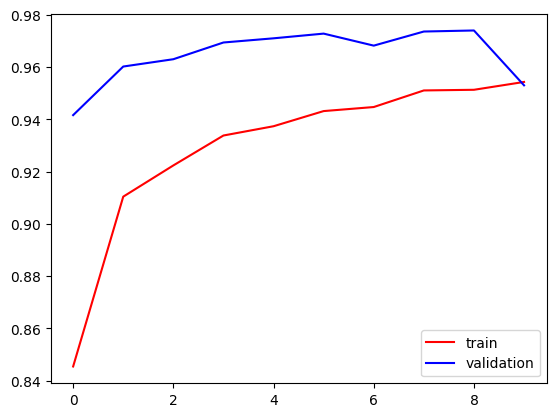

In [47]:
import matplotlib.pyplot as plt

plt.plot(history_3.history['accuracy'], color = 'red', label = 'train')
plt.plot(history_3.history['val_accuracy'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/VGG16_fine_tunning_Data_Augmentation/accuracy")
plt.show()

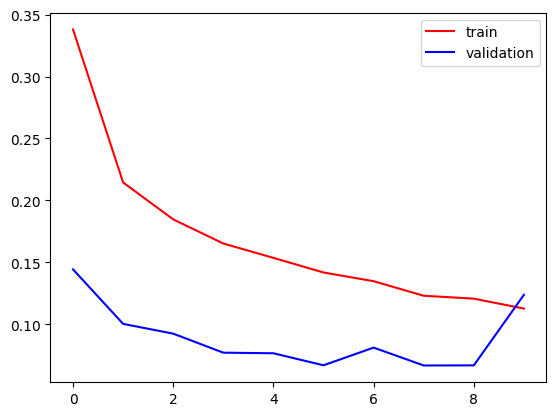

In [48]:
import matplotlib.pyplot as plt

plt.plot(history_3.history['loss'], color = 'red', label = 'train')
plt.plot(history_3.history['val_loss'], color = 'blue', label = 'validation')
plt.legend()
plt.savefig("/kaggle/working/models/VGG16_fine_tunning_Data_Augmentation/loss")
plt.show()

In [49]:
model.save("VGG16_fine_tunning_Data_Augmentation/model.keras")

## Downloading Models and Directories

In [ ]:
os.chdir('/kaggle/working')
!zip -r file.zip /kaggle/working